__Historical Simulation in Conjunction with GARCH Model for *VaR*__

by *Yingxin LIN*

#####  __Copyright Notice__

####### AUTHOR:
- *Yingxin LIN*
- *Prof.FAN Yi's workshop, School of Finance,Central University of Finance and Economics* (CUFE)

####### CONTACT:
- Remaining errors are mine.
- For corrections about the code,
  please mail me at: [lyxurthebest@163.com](lyxurthebest@163.com) or [lyxurthebest@outlook.com](lyxurthebest@outlook.com)
  
####### ATTENTION:  
- The copyright belongs to *Yingxin LIN*, 2021/08/11.

- *Enjoy! (...and extend/modify)*

##### __Preparation__
###### Import libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import pandas as pd
import os
from arch import arch_model

###### Filt warning

In [2]:
warnings.filterwarnings("ignore")

###### Set scheme of graph

In [164]:
%matplotlib inline
sns.set()
sns.set_style("whitegrid")
plt.rcParams['font.sans-serif'] = 'Times New Roman'

###### Set working directory

In [4]:
cd C:\Users\Lenovo\Desktop\讨论后\金融分业\VaR和合并的行业残差数据（完成第3次清洗，波动率加权的HS方法与金融分业）

C:\Users\Lenovo\Desktop\讨论后\金融分业\VaR和合并的行业残差数据（完成第3次清洗，波动率加权的HS方法与金融分业）


##### __Input files__
###### Load IRF result file

In [6]:
file_ls = os.listdir()
file_ls

['all_Industry_resid_data_num - 副本.csv',
 'all_Industry_resid_data_num - 副本.xlsx',
 'all_Industry_resid_data_num.csv',
 'all_Industry_resid_data_num.xlsx',
 'VaR_50_GARCH-HS-金融分业.csv',
 'VaR_5_GARCH-HS-金融分业.csv',
 'VaR_5_GARCH-HS.csv',
 'VaR_5_GARCH-HS.dta',
 '给列改名.do']

In [8]:
df_total = pd.read_csv(file_ls[0])
df_total

,date,R_1,R_2,R_3,R_4,R_5,R_6,R_7,R_8,R_9,...,R_28,R_29,R_30,R_31,R_32,R_33,R_34,R_35,R_36,R_37
0,2001-04-03,0.168928,-0.097472,-0.522323,1.490418,-1.321524,-0.427424,0.101173,-0.368521,-0.271137,...,-0.107502,0.535897,-0.071461,-0.343502,-0.385790,-0.161112,0.402051,0.413063,-0.190469,-0.256268
1,2001-04-04,-0.338107,0.114405,1.046751,-0.405442,0.566151,-0.534079,-0.371368,-2.433488,0.007814,...,0.009645,0.121573,-0.481711,-0.041472,0.175896,0.093436,0.329076,0.322232,0.177532,0.239416
2,2001-04-05,-0.034250,-0.036050,0.292876,0.945171,-0.190818,-0.142602,0.069175,1.064640,-0.064888,...,0.106078,0.447710,-0.604308,0.206428,-0.256433,0.345973,1.129841,-0.093842,-0.121157,-0.016057
3,2001-04-06,0.053720,0.356447,-0.016725,-0.600844,-0.736420,-0.067127,0.138273,-0.616266,-0.345035,...,0.146965,0.529301,0.161632,-0.179961,-0.054443,0.192990,-0.422804,-0.586307,-0.354886,0.234265
4,2001-04-09,0.029874,-0.116723,-1.020075,0.682565,0.305049,-0.175903,0.409646,1.296311,-0.699438,...,-0.588890,-0.031875,-0.321500,0.651604,0.258656,0.247895,-0.106107,-0.338753,1.300045,0.608097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4790,2020-12-25,-0.027759,0.504023,-0.223546,-2.464011,-0.092916,-2.247304,0.864100,1.087209,-0.063597,...,-0.567816,-0.452427,-1.203376,-0.391186,-0.083445,0.153722,0.801661,2.971186,0.633887,-0.862378
4791,2020-12-28,-0.318369,-0.470752,-1.698465,-2.390074,-1.985688,2.363044,-1.290919,-0.481408,-1.126230,...,0.643694,-0.361934,-1.325356,-0.158787,-1.127015,-1.320541,-0.958121,1.530008,-0.844237,0.638895
4792,2020-12-29,-0.326810,1.246186,1.324877,2.266534,0.880001,-1.594590,-0.310280,-0.556934,0.666230,...,0.667480,1.341490,2.812265,-0.241939,-1.149869,1.009751,-0.492054,-3.383006,-1.064589,0.685953
4793,2020-12-30,0.796668,-0.558453,-0.668731,-1.287825,-0.008078,-0.740952,-0.305513,0.600735,-1.227691,...,-0.514858,0.374944,-0.117525,0.703591,-0.901681,-0.597785,-0.276086,0.373969,-0.088928,1.707659


In [9]:
winsize = 250  # winsize是利用 排序-求分位数-VaR 时所用到的窗口宽度，而不是对 GARCH 模型做估计时的窗口
len_of_s = 2 * winsize - 1  # len_of_s -->

In [178]:
def GARCH_HS(s, winsize, day=4, miu=False):
    s = s.reset_index(drop=True)  # 对Series s 重设索引
    

    garch = arch_model(y=s, mean='Constant', lags=0, vol='GARCH', p=1, o=0, q=1, dist='normal')
        
    garchmodel = garch.fit(disp=0)
    params = garchmodel.params
    sigma = sigma_2 = np.zeros(winsize + 1)  # +1 是为了放未来波动率的预测值

    # Set volatility at the 1st time point of the 2rd window
    if day != 0:
        sigma[0] = (s[winsize - day:winsize]).std()
    else:
        sigma[0] = 0.0


    ret = s[winsize - 1:]
    ret = ret.reset_index(drop=True)

    
    # Set gamma (γ)
    if miu:
        gamma = ret - params[0]
    else:
        gamma = ret
    
    # gamma = ret
    
    gamma_2 = gamma ** 2
    
    for i in range(winsize):
        sigma_2[i + 1] = params[1] + params[2] * gamma_2[i] + params[3] * sigma_2[i]
    
    sigma = np.sqrt(sigma_2)
    
    wight = 1 / sigma[:-1]
    wight_ret = ret * wight * sigma[-1]
    VaR_p5 = np.percentile(wight_ret, 5)
    VaR_p50 = np.percentile(wight_ret, 50)

    return VaR_p5, VaR_p50

In [58]:
%%time
for j in range(1, 5):  # the 1st loop --> Panel level

    df = df_total[['date', 'R_' + str(j)]]  # df is just a temp DataFrame
    df['VaR_5_' + str(j)] = np.nan
    df['VaR_50_' + str(j)] = np.nan

    for k in range(df.shape[0] - len_of_s + 1):  # the 2rd loop --> time series level
        s = df['R_' + str(j)][k:k + len_of_s]
        VaR_5, VaR_50 = GARCH_HS(s, winsize)
        df.loc[k + len_of_s - 1, 'VaR_5_' + str(j)] = VaR_5
        df.loc[k + len_of_s - 1, 'VaR_50_' + str(j)] = VaR_50

    df = df.dropna()
    if j == 1:
        result_5 = df[['date', 'VaR_5_' + str(j)]]
        result_50 = df[['date', 'VaR_50_' + str(j)]]
    else:
        result_5 = pd.merge(result_5, df[['date', 'VaR_5_' + str(j)]], how='outer')
        result_50 = pd.merge(result_50, df[['date', 'VaR_50_' + str(j)]], how='outer')

    print("》》》》》》{}!!".format(j))

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1082.3178847091597
Iteration:      2,   Func. Count:     15,   Neg. LLF: 22366.300953095924
Iteration:      3,   Func. Count:     22,   Neg. LLF: 991.7617914862465
Iteration:      4,   Func. Count:     29,   Neg. LLF: 258.4229609537342
Iteration:      5,   Func. Count:     35,   Neg. LLF: 249.20731085603592
Iteration:      6,   Func. Count:     41,   Neg. LLF: 247.5650353617642
Iteration:      7,   Func. Count:     46,   Neg. LLF: 247.5628329415362
Iteration:      8,   Func. Count:     51,   Neg. LLF: 247.55484172735402
Iteration:      9,   Func. Count:     56,   Neg. LLF: 246.51485322895059
Iteration:     10,   Func. Count:     61,   Neg. LLF: 264.7634804539344
Iteration:     11,   Func. Count:     67,   Neg. LLF: 251.6703689567646
Iteration:     12,   Func. Count:     73,   Neg. LLF: 246.53690907954018
Iteration:     13,   Func. Count:     79,   Neg. LLF: 246.34881605967433
Iteration:     14,   Func. Count:     84,   Neg. LLF: 246

Iteration:      2,   Func. Count:     15,   Neg. LLF: 79586.52731387812
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1150.39025712083
Iteration:      4,   Func. Count:     30,   Neg. LLF: 264.6487957167408
Iteration:      5,   Func. Count:     38,   Neg. LLF: 259.0714688425817
Iteration:      6,   Func. Count:     43,   Neg. LLF: 259.07140537084217
Iteration:      7,   Func. Count:     48,   Neg. LLF: 259.07140131228346
Iteration:      8,   Func. Count:     52,   Neg. LLF: 259.0714013118561
Iteration:      1,   Func. Count:      6,   Neg. LLF: 686.1044929314185
Iteration:      2,   Func. Count:     15,   Neg. LLF: 23211.887143891625
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2109.0760355369807
Iteration:      4,   Func. Count:     30,   Neg. LLF: 265.09883231958673
Iteration:      5,   Func. Count:     38,   Neg. LLF: 259.7252211458764
Iteration:      6,   Func. Count:     43,   Neg. LLF: 259.72515187079927
Iteration:      7,   Func. Count:     48,   Neg. LLF: 259.7

Iteration:      5,   Func. Count:     37,   Neg. LLF: 278.4368697967753
Iteration:      6,   Func. Count:     43,   Neg. LLF: 278.27102002752224
Iteration:      7,   Func. Count:     49,   Neg. LLF: 278.2529572243832
Iteration:      8,   Func. Count:     54,   Neg. LLF: 278.25283504830355
Iteration:      9,   Func. Count:     59,   Neg. LLF: 278.2528332381747
Iteration:     10,   Func. Count:     63,   Neg. LLF: 278.25283323766496
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3133.5193903765376
Iteration:      2,   Func. Count:     15,   Neg. LLF: 392345458.1921577
Iteration:      3,   Func. Count:     23,   Neg. LLF: 221561.6012263878
Iteration:      4,   Func. Count:     29,   Neg. LLF: 297.6784098213809
Iteration:      5,   Func. Count:     35,   Neg. LLF: 287.06929147369107
Iteration:      6,   Func. Count:     41,   Neg. LLF: 297.00811999687056
Iteration:      7,   Func. Count:     47,   Neg. LLF: 283.65941436234226
Iteration:      8,   Func. Count:     53,   Neg. LLF: 279

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3459.201729138863
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1010076.0432754429
Iteration:      3,   Func. Count:     23,   Neg. LLF: 345.6062488916449
Iteration:      4,   Func. Count:     31,   Neg. LLF: 299.3085226349856
Iteration:      5,   Func. Count:     37,   Neg. LLF: 286.4803361450025
Iteration:      6,   Func. Count:     42,   Neg. LLF: 286.480245422139
Iteration:      7,   Func. Count:     47,   Neg. LLF: 286.48024445641744
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3422.6315073870956
Iteration:      2,   Func. Count:     15,   Neg. LLF: 166216.30151888306
Iteration:      3,   Func. Count:     23,   Neg. LLF: 344.80372328231886
Iteration:      4,   Func. Count:     32,   Neg. LLF: 299.6538297753622
Iteration:      5,   Func. Count:     38,   Neg. LLF: 286.4278202177736
Iteration:      6,   Func. Count:     43,   Neg. LLF: 286.4278188864837
Iteration:      7,   Func. Count:     47,   Neg. LLF: 286.42

Iteration:      4,   Func. Count:     30,   Neg. LLF: 291.1303143726751
Iteration:      5,   Func. Count:     36,   Neg. LLF: 288.4471330974636
Iteration:      6,   Func. Count:     41,   Neg. LLF: 288.4470499419862
Iteration:      7,   Func. Count:     46,   Neg. LLF: 288.44704902608663
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2198.442723181989
Iteration:      2,   Func. Count:     15,   Neg. LLF: 482597395.7482259
Iteration:      3,   Func. Count:     23,   Neg. LLF: 296.85232726247546
Iteration:      4,   Func. Count:     30,   Neg. LLF: 291.2605472998466
Iteration:      5,   Func. Count:     36,   Neg. LLF: 288.6627608302664
Iteration:      6,   Func. Count:     41,   Neg. LLF: 288.66267989773775
Iteration:      7,   Func. Count:     46,   Neg. LLF: 288.66267893763677
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2231.7804128325215
Iteration:      2,   Func. Count:     15,   Neg. LLF: 469758166.2812107
Iteration:      3,   Func. Count:     23,   Neg. LLF: 296.8

Iteration:     11,   Func. Count:     67,   Neg. LLF: 283.9370349905288
Iteration:     12,   Func. Count:     72,   Neg. LLF: 283.93703020537635
Iteration:     13,   Func. Count:     76,   Neg. LLF: 283.9370302051494
Iteration:      1,   Func. Count:      6,   Neg. LLF: 573661139636.8604
Iteration:      2,   Func. Count:     15,   Neg. LLF: 284794938.98366356
Iteration:      3,   Func. Count:     22,   Neg. LLF: 479.1792688800378
Iteration:      4,   Func. Count:     29,   Neg. LLF: 331.5297682238678
Iteration:      5,   Func. Count:     35,   Neg. LLF: 283.2537593641859
Iteration:      6,   Func. Count:     41,   Neg. LLF: 283.1954993782799
Iteration:      7,   Func. Count:     47,   Neg. LLF: 283.1473103754114
Iteration:      8,   Func. Count:     52,   Neg. LLF: 283.14722781794586
Iteration:      9,   Func. Count:     56,   Neg. LLF: 283.1472278176516
Iteration:      1,   Func. Count:      6,   Neg. LLF: 61016.79147354614
Iteration:      2,   Func. Count:     15,   Neg. LLF: 350.882

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2687.13632668638
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1911.7969878737613
Iteration:      3,   Func. Count:     23,   Neg. LLF: 284.25536272153374
Iteration:      4,   Func. Count:     30,   Neg. LLF: 587.030644050505
Iteration:      5,   Func. Count:     36,   Neg. LLF: 269.7853010146304
Iteration:      6,   Func. Count:     41,   Neg. LLF: 269.7843387958326
Iteration:      7,   Func. Count:     46,   Neg. LLF: 269.784000279829
Iteration:      8,   Func. Count:     51,   Neg. LLF: 269.78399957785825
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2693.3399449446556
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1914.8482730111918
Iteration:      3,   Func. Count:     23,   Neg. LLF: 287.0404154390409
Iteration:      4,   Func. Count:     29,   Neg. LLF: 390.29488148223834
Iteration:      5,   Func. Count:     35,   Neg. LLF: 273.9167609816376
Iteration:      6,   Func. Count:     40,   Neg. LLF: 273.912

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2914.1921744578553
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1916.1931930488079
Iteration:      3,   Func. Count:     23,   Neg. LLF: 288.67752784888836
Iteration:      4,   Func. Count:     30,   Neg. LLF: 371.7677728885085
Iteration:      5,   Func. Count:     36,   Neg. LLF: 275.61542664484153
Iteration:      6,   Func. Count:     41,   Neg. LLF: 275.613322831475
Iteration:      7,   Func. Count:     46,   Neg. LLF: 275.6127783458518
Iteration:      8,   Func. Count:     51,   Neg. LLF: 275.61277365712704
Iteration:      9,   Func. Count:     56,   Neg. LLF: 275.61277302289517
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2907.8333614663816
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1915.6270211449303
Iteration:      3,   Func. Count:     23,   Neg. LLF: 288.00095784007675
Iteration:      4,   Func. Count:     30,   Neg. LLF: 375.97215348200814
Iteration:      5,   Func. Count:     36,   Neg. LLF: 2

Iteration:      2,   Func. Count:     15,   Neg. LLF: 74121.3991431214
Iteration:      3,   Func. Count:     22,   Neg. LLF: 322.92660577032086
Iteration:      4,   Func. Count:     30,   Neg. LLF: 267.74056059662917
Iteration:      5,   Func. Count:     37,   Neg. LLF: 267.4480298187784
Iteration:      6,   Func. Count:     42,   Neg. LLF: 267.44791254382346
Iteration:      7,   Func. Count:     46,   Neg. LLF: 267.4479125437935
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2687.4827021452393
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1910.3313129106225
Iteration:      3,   Func. Count:     23,   Neg. LLF: 282.61705340797033
Iteration:      4,   Func. Count:     29,   Neg. LLF: 269.7657757304667
Iteration:      5,   Func. Count:     34,   Neg. LLF: 269.73252773598045
Iteration:      6,   Func. Count:     40,   Neg. LLF: 269.59022939470515
Iteration:      7,   Func. Count:     45,   Neg. LLF: 269.58642342729433
Iteration:      8,   Func. Count:     50,   Neg. LLF: 26

Iteration:      4,   Func. Count:     29,   Neg. LLF: 297.8217751632009
Iteration:      5,   Func. Count:     35,   Neg. LLF: 273.47113934608774
Iteration:      6,   Func. Count:     41,   Neg. LLF: 273.444124062152
Iteration:      7,   Func. Count:     46,   Neg. LLF: 273.44409701557333
Iteration:      8,   Func. Count:     50,   Neg. LLF: 273.44409701565394
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7721.354980307351
Iteration:      2,   Func. Count:     15,   Neg. LLF: 103996.07443008918
Iteration:      3,   Func. Count:     22,   Neg. LLF: 290.05430854473497
Iteration:      4,   Func. Count:     28,   Neg. LLF: 327.16221462574345
Iteration:      5,   Func. Count:     36,   Neg. LLF: 273.1877333814888
Iteration:      6,   Func. Count:     42,   Neg. LLF: 273.188545447964
Iteration:      7,   Func. Count:     47,   Neg. LLF: 273.1824038194562
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7572.297499423064
Iteration:      2,   Func. Count:     15,   Neg. LLF: 60658.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 984736.2467400244
Iteration:      3,   Func. Count:     22,   Neg. LLF: 326.81408022280146
Iteration:      4,   Func. Count:     29,   Neg. LLF: 291.5860469757098
Iteration:      5,   Func. Count:     34,   Neg. LLF: 291.70538302733075
Iteration:      6,   Func. Count:     40,   Neg. LLF: 291.54031942142035
Iteration:      7,   Func. Count:     45,   Neg. LLF: 291.53551557936
Iteration:      8,   Func. Count:     50,   Neg. LLF: 291.53542315609525
Iteration:      9,   Func. Count:     55,   Neg. LLF: 291.5354094762614
Iteration:     10,   Func. Count:     59,   Neg. LLF: 291.53540947620365
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6682.343090557451
Iteration:      2,   Func. Count:     15,   Neg. LLF: 231937.18207291234
Iteration:      3,   Func. Count:     22,   Neg. LLF: 329.8536551385082
Iteration:      4,   Func. Count:     29,   Neg. LLF: 295.28743652750865
Iteration:      5,   Func. Count:     34,   Neg. LLF: 295.3

Iteration:      3,   Func. Count:     24,   Neg. LLF: 92498670.59940238
Iteration:      4,   Func. Count:     30,   Neg. LLF: 324.98307962759645
Iteration:      5,   Func. Count:     36,   Neg. LLF: 358.89470118340813
Iteration:      6,   Func. Count:     42,   Neg. LLF: 311.1373322396678
Iteration:      7,   Func. Count:     48,   Neg. LLF: 310.5504145227324
Iteration:      8,   Func. Count:     53,   Neg. LLF: 310.5479704768386
Iteration:      9,   Func. Count:     58,   Neg. LLF: 310.54779519694955
Iteration:     10,   Func. Count:     63,   Neg. LLF: 310.54775989092866
Iteration:     11,   Func. Count:     67,   Neg. LLF: 310.5477598912071
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2319.5192564635404
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1980.5715216178564
Iteration:      3,   Func. Count:     24,   Neg. LLF: 94286570.4075505
Iteration:      4,   Func. Count:     30,   Neg. LLF: 326.8539702227829
Iteration:      5,   Func. Count:     36,   Neg. LLF: 356.9

Iteration:      3,   Func. Count:     24,   Neg. LLF: 97827533.96877222
Iteration:      4,   Func. Count:     30,   Neg. LLF: 326.08413848792713
Iteration:      5,   Func. Count:     36,   Neg. LLF: 402.8872458676642
Iteration:      6,   Func. Count:     42,   Neg. LLF: 313.9679598993773
Iteration:      7,   Func. Count:     47,   Neg. LLF: 313.9518907763057
Iteration:      8,   Func. Count:     52,   Neg. LLF: 313.95137545425064
Iteration:      9,   Func. Count:     57,   Neg. LLF: 313.9511987016532
Iteration:     10,   Func. Count:     62,   Neg. LLF: 313.95119212774404
Iteration:     11,   Func. Count:     66,   Neg. LLF: 313.95119212770504
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2033.4937932955265
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1708.5617015458638
Iteration:      3,   Func. Count:     24,   Neg. LLF: 102687703.50509262
Iteration:      4,   Func. Count:     30,   Neg. LLF: 328.18994588167914
Iteration:      5,   Func. Count:     36,   Neg. LLF: 38

Iteration:      4,   Func. Count:     30,   Neg. LLF: 314.8670825480704
Iteration:      5,   Func. Count:     36,   Neg. LLF: 313.29778994608375
Iteration:      6,   Func. Count:     41,   Neg. LLF: 313.2961545681573
Iteration:      7,   Func. Count:     46,   Neg. LLF: 313.2952899037192
Iteration:      8,   Func. Count:     51,   Neg. LLF: 313.2952500471947
Iteration:      9,   Func. Count:     56,   Neg. LLF: 313.29524739830055
Iteration:     10,   Func. Count:     60,   Neg. LLF: 313.29524739764156
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2488.291943231182
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4015583494.885688
Iteration:      3,   Func. Count:     23,   Neg. LLF: 342.48054596158704
Iteration:      4,   Func. Count:     30,   Neg. LLF: 315.65562532295456
Iteration:      5,   Func. Count:     36,   Neg. LLF: 314.12723046777944
Iteration:      6,   Func. Count:     41,   Neg. LLF: 314.11888265110395
Iteration:      7,   Func. Count:     46,   Neg. LLF: 314

Iteration:      6,   Func. Count:     42,   Neg. LLF: 323.40322351411095
Iteration:      7,   Func. Count:     47,   Neg. LLF: 323.4025944076162
Iteration:      8,   Func. Count:     52,   Neg. LLF: 323.40258871536787
Iteration:      9,   Func. Count:     56,   Neg. LLF: 323.40258871531466
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2170.8843460317003
Iteration:      2,   Func. Count:     15,   Neg. LLF: 10300954585.629227
Iteration:      3,   Func. Count:     24,   Neg. LLF: 350.1198137413918
Iteration:      4,   Func. Count:     31,   Neg. LLF: 325.1316996433568
Iteration:      5,   Func. Count:     38,   Neg. LLF: 324.4102400361713
Iteration:      6,   Func. Count:     43,   Neg. LLF: 324.40746982811504
Iteration:      7,   Func. Count:     48,   Neg. LLF: 324.405858610991
Iteration:      8,   Func. Count:     53,   Neg. LLF: 324.4055235284727
Iteration:      9,   Func. Count:     58,   Neg. LLF: 324.40551147485826
Iteration:     10,   Func. Count:     63,   Neg. LLF: 324.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 98325.1210869902
Iteration:      3,   Func. Count:     22,   Neg. LLF: 362.15162354101733
Iteration:      4,   Func. Count:     29,   Neg. LLF: 329.0519072481277
Iteration:      5,   Func. Count:     34,   Neg. LLF: 329.0216716951532
Iteration:      6,   Func. Count:     39,   Neg. LLF: 329.0127980093454
Iteration:      7,   Func. Count:     44,   Neg. LLF: 329.0068583181404
Iteration:      8,   Func. Count:     49,   Neg. LLF: 329.00664732740665
Iteration:      9,   Func. Count:     54,   Neg. LLF: 329.00664165719706
Iteration:     10,   Func. Count:     58,   Neg. LLF: 329.00664168140304
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3134.1794104287796
Iteration:      2,   Func. Count:     15,   Neg. LLF: 962851.4917211251
Iteration:      3,   Func. Count:     22,   Neg. LLF: 362.66677744335266
Iteration:      4,   Func. Count:     29,   Neg. LLF: 329.6425261813944
Iteration:      5,   Func. Count:     34,   Neg. LLF: 329.6

Iteration:      3,   Func. Count:     22,   Neg. LLF: 364.7149440981297
Iteration:      4,   Func. Count:     29,   Neg. LLF: 331.5528581783437
Iteration:      5,   Func. Count:     34,   Neg. LLF: 331.5254798959588
Iteration:      6,   Func. Count:     39,   Neg. LLF: 331.5185704732848
Iteration:      7,   Func. Count:     44,   Neg. LLF: 331.5137397756042
Iteration:      8,   Func. Count:     49,   Neg. LLF: 331.51373388490555
Iteration:      9,   Func. Count:     53,   Neg. LLF: 331.5137339109692
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2709.8243976149624
Iteration:      2,   Func. Count:     15,   Neg. LLF: 117567.86404222783
Iteration:      3,   Func. Count:     22,   Neg. LLF: 365.4742403151316
Iteration:      4,   Func. Count:     29,   Neg. LLF: 331.78993766740166
Iteration:      5,   Func. Count:     34,   Neg. LLF: 331.7653282610478
Iteration:      6,   Func. Count:     39,   Neg. LLF: 331.7587034716739
Iteration:      7,   Func. Count:     44,   Neg. LLF: 331.75

Iteration:      9,   Func. Count:     57,   Neg. LLF: 331.23139206934684
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1980.874469913182
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1949157672.1794415
Iteration:      3,   Func. Count:     24,   Neg. LLF: 39618.42671280751
Iteration:      4,   Func. Count:     30,   Neg. LLF: 339.55171328905453
Iteration:      5,   Func. Count:     36,   Neg. LLF: 331.843945829179
Iteration:      6,   Func. Count:     42,   Neg. LLF: 331.49634146065347
Iteration:      7,   Func. Count:     47,   Neg. LLF: 331.49523157446583
Iteration:      8,   Func. Count:     52,   Neg. LLF: 331.4952204441279
Iteration:      9,   Func. Count:     56,   Neg. LLF: 331.49522044304035
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1983.4744108232078
Iteration:      2,   Func. Count:     15,   Neg. LLF: 443690659.44860137
Iteration:      3,   Func. Count:     23,   Neg. LLF: 18728.914174383746
Iteration:      4,   Func. Count:     29,   Neg. LLF: 34

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2077.2827201061964
Iteration:      2,   Func. Count:     14,   Neg. LLF: 54079.93430763652
Iteration:      3,   Func. Count:     20,   Neg. LLF: 395.293970159706
Iteration:      4,   Func. Count:     27,   Neg. LLF: 375.3606612464673
Iteration:      5,   Func. Count:     32,   Neg. LLF: 375.171807547746
Iteration:      6,   Func. Count:     37,   Neg. LLF: 374.9372875629852
Iteration:      7,   Func. Count:     42,   Neg. LLF: 374.90348158337804
Iteration:      8,   Func. Count:     47,   Neg. LLF: 374.8845150404484
Iteration:      9,   Func. Count:     52,   Neg. LLF: 374.88434786136247
Iteration:     10,   Func. Count:     57,   Neg. LLF: 374.884257752757
Iteration:     11,   Func. Count:     61,   Neg. LLF: 374.88425805837625
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2166.306408007255
Iteration:      2,   Func. Count:     14,   Neg. LLF: 239441.62905218615
Iteration:      3,   Func. Count:     20,   Neg. LLF: 394.1995

Iteration:      4,   Func. Count:     27,   Neg. LLF: 382.81929106800567
Iteration:      5,   Func. Count:     32,   Neg. LLF: 381.8053066060952
Iteration:      6,   Func. Count:     37,   Neg. LLF: 381.65606961200723
Iteration:      7,   Func. Count:     42,   Neg. LLF: 381.6192078330845
Iteration:      8,   Func. Count:     47,   Neg. LLF: 381.6078039678728
Iteration:      9,   Func. Count:     52,   Neg. LLF: 381.60703590433764
Iteration:     10,   Func. Count:     57,   Neg. LLF: 381.60703230656884
Iteration:     11,   Func. Count:     61,   Neg. LLF: 381.60703262722745
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1870.909931150572
Iteration:      2,   Func. Count:     14,   Neg. LLF: 747117.4197917157
Iteration:      3,   Func. Count:     20,   Neg. LLF: 397.6804306259637
Iteration:      4,   Func. Count:     27,   Neg. LLF: 380.8833723400573
Iteration:      5,   Func. Count:     32,   Neg. LLF: 380.65000045832846
Iteration:      6,   Func. Count:     37,   Neg. LLF: 380.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2147.636177435971
Iteration:      2,   Func. Count:     14,   Neg. LLF: 80925.07922757523
Iteration:      3,   Func. Count:     20,   Neg. LLF: 400.822531779084
Iteration:      4,   Func. Count:     27,   Neg. LLF: 384.2492341325718
Iteration:      5,   Func. Count:     32,   Neg. LLF: 383.50542603169583
Iteration:      6,   Func. Count:     37,   Neg. LLF: 383.313675226665
Iteration:      7,   Func. Count:     42,   Neg. LLF: 383.26501466247964
Iteration:      8,   Func. Count:     47,   Neg. LLF: 383.24816168842835
Iteration:      9,   Func. Count:     52,   Neg. LLF: 383.247495141679
Iteration:     10,   Func. Count:     57,   Neg. LLF: 383.247493285628
Iteration:     11,   Func. Count:     61,   Neg. LLF: 383.24749358816246
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2136.636313886527
Iteration:      2,   Func. Count:     14,   Neg. LLF: 94069.578774549
Iteration:      3,   Func. Count:     20,   Neg. LLF: 400.80837360

Iteration:     11,   Func. Count:     62,   Neg. LLF: 380.1082120145541
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3648.716746493434
Iteration:      2,   Func. Count:     14,   Neg. LLF: 179569.02921133087
Iteration:      3,   Func. Count:     20,   Neg. LLF: 387.4275892446948
Iteration:      4,   Func. Count:     27,   Neg. LLF: 423.1998477342909
Iteration:      5,   Func. Count:     33,   Neg. LLF: 382.39208913641204
Iteration:      6,   Func. Count:     38,   Neg. LLF: 381.4707012869471
Iteration:      7,   Func. Count:     43,   Neg. LLF: 381.40857140747676
Iteration:      8,   Func. Count:     48,   Neg. LLF: 381.402586504726
Iteration:      9,   Func. Count:     53,   Neg. LLF: 381.40110803991683
Iteration:     10,   Func. Count:     58,   Neg. LLF: 381.4010780825666
Iteration:     11,   Func. Count:     62,   Neg. LLF: 381.4010782273306
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3803.464153204535
Iteration:      2,   Func. Count:     14,   Neg. LLF: 218402.

Iteration:     11,   Func. Count:     62,   Neg. LLF: 387.1285049574856
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3087.6205898164403
Iteration:      2,   Func. Count:     14,   Neg. LLF: 203723.18928205827
Iteration:      3,   Func. Count:     20,   Neg. LLF: 392.5296296125497
Iteration:      4,   Func. Count:     27,   Neg. LLF: 425.3219486666517
Iteration:      5,   Func. Count:     33,   Neg. LLF: 388.10994146484904
Iteration:      6,   Func. Count:     38,   Neg. LLF: 387.17774597902564
Iteration:      7,   Func. Count:     43,   Neg. LLF: 387.0889418132125
Iteration:      8,   Func. Count:     48,   Neg. LLF: 387.08761608720016
Iteration:      9,   Func. Count:     53,   Neg. LLF: 387.08716275574346
Iteration:     10,   Func. Count:     58,   Neg. LLF: 387.0871613371869
Iteration:     11,   Func. Count:     62,   Neg. LLF: 387.0871614302106
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2912.3602779856146
Iteration:      2,   Func. Count:     14,   Neg. LLF: 172

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2181.043716249799
Iteration:      2,   Func. Count:     15,   Neg. LLF: 596416.9657212507
Iteration:      3,   Func. Count:     21,   Neg. LLF: 409.17753030325895
Iteration:      4,   Func. Count:     27,   Neg. LLF: 421.9268087758621
Iteration:      5,   Func. Count:     33,   Neg. LLF: 400.2411031439272
Iteration:      6,   Func. Count:     38,   Neg. LLF: 398.91948283079785
Iteration:      7,   Func. Count:     43,   Neg. LLF: 432.30286364826867
Iteration:      8,   Func. Count:     50,   Neg. LLF: 398.71635965655474
Iteration:      9,   Func. Count:     55,   Neg. LLF: 398.6993540766415
Iteration:     10,   Func. Count:     60,   Neg. LLF: 398.69844355381355
Iteration:     11,   Func. Count:     65,   Neg. LLF: 398.69822871437896
Iteration:     12,   Func. Count:     70,   Neg. LLF: 398.6982278600752
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2340.6880703215966
Iteration:      2,   Func. Count:     14,   Neg. LLF: 247

Iteration:      2,   Func. Count:     14,   Neg. LLF: 223231.51179693334
Iteration:      3,   Func. Count:     20,   Neg. LLF: 430.94708202252525
Iteration:      4,   Func. Count:     27,   Neg. LLF: 416.2622778286074
Iteration:      5,   Func. Count:     32,   Neg. LLF: 427.59809308244064
Iteration:      6,   Func. Count:     38,   Neg. LLF: 416.19220218977387
Iteration:      7,   Func. Count:     43,   Neg. LLF: 416.18297994068894
Iteration:      8,   Func. Count:     48,   Neg. LLF: 416.18127916303365
Iteration:      9,   Func. Count:     53,   Neg. LLF: 416.18127110656644
Iteration:     10,   Func. Count:     57,   Neg. LLF: 416.1812711822299
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2755.302431158394
Iteration:      2,   Func. Count:     14,   Neg. LLF: 205017.66438742366
Iteration:      3,   Func. Count:     20,   Neg. LLF: 432.61693772503924
Iteration:      4,   Func. Count:     27,   Neg. LLF: 417.6360142466892
Iteration:      5,   Func. Count:     32,   Neg. LLF: 4

Iteration:      8,   Func. Count:     48,   Neg. LLF: 420.56364365660073
Iteration:      9,   Func. Count:     53,   Neg. LLF: 420.5636171927008
Iteration:     10,   Func. Count:     57,   Neg. LLF: 420.56361724817225
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3291.794310949217
Iteration:      2,   Func. Count:     14,   Neg. LLF: 145092.78206280275
Iteration:      3,   Func. Count:     20,   Neg. LLF: 436.94645178174613
Iteration:      4,   Func. Count:     27,   Neg. LLF: 429.26483736401315
Iteration:      5,   Func. Count:     33,   Neg. LLF: 420.6743327836054
Iteration:      6,   Func. Count:     38,   Neg. LLF: 420.65804824828234
Iteration:      7,   Func. Count:     43,   Neg. LLF: 420.61899550917394
Iteration:      8,   Func. Count:     48,   Neg. LLF: 420.61778422852126
Iteration:      9,   Func. Count:     53,   Neg. LLF: 420.6177646977444
Iteration:     10,   Func. Count:     57,   Neg. LLF: 420.61776475079057
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3094.8737701931423
Iteration:      2,   Func. Count:     14,   Neg. LLF: 67217.50571330897
Iteration:      3,   Func. Count:     20,   Neg. LLF: 441.6060397804202
Iteration:      4,   Func. Count:     27,   Neg. LLF: 433.4204104699587
Iteration:      5,   Func. Count:     33,   Neg. LLF: 426.92466151999565
Iteration:      6,   Func. Count:     38,   Neg. LLF: 426.8937616424764
Iteration:      7,   Func. Count:     43,   Neg. LLF: 426.88040272749464
Iteration:      8,   Func. Count:     48,   Neg. LLF: 426.8695556047471
Iteration:      9,   Func. Count:     53,   Neg. LLF: 426.86952516830013
Iteration:     10,   Func. Count:     57,   Neg. LLF: 426.86952519729726
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3027.4076438002267
Iteration:      2,   Func. Count:     14,   Neg. LLF: 40334.34265984423
Iteration:      3,   Func. Count:     20,   Neg. LLF: 441.78027656884535
Iteration:      4,   Func. Count:     27,   Neg. LLF: 437

Iteration:      2,   Func. Count:     14,   Neg. LLF: 955215.4905633777
Iteration:      3,   Func. Count:     20,   Neg. LLF: 448.65315136712195
Iteration:      4,   Func. Count:     27,   Neg. LLF: 452.2006933845792
Iteration:      5,   Func. Count:     33,   Neg. LLF: 431.5137166352363
Iteration:      6,   Func. Count:     38,   Neg. LLF: 431.49119406088596
Iteration:      7,   Func. Count:     43,   Neg. LLF: 431.48783594018823
Iteration:      8,   Func. Count:     48,   Neg. LLF: 431.48784265692086
Iteration:      9,   Func. Count:     53,   Neg. LLF: 431.48777925460126
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1988.226844392978
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2052161.2645320287
Iteration:      3,   Func. Count:     20,   Neg. LLF: 448.2377022774543
Iteration:      4,   Func. Count:     27,   Neg. LLF: 452.241720216466
Iteration:      5,   Func. Count:     33,   Neg. LLF: 431.53480122763494
Iteration:      6,   Func. Count:     38,   Neg. LLF: 431.

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1283.5574240917617
Iteration:      3,   Func. Count:     23,   Neg. LLF: 471.44545527639474
Iteration:      4,   Func. Count:     29,   Neg. LLF: 438.486060665065
Iteration:      5,   Func. Count:     34,   Neg. LLF: 438.46154273980335
Iteration:      6,   Func. Count:     39,   Neg. LLF: 438.4413567119155
Iteration:      7,   Func. Count:     44,   Neg. LLF: 438.4395039688202
Iteration:      8,   Func. Count:     49,   Neg. LLF: 438.439488301017
Iteration:      9,   Func. Count:     53,   Neg. LLF: 438.43948834572905
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2032.3473354086195
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1306.341915330387
Iteration:      3,   Func. Count:     22,   Neg. LLF: 471.66415233828
Iteration:      4,   Func. Count:     28,   Neg. LLF: 439.1411073713772
Iteration:      5,   Func. Count:     33,   Neg. LLF: 439.1197243892292
Iteration:      6,   Func. Count:     38,   Neg. LLF: 439.10931

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1635.0508738184958
Iteration:      3,   Func. Count:     23,   Neg. LLF: 487.6187011760205
Iteration:      4,   Func. Count:     30,   Neg. LLF: 450.285133678905
Iteration:      5,   Func. Count:     35,   Neg. LLF: 450.4975393676058
Iteration:      6,   Func. Count:     41,   Neg. LLF: 450.1526273507447
Iteration:      7,   Func. Count:     46,   Neg. LLF: 450.14528144637643
Iteration:      8,   Func. Count:     51,   Neg. LLF: 450.14491184866904
Iteration:      9,   Func. Count:     56,   Neg. LLF: 450.1448722790584
Iteration:     10,   Func. Count:     60,   Neg. LLF: 450.1448722789293
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1650.5865824253137
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1516.0073388682872
Iteration:      3,   Func. Count:     23,   Neg. LLF: 489.5518084716222
Iteration:      4,   Func. Count:     30,   Neg. LLF: 450.6037916189372
Iteration:      5,   Func. Count:     35,   Neg. LLF: 450.75

Iteration:      2,   Func. Count:     14,   Neg. LLF: 890.8503103719952
Iteration:      3,   Func. Count:     22,   Neg. LLF: 503.9822382980222
Iteration:      4,   Func. Count:     29,   Neg. LLF: 452.28437180440034
Iteration:      5,   Func. Count:     34,   Neg. LLF: 452.2565152521605
Iteration:      6,   Func. Count:     40,   Neg. LLF: 451.9995352921564
Iteration:      7,   Func. Count:     45,   Neg. LLF: 451.9914846073159
Iteration:      8,   Func. Count:     50,   Neg. LLF: 451.9913961135718
Iteration:      9,   Func. Count:     55,   Neg. LLF: 451.9913936517587
Iteration:     10,   Func. Count:     59,   Neg. LLF: 451.99139365195526
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1162.7655424507184
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1102.7066311585986
Iteration:      3,   Func. Count:     22,   Neg. LLF: 500.39583581992486
Iteration:      4,   Func. Count:     29,   Neg. LLF: 451.9866121921418
Iteration:      5,   Func. Count:     35,   Neg. LLF: 451.9

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2114.368894258018
Iteration:      2,   Func. Count:     14,   Neg. LLF: 5008.8563641321125
Iteration:      3,   Func. Count:     23,   Neg. LLF: 475.43553615293695
Iteration:      4,   Func. Count:     29,   Neg. LLF: 463.11912673644304
Iteration:      5,   Func. Count:     34,   Neg. LLF: 463.22912554033417
Iteration:      6,   Func. Count:     40,   Neg. LLF: 462.93061124826636
Iteration:      7,   Func. Count:     45,   Neg. LLF: 462.9233834470283
Iteration:      8,   Func. Count:     50,   Neg. LLF: 462.92298224515037
Iteration:      9,   Func. Count:     55,   Neg. LLF: 462.92295572769683
Iteration:     10,   Func. Count:     60,   Neg. LLF: 462.9229533080135
Iteration:     11,   Func. Count:     64,   Neg. LLF: 462.9229533079761
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2110.332278479735
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4669.691493088625
Iteration:      3,   Func. Count:     22,   Neg. LLF: 475

Iteration:      7,   Func. Count:     45,   Neg. LLF: 475.85498540820697
Iteration:      8,   Func. Count:     50,   Neg. LLF: 475.85414756847
Iteration:      9,   Func. Count:     55,   Neg. LLF: 475.8539922451631
Iteration:     10,   Func. Count:     60,   Neg. LLF: 475.85397355205566
Iteration:     11,   Func. Count:     65,   Neg. LLF: 475.8539721223782
Iteration:     12,   Func. Count:     69,   Neg. LLF: 475.8539721223707
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1717.6855626536408
Iteration:      2,   Func. Count:     14,   Neg. LLF: 16449.774196970528
Iteration:      3,   Func. Count:     21,   Neg. LLF: 536.2698119704223
Iteration:      4,   Func. Count:     29,   Neg. LLF: 476.61565451449354
Iteration:      5,   Func. Count:     34,   Neg. LLF: 476.5650696454219
Iteration:      6,   Func. Count:     40,   Neg. LLF: 476.23691939996945
Iteration:      7,   Func. Count:     45,   Neg. LLF: 476.2202758595547
Iteration:      8,   Func. Count:     50,   Neg. LLF: 476.21

Iteration:      5,   Func. Count:     34,   Neg. LLF: 486.38753175745245
Iteration:      6,   Func. Count:     40,   Neg. LLF: 486.17544205390357
Iteration:      7,   Func. Count:     45,   Neg. LLF: 486.1720316750357
Iteration:      8,   Func. Count:     50,   Neg. LLF: 486.17193784378185
Iteration:      9,   Func. Count:     55,   Neg. LLF: 486.1719261455207
Iteration:     10,   Func. Count:     59,   Neg. LLF: 486.17192614545013
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2143.744981971231
Iteration:      2,   Func. Count:     14,   Neg. LLF: 5242.748582909195
Iteration:      3,   Func. Count:     23,   Neg. LLF: 498.6536776897412
Iteration:      4,   Func. Count:     29,   Neg. LLF: 486.71019420000283
Iteration:      5,   Func. Count:     34,   Neg. LLF: 486.60795757110736
Iteration:      6,   Func. Count:     40,   Neg. LLF: 486.40285998789767
Iteration:      7,   Func. Count:     45,   Neg. LLF: 486.39950209872785
Iteration:      8,   Func. Count:     50,   Neg. LLF: 48

Iteration:      4,   Func. Count:     29,   Neg. LLF: 491.1819497809212
Iteration:      5,   Func. Count:     34,   Neg. LLF: 491.1332928708556
Iteration:      6,   Func. Count:     40,   Neg. LLF: 490.8806532856484
Iteration:      7,   Func. Count:     45,   Neg. LLF: 490.86499890953365
Iteration:      8,   Func. Count:     50,   Neg. LLF: 490.86413229636065
Iteration:      9,   Func. Count:     55,   Neg. LLF: 490.8640243407399
Iteration:     10,   Func. Count:     59,   Neg. LLF: 490.8640243405339
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1798.4070007160108
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2684.024014117213
Iteration:      3,   Func. Count:     23,   Neg. LLF: 504.13466804780364
Iteration:      4,   Func. Count:     29,   Neg. LLF: 491.6872575608909
Iteration:      5,   Func. Count:     34,   Neg. LLF: 491.53844798608316
Iteration:      6,   Func. Count:     40,   Neg. LLF: 491.3328897964135
Iteration:      7,   Func. Count:     45,   Neg. LLF: 491.3

Iteration:      5,   Func. Count:     33,   Neg. LLF: 505.07903347026667
Iteration:      6,   Func. Count:     39,   Neg. LLF: 503.2953790924399
Iteration:      7,   Func. Count:     45,   Neg. LLF: 503.20828943856367
Iteration:      8,   Func. Count:     50,   Neg. LLF: 503.20548900871955
Iteration:      9,   Func. Count:     55,   Neg. LLF: 503.2054848481605
Iteration:     10,   Func. Count:     59,   Neg. LLF: 503.20548484822075
Iteration:      1,   Func. Count:      6,   Neg. LLF: 883.2446357555151
Iteration:      2,   Func. Count:     14,   Neg. LLF: 643.3775436617208
Iteration:      3,   Func. Count:     21,   Neg. LLF: 574.4172348125371
Iteration:      4,   Func. Count:     28,   Neg. LLF: 502.7622645327483
Iteration:      5,   Func. Count:     33,   Neg. LLF: 503.11353896380825
Iteration:      6,   Func. Count:     39,   Neg. LLF: 502.5813553264801
Iteration:      7,   Func. Count:     44,   Neg. LLF: 502.5521129685485
Iteration:      8,   Func. Count:     49,   Neg. LLF: 502.5

Iteration:      5,   Func. Count:     33,   Neg. LLF: 502.48035089168667
Iteration:      6,   Func. Count:     39,   Neg. LLF: 502.199847410321
Iteration:      7,   Func. Count:     44,   Neg. LLF: 502.19460905877963
Iteration:      8,   Func. Count:     49,   Neg. LLF: 502.194071868223
Iteration:      9,   Func. Count:     54,   Neg. LLF: 502.194032515055
Iteration:     10,   Func. Count:     59,   Neg. LLF: 502.1940315687335
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1499.9592494938008
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7074.36497855856
Iteration:      3,   Func. Count:     22,   Neg. LLF: 514.1123643457953
Iteration:      4,   Func. Count:     28,   Neg. LLF: 503.39096616198515
Iteration:      5,   Func. Count:     33,   Neg. LLF: 503.50930786148524
Iteration:      6,   Func. Count:     39,   Neg. LLF: 503.2180421893371
Iteration:      7,   Func. Count:     44,   Neg. LLF: 503.21117795395793
Iteration:      8,   Func. Count:     49,   Neg. LLF: 503.2100

Iteration:      5,   Func. Count:     37,   Neg. LLF: 520.8302850108184
Iteration:      6,   Func. Count:     47,   Neg. LLF: 496.7015938953044
Iteration:      7,   Func. Count:     52,   Neg. LLF: 496.642872319081
Iteration:      8,   Func. Count:     57,   Neg. LLF: 496.59736731397726
Iteration:      9,   Func. Count:     62,   Neg. LLF: 496.5947369685074
Iteration:     10,   Func. Count:     67,   Neg. LLF: 496.5935805786982
Iteration:     11,   Func. Count:     72,   Neg. LLF: 315483775.55080616
Iteration:     12,   Func. Count:     83,   Neg. LLF: 517.4788088251564
Iteration:     13,   Func. Count:     93,   Neg. LLF: 496.6680785237901
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2200.294430013337
Iteration:      2,   Func. Count:     17,   Neg. LLF: 446738481727.6823
Iteration:      3,   Func. Count:     26,   Neg. LLF: 500.2567312268799
Iteration:      4,   Func. Count:     31,   Neg. LLF: 644.0981178904024
Iteration:      5,   Func. Count:     37,   Neg. LLF: 517.58528

Iteration:      6,   Func. Count:     44,   Neg. LLF: 504.6755223905247
Iteration:      7,   Func. Count:     49,   Neg. LLF: 504.94129605603393
Iteration:      8,   Func. Count:     55,   Neg. LLF: 504.7442466099151
Iteration:      9,   Func. Count:     61,   Neg. LLF: 503.96353612239756
Iteration:     10,   Func. Count:     66,   Neg. LLF: 503.9548178216549
Iteration:     11,   Func. Count:     71,   Neg. LLF: 503.9546130193915
Iteration:     12,   Func. Count:     76,   Neg. LLF: 503.95461101254944
Iteration:     13,   Func. Count:     81,   Neg. LLF: 310919874.7148551
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2161.0357051471506
Iteration:      2,   Func. Count:     17,   Neg. LLF: 3637384.4220530684
Iteration:      3,   Func. Count:     25,   Neg. LLF: 509.64122164990425
Iteration:      4,   Func. Count:     30,   Neg. LLF: 581.9951751672662
Iteration:      5,   Func. Count:     36,   Neg. LLF: 550.1247942163508
Iteration:      6,   Func. Count:     43,   Neg. LLF: 507.

Iteration:     12,   Func. Count:     80,   Neg. LLF: 506.9630321602485
Iteration:     13,   Func. Count:     84,   Neg. LLF: 506.9630321585708
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2178.5862330253785
Iteration:      2,   Func. Count:     17,   Neg. LLF: 39527229052.74535
Iteration:      3,   Func. Count:     26,   Neg. LLF: 513.9461534066597
Iteration:      4,   Func. Count:     32,   Neg. LLF: 512.7554931873694
Iteration:      5,   Func. Count:     38,   Neg. LLF: 519.9609333924345
Iteration:      6,   Func. Count:     44,   Neg. LLF: 4386018.81707324
Iteration:      7,   Func. Count:     52,   Neg. LLF: 510.20408526648214
Iteration:      8,   Func. Count:     58,   Neg. LLF: 508.103338613107
Iteration:      9,   Func. Count:     63,   Neg. LLF: 508.083442547095
Iteration:     10,   Func. Count:     68,   Neg. LLF: 508.07136955760495
Iteration:     11,   Func. Count:     73,   Neg. LLF: 508.07124221166214
Iteration:     12,   Func. Count:     78,   Neg. LLF: 327531262

Iteration:      8,   Func. Count:     60,   Neg. LLF: 518.2088815967293
Iteration:      9,   Func. Count:     65,   Neg. LLF: 518.085170163417
Iteration:     10,   Func. Count:     70,   Neg. LLF: 518.0671399307618
Iteration:     11,   Func. Count:     75,   Neg. LLF: 518.0621070148115
Iteration:     12,   Func. Count:     80,   Neg. LLF: 518.0620750608167
Iteration:     13,   Func. Count:     85,   Neg. LLF: 231418655.7196383
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2159.5804375747907
Iteration:      2,   Func. Count:     17,   Neg. LLF: 4114.612057078669
Iteration:      3,   Func. Count:     25,   Neg. LLF: 524.4478907161307
Iteration:      4,   Func. Count:     31,   Neg. LLF: 522.7976651343962
Iteration:      5,   Func. Count:     37,   Neg. LLF: 521.7899413045182
Iteration:      6,   Func. Count:     43,   Neg. LLF: 595.9589205191078
Iteration:      7,   Func. Count:     49,   Neg. LLF: 2118.91117656726
Iteration:      8,   Func. Count:     58,   Neg. LLF: 519.5807768

Iteration:     10,   Func. Count:     68,   Neg. LLF: 518.5899611164123
Iteration:     11,   Func. Count:     73,   Neg. LLF: 540.3406626346836
Iteration:     12,   Func. Count:     80,   Neg. LLF: 517.80095859477
Iteration:     13,   Func. Count:     85,   Neg. LLF: 517.7746092712072
Iteration:     14,   Func. Count:     90,   Neg. LLF: 517.769339765638
Iteration:     15,   Func. Count:     95,   Neg. LLF: 383924749.7675184
Iteration:     16,   Func. Count:    105,   Neg. LLF: 731.5040138005929
Iteration:     17,   Func. Count:    115,   Neg. LLF: 629.3917669843659
Iteration:     18,   Func. Count:    123,   Neg. LLF: 517.7692591425865
Iteration:     19,   Func. Count:    128,   Neg. LLF: 75150059.68577611
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2160.109014604661
Iteration:      2,   Func. Count:     17,   Neg. LLF: 2089.4156938057977
Iteration:      3,   Func. Count:     25,   Neg. LLF: 529.555249953596
Iteration:      4,   Func. Count:     31,   Neg. LLF: 528.739171864

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1303.7533744978218
Iteration:      2,   Func. Count:     14,   Neg. LLF: 172666.80174200286
Iteration:      3,   Func. Count:     21,   Neg. LLF: 614.9674755233732
Iteration:      4,   Func. Count:     28,   Neg. LLF: 529.7714784119472
Iteration:      5,   Func. Count:     33,   Neg. LLF: 529.8555075634548
Iteration:      6,   Func. Count:     39,   Neg. LLF: 529.5470650339428
Iteration:      7,   Func. Count:     44,   Neg. LLF: 529.533898421162
Iteration:      8,   Func. Count:     49,   Neg. LLF: 529.5327815827688
Iteration:      9,   Func. Count:     54,   Neg. LLF: 529.5323387855459
Iteration:     10,   Func. Count:     59,   Neg. LLF: 529.5323376200192
Iteration:     11,   Func. Count:     63,   Neg. LLF: 529.5323376199531
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1360.5182437512879
Iteration:      2,   Func. Count:     14,   Neg. LLF: 40487.420384535624
Iteration:      3,   Func. Count:     21,   Neg. LLF: 543.866

Iteration:      1,   Func. Count:      6,   Neg. LLF: 6249865994.826615
Iteration:      2,   Func. Count:     14,   Neg. LLF: 350784646.5320624
Iteration:      3,   Func. Count:     22,   Neg. LLF: 538.5698494284723
Iteration:      4,   Func. Count:     28,   Neg. LLF: 535.1715658975277
Iteration:      5,   Func. Count:     33,   Neg. LLF: 572.754459104893
Iteration:      6,   Func. Count:     39,   Neg. LLF: 534.9270906320035
Iteration:      7,   Func. Count:     44,   Neg. LLF: 534.9161129229904
Iteration:      8,   Func. Count:     49,   Neg. LLF: 534.9157958424375
Iteration:      9,   Func. Count:     54,   Neg. LLF: 534.9157632732989
Iteration:     10,   Func. Count:     59,   Neg. LLF: 534.9157619538416
Iteration:     11,   Func. Count:     63,   Neg. LLF: 534.9157619540952
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9521298214.306797
Iteration:      2,   Func. Count:     14,   Neg. LLF: 335767786.80512583
Iteration:      3,   Func. Count:     22,   Neg. LLF: 538.090715

Iteration:     11,   Func. Count:     63,   Neg. LLF: 540.6267353576761
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14380.16799804027
Iteration:      2,   Func. Count:     14,   Neg. LLF: 572.140545496575
Iteration:      3,   Func. Count:     22,   Neg. LLF: 544.0241179206799
Iteration:      4,   Func. Count:     28,   Neg. LLF: 540.769964715564
Iteration:      5,   Func. Count:     33,   Neg. LLF: 565.9291309068309
Iteration:      6,   Func. Count:     39,   Neg. LLF: 540.5658127092652
Iteration:      7,   Func. Count:     44,   Neg. LLF: 540.5368590850596
Iteration:      8,   Func. Count:     49,   Neg. LLF: 540.5355919316287
Iteration:      9,   Func. Count:     54,   Neg. LLF: 540.5354585880211
Iteration:     10,   Func. Count:     59,   Neg. LLF: 540.5354521720292
Iteration:     11,   Func. Count:     63,   Neg. LLF: 540.5354521721504
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10735.786443219
Iteration:      2,   Func. Count:     14,   Neg. LLF: 547.4507041936

Iteration:     12,   Func. Count:     68,   Neg. LLF: 545.5819219221428
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2219.9304039047133
Iteration:      2,   Func. Count:     14,   Neg. LLF: 863674549.4101396
Iteration:      3,   Func. Count:     22,   Neg. LLF: 549.5257150207701
Iteration:      4,   Func. Count:     28,   Neg. LLF: 546.8751209133675
Iteration:      5,   Func. Count:     33,   Neg. LLF: 583.4117232940716
Iteration:      6,   Func. Count:     39,   Neg. LLF: 546.6953394114577
Iteration:      7,   Func. Count:     44,   Neg. LLF: 546.6856095050273
Iteration:      8,   Func. Count:     49,   Neg. LLF: 546.6845587053137
Iteration:      9,   Func. Count:     54,   Neg. LLF: 546.6842901445058
Iteration:     10,   Func. Count:     59,   Neg. LLF: 546.6842807609643
Iteration:     11,   Func. Count:     64,   Neg. LLF: 546.6842770264398
Iteration:     12,   Func. Count:     68,   Neg. LLF: 546.6842770265044
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2404.0023

Iteration:      2,   Func. Count:     14,   Neg. LLF: 718343735.771409
Iteration:      3,   Func. Count:     22,   Neg. LLF: 549.8998134857577
Iteration:      4,   Func. Count:     28,   Neg. LLF: 547.4373055337848
Iteration:      5,   Func. Count:     33,   Neg. LLF: 583.2012129965498
Iteration:      6,   Func. Count:     39,   Neg. LLF: 547.2712125899216
Iteration:      7,   Func. Count:     44,   Neg. LLF: 547.2626824356505
Iteration:      8,   Func. Count:     49,   Neg. LLF: 547.2614798625457
Iteration:      9,   Func. Count:     54,   Neg. LLF: 547.2611536956726
Iteration:     10,   Func. Count:     59,   Neg. LLF: 547.2611433240272
Iteration:     11,   Func. Count:     64,   Neg. LLF: 547.2611389364836
Iteration:     12,   Func. Count:     68,   Neg. LLF: 547.2611389365026
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3543.3135391382693
Iteration:      2,   Func. Count:     14,   Neg. LLF: 536297454.7410548
Iteration:      3,   Func. Count:     22,   Neg. LLF: 550.657511

Iteration:      3,   Func. Count:     22,   Neg. LLF: 543.5808020945873
Iteration:      4,   Func. Count:     28,   Neg. LLF: 541.9856089232594
Iteration:      5,   Func. Count:     34,   Neg. LLF: 541.534061968517
Iteration:      6,   Func. Count:     40,   Neg. LLF: 541.5928795015502
Iteration:      7,   Func. Count:     46,   Neg. LLF: 541.5298287993671
Iteration:      8,   Func. Count:     51,   Neg. LLF: 541.5297828980408
Iteration:      9,   Func. Count:     56,   Neg. LLF: 541.5297820739559
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2287.1575745620476
Iteration:      2,   Func. Count:     14,   Neg. LLF: 897884661.3190737
Iteration:      3,   Func. Count:     22,   Neg. LLF: 545.2721154707663
Iteration:      4,   Func. Count:     28,   Neg. LLF: 543.4316408808374
Iteration:      5,   Func. Count:     34,   Neg. LLF: 543.0452976130179
Iteration:      6,   Func. Count:     40,   Neg. LLF: 543.0859915376018
Iteration:      7,   Func. Count:     46,   Neg. LLF: 543.036771

Iteration:     10,   Func. Count:     60,   Neg. LLF: 539.4847292631817
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1805.002085871266
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2079120153.0819921
Iteration:      3,   Func. Count:     22,   Neg. LLF: 541.7079093167332
Iteration:      4,   Func. Count:     28,   Neg. LLF: 540.016531211969
Iteration:      5,   Func. Count:     34,   Neg. LLF: 539.5794545582891
Iteration:      6,   Func. Count:     40,   Neg. LLF: 539.5974668279109
Iteration:      7,   Func. Count:     46,   Neg. LLF: 539.5662025777442
Iteration:      8,   Func. Count:     51,   Neg. LLF: 539.5661797455633
Iteration:      9,   Func. Count:     56,   Neg. LLF: 539.5661780586078
Iteration:     10,   Func. Count:     60,   Neg. LLF: 539.5661780586629
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1514.6972274907955
Iteration:      2,   Func. Count:     13,   Neg. LLF: 7232.785938316195
Iteration:      3,   Func. Count:     20,   Neg. LLF: 551.25141

Iteration:      3,   Func. Count:     22,   Neg. LLF: 5959110.028827963
Iteration:      4,   Func. Count:     30,   Neg. LLF: 545.8644631335578
Iteration:      5,   Func. Count:     36,   Neg. LLF: 545.572511938844
Iteration:      6,   Func. Count:     41,   Neg. LLF: 545.5603761044936
Iteration:      7,   Func. Count:     46,   Neg. LLF: 545.5550085447863
Iteration:      8,   Func. Count:     51,   Neg. LLF: 545.5549294628995
Iteration:      9,   Func. Count:     56,   Neg. LLF: 545.5549287930965
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2175.625463375914
Iteration:      2,   Func. Count:     15,   Neg. LLF: 9152.437019493014
Iteration:      3,   Func. Count:     23,   Neg. LLF: 554.6031257159127
Iteration:      4,   Func. Count:     29,   Neg. LLF: 554.467170736976
Iteration:      5,   Func. Count:     35,   Neg. LLF: 554.5576102623553
Iteration:      6,   Func. Count:     41,   Neg. LLF: 555.1200045710243
Iteration:      7,   Func. Count:     47,   Neg. LLF: 643.44279186

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1362.9342906057564
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1059.2718966820185
Iteration:      4,   Func. Count:     29,   Neg. LLF: 552.8221893740538
Iteration:      5,   Func. Count:     35,   Neg. LLF: 552.4229324424509
Iteration:      6,   Func. Count:     40,   Neg. LLF: 552.4215247096398
Iteration:      7,   Func. Count:     45,   Neg. LLF: 552.4214867139212
Iteration:      8,   Func. Count:     50,   Neg. LLF: 552.4214752432981
Iteration:      9,   Func. Count:     54,   Neg. LLF: 552.421475243073
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5557.862128298631
Iteration:      2,   Func. Count:     13,   Neg. LLF: 37555.42789234197
Iteration:      3,   Func. Count:     21,   Neg. LLF: 12283236.931039812
Iteration:      4,   Func. Count:     29,   Neg. LLF: 552.4816540649947
Iteration:      5,   Func. Count:     35,   Neg. LLF: 552.1234828197446
Iteration:      6,   Func. Count:     40,   Neg. LLF: 552.1224

Iteration:      1,   Func. Count:      6,   Neg. LLF: 166673.94092526854
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1376.517112709742
Iteration:      3,   Func. Count:     21,   Neg. LLF: 563.392833964037
Iteration:      4,   Func. Count:     28,   Neg. LLF: 559.6943130157676
Iteration:      5,   Func. Count:     34,   Neg. LLF: 559.2558978536717
Iteration:      6,   Func. Count:     40,   Neg. LLF: 559.1555347158647
Iteration:      7,   Func. Count:     45,   Neg. LLF: 559.155492097929
Iteration:      8,   Func. Count:     50,   Neg. LLF: 559.1554889639489
Iteration:      9,   Func. Count:     54,   Neg. LLF: 559.1554889637954
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9086.405669073205
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1394.3427308032915
Iteration:      3,   Func. Count:     21,   Neg. LLF: 564.9390171464879
Iteration:      4,   Func. Count:     28,   Neg. LLF: 559.9665624106542
Iteration:      5,   Func. Count:     34,   Neg. LLF: 559.455068

Iteration:      2,   Func. Count:     15,   Neg. LLF: 635.6433258141811
Iteration:      3,   Func. Count:     22,   Neg. LLF: 581.1398728843294
Iteration:      4,   Func. Count:     28,   Neg. LLF: 587.0473549344745
Iteration:      5,   Func. Count:     34,   Neg. LLF: 571.4915939943185
Iteration:      6,   Func. Count:     40,   Neg. LLF: 570.6345864430068
Iteration:      7,   Func. Count:     46,   Neg. LLF: 580.4234619828349
Iteration:      8,   Func. Count:     52,   Neg. LLF: 570.4801385171412
Iteration:      9,   Func. Count:     58,   Neg. LLF: 570.4682856036716
Iteration:     10,   Func. Count:     64,   Neg. LLF: 570.4675401439476
Iteration:     11,   Func. Count:     69,   Neg. LLF: 570.467507763078
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2201.5556713028536
Iteration:      2,   Func. Count:     15,   Neg. LLF: 600.3625801662005
Iteration:      3,   Func. Count:     22,   Neg. LLF: 581.2807641670222
Iteration:      4,   Func. Count:     28,   Neg. LLF: 585.659933

Iteration:      3,   Func. Count:     23,   Neg. LLF: 586.010664845586
Iteration:      4,   Func. Count:     31,   Neg. LLF: 583.2107915814058
Iteration:      5,   Func. Count:     37,   Neg. LLF: 582.8054324367306
Iteration:      6,   Func. Count:     43,   Neg. LLF: 582.7971546965442
Iteration:      7,   Func. Count:     48,   Neg. LLF: 582.7971501187292
Iteration:      8,   Func. Count:     52,   Neg. LLF: 582.797150118924
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1491.8383885839733
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1056.4788407695842
Iteration:      3,   Func. Count:     24,   Neg. LLF: 589.2580833059052
Iteration:      4,   Func. Count:     31,   Neg. LLF: 590.199030227739
Iteration:      5,   Func. Count:     37,   Neg. LLF: 586.5856309615813
Iteration:      6,   Func. Count:     42,   Neg. LLF: 586.5855360000555
Iteration:      7,   Func. Count:     47,   Neg. LLF: 586.5855342452431
Iteration:      8,   Func. Count:     51,   Neg. LLF: 586.5855342

Iteration:      3,   Func. Count:     23,   Neg. LLF: 10747.92554666652
Iteration:      4,   Func. Count:     31,   Neg. LLF: 592.7415829574481
Iteration:      5,   Func. Count:     37,   Neg. LLF: 591.7738592941889
Iteration:      6,   Func. Count:     44,   Neg. LLF: 591.1661493411316
Iteration:      7,   Func. Count:     50,   Neg. LLF: 591.160044075436
Iteration:      8,   Func. Count:     55,   Neg. LLF: 591.1600103222394
Iteration:      9,   Func. Count:     59,   Neg. LLF: 591.1600103229916
Iteration:      1,   Func. Count:      6,   Neg. LLF: 761991905.7706867
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1297.4807143123458
Iteration:      3,   Func. Count:     22,   Neg. LLF: 76851.79187228621
Iteration:      4,   Func. Count:     30,   Neg. LLF: 595.9046906460018
Iteration:      5,   Func. Count:     37,   Neg. LLF: 594.6297158241098
Iteration:      6,   Func. Count:     43,   Neg. LLF: 592.3382206232975
Iteration:      7,   Func. Count:     48,   Neg. LLF: 592.332404

Iteration:      2,   Func. Count:     14,   Neg. LLF: 8436114731.407393
Iteration:      3,   Func. Count:     22,   Neg. LLF: 19357.574942472205
Iteration:      4,   Func. Count:     28,   Neg. LLF: 607.3060333481727
Iteration:      5,   Func. Count:     34,   Neg. LLF: 645.3258653704772
Iteration:      6,   Func. Count:     40,   Neg. LLF: 604.887581906964
Iteration:      7,   Func. Count:     46,   Neg. LLF: 598.6672514156445
Iteration:      8,   Func. Count:     52,   Neg. LLF: 598.5826631658558
Iteration:      9,   Func. Count:     58,   Neg. LLF: 598.579582608566
Iteration:     10,   Func. Count:     63,   Neg. LLF: 598.5795667253722
Iteration:     11,   Func. Count:     67,   Neg. LLF: 598.5795667257707
Iteration:      1,   Func. Count:      6,   Neg. LLF: 917841414.6500418
Iteration:      2,   Func. Count:     13,   Neg. LLF: 58437092877.57155
Iteration:      3,   Func. Count:     21,   Neg. LLF: 6535.965911481654
Iteration:      4,   Func. Count:     27,   Neg. LLF: 739.7308925

Iteration:      6,   Func. Count:     45,   Neg. LLF: 587.1227168785892
Iteration:      7,   Func. Count:     52,   Neg. LLF: 586.49632704802
Iteration:      8,   Func. Count:     58,   Neg. LLF: 586.1425336447433
Iteration:      9,   Func. Count:     63,   Neg. LLF: 586.1424705488644
Iteration:     10,   Func. Count:     68,   Neg. LLF: 586.1424696620993
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1154.7066817454001
Iteration:      2,   Func. Count:     17,   Neg. LLF: 2690.668772187254
Iteration:      3,   Func. Count:     25,   Neg. LLF: 2316.118688570152
Iteration:      4,   Func. Count:     33,   Neg. LLF: 586.9505668030729
Iteration:      5,   Func. Count:     38,   Neg. LLF: 595.2542508411035
Iteration:      6,   Func. Count:     44,   Neg. LLF: 599.9924128628188
Iteration:      7,   Func. Count:     52,   Neg. LLF: 586.6181269510864
Iteration:      8,   Func. Count:     57,   Neg. LLF: 586.5901661188699
Iteration:      9,   Func. Count:     62,   Neg. LLF: 586.5835317

Iteration:      2,   Func. Count:     17,   Neg. LLF: 10007.90015750073
Iteration:      3,   Func. Count:     25,   Neg. LLF: 2205.472882984015
Iteration:      4,   Func. Count:     33,   Neg. LLF: 589.6641030696242
Iteration:      5,   Func. Count:     38,   Neg. LLF: 697.2950893963321
Iteration:      6,   Func. Count:     44,   Neg. LLF: 616.6697357676653
Iteration:      7,   Func. Count:     54,   Neg. LLF: 589.2354348900535
Iteration:      8,   Func. Count:     59,   Neg. LLF: 589.2089818606366
Iteration:      9,   Func. Count:     64,   Neg. LLF: 589.2009630853585
Iteration:     10,   Func. Count:     69,   Neg. LLF: 589.200073902959
Iteration:     11,   Func. Count:     74,   Neg. LLF: 589.1998418848614
Iteration:     12,   Func. Count:     79,   Neg. LLF: 589.1998360024901
Iteration:     13,   Func. Count:     83,   Neg. LLF: 589.1998359978484
Iteration:      1,   Func. Count:      6,   Neg. LLF: 991.7966577497515
Iteration:      2,   Func. Count:     17,   Neg. LLF: 189922.8424

Iteration:      2,   Func. Count:     17,   Neg. LLF: 2472.272821494751
Iteration:      3,   Func. Count:     25,   Neg. LLF: 2173.213959357715
Iteration:      4,   Func. Count:     33,   Neg. LLF: 595.1218630656911
Iteration:      5,   Func. Count:     39,   Neg. LLF: 645.8753367650133
Iteration:      6,   Func. Count:     46,   Neg. LLF: 594.8368016167426
Iteration:      7,   Func. Count:     52,   Neg. LLF: 594.4600491067632
Iteration:      8,   Func. Count:     57,   Neg. LLF: 594.456170023037
Iteration:      9,   Func. Count:     62,   Neg. LLF: 594.456150874059
Iteration:     10,   Func. Count:     66,   Neg. LLF: 594.4561508704239
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1253.0837165877647
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1419.6164249506382
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1865.695301592943
Iteration:      4,   Func. Count:     33,   Neg. LLF: 595.3109270429657
Iteration:      5,   Func. Count:     39,   Neg. LLF: 625.298136

Iteration:      9,   Func. Count:     61,   Neg. LLF: 601.5252146054754
Iteration:     10,   Func. Count:     65,   Neg. LLF: 601.5252146054593
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1185.4020865390944
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2338.4551947557156
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1979.2667181856298
Iteration:      4,   Func. Count:     32,   Neg. LLF: 603.0671770827998
Iteration:      5,   Func. Count:     38,   Neg. LLF: 615.4737004071753
Iteration:      6,   Func. Count:     45,   Neg. LLF: 602.2249186462714
Iteration:      7,   Func. Count:     51,   Neg. LLF: 602.0940432699156
Iteration:      8,   Func. Count:     56,   Neg. LLF: 602.0932746811343
Iteration:      9,   Func. Count:     61,   Neg. LLF: 602.0932690743364
Iteration:     10,   Func. Count:     65,   Neg. LLF: 602.0932690721401
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1105.695947675496
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5861.83

Iteration:     10,   Func. Count:     68,   Neg. LLF: 610.8641237089612
Iteration:     11,   Func. Count:     73,   Neg. LLF: 610.8641230382191
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1111.013332824256
Iteration:      2,   Func. Count:     16,   Neg. LLF: 11691.974209179672
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2354.341836639223
Iteration:      4,   Func. Count:     32,   Neg. LLF: 611.7074882643795
Iteration:      5,   Func. Count:     37,   Neg. LLF: 633.3790129997946
Iteration:      6,   Func. Count:     43,   Neg. LLF: 627.8089759474257
Iteration:      7,   Func. Count:     52,   Neg. LLF: 610.9788226750402
Iteration:      8,   Func. Count:     57,   Neg. LLF: 610.9749097947101
Iteration:      9,   Func. Count:     62,   Neg. LLF: 610.9748104920692
Iteration:     10,   Func. Count:     67,   Neg. LLF: 610.9747949190405
Iteration:     11,   Func. Count:     72,   Neg. LLF: 610.9747903693726
Iteration:     12,   Func. Count:     76,   Neg. LLF: 610.97479

Iteration:      2,   Func. Count:     17,   Neg. LLF: 64871.14607439857
Iteration:      3,   Func. Count:     25,   Neg. LLF: 2206.048673836184
Iteration:      4,   Func. Count:     33,   Neg. LLF: 614.4528525503883
Iteration:      5,   Func. Count:     38,   Neg. LLF: 680.9116719572814
Iteration:      6,   Func. Count:     44,   Neg. LLF: 641.2934764118535
Iteration:      7,   Func. Count:     54,   Neg. LLF: 613.8972735342035
Iteration:      8,   Func. Count:     59,   Neg. LLF: 613.8856456801814
Iteration:      9,   Func. Count:     64,   Neg. LLF: 613.8856254976993
Iteration:     10,   Func. Count:     68,   Neg. LLF: 613.8856255047771
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1013.2742939980774
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1296564.4598511471
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1806.9521055602613
Iteration:      4,   Func. Count:     33,   Neg. LLF: 615.6049903880441
Iteration:      5,   Func. Count:     38,   Neg. LLF: 707.274

Iteration:      2,   Func. Count:     16,   Neg. LLF: 543042976132.30023
Iteration:      3,   Func. Count:     25,   Neg. LLF: 655.3559927047777
Iteration:      4,   Func. Count:     31,   Neg. LLF: 646.8387646949412
Iteration:      5,   Func. Count:     37,   Neg. LLF: 640.8005665167819
Iteration:      6,   Func. Count:     43,   Neg. LLF: 628.1841636806714
Iteration:      7,   Func. Count:     49,   Neg. LLF: 626.6525492458344
Iteration:      8,   Func. Count:     55,   Neg. LLF: 627.5938613231265
Iteration:      9,   Func. Count:     61,   Neg. LLF: 626.2778953637776
Iteration:     10,   Func. Count:     67,   Neg. LLF: 632.5483002657286
Iteration:     11,   Func. Count:     74,   Neg. LLF: 626.0022349160395
Iteration:     12,   Func. Count:     79,   Neg. LLF: 626.0014085533107
Iteration:     13,   Func. Count:     84,   Neg. LLF: 626.0014073272923
Iteration:     14,   Func. Count:     88,   Neg. LLF: 626.001407327231
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2369.33267

Iteration:      2,   Func. Count:     16,   Neg. LLF: 83376659737.83633
Iteration:      3,   Func. Count:     24,   Neg. LLF: 656.3537996434059
Iteration:      4,   Func. Count:     30,   Neg. LLF: 652.1270576392565
Iteration:      5,   Func. Count:     36,   Neg. LLF: 641.4017655685195
Iteration:      6,   Func. Count:     42,   Neg. LLF: 638.4277433664904
Iteration:      7,   Func. Count:     48,   Neg. LLF: 639.0298655901347
Iteration:      8,   Func. Count:     54,   Neg. LLF: 638.2303829209104
Iteration:      9,   Func. Count:     60,   Neg. LLF: 643.0966736376947
Iteration:     10,   Func. Count:     66,   Neg. LLF: 637.7998309415447
Iteration:     11,   Func. Count:     71,   Neg. LLF: 637.7997377867798
Iteration:     12,   Func. Count:     76,   Neg. LLF: 637.7997351128552
Iteration:     13,   Func. Count:     80,   Neg. LLF: 637.7997351133794
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2317.626896506258
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2691904085

Iteration:      2,   Func. Count:     16,   Neg. LLF: 800257070363.9353
Iteration:      3,   Func. Count:     25,   Neg. LLF: 699.7660365599758
Iteration:      4,   Func. Count:     31,   Neg. LLF: 660.6213144649746
Iteration:      5,   Func. Count:     37,   Neg. LLF: 656.1485315893428
Iteration:      6,   Func. Count:     42,   Neg. LLF: 657.4731545410218
Iteration:      7,   Func. Count:     48,   Neg. LLF: 708.8590525828016
Iteration:      8,   Func. Count:     56,   Neg. LLF: 665.083341453416
Iteration:      9,   Func. Count:     63,   Neg. LLF: 655.9869546833208
Iteration:     10,   Func. Count:     68,   Neg. LLF: 655.9865684044573
Iteration:     11,   Func. Count:     73,   Neg. LLF: 655.9865678357496
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2415.660619841442
Iteration:      2,   Func. Count:     16,   Neg. LLF: 736991921455.1365
Iteration:      3,   Func. Count:     25,   Neg. LLF: 729.3301777231271
Iteration:      4,   Func. Count:     31,   Neg. LLF: 661.3483070

Iteration:     10,   Func. Count:     61,   Neg. LLF: 678.4240012960108
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2392.918866470527
Iteration:      2,   Func. Count:     15,   Neg. LLF: 197490002066.10895
Iteration:      3,   Func. Count:     23,   Neg. LLF: 818.4404554779994
Iteration:      4,   Func. Count:     29,   Neg. LLF: 682.9761803456099
Iteration:      5,   Func. Count:     35,   Neg. LLF: 679.8812714453775
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1498.0794381295414
Iteration:      7,   Func. Count:     49,   Neg. LLF: 679.8372399575089
Iteration:      8,   Func. Count:     54,   Neg. LLF: 679.824491554628
Iteration:      9,   Func. Count:     59,   Neg. LLF: 679.8237264557861
Iteration:     10,   Func. Count:     64,   Neg. LLF: 679.8236410745249
Iteration:     11,   Func. Count:     68,   Neg. LLF: 679.8236397802609
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2392.8412205320246
Iteration:      2,   Func. Count:     15,   Neg. LLF: 20857183

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2069.5617773238955
Iteration:      2,   Func. Count:     15,   Neg. LLF: 307231526691.31177
Iteration:      3,   Func. Count:     24,   Neg. LLF: 846.1241024425956
Iteration:      4,   Func. Count:     30,   Neg. LLF: 692.433203103305
Iteration:      5,   Func. Count:     36,   Neg. LLF: 689.7312891405625
Iteration:      6,   Func. Count:     41,   Neg. LLF: 689.9488340872209
Iteration:      7,   Func. Count:     47,   Neg. LLF: 689.6342395665877
Iteration:      8,   Func. Count:     52,   Neg. LLF: 689.6338110253753
Iteration:      9,   Func. Count:     57,   Neg. LLF: 689.6338068891325
Iteration:     10,   Func. Count:     63,   Neg. LLF: 689.6337683909733
Iteration:     11,   Func. Count:     67,   Neg. LLF: 689.6337674710128
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2365.9987740610036
Iteration:      2,   Func. Count:     16,   Neg. LLF: 10655987802.612162
Iteration:      3,   Func. Count:     24,   Neg. LLF: 830.233

Iteration:      3,   Func. Count:     20,   Neg. LLF: 701.8693632361233
Iteration:      4,   Func. Count:     26,   Neg. LLF: 710.5653659907953
Iteration:      5,   Func. Count:     32,   Neg. LLF: 699.6162466149942
Iteration:      6,   Func. Count:     37,   Neg. LLF: 699.659787387258
Iteration:      7,   Func. Count:     43,   Neg. LLF: 699.0822687447223
Iteration:      8,   Func. Count:     49,   Neg. LLF: 699.0432038905199
Iteration:      9,   Func. Count:     54,   Neg. LLF: 699.0431992632065
Iteration:     10,   Func. Count:     58,   Neg. LLF: 699.0431987447214
Iteration:      1,   Func. Count:      6,   Neg. LLF: 50984.64029662757
Iteration:      2,   Func. Count:     14,   Neg. LLF: 815.5534838756804
Iteration:      3,   Func. Count:     20,   Neg. LLF: 702.5088807563932
Iteration:      4,   Func. Count:     26,   Neg. LLF: 711.4998933581328
Iteration:      5,   Func. Count:     32,   Neg. LLF: 700.3117588148041
Iteration:      6,   Func. Count:     37,   Neg. LLF: 700.4368928

Iteration:      3,   Func. Count:     20,   Neg. LLF: 709.9048671332537
Iteration:      4,   Func. Count:     26,   Neg. LLF: 708.0677973295049
Iteration:      5,   Func. Count:     31,   Neg. LLF: 708.7095994320459
Iteration:      6,   Func. Count:     37,   Neg. LLF: 878.1534598820634
Iteration:      7,   Func. Count:     45,   Neg. LLF: 708.182143911807
Iteration:      8,   Func. Count:     51,   Neg. LLF: 707.8168211159543
Iteration:      9,   Func. Count:     56,   Neg. LLF: 707.8162563490209
Iteration:     10,   Func. Count:     61,   Neg. LLF: 707.8162449704619
Iteration:     11,   Func. Count:     65,   Neg. LLF: 707.8162449480585
Iteration:      1,   Func. Count:      6,   Neg. LLF: 27709.37262971457
Iteration:      2,   Func. Count:     14,   Neg. LLF: 784.135550389121
Iteration:      3,   Func. Count:     20,   Neg. LLF: 710.2171248251693
Iteration:      4,   Func. Count:     26,   Neg. LLF: 708.4419169766779
Iteration:      5,   Func. Count:     31,   Neg. LLF: 709.38459848

Iteration:      5,   Func. Count:     32,   Neg. LLF: 714.6251942382792
Iteration:      6,   Func. Count:     38,   Neg. LLF: 714.323723888425
Iteration:      7,   Func. Count:     44,   Neg. LLF: 715.1541801331496
Iteration:      8,   Func. Count:     50,   Neg. LLF: 773.6230570022221
Iteration:      9,   Func. Count:     58,   Neg. LLF: 713.4427097780239
Iteration:     10,   Func. Count:     63,   Neg. LLF: 713.4419186344599
Iteration:     11,   Func. Count:     68,   Neg. LLF: 713.4419067907209
Iteration:     12,   Func. Count:     72,   Neg. LLF: 713.441906792565
Iteration:      1,   Func. Count:      6,   Neg. LLF: 24289.994246704686
Iteration:      2,   Func. Count:     14,   Neg. LLF: 783.9062827714654
Iteration:      3,   Func. Count:     20,   Neg. LLF: 713.347160582961
Iteration:      4,   Func. Count:     26,   Neg. LLF: 740.408966304374
Iteration:      5,   Func. Count:     32,   Neg. LLF: 711.8142947513749
Iteration:      6,   Func. Count:     38,   Neg. LLF: 735.109667171

Iteration:      1,   Func. Count:      6,   Neg. LLF: 21157.8274635819
Iteration:      2,   Func. Count:     14,   Neg. LLF: 284654037.86131924
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1417.0001629748983
Iteration:      4,   Func. Count:     29,   Neg. LLF: 720.2751904906615
Iteration:      5,   Func. Count:     35,   Neg. LLF: 719.8900737375226
Iteration:      6,   Func. Count:     41,   Neg. LLF: 720.1322995275422
Iteration:      7,   Func. Count:     47,   Neg. LLF: 718.8409940061924
Iteration:      8,   Func. Count:     53,   Neg. LLF: 718.7244640111184
Iteration:      9,   Func. Count:     58,   Neg. LLF: 718.7210661657691
Iteration:     10,   Func. Count:     63,   Neg. LLF: 718.7210455658383
Iteration:     11,   Func. Count:     67,   Neg. LLF: 718.7210455672821
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22111713777.787724
Iteration:      2,   Func. Count:     14,   Neg. LLF: 755.2582400163272
Iteration:      3,   Func. Count:     20,   Neg. LLF: 722.1555

Iteration:     11,   Func. Count:     67,   Neg. LLF: 718.6146318881298
Iteration:      1,   Func. Count:      6,   Neg. LLF: 29526.623090730136
Iteration:      2,   Func. Count:     14,   Neg. LLF: 874.01898956228
Iteration:      3,   Func. Count:     20,   Neg. LLF: 720.8342601736772
Iteration:      4,   Func. Count:     26,   Neg. LLF: 727.3978093759132
Iteration:      5,   Func. Count:     32,   Neg. LLF: 718.7386698287694
Iteration:      6,   Func. Count:     38,   Neg. LLF: 721.2699436083168
Iteration:      7,   Func. Count:     44,   Neg. LLF: 718.091617311811
Iteration:      8,   Func. Count:     50,   Neg. LLF: 722.0419414718208
Iteration:      9,   Func. Count:     56,   Neg. LLF: 717.7669550751514
Iteration:     10,   Func. Count:     61,   Neg. LLF: 717.7667866068509
Iteration:     11,   Func. Count:     66,   Neg. LLF: 717.7667851458382
Iteration:     12,   Func. Count:     70,   Neg. LLF: 717.7667851455338
Iteration:      1,   Func. Count:      6,   Neg. LLF: 25089.576331

Iteration:      1,   Func. Count:      6,   Neg. LLF: 15221.049272629672
Iteration:      2,   Func. Count:     14,   Neg. LLF: 809.9812047098414
Iteration:      3,   Func. Count:     20,   Neg. LLF: 726.4368998640499
Iteration:      4,   Func. Count:     26,   Neg. LLF: 741.0086499570496
Iteration:      5,   Func. Count:     32,   Neg. LLF: 725.139305232413
Iteration:      6,   Func. Count:     38,   Neg. LLF: 725.9520733932089
Iteration:      7,   Func. Count:     44,   Neg. LLF: 724.9550927133685
Iteration:      8,   Func. Count:     50,   Neg. LLF: 725.2654520172287
Iteration:      9,   Func. Count:     57,   Neg. LLF: 724.4145749321126
Iteration:     10,   Func. Count:     63,   Neg. LLF: 724.4082047940476
Iteration:     11,   Func. Count:     67,   Neg. LLF: 724.4082047944435
Iteration:      1,   Func. Count:      6,   Neg. LLF: 16444.119943918035
Iteration:      2,   Func. Count:     14,   Neg. LLF: 800.2070742814723
Iteration:      3,   Func. Count:     20,   Neg. LLF: 67027760.

Iteration:      2,   Func. Count:     14,   Neg. LLF: 895.617121374611
Iteration:      3,   Func. Count:     20,   Neg. LLF: 721.9880704348357
Iteration:      4,   Func. Count:     26,   Neg. LLF: 780.0148424738024
Iteration:      5,   Func. Count:     32,   Neg. LLF: 720.0514041316144
Iteration:      6,   Func. Count:     38,   Neg. LLF: 726.3906747765383
Iteration:      7,   Func. Count:     44,   Neg. LLF: 720.1504530846587
Iteration:      8,   Func. Count:     50,   Neg. LLF: 740.2685447359468
Iteration:      9,   Func. Count:     57,   Neg. LLF: 719.6186873771092
Iteration:     10,   Func. Count:     62,   Neg. LLF: 719.6186428217884
Iteration:     11,   Func. Count:     66,   Neg. LLF: 719.6186428205467
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22240908908.117237
Iteration:      2,   Func. Count:     14,   Neg. LLF: 877.9506646624374
Iteration:      3,   Func. Count:     20,   Neg. LLF: 728.448838108351
Iteration:      4,   Func. Count:     26,   Neg. LLF: 722.5941853

Iteration:      2,   Func. Count:     14,   Neg. LLF: 57734.94461839419
Iteration:      3,   Func. Count:     22,   Neg. LLF: 722.5698074822142
Iteration:      4,   Func. Count:     28,   Neg. LLF: 738.8222352626387
Iteration:      5,   Func. Count:     35,   Neg. LLF: 720.6577623383281
Iteration:      6,   Func. Count:     41,   Neg. LLF: 727.7477001941129
Iteration:      7,   Func. Count:     47,   Neg. LLF: 720.5323177913983
Iteration:      8,   Func. Count:     53,   Neg. LLF: 721.0679647456759
Iteration:      9,   Func. Count:     59,   Neg. LLF: 719.7432103155337
Iteration:     10,   Func. Count:     64,   Neg. LLF: 719.7431436040206
Iteration:     11,   Func. Count:     69,   Neg. LLF: 719.7431421860633
Iteration:     12,   Func. Count:     73,   Neg. LLF: 719.7431421865679
Iteration:      1,   Func. Count:      6,   Neg. LLF: 57210248982.31149
Iteration:      2,   Func. Count:     14,   Neg. LLF: 901.7613518571595
Iteration:      3,   Func. Count:     20,   Neg. LLF: 725.732365

Iteration:     13,   Func. Count:     77,   Neg. LLF: 729.2349108123152
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2183.5479713557
Iteration:      2,   Func. Count:     14,   Neg. LLF: 916.3548046963335
Iteration:      3,   Func. Count:     20,   Neg. LLF: 732.6329955277688
Iteration:      4,   Func. Count:     26,   Neg. LLF: 807.3407455756777
Iteration:      5,   Func. Count:     32,   Neg. LLF: 731.0690212454524
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1189.8790988144174
Iteration:      7,   Func. Count:     46,   Neg. LLF: 731.664763336749
Iteration:      8,   Func. Count:     52,   Neg. LLF: 730.0291665751382
Iteration:      9,   Func. Count:     57,   Neg. LLF: 730.0255900386489
Iteration:     10,   Func. Count:     62,   Neg. LLF: 730.0255022145112
Iteration:     11,   Func. Count:     66,   Neg. LLF: 730.0255022155847
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2137.1901289049893
Iteration:      2,   Func. Count:     14,   Neg. LLF: 895.7274620

Iteration:     11,   Func. Count:     66,   Neg. LLF: 732.5079044986311
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1828.800403345449
Iteration:      2,   Func. Count:     14,   Neg. LLF: 893.2951402941504
Iteration:      3,   Func. Count:     20,   Neg. LLF: 735.3499533096458
Iteration:      4,   Func. Count:     26,   Neg. LLF: 797.2826103992021
Iteration:      5,   Func. Count:     32,   Neg. LLF: 734.1295170666622
Iteration:      6,   Func. Count:     38,   Neg. LLF: 738.2007759071141
Iteration:      7,   Func. Count:     44,   Neg. LLF: 734.2678640264558
Iteration:      8,   Func. Count:     50,   Neg. LLF: 732.9191101572628
Iteration:      9,   Func. Count:     56,   Neg. LLF: 732.8913931948506
Iteration:     10,   Func. Count:     61,   Neg. LLF: 732.8908468880048
Iteration:     11,   Func. Count:     66,   Neg. LLF: 732.8908459864559
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1831.477574710017
Iteration:      2,   Func. Count:     14,   Neg. LLF: 879.045763

Iteration:      1,   Func. Count:      6,   Neg. LLF: 24704.48373239853
Iteration:      2,   Func. Count:     14,   Neg. LLF: 876.1110197693661
Iteration:      3,   Func. Count:     20,   Neg. LLF: 744.7727522462241
Iteration:      4,   Func. Count:     26,   Neg. LLF: 849.5158496312557
Iteration:      5,   Func. Count:     32,   Neg. LLF: 743.7047150331769
Iteration:      6,   Func. Count:     38,   Neg. LLF: 745.1883966781081
Iteration:      7,   Func. Count:     44,   Neg. LLF: 767.9312223844777
Iteration:      8,   Func. Count:     51,   Neg. LLF: 743.1433227241846
Iteration:      9,   Func. Count:     57,   Neg. LLF: 742.2402735159826
Iteration:     10,   Func. Count:     62,   Neg. LLF: 742.2400181956921
Iteration:     11,   Func. Count:     66,   Neg. LLF: 742.2400181929684
Iteration:      1,   Func. Count:      6,   Neg. LLF: 25944.92042679037
Iteration:      2,   Func. Count:     14,   Neg. LLF: 873.6062697948164
Iteration:      3,   Func. Count:     20,   Neg. LLF: 745.334330

Iteration:     10,   Func. Count:     64,   Neg. LLF: 751.9532023926953
Iteration:     11,   Func. Count:     69,   Neg. LLF: 751.9532016939838
Iteration:      1,   Func. Count:      6,   Neg. LLF: 20067.452964426535
Iteration:      2,   Func. Count:     14,   Neg. LLF: 961.554229703818
Iteration:      3,   Func. Count:     20,   Neg. LLF: 756.9823586857309
Iteration:      4,   Func. Count:     26,   Neg. LLF: 824.5130534822795
Iteration:      5,   Func. Count:     34,   Neg. LLF: 755.2089569964457
Iteration:      6,   Func. Count:     40,   Neg. LLF: 755.1295179335907
Iteration:      7,   Func. Count:     46,   Neg. LLF: 754.7148529278123
Iteration:      8,   Func. Count:     52,   Neg. LLF: 753.6621455175288
Iteration:      9,   Func. Count:     57,   Neg. LLF: 753.6589363219264
Iteration:     10,   Func. Count:     62,   Neg. LLF: 753.6589055290458
Iteration:     11,   Func. Count:     66,   Neg. LLF: 753.6589055274098
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2417.22566

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1896.476113983746
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1297.269678498611
Iteration:      4,   Func. Count:     31,   Neg. LLF: 768.0317268921108
Iteration:      5,   Func. Count:     37,   Neg. LLF: 768.572351259699
Iteration:      6,   Func. Count:     43,   Neg. LLF: 767.5714552498595
Iteration:      7,   Func. Count:     49,   Neg. LLF: 767.3866309231274
Iteration:      8,   Func. Count:     54,   Neg. LLF: 767.3865563274328
Iteration:      9,   Func. Count:     59,   Neg. LLF: 767.3865541670931
Iteration:     10,   Func. Count:     63,   Neg. LLF: 767.3865541667333
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1649.6088271695196
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2018.8677597626468
Iteration:      3,   Func. Count:     24,   Neg. LLF: 839.6144534150981
Iteration:      4,   Func. Count:     32,   Neg. LLF: 768.8668275714697
Iteration:      5,   Func. Count:     38,   Neg. LLF: 769.98853

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1625.8355544209285
Iteration:      3,   Func. Count:     24,   Neg. LLF: 892.5807323503467
Iteration:      4,   Func. Count:     30,   Neg. LLF: 777.7364110627483
Iteration:      5,   Func. Count:     36,   Neg. LLF: 783.6222652316586
Iteration:      6,   Func. Count:     43,   Neg. LLF: 777.1691808839837
Iteration:      7,   Func. Count:     49,   Neg. LLF: 777.1622953845754
Iteration:      8,   Func. Count:     55,   Neg. LLF: 777.143380688678
Iteration:      9,   Func. Count:     60,   Neg. LLF: 777.1433796913383
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2395.1758425382936
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1618.7420274715448
Iteration:      3,   Func. Count:     24,   Neg. LLF: 945.7028598734728
Iteration:      4,   Func. Count:     30,   Neg. LLF: 777.652357700334
Iteration:      5,   Func. Count:     36,   Neg. LLF: 789.400542126815
Iteration:      6,   Func. Count:     43,   Neg. LLF: 777.074705

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2440.825351744501
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5005908828.521011
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1002.5281522503503
Iteration:      4,   Func. Count:     29,   Neg. LLF: 783.9322874155221
Iteration:      5,   Func. Count:     35,   Neg. LLF: 790.9880742198969
Iteration:      6,   Func. Count:     42,   Neg. LLF: 782.7518022984526
Iteration:      7,   Func. Count:     48,   Neg. LLF: 782.7158402521236
Iteration:      8,   Func. Count:     54,   Neg. LLF: 782.7147045375375
Iteration:      9,   Func. Count:     59,   Neg. LLF: 782.7146908031381
Iteration:     10,   Func. Count:     63,   Neg. LLF: 782.7146908032164
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2440.914069414821
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4806146140.580596
Iteration:      3,   Func. Count:     23,   Neg. LLF: 989.1379157390008
Iteration:      4,   Func. Count:     29,   Neg. LLF: 784.49514

Iteration:      2,   Func. Count:     15,   Neg. LLF: 16671868773.04321
Iteration:      3,   Func. Count:     23,   Neg. LLF: 902.4491053970291
Iteration:      4,   Func. Count:     29,   Neg. LLF: 792.1666067178555
Iteration:      5,   Func. Count:     35,   Neg. LLF: 833.324829033968
Iteration:      6,   Func. Count:     42,   Neg. LLF: 801.3398679028733
Iteration:      7,   Func. Count:     48,   Neg. LLF: 785.4970215734331
Iteration:      8,   Func. Count:     53,   Neg. LLF: 785.4969795425436
Iteration:      9,   Func. Count:     57,   Neg. LLF: 785.4969795421788
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2451.0804356718368
Iteration:      2,   Func. Count:     15,   Neg. LLF: 16546978973.012585
Iteration:      3,   Func. Count:     23,   Neg. LLF: 908.034592684573
Iteration:      4,   Func. Count:     29,   Neg. LLF: 794.9759405534727
Iteration:      5,   Func. Count:     35,   Neg. LLF: 820.2233090363326
Iteration:      6,   Func. Count:     42,   Neg. LLF: 830.299174

Iteration:      4,   Func. Count:     32,   Neg. LLF: 807.389713823577
Iteration:      5,   Func. Count:     38,   Neg. LLF: 799.8964188394754
Iteration:      6,   Func. Count:     43,   Neg. LLF: 799.8894490492198
Iteration:      7,   Func. Count:     48,   Neg. LLF: 799.886745301538
Iteration:      8,   Func. Count:     53,   Neg. LLF: 799.8860481957508
Iteration:      9,   Func. Count:     58,   Neg. LLF: 799.8860342801274
Iteration:     10,   Func. Count:     62,   Neg. LLF: 799.8860342804408
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2444.036208228322
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3204.4695051459084
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2937.9714648401505
Iteration:      4,   Func. Count:     32,   Neg. LLF: 808.304100176435
Iteration:      5,   Func. Count:     38,   Neg. LLF: 800.5229654941047
Iteration:      6,   Func. Count:     43,   Neg. LLF: 800.5167326171909
Iteration:      7,   Func. Count:     48,   Neg. LLF: 800.5156865

Iteration:      3,   Func. Count:     23,   Neg. LLF: 4029.835008505015
Iteration:      4,   Func. Count:     31,   Neg. LLF: 811.7231242963483
Iteration:      5,   Func. Count:     37,   Neg. LLF: 807.3442606197384
Iteration:      6,   Func. Count:     43,   Neg. LLF: 803.766380699986
Iteration:      7,   Func. Count:     48,   Neg. LLF: 803.7391523701449
Iteration:      8,   Func. Count:     53,   Neg. LLF: 803.7384061829308
Iteration:      9,   Func. Count:     58,   Neg. LLF: 803.7382589571768
Iteration:     10,   Func. Count:     63,   Neg. LLF: 803.7382529981439
Iteration:     11,   Func. Count:     67,   Neg. LLF: 803.7382529985392
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2445.003411864621
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2142.2059054927704
Iteration:      3,   Func. Count:     23,   Neg. LLF: 3306.377135034515
Iteration:      4,   Func. Count:     31,   Neg. LLF: 812.867480666493
Iteration:      5,   Func. Count:     37,   Neg. LLF: 808.4365923

Iteration:      2,   Func. Count:     16,   Neg. LLF: 4112.423592301404
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2163.773970121172
Iteration:      4,   Func. Count:     32,   Neg. LLF: 819.4012459868334
Iteration:      5,   Func. Count:     38,   Neg. LLF: 812.452952967082
Iteration:      6,   Func. Count:     43,   Neg. LLF: 812.4523208232478
Iteration:      7,   Func. Count:     48,   Neg. LLF: 812.4522885510144
Iteration:      8,   Func. Count:     53,   Neg. LLF: 812.4522877937147
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2455.372903334018
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4451.0009739077905
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2004.67331276205
Iteration:      4,   Func. Count:     31,   Neg. LLF: 820.6881805352696
Iteration:      5,   Func. Count:     37,   Neg. LLF: 819.7637203854458
Iteration:      6,   Func. Count:     43,   Neg. LLF: 813.6637984219276
Iteration:      7,   Func. Count:     48,   Neg. LLF: 813.6635377

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2471.545376656317
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2607.1319461801086
Iteration:      3,   Func. Count:     24,   Neg. LLF: 983.6392196279905
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1085.142439549473
Iteration:      5,   Func. Count:     38,   Neg. LLF: 831.8227406638559
Iteration:      6,   Func. Count:     44,   Neg. LLF: 831.5186384419826
Iteration:      7,   Func. Count:     49,   Neg. LLF: 831.5178630482803
Iteration:      8,   Func. Count:     54,   Neg. LLF: 831.5177830573048
Iteration:      9,   Func. Count:     59,   Neg. LLF: 831.5177820357685
Iteration:     10,   Func. Count:     63,   Neg. LLF: 831.5177820354982
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2470.5689162220897
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2371.905808408331
Iteration:      3,   Func. Count:     23,   Neg. LLF: 2403.176469643678
Iteration:      4,   Func. Count:     31,   Neg. LLF: 986.9385

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1434.5066471803511
Iteration:      3,   Func. Count:     23,   Neg. LLF: 3298.1950964009766
Iteration:      4,   Func. Count:     30,   Neg. LLF: 923.8937944799898
Iteration:      5,   Func. Count:     37,   Neg. LLF: 834.0301257752657
Iteration:      6,   Func. Count:     42,   Neg. LLF: 834.0214663123737
Iteration:      7,   Func. Count:     47,   Neg. LLF: 834.0188664540493
Iteration:      8,   Func. Count:     52,   Neg. LLF: 834.018236116232
Iteration:      9,   Func. Count:     57,   Neg. LLF: 834.0181712488536
Iteration:     10,   Func. Count:     62,   Neg. LLF: 834.0181689860952
Iteration:     11,   Func. Count:     66,   Neg. LLF: 834.0181689864817
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2471.2189247573797
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1781.1247529441987
Iteration:      3,   Func. Count:     23,   Neg. LLF: 2702.5842142577794
Iteration:      4,   Func. Count:     30,   Neg. LLF: 934.50

Iteration:      3,   Func. Count:     23,   Neg. LLF: 4616.03780096102
Iteration:      4,   Func. Count:     29,   Neg. LLF: 843.8682780500208
Iteration:      5,   Func. Count:     35,   Neg. LLF: 839.7021871281164
Iteration:      6,   Func. Count:     41,   Neg. LLF: 843.2995239884185
Iteration:      7,   Func. Count:     47,   Neg. LLF: 836.6943653996495
Iteration:      8,   Func. Count:     53,   Neg. LLF: 860.2620732817504
Iteration:      9,   Func. Count:     59,   Neg. LLF: 833.7638403294266
Iteration:     10,   Func. Count:     64,   Neg. LLF: 833.7544488139839
Iteration:     11,   Func. Count:     69,   Neg. LLF: 833.7545821785466
Iteration:     12,   Func. Count:     75,   Neg. LLF: 833.7527726907668
Iteration:     13,   Func. Count:     80,   Neg. LLF: 833.7527614561739
Iteration:     14,   Func. Count:     85,   Neg. LLF: 833.7527609958639
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2472.404821331422
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1218543077.

Iteration:      9,   Func. Count:     58,   Neg. LLF: 829.6717073207462
Iteration:     10,   Func. Count:     63,   Neg. LLF: 829.6716841985434
Iteration:     11,   Func. Count:     68,   Neg. LLF: 829.6716743845177
Iteration:     12,   Func. Count:     72,   Neg. LLF: 829.6716743844358
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2327.2242307836004
Iteration:      2,   Func. Count:     15,   Neg. LLF: 630348607.4667125
Iteration:      3,   Func. Count:     23,   Neg. LLF: 7863.5368980681305
Iteration:      4,   Func. Count:     29,   Neg. LLF: 835.2018084523817
Iteration:      5,   Func. Count:     35,   Neg. LLF: 837.5169333839304
Iteration:      6,   Func. Count:     41,   Neg. LLF: 832.8547706094714
Iteration:      7,   Func. Count:     47,   Neg. LLF: 851.4463221191086
Iteration:      8,   Func. Count:     53,   Neg. LLF: 829.7871784768206
Iteration:      9,   Func. Count:     58,   Neg. LLF: 829.7865791891992
Iteration:     10,   Func. Count:     63,   Neg. LLF: 829.7864

Iteration:      8,   Func. Count:     52,   Neg. LLF: 829.4848830901618
Iteration:      9,   Func. Count:     57,   Neg. LLF: 829.4782217177229
Iteration:     10,   Func. Count:     62,   Neg. LLF: 829.4776675974165
Iteration:     11,   Func. Count:     67,   Neg. LLF: 829.4766058141652
Iteration:     12,   Func. Count:     72,   Neg. LLF: 829.476592918159
Iteration:     13,   Func. Count:     77,   Neg. LLF: 829.4765921674473
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2366.258455281027
Iteration:      2,   Func. Count:     15,   Neg. LLF: 12315.474924683458
Iteration:      3,   Func. Count:     22,   Neg. LLF: 5459.713287098903
Iteration:      4,   Func. Count:     28,   Neg. LLF: 834.6127611305265
Iteration:      5,   Func. Count:     34,   Neg. LLF: 853.5636776873457
Iteration:      6,   Func. Count:     40,   Neg. LLF: 833.9962107143058
Iteration:      7,   Func. Count:     46,   Neg. LLF: 829.6908673190499
Iteration:      8,   Func. Count:     52,   Neg. LLF: 829.611150

Iteration:      3,   Func. Count:     21,   Neg. LLF: 5556.652131433683
Iteration:      4,   Func. Count:     27,   Neg. LLF: 837.2360201453192
Iteration:      5,   Func. Count:     33,   Neg. LLF: 834.9988389296016
Iteration:      6,   Func. Count:     39,   Neg. LLF: 849.350890259155
Iteration:      7,   Func. Count:     45,   Neg. LLF: 831.5875203997216
Iteration:      8,   Func. Count:     50,   Neg. LLF: 831.5859316513769
Iteration:      9,   Func. Count:     55,   Neg. LLF: 831.58595943055
Iteration:     10,   Func. Count:     61,   Neg. LLF: 831.5857769449306
Iteration:     11,   Func. Count:     66,   Neg. LLF: 831.585774388019
Iteration:     12,   Func. Count:     71,   Neg. LLF: 831.5857731138713
Iteration:     13,   Func. Count:     75,   Neg. LLF: 831.5857731139231
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2375.639126437589
Iteration:      2,   Func. Count:     15,   Neg. LLF: 6532.877742207537
Iteration:      3,   Func. Count:     21,   Neg. LLF: 6388.308489499

Iteration:      6,   Func. Count:     39,   Neg. LLF: 846.2546308328181
Iteration:      7,   Func. Count:     46,   Neg. LLF: 832.0134332254792
Iteration:      8,   Func. Count:     52,   Neg. LLF: 826.1845095675699
Iteration:      9,   Func. Count:     57,   Neg. LLF: 826.1558958431452
Iteration:     10,   Func. Count:     62,   Neg. LLF: 826.1535182460348
Iteration:     11,   Func. Count:     67,   Neg. LLF: 826.1536285373002
Iteration:     12,   Func. Count:     73,   Neg. LLF: 826.1530497276312
Iteration:     13,   Func. Count:     78,   Neg. LLF: 826.1530461580899
Iteration:     14,   Func. Count:     82,   Neg. LLF: 826.153046158207
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2437.3327583759497
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5118.247862211467
Iteration:      3,   Func. Count:     21,   Neg. LLF: 4612.695755381254
Iteration:      4,   Func. Count:     27,   Neg. LLF: 831.829348781974
Iteration:      5,   Func. Count:     33,   Neg. LLF: 829.7544592

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1209.2844167247513
Iteration:      2,   Func. Count:     16,   Neg. LLF: 853.0693222598043
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1184.550293988587
Iteration:      4,   Func. Count:     32,   Neg. LLF: 1558.908014429688
Iteration:      5,   Func. Count:     40,   Neg. LLF: 824.0210918579318
Iteration:      6,   Func. Count:     45,   Neg. LLF: 824.0201824571345
Iteration:      7,   Func. Count:     50,   Neg. LLF: 824.0200799451925
Iteration:      8,   Func. Count:     55,   Neg. LLF: 824.0200459036474
Iteration:      9,   Func. Count:     59,   Neg. LLF: 824.0200459041475
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1213.8717027029475
Iteration:      2,   Func. Count:     16,   Neg. LLF: 875.5196144714871
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1348.9597555468017
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1588.4885347308843
Iteration:      5,   Func. Count:     38,   Neg. LLF: 824.46

Iteration:      6,   Func. Count:     40,   Neg. LLF: 835.8902463142101
Iteration:      7,   Func. Count:     46,   Neg. LLF: 847.0222240621854
Iteration:      8,   Func. Count:     52,   Neg. LLF: 837.0097754251448
Iteration:      9,   Func. Count:     58,   Neg. LLF: 830.6281302561749
Iteration:     10,   Func. Count:     64,   Neg. LLF: 830.5270254262537
Iteration:     11,   Func. Count:     70,   Neg. LLF: 830.5260186940716
Iteration:     12,   Func. Count:     75,   Neg. LLF: 830.5259734303942
Iteration:     13,   Func. Count:     79,   Neg. LLF: 830.5259734303412
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2467.502216674634
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2411.292105539829
Iteration:      3,   Func. Count:     21,   Neg. LLF: 2600.6342847988826
Iteration:      4,   Func. Count:     27,   Neg. LLF: 834.9246586195541
Iteration:      5,   Func. Count:     33,   Neg. LLF: 16531.626507006615
Iteration:      6,   Func. Count:     39,   Neg. LLF: 835.0935

Iteration:      3,   Func. Count:     21,   Neg. LLF: 954.7411909877189
Iteration:      4,   Func. Count:     29,   Neg. LLF: 847.521816274297
Iteration:      5,   Func. Count:     35,   Neg. LLF: 853.7436826543792
Iteration:      6,   Func. Count:     41,   Neg. LLF: 842.8582168500425
Iteration:      7,   Func. Count:     47,   Neg. LLF: 842.2927895829956
Iteration:      8,   Func. Count:     52,   Neg. LLF: 842.2835588915955
Iteration:      9,   Func. Count:     57,   Neg. LLF: 842.2833030732693
Iteration:     10,   Func. Count:     62,   Neg. LLF: 842.2832948167743
Iteration:     11,   Func. Count:     67,   Neg. LLF: 842.2832893790539
Iteration:     12,   Func. Count:     71,   Neg. LLF: 842.2832893788977
Iteration:      1,   Func. Count:      6,   Neg. LLF: 64573.29990672313
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1721.168098642356
Iteration:      3,   Func. Count:     21,   Neg. LLF: 905.5878388948013
Iteration:      4,   Func. Count:     29,   Neg. LLF: 847.3255403

Iteration:      1,   Func. Count:      6,   Neg. LLF: 12353.439032606362
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1546.898488827273
Iteration:      3,   Func. Count:     21,   Neg. LLF: 914.5204837446233
Iteration:      4,   Func. Count:     29,   Neg. LLF: 857.1337007358482
Iteration:      5,   Func. Count:     35,   Neg. LLF: 860.4264230855854
Iteration:      6,   Func. Count:     41,   Neg. LLF: 857.0469430820553
Iteration:      7,   Func. Count:     47,   Neg. LLF: 853.5243858193586
Iteration:      8,   Func. Count:     53,   Neg. LLF: 853.3819122754917
Iteration:      9,   Func. Count:     58,   Neg. LLF: 853.3809016133314
Iteration:     10,   Func. Count:     63,   Neg. LLF: 853.3808876671801
Iteration:     11,   Func. Count:     68,   Neg. LLF: 853.3808823480488
Iteration:     12,   Func. Count:     73,   Neg. LLF: 853.3808821155034
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2490.90964070179
Iteration:      2,   Func. Count:     15,   Neg. LLF: 283501395.

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1549.7566418440324
Iteration:      3,   Func. Count:     23,   Neg. LLF: 4254.157245773785
Iteration:      4,   Func. Count:     31,   Neg. LLF: 996.294161031192
Iteration:      5,   Func. Count:     38,   Neg. LLF: 864.2509874994681
Iteration:      6,   Func. Count:     43,   Neg. LLF: 864.2479699819355
Iteration:      7,   Func. Count:     48,   Neg. LLF: 864.2479139809084
Iteration:      8,   Func. Count:     53,   Neg. LLF: 864.2479115286118
Iteration:      9,   Func. Count:     58,   Neg. LLF: 864.2479107626759
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1298.1418077730004
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1307.6233358086477
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1584.8495409900356
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1240.794579893613
Iteration:      5,   Func. Count:     38,   Neg. LLF: 864.769202381935
Iteration:      6,   Func. Count:     43,   Neg. LLF: 864.7682

Iteration:      6,   Func. Count:     43,   Neg. LLF: 865.2331607938887
Iteration:      7,   Func. Count:     48,   Neg. LLF: 865.2330573075491
Iteration:      8,   Func. Count:     53,   Neg. LLF: 865.2330446246212
Iteration:      9,   Func. Count:     58,   Neg. LLF: 865.2330419330399
Iteration:     10,   Func. Count:     62,   Neg. LLF: 865.2330419329897
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2502.3433914690722
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1002.4270228857292
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1779.8806183088864
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1042.846458352763
Iteration:      5,   Func. Count:     38,   Neg. LLF: 863.6686523936444
Iteration:      6,   Func. Count:     43,   Neg. LLF: 863.6680250564527
Iteration:      7,   Func. Count:     48,   Neg. LLF: 863.6679917668723
Iteration:      8,   Func. Count:     53,   Neg. LLF: 863.6679884749517
Iteration:      9,   Func. Count:     57,   Neg. LLF: 863.667

Iteration:      9,   Func. Count:     60,   Neg. LLF: 860.435933153318
Iteration:     10,   Func. Count:     64,   Neg. LLF: 860.4359331534604
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1220.6310780624729
Iteration:      2,   Func. Count:     16,   Neg. LLF: 878.4910062773897
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1256.0108386992201
Iteration:      4,   Func. Count:     32,   Neg. LLF: 1506.8031756169357
Iteration:      5,   Func. Count:     40,   Neg. LLF: 860.1470781181731
Iteration:      6,   Func. Count:     45,   Neg. LLF: 860.1394461582067
Iteration:      7,   Func. Count:     50,   Neg. LLF: 860.1391617590891
Iteration:      8,   Func. Count:     55,   Neg. LLF: 860.1391462753517
Iteration:      9,   Func. Count:     59,   Neg. LLF: 860.1391462733714
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1228.0419315754968
Iteration:      2,   Func. Count:     16,   Neg. LLF: 975.1394756381048
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2102.39

Iteration:      4,   Func. Count:     29,   Neg. LLF: 868.4592151071462
Iteration:      5,   Func. Count:     35,   Neg. LLF: 867.5240404342231
Iteration:      6,   Func. Count:     41,   Neg. LLF: 866.6949811655993
Iteration:      7,   Func. Count:     47,   Neg. LLF: 866.530514066997
Iteration:      8,   Func. Count:     53,   Neg. LLF: 859.9344346194705
Iteration:      9,   Func. Count:     59,   Neg. LLF: 859.4246525887378
Iteration:     10,   Func. Count:     64,   Neg. LLF: 859.416374097673
Iteration:     11,   Func. Count:     69,   Neg. LLF: 859.4162038574516
Iteration:     12,   Func. Count:     74,   Neg. LLF: 859.4161761912083
Iteration:     13,   Func. Count:     79,   Neg. LLF: 859.4161656791416
Iteration:     14,   Func. Count:     83,   Neg. LLF: 859.4161656796705
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1340542114.4529638
Iteration:      2,   Func. Count:     14,   Neg. LLF: 19351.112825602944
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1495.69933

Iteration:     10,   Func. Count:     62,   Neg. LLF: 851.4504261427355
Iteration:     11,   Func. Count:     67,   Neg. LLF: 851.4504039836827
Iteration:     12,   Func. Count:     72,   Neg. LLF: 851.4504028783278
Iteration:     13,   Func. Count:     76,   Neg. LLF: 851.4504028779875
Iteration:      1,   Func. Count:      6,   Neg. LLF: 708546.2111758951
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1172.118518265978
Iteration:      3,   Func. Count:     21,   Neg. LLF: 857.7114056774258
Iteration:      4,   Func. Count:     27,   Neg. LLF: 874.211094715442
Iteration:      5,   Func. Count:     33,   Neg. LLF: 867.8603292855304
Iteration:      6,   Func. Count:     39,   Neg. LLF: 857.3511605910647
Iteration:      7,   Func. Count:     45,   Neg. LLF: 3861.340097454162
Iteration:      8,   Func. Count:     51,   Neg. LLF: 852.7628087669405
Iteration:      9,   Func. Count:     57,   Neg. LLF: 852.6996876360056
Iteration:     10,   Func. Count:     62,   Neg. LLF: 852.6993935

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2497.8746322858715
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2959.666506849875
Iteration:      3,   Func. Count:     23,   Neg. LLF: 2097.6075832596616
Iteration:      4,   Func. Count:     30,   Neg. LLF: 955.7066514307795
Iteration:      5,   Func. Count:     37,   Neg. LLF: 858.2415171619925
Iteration:      6,   Func. Count:     42,   Neg. LLF: 858.2326863579212
Iteration:      7,   Func. Count:     47,   Neg. LLF: 858.2298161308527
Iteration:      8,   Func. Count:     52,   Neg. LLF: 858.229311512272
Iteration:      9,   Func. Count:     57,   Neg. LLF: 858.2292996839342
Iteration:     10,   Func. Count:     61,   Neg. LLF: 858.2292996841607
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2498.310008508041
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2269.6266040037563
Iteration:      3,   Func. Count:     23,   Neg. LLF: 2465.144653562821
Iteration:      4,   Func. Count:     30,   Neg. LLF: 957.6775

Iteration:      3,   Func. Count:     22,   Neg. LLF: 10057.29220644695
Iteration:      4,   Func. Count:     28,   Neg. LLF: 865.3350754597952
Iteration:      5,   Func. Count:     34,   Neg. LLF: 864.9687523181758
Iteration:      6,   Func. Count:     40,   Neg. LLF: 868.689993346873
Iteration:      7,   Func. Count:     47,   Neg. LLF: 864.1896260629196
Iteration:      8,   Func. Count:     53,   Neg. LLF: 857.587791836362
Iteration:      9,   Func. Count:     59,   Neg. LLF: 857.438702804915
Iteration:     10,   Func. Count:     64,   Neg. LLF: 857.4349193869874
Iteration:     11,   Func. Count:     69,   Neg. LLF: 857.4345142004881
Iteration:     12,   Func. Count:     74,   Neg. LLF: 857.4343044493869
Iteration:     13,   Func. Count:     79,   Neg. LLF: 857.4343030383
Iteration:     14,   Func. Count:     84,   Neg. LLF: 857.4343022255476
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2395.7501229047566
Iteration:      2,   Func. Count:     15,   Neg. LLF: 44781574.664787

Iteration:      6,   Func. Count:     41,   Neg. LLF: 851.7594240587796
Iteration:      7,   Func. Count:     47,   Neg. LLF: 851.6943985879496
Iteration:      8,   Func. Count:     52,   Neg. LLF: 851.6943144603969
Iteration:      9,   Func. Count:     57,   Neg. LLF: 851.6942975185722
Iteration:     10,   Func. Count:     62,   Neg. LLF: 851.6942970159665
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2024.1263876077423
Iteration:      2,   Func. Count:     14,   Neg. LLF: 765230699.1104184
Iteration:      3,   Func. Count:     22,   Neg. LLF: 23618.927385648945
Iteration:      4,   Func. Count:     28,   Neg. LLF: 857.0534009451717
Iteration:      5,   Func. Count:     34,   Neg. LLF: 948.3348122497553
Iteration:      6,   Func. Count:     40,   Neg. LLF: 851.8624632223848
Iteration:      7,   Func. Count:     46,   Neg. LLF: 851.8232118042595
Iteration:      8,   Func. Count:     51,   Neg. LLF: 851.8230016249881
Iteration:      9,   Func. Count:     56,   Neg. LLF: 851.8229

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1060243.213249991
Iteration:      3,   Func. Count:     22,   Neg. LLF: 6041.343135977409
Iteration:      4,   Func. Count:     28,   Neg. LLF: 859.3319769588193
Iteration:      5,   Func. Count:     34,   Neg. LLF: 880.1687491322305
Iteration:      6,   Func. Count:     40,   Neg. LLF: 854.7707642562649
Iteration:      7,   Func. Count:     45,   Neg. LLF: 854.7630140433886
Iteration:      8,   Func. Count:     50,   Neg. LLF: 854.7627016555791
Iteration:      9,   Func. Count:     55,   Neg. LLF: 854.76265111885
Iteration:     10,   Func. Count:     60,   Neg. LLF: 854.7626479948525
Iteration:     11,   Func. Count:     64,   Neg. LLF: 854.7626479948324
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2370.6940453440056
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1103945.7735878152
Iteration:      3,   Func. Count:     22,   Neg. LLF: 6614.708915483196
Iteration:      4,   Func. Count:     28,   Neg. LLF: 859.610246

Iteration:      2,   Func. Count:     15,   Neg. LLF: 65631.26190306035
Iteration:      3,   Func. Count:     22,   Neg. LLF: 7909.480893335011
Iteration:      4,   Func. Count:     28,   Neg. LLF: 858.5483017265515
Iteration:      5,   Func. Count:     34,   Neg. LLF: 854.3713178635196
Iteration:      6,   Func. Count:     40,   Neg. LLF: 854.181802028265
Iteration:      7,   Func. Count:     46,   Neg. LLF: 854.180597506971
Iteration:      8,   Func. Count:     51,   Neg. LLF: 854.1805904749358
Iteration:      9,   Func. Count:     55,   Neg. LLF: 854.1805904748398
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2127.1402010721604
Iteration:      2,   Func. Count:     15,   Neg. LLF: 708175.7022325346
Iteration:      3,   Func. Count:     22,   Neg. LLF: 8713.796469082667
Iteration:      4,   Func. Count:     28,   Neg. LLF: 858.6092484921143
Iteration:      5,   Func. Count:     34,   Neg. LLF: 854.3569085474187
Iteration:      6,   Func. Count:     40,   Neg. LLF: 854.1737213

Iteration:      5,   Func. Count:     34,   Neg. LLF: 893.1706544970607
Iteration:      6,   Func. Count:     40,   Neg. LLF: 852.8258354716287
Iteration:      7,   Func. Count:     45,   Neg. LLF: 852.8238568714494
Iteration:      8,   Func. Count:     50,   Neg. LLF: 852.8238072817409
Iteration:      9,   Func. Count:     55,   Neg. LLF: 852.8237892001266
Iteration:     10,   Func. Count:     59,   Neg. LLF: 852.8237892006385
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2327.0788863337098
Iteration:      2,   Func. Count:     15,   Neg. LLF: 24980.306903541037
Iteration:      3,   Func. Count:     22,   Neg. LLF: 6149.1059008521015
Iteration:      4,   Func. Count:     28,   Neg. LLF: 857.022030869653
Iteration:      5,   Func. Count:     34,   Neg. LLF: 887.6521421970795
Iteration:      6,   Func. Count:     40,   Neg. LLF: 852.8629816222049
Iteration:      7,   Func. Count:     45,   Neg. LLF: 852.8600452134206
Iteration:      8,   Func. Count:     50,   Neg. LLF: 852.8596

Iteration:      5,   Func. Count:     34,   Neg. LLF: 874.6858322871497
Iteration:      6,   Func. Count:     40,   Neg. LLF: 857.3463141924881
Iteration:      7,   Func. Count:     46,   Neg. LLF: 855.3019899125707
Iteration:      8,   Func. Count:     51,   Neg. LLF: 855.2940791047906
Iteration:      9,   Func. Count:     56,   Neg. LLF: 855.2938190554139
Iteration:     10,   Func. Count:     61,   Neg. LLF: 855.2938178877357
Iteration:     11,   Func. Count:     66,   Neg. LLF: 855.2938116652992
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2425.4414296781015
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5228.14161452619
Iteration:      3,   Func. Count:     21,   Neg. LLF: 3299.4786511028838
Iteration:      4,   Func. Count:     27,   Neg. LLF: 859.5261929859475
Iteration:      5,   Func. Count:     33,   Neg. LLF: 862.8370361304057
Iteration:      6,   Func. Count:     39,   Neg. LLF: 888.4300633822737
Iteration:      7,   Func. Count:     45,   Neg. LLF: 855.10257

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2498.6980949928316
Iteration:      2,   Func. Count:     15,   Neg. LLF: 963.7343918925441
Iteration:      3,   Func. Count:     22,   Neg. LLF: 942.966716157548
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1063.5786093846891
Iteration:      5,   Func. Count:     35,   Neg. LLF: 869.8486038441873
Iteration:      6,   Func. Count:     41,   Neg. LLF: 863.4424012211341
Iteration:      7,   Func. Count:     47,   Neg. LLF: 863.8808500526236
Iteration:      8,   Func. Count:     53,   Neg. LLF: 862.1044426363371
Iteration:      9,   Func. Count:     59,   Neg. LLF: 862.0452626779884
Iteration:     10,   Func. Count:     64,   Neg. LLF: 862.0451622318016
Iteration:     11,   Func. Count:     69,   Neg. LLF: 862.0451605397255
Iteration:     12,   Func. Count:     73,   Neg. LLF: 862.0451605403039
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2499.0676899450573
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1231.284

Iteration:      1,   Func. Count:      6,   Neg. LLF: 189138.93434581818
Iteration:      2,   Func. Count:     13,   Neg. LLF: 39694.95251022684
Iteration:      3,   Func. Count:     20,   Neg. LLF: 909.5969349225854
Iteration:      4,   Func. Count:     28,   Neg. LLF: 868.3865510576231
Iteration:      5,   Func. Count:     34,   Neg. LLF: 866.3813014937846
Iteration:      6,   Func. Count:     39,   Neg. LLF: 866.3808141856721
Iteration:      7,   Func. Count:     44,   Neg. LLF: 866.3807482079228
Iteration:      8,   Func. Count:     49,   Neg. LLF: 866.380744950319
Iteration:      9,   Func. Count:     53,   Neg. LLF: 866.3807449501141
Iteration:      1,   Func. Count:      6,   Neg. LLF: 362597.8739418856
Iteration:      2,   Func. Count:     13,   Neg. LLF: 408695.98388007353
Iteration:      3,   Func. Count:     20,   Neg. LLF: 920.2835422489084
Iteration:      4,   Func. Count:     28,   Neg. LLF: 867.8156689682216
Iteration:      5,   Func. Count:     34,   Neg. LLF: 865.68719

Iteration:      4,   Func. Count:     29,   Neg. LLF: 869.7195708881943
Iteration:      5,   Func. Count:     36,   Neg. LLF: 864.0810378273902
Iteration:      6,   Func. Count:     42,   Neg. LLF: 863.69012956634
Iteration:      7,   Func. Count:     47,   Neg. LLF: 863.6901244601565
Iteration:      8,   Func. Count:     51,   Neg. LLF: 863.6901244602752
Iteration:      1,   Func. Count:      6,   Neg. LLF: 768595.0925036756
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1353.0595446744383
Iteration:      3,   Func. Count:     21,   Neg. LLF: 10578.286371832739
Iteration:      4,   Func. Count:     29,   Neg. LLF: 869.881820034923
Iteration:      5,   Func. Count:     36,   Neg. LLF: 863.7841602359435
Iteration:      6,   Func. Count:     42,   Neg. LLF: 863.6608336425927
Iteration:      7,   Func. Count:     46,   Neg. LLF: 863.6608336431432
Iteration:      1,   Func. Count:      6,   Neg. LLF: 94959.04050675654
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2982831.293

Iteration:      1,   Func. Count:      6,   Neg. LLF: 22868.369474989857
Iteration:      2,   Func. Count:     13,   Neg. LLF: 789399284.3764957
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1458.810357154854
Iteration:      4,   Func. Count:     29,   Neg. LLF: 870.0995195152059
Iteration:      5,   Func. Count:     35,   Neg. LLF: 864.276939845623
Iteration:      6,   Func. Count:     41,   Neg. LLF: 864.2305787599344
Iteration:      7,   Func. Count:     46,   Neg. LLF: 864.2304748715337
Iteration:      8,   Func. Count:     51,   Neg. LLF: 864.2304745694582
Iteration:      1,   Func. Count:      6,   Neg. LLF: 175419.46245959523
Iteration:      2,   Func. Count:     13,   Neg. LLF: 864931909.3415034
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1456.8770927408707
Iteration:      4,   Func. Count:     29,   Neg. LLF: 869.4820935766811
Iteration:      5,   Func. Count:     35,   Neg. LLF: 863.7818849764856
Iteration:      6,   Func. Count:     41,   Neg. LLF: 863.6687

Iteration:      2,   Func. Count:     13,   Neg. LLF: 3556078022.0638943
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1417.0839348864777
Iteration:      4,   Func. Count:     29,   Neg. LLF: 860.7124851877365
Iteration:      5,   Func. Count:     35,   Neg. LLF: 855.9631863397694
Iteration:      6,   Func. Count:     41,   Neg. LLF: 855.6140309229285
Iteration:      7,   Func. Count:     46,   Neg. LLF: 855.612670040226
Iteration:      8,   Func. Count:     51,   Neg. LLF: 855.61263932446
Iteration:      9,   Func. Count:     56,   Neg. LLF: 855.6126383633701
Iteration:      1,   Func. Count:      6,   Neg. LLF: 160031.83452287916
Iteration:      2,   Func. Count:     13,   Neg. LLF: 13525.710666140512
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1412.8895621603142
Iteration:      4,   Func. Count:     29,   Neg. LLF: 860.2854027327057
Iteration:      5,   Func. Count:     35,   Neg. LLF: 855.4481963282041
Iteration:      6,   Func. Count:     41,   Neg. LLF: 855.1538

Iteration:      3,   Func. Count:     21,   Neg. LLF: 11911.822191827403
Iteration:      4,   Func. Count:     27,   Neg. LLF: 854.9239576376008
Iteration:      5,   Func. Count:     33,   Neg. LLF: 860.2856063172854
Iteration:      6,   Func. Count:     40,   Neg. LLF: 858.655539268347
Iteration:      7,   Func. Count:     46,   Neg. LLF: 848.5934507988935
Iteration:      8,   Func. Count:     51,   Neg. LLF: 848.5893528785103
Iteration:      9,   Func. Count:     56,   Neg. LLF: 848.5891266553622
Iteration:     10,   Func. Count:     61,   Neg. LLF: 848.5889432554482
Iteration:     11,   Func. Count:     66,   Neg. LLF: 848.5889379646646
Iteration:     12,   Func. Count:     70,   Neg. LLF: 848.588937964709
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2316.076395485111
Iteration:      2,   Func. Count:     15,   Neg. LLF: 13871.789262774435
Iteration:      3,   Func. Count:     21,   Neg. LLF: 12231.008051360284
Iteration:      4,   Func. Count:     27,   Neg. LLF: 854.26777

Iteration:     10,   Func. Count:     63,   Neg. LLF: 842.298610176693
Iteration:     11,   Func. Count:     68,   Neg. LLF: 842.2985316636834
Iteration:     12,   Func. Count:     73,   Neg. LLF: 842.2985304353374
Iteration:     13,   Func. Count:     77,   Neg. LLF: 842.2985304356605
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1863.6794390885468
Iteration:      2,   Func. Count:     14,   Neg. LLF: 5451873492.828389
Iteration:      3,   Func. Count:     22,   Neg. LLF: 17721.266482141826
Iteration:      4,   Func. Count:     28,   Neg. LLF: 844.9904759369143
Iteration:      5,   Func. Count:     34,   Neg. LLF: 855.1957476617566
Iteration:      6,   Func. Count:     40,   Neg. LLF: 844.9155550032419
Iteration:      7,   Func. Count:     46,   Neg. LLF: 841.9324543207988
Iteration:      8,   Func. Count:     52,   Neg. LLF: 841.8762532144127
Iteration:      9,   Func. Count:     57,   Neg. LLF: 841.8760249607788
Iteration:     10,   Func. Count:     62,   Neg. LLF: 841.87596

Iteration:      5,   Func. Count:     34,   Neg. LLF: 847.9257445727809
Iteration:      6,   Func. Count:     40,   Neg. LLF: 849.5972493334759
Iteration:      7,   Func. Count:     46,   Neg. LLF: 844.6332844805852
Iteration:      8,   Func. Count:     52,   Neg. LLF: 843.1545588202753
Iteration:      9,   Func. Count:     57,   Neg. LLF: 843.1540743688543
Iteration:     10,   Func. Count:     62,   Neg. LLF: 843.1540666858226
Iteration:     11,   Func. Count:     67,   Neg. LLF: 843.1540656537521
Iteration:     12,   Func. Count:     71,   Neg. LLF: 843.1540656543401
Iteration:      1,   Func. Count:      6,   Neg. LLF: 44863.03479206885
Iteration:      2,   Func. Count:     13,   Neg. LLF: 4634.474032326273
Iteration:      3,   Func. Count:     20,   Neg. LLF: 190090760.96906435
Iteration:      4,   Func. Count:     27,   Neg. LLF: 858.1680102914482
Iteration:      5,   Func. Count:     33,   Neg. LLF: 847.8728444462193
Iteration:      6,   Func. Count:     39,   Neg. LLF: 855.75463

Iteration:     11,   Func. Count:     67,   Neg. LLF: 840.607284316693
Iteration:     12,   Func. Count:     71,   Neg. LLF: 840.6072843173203
Iteration:      1,   Func. Count:      6,   Neg. LLF: 649636.6318170618
Iteration:      2,   Func. Count:     13,   Neg. LLF: 291662.88404753973
Iteration:      3,   Func. Count:     21,   Neg. LLF: 845.1438202126099
Iteration:      4,   Func. Count:     27,   Neg. LLF: 844.5286205170294
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1220.9658844418045
Iteration:      6,   Func. Count:     39,   Neg. LLF: 845.1309360163825
Iteration:      7,   Func. Count:     45,   Neg. LLF: 864.6400227611402
Iteration:      8,   Func. Count:     51,   Neg. LLF: 839.3688294708168
Iteration:      9,   Func. Count:     56,   Neg. LLF: 839.3665631504357
Iteration:     10,   Func. Count:     61,   Neg. LLF: 839.366530147511
Iteration:     11,   Func. Count:     66,   Neg. LLF: 839.3665293714482
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2481.70393

Iteration:      4,   Func. Count:     26,   Neg. LLF: 856.114559523238
Iteration:      5,   Func. Count:     32,   Neg. LLF: 649389.1127659588
Iteration:      6,   Func. Count:     38,   Neg. LLF: 845.8873403564642
Iteration:      7,   Func. Count:     44,   Neg. LLF: 841.4846878120045
Iteration:      8,   Func. Count:     49,   Neg. LLF: 841.4641849185614
Iteration:      9,   Func. Count:     54,   Neg. LLF: 841.4636718056707
Iteration:     10,   Func. Count:     59,   Neg. LLF: 841.4635530894112
Iteration:     11,   Func. Count:     64,   Neg. LLF: 841.4635409353325
Iteration:     12,   Func. Count:     68,   Neg. LLF: 841.4635409358812
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2483.181662035119
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3852.508388312349
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1945.3819660622537
Iteration:      4,   Func. Count:     29,   Neg. LLF: 907.9516542742033
Iteration:      5,   Func. Count:     36,   Neg. LLF: 841.330039

Iteration:      3,   Func. Count:     22,   Neg. LLF: 11950.491892029098
Iteration:      4,   Func. Count:     28,   Neg. LLF: 836.6185346792817
Iteration:      5,   Func. Count:     34,   Neg. LLF: 918.156017603816
Iteration:      6,   Func. Count:     40,   Neg. LLF: 835.7272925262199
Iteration:      7,   Func. Count:     46,   Neg. LLF: 832.1335284483937
Iteration:      8,   Func. Count:     51,   Neg. LLF: 832.1010911184105
Iteration:      9,   Func. Count:     56,   Neg. LLF: 832.099550088239
Iteration:     10,   Func. Count:     61,   Neg. LLF: 832.098526052378
Iteration:     11,   Func. Count:     66,   Neg. LLF: 832.0983072603224
Iteration:     12,   Func. Count:     71,   Neg. LLF: 832.0983039499057
Iteration:     13,   Func. Count:     75,   Neg. LLF: 832.098303950386
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2120.3868385574165
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3196072305.50233
Iteration:      3,   Func. Count:     22,   Neg. LLF: 11506.1697689

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1190.3003649956167
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1953.6113731766873
Iteration:      4,   Func. Count:     31,   Neg. LLF: 826.133493564151
Iteration:      5,   Func. Count:     37,   Neg. LLF: 824.5394327987267
Iteration:      6,   Func. Count:     42,   Neg. LLF: 824.539427048643
Iteration:      7,   Func. Count:     46,   Neg. LLF: 824.5394270490556
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1136719485.3800251
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1520.315793449373
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1519.6403792108863
Iteration:      4,   Func. Count:     29,   Neg. LLF: 825.169386263891
Iteration:      5,   Func. Count:     35,   Neg. LLF: 853.2081456954196
Iteration:      6,   Func. Count:     41,   Neg. LLF: 823.6489116498094
Iteration:      7,   Func. Count:     46,   Neg. LLF: 823.6488567687486
Iteration:      8,   Func. Count:     51,   Neg. LLF: 823.64885

Iteration:      4,   Func. Count:     29,   Neg. LLF: 813.5208744228263
Iteration:      5,   Func. Count:     35,   Neg. LLF: 874.8691688419785
Iteration:      6,   Func. Count:     42,   Neg. LLF: 811.0998841425475
Iteration:      7,   Func. Count:     47,   Neg. LLF: 811.0998812612536
Iteration:      8,   Func. Count:     51,   Neg. LLF: 811.0998812607595
Iteration:      1,   Func. Count:      6,   Neg. LLF: 475092306.33048445
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1324.710413735836
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1698.3308601172316
Iteration:      4,   Func. Count:     29,   Neg. LLF: 812.726292603727
Iteration:      5,   Func. Count:     35,   Neg. LLF: 852.7208553388078
Iteration:      6,   Func. Count:     41,   Neg. LLF: 810.2163654187578
Iteration:      7,   Func. Count:     46,   Neg. LLF: 810.2163388489253
Iteration:      8,   Func. Count:     50,   Neg. LLF: 810.2163388507574
Iteration:      1,   Func. Count:      6,   Neg. LLF: 252263227

Iteration:      4,   Func. Count:     31,   Neg. LLF: 793.204499563844
Iteration:      5,   Func. Count:     37,   Neg. LLF: 794.8775113892411
Iteration:      6,   Func. Count:     43,   Neg. LLF: 793.0098434748387
Iteration:      7,   Func. Count:     49,   Neg. LLF: 792.5278545451155
Iteration:      8,   Func. Count:     54,   Neg. LLF: 792.5272663330254
Iteration:      9,   Func. Count:     59,   Neg. LLF: 792.5272375945317
Iteration:     10,   Func. Count:     64,   Neg. LLF: 792.5272208390113
Iteration:     11,   Func. Count:     68,   Neg. LLF: 792.5272208397816
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3993571258.5385404
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2812.8005575912084
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1107.7761798051133
Iteration:      4,   Func. Count:     31,   Neg. LLF: 795.7219095251188
Iteration:      5,   Func. Count:     37,   Neg. LLF: 794.6053356316386
Iteration:      6,   Func. Count:     43,   Neg. LLF: 794.5962

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4394599678.512831
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2866.581437007716
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1112.0859992639832
Iteration:      4,   Func. Count:     31,   Neg. LLF: 795.1568259209139
Iteration:      5,   Func. Count:     37,   Neg. LLF: 793.8431457664
Iteration:      6,   Func. Count:     43,   Neg. LLF: 793.7198001025622
Iteration:      7,   Func. Count:     49,   Neg. LLF: 793.6481104815919
Iteration:      8,   Func. Count:     54,   Neg. LLF: 793.647868336066
Iteration:      9,   Func. Count:     59,   Neg. LLF: 793.6478674548256
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4449173064.066385
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2762.88742555003
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1111.8805085041777
Iteration:      4,   Func. Count:     31,   Neg. LLF: 794.4547739932848
Iteration:      5,   Func. Count:     37,   Neg. LLF: 793.398183726

Iteration:      5,   Func. Count:     35,   Neg. LLF: 791.8460445020294
Iteration:      6,   Func. Count:     41,   Neg. LLF: 789.7125797183888
Iteration:      7,   Func. Count:     47,   Neg. LLF: 789.9970387327301
Iteration:      8,   Func. Count:     53,   Neg. LLF: 789.6938251645647
Iteration:      9,   Func. Count:     58,   Neg. LLF: 789.6937624874249
Iteration:     10,   Func. Count:     63,   Neg. LLF: 789.6937581382713
Iteration:     11,   Func. Count:     67,   Neg. LLF: 789.6937581395027
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1610.6943326478604
Iteration:      2,   Func. Count:     14,   Neg. LLF: 803.9425550220989
Iteration:      3,   Func. Count:     21,   Neg. LLF: 792.3796848841657
Iteration:      4,   Func. Count:     27,   Neg. LLF: 815.1804351970958
Iteration:      5,   Func. Count:     34,   Neg. LLF: 792.3582467430988
Iteration:      6,   Func. Count:     40,   Neg. LLF: 794.7247812708147
Iteration:      7,   Func. Count:     46,   Neg. LLF: 790.60482

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1906.22623573269
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1495.7191780354933
Iteration:      4,   Func. Count:     30,   Neg. LLF: 788.4682148406396
Iteration:      5,   Func. Count:     36,   Neg. LLF: 790.4959972717049
Iteration:      6,   Func. Count:     42,   Neg. LLF: 788.1231962710546
Iteration:      7,   Func. Count:     48,   Neg. LLF: 787.5284836533638
Iteration:      8,   Func. Count:     53,   Neg. LLF: 787.5265617587008
Iteration:      9,   Func. Count:     58,   Neg. LLF: 787.5265335179553
Iteration:     10,   Func. Count:     63,   Neg. LLF: 787.5265329097494
Iteration:     11,   Func. Count:     68,   Neg. LLF: 787.5265310290545
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3244854181.5392466
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1954.8796237173763
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1452.1223690812662
Iteration:      4,   Func. Count:     30,   Neg. LLF: 788.584

Iteration:      3,   Func. Count:     22,   Neg. LLF: 1704.0202720381742
Iteration:      4,   Func. Count:     30,   Neg. LLF: 782.4170688997514
Iteration:      5,   Func. Count:     36,   Neg. LLF: 787.5935149633946
Iteration:      6,   Func. Count:     42,   Neg. LLF: 781.9690829360591
Iteration:      7,   Func. Count:     48,   Neg. LLF: 781.5669648754989
Iteration:      8,   Func. Count:     54,   Neg. LLF: 781.5604092586923
Iteration:      9,   Func. Count:     60,   Neg. LLF: 781.5570163003766
Iteration:     10,   Func. Count:     64,   Neg. LLF: 781.5570162986871
Iteration:      1,   Func. Count:      6,   Neg. LLF: 439289782.8016013
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1375.1496227550858
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1443.4417652131483
Iteration:      4,   Func. Count:     30,   Neg. LLF: 781.752134362233
Iteration:      5,   Func. Count:     35,   Neg. LLF: 781.5430011927738
Iteration:      6,   Func. Count:     41,   Neg. LLF: 846.3090

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1992157493.600419
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1576.1148580324002
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1429.8916750367025
Iteration:      4,   Func. Count:     29,   Neg. LLF: 772.2202368920202
Iteration:      5,   Func. Count:     34,   Neg. LLF: 772.4378569629479
Iteration:      6,   Func. Count:     40,   Neg. LLF: 771.460879092617
Iteration:      7,   Func. Count:     45,   Neg. LLF: 771.2834720614209
Iteration:      8,   Func. Count:     50,   Neg. LLF: 771.280588477249
Iteration:      9,   Func. Count:     56,   Neg. LLF: 772.9568185767616
Iteration:     10,   Func. Count:     62,   Neg. LLF: 771.2349714488671
Iteration:     11,   Func. Count:     67,   Neg. LLF: 771.2347617316566
Iteration:     12,   Func. Count:     72,   Neg. LLF: 771.2347603839567
Iteration:     13,   Func. Count:     76,   Neg. LLF: 771.2347603844719
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1520701584

Iteration:      9,   Func. Count:     57,   Neg. LLF: 765.4045667788787
Iteration:     10,   Func. Count:     62,   Neg. LLF: 766.475941970092
Iteration:     11,   Func. Count:     69,   Neg. LLF: 765.0532268017921
Iteration:     12,   Func. Count:     74,   Neg. LLF: 765.7294926619279
Iteration:     13,   Func. Count:     80,   Neg. LLF: 764.9585567475202
Iteration:     14,   Func. Count:     85,   Neg. LLF: 764.9570914076245
Iteration:     15,   Func. Count:     90,   Neg. LLF: 764.9570491021792
Iteration:     16,   Func. Count:     94,   Neg. LLF: 764.957049100298
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4160221019.020153
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1754.7961485466724
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1245.0069901424934
Iteration:      4,   Func. Count:     29,   Neg. LLF: 766.2400635422044
Iteration:      5,   Func. Count:     34,   Neg. LLF: 772.4589193246496
Iteration:      6,   Func. Count:     40,   Neg. LLF: 764.238148

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2596964918.487252
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3316.0599718344174
Iteration:      3,   Func. Count:     23,   Neg. LLF: 773.4732068744449
Iteration:      4,   Func. Count:     29,   Neg. LLF: 766.6693960625759
Iteration:      5,   Func. Count:     34,   Neg. LLF: 7259.188686414226
Iteration:      6,   Func. Count:     40,   Neg. LLF: 829.1928687424199
Iteration:      7,   Func. Count:     51,   Neg. LLF: 897.1027054418744
Iteration:      8,   Func. Count:     57,   Neg. LLF: 1121.049788104998
Iteration:      9,   Func. Count:     63,   Neg. LLF: 834.788849475086
Iteration:     10,   Func. Count:     69,   Neg. LLF: 901.6604382993096
Iteration:     11,   Func. Count:     75,   Neg. LLF: 777.4951572876678
Iteration:     12,   Func. Count:     81,   Neg. LLF: 845.648319753878
Iteration:     13,   Func. Count:     87,   Neg. LLF: 765.7955934038916
Iteration:     14,   Func. Count:     93,   Neg. LLF: 765.0139657

Iteration:     15,   Func. Count:     99,   Neg. LLF: 756.9199273739987
Iteration:     16,   Func. Count:    105,   Neg. LLF: 756.5909295572745
Iteration:     17,   Func. Count:    111,   Neg. LLF: 755.2613710525919
Iteration:     18,   Func. Count:    117,   Neg. LLF: 753.8934646943044
Iteration:     19,   Func. Count:    122,   Neg. LLF: 753.0244972654694
Iteration:     20,   Func. Count:    127,   Neg. LLF: 752.9427804553281
Iteration:     21,   Func. Count:    132,   Neg. LLF: 752.8598468835906
Iteration:     22,   Func. Count:    137,   Neg. LLF: 752.8583958225258
Iteration:     23,   Func. Count:    142,   Neg. LLF: 752.8583735593564
Iteration:     24,   Func. Count:    147,   Neg. LLF: 752.8583729568561
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1527064878.9630232
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2307.3924191637625
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1190.9785949033785
Iteration:      4,   Func. Count:     30,   Neg. LLF: 759.266

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4921557533.617929
Iteration:      2,   Func. Count:     14,   Neg. LLF: 186697014778.7852
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1008.3307704508163
Iteration:      4,   Func. Count:     31,   Neg. LLF: 759.629000376895
Iteration:      5,   Func. Count:     37,   Neg. LLF: 759.2468381991928
Iteration:      6,   Func. Count:     43,   Neg. LLF: 757.9070221475968
Iteration:      7,   Func. Count:     49,   Neg. LLF: 761.3758070991366
Iteration:      8,   Func. Count:     55,   Neg. LLF: 934.6359701264264
Iteration:      9,   Func. Count:     61,   Neg. LLF: 904.8656191698808
Iteration:     10,   Func. Count:     67,   Neg. LLF: 890.8709984522442
Iteration:     11,   Func. Count:     73,   Neg. LLF: 880.2488065901498
Iteration:     12,   Func. Count:     79,   Neg. LLF: 755.7215497751527
Iteration:     13,   Func. Count:     85,   Neg. LLF: 788.914118586708
Iteration:     14,   Func. Count:     91,   Neg. LLF: 833.3948270

Iteration:      2,   Func. Count:     14,   Neg. LLF: 237296141014.96344
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1005.7208540971192
Iteration:      4,   Func. Count:     30,   Neg. LLF: 764.4192554018186
Iteration:      5,   Func. Count:     36,   Neg. LLF: 802.8703906268423
Iteration:      6,   Func. Count:     42,   Neg. LLF: 760.0973438304353
Iteration:      7,   Func. Count:     48,   Neg. LLF: 759.8855754638856
Iteration:      8,   Func. Count:     53,   Neg. LLF: 759.8854020990191
Iteration:      9,   Func. Count:     58,   Neg. LLF: 759.8853998791299
Iteration:     10,   Func. Count:     62,   Neg. LLF: 759.885399878505
Iteration:      1,   Func. Count:      6,   Neg. LLF: 975806945.0456456
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1760.3660695186995
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1230.4302840555652
Iteration:      4,   Func. Count:     29,   Neg. LLF: 763.0775809953466
Iteration:      5,   Func. Count:     35,   Neg. LLF: 775.754

Iteration:      2,   Func. Count:     14,   Neg. LLF: 4142711.793777818
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1305.97622220221
Iteration:      4,   Func. Count:     29,   Neg. LLF: 756.2499693256996
Iteration:      5,   Func. Count:     35,   Neg. LLF: 789.8793777348245
Iteration:      6,   Func. Count:     42,   Neg. LLF: 752.5368412426637
Iteration:      7,   Func. Count:     47,   Neg. LLF: 752.5227649916158
Iteration:      8,   Func. Count:     52,   Neg. LLF: 752.5223434930015
Iteration:      9,   Func. Count:     57,   Neg. LLF: 752.522339977116
Iteration:     10,   Func. Count:     61,   Neg. LLF: 752.5223399773204
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14686254547.907757
Iteration:      2,   Func. Count:     14,   Neg. LLF: 58333628302.683945
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1155.375461523911
Iteration:      4,   Func. Count:     30,   Neg. LLF: 755.8466321949151
Iteration:      5,   Func. Count:     36,   Neg. LLF: 771.528816

Iteration:      1,   Func. Count:      6,   Neg. LLF: 498662257.38045025
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1075.53253808829
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1114.727487912182
Iteration:      4,   Func. Count:     29,   Neg. LLF: 748.9595963185477
Iteration:      5,   Func. Count:     35,   Neg. LLF: 765.1083066008854
Iteration:      6,   Func. Count:     41,   Neg. LLF: 745.4728777338731
Iteration:      7,   Func. Count:     46,   Neg. LLF: 745.4725872245315
Iteration:      8,   Func. Count:     51,   Neg. LLF: 745.4725849510247
Iteration:      9,   Func. Count:     55,   Neg. LLF: 745.4725849503261
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1249811292.9780667
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1846.3190311516653
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1568.8965230911745
Iteration:      4,   Func. Count:     28,   Neg. LLF: 748.5756191498723
Iteration:      5,   Func. Count:     34,   Neg. LLF: 764.704

Iteration:      9,   Func. Count:     56,   Neg. LLF: 738.1688802667541
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1081739342.118145
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1135.6535401486572
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1769.0276817476192
Iteration:      4,   Func. Count:     29,   Neg. LLF: 745.940879241056
Iteration:      5,   Func. Count:     37,   Neg. LLF: 739.2864831765696
Iteration:      6,   Func. Count:     43,   Neg. LLF: 738.6184900661101
Iteration:      7,   Func. Count:     48,   Neg. LLF: 738.6184508874812
Iteration:      8,   Func. Count:     53,   Neg. LLF: 738.6184488159885
Iteration:      9,   Func. Count:     57,   Neg. LLF: 738.618448816481
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1603481296.1383405
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1504.078885904981
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1370.3185052042404
Iteration:      4,   Func. Count:     29,   Neg. LLF: 754.8439

Iteration:      1,   Func. Count:      6,   Neg. LLF: 11401421055.273195
Iteration:      2,   Func. Count:     14,   Neg. LLF: 74701457410.57462
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1045.499559527793
Iteration:      4,   Func. Count:     30,   Neg. LLF: 783.7000374629105
Iteration:      5,   Func. Count:     38,   Neg. LLF: 734.2121303217559
Iteration:      6,   Func. Count:     43,   Neg. LLF: 734.2112033722326
Iteration:      7,   Func. Count:     48,   Neg. LLF: 734.2111782333569
Iteration:      8,   Func. Count:     53,   Neg. LLF: 734.2111776598999
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7253097202.811403
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2131.1433006102393
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1069.3558064495778
Iteration:      4,   Func. Count:     30,   Neg. LLF: 781.5499405627809
Iteration:      5,   Func. Count:     38,   Neg. LLF: 732.7288402979576
Iteration:      6,   Func. Count:     43,   Neg. LLF: 732.727

Iteration:      1,   Func. Count:      6,   Neg. LLF: 7980605136.686815
Iteration:      2,   Func. Count:     14,   Neg. LLF: 106747382551.40005
Iteration:      3,   Func. Count:     23,   Neg. LLF: 780.8288965753261
Iteration:      4,   Func. Count:     31,   Neg. LLF: 879.0746041657369
Iteration:      5,   Func. Count:     38,   Neg. LLF: 727.6288356287257
Iteration:      6,   Func. Count:     43,   Neg. LLF: 727.6270635966831
Iteration:      7,   Func. Count:     48,   Neg. LLF: 727.6269286617198
Iteration:      8,   Func. Count:     53,   Neg. LLF: 727.6269251832884
Iteration:      9,   Func. Count:     57,   Neg. LLF: 727.6269251842872
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12077195691.444426
Iteration:      2,   Func. Count:     14,   Neg. LLF: 69605982535.51993
Iteration:      3,   Func. Count:     23,   Neg. LLF: 782.7144908030589
Iteration:      4,   Func. Count:     31,   Neg. LLF: 877.7325928570813
Iteration:      5,   Func. Count:     38,   Neg. LLF: 727.6620

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2377.6599274622354
Iteration:      2,   Func. Count:     15,   Neg. LLF: 97956.59304902944
Iteration:      3,   Func. Count:     23,   Neg. LLF: 860.3717821913751
Iteration:      4,   Func. Count:     31,   Neg. LLF: 914.8378400400954
Iteration:      5,   Func. Count:     39,   Neg. LLF: 709.4589505565873
Iteration:      6,   Func. Count:     44,   Neg. LLF: 709.4587830784194
Iteration:      7,   Func. Count:     49,   Neg. LLF: 709.458782385745
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2378.973682413944
Iteration:      2,   Func. Count:     15,   Neg. LLF: 103764.9834634236
Iteration:      3,   Func. Count:     23,   Neg. LLF: 853.2821415633077
Iteration:      4,   Func. Count:     31,   Neg. LLF: 903.4446555352664
Iteration:      5,   Func. Count:     39,   Neg. LLF: 709.8424917267669
Iteration:      6,   Func. Count:     44,   Neg. LLF: 709.8423189887696
Iteration:      7,   Func. Count:     49,   Neg. LLF: 709.842318

Iteration:      2,   Func. Count:     15,   Neg. LLF: 146440.43450592813
Iteration:      3,   Func. Count:     23,   Neg. LLF: 828.6187646657459
Iteration:      4,   Func. Count:     31,   Neg. LLF: 897.2013210538845
Iteration:      5,   Func. Count:     39,   Neg. LLF: 711.8114363028841
Iteration:      6,   Func. Count:     44,   Neg. LLF: 711.8113349108974
Iteration:      7,   Func. Count:     48,   Neg. LLF: 711.811334910283
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2383.744422160523
Iteration:      2,   Func. Count:     15,   Neg. LLF: 144206.05056199702
Iteration:      3,   Func. Count:     23,   Neg. LLF: 829.6282154631847
Iteration:      4,   Func. Count:     31,   Neg. LLF: 729.9529182719011
Iteration:      5,   Func. Count:     38,   Neg. LLF: 711.593697890067
Iteration:      6,   Func. Count:     44,   Neg. LLF: 711.5689642489483
Iteration:      7,   Func. Count:     48,   Neg. LLF: 711.5689642492633
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2381.36562

Iteration:      2,   Func. Count:     14,   Neg. LLF: 7470.03041096842
Iteration:      3,   Func. Count:     24,   Neg. LLF: 860.772397417612
Iteration:      4,   Func. Count:     32,   Neg. LLF: 723.1687216552525
Iteration:      5,   Func. Count:     38,   Neg. LLF: 708.2134935047904
Iteration:      6,   Func. Count:     43,   Neg. LLF: 708.2109022648683
Iteration:      7,   Func. Count:     48,   Neg. LLF: 708.2106502713716
Iteration:      8,   Func. Count:     53,   Neg. LLF: 708.2106304709121
Iteration:      9,   Func. Count:     57,   Neg. LLF: 708.210630471343
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15117072226.609234
Iteration:      2,   Func. Count:     14,   Neg. LLF: 57303.03044692769
Iteration:      3,   Func. Count:     24,   Neg. LLF: 849.4332312215247
Iteration:      4,   Func. Count:     32,   Neg. LLF: 722.5177246388384
Iteration:      5,   Func. Count:     38,   Neg. LLF: 707.3902549077131
Iteration:      6,   Func. Count:     43,   Neg. LLF: 707.38667673

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2343.0320011700223
Iteration:      2,   Func. Count:     15,   Neg. LLF: 8807.478096848801
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1660.4724977843637
Iteration:      4,   Func. Count:     30,   Neg. LLF: 867.1386266946906
Iteration:      5,   Func. Count:     38,   Neg. LLF: 699.7024170225169
Iteration:      6,   Func. Count:     43,   Neg. LLF: 699.7015337361962
Iteration:      7,   Func. Count:     48,   Neg. LLF: 699.7014995773186
Iteration:      8,   Func. Count:     52,   Neg. LLF: 699.7014995800353
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2342.982564130194
Iteration:      2,   Func. Count:     15,   Neg. LLF: 9257.359644762255
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1621.6687717495372
Iteration:      4,   Func. Count:     30,   Neg. LLF: 867.2528645906675
Iteration:      5,   Func. Count:     38,   Neg. LLF: 698.8392029290612
Iteration:      6,   Func. Count:     43,   Neg. LLF: 698.838

Iteration:      3,   Func. Count:     23,   Neg. LLF: 1115.5223890531763
Iteration:      4,   Func. Count:     31,   Neg. LLF: 708.7666197116248
Iteration:      5,   Func. Count:     37,   Neg. LLF: 691.9202326383376
Iteration:      6,   Func. Count:     43,   Neg. LLF: 691.9138823473224
Iteration:      7,   Func. Count:     48,   Neg. LLF: 691.9138764783947
Iteration:      8,   Func. Count:     52,   Neg. LLF: 691.9138764788564
Iteration:      1,   Func. Count:      6,   Neg. LLF: 986094573.9968241
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7508.536848625979
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2006.1431898658702
Iteration:      4,   Func. Count:     30,   Neg. LLF: 707.1078720384419
Iteration:      5,   Func. Count:     37,   Neg. LLF: 689.9795667605911
Iteration:      6,   Func. Count:     42,   Neg. LLF: 689.9795206529776
Iteration:      7,   Func. Count:     46,   Neg. LLF: 689.9795206517176
Iteration:      1,   Func. Count:      6,   Neg. LLF: 59700537

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2854238849.6068206
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2274.3597818544313
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1066.0617534022558
Iteration:      4,   Func. Count:     30,   Neg. LLF: 700.3051850588471
Iteration:      5,   Func. Count:     38,   Neg. LLF: 674.8369072950261
Iteration:      6,   Func. Count:     43,   Neg. LLF: 674.8284573843573
Iteration:      7,   Func. Count:     48,   Neg. LLF: 674.8281767817459
Iteration:      8,   Func. Count:     53,   Neg. LLF: 674.828155126497
Iteration:      9,   Func. Count:     57,   Neg. LLF: 674.8281551266418
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1719758337.3092647
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1639.291437874949
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1296.2632994444061
Iteration:      4,   Func. Count:     29,   Neg. LLF: 714.1413544114118
Iteration:      5,   Func. Count:     37,   Neg. LLF: 673.54

Iteration:      6,   Func. Count:     44,   Neg. LLF: 658.6278660292643
Iteration:      7,   Func. Count:     49,   Neg. LLF: 658.6277886757014
Iteration:      8,   Func. Count:     54,   Neg. LLF: 658.6277828255073
Iteration:      9,   Func. Count:     58,   Neg. LLF: 658.627782827302
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1141169254.1584148
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1557.7516285403026
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1338.6923631577338
Iteration:      4,   Func. Count:     29,   Neg. LLF: 659.6525176465675
Iteration:      5,   Func. Count:     36,   Neg. LLF: 838.3949339001144
Iteration:      6,   Func. Count:     43,   Neg. LLF: 657.2572881403737
Iteration:      7,   Func. Count:     48,   Neg. LLF: 657.2572492458158
Iteration:      8,   Func. Count:     52,   Neg. LLF: 657.2572492464726
Iteration:      1,   Func. Count:      6,   Neg. LLF: 629257002.4715884
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1498.630

Iteration:      5,   Func. Count:     37,   Neg. LLF: 659.9559759924541
Iteration:      6,   Func. Count:     43,   Neg. LLF: 648.7242481984997
Iteration:      7,   Func. Count:     49,   Neg. LLF: 648.5122548397716
Iteration:      8,   Func. Count:     55,   Neg. LLF: 648.4337018855988
Iteration:      9,   Func. Count:     60,   Neg. LLF: 648.4336123418694
Iteration:     10,   Func. Count:     65,   Neg. LLF: 648.4336116416459
Iteration:      1,   Func. Count:      6,   Neg. LLF: 571821789.815663
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1267.237934530638
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1690.5879123388534
Iteration:      4,   Func. Count:     29,   Neg. LLF: 680.8163274831459
Iteration:      5,   Func. Count:     37,   Neg. LLF: 649.7321197864967
Iteration:      6,   Func. Count:     42,   Neg. LLF: 649.7199567477733
Iteration:      7,   Func. Count:     47,   Neg. LLF: 649.7196939104006
Iteration:      8,   Func. Count:     52,   Neg. LLF: 649.719642

Iteration:      3,   Func. Count:     24,   Neg. LLF: 2194.2268546070845
Iteration:      4,   Func. Count:     32,   Neg. LLF: 750.289513750165
Iteration:      5,   Func. Count:     38,   Neg. LLF: 639.9644083944627
Iteration:      6,   Func. Count:     43,   Neg. LLF: 639.8899379665938
Iteration:      7,   Func. Count:     48,   Neg. LLF: 639.8795882748185
Iteration:      8,   Func. Count:     53,   Neg. LLF: 639.8786321014288
Iteration:      9,   Func. Count:     58,   Neg. LLF: 639.8781717766838
Iteration:     10,   Func. Count:     63,   Neg. LLF: 639.8781712485176
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2291.7492995278308
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1985.090689526869
Iteration:      3,   Func. Count:     23,   Neg. LLF: 2762.3569876931024
Iteration:      4,   Func. Count:     31,   Neg. LLF: 805.3080501804525
Iteration:      5,   Func. Count:     37,   Neg. LLF: 652.8773501955422
Iteration:      6,   Func. Count:     43,   Neg. LLF: 640.1394

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2316.4128808027444
Iteration:      2,   Func. Count:     15,   Neg. LLF: 174682.34539153305
Iteration:      3,   Func. Count:     23,   Neg. LLF: 715.6657978229557
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1585.9591928196792
Iteration:      5,   Func. Count:     37,   Neg. LLF: 634.7893322753505
Iteration:      6,   Func. Count:     43,   Neg. LLF: 628.9605664674357
Iteration:      7,   Func. Count:     49,   Neg. LLF: 628.9232635931137
Iteration:      8,   Func. Count:     54,   Neg. LLF: 628.9232188092043
Iteration:      9,   Func. Count:     59,   Neg. LLF: 628.9232182851097
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2310.855901265803
Iteration:      2,   Func. Count:     15,   Neg. LLF: 137137.29952254816
Iteration:      3,   Func. Count:     23,   Neg. LLF: 6579.1857496941975
Iteration:      4,   Func. Count:     29,   Neg. LLF: 629.24636641852
Iteration:      5,   Func. Count:     35,   Neg. LLF: 758.261

Iteration:      5,   Func. Count:     38,   Neg. LLF: 635.4016333281428
Iteration:      6,   Func. Count:     44,   Neg. LLF: 621.7980129543973
Iteration:      7,   Func. Count:     50,   Neg. LLF: 621.7715170549868
Iteration:      8,   Func. Count:     55,   Neg. LLF: 621.7704108292389
Iteration:      9,   Func. Count:     60,   Neg. LLF: 621.770405916317
Iteration:     10,   Func. Count:     64,   Neg. LLF: 621.7704059171818
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2333.5393172369345
Iteration:      2,   Func. Count:     15,   Neg. LLF: 9205299.747239888
Iteration:      3,   Func. Count:     24,   Neg. LLF: 716.7342316182651
Iteration:      4,   Func. Count:     32,   Neg. LLF: 868.0400918214657
Iteration:      5,   Func. Count:     38,   Neg. LLF: 634.2598684038073
Iteration:      6,   Func. Count:     44,   Neg. LLF: 620.2364780262717
Iteration:      7,   Func. Count:     50,   Neg. LLF: 620.1611081832987
Iteration:      8,   Func. Count:     55,   Neg. LLF: 620.158079

Iteration:      2,   Func. Count:     15,   Neg. LLF: 838363.2048444669
Iteration:      3,   Func. Count:     24,   Neg. LLF: 716.3035962885067
Iteration:      4,   Func. Count:     32,   Neg. LLF: 955.5509530111317
Iteration:      5,   Func. Count:     38,   Neg. LLF: 628.2314691061575
Iteration:      6,   Func. Count:     44,   Neg. LLF: 616.9536675980661
Iteration:      7,   Func. Count:     49,   Neg. LLF: 616.9448663094535
Iteration:      8,   Func. Count:     54,   Neg. LLF: 616.944660725395
Iteration:      9,   Func. Count:     59,   Neg. LLF: 616.944658271399
Iteration:     10,   Func. Count:     64,   Neg. LLF: 616.9446550423095
Iteration:     11,   Func. Count:     68,   Neg. LLF: 616.9446550423598
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2313.9136551866245
Iteration:      2,   Func. Count:     15,   Neg. LLF: 511677.5010968805
Iteration:      3,   Func. Count:     24,   Neg. LLF: 674.2135588958472
Iteration:      4,   Func. Count:     31,   Neg. LLF: 2706.983284

Iteration:      6,   Func. Count:     43,   Neg. LLF: 619.0190062983207
Iteration:      7,   Func. Count:     49,   Neg. LLF: 618.9753441462153
Iteration:      8,   Func. Count:     55,   Neg. LLF: 618.9740135955777
Iteration:      9,   Func. Count:     60,   Neg. LLF: 618.9740054746374
Iteration:     10,   Func. Count:     64,   Neg. LLF: 618.9740054746871
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2296.39004964349
Iteration:      2,   Func. Count:     15,   Neg. LLF: 52909.26539148077
Iteration:      3,   Func. Count:     23,   Neg. LLF: 830.6286829255943
Iteration:      4,   Func. Count:     31,   Neg. LLF: 796.9861623437973
Iteration:      5,   Func. Count:     37,   Neg. LLF: 629.4384799808101
Iteration:      6,   Func. Count:     43,   Neg. LLF: 618.562388253618
Iteration:      7,   Func. Count:     49,   Neg. LLF: 618.4998925582408
Iteration:      8,   Func. Count:     54,   Neg. LLF: 618.4992592078898
Iteration:      9,   Func. Count:     59,   Neg. LLF: 618.49925614

Iteration:      8,   Func. Count:     52,   Neg. LLF: 608.6612245563667
Iteration:      9,   Func. Count:     56,   Neg. LLF: 608.6612245563265
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2287.6717975455786
Iteration:      2,   Func. Count:     15,   Neg. LLF: 61521.689970694
Iteration:      3,   Func. Count:     23,   Neg. LLF: 822.9274722828845
Iteration:      4,   Func. Count:     30,   Neg. LLF: 794.7226522650384
Iteration:      5,   Func. Count:     36,   Neg. LLF: 611.4844736943141
Iteration:      6,   Func. Count:     42,   Neg. LLF: 608.450902070463
Iteration:      7,   Func. Count:     47,   Neg. LLF: 608.4498810362983
Iteration:      8,   Func. Count:     52,   Neg. LLF: 608.4498483657449
Iteration:      9,   Func. Count:     56,   Neg. LLF: 608.4498483658797
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2288.70095395391
Iteration:      2,   Func. Count:     15,   Neg. LLF: 73141.41364336894
Iteration:      3,   Func. Count:     23,   Neg. LLF: 813.705927574

Iteration:      4,   Func. Count:     31,   Neg. LLF: 707.7877827692181
Iteration:      5,   Func. Count:     38,   Neg. LLF: 608.081337259259
Iteration:      6,   Func. Count:     44,   Neg. LLF: 607.814076028181
Iteration:      7,   Func. Count:     49,   Neg. LLF: 607.8140734864076
Iteration:      8,   Func. Count:     53,   Neg. LLF: 607.8140734871441
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2274.726204508922
Iteration:      2,   Func. Count:     16,   Neg. LLF: 13202.919981713832
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1091.71980463841
Iteration:      4,   Func. Count:     31,   Neg. LLF: 706.2648369187067
Iteration:      5,   Func. Count:     38,   Neg. LLF: 606.8360725749247
Iteration:      6,   Func. Count:     44,   Neg. LLF: 606.4791725727696
Iteration:      7,   Func. Count:     49,   Neg. LLF: 606.4791684105619
Iteration:      8,   Func. Count:     53,   Neg. LLF: 606.4791684115717
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2278.6299725

Iteration:      2,   Func. Count:     15,   Neg. LLF: 5332.3564350944125
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1492.5443237782563
Iteration:      4,   Func. Count:     30,   Neg. LLF: 615.7802528291843
Iteration:      5,   Func. Count:     38,   Neg. LLF: 598.6117383356218
Iteration:      6,   Func. Count:     44,   Neg. LLF: 598.4371437063121
Iteration:      7,   Func. Count:     49,   Neg. LLF: 598.4368684023818
Iteration:      8,   Func. Count:     54,   Neg. LLF: 598.4368621808608
Iteration:      9,   Func. Count:     58,   Neg. LLF: 598.4368621809969
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2260.005322074586
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5945.1129005877265
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1443.732990920726
Iteration:      4,   Func. Count:     30,   Neg. LLF: 664.282961204096
Iteration:      5,   Func. Count:     38,   Neg. LLF: 597.7544904172694
Iteration:      6,   Func. Count:     43,   Neg. LLF: 597.7530

Iteration:      5,   Func. Count:     38,   Neg. LLF: 591.1544272182064
Iteration:      6,   Func. Count:     43,   Neg. LLF: 591.1543565387436
Iteration:      7,   Func. Count:     48,   Neg. LLF: 591.1543543217037
Iteration:      8,   Func. Count:     52,   Neg. LLF: 591.154354321744
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2255.485407047168
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3248.866704973929
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2342.2287634192858
Iteration:      4,   Func. Count:     32,   Neg. LLF: 702.0488240183757
Iteration:      5,   Func. Count:     38,   Neg. LLF: 591.2870671643127
Iteration:      6,   Func. Count:     43,   Neg. LLF: 591.2870231844488
Iteration:      7,   Func. Count:     48,   Neg. LLF: 591.2870224940507
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2256.1927788441335
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3782.608700298899
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2050.4081

Iteration:      2,   Func. Count:     15,   Neg. LLF: 922.2715851127055
Iteration:      3,   Func. Count:     23,   Neg. LLF: 4373.809080816007
Iteration:      4,   Func. Count:     31,   Neg. LLF: 981.1488801494266
Iteration:      5,   Func. Count:     38,   Neg. LLF: 589.1852417790794
Iteration:      6,   Func. Count:     44,   Neg. LLF: 587.7875228646953
Iteration:      7,   Func. Count:     49,   Neg. LLF: 587.7874640133969
Iteration:      8,   Func. Count:     54,   Neg. LLF: 587.7874634407922
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2250.0890201634697
Iteration:      2,   Func. Count:     15,   Neg. LLF: 665.6265085511106
Iteration:      3,   Func. Count:     23,   Neg. LLF: 995.609059781536
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1769.4068728415443
Iteration:      5,   Func. Count:     38,   Neg. LLF: 588.0285103666417
Iteration:      6,   Func. Count:     44,   Neg. LLF: 587.7719276192202
Iteration:      7,   Func. Count:     49,   Neg. LLF: 587.77192

Iteration:      2,   Func. Count:     15,   Neg. LLF: 66954.54566965075
Iteration:      3,   Func. Count:     23,   Neg. LLF: 780.7479216701511
Iteration:      4,   Func. Count:     30,   Neg. LLF: 770.5719348246132
Iteration:      5,   Func. Count:     37,   Neg. LLF: 598.2317944918043
Iteration:      6,   Func. Count:     43,   Neg. LLF: 592.969208835171
Iteration:      7,   Func. Count:     48,   Neg. LLF: 592.960667805011
Iteration:      8,   Func. Count:     53,   Neg. LLF: 592.9601436802827
Iteration:      9,   Func. Count:     58,   Neg. LLF: 592.9601376324971
Iteration:     10,   Func. Count:     62,   Neg. LLF: 592.9601376315537
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2273.779339477908
Iteration:      2,   Func. Count:     15,   Neg. LLF: 40175.14298276553
Iteration:      3,   Func. Count:     23,   Neg. LLF: 839.1380076888943
Iteration:      4,   Func. Count:     30,   Neg. LLF: 639.4447574576997
Iteration:      5,   Func. Count:     38,   Neg. LLF: 593.63286193

Iteration:      2,   Func. Count:     15,   Neg. LLF: 114669859688.72278
Iteration:      3,   Func. Count:     23,   Neg. LLF: 693.5890202503817
Iteration:      4,   Func. Count:     31,   Neg. LLF: 586.2136237141892
Iteration:      5,   Func. Count:     38,   Neg. LLF: 586.795882787909
Iteration:      6,   Func. Count:     44,   Neg. LLF: 585.3494588879269
Iteration:      7,   Func. Count:     49,   Neg. LLF: 585.3494521492795
Iteration:      8,   Func. Count:     53,   Neg. LLF: 585.3494521496291
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2324.3672795015964
Iteration:      2,   Func. Count:     15,   Neg. LLF: 127664298344.871
Iteration:      3,   Func. Count:     23,   Neg. LLF: 688.493977469644
Iteration:      4,   Func. Count:     31,   Neg. LLF: 592.1945299940024
Iteration:      5,   Func. Count:     39,   Neg. LLF: 584.9702591675809
Iteration:      6,   Func. Count:     44,   Neg. LLF: 584.9617144894037
Iteration:      7,   Func. Count:     49,   Neg. LLF: 584.9616975

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2322.7403153087002
Iteration:      2,   Func. Count:     16,   Neg. LLF: 132162698157.05016
Iteration:      3,   Func. Count:     24,   Neg. LLF: 697.1756096444929
Iteration:      4,   Func. Count:     32,   Neg. LLF: 730.0600845212545
Iteration:      5,   Func. Count:     40,   Neg. LLF: 583.9311911003272
Iteration:      6,   Func. Count:     45,   Neg. LLF: 583.9301348059205
Iteration:      7,   Func. Count:     50,   Neg. LLF: 583.9300151093801
Iteration:      8,   Func. Count:     55,   Neg. LLF: 583.9300112767498
Iteration:      9,   Func. Count:     59,   Neg. LLF: 583.9300112770225
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2318.77018525171
Iteration:      2,   Func. Count:     16,   Neg. LLF: 133288861832.42068
Iteration:      3,   Func. Count:     25,   Neg. LLF: 696.6633635929736
Iteration:      4,   Func. Count:     33,   Neg. LLF: 731.0095876983485
Iteration:      5,   Func. Count:     40,   Neg. LLF: 582.9211

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2382.017355316275
Iteration:      2,   Func. Count:     16,   Neg. LLF: 80640118602.23436
Iteration:      3,   Func. Count:     24,   Neg. LLF: 711.5680174940568
Iteration:      4,   Func. Count:     31,   Neg. LLF: 703.1776572949186
Iteration:      5,   Func. Count:     38,   Neg. LLF: 576.4219257231238
Iteration:      6,   Func. Count:     43,   Neg. LLF: 576.4180449378175
Iteration:      7,   Func. Count:     48,   Neg. LLF: 576.4178175881036
Iteration:      8,   Func. Count:     53,   Neg. LLF: 576.4177984200642
Iteration:      9,   Func. Count:     58,   Neg. LLF: 576.4177970426404
Iteration:     10,   Func. Count:     62,   Neg. LLF: 576.417797042487
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2374.622515316923
Iteration:      2,   Func. Count:     16,   Neg. LLF: 85832352841.10196
Iteration:      3,   Func. Count:     24,   Neg. LLF: 706.9919186100915
Iteration:      4,   Func. Count:     31,   Neg. LLF: 701.5717050

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2364.6709788631424
Iteration:      2,   Func. Count:     16,   Neg. LLF: 104435414788.81061
Iteration:      3,   Func. Count:     24,   Neg. LLF: 705.1949805625607
Iteration:      4,   Func. Count:     31,   Neg. LLF: 701.6088927557071
Iteration:      5,   Func. Count:     38,   Neg. LLF: 577.085346437594
Iteration:      6,   Func. Count:     43,   Neg. LLF: 577.082163514284
Iteration:      7,   Func. Count:     48,   Neg. LLF: 577.0818734661306
Iteration:      8,   Func. Count:     53,   Neg. LLF: 577.0818646261021
Iteration:      9,   Func. Count:     58,   Neg. LLF: 577.081863801789
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2357.248989231665
Iteration:      2,   Func. Count:     16,   Neg. LLF: 112201137943.50995
Iteration:      3,   Func. Count:     24,   Neg. LLF: 702.3093773051403
Iteration:      4,   Func. Count:     31,   Neg. LLF: 702.8540452103425
Iteration:      5,   Func. Count:     38,   Neg. LLF: 577.674120

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2299.323916450784
Iteration:      2,   Func. Count:     16,   Neg. LLF: 87741.08247419333
Iteration:      3,   Func. Count:     24,   Neg. LLF: 768.978461325155
Iteration:      4,   Func. Count:     31,   Neg. LLF: 709.638022468325
Iteration:      5,   Func. Count:     38,   Neg. LLF: 576.2555603194459
Iteration:      6,   Func. Count:     43,   Neg. LLF: 576.2533139276111
Iteration:      7,   Func. Count:     48,   Neg. LLF: 576.2530903465874
Iteration:      8,   Func. Count:     53,   Neg. LLF: 576.2530760516718
Iteration:      9,   Func. Count:     57,   Neg. LLF: 576.2530760522523
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2296.7644230232827
Iteration:      2,   Func. Count:     16,   Neg. LLF: 91366.6297424579
Iteration:      3,   Func. Count:     24,   Neg. LLF: 758.3475429290024
Iteration:      4,   Func. Count:     31,   Neg. LLF: 706.9907572573347
Iteration:      5,   Func. Count:     38,   Neg. LLF: 576.90909878

Iteration:      5,   Func. Count:     37,   Neg. LLF: 581.5156391721501
Iteration:      6,   Func. Count:     43,   Neg. LLF: 581.2911956084761
Iteration:      7,   Func. Count:     49,   Neg. LLF: 581.2258473131542
Iteration:      8,   Func. Count:     54,   Neg. LLF: 581.2258365533771
Iteration:      9,   Func. Count:     58,   Neg. LLF: 581.2258365536525
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7691512411.379187
Iteration:      2,   Func. Count:     14,   Neg. LLF: 109997924754.0919
Iteration:      3,   Func. Count:     23,   Neg. LLF: 906.3581154714612
Iteration:      4,   Func. Count:     31,   Neg. LLF: 584.7017139785514
Iteration:      5,   Func. Count:     37,   Neg. LLF: 588.628409473408
Iteration:      6,   Func. Count:     43,   Neg. LLF: 580.9551557955738
Iteration:      7,   Func. Count:     49,   Neg. LLF: 580.9112114978046
Iteration:      8,   Func. Count:     54,   Neg. LLF: 580.9111190335553
Iteration:      9,   Func. Count:     58,   Neg. LLF: 580.9111190

Iteration:      2,   Func. Count:     14,   Neg. LLF: 187510981072.65448
Iteration:      3,   Func. Count:     23,   Neg. LLF: 889.0892198063657
Iteration:      4,   Func. Count:     31,   Neg. LLF: 587.6696899966098
Iteration:      5,   Func. Count:     37,   Neg. LLF: 746.9538666973455
Iteration:      6,   Func. Count:     43,   Neg. LLF: 584.1139420052983
Iteration:      7,   Func. Count:     49,   Neg. LLF: 580.7149760413175
Iteration:      8,   Func. Count:     55,   Neg. LLF: 580.64696721817
Iteration:      9,   Func. Count:     60,   Neg. LLF: 580.6465876407867
Iteration:     10,   Func. Count:     65,   Neg. LLF: 580.6465857751061
Iteration:     11,   Func. Count:     69,   Neg. LLF: 580.6465857753499
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2398709144.6222863
Iteration:      2,   Func. Count:     14,   Neg. LLF: 341625614188.7729
Iteration:      3,   Func. Count:     23,   Neg. LLF: 883.3620048123573
Iteration:      4,   Func. Count:     31,   Neg. LLF: 589.013907

Iteration:      1,   Func. Count:      6,   Neg. LLF: 300226451.2682791
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2162.4779559296367
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1904.7024160619326
Iteration:      4,   Func. Count:     26,   Neg. LLF: 588.5549879031005
Iteration:      5,   Func. Count:     33,   Neg. LLF: 582.3681676888782
Iteration:      6,   Func. Count:     39,   Neg. LLF: 580.8590388388393
Iteration:      7,   Func. Count:     45,   Neg. LLF: 577.6666452768383
Iteration:      8,   Func. Count:     52,   Neg. LLF: 592.5052612738019
Iteration:      9,   Func. Count:     58,   Neg. LLF: 576.0647141742504
Iteration:     10,   Func. Count:     63,   Neg. LLF: 576.063903368799
Iteration:     11,   Func. Count:     68,   Neg. LLF: 576.0638969755089
Iteration:     12,   Func. Count:     73,   Neg. LLF: 576.0638961753715
Iteration:      1,   Func. Count:      6,   Neg. LLF: 361178744.49691117
Iteration:      2,   Func. Count:     14,   Neg. LLF: 99806480

Iteration:      1,   Func. Count:      6,   Neg. LLF: 22225826003.404465
Iteration:      2,   Func. Count:     14,   Neg. LLF: 32761050014.26965
Iteration:      3,   Func. Count:     22,   Neg. LLF: 4117.095429636704
Iteration:      4,   Func. Count:     28,   Neg. LLF: 580.4669166444169
Iteration:      5,   Func. Count:     34,   Neg. LLF: 2682.407265288772
Iteration:      6,   Func. Count:     40,   Neg. LLF: 589.4974393566001
Iteration:      7,   Func. Count:     46,   Neg. LLF: 568.0591243733463
Iteration:      8,   Func. Count:     52,   Neg. LLF: 566.6713647798917
Iteration:      9,   Func. Count:     57,   Neg. LLF: 566.7464841261228
Iteration:     10,   Func. Count:     63,   Neg. LLF: 566.6377632862082
Iteration:     11,   Func. Count:     69,   Neg. LLF: 566.5997910245069
Iteration:     12,   Func. Count:     74,   Neg. LLF: 566.6009994356164
Iteration:     13,   Func. Count:     80,   Neg. LLF: 566.5990825305998
Iteration:     14,   Func. Count:     85,   Neg. LLF: 566.59908

Iteration:     11,   Func. Count:     73,   Neg. LLF: 552.559131203694
Iteration:     12,   Func. Count:     78,   Neg. LLF: 552.559100536175
Iteration:     13,   Func. Count:     82,   Neg. LLF: 552.5591005398558
Iteration:      1,   Func. Count:      6,   Neg. LLF: 268474146.9120864
Iteration:      2,   Func. Count:     13,   Neg. LLF: 584.5589573597628
Iteration:      3,   Func. Count:     21,   Neg. LLF: 705.8487744625108
Iteration:      4,   Func. Count:     28,   Neg. LLF: 662.6896823887455
Iteration:      5,   Func. Count:     36,   Neg. LLF: 695.5107479522693
Iteration:      6,   Func. Count:     42,   Neg. LLF: 566.7309694799109
Iteration:      7,   Func. Count:     48,   Neg. LLF: 569.9706100352402
Iteration:      8,   Func. Count:     54,   Neg. LLF: 559.4475439581361
Iteration:      9,   Func. Count:     60,   Neg. LLF: 561.8935384554626
Iteration:     10,   Func. Count:     66,   Neg. LLF: 554.3800510755042
Iteration:     11,   Func. Count:     72,   Neg. LLF: 556.51197377

Iteration:     10,   Func. Count:     65,   Neg. LLF: 540.3046822628162
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4022972460.5604095
Iteration:      2,   Func. Count:     14,   Neg. LLF: 231404049297.30154
Iteration:      3,   Func. Count:     23,   Neg. LLF: 571.7838572256292
Iteration:      4,   Func. Count:     32,   Neg. LLF: 558.0915029117492
Iteration:      5,   Func. Count:     38,   Neg. LLF: 1879.4988699045891
Iteration:      6,   Func. Count:     44,   Neg. LLF: 551.3800265507024
Iteration:      7,   Func. Count:     50,   Neg. LLF: 571.7092226687234
Iteration:      8,   Func. Count:     56,   Neg. LLF: 547.8362004339292
Iteration:      9,   Func. Count:     62,   Neg. LLF: 543.2110346610395
Iteration:     10,   Func. Count:     68,   Neg. LLF: 542.2183015525071
Iteration:     11,   Func. Count:     74,   Neg. LLF: 542.0364678987798
Iteration:     12,   Func. Count:     79,   Neg. LLF: 542.0329646522042
Iteration:     13,   Func. Count:     84,   Neg. LLF: 542.031

Iteration:      2,   Func. Count:     14,   Neg. LLF: 52209.91349879458
Iteration:      3,   Func. Count:     24,   Neg. LLF: 589.4555462377929
Iteration:      4,   Func. Count:     32,   Neg. LLF: 543.1363239401255
Iteration:      5,   Func. Count:     38,   Neg. LLF: 538.2334605148977
Iteration:      6,   Func. Count:     44,   Neg. LLF: 539.2149587547816
Iteration:      7,   Func. Count:     50,   Neg. LLF: 538.460935737812
Iteration:      8,   Func. Count:     56,   Neg. LLF: 532.6990312322996
Iteration:      9,   Func. Count:     62,   Neg. LLF: 532.2349299288062
Iteration:     10,   Func. Count:     68,   Neg. LLF: 532.0932603491804
Iteration:     11,   Func. Count:     74,   Neg. LLF: 532.0894032868766
Iteration:     12,   Func. Count:     79,   Neg. LLF: 532.0893913264647
Iteration:     13,   Func. Count:     84,   Neg. LLF: 532.0893902749755
Iteration:     14,   Func. Count:     88,   Neg. LLF: 532.0893902749998
Iteration:      1,   Func. Count:      6,   Neg. LLF: 13181990154

Iteration:      2,   Func. Count:     15,   Neg. LLF: 369213680813.8777
Iteration:      3,   Func. Count:     23,   Neg. LLF: 556.8051720572691
Iteration:      4,   Func. Count:     32,   Neg. LLF: 591.588704530122
Iteration:      5,   Func. Count:     40,   Neg. LLF: 530.1064498780403
Iteration:      6,   Func. Count:     45,   Neg. LLF: 530.0936914132674
Iteration:      7,   Func. Count:     50,   Neg. LLF: 530.091980995591
Iteration:      8,   Func. Count:     55,   Neg. LLF: 530.0918945078699
Iteration:      9,   Func. Count:     60,   Neg. LLF: 530.0918930119808
Iteration:     10,   Func. Count:     64,   Neg. LLF: 530.0918930124296
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10542.619152483428
Iteration:      2,   Func. Count:     15,   Neg. LLF: 121552417357.1286
Iteration:      3,   Func. Count:     23,   Neg. LLF: 558.1743906946895
Iteration:      4,   Func. Count:     32,   Neg. LLF: 598.6375378259448
Iteration:      5,   Func. Count:     39,   Neg. LLF: 532.2923739

Iteration:      5,   Func. Count:     40,   Neg. LLF: 533.8947358251808
Iteration:      6,   Func. Count:     45,   Neg. LLF: 533.8933733826536
Iteration:      7,   Func. Count:     50,   Neg. LLF: 533.8932081136161
Iteration:      8,   Func. Count:     55,   Neg. LLF: 533.8931818100593
Iteration:      9,   Func. Count:     59,   Neg. LLF: 533.8931818121653
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15369.225694697521
Iteration:      2,   Func. Count:     15,   Neg. LLF: 383646522194.6401
Iteration:      3,   Func. Count:     23,   Neg. LLF: 559.6045728116269
Iteration:      4,   Func. Count:     32,   Neg. LLF: 613.4702560927993
Iteration:      5,   Func. Count:     39,   Neg. LLF: 532.9412003532836
Iteration:      6,   Func. Count:     44,   Neg. LLF: 532.9338514799011
Iteration:      7,   Func. Count:     49,   Neg. LLF: 532.9335207096132
Iteration:      8,   Func. Count:     54,   Neg. LLF: 532.9334717195535
Iteration:      9,   Func. Count:     59,   Neg. LLF: 532.93347

Iteration:      3,   Func. Count:     23,   Neg. LLF: 663.7623426245509
Iteration:      4,   Func. Count:     31,   Neg. LLF: 654.7562872987004
Iteration:      5,   Func. Count:     38,   Neg. LLF: 535.9058017721385
Iteration:      6,   Func. Count:     43,   Neg. LLF: 535.9023239017336
Iteration:      7,   Func. Count:     48,   Neg. LLF: 535.9017994950775
Iteration:      8,   Func. Count:     53,   Neg. LLF: 535.9017074385954
Iteration:      9,   Func. Count:     58,   Neg. LLF: 535.9017039653968
Iteration:     10,   Func. Count:     62,   Neg. LLF: 535.9017039660841
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1558.0065554522669
Iteration:      2,   Func. Count:     16,   Neg. LLF: 15915.855701457862
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1081.4108437275522
Iteration:      4,   Func. Count:     31,   Neg. LLF: 656.2179289846833
Iteration:      5,   Func. Count:     38,   Neg. LLF: 535.5843699390443
Iteration:      6,   Func. Count:     43,   Neg. LLF: 535.543

Iteration:      4,   Func. Count:     29,   Neg. LLF: 536.1721140507073
Iteration:      5,   Func. Count:     35,   Neg. LLF: 535.2022652828963
Iteration:      6,   Func. Count:     41,   Neg. LLF: 553.5257405077182
Iteration:      7,   Func. Count:     47,   Neg. LLF: 534.3249839764608
Iteration:      8,   Func. Count:     53,   Neg. LLF: 531.4476760341652
Iteration:      9,   Func. Count:     58,   Neg. LLF: 531.4391784155575
Iteration:     10,   Func. Count:     63,   Neg. LLF: 531.4385907700691
Iteration:     11,   Func. Count:     68,   Neg. LLF: 531.4385568064897
Iteration:     12,   Func. Count:     73,   Neg. LLF: 531.4385457902038
Iteration:     13,   Func. Count:     77,   Neg. LLF: 531.4385457900876
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2303.689508627187
Iteration:      2,   Func. Count:     15,   Neg. LLF: 11023390818.113863
Iteration:      3,   Func. Count:     23,   Neg. LLF: 4973.474892931266
Iteration:      4,   Func. Count:     29,   Neg. LLF: 536.55606

Iteration:      7,   Func. Count:     47,   Neg. LLF: 526.5961775447768
Iteration:      8,   Func. Count:     52,   Neg. LLF: 526.5961375613297
Iteration:      9,   Func. Count:     57,   Neg. LLF: 526.5961325109458
Iteration:     10,   Func. Count:     62,   Neg. LLF: 526.5961318902391
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2254.395813513919
Iteration:      2,   Func. Count:     15,   Neg. LLF: 15525595581.386086
Iteration:      3,   Func. Count:     23,   Neg. LLF: 7009.797776212889
Iteration:      4,   Func. Count:     29,   Neg. LLF: 532.3103251444857
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1990.6944737684155
Iteration:      6,   Func. Count:     41,   Neg. LLF: 526.5794032973611
Iteration:      7,   Func. Count:     47,   Neg. LLF: 526.4920865065257
Iteration:      8,   Func. Count:     52,   Neg. LLF: 526.4918082633465
Iteration:      9,   Func. Count:     57,   Neg. LLF: 526.4917875223153
Iteration:     10,   Func. Count:     62,   Neg. LLF: 526.4917

Iteration:      4,   Func. Count:     29,   Neg. LLF: 532.2871508954943
Iteration:      5,   Func. Count:     35,   Neg. LLF: 534.8743961765535
Iteration:      6,   Func. Count:     41,   Neg. LLF: 532.7444485533263
Iteration:      7,   Func. Count:     47,   Neg. LLF: 524.2486004661963
Iteration:      8,   Func. Count:     52,   Neg. LLF: 524.2185265746534
Iteration:      9,   Func. Count:     57,   Neg. LLF: 524.2175371192177
Iteration:     10,   Func. Count:     62,   Neg. LLF: 524.2156192686692
Iteration:     11,   Func. Count:     67,   Neg. LLF: 524.2155627581863
Iteration:     12,   Func. Count:     72,   Neg. LLF: 524.2155592605949
Iteration:     13,   Func. Count:     77,   Neg. LLF: 524.2155579013963
Iteration:     14,   Func. Count:     81,   Neg. LLF: 524.215557901334
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2264.761683339926
Iteration:      2,   Func. Count:     15,   Neg. LLF: 14497888597.597805
Iteration:      3,   Func. Count:     23,   Neg. LLF: 15488.0551

Iteration:      2,   Func. Count:     14,   Neg. LLF: 396835.62149194034
Iteration:      3,   Func. Count:     21,   Neg. LLF: 164288321.3249494
Iteration:      4,   Func. Count:     28,   Neg. LLF: 524.2080466838617
Iteration:      5,   Func. Count:     34,   Neg. LLF: 526.9925119948496
Iteration:      6,   Func. Count:     40,   Neg. LLF: 518.0873375284831
Iteration:      7,   Func. Count:     46,   Neg. LLF: 517.5118401426548
Iteration:      8,   Func. Count:     51,   Neg. LLF: 517.5114357402043
Iteration:      9,   Func. Count:     56,   Neg. LLF: 517.5114322887814
Iteration:     10,   Func. Count:     60,   Neg. LLF: 517.5114322871293
Iteration:      1,   Func. Count:      6,   Neg. LLF: 128254.07516366133
Iteration:      2,   Func. Count:     13,   Neg. LLF: 125229.82125685344
Iteration:      3,   Func. Count:     20,   Neg. LLF: 523.5509736462524
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1842.8966635256477
Iteration:      5,   Func. Count:     33,   Neg. LLF: 522.87

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2152.587643713392
Iteration:      2,   Func. Count:     15,   Neg. LLF: 619.2378805382651
Iteration:      3,   Func. Count:     22,   Neg. LLF: 677.8823806017031
Iteration:      4,   Func. Count:     29,   Neg. LLF: 938.4024241173131
Iteration:      5,   Func. Count:     35,   Neg. LLF: 515.135757672408
Iteration:      6,   Func. Count:     41,   Neg. LLF: 514.9366862943169
Iteration:      7,   Func. Count:     46,   Neg. LLF: 514.9354314650924
Iteration:      8,   Func. Count:     51,   Neg. LLF: 514.9353989016741
Iteration:      9,   Func. Count:     56,   Neg. LLF: 514.9353901341019
Iteration:     10,   Func. Count:     60,   Neg. LLF: 514.9353901340461
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2155.3555208338003
Iteration:      2,   Func. Count:     15,   Neg. LLF: 610.9768582822542
Iteration:      3,   Func. Count:     22,   Neg. LLF: 704.3888650702847
Iteration:      4,   Func. Count:     30,   Neg. LLF: 854.669594

Iteration:      2,   Func. Count:     15,   Neg. LLF: 538.7631812350245
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1944.391957101992
Iteration:      4,   Func. Count:     30,   Neg. LLF: 639.15481995389
Iteration:      5,   Func. Count:     36,   Neg. LLF: 517.9932308263669
Iteration:      6,   Func. Count:     42,   Neg. LLF: 517.8129854706965
Iteration:      7,   Func. Count:     48,   Neg. LLF: 517.8008060073807
Iteration:      8,   Func. Count:     53,   Neg. LLF: 517.8007545450528
Iteration:      9,   Func. Count:     58,   Neg. LLF: 517.8007541201061
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2153.9072144332777
Iteration:      2,   Func. Count:     15,   Neg. LLF: 931.8174697421366
Iteration:      3,   Func. Count:     22,   Neg. LLF: 589.2623214854422
Iteration:      4,   Func. Count:     29,   Neg. LLF: 585.1115848055367
Iteration:      5,   Func. Count:     35,   Neg. LLF: 517.2815648176839
Iteration:      6,   Func. Count:     41,   Neg. LLF: 517.0397387

Iteration:     14,   Func. Count:     93,   Neg. LLF: 520.0982555402809
Iteration:     15,   Func. Count:     98,   Neg. LLF: 520.0806948192217
Iteration:     16,   Func. Count:    103,   Neg. LLF: 519.9405745182453
Iteration:     17,   Func. Count:    108,   Neg. LLF: 519.2351834164182
Iteration:     18,   Func. Count:    113,   Neg. LLF: 523.2163423763716
Iteration:     19,   Func. Count:    119,   Neg. LLF: 521.7652903838197
Iteration:     20,   Func. Count:    125,   Neg. LLF: 518.3813736990619
Iteration:     21,   Func. Count:    130,   Neg. LLF: 518.3162660433761
Iteration:     22,   Func. Count:    135,   Neg. LLF: 518.3068326195714
Iteration:     23,   Func. Count:    140,   Neg. LLF: 518.3054742211957
Iteration:     24,   Func. Count:    145,   Neg. LLF: 518.3053961433569
Iteration:     25,   Func. Count:    150,   Neg. LLF: 518.3053954052073
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2199.4484604962227
Iteration:      2,   Func. Count:     16,   Neg. LLF: 71861.350

Iteration:      3,   Func. Count:     26,   Neg. LLF: 83533.64496772061
Iteration:      4,   Func. Count:     34,   Neg. LLF: 526.0499146322098
Iteration:      5,   Func. Count:     40,   Neg. LLF: 526.2680317748452
Iteration:      6,   Func. Count:     46,   Neg. LLF: 526.3920732292144
Iteration:      7,   Func. Count:     52,   Neg. LLF: 524.5123277296267
Iteration:      8,   Func. Count:     58,   Neg. LLF: 1473.4210612611323
Iteration:      9,   Func. Count:     66,   Neg. LLF: 814.111181366605
Iteration:     10,   Func. Count:     72,   Neg. LLF: 545.7661794297246
Iteration:     11,   Func. Count:     78,   Neg. LLF: 1163.5524654402511
Iteration:     12,   Func. Count:     87,   Neg. LLF: 574.8203827117998
Iteration:     13,   Func. Count:     93,   Neg. LLF: 525.5007072689218
Iteration:     14,   Func. Count:     99,   Neg. LLF: 529.7537707369323
Iteration:     15,   Func. Count:    105,   Neg. LLF: 523.5226347204177
Iteration:     16,   Func. Count:    111,   Neg. LLF: 522.80242

Iteration:      2,   Func. Count:     14,   Neg. LLF: 89304.90365615663
Iteration:      3,   Func. Count:     21,   Neg. LLF: 597.3953714699276
Iteration:      4,   Func. Count:     29,   Neg. LLF: 540.2964547384464
Iteration:      5,   Func. Count:     35,   Neg. LLF: 540.2023771761753
Iteration:      6,   Func. Count:     41,   Neg. LLF: 723.5609834964841
Iteration:      7,   Func. Count:     47,   Neg. LLF: 539.304690415359
Iteration:      8,   Func. Count:     53,   Neg. LLF: 537.6903839996572
Iteration:      9,   Func. Count:     59,   Neg. LLF: 537.9981859345577
Iteration:     10,   Func. Count:     65,   Neg. LLF: 537.3581937067294
Iteration:     11,   Func. Count:     70,   Neg. LLF: 537.3560725675676
Iteration:     12,   Func. Count:     75,   Neg. LLF: 537.3559027793456
Iteration:     13,   Func. Count:     80,   Neg. LLF: 537.3558318370991
Iteration:     14,   Func. Count:     85,   Neg. LLF: 537.3558241819848
Iteration:     15,   Func. Count:     89,   Neg. LLF: 537.3558241

Iteration:      2,   Func. Count:     14,   Neg. LLF: 189076.37434661132
Iteration:      3,   Func. Count:     21,   Neg. LLF: 590.0159714984505
Iteration:      4,   Func. Count:     29,   Neg. LLF: 545.0105592096563
Iteration:      5,   Func. Count:     35,   Neg. LLF: 546.8137124674358
Iteration:      6,   Func. Count:     41,   Neg. LLF: 541.0918489695249
Iteration:      7,   Func. Count:     47,   Neg. LLF: 540.7167450337631
Iteration:      8,   Func. Count:     52,   Neg. LLF: 540.7152371845036
Iteration:      9,   Func. Count:     57,   Neg. LLF: 540.7151809493273
Iteration:     10,   Func. Count:     62,   Neg. LLF: 540.7151803239394
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1412.3693067071279
Iteration:      2,   Func. Count:     14,   Neg. LLF: 531216.5366205518
Iteration:      3,   Func. Count:     21,   Neg. LLF: 593.8384035845625
Iteration:      4,   Func. Count:     29,   Neg. LLF: 544.8630070001707
Iteration:      5,   Func. Count:     35,   Neg. LLF: 542.6811

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1410.8849769950689
Iteration:      2,   Func. Count:     14,   Neg. LLF: 198829.0522709548
Iteration:      3,   Func. Count:     21,   Neg. LLF: 599.8860084356077
Iteration:      4,   Func. Count:     29,   Neg. LLF: 548.661013484706
Iteration:      5,   Func. Count:     36,   Neg. LLF: 547.2502415910235
Iteration:      6,   Func. Count:     41,   Neg. LLF: 547.2502405883115
Iteration:      7,   Func. Count:     45,   Neg. LLF: 547.250240588303
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1125.8767057243854
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1484.4949447841718
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1152.2825562704652
Iteration:      4,   Func. Count:     29,   Neg. LLF: 556.2591314252029
Iteration:      5,   Func. Count:     35,   Neg. LLF: 561.841105243197
Iteration:      6,   Func. Count:     41,   Neg. LLF: 554.3283306229264
Iteration:      7,   Func. Count:     46,   Neg. LLF: 554.32687

Iteration:      3,   Func. Count:     21,   Neg. LLF: 606.8467776083787
Iteration:      4,   Func. Count:     29,   Neg. LLF: 567.5115096249218
Iteration:      5,   Func. Count:     35,   Neg. LLF: 559.8626303874573
Iteration:      6,   Func. Count:     40,   Neg. LLF: 559.8579586940925
Iteration:      7,   Func. Count:     45,   Neg. LLF: 559.857668549395
Iteration:      8,   Func. Count:     50,   Neg. LLF: 559.8576312539785
Iteration:      9,   Func. Count:     55,   Neg. LLF: 559.8576256405732
Iteration:     10,   Func. Count:     59,   Neg. LLF: 559.8576256404953
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1694.8161094245113
Iteration:      2,   Func. Count:     14,   Neg. LLF: 57832.635227597064
Iteration:      3,   Func. Count:     21,   Neg. LLF: 603.6736705051718
Iteration:      4,   Func. Count:     29,   Neg. LLF: 567.4032184564531
Iteration:      5,   Func. Count:     35,   Neg. LLF: 559.9104334836114
Iteration:      6,   Func. Count:     40,   Neg. LLF: 559.90253

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1548.8725439911327
Iteration:      2,   Func. Count:     14,   Neg. LLF: 56942.03840008634
Iteration:      3,   Func. Count:     21,   Neg. LLF: 576.3619965510379
Iteration:      4,   Func. Count:     27,   Neg. LLF: 614.1156225440405
Iteration:      5,   Func. Count:     34,   Neg. LLF: 563.3216701146207
Iteration:      6,   Func. Count:     40,   Neg. LLF: 563.1885788662698
Iteration:      7,   Func. Count:     45,   Neg. LLF: 563.1881077432807
Iteration:      8,   Func. Count:     50,   Neg. LLF: 563.1880747605946
Iteration:      9,   Func. Count:     55,   Neg. LLF: 563.1880702592655
Iteration:     10,   Func. Count:     59,   Neg. LLF: 563.1880702586675
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1563.4324869269722
Iteration:      2,   Func. Count:     14,   Neg. LLF: 46193.452566280175
Iteration:      3,   Func. Count:     21,   Neg. LLF: 576.8349731278165
Iteration:      4,   Func. Count:     27,   Neg. LLF: 615.140

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1798.1114307516457
Iteration:      2,   Func. Count:     14,   Neg. LLF: 581.3913069141236
Iteration:      3,   Func. Count:     20,   Neg. LLF: 831.0248017166007
Iteration:      4,   Func. Count:     27,   Neg. LLF: 617.167570765818
Iteration:      5,   Func. Count:     35,   Neg. LLF: 579.0111043768172
Iteration:      6,   Func. Count:     41,   Neg. LLF: 569.6022621053144
Iteration:      7,   Func. Count:     46,   Neg. LLF: 569.597796426372
Iteration:      8,   Func. Count:     51,   Neg. LLF: 569.5973702109973
Iteration:      9,   Func. Count:     56,   Neg. LLF: 569.5973615472133
Iteration:     10,   Func. Count:     60,   Neg. LLF: 569.5973615476962
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2003.0103682457693
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1168251685.4580407
Iteration:      3,   Func. Count:     22,   Neg. LLF: 175752.37963936137
Iteration:      4,   Func. Count:     28,   Neg. LLF: 582.9377

Iteration:     12,   Func. Count:     88,   Neg. LLF: 596.7876924895429
Iteration:     13,   Func. Count:     98,   Neg. LLF: 593.5339689320272
Iteration:     14,   Func. Count:    107,   Neg. LLF: 593.2283036284227
Iteration:     15,   Func. Count:    122,   Neg. LLF: 596.937123435914
Iteration:     16,   Func. Count:    137,   Neg. LLF: 599.4982011039276
Iteration:     17,   Func. Count:    149,   Neg. LLF: 597.1316133751925
Iteration:     18,   Func. Count:    164,   Neg. LLF: 596.7598906438027
Iteration:     19,   Func. Count:    179,   Neg. LLF: 596.6958194640108
Iteration:     20,   Func. Count:    194,   Neg. LLF: 618.8053571662672
Iteration:     21,   Func. Count:    208,   Neg. LLF: 593.2161482983081
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1576.116095073196
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1843.8128070504583
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1578.1212875783942
Iteration:      4,   Func. Count:     33,   Neg. LLF: 594.09565

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:709: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:     85,   Neg. LLF: 680.910717275161
Iteration:     14,   Func. Count:     93,   Neg. LLF: 201769.8459418089
Iteration:     15,   Func. Count:    105,   Neg. LLF: 606.9968621734654
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1666.1710427476091
Iteration:      2,   Func. Count:     17,   Neg. LLF: 2092.0741034122016
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1738.9327504228336
Iteration:      4,   Func. Count:     33,   Neg. LLF: 593.3199180217655
Iteration:      5,   Func. Count:     38,   Neg. LLF: 599.3461204384546
Iteration:      6,   Func. Count:     44,   Neg. LLF: 592.8353992847332
Iteration:      7,   Func. Count:     49,   Neg. LLF: 592.5678678458324
Iteration:      8,   Func. Count:     54,   Neg. LLF: 592.6275695003401
Iteration:      9,   Func. Count:     60,   Neg. LLF: 2336.417347939022
Iteration:     10,   Func. Count:     72,   Neg. LLF: 112883705298.85672
Iteration:     11,   Func. Count:     81,   Neg. LLF: 592.347

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:709: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      7,   Func. Count:     49,   Neg. LLF: 596.6899763532981
Iteration:      8,   Func. Count:     54,   Neg. LLF: 596.6882430907995
Iteration:      9,   Func. Count:     59,   Neg. LLF: 596.6881955638808
Iteration:     10,   Func. Count:     64,   Neg. LLF: 596.6877962273052
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1629.0983581853327
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1992.2933371549143
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1533.604367237641
Iteration:      4,   Func. Count:     34,   Neg. LLF: 597.3020985674533
Iteration:      5,   Func. Count:     39,   Neg. LLF: 597.6841175181069
Iteration:      6,   Func. Count:     45,   Neg. LLF: 597.2874823544211
Iteration:      7,   Func. Count:     51,   Neg. LLF: 597.2841145937159
Iteration:      8,   Func. Count:     56,   Neg. LLF: 597.2838478278504
Iteration:      9,   Func. Count:     61,   Neg. LLF: 597.283673241745
Iteration:     10,   Func. Count:     66,   Neg. LLF: 2132.845

Iteration:      2,   Func. Count:     16,   Neg. LLF: 46273349699.27335
Iteration:      3,   Func. Count:     25,   Neg. LLF: 588.6042203803631
Iteration:      4,   Func. Count:     30,   Neg. LLF: 605.555506234205
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1923.1028679307533
Iteration:      6,   Func. Count:     44,   Neg. LLF: 605.9349369428367
Iteration:      7,   Func. Count:     51,   Neg. LLF: 588.4652008775477
Iteration:      8,   Func. Count:     56,   Neg. LLF: 588.4652928530625
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2258.901409135592
Iteration:      2,   Func. Count:     16,   Neg. LLF: 70549087469.33124
Iteration:      3,   Func. Count:     25,   Neg. LLF: 590.4378784404626
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1667.1665720924038
Iteration:      5,   Func. Count:     39,   Neg. LLF: 590.1622845712191
Iteration:      6,   Func. Count:     44,   Neg. LLF: 590.0844028230583
Iteration:      7,   Func. Count:     49,   Neg. LLF: 752.57823

Iteration:      8,   Func. Count:     50,   Neg. LLF: 598.4635556921396
Iteration:      9,   Func. Count:     54,   Neg. LLF: 598.4635556921446
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2237.8453238943453
Iteration:      2,   Func. Count:     15,   Neg. LLF: 57157.63006435851
Iteration:      3,   Func. Count:     23,   Neg. LLF: 599.312660561831
Iteration:      4,   Func. Count:     29,   Neg. LLF: 605.9564370308331
Iteration:      5,   Func. Count:     35,   Neg. LLF: 598.1088051622003
Iteration:      6,   Func. Count:     40,   Neg. LLF: 598.107397157798
Iteration:      7,   Func. Count:     45,   Neg. LLF: 598.1073913560963
Iteration:      8,   Func. Count:     49,   Neg. LLF: 598.1073913559412
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2237.3184636705073
Iteration:      2,   Func. Count:     15,   Neg. LLF: 42723.15358841394
Iteration:      3,   Func. Count:     23,   Neg. LLF: 620.8534788289824
Iteration:      4,   Func. Count:     29,   Neg. LLF: 599.836743

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2234.3492850457264
Iteration:      2,   Func. Count:     17,   Neg. LLF: 34656.33373923456
Iteration:      3,   Func. Count:     25,   Neg. LLF: 582.2758864342238
Iteration:      4,   Func. Count:     30,   Neg. LLF: 21003.697114753148
Iteration:      5,   Func. Count:     37,   Neg. LLF: 633.122696616384
Iteration:      6,   Func. Count:     47,   Neg. LLF: 617603216.7294016
Iteration:      7,   Func. Count:     57,   Neg. LLF: 2620.1326002219394
Iteration:      8,   Func. Count:     67,   Neg. LLF: 583.4780329949791
Iteration:      9,   Func. Count:     74,   Neg. LLF: 581.6748639576102
Iteration:     10,   Func. Count:     81,   Neg. LLF: 293655107.2658423
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2231.8538284904453
Iteration:      2,   Func. Count:     17,   Neg. LLF: 2983.0374089270663
Iteration:      3,   Func. Count:     25,   Neg. LLF: 583.5139109365571
Iteration:      4,   Func. Count:     30,   Neg. LLF: 63664.

Iteration:      2,   Func. Count:     17,   Neg. LLF: 80569.74647578088
Iteration:      3,   Func. Count:     25,   Neg. LLF: 595.2305741575607
Iteration:      4,   Func. Count:     30,   Neg. LLF: 595.064175584211
Iteration:      5,   Func. Count:     35,   Neg. LLF: 594.6834998723825
Iteration:      6,   Func. Count:     40,   Neg. LLF: 622.4260304728823
Iteration:      7,   Func. Count:     49,   Neg. LLF: 1927454255.174842
Iteration:      8,   Func. Count:     58,   Neg. LLF: 34674.47422175943
Iteration:      9,   Func. Count:     67,   Neg. LLF: 596.1303864404351
Iteration:     10,   Func. Count:     73,   Neg. LLF: 621.7646933987608
Iteration:     11,   Func. Count:     81,   Neg. LLF: 594.4112723593767
Iteration:     12,   Func. Count:     86,   Neg. LLF: 594.4112576517917
Iteration:     13,   Func. Count:     91,   Neg. LLF: 1630.036687563246
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2258.9543786628083
Iteration:      2,   Func. Count:     17,   Neg. LLF: 46763222.8

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2255.7049325470366
Iteration:      2,   Func. Count:     17,   Neg. LLF: 255688.9303529234
Iteration:      3,   Func. Count:     25,   Neg. LLF: 604.4463025333673
Iteration:      4,   Func. Count:     30,   Neg. LLF: 7721.423128790375
Iteration:      5,   Func. Count:     37,   Neg. LLF: 603.3340052476585
Iteration:      6,   Func. Count:     42,   Neg. LLF: 603.326246458596
Iteration:      7,   Func. Count:     47,   Neg. LLF: 603.3251605734878
Iteration:      8,   Func. Count:     52,   Neg. LLF: 1996.421139463327
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2260.2634996977445
Iteration:      2,   Func. Count:     17,   Neg. LLF: 10653957.908003952
Iteration:      3,   Func. Count:     25,   Neg. LLF: 604.9504545218242
Iteration:      4,   Func. Count:     30,   Neg. LLF: 2871.9379230501363
Iteration:      5,   Func. Count:     36,   Neg. LLF: 872.0075296136923
Iteration:      6,   Func. Count:     46,   Neg. LLF: 604.795

Iteration:      2,   Func. Count:     17,   Neg. LLF: 14202299762.136923
Iteration:      3,   Func. Count:     25,   Neg. LLF: 613.579888946759
Iteration:      4,   Func. Count:     30,   Neg. LLF: 157212.8137040884
Iteration:      5,   Func. Count:     37,   Neg. LLF: 612.5110507558438
Iteration:      6,   Func. Count:     42,   Neg. LLF: 612.4433464258204
Iteration:      7,   Func. Count:     47,   Neg. LLF: 927.2304601805515
Iteration:      8,   Func. Count:     55,   Neg. LLF: 679.0526712072306
Iteration:      9,   Func. Count:     63,   Neg. LLF: 612.4423131287875
Iteration:     10,   Func. Count:     68,   Neg. LLF: 1649.4261665562315
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2274.4901927187675
Iteration:      2,   Func. Count:     16,   Neg. LLF: 8971666909.564339
Iteration:      3,   Func. Count:     24,   Neg. LLF: 615.093528420819
Iteration:      4,   Func. Count:     29,   Neg. LLF: 662.2973288940443
Iteration:      5,   Func. Count:     36,   Neg. LLF: 613.01428

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2274.2388839368377
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1455255133.639366
Iteration:      3,   Func. Count:     25,   Neg. LLF: 617.2856786941034
Iteration:      4,   Func. Count:     30,   Neg. LLF: 143876.40397421637
Iteration:      5,   Func. Count:     37,   Neg. LLF: 616.2208297610956
Iteration:      6,   Func. Count:     42,   Neg. LLF: 616.2118989720782
Iteration:      7,   Func. Count:     47,   Neg. LLF: 616.2099967475258
Iteration:      8,   Func. Count:     52,   Neg. LLF: 616.2093268108044
Iteration:      9,   Func. Count:     57,   Neg. LLF: 616.2093008058
Iteration:     10,   Func. Count:     62,   Neg. LLF: 616.2092940370167
Iteration:     11,   Func. Count:     67,   Neg. LLF: 616.2092516422645
Iteration:     12,   Func. Count:     72,   Neg. LLF: 1900.0780276865191
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2268.1393778009897
Iteration:      2,   Func. Count:     17,   Neg. LLF: 4391235.0

Iteration:      8,   Func. Count:     61,   Neg. LLF: 1717904573.5488684
Iteration:      9,   Func. Count:     72,   Neg. LLF: 968.5780325733419
Iteration:     10,   Func. Count:     81,   Neg. LLF: 617.7881409558065
Iteration:     11,   Func. Count:     86,   Neg. LLF: 617.7875389127328
Iteration:     12,   Func. Count:     91,   Neg. LLF: 617.7875271848743
Iteration:     13,   Func. Count:     96,   Neg. LLF: 291580106.4499421
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2259.498692938465
Iteration:      2,   Func. Count:     16,   Neg. LLF: 11645.987583736402
Iteration:      3,   Func. Count:     24,   Neg. LLF: 620.28556676876
Iteration:      4,   Func. Count:     29,   Neg. LLF: 678.1956865140779
Iteration:      5,   Func. Count:     36,   Neg. LLF: 725.1101202481351
Iteration:      6,   Func. Count:     47,   Neg. LLF: 618.4017618185753
Iteration:      7,   Func. Count:     52,   Neg. LLF: 618.4007710614493
Iteration:      8,   Func. Count:     57,   Neg. LLF: 618.400217

Iteration:      2,   Func. Count:     15,   Neg. LLF: 12290.84407868457
Iteration:      3,   Func. Count:     23,   Neg. LLF: 627.7397733165944
Iteration:      4,   Func. Count:     30,   Neg. LLF: 627.7932244426166
Iteration:      5,   Func. Count:     36,   Neg. LLF: 626.43975083908
Iteration:      6,   Func. Count:     42,   Neg. LLF: 626.3540624816642
Iteration:      7,   Func. Count:     47,   Neg. LLF: 626.3540466024372
Iteration:      8,   Func. Count:     51,   Neg. LLF: 626.3540466023708
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2234.017801493441
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3545.287758846714
Iteration:      3,   Func. Count:     23,   Neg. LLF: 626.4540257810843
Iteration:      4,   Func. Count:     30,   Neg. LLF: 626.3982373094325
Iteration:      5,   Func. Count:     36,   Neg. LLF: 625.0068946641604
Iteration:      6,   Func. Count:     42,   Neg. LLF: 624.9709650597584
Iteration:      7,   Func. Count:     47,   Neg. LLF: 624.97096338

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2276.851149105494
Iteration:      2,   Func. Count:     16,   Neg. LLF: 18545827099.822964
Iteration:      3,   Func. Count:     24,   Neg. LLF: 620.8888594891437
Iteration:      4,   Func. Count:     29,   Neg. LLF: 644.7335473246732
Iteration:      5,   Func. Count:     37,   Neg. LLF: 693.7474461649367
Iteration:      6,   Func. Count:     49,   Neg. LLF: 619.1289416546904
Iteration:      7,   Func. Count:     54,   Neg. LLF: 619.001580677717
Iteration:      8,   Func. Count:     59,   Neg. LLF: 618.9793444930011
Iteration:      9,   Func. Count:     64,   Neg. LLF: 618.977130605544
Iteration:     10,   Func. Count:     69,   Neg. LLF: 618.9769735536221
Iteration:     11,   Func. Count:     74,   Neg. LLF: 618.9769686599371
Iteration:     12,   Func. Count:     79,   Neg. LLF: 618.9769663469681
Iteration:     13,   Func. Count:     83,   Neg. LLF: 618.9769663474793
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2280.192764

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2124.754296374914
Iteration:      2,   Func. Count:     15,   Neg. LLF: 10833.387185046644
Iteration:      3,   Func. Count:     23,   Neg. LLF: 624.0987906062292
Iteration:      4,   Func. Count:     30,   Neg. LLF: 622.6158137286626
Iteration:      5,   Func. Count:     37,   Neg. LLF: 622.3973460902916
Iteration:      6,   Func. Count:     41,   Neg. LLF: 622.3973460903799
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2076.775268028887
Iteration:      2,   Func. Count:     15,   Neg. LLF: 29765.666391171133
Iteration:      3,   Func. Count:     23,   Neg. LLF: 623.946202653121
Iteration:      4,   Func. Count:     30,   Neg. LLF: 622.3394465164051
Iteration:      5,   Func. Count:     37,   Neg. LLF: 622.2140110769883
Iteration:      6,   Func. Count:     42,   Neg. LLF: 622.2139963728921
Iteration:      7,   Func. Count:     46,   Neg. LLF: 622.2139963728932
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2038.5585

Iteration:      3,   Func. Count:     22,   Neg. LLF: 676.0789007172242
Iteration:      4,   Func. Count:     30,   Neg. LLF: 624.7107391523662
Iteration:      5,   Func. Count:     37,   Neg. LLF: 624.2952371676323
Iteration:      6,   Func. Count:     42,   Neg. LLF: 624.2952284004787
Iteration:      7,   Func. Count:     46,   Neg. LLF: 624.2952284005637
Iteration:      1,   Func. Count:      6,   Neg. LLF: 769.1969927049263
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2068.003056601473
Iteration:      3,   Func. Count:     22,   Neg. LLF: 669.7677886090253
Iteration:      4,   Func. Count:     30,   Neg. LLF: 625.4308226731807
Iteration:      5,   Func. Count:     37,   Neg. LLF: 624.6421170662134
Iteration:      6,   Func. Count:     42,   Neg. LLF: 624.6421155006462
Iteration:      7,   Func. Count:     46,   Neg. LLF: 624.6421155007257
Iteration:      1,   Func. Count:      6,   Neg. LLF: 798.8397827145258
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2063.92779

Iteration:      2,   Func. Count:     13,   Neg. LLF: 4060.0248175290753
Iteration:      3,   Func. Count:     21,   Neg. LLF: 720.3138849981161
Iteration:      4,   Func. Count:     29,   Neg. LLF: 622.0032961271872
Iteration:      5,   Func. Count:     36,   Neg. LLF: 621.5356800668083
Iteration:      6,   Func. Count:     41,   Neg. LLF: 621.5356762416454
Iteration:      7,   Func. Count:     45,   Neg. LLF: 621.5356762416325
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1243399.337977848
Iteration:      2,   Func. Count:     13,   Neg. LLF: 80865.36915547613
Iteration:      3,   Func. Count:     21,   Neg. LLF: 719.7845814432673
Iteration:      4,   Func. Count:     29,   Neg. LLF: 621.280301470696
Iteration:      5,   Func. Count:     36,   Neg. LLF: 621.1740890990789
Iteration:      6,   Func. Count:     40,   Neg. LLF: 621.1740890987785
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2253.9090706087627
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1155.8234

Iteration:      3,   Func. Count:     25,   Neg. LLF: 637.4108902227165
Iteration:      4,   Func. Count:     31,   Neg. LLF: 45679.844948499835
Iteration:      5,   Func. Count:     38,   Neg. LLF: 614.1196577187739
Iteration:      6,   Func. Count:     44,   Neg. LLF: 614.5232308317334
Iteration:      7,   Func. Count:     51,   Neg. LLF: 613.6035686542339
Iteration:      8,   Func. Count:     56,   Neg. LLF: 613.603577165006
Iteration:      9,   Func. Count:     61,   Neg. LLF: 613.6035665206555
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2280.5440293778383
Iteration:      2,   Func. Count:     16,   Neg. LLF: 134284.9761573001
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1009.6950607784454
Iteration:      4,   Func. Count:     33,   Neg. LLF: 612.7329245472594
Iteration:      5,   Func. Count:     39,   Neg. LLF: 648.9615315157496
Iteration:      6,   Func. Count:     45,   Neg. LLF: 612.4572984942251
Iteration:      7,   Func. Count:     51,   Neg. LLF: 612.6182

Iteration:     10,   Func. Count:     59,   Neg. LLF: 630.2862023266198
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1721.0030988349881
Iteration:      2,   Func. Count:     14,   Neg. LLF: 389767.66781823133
Iteration:      3,   Func. Count:     21,   Neg. LLF: 850.0363818494143
Iteration:      4,   Func. Count:     29,   Neg. LLF: 644.1267790819376
Iteration:      5,   Func. Count:     35,   Neg. LLF: 631.8811356168492
Iteration:      6,   Func. Count:     40,   Neg. LLF: 631.865186392417
Iteration:      7,   Func. Count:     45,   Neg. LLF: 631.864411460183
Iteration:      8,   Func. Count:     50,   Neg. LLF: 631.8643972986014
Iteration:      9,   Func. Count:     54,   Neg. LLF: 631.8643972991209
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1720.6204108862191
Iteration:      2,   Func. Count:     14,   Neg. LLF: 78250.18870840874
Iteration:      3,   Func. Count:     21,   Neg. LLF: 845.3559226591055
Iteration:      4,   Func. Count:     29,   Neg. LLF: 645.15305

Iteration:      2,   Func. Count:     14,   Neg. LLF: 58803.68072333471
Iteration:      3,   Func. Count:     21,   Neg. LLF: 703.9701588642137
Iteration:      4,   Func. Count:     28,   Neg. LLF: 661.0233567616327
Iteration:      5,   Func. Count:     35,   Neg. LLF: 649.5996475072918
Iteration:      6,   Func. Count:     40,   Neg. LLF: 649.5903955043041
Iteration:      7,   Func. Count:     45,   Neg. LLF: 649.5902976406192
Iteration:      8,   Func. Count:     49,   Neg. LLF: 649.5902976410486
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2236.7095349178603
Iteration:      2,   Func. Count:     14,   Neg. LLF: 166506.1559649363
Iteration:      3,   Func. Count:     21,   Neg. LLF: 703.3368041033535
Iteration:      4,   Func. Count:     28,   Neg. LLF: 651.1121494703744
Iteration:      5,   Func. Count:     35,   Neg. LLF: 650.1067651703278
Iteration:      6,   Func. Count:     40,   Neg. LLF: 650.1050382722156
Iteration:      7,   Func. Count:     45,   Neg. LLF: 650.10502

Iteration:      3,   Func. Count:     23,   Neg. LLF: 820.4987185060334
Iteration:      4,   Func. Count:     30,   Neg. LLF: 696.1745438169611
Iteration:      5,   Func. Count:     36,   Neg. LLF: 669.5455595090509
Iteration:      6,   Func. Count:     41,   Neg. LLF: 669.5366169829365
Iteration:      7,   Func. Count:     46,   Neg. LLF: 669.536470065683
Iteration:      8,   Func. Count:     51,   Neg. LLF: 669.5364657117266
Iteration:      9,   Func. Count:     56,   Neg. LLF: 669.5364646000833
Iteration:     10,   Func. Count:     60,   Neg. LLF: 669.5364646000303
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2284.5567847260536
Iteration:      2,   Func. Count:     15,   Neg. LLF: 8988481011.894585
Iteration:      3,   Func. Count:     23,   Neg. LLF: 825.4130888045624
Iteration:      4,   Func. Count:     30,   Neg. LLF: 697.5976758182746
Iteration:      5,   Func. Count:     36,   Neg. LLF: 671.1592836027706
Iteration:      6,   Func. Count:     41,   Neg. LLF: 671.153431

Iteration:      2,   Func. Count:     14,   Neg. LLF: 147430.0686088836
Iteration:      3,   Func. Count:     21,   Neg. LLF: 719.1591611604987
Iteration:      4,   Func. Count:     29,   Neg. LLF: 706.571029695318
Iteration:      5,   Func. Count:     35,   Neg. LLF: 677.858081655203
Iteration:      6,   Func. Count:     41,   Neg. LLF: 677.7628793841129
Iteration:      7,   Func. Count:     47,   Neg. LLF: 677.7249516119866
Iteration:      8,   Func. Count:     52,   Neg. LLF: 677.7249453766922
Iteration:      9,   Func. Count:     57,   Neg. LLF: 677.7249444286406
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2572.862293998587
Iteration:      2,   Func. Count:     14,   Neg. LLF: 505324.23099435505
Iteration:      3,   Func. Count:     21,   Neg. LLF: 720.2686347413419
Iteration:      4,   Func. Count:     29,   Neg. LLF: 707.2610711497282
Iteration:      5,   Func. Count:     35,   Neg. LLF: 678.2978502316073
Iteration:      6,   Func. Count:     41,   Neg. LLF: 678.2164346

Iteration:     10,   Func. Count:     60,   Neg. LLF: 676.599739651811
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2475.5183487879217
Iteration:      2,   Func. Count:     14,   Neg. LLF: 37942.55609153602
Iteration:      3,   Func. Count:     21,   Neg. LLF: 718.5005329879198
Iteration:      4,   Func. Count:     29,   Neg. LLF: 705.0085497130833
Iteration:      5,   Func. Count:     35,   Neg. LLF: 677.116391520907
Iteration:      6,   Func. Count:     41,   Neg. LLF: 676.5467121511255
Iteration:      7,   Func. Count:     47,   Neg. LLF: 676.4242700214029
Iteration:      8,   Func. Count:     52,   Neg. LLF: 676.4242540056437
Iteration:      9,   Func. Count:     57,   Neg. LLF: 676.4242522043785
Iteration:     10,   Func. Count:     61,   Neg. LLF: 676.4242522039654
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2553.8843897576517
Iteration:      2,   Func. Count:     14,   Neg. LLF: 44519.17557830748
Iteration:      3,   Func. Count:     21,   Neg. LLF: 717.354045

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2658.302693255297
Iteration:      2,   Func. Count:     14,   Neg. LLF: 557806.8825972469
Iteration:      3,   Func. Count:     21,   Neg. LLF: 710.8946912774612
Iteration:      4,   Func. Count:     29,   Neg. LLF: 700.4705582150323
Iteration:      5,   Func. Count:     35,   Neg. LLF: 674.8302331581717
Iteration:      6,   Func. Count:     41,   Neg. LLF: 673.438136241937
Iteration:      7,   Func. Count:     46,   Neg. LLF: 673.3488583978897
Iteration:      8,   Func. Count:     51,   Neg. LLF: 673.3472108445453
Iteration:      9,   Func. Count:     56,   Neg. LLF: 673.3471912570966
Iteration:     10,   Func. Count:     60,   Neg. LLF: 673.3471912578491
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2562.1836399138983
Iteration:      2,   Func. Count:     14,   Neg. LLF: 138914.2372723844
Iteration:      3,   Func. Count:     21,   Neg. LLF: 712.4231430076031
Iteration:      4,   Func. Count:     29,   Neg. LLF: 701.861422

Iteration:      8,   Func. Count:     52,   Neg. LLF: 677.8262113748201
Iteration:      9,   Func. Count:     56,   Neg. LLF: 677.8262113741937
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2588.8568098554324
Iteration:      2,   Func. Count:     14,   Neg. LLF: 23220.241003832947
Iteration:      3,   Func. Count:     21,   Neg. LLF: 714.8243224600567
Iteration:      4,   Func. Count:     29,   Neg. LLF: 705.9630700828354
Iteration:      5,   Func. Count:     35,   Neg. LLF: 677.9198440884497
Iteration:      6,   Func. Count:     41,   Neg. LLF: 677.845476290944
Iteration:      7,   Func. Count:     47,   Neg. LLF: 677.7770143610239
Iteration:      8,   Func. Count:     52,   Neg. LLF: 677.7770107159145
Iteration:      9,   Func. Count:     56,   Neg. LLF: 677.777010715253
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2594.8044573662546
Iteration:      2,   Func. Count:     14,   Neg. LLF: 36231.51733564741
Iteration:      3,   Func. Count:     21,   Neg. LLF: 714.86510

Iteration:      2,   Func. Count:     14,   Neg. LLF: 630939.1916034652
Iteration:      3,   Func. Count:     21,   Neg. LLF: 732.1761869435929
Iteration:      4,   Func. Count:     29,   Neg. LLF: 720.3065805783548
Iteration:      5,   Func. Count:     35,   Neg. LLF: 691.1285796167303
Iteration:      6,   Func. Count:     40,   Neg. LLF: 691.4441937681977
Iteration:      7,   Func. Count:     46,   Neg. LLF: 691.0821728523674
Iteration:      8,   Func. Count:     51,   Neg. LLF: 691.0821112132621
Iteration:      9,   Func. Count:     56,   Neg. LLF: 691.0821097829257
Iteration:     10,   Func. Count:     60,   Neg. LLF: 691.0821097826188
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2286.878816591071
Iteration:      2,   Func. Count:     14,   Neg. LLF: 661520.9491187863
Iteration:      3,   Func. Count:     21,   Neg. LLF: 731.9778845307991
Iteration:      4,   Func. Count:     29,   Neg. LLF: 720.2438575754901
Iteration:      5,   Func. Count:     35,   Neg. LLF: 691.773325

Iteration:      2,   Func. Count:     14,   Neg. LLF: 677725.834774178
Iteration:      3,   Func. Count:     21,   Neg. LLF: 740.30684862165
Iteration:      4,   Func. Count:     29,   Neg. LLF: 730.7393048272779
Iteration:      5,   Func. Count:     36,   Neg. LLF: 704.508759220525
Iteration:      6,   Func. Count:     41,   Neg. LLF: 704.5078985417626
Iteration:      7,   Func. Count:     46,   Neg. LLF: 704.5075860303111
Iteration:      8,   Func. Count:     51,   Neg. LLF: 704.5075837836134
Iteration:      9,   Func. Count:     55,   Neg. LLF: 704.5075837836908
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1893.794843774937
Iteration:      2,   Func. Count:     14,   Neg. LLF: 656069.5272503006
Iteration:      3,   Func. Count:     21,   Neg. LLF: 740.908916868843
Iteration:      4,   Func. Count:     29,   Neg. LLF: 731.1355583660627
Iteration:      5,   Func. Count:     36,   Neg. LLF: 705.2301989116884
Iteration:      6,   Func. Count:     41,   Neg. LLF: 705.22976444335

Iteration:      6,   Func. Count:     41,   Neg. LLF: 719.1914424549726
Iteration:      7,   Func. Count:     46,   Neg. LLF: 719.1914217744448
Iteration:      8,   Func. Count:     50,   Neg. LLF: 719.1914217752167
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14316.638126620917
Iteration:      2,   Func. Count:     13,   Neg. LLF: 38534.07695943212
Iteration:      3,   Func. Count:     20,   Neg. LLF: 763.757737098486
Iteration:      4,   Func. Count:     28,   Neg. LLF: 724.803153848236
Iteration:      5,   Func. Count:     34,   Neg. LLF: 725.9745385163426
Iteration:      6,   Func. Count:     40,   Neg. LLF: 720.0917881718376
Iteration:      7,   Func. Count:     45,   Neg. LLF: 720.0917345280895
Iteration:      8,   Func. Count:     50,   Neg. LLF: 720.0917337523665
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2004.3236933371504
Iteration:      2,   Func. Count:     13,   Neg. LLF: 144646.2913535242
Iteration:      3,   Func. Count:     20,   Neg. LLF: 765.028617

Iteration:      6,   Func. Count:     41,   Neg. LLF: 729.8783054128644
Iteration:      7,   Func. Count:     46,   Neg. LLF: 729.8462769833793
Iteration:      8,   Func. Count:     51,   Neg. LLF: 729.8448588817485
Iteration:      9,   Func. Count:     57,   Neg. LLF: 729.8413911301052
Iteration:     10,   Func. Count:     62,   Neg. LLF: 729.841375396705
Iteration:     11,   Func. Count:     67,   Neg. LLF: 729.8413739335153
Iteration:     12,   Func. Count:     71,   Neg. LLF: 729.8413739333553
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2395.0518464632673
Iteration:      2,   Func. Count:     15,   Neg. LLF: 88544856.23340249
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1303.9202014685757
Iteration:      4,   Func. Count:     28,   Neg. LLF: 734.456816945192
Iteration:      5,   Func. Count:     34,   Neg. LLF: 164134108.49126947
Iteration:      6,   Func. Count:     40,   Neg. LLF: 731.943077705281
Iteration:      7,   Func. Count:     46,   Neg. LLF: 731.688804

Iteration:      9,   Func. Count:     58,   Neg. LLF: 756.4285769320642
Iteration:     10,   Func. Count:     63,   Neg. LLF: 756.4285739144693
Iteration:     11,   Func. Count:     67,   Neg. LLF: 756.4285739146633
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2385.700615872642
Iteration:      2,   Func. Count:     16,   Neg. LLF: 158250187582.14594
Iteration:      3,   Func. Count:     24,   Neg. LLF: 908.2745467755633
Iteration:      4,   Func. Count:     30,   Neg. LLF: 825.1598823271445
Iteration:      5,   Func. Count:     37,   Neg. LLF: 759.7726619954748
Iteration:      6,   Func. Count:     43,   Neg. LLF: 757.7728902506063
Iteration:      7,   Func. Count:     48,   Neg. LLF: 757.7649855980503
Iteration:      8,   Func. Count:     53,   Neg. LLF: 757.761103701888
Iteration:      9,   Func. Count:     58,   Neg. LLF: 757.7606161529856
Iteration:     10,   Func. Count:     63,   Neg. LLF: 757.7606055534275
Iteration:     11,   Func. Count:     67,   Neg. LLF: 757.760605

Iteration:      3,   Func. Count:     24,   Neg. LLF: 910.6045336306845
Iteration:      4,   Func. Count:     30,   Neg. LLF: 835.3982821479245
Iteration:      5,   Func. Count:     37,   Neg. LLF: 770.6449812051601
Iteration:      6,   Func. Count:     43,   Neg. LLF: 766.9610273582721
Iteration:      7,   Func. Count:     48,   Neg. LLF: 766.919042402134
Iteration:      8,   Func. Count:     53,   Neg. LLF: 766.9039937354571
Iteration:      9,   Func. Count:     58,   Neg. LLF: 766.899909108681
Iteration:     10,   Func. Count:     63,   Neg. LLF: 766.8998457055693
Iteration:     11,   Func. Count:     68,   Neg. LLF: 766.8998448103655
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1928.0146935870262
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2159.7223695352745
Iteration:      3,   Func. Count:     24,   Neg. LLF: 914.3470803261318
Iteration:      4,   Func. Count:     30,   Neg. LLF: 837.7933742111188
Iteration:      5,   Func. Count:     37,   Neg. LLF: 770.619281

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1991.764496845447
Iteration:      3,   Func. Count:     24,   Neg. LLF: 931.9042084178053
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1009.3078225080071
Iteration:      5,   Func. Count:     37,   Neg. LLF: 774.7456924545585
Iteration:      6,   Func. Count:     43,   Neg. LLF: 772.6695074887268
Iteration:      7,   Func. Count:     48,   Neg. LLF: 772.6358898959053
Iteration:      8,   Func. Count:     53,   Neg. LLF: 772.6233114277629
Iteration:      9,   Func. Count:     58,   Neg. LLF: 772.6222995827789
Iteration:     10,   Func. Count:     63,   Neg. LLF: 772.62228960538
Iteration:     11,   Func. Count:     67,   Neg. LLF: 772.6222896055602
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1812.048522329375
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1948.228731629895
Iteration:      3,   Func. Count:     24,   Neg. LLF: 932.9141813286053
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1009.648516

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2623.387425227553
Iteration:      3,   Func. Count:     23,   Neg. LLF: 925.4655805727673
Iteration:      4,   Func. Count:     29,   Neg. LLF: 883.414732549673
Iteration:      5,   Func. Count:     36,   Neg. LLF: 789.2004941343858
Iteration:      6,   Func. Count:     42,   Neg. LLF: 788.3965330188715
Iteration:      7,   Func. Count:     47,   Neg. LLF: 788.3929601645024
Iteration:      8,   Func. Count:     52,   Neg. LLF: 788.3902639109672
Iteration:      9,   Func. Count:     57,   Neg. LLF: 788.3902467399113
Iteration:     10,   Func. Count:     61,   Neg. LLF: 788.3902467399762
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2281.5196530413837
Iteration:      2,   Func. Count:     14,   Neg. LLF: 70008.34207363852
Iteration:      3,   Func. Count:     21,   Neg. LLF: 896.8435360902499
Iteration:      4,   Func. Count:     27,   Neg. LLF: 962.8821510481398
Iteration:      5,   Func. Count:     34,   Neg. LLF: 797.966483

Iteration:      3,   Func. Count:     21,   Neg. LLF: 890.9428592159084
Iteration:      4,   Func. Count:     28,   Neg. LLF: 932.7024827407039
Iteration:      5,   Func. Count:     35,   Neg. LLF: 812.1694796658044
Iteration:      6,   Func. Count:     41,   Neg. LLF: 807.8316734993166
Iteration:      7,   Func. Count:     46,   Neg. LLF: 807.8277331158899
Iteration:      8,   Func. Count:     51,   Neg. LLF: 807.8276807416422
Iteration:      9,   Func. Count:     55,   Neg. LLF: 807.8276807419013
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2106.986587846982
Iteration:      2,   Func. Count:     14,   Neg. LLF: 543249.8102818766
Iteration:      3,   Func. Count:     21,   Neg. LLF: 892.9047646416674
Iteration:      4,   Func. Count:     28,   Neg. LLF: 972.3819063681126
Iteration:      5,   Func. Count:     35,   Neg. LLF: 813.0411000237948
Iteration:      6,   Func. Count:     41,   Neg. LLF: 808.3903355200391
Iteration:      7,   Func. Count:     46,   Neg. LLF: 808.386753

Iteration:      2,   Func. Count:     17,   Neg. LLF: 52461.118420569655
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1158.0499806275889
Iteration:      4,   Func. Count:     32,   Neg. LLF: 843.9822144730241
Iteration:      5,   Func. Count:     39,   Neg. LLF: 808.8888437365082
Iteration:      6,   Func. Count:     45,   Neg. LLF: 808.3847410615567
Iteration:      7,   Func. Count:     50,   Neg. LLF: 808.3797698704184
Iteration:      8,   Func. Count:     55,   Neg. LLF: 808.379695088378
Iteration:      9,   Func. Count:     59,   Neg. LLF: 808.3796950886208
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2116.930201861185
Iteration:      2,   Func. Count:     14,   Neg. LLF: 82050.959613663
Iteration:      3,   Func. Count:     21,   Neg. LLF: 888.6115991047047
Iteration:      4,   Func. Count:     28,   Neg. LLF: 908.0488861598258
Iteration:      5,   Func. Count:     35,   Neg. LLF: 814.9002681514213
Iteration:      6,   Func. Count:     41,   Neg. LLF: 814.8569076

Iteration:      1,   Func. Count:      6,   Neg. LLF: 23012746198.447884
Iteration:      2,   Func. Count:     14,   Neg. LLF: 221483.10990088427
Iteration:      3,   Func. Count:     21,   Neg. LLF: 987.6959260880851
Iteration:      4,   Func. Count:     27,   Neg. LLF: 930.6837354437196
Iteration:      5,   Func. Count:     34,   Neg. LLF: 826.6375450823855
Iteration:      6,   Func. Count:     40,   Neg. LLF: 823.2644865795064
Iteration:      7,   Func. Count:     46,   Neg. LLF: 823.1237472793658
Iteration:      8,   Func. Count:     51,   Neg. LLF: 823.1237298401181
Iteration:      9,   Func. Count:     56,   Neg. LLF: 823.1237234048056
Iteration:     10,   Func. Count:     61,   Neg. LLF: 823.1237223476548
Iteration:     11,   Func. Count:     65,   Neg. LLF: 823.1237223477324
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22607339576.888218
Iteration:      2,   Func. Count:     14,   Neg. LLF: 22068.25888977317
Iteration:      3,   Func. Count:     21,   Neg. LLF: 984.444

Iteration:      1,   Func. Count:      6,   Neg. LLF: 36497987670.18375
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4160306642.9813924
Iteration:      3,   Func. Count:     22,   Neg. LLF: 958.3905228764082
Iteration:      4,   Func. Count:     28,   Neg. LLF: 828.4779353111343
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1065.1165793599694
Iteration:      6,   Func. Count:     40,   Neg. LLF: 837.0320449585098
Iteration:      7,   Func. Count:     46,   Neg. LLF: 829.2194142630012
Iteration:      8,   Func. Count:     52,   Neg. LLF: 827.4436295485675
Iteration:      9,   Func. Count:     58,   Neg. LLF: 827.3508403605874
Iteration:     10,   Func. Count:     63,   Neg. LLF: 827.3501152234045
Iteration:     11,   Func. Count:     68,   Neg. LLF: 827.349789076424
Iteration:     12,   Func. Count:     73,   Neg. LLF: 827.3497129047589
Iteration:     13,   Func. Count:     78,   Neg. LLF: 827.3497115947273
Iteration:     14,   Func. Count:     82,   Neg. LLF: 827.34971

Iteration:      2,   Func. Count:     16,   Neg. LLF: 10922522928.750496
Iteration:      3,   Func. Count:     23,   Neg. LLF: 948.9678165464843
Iteration:      4,   Func. Count:     30,   Neg. LLF: 818.1261831268464
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1305.947383774213
Iteration:      6,   Func. Count:     42,   Neg. LLF: 818.0249048748369
Iteration:      7,   Func. Count:     47,   Neg. LLF: 817.9552332823706
Iteration:      8,   Func. Count:     52,   Neg. LLF: 817.9516310993668
Iteration:      9,   Func. Count:     57,   Neg. LLF: 817.9514538686896
Iteration:     10,   Func. Count:     62,   Neg. LLF: 817.951452177985
Iteration:     11,   Func. Count:     66,   Neg. LLF: 817.9514521777653
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2800.3824269751676
Iteration:      2,   Func. Count:     16,   Neg. LLF: 8384659242.047617
Iteration:      3,   Func. Count:     23,   Neg. LLF: 814.4068010684553
Iteration:      4,   Func. Count:     29,   Neg. LLF: 805.00229

Iteration:      2,   Func. Count:     16,   Neg. LLF: 12059838853.358677
Iteration:      3,   Func. Count:     24,   Neg. LLF: 818.7096295236374
Iteration:      4,   Func. Count:     30,   Neg. LLF: 808.4883861327971
Iteration:      5,   Func. Count:     35,   Neg. LLF: 808.8067896136306
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1310.3838801465554
Iteration:      7,   Func. Count:     48,   Neg. LLF: 808.392536190883
Iteration:      8,   Func. Count:     54,   Neg. LLF: 808.2820305357471
Iteration:      9,   Func. Count:     59,   Neg. LLF: 808.2796341064043
Iteration:     10,   Func. Count:     64,   Neg. LLF: 808.2796323421132
Iteration:     11,   Func. Count:     68,   Neg. LLF: 808.2796323422107
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2715.4653302541956
Iteration:      2,   Func. Count:     16,   Neg. LLF: 12467414389.40502
Iteration:      3,   Func. Count:     24,   Neg. LLF: 818.9202848099815
Iteration:      4,   Func. Count:     30,   Neg. LLF: 809.0078

Iteration:      2,   Func. Count:     16,   Neg. LLF: 12337577468.487091
Iteration:      3,   Func. Count:     24,   Neg. LLF: 822.4145397421614
Iteration:      4,   Func. Count:     30,   Neg. LLF: 813.0930497973098
Iteration:      5,   Func. Count:     36,   Neg. LLF: 812.8239279794043
Iteration:      6,   Func. Count:     42,   Neg. LLF: 812.6288135006182
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1328.2712194457094
Iteration:      8,   Func. Count:     55,   Neg. LLF: 812.5643677077048
Iteration:      9,   Func. Count:     60,   Neg. LLF: 812.5643637345144
Iteration:     10,   Func. Count:     64,   Neg. LLF: 812.5643637344142
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2713.0066126774923
Iteration:      2,   Func. Count:     16,   Neg. LLF: 12275949569.674385
Iteration:      3,   Func. Count:     24,   Neg. LLF: 821.6304095423095
Iteration:      4,   Func. Count:     30,   Neg. LLF: 812.2012731286609
Iteration:      5,   Func. Count:     35,   Neg. LLF: 812.41

Iteration:      8,   Func. Count:     54,   Neg. LLF: 810.4869038986299
Iteration:      9,   Func. Count:     59,   Neg. LLF: 810.4849714696269
Iteration:     10,   Func. Count:     64,   Neg. LLF: 810.4848182419098
Iteration:     11,   Func. Count:     70,   Neg. LLF: 810.4840615733797
Iteration:     12,   Func. Count:     75,   Neg. LLF: 810.4840582291286
Iteration:     13,   Func. Count:     79,   Neg. LLF: 810.4840582290483
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2710.336772935903
Iteration:      2,   Func. Count:     16,   Neg. LLF: 11225214801.135223
Iteration:      3,   Func. Count:     24,   Neg. LLF: 818.6611819938742
Iteration:      4,   Func. Count:     30,   Neg. LLF: 815.1573087505851
Iteration:      5,   Func. Count:     36,   Neg. LLF: 810.241517356734
Iteration:      6,   Func. Count:     41,   Neg. LLF: 810.2569766434824
Iteration:      7,   Func. Count:     47,   Neg. LLF: 5271.982868033545
Iteration:      8,   Func. Count:     53,   Neg. LLF: 810.062775

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2761.2022143065833
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9541685104.784714
Iteration:      3,   Func. Count:     23,   Neg. LLF: 966.4014405871343
Iteration:      4,   Func. Count:     30,   Neg. LLF: 819.4863219308594
Iteration:      5,   Func. Count:     35,   Neg. LLF: 13021.891687393783
Iteration:      6,   Func. Count:     42,   Neg. LLF: 819.4058120128179
Iteration:      7,   Func. Count:     47,   Neg. LLF: 819.3678096059499
Iteration:      8,   Func. Count:     52,   Neg. LLF: 819.3662389074863
Iteration:      9,   Func. Count:     57,   Neg. LLF: 819.3662029576417
Iteration:     10,   Func. Count:     61,   Neg. LLF: 819.3662028007719
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2762.1838919377624
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9470572815.408066
Iteration:      3,   Func. Count:     23,   Neg. LLF: 965.6403045775581
Iteration:      4,   Func. Count:     30,   Neg. LLF: 819.758

Iteration:     10,   Func. Count:     63,   Neg. LLF: 818.6500134516398
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2749.815478533069
Iteration:      2,   Func. Count:     16,   Neg. LLF: 10089458127.82922
Iteration:      3,   Func. Count:     23,   Neg. LLF: 963.386744905921
Iteration:      4,   Func. Count:     30,   Neg. LLF: 818.9956942479965
Iteration:      5,   Func. Count:     35,   Neg. LLF: 4357.005711536001
Iteration:      6,   Func. Count:     42,   Neg. LLF: 818.9739237714954
Iteration:      7,   Func. Count:     48,   Neg. LLF: 818.8505968527404
Iteration:      8,   Func. Count:     53,   Neg. LLF: 818.8505570074949
Iteration:      9,   Func. Count:     58,   Neg. LLF: 818.8505561431492
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2751.7746608990333
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9811372900.600939
Iteration:      3,   Func. Count:     23,   Neg. LLF: 963.2565755757918
Iteration:      4,   Func. Count:     30,   Neg. LLF: 818.984294

Iteration:      2,   Func. Count:     16,   Neg. LLF: 8525929703.69001
Iteration:      3,   Func. Count:     23,   Neg. LLF: 963.229649605551
Iteration:      4,   Func. Count:     30,   Neg. LLF: 812.2189131158439
Iteration:      5,   Func. Count:     35,   Neg. LLF: 812.3061852492519
Iteration:      6,   Func. Count:     41,   Neg. LLF: 885.3195391538304
Iteration:      7,   Func. Count:     48,   Neg. LLF: 812.014944299425
Iteration:      8,   Func. Count:     53,   Neg. LLF: 812.0148802071578
Iteration:      9,   Func. Count:     58,   Neg. LLF: 812.0148779261777
Iteration:     10,   Func. Count:     62,   Neg. LLF: 812.0148777847975
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2787.376622259702
Iteration:      2,   Func. Count:     16,   Neg. LLF: 8053041376.9444685
Iteration:      3,   Func. Count:     23,   Neg. LLF: 961.7749274097813
Iteration:      4,   Func. Count:     30,   Neg. LLF: 810.6861532267508
Iteration:      5,   Func. Count:     35,   Neg. LLF: 811.72627007

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2725.0338736466665
Iteration:      2,   Func. Count:     16,   Neg. LLF: 13324514660.074703
Iteration:      3,   Func. Count:     24,   Neg. LLF: 945.9708179058696
Iteration:      4,   Func. Count:     31,   Neg. LLF: 813.4813921597466
Iteration:      5,   Func. Count:     36,   Neg. LLF: 813.7273429618637
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1172.4776716916217
Iteration:      7,   Func. Count:     49,   Neg. LLF: 813.3074497569678
Iteration:      8,   Func. Count:     54,   Neg. LLF: 813.306914959682
Iteration:      9,   Func. Count:     59,   Neg. LLF: 813.3069096267249
Iteration:     10,   Func. Count:     63,   Neg. LLF: 813.3069096268762
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2715.934507429785
Iteration:      2,   Func. Count:     16,   Neg. LLF: 14639101535.037197
Iteration:      3,   Func. Count:     24,   Neg. LLF: 946.0249732567258
Iteration:      4,   Func. Count:     31,   Neg. LLF: 813.735

Iteration:      2,   Func. Count:     16,   Neg. LLF: 14316192684.88304
Iteration:      3,   Func. Count:     24,   Neg. LLF: 821.0428680010034
Iteration:      4,   Func. Count:     30,   Neg. LLF: 825.1771855209504
Iteration:      5,   Func. Count:     36,   Neg. LLF: 808.019628092957
Iteration:      6,   Func. Count:     41,   Neg. LLF: 845.0711196370229
Iteration:      7,   Func. Count:     48,   Neg. LLF: 816.7193226693041
Iteration:      8,   Func. Count:     55,   Neg. LLF: 807.9707394475145
Iteration:      9,   Func. Count:     60,   Neg. LLF: 807.970688645212
Iteration:     10,   Func. Count:     64,   Neg. LLF: 807.9706886452798
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2730.1190852862255
Iteration:      2,   Func. Count:     16,   Neg. LLF: 14195888904.933613
Iteration:      3,   Func. Count:     24,   Neg. LLF: 821.0393468203638
Iteration:      4,   Func. Count:     30,   Neg. LLF: 825.6579490778784
Iteration:      5,   Func. Count:     36,   Neg. LLF: 808.280886

Iteration:      2,   Func. Count:     16,   Neg. LLF: 14213019182.508907
Iteration:      3,   Func. Count:     24,   Neg. LLF: 851.4675609673964
Iteration:      4,   Func. Count:     31,   Neg. LLF: 811.3182595074144
Iteration:      5,   Func. Count:     37,   Neg. LLF: 5761.006528214297
Iteration:      6,   Func. Count:     45,   Neg. LLF: 810.9766012694811
Iteration:      7,   Func. Count:     51,   Neg. LLF: 810.7999077955656
Iteration:      8,   Func. Count:     56,   Neg. LLF: 810.7998022138665
Iteration:      9,   Func. Count:     61,   Neg. LLF: 810.7997850849467
Iteration:     10,   Func. Count:     65,   Neg. LLF: 810.7997850846698
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2727.2710901548808
Iteration:      2,   Func. Count:     16,   Neg. LLF: 13779709036.962124
Iteration:      3,   Func. Count:     24,   Neg. LLF: 877.3072656943925
Iteration:      4,   Func. Count:     31,   Neg. LLF: 811.750073624117
Iteration:      5,   Func. Count:     36,   Neg. LLF: 3007.421

Iteration:      6,   Func. Count:     43,   Neg. LLF: 837.147284536155
Iteration:      7,   Func. Count:     49,   Neg. LLF: 812.1561137275867
Iteration:      8,   Func. Count:     55,   Neg. LLF: 811.9076715939261
Iteration:      9,   Func. Count:     60,   Neg. LLF: 811.9035992776091
Iteration:     10,   Func. Count:     65,   Neg. LLF: 811.9035931441199
Iteration:     11,   Func. Count:     69,   Neg. LLF: 811.9035931440334
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2723.78171085177
Iteration:      2,   Func. Count:     16,   Neg. LLF: 14727641765.614494
Iteration:      3,   Func. Count:     24,   Neg. LLF: 822.8616753274741
Iteration:      4,   Func. Count:     30,   Neg. LLF: 833.6826465062543
Iteration:      5,   Func. Count:     36,   Neg. LLF: 811.4302051751768
Iteration:      6,   Func. Count:     41,   Neg. LLF: 889.2831179780926
Iteration:      7,   Func. Count:     48,   Neg. LLF: 811.3216152791849
Iteration:      8,   Func. Count:     53,   Neg. LLF: 811.3220074

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2681.009704552359
Iteration:      2,   Func. Count:     16,   Neg. LLF: 16873856692.40855
Iteration:      3,   Func. Count:     24,   Neg. LLF: 816.0053978394812
Iteration:      4,   Func. Count:     29,   Neg. LLF: 5213098.611995881
Iteration:      5,   Func. Count:     36,   Neg. LLF: 821.2027095287916
Iteration:      6,   Func. Count:     43,   Neg. LLF: 1112.0392471335263
Iteration:      7,   Func. Count:     49,   Neg. LLF: 815.6901313996798
Iteration:      8,   Func. Count:     54,   Neg. LLF: 815.6840554473266
Iteration:      9,   Func. Count:     59,   Neg. LLF: 815.6832099313378
Iteration:     10,   Func. Count:     64,   Neg. LLF: 815.6832076524956
Iteration:     11,   Func. Count:     68,   Neg. LLF: 815.6832076528187
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2683.430205754251
Iteration:      2,   Func. Count:     16,   Neg. LLF: 16523948845.408741
Iteration:      3,   Func. Count:     24,   Neg. LLF: 826.4036

Iteration:      2,   Func. Count:     16,   Neg. LLF: 21529570538.229042
Iteration:      3,   Func. Count:     24,   Neg. LLF: 822.8379496428144
Iteration:      4,   Func. Count:     30,   Neg. LLF: 191422350.02120644
Iteration:      5,   Func. Count:     36,   Neg. LLF: 821.2352632937436
Iteration:      6,   Func. Count:     42,   Neg. LLF: 812.0633628675487
Iteration:      7,   Func. Count:     48,   Neg. LLF: 812.448365978065
Iteration:      8,   Func. Count:     54,   Neg. LLF: 811.6645227095772
Iteration:      9,   Func. Count:     60,   Neg. LLF: 811.3826413204818
Iteration:     10,   Func. Count:     65,   Neg. LLF: 811.382372850256
Iteration:     11,   Func. Count:     70,   Neg. LLF: 811.3823666871699
Iteration:     12,   Func. Count:     74,   Neg. LLF: 811.382366687348
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2655.107647761067
Iteration:      2,   Func. Count:     16,   Neg. LLF: 24558434091.91999
Iteration:      3,   Func. Count:     24,   Neg. LLF: 823.0944918

Iteration:      2,   Func. Count:     16,   Neg. LLF: 20949319144.582397
Iteration:      3,   Func. Count:     24,   Neg. LLF: 823.2876883327779
Iteration:      4,   Func. Count:     30,   Neg. LLF: 184424883.02683765
Iteration:      5,   Func. Count:     36,   Neg. LLF: 832.22723080724
Iteration:      6,   Func. Count:     42,   Neg. LLF: 821.083077447927
Iteration:      7,   Func. Count:     48,   Neg. LLF: 810.8150141875507
Iteration:      8,   Func. Count:     54,   Neg. LLF: 830.9148147287195
Iteration:      9,   Func. Count:     60,   Neg. LLF: 810.5579178172903
Iteration:     10,   Func. Count:     65,   Neg. LLF: 810.5578830738366
Iteration:     11,   Func. Count:     70,   Neg. LLF: 810.5578703822963
Iteration:     12,   Func. Count:     74,   Neg. LLF: 810.5578703809467
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2666.355296010109
Iteration:      2,   Func. Count:     16,   Neg. LLF: 20705392935.592064
Iteration:      3,   Func. Count:     24,   Neg. LLF: 823.460402

Iteration:      8,   Func. Count:     54,   Neg. LLF: 815.3016171258594
Iteration:      9,   Func. Count:     60,   Neg. LLF: 811.7362607757221
Iteration:     10,   Func. Count:     65,   Neg. LLF: 811.7359625948598
Iteration:     11,   Func. Count:     70,   Neg. LLF: 811.7359472129353
Iteration:     12,   Func. Count:     74,   Neg. LLF: 811.7359472127756
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2657.809157179267
Iteration:      2,   Func. Count:     16,   Neg. LLF: 21380069454.240524
Iteration:      3,   Func. Count:     24,   Neg. LLF: 822.0503773353005
Iteration:      4,   Func. Count:     30,   Neg. LLF: 192468056.73130858
Iteration:      5,   Func. Count:     36,   Neg. LLF: 819.4583562499856
Iteration:      6,   Func. Count:     42,   Neg. LLF: 815.0800825299907
Iteration:      7,   Func. Count:     48,   Neg. LLF: 810.7513783261361
Iteration:      8,   Func. Count:     54,   Neg. LLF: 810.7157914261803
Iteration:      9,   Func. Count:     60,   Neg. LLF: 810.4436

Iteration:      2,   Func. Count:     16,   Neg. LLF: 19273682593.257126
Iteration:      3,   Func. Count:     24,   Neg. LLF: 812.7995407316714
Iteration:      4,   Func. Count:     30,   Neg. LLF: 805.5327177290587
Iteration:      5,   Func. Count:     35,   Neg. LLF: 805.5180856603035
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1313.0453695393717
Iteration:      7,   Func. Count:     48,   Neg. LLF: 805.283011505361
Iteration:      8,   Func. Count:     54,   Neg. LLF: 805.1695388285883
Iteration:      9,   Func. Count:     59,   Neg. LLF: 805.1672180054466
Iteration:     10,   Func. Count:     64,   Neg. LLF: 805.1672057588551
Iteration:     11,   Func. Count:     68,   Neg. LLF: 805.1672057592922
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2665.0866263439975
Iteration:      2,   Func. Count:     16,   Neg. LLF: 18547611272.638306
Iteration:      3,   Func. Count:     24,   Neg. LLF: 812.2528569230992
Iteration:      4,   Func. Count:     30,   Neg. LLF: 805.400

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2615.9903473141685
Iteration:      2,   Func. Count:     16,   Neg. LLF: 43172263943.33692
Iteration:      3,   Func. Count:     24,   Neg. LLF: 808.430712056369
Iteration:      4,   Func. Count:     30,   Neg. LLF: 808.75794335315
Iteration:      5,   Func. Count:     36,   Neg. LLF: 805.3439979332396
Iteration:      6,   Func. Count:     41,   Neg. LLF: 805.2365965436235
Iteration:      7,   Func. Count:     47,   Neg. LLF: 805.0354222043161
Iteration:      8,   Func. Count:     52,   Neg. LLF: 805.0289674201126
Iteration:      9,   Func. Count:     57,   Neg. LLF: 805.0286611180802
Iteration:     10,   Func. Count:     62,   Neg. LLF: 805.0286408494426
Iteration:     11,   Func. Count:     67,   Neg. LLF: 805.028640289639
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2613.8578340157856
Iteration:      2,   Func. Count:     16,   Neg. LLF: 46210944902.32813
Iteration:      3,   Func. Count:     24,   Neg. LLF: 807.34688021

Iteration:      1,   Func. Count:      6,   Neg. LLF: 32123.136567203874
Iteration:      2,   Func. Count:     14,   Neg. LLF: 923.4322523897694
Iteration:      3,   Func. Count:     20,   Neg. LLF: 792.2032456945675
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1096.6417452592905
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1119.7604267291558
Iteration:      6,   Func. Count:     38,   Neg. LLF: 791.1042611969128
Iteration:      7,   Func. Count:     43,   Neg. LLF: 791.0917612769573
Iteration:      8,   Func. Count:     48,   Neg. LLF: 791.0903625702958
Iteration:      9,   Func. Count:     53,   Neg. LLF: 791.0898827975894
Iteration:     10,   Func. Count:     57,   Neg. LLF: 791.0898822478682
Iteration:      1,   Func. Count:      6,   Neg. LLF: 38492.93930134728
Iteration:      2,   Func. Count:     14,   Neg. LLF: 923.5449809938966
Iteration:      3,   Func. Count:     20,   Neg. LLF: 791.4800986941032
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1094.93

Iteration:      2,   Func. Count:     14,   Neg. LLF: 920.9057439707142
Iteration:      3,   Func. Count:     20,   Neg. LLF: 784.5324458714163
Iteration:      4,   Func. Count:     26,   Neg. LLF: 785.1763540889292
Iteration:      5,   Func. Count:     32,   Neg. LLF: 797.1876082561491
Iteration:      6,   Func. Count:     38,   Neg. LLF: 784.7036352163941
Iteration:      7,   Func. Count:     44,   Neg. LLF: 781.4600945929952
Iteration:      8,   Func. Count:     49,   Neg. LLF: 784.5470698272578
Iteration:      9,   Func. Count:     56,   Neg. LLF: 781.4575691784455
Iteration:     10,   Func. Count:     61,   Neg. LLF: 781.4575255786585
Iteration:     11,   Func. Count:     65,   Neg. LLF: 781.4575253504237
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15471.701767388917
Iteration:      2,   Func. Count:     14,   Neg. LLF: 922.9483144354908
Iteration:      3,   Func. Count:     20,   Neg. LLF: 783.445374261293
Iteration:      4,   Func. Count:     26,   Neg. LLF: 784.784721

Iteration:      1,   Func. Count:      6,   Neg. LLF: 965.7708794366409
Iteration:      2,   Func. Count:     13,   Neg. LLF: 931.3528014747748
Iteration:      3,   Func. Count:     19,   Neg. LLF: 778.1559366645276
Iteration:      4,   Func. Count:     25,   Neg. LLF: 778.4851348157308
Iteration:      5,   Func. Count:     31,   Neg. LLF: 985.0933280446031
Iteration:      6,   Func. Count:     37,   Neg. LLF: 778.2813088664215
Iteration:      7,   Func. Count:     43,   Neg. LLF: 774.2657508574036
Iteration:      8,   Func. Count:     48,   Neg. LLF: 774.2697145026463
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1889.6342704776005
Iteration:     10,   Func. Count:     62,   Neg. LLF: 774.2610001096082
Iteration:     11,   Func. Count:     68,   Neg. LLF: 774.2606468532042
Iteration:     12,   Func. Count:     73,   Neg. LLF: 774.2606444042988
Iteration:     13,   Func. Count:     77,   Neg. LLF: 774.2606444042982
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1223.8466

Iteration:      9,   Func. Count:     54,   Neg. LLF: 751.5805034037772
Iteration:     10,   Func. Count:     59,   Neg. LLF: 751.5805028947673
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3664.690139739275
Iteration:      2,   Func. Count:     14,   Neg. LLF: 907.8755019096272
Iteration:      3,   Func. Count:     20,   Neg. LLF: 752.773632183753
Iteration:      4,   Func. Count:     26,   Neg. LLF: 754.1910784640252
Iteration:      5,   Func. Count:     32,   Neg. LLF: 753.377929236006
Iteration:      6,   Func. Count:     38,   Neg. LLF: 749.6981683990623
Iteration:      7,   Func. Count:     43,   Neg. LLF: 749.7498635156538
Iteration:      8,   Func. Count:     49,   Neg. LLF: 749.6843993498966
Iteration:      9,   Func. Count:     54,   Neg. LLF: 749.6842740241049
Iteration:     10,   Func. Count:     58,   Neg. LLF: 749.6842737430503
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11300.382197890653
Iteration:      2,   Func. Count:     14,   Neg. LLF: 909.2365666

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1835.8188148422387
Iteration:      3,   Func. Count:     23,   Neg. LLF: 759.303239269512
Iteration:      4,   Func. Count:     29,   Neg. LLF: 753.5355648964039
Iteration:      5,   Func. Count:     34,   Neg. LLF: 753.6615542817058
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1900.2278104242196
Iteration:      7,   Func. Count:     46,   Neg. LLF: 753.5091705460065
Iteration:      8,   Func. Count:     52,   Neg. LLF: 753.4579952305235
Iteration:      9,   Func. Count:     57,   Neg. LLF: 753.4579312971346
Iteration:     10,   Func. Count:     61,   Neg. LLF: 753.4579312974909
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2531.852885785384
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1737.9128336383365
Iteration:      3,   Func. Count:     23,   Neg. LLF: 758.0391890980111
Iteration:      4,   Func. Count:     29,   Neg. LLF: 752.3771951727024
Iteration:      5,   Func. Count:     34,   Neg. LLF: 752.5225

Iteration:     12,   Func. Count:     69,   Neg. LLF: 740.1180618000967
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8388.643965939296
Iteration:      2,   Func. Count:     14,   Neg. LLF: 933.5603485911736
Iteration:      3,   Func. Count:     20,   Neg. LLF: 746.01570780711
Iteration:      4,   Func. Count:     26,   Neg. LLF: 745.1952472217483
Iteration:      5,   Func. Count:     32,   Neg. LLF: 748.5384592735425
Iteration:      6,   Func. Count:     38,   Neg. LLF: 739.207760314101
Iteration:      7,   Func. Count:     43,   Neg. LLF: 744.958724510708
Iteration:      8,   Func. Count:     49,   Neg. LLF: 739.2014301878455
Iteration:      9,   Func. Count:     55,   Neg. LLF: 739.193425574968
Iteration:     10,   Func. Count:     60,   Neg. LLF: 739.1930644982015
Iteration:     11,   Func. Count:     64,   Neg. LLF: 739.1930644980499
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9646.080369550986
Iteration:      2,   Func. Count:     14,   Neg. LLF: 939.17122170778

Iteration:      8,   Func. Count:     49,   Neg. LLF: 727.6010326670089
Iteration:      9,   Func. Count:     55,   Neg. LLF: 727.5966717897352
Iteration:     10,   Func. Count:     60,   Neg. LLF: 727.5959731997485
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1717.869912141544
Iteration:      2,   Func. Count:     14,   Neg. LLF: 390285.6181815794
Iteration:      3,   Func. Count:     21,   Neg. LLF: 732.2463393824826
Iteration:      4,   Func. Count:     27,   Neg. LLF: 726.915166361144
Iteration:      5,   Func. Count:     32,   Neg. LLF: 727.8526766545784
Iteration:      6,   Func. Count:     38,   Neg. LLF: 728.1521671109381
Iteration:      7,   Func. Count:     44,   Neg. LLF: 726.6500024968852
Iteration:      8,   Func. Count:     49,   Neg. LLF: 726.6470637702837
Iteration:      9,   Func. Count:     54,   Neg. LLF: 726.6468996374539
Iteration:     10,   Func. Count:     59,   Neg. LLF: 726.646898458866
Iteration:     11,   Func. Count:     63,   Neg. LLF: 726.64689841

Iteration:     11,   Func. Count:     67,   Neg. LLF: 716.7133544806534
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1672.263768602969
Iteration:      2,   Func. Count:     14,   Neg. LLF: 43241.57024267298
Iteration:      3,   Func. Count:     21,   Neg. LLF: 721.1795660094224
Iteration:      4,   Func. Count:     27,   Neg. LLF: 718.6212091487546
Iteration:      5,   Func. Count:     33,   Neg. LLF: 721.0561621576304
Iteration:      6,   Func. Count:     39,   Neg. LLF: 715.5769595260359
Iteration:      7,   Func. Count:     44,   Neg. LLF: 715.6693772099682
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1752.8018441408706
Iteration:      9,   Func. Count:     57,   Neg. LLF: 715.5442892752253
Iteration:     10,   Func. Count:     63,   Neg. LLF: 715.5387834633821
Iteration:     11,   Func. Count:     68,   Neg. LLF: 715.5387473516339
Iteration:     12,   Func. Count:     72,   Neg. LLF: 715.5387473518302
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1655.8619

Iteration:      9,   Func. Count:     57,   Neg. LLF: 704.7299296082111
Iteration:     10,   Func. Count:     62,   Neg. LLF: 704.764864759193
Iteration:     11,   Func. Count:     69,   Neg. LLF: 704.7298230330239
Iteration:     12,   Func. Count:     73,   Neg. LLF: 704.7298230320332
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2672992.3370795166
Iteration:      2,   Func. Count:     14,   Neg. LLF: 10736.77780217069
Iteration:      3,   Func. Count:     21,   Neg. LLF: 710.1337544336429
Iteration:      4,   Func. Count:     27,   Neg. LLF: 709.6873186271735
Iteration:      5,   Func. Count:     33,   Neg. LLF: 710.5720715146996
Iteration:      6,   Func. Count:     39,   Neg. LLF: 704.1371602374952
Iteration:      7,   Func. Count:     45,   Neg. LLF: 104118258.43494886
Iteration:      8,   Func. Count:     52,   Neg. LLF: 704.6124535018984
Iteration:      9,   Func. Count:     58,   Neg. LLF: 703.6763819266664
Iteration:     10,   Func. Count:     64,   Neg. LLF: 703.66557

Iteration:      3,   Func. Count:     21,   Neg. LLF: 700.8819288452394
Iteration:      4,   Func. Count:     27,   Neg. LLF: 693.6581638445008
Iteration:      5,   Func. Count:     33,   Neg. LLF: 706.0725954014523
Iteration:      6,   Func. Count:     39,   Neg. LLF: 693.5866974684798
Iteration:      7,   Func. Count:     45,   Neg. LLF: 897.490844127549
Iteration:      8,   Func. Count:     51,   Neg. LLF: 693.3860381883426
Iteration:      9,   Func. Count:     57,   Neg. LLF: 693.349843555521
Iteration:     10,   Func. Count:     63,   Neg. LLF: 693.3456733087137
Iteration:     11,   Func. Count:     67,   Neg. LLF: 693.3456733083186
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4677.37047087283
Iteration:      2,   Func. Count:     14,   Neg. LLF: 12811.146062755728
Iteration:      3,   Func. Count:     21,   Neg. LLF: 698.5810276905911
Iteration:      4,   Func. Count:     27,   Neg. LLF: 691.4587230908701
Iteration:      5,   Func. Count:     32,   Neg. LLF: 826.10416001

Iteration:      2,   Func. Count:     14,   Neg. LLF: 7319205.355296051
Iteration:      3,   Func. Count:     22,   Neg. LLF: 697.4589801120094
Iteration:      4,   Func. Count:     28,   Neg. LLF: 692.0807354792644
Iteration:      5,   Func. Count:     34,   Neg. LLF: 688.3608973307005
Iteration:      6,   Func. Count:     40,   Neg. LLF: 716.702330856102
Iteration:      7,   Func. Count:     47,   Neg. LLF: 688.1661116053912
Iteration:      8,   Func. Count:     53,   Neg. LLF: 688.16436506838
Iteration:      9,   Func. Count:     58,   Neg. LLF: 688.1643068270118
Iteration:     10,   Func. Count:     62,   Neg. LLF: 688.1643068270382
Iteration:      1,   Func. Count:      6,   Neg. LLF: 373591190086.91223
Iteration:      2,   Func. Count:     14,   Neg. LLF: 42988.40691166607
Iteration:      3,   Func. Count:     21,   Neg. LLF: 696.0708957375105
Iteration:      4,   Func. Count:     27,   Neg. LLF: 687.6170911574393
Iteration:      5,   Func. Count:     33,   Neg. LLF: 931.06891664

Iteration:      1,   Func. Count:      6,   Neg. LLF: 957105434996.9381
Iteration:      2,   Func. Count:     14,   Neg. LLF: 253725439.8085477
Iteration:      3,   Func. Count:     22,   Neg. LLF: 763.953875635327
Iteration:      4,   Func. Count:     29,   Neg. LLF: 674.9550480730384
Iteration:      5,   Func. Count:     35,   Neg. LLF: 676.5249682038313
Iteration:      6,   Func. Count:     42,   Neg. LLF: 673.3360127746763
Iteration:      7,   Func. Count:     48,   Neg. LLF: 673.2716271000756
Iteration:      8,   Func. Count:     53,   Neg. LLF: 673.2716227472583
Iteration:      9,   Func. Count:     57,   Neg. LLF: 673.2716227472516
Iteration:      1,   Func. Count:      6,   Neg. LLF: 721481906378.3333
Iteration:      2,   Func. Count:     14,   Neg. LLF: 255284422.07203382
Iteration:      3,   Func. Count:     22,   Neg. LLF: 762.0457577666039
Iteration:      4,   Func. Count:     29,   Neg. LLF: 672.6006468284086
Iteration:      5,   Func. Count:     35,   Neg. LLF: 672.055371

Iteration:      1,   Func. Count:      6,   Neg. LLF: 160151394625.12555
Iteration:      2,   Func. Count:     14,   Neg. LLF: 289162205.364593
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1039.1206504058425
Iteration:      4,   Func. Count:     30,   Neg. LLF: 2112.645303525939
Iteration:      5,   Func. Count:     37,   Neg. LLF: 647.8055690091239
Iteration:      6,   Func. Count:     41,   Neg. LLF: 647.8055690093355
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15770.93214243466
Iteration:      2,   Func. Count:     15,   Neg. LLF: 12855320380.584337
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1225.3668861438782
Iteration:      4,   Func. Count:     29,   Neg. LLF: 739.2257208104281
Iteration:      5,   Func. Count:     35,   Neg. LLF: 654.6808668607889
Iteration:      6,   Func. Count:     41,   Neg. LLF: 653.2343902681729
Iteration:      7,   Func. Count:     46,   Neg. LLF: 653.2337904540125
Iteration:      8,   Func. Count:     51,   Neg. LLF: 653.233

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2428846655.2611246
Iteration:      2,   Func. Count:     13,   Neg. LLF: 49103168853.091324
Iteration:      3,   Func. Count:     21,   Neg. LLF: 736.4780433757699
Iteration:      4,   Func. Count:     27,   Neg. LLF: 686.0259220841004
Iteration:      5,   Func. Count:     35,   Neg. LLF: 642.6184174613957
Iteration:      6,   Func. Count:     41,   Neg. LLF: 626.9158996807504
Iteration:      7,   Func. Count:     46,   Neg. LLF: 626.9143752238999
Iteration:      8,   Func. Count:     51,   Neg. LLF: 626.9126241066577
Iteration:      9,   Func. Count:     56,   Neg. LLF: 626.912392807039
Iteration:     10,   Func. Count:     61,   Neg. LLF: 626.9123580193183
Iteration:     11,   Func. Count:     65,   Neg. LLF: 626.9123580193523
Iteration:      1,   Func. Count:      6,   Neg. LLF: 293795203.4439163
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1284.2993426380153
Iteration:      3,   Func. Count:     20,   Neg. LLF: 830.1561

Iteration:      2,   Func. Count:     14,   Neg. LLF: 3902423794.6220856
Iteration:      3,   Func. Count:     21,   Neg. LLF: 731.6657011909226
Iteration:      4,   Func. Count:     27,   Neg. LLF: 659.1373219509198
Iteration:      5,   Func. Count:     34,   Neg. LLF: 878.0130377336166
Iteration:      6,   Func. Count:     41,   Neg. LLF: 611.4313674816557
Iteration:      7,   Func. Count:     46,   Neg. LLF: 611.418403359883
Iteration:      8,   Func. Count:     51,   Neg. LLF: 611.4150327183061
Iteration:      9,   Func. Count:     56,   Neg. LLF: 611.4109836954508
Iteration:     10,   Func. Count:     61,   Neg. LLF: 611.4104856607125
Iteration:     11,   Func. Count:     66,   Neg. LLF: 611.4104325738482
Iteration:     12,   Func. Count:     71,   Neg. LLF: 611.4104319608091
Iteration:      1,   Func. Count:      6,   Neg. LLF: 24703602505.811417
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4541941482.652291
Iteration:      3,   Func. Count:     21,   Neg. LLF: 729.12182

Iteration:      1,   Func. Count:      6,   Neg. LLF: 37890458460.4729
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2432299110.5189867
Iteration:      3,   Func. Count:     21,   Neg. LLF: 781.2051324823396
Iteration:      4,   Func. Count:     29,   Neg. LLF: 716.5152388773516
Iteration:      5,   Func. Count:     35,   Neg. LLF: 595.9852973029272
Iteration:      6,   Func. Count:     41,   Neg. LLF: 596.3056682935131
Iteration:      7,   Func. Count:     47,   Neg. LLF: 595.8931832265649
Iteration:      8,   Func. Count:     52,   Neg. LLF: 595.8919611793408
Iteration:      9,   Func. Count:     57,   Neg. LLF: 595.8918765678977
Iteration:     10,   Func. Count:     62,   Neg. LLF: 595.8918748636074
Iteration:     11,   Func. Count:     66,   Neg. LLF: 595.8918748640859
Iteration:      1,   Func. Count:      6,   Neg. LLF: 37293264696.31558
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3344555314.812716
Iteration:      3,   Func. Count:     21,   Neg. LLF: 784.404463

Iteration:      2,   Func. Count:     15,   Neg. LLF: 307836076815.8469
Iteration:      3,   Func. Count:     24,   Neg. LLF: 696.9263594767003
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1727.4023834016496
Iteration:      5,   Func. Count:     37,   Neg. LLF: 3727.2801266936544
Iteration:      6,   Func. Count:     43,   Neg. LLF: 582.2898711514623
Iteration:      7,   Func. Count:     49,   Neg. LLF: 948.1599999869255
Iteration:      8,   Func. Count:     55,   Neg. LLF: 578.0166157032172
Iteration:      9,   Func. Count:     61,   Neg. LLF: 570.9346364483724
Iteration:     10,   Func. Count:     67,   Neg. LLF: 570.9093480470758
Iteration:     11,   Func. Count:     72,   Neg. LLF: 570.909236860057
Iteration:     12,   Func. Count:     77,   Neg. LLF: 570.9092315442612
Iteration:     13,   Func. Count:     81,   Neg. LLF: 570.9092315439304
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2411.1901953022452
Iteration:      2,   Func. Count:     15,   Neg. LLF: 12828901

Iteration:      9,   Func. Count:     56,   Neg. LLF: 557.3953038868065
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2441.983258760547
Iteration:      2,   Func. Count:     15,   Neg. LLF: 20848.019727433297
Iteration:      3,   Func. Count:     23,   Neg. LLF: 564.1428811294853
Iteration:      4,   Func. Count:     29,   Neg. LLF: 561.3942292243553
Iteration:      5,   Func. Count:     36,   Neg. LLF: 564.909402491458
Iteration:      6,   Func. Count:     42,   Neg. LLF: 556.8959871755563
Iteration:      7,   Func. Count:     47,   Neg. LLF: 556.8831515787515
Iteration:      8,   Func. Count:     52,   Neg. LLF: 556.8789372371796
Iteration:      9,   Func. Count:     57,   Neg. LLF: 556.8786679832039
Iteration:     10,   Func. Count:     62,   Neg. LLF: 556.878637706667
Iteration:     11,   Func. Count:     66,   Neg. LLF: 556.8786377067756
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2480.9422962260555
Iteration:      2,   Func. Count:     15,   Neg. LLF: 28123.9874

Iteration:      5,   Func. Count:     36,   Neg. LLF: 575.5237515013578
Iteration:      6,   Func. Count:     42,   Neg. LLF: 540.1225329168656
Iteration:      7,   Func. Count:     47,   Neg. LLF: 540.1223746457717
Iteration:      8,   Func. Count:     52,   Neg. LLF: 540.1223737677999
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3058.934698135682
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2308.4599346960304
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1237704.1172972939
Iteration:      4,   Func. Count:     30,   Neg. LLF: 542.5313454492784
Iteration:      5,   Func. Count:     36,   Neg. LLF: 730.0485035450625
Iteration:      6,   Func. Count:     42,   Neg. LLF: 539.5666829566796
Iteration:      7,   Func. Count:     47,   Neg. LLF: 539.5664202365348
Iteration:      8,   Func. Count:     52,   Neg. LLF: 539.5664192790384
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3009.1482441535004
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2313.99

Iteration:      3,   Func. Count:     21,   Neg. LLF: 594.3677747189117
Iteration:      4,   Func. Count:     29,   Neg. LLF: 561.9953999318841
Iteration:      5,   Func. Count:     36,   Neg. LLF: 541.3498974947657
Iteration:      6,   Func. Count:     41,   Neg. LLF: 541.3498320163848
Iteration:      7,   Func. Count:     45,   Neg. LLF: 541.3498320160086
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2201.2661580808294
Iteration:      2,   Func. Count:     14,   Neg. LLF: 92160.39457419938
Iteration:      3,   Func. Count:     21,   Neg. LLF: 579.2263344613878
Iteration:      4,   Func. Count:     29,   Neg. LLF: 562.009046858641
Iteration:      5,   Func. Count:     36,   Neg. LLF: 540.662227265685
Iteration:      6,   Func. Count:     41,   Neg. LLF: 540.661349601585
Iteration:      7,   Func. Count:     46,   Neg. LLF: 540.6613479366869
Iteration:      8,   Func. Count:     50,   Neg. LLF: 540.6613479365972
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2230.1256753

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2183.8145565820605
Iteration:      2,   Func. Count:     15,   Neg. LLF: 8358656758.697934
Iteration:      3,   Func. Count:     23,   Neg. LLF: 655.5869683703779
Iteration:      4,   Func. Count:     29,   Neg. LLF: 547.2814737117634
Iteration:      5,   Func. Count:     35,   Neg. LLF: 552.5727758699948
Iteration:      6,   Func. Count:     41,   Neg. LLF: 530.1050100303161
Iteration:      7,   Func. Count:     46,   Neg. LLF: 530.0950315281727
Iteration:      8,   Func. Count:     51,   Neg. LLF: 530.0948569700921
Iteration:      9,   Func. Count:     56,   Neg. LLF: 530.0947802231003
Iteration:     10,   Func. Count:     61,   Neg. LLF: 530.0947570375939
Iteration:     11,   Func. Count:     66,   Neg. LLF: 530.0947556426903
Iteration:     12,   Func. Count:     70,   Neg. LLF: 530.0947556428184
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2216.4750282248224
Iteration:      2,   Func. Count:     14,   Neg. LLF: 15891194

Iteration:      5,   Func. Count:     34,   Neg. LLF: 547.1022848516677
Iteration:      6,   Func. Count:     40,   Neg. LLF: 541.5258935115546
Iteration:      7,   Func. Count:     46,   Neg. LLF: 526.064961207008
Iteration:      8,   Func. Count:     51,   Neg. LLF: 526.0517016789993
Iteration:      9,   Func. Count:     56,   Neg. LLF: 526.050985866651
Iteration:     10,   Func. Count:     61,   Neg. LLF: 526.0508555263507
Iteration:     11,   Func. Count:     66,   Neg. LLF: 526.0508533003111
Iteration:     12,   Func. Count:     70,   Neg. LLF: 526.0508533004388
Iteration:      1,   Func. Count:      6,   Neg. LLF: 237736034613.9532
Iteration:      2,   Func. Count:     14,   Neg. LLF: 47011.85257092537
Iteration:      3,   Func. Count:     21,   Neg. LLF: 571.1124717619547
Iteration:      4,   Func. Count:     28,   Neg. LLF: 540.8722049043131
Iteration:      5,   Func. Count:     34,   Neg. LLF: 547.0413595020643
Iteration:      6,   Func. Count:     40,   Neg. LLF: 540.68370299

Iteration:      2,   Func. Count:     15,   Neg. LLF: 61940.58543331774
Iteration:      3,   Func. Count:     22,   Neg. LLF: 555.4186692689002
Iteration:      4,   Func. Count:     28,   Neg. LLF: 542.2630092552663
Iteration:      5,   Func. Count:     34,   Neg. LLF: 565.5202198176457
Iteration:      6,   Func. Count:     40,   Neg. LLF: 522.9005214997306
Iteration:      7,   Func. Count:     45,   Neg. LLF: 522.6927623460704
Iteration:      8,   Func. Count:     50,   Neg. LLF: 522.6725618140958
Iteration:      9,   Func. Count:     55,   Neg. LLF: 522.6713240574965
Iteration:     10,   Func. Count:     60,   Neg. LLF: 522.671312313212
Iteration:     11,   Func. Count:     65,   Neg. LLF: 522.6713104737505
Iteration:     12,   Func. Count:     69,   Neg. LLF: 522.6713104737717
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2728.0072491843966
Iteration:      2,   Func. Count:     15,   Neg. LLF: 619779.2184213423
Iteration:      3,   Func. Count:     22,   Neg. LLF: 560.528674

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2504.3090176045575
Iteration:      3,   Func. Count:     24,   Neg. LLF: 587.3605875664311
Iteration:      4,   Func. Count:     31,   Neg. LLF: 574.368499090491
Iteration:      5,   Func. Count:     37,   Neg. LLF: 536.3312761025943
Iteration:      6,   Func. Count:     42,   Neg. LLF: 536.3184987368355
Iteration:      7,   Func. Count:     47,   Neg. LLF: 536.3166179627877
Iteration:      8,   Func. Count:     52,   Neg. LLF: 536.3165386486552
Iteration:      9,   Func. Count:     57,   Neg. LLF: 536.3165380068829
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2445.8593537469615
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2614.9564062911454
Iteration:      3,   Func. Count:     24,   Neg. LLF: 589.8308649638814
Iteration:      4,   Func. Count:     31,   Neg. LLF: 573.6161801367005
Iteration:      5,   Func. Count:     37,   Neg. LLF: 537.8055931649014
Iteration:      6,   Func. Count:     42,   Neg. LLF: 537.7953

Iteration:      9,   Func. Count:     53,   Neg. LLF: 526.8517469133525
Iteration:      1,   Func. Count:      6,   Neg. LLF: 146507866881.15637
Iteration:      2,   Func. Count:     14,   Neg. LLF: 271772470.7548126
Iteration:      3,   Func. Count:     21,   Neg. LLF: 626.5798937519884
Iteration:      4,   Func. Count:     27,   Neg. LLF: 525.7959463933382
Iteration:      5,   Func. Count:     33,   Neg. LLF: 523.5839352412974
Iteration:      6,   Func. Count:     39,   Neg. LLF: 522.795360303307
Iteration:      7,   Func. Count:     44,   Neg. LLF: 522.7950340693782
Iteration:      8,   Func. Count:     49,   Neg. LLF: 522.7950327320486
Iteration:      9,   Func. Count:     53,   Neg. LLF: 522.7950327320472
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2065.9087468446933
Iteration:      2,   Func. Count:     14,   Neg. LLF: 49181.98354466252
Iteration:      3,   Func. Count:     21,   Neg. LLF: 536.6445961903783
Iteration:      4,   Func. Count:     28,   Neg. LLF: 516.24933

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2322.1072805704507
Iteration:      2,   Func. Count:     14,   Neg. LLF: 592801.1826744952
Iteration:      3,   Func. Count:     21,   Neg. LLF: 555.1226658297944
Iteration:      4,   Func. Count:     28,   Neg. LLF: 516.8822685449268
Iteration:      5,   Func. Count:     33,   Neg. LLF: 516.857868092744
Iteration:      6,   Func. Count:     38,   Neg. LLF: 516.8565439759291
Iteration:      7,   Func. Count:     43,   Neg. LLF: 516.8564406337339
Iteration:      8,   Func. Count:     48,   Neg. LLF: 516.8564259241828
Iteration:      9,   Func. Count:     52,   Neg. LLF: 516.8564259461755
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2282.2404787225246
Iteration:      2,   Func. Count:     14,   Neg. LLF: 54342.58681393612
Iteration:      3,   Func. Count:     21,   Neg. LLF: 556.234663976928
Iteration:      4,   Func. Count:     28,   Neg. LLF: 517.1932555819138
Iteration:      5,   Func. Count:     33,   Neg. LLF: 517.171628

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2388.7335835104673
Iteration:      2,   Func. Count:     14,   Neg. LLF: 568920333.6763129
Iteration:      3,   Func. Count:     22,   Neg. LLF: 542.5856496793792
Iteration:      4,   Func. Count:     29,   Neg. LLF: 524.0940260681327
Iteration:      5,   Func. Count:     35,   Neg. LLF: 522.6197511322744
Iteration:      6,   Func. Count:     40,   Neg. LLF: 522.6193465542908
Iteration:      7,   Func. Count:     45,   Neg. LLF: 522.6193183486583
Iteration:      8,   Func. Count:     50,   Neg. LLF: 522.6193177059456
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2429.051076342094
Iteration:      2,   Func. Count:     14,   Neg. LLF: 523326082.7869084
Iteration:      3,   Func. Count:     21,   Neg. LLF: 603.3210381362692
Iteration:      4,   Func. Count:     28,   Neg. LLF: 523.760114318966
Iteration:      5,   Func. Count:     34,   Neg. LLF: 521.9047914026119
Iteration:      6,   Func. Count:     40,   Neg. LLF: 521.879818

Iteration:      5,   Func. Count:     34,   Neg. LLF: 518.8848067293495
Iteration:      6,   Func. Count:     39,   Neg. LLF: 518.8819548087823
Iteration:      7,   Func. Count:     44,   Neg. LLF: 518.8819175803922
Iteration:      8,   Func. Count:     49,   Neg. LLF: 518.8819165025021
Iteration:      9,   Func. Count:     53,   Neg. LLF: 518.881916502503
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2688.586897980722
Iteration:      2,   Func. Count:     14,   Neg. LLF: 129719.74509327422
Iteration:      3,   Func. Count:     21,   Neg. LLF: 541.6192406223813
Iteration:      4,   Func. Count:     28,   Neg. LLF: 520.2980323172227
Iteration:      5,   Func. Count:     34,   Neg. LLF: 518.9141774842658
Iteration:      6,   Func. Count:     39,   Neg. LLF: 518.9135765534392
Iteration:      7,   Func. Count:     44,   Neg. LLF: 518.91357051998
Iteration:      8,   Func. Count:     48,   Neg. LLF: 518.9135705201105
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2447.3748111

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2297.1832189427505
Iteration:      2,   Func. Count:     14,   Neg. LLF: 392117.6235864058
Iteration:      3,   Func. Count:     21,   Neg. LLF: 552.8027242986229
Iteration:      4,   Func. Count:     28,   Neg. LLF: 524.9816055725554
Iteration:      5,   Func. Count:     34,   Neg. LLF: 523.9270925039222
Iteration:      6,   Func. Count:     40,   Neg. LLF: 523.7189556040641
Iteration:      7,   Func. Count:     45,   Neg. LLF: 523.7188002022685
Iteration:      8,   Func. Count:     50,   Neg. LLF: 523.7187987762476
Iteration:      9,   Func. Count:     54,   Neg. LLF: 523.7187987762634
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2258.786580522814
Iteration:      2,   Func. Count:     14,   Neg. LLF: 254239.34810301408
Iteration:      3,   Func. Count:     21,   Neg. LLF: 554.8532048790662
Iteration:      4,   Func. Count:     28,   Neg. LLF: 525.5357686913189
Iteration:      5,   Func. Count:     34,   Neg. LLF: 524.3124

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2271.088566108524
Iteration:      2,   Func. Count:     14,   Neg. LLF: 985538.0004078143
Iteration:      3,   Func. Count:     21,   Neg. LLF: 553.9314546878786
Iteration:      4,   Func. Count:     28,   Neg. LLF: 532.6928940807916
Iteration:      5,   Func. Count:     35,   Neg. LLF: 531.024240910704
Iteration:      6,   Func. Count:     40,   Neg. LLF: 531.0240132029767
Iteration:      7,   Func. Count:     45,   Neg. LLF: 531.0240057003522
Iteration:      8,   Func. Count:     49,   Neg. LLF: 531.0240057004107
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2284.4565275450386
Iteration:      2,   Func. Count:     14,   Neg. LLF: 985276.9302274166
Iteration:      3,   Func. Count:     21,   Neg. LLF: 553.2056765069901
Iteration:      4,   Func. Count:     28,   Neg. LLF: 531.9864130989433
Iteration:      5,   Func. Count:     34,   Neg. LLF: 530.2443451234344
Iteration:      6,   Func. Count:     39,   Neg. LLF: 530.244225

Iteration:      2,   Func. Count:     14,   Neg. LLF: 69081.79898584049
Iteration:      3,   Func. Count:     21,   Neg. LLF: 554.9515456079413
Iteration:      4,   Func. Count:     28,   Neg. LLF: 543.8990694142044
Iteration:      5,   Func. Count:     34,   Neg. LLF: 531.8413799010722
Iteration:      6,   Func. Count:     39,   Neg. LLF: 531.8412989023974
Iteration:      7,   Func. Count:     44,   Neg. LLF: 531.8412977646584
Iteration:      8,   Func. Count:     48,   Neg. LLF: 531.8412977646302
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1980.513436345791
Iteration:      2,   Func. Count:     14,   Neg. LLF: 981659.1897717479
Iteration:      3,   Func. Count:     21,   Neg. LLF: 554.0751686975013
Iteration:      4,   Func. Count:     28,   Neg. LLF: 543.5347344509576
Iteration:      5,   Func. Count:     34,   Neg. LLF: 531.1925384741395
Iteration:      6,   Func. Count:     39,   Neg. LLF: 531.19248854747
Iteration:      7,   Func. Count:     43,   Neg. LLF: 531.19248854

Iteration:      2,   Func. Count:     14,   Neg. LLF: 184838.74033784322
Iteration:      3,   Func. Count:     21,   Neg. LLF: 553.3868098821371
Iteration:      4,   Func. Count:     28,   Neg. LLF: 540.6846998840842
Iteration:      5,   Func. Count:     34,   Neg. LLF: 527.8648072615575
Iteration:      6,   Func. Count:     40,   Neg. LLF: 527.750668740163
Iteration:      7,   Func. Count:     45,   Neg. LLF: 527.7500948711148
Iteration:      8,   Func. Count:     50,   Neg. LLF: 527.7500905214388
Iteration:      9,   Func. Count:     55,   Neg. LLF: 527.750089390769
Iteration:     10,   Func. Count:     59,   Neg. LLF: 527.7500893907484
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1788.457909348154
Iteration:      2,   Func. Count:     14,   Neg. LLF: 137887.94512325223
Iteration:      3,   Func. Count:     21,   Neg. LLF: 553.5348060765947
Iteration:      4,   Func. Count:     28,   Neg. LLF: 540.9108548897318
Iteration:      5,   Func. Count:     34,   Neg. LLF: 527.989407

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1581.6465052585036
Iteration:      2,   Func. Count:     14,   Neg. LLF: 159360.34307156445
Iteration:      3,   Func. Count:     21,   Neg. LLF: 540.1204052317793
Iteration:      4,   Func. Count:     27,   Neg. LLF: 537.0589140305955
Iteration:      5,   Func. Count:     33,   Neg. LLF: 562.5921135840744
Iteration:      6,   Func. Count:     39,   Neg. LLF: 546.0502941894929
Iteration:      7,   Func. Count:     45,   Neg. LLF: 522.9083018417394
Iteration:      8,   Func. Count:     51,   Neg. LLF: 522.5862422388233
Iteration:      9,   Func. Count:     56,   Neg. LLF: 522.5839172520642
Iteration:     10,   Func. Count:     61,   Neg. LLF: 522.5838601005025
Iteration:     11,   Func. Count:     66,   Neg. LLF: 522.5838152572146
Iteration:     12,   Func. Count:     71,   Neg. LLF: 522.583814718628
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1599.3711149373678
Iteration:      2,   Func. Count:     14,   Neg. LLF: 361239.4

Iteration:      4,   Func. Count:     29,   Neg. LLF: 532.4606248085618
Iteration:      5,   Func. Count:     36,   Neg. LLF: 526.5866853681315
Iteration:      6,   Func. Count:     42,   Neg. LLF: 526.5754705097802
Iteration:      7,   Func. Count:     48,   Neg. LLF: 526.5705673490278
Iteration:      8,   Func. Count:     52,   Neg. LLF: 526.570567348601
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2415.117442107491
Iteration:      2,   Func. Count:     14,   Neg. LLF: 775479.2298220464
Iteration:      3,   Func. Count:     21,   Neg. LLF: 550.6774663397757
Iteration:      4,   Func. Count:     29,   Neg. LLF: 532.8980801389164
Iteration:      5,   Func. Count:     36,   Neg. LLF: 527.2192955070991
Iteration:      6,   Func. Count:     42,   Neg. LLF: 527.1982437575957
Iteration:      7,   Func. Count:     47,   Neg. LLF: 527.1950378995124
Iteration:      8,   Func. Count:     52,   Neg. LLF: 527.1950211401179
Iteration:      9,   Func. Count:     56,   Neg. LLF: 527.1950211

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2181.4522897603556
Iteration:      2,   Func. Count:     15,   Neg. LLF: 119047691.4470361
Iteration:      3,   Func. Count:     21,   Neg. LLF: 42914778.18594568
Iteration:      4,   Func. Count:     27,   Neg. LLF: 545.1469533868999
Iteration:      5,   Func. Count:     33,   Neg. LLF: 551.216406302369
Iteration:      6,   Func. Count:     39,   Neg. LLF: 534.9772567191679
Iteration:      7,   Func. Count:     44,   Neg. LLF: 534.9674459225929
Iteration:      8,   Func. Count:     49,   Neg. LLF: 534.9670756235242
Iteration:      9,   Func. Count:     54,   Neg. LLF: 534.967071468254
Iteration:     10,   Func. Count:     59,   Neg. LLF: 534.9670691196178
Iteration:     11,   Func. Count:     64,   Neg. LLF: 534.9670684113931
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2180.964279461265
Iteration:      2,   Func. Count:     15,   Neg. LLF: 74961490.28975712
Iteration:      3,   Func. Count:     21,   Neg. LLF: 65271794.82

Iteration:      2,   Func. Count:     14,   Neg. LLF: 5053775.2765980465
Iteration:      3,   Func. Count:     20,   Neg. LLF: 108739907.04180852
Iteration:      4,   Func. Count:     26,   Neg. LLF: 552.5735162066894
Iteration:      5,   Func. Count:     32,   Neg. LLF: 685.6703160586707
Iteration:      6,   Func. Count:     39,   Neg. LLF: 541.4123584968438
Iteration:      7,   Func. Count:     45,   Neg. LLF: 541.4096122672701
Iteration:      8,   Func. Count:     50,   Neg. LLF: 541.4095766259351
Iteration:      9,   Func. Count:     54,   Neg. LLF: 541.4095766258847
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2186.7207485320305
Iteration:      2,   Func. Count:     14,   Neg. LLF: 575.7786596604504
Iteration:      3,   Func. Count:     20,   Neg. LLF: 104866718.89075772
Iteration:      4,   Func. Count:     26,   Neg. LLF: 554.6430940068092
Iteration:      5,   Func. Count:     32,   Neg. LLF: 565.9239264069741
Iteration:      6,   Func. Count:     39,   Neg. LLF: 541.94

Iteration:      4,   Func. Count:     29,   Neg. LLF: 544.1814950857372
Iteration:      5,   Func. Count:     34,   Neg. LLF: 544.2171535207715
Iteration:      6,   Func. Count:     40,   Neg. LLF: 544.1742192844431
Iteration:      7,   Func. Count:     45,   Neg. LLF: 544.1740351937013
Iteration:      8,   Func. Count:     50,   Neg. LLF: 544.1740260432833
Iteration:      9,   Func. Count:     55,   Neg. LLF: 544.1740250526267
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2235.348638974914
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1128417.1129675568
Iteration:      3,   Func. Count:     21,   Neg. LLF: 588.6715261163532
Iteration:      4,   Func. Count:     29,   Neg. LLF: 544.5605158573973
Iteration:      5,   Func. Count:     34,   Neg. LLF: 544.5833644011375
Iteration:      6,   Func. Count:     40,   Neg. LLF: 544.5295792102372
Iteration:      7,   Func. Count:     45,   Neg. LLF: 544.528110495059
Iteration:      8,   Func. Count:     50,   Neg. LLF: 544.527655

Iteration:      8,   Func. Count:     49,   Neg. LLF: 540.2950897708675
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2185.613355406031
Iteration:      2,   Func. Count:     14,   Neg. LLF: 603.1761732530636
Iteration:      3,   Func. Count:     21,   Neg. LLF: 577.5065253254168
Iteration:      4,   Func. Count:     28,   Neg. LLF: 564.0028799318313
Iteration:      5,   Func. Count:     34,   Neg. LLF: 540.164695392289
Iteration:      6,   Func. Count:     40,   Neg. LLF: 539.9292355856405
Iteration:      7,   Func. Count:     45,   Neg. LLF: 539.923911623136
Iteration:      8,   Func. Count:     50,   Neg. LLF: 539.9236534024022
Iteration:      9,   Func. Count:     55,   Neg. LLF: 539.9236286685418
Iteration:     10,   Func. Count:     60,   Neg. LLF: 539.9236206262549
Iteration:     11,   Func. Count:     64,   Neg. LLF: 539.9236206262703
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2187.3534734210843
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1004.817347

Iteration:      2,   Func. Count:     13,   Neg. LLF: 53255.76203278289
Iteration:      3,   Func. Count:     20,   Neg. LLF: 580.8311509085809
Iteration:      4,   Func. Count:     28,   Neg. LLF: 535.7488956832872
Iteration:      5,   Func. Count:     34,   Neg. LLF: 535.0994251841537
Iteration:      6,   Func. Count:     39,   Neg. LLF: 535.0990078493805
Iteration:      7,   Func. Count:     44,   Neg. LLF: 535.0990010452227
Iteration:      8,   Func. Count:     48,   Neg. LLF: 535.099001045239
Iteration:      1,   Func. Count:      6,   Neg. LLF: 237444.850625072
Iteration:      2,   Func. Count:     13,   Neg. LLF: 65162.611201729705
Iteration:      3,   Func. Count:     20,   Neg. LLF: 580.7219288443544
Iteration:      4,   Func. Count:     28,   Neg. LLF: 535.719066923738
Iteration:      5,   Func. Count:     34,   Neg. LLF: 535.0767054134924
Iteration:      6,   Func. Count:     39,   Neg. LLF: 535.0761726006094
Iteration:      7,   Func. Count:     44,   Neg. LLF: 535.07616402

Iteration:      2,   Func. Count:     15,   Neg. LLF: 17153606181.40611
Iteration:      3,   Func. Count:     23,   Neg. LLF: 25846.66657643839
Iteration:      4,   Func. Count:     29,   Neg. LLF: 531.4948881489464
Iteration:      5,   Func. Count:     35,   Neg. LLF: 548.217455748154
Iteration:      6,   Func. Count:     41,   Neg. LLF: 528.1082768279198
Iteration:      7,   Func. Count:     47,   Neg. LLF: 528.0296661393359
Iteration:      8,   Func. Count:     53,   Neg. LLF: 528.0211748617603
Iteration:      9,   Func. Count:     58,   Neg. LLF: 528.0211344530128
Iteration:     10,   Func. Count:     63,   Neg. LLF: 528.0211155331185
Iteration:     11,   Func. Count:     68,   Neg. LLF: 528.0211138027033
Iteration:     12,   Func. Count:     72,   Neg. LLF: 528.0211138030941
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2299.9864958960984
Iteration:      2,   Func. Count:     15,   Neg. LLF: 14594579701.853088
Iteration:      3,   Func. Count:     23,   Neg. LLF: 28807.933

Iteration:      5,   Func. Count:     36,   Neg. LLF: 532.3059396833394
Iteration:      6,   Func. Count:     42,   Neg. LLF: 531.9634242647717
Iteration:      7,   Func. Count:     47,   Neg. LLF: 531.960018082963
Iteration:      8,   Func. Count:     52,   Neg. LLF: 531.9596286425028
Iteration:      9,   Func. Count:     57,   Neg. LLF: 531.9595755518139
Iteration:     10,   Func. Count:     62,   Neg. LLF: 531.9595726792052
Iteration:     11,   Func. Count:     66,   Neg. LLF: 531.9595726792251
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2377.5268726562267
Iteration:      2,   Func. Count:     15,   Neg. LLF: 9110677159.488703
Iteration:      3,   Func. Count:     23,   Neg. LLF: 558.7614142949692
Iteration:      4,   Func. Count:     30,   Neg. LLF: 563.1834860026213
Iteration:      5,   Func. Count:     36,   Neg. LLF: 533.4889252205062
Iteration:      6,   Func. Count:     42,   Neg. LLF: 533.4263911625426
Iteration:      7,   Func. Count:     47,   Neg. LLF: 533.425203

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2424.961685300065
Iteration:      2,   Func. Count:     15,   Neg. LLF: 7234373495.056417
Iteration:      3,   Func. Count:     23,   Neg. LLF: 571.5695151594682
Iteration:      4,   Func. Count:     30,   Neg. LLF: 553.1216948510094
Iteration:      5,   Func. Count:     37,   Neg. LLF: 544.1920576856396
Iteration:      6,   Func. Count:     42,   Neg. LLF: 544.1919264772312
Iteration:      7,   Func. Count:     47,   Neg. LLF: 544.1919245233994
Iteration:      8,   Func. Count:     51,   Neg. LLF: 544.1919245236129
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2479.9310762032374
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5956018729.27323
Iteration:      3,   Func. Count:     23,   Neg. LLF: 571.6557343687589
Iteration:      4,   Func. Count:     30,   Neg. LLF: 552.4648931827483
Iteration:      5,   Func. Count:     37,   Neg. LLF: 542.9690566752072
Iteration:      6,   Func. Count:     42,   Neg. LLF: 542.968961

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2524.029241281639
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5116208564.736624
Iteration:      3,   Func. Count:     23,   Neg. LLF: 577.5910231928341
Iteration:      4,   Func. Count:     30,   Neg. LLF: 555.8147979658279
Iteration:      5,   Func. Count:     37,   Neg. LLF: 547.2017619636172
Iteration:      6,   Func. Count:     42,   Neg. LLF: 547.201087700651
Iteration:      7,   Func. Count:     47,   Neg. LLF: 547.2010583424221
Iteration:      8,   Func. Count:     52,   Neg. LLF: 547.2010572427034
Iteration:      9,   Func. Count:     56,   Neg. LLF: 547.2010572429949
Iteration:      1,   Func. Count:      6,   Neg. LLF: 16750.695682353413
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1510.4997838822947
Iteration:      3,   Func. Count:     21,   Neg. LLF: 651.4097598421625
Iteration:      4,   Func. Count:     27,   Neg. LLF: 560.2273991661216
Iteration:      5,   Func. Count:     33,   Neg. LLF: 559.48277

Iteration:     12,   Func. Count:     76,   Neg. LLF: 548.1382995704148
Iteration:     13,   Func. Count:     82,   Neg. LLF: 547.4180668932972
Iteration:     14,   Func. Count:     87,   Neg. LLF: 547.4157019038078
Iteration:     15,   Func. Count:     92,   Neg. LLF: 547.4148296327342
Iteration:     16,   Func. Count:     97,   Neg. LLF: 547.4141855607339
Iteration:     17,   Func. Count:    102,   Neg. LLF: 547.414171441399
Iteration:     18,   Func. Count:    107,   Neg. LLF: 547.4141704356459
Iteration:     19,   Func. Count:    111,   Neg. LLF: 547.414170435707
Iteration:      1,   Func. Count:      6,   Neg. LLF: 47073065028.092804
Iteration:      2,   Func. Count:     14,   Neg. LLF: 258505892.47403336
Iteration:      3,   Func. Count:     21,   Neg. LLF: 44644.74328182867
Iteration:      4,   Func. Count:     27,   Neg. LLF: 561.2025653836074
Iteration:      5,   Func. Count:     33,   Neg. LLF: 561.0821985222223
Iteration:      6,   Func. Count:     39,   Neg. LLF: 560.131526

Iteration:      4,   Func. Count:     29,   Neg. LLF: 553.5341516055022
Iteration:      5,   Func. Count:     35,   Neg. LLF: 552.7467405236835
Iteration:      6,   Func. Count:     40,   Neg. LLF: 552.7465665298336
Iteration:      7,   Func. Count:     45,   Neg. LLF: 552.7465652380688
Iteration:      8,   Func. Count:     49,   Neg. LLF: 552.746565238052
Iteration:      1,   Func. Count:      6,   Neg. LLF: 37168904900.4482
Iteration:      2,   Func. Count:     14,   Neg. LLF: 272242829.7974124
Iteration:      3,   Func. Count:     22,   Neg. LLF: 553.3182391956925
Iteration:      4,   Func. Count:     28,   Neg. LLF: 558.0035571355287
Iteration:      5,   Func. Count:     35,   Neg. LLF: 552.6621253384858
Iteration:      6,   Func. Count:     40,   Neg. LLF: 552.6617035453596
Iteration:      7,   Func. Count:     45,   Neg. LLF: 552.6617020269448
Iteration:      8,   Func. Count:     49,   Neg. LLF: 552.6617020269198
Iteration:      1,   Func. Count:      6,   Neg. LLF: 39699014948.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 29092.776920976383
Iteration:      2,   Func. Count:     14,   Neg. LLF: 268066386.72148597
Iteration:      3,   Func. Count:     22,   Neg. LLF: 557.483119004566
Iteration:      4,   Func. Count:     28,   Neg. LLF: 544.2139724456445
Iteration:      5,   Func. Count:     34,   Neg. LLF: 543.6482086142295
Iteration:      6,   Func. Count:     39,   Neg. LLF: 543.643816154175
Iteration:      7,   Func. Count:     44,   Neg. LLF: 543.643209386142
Iteration:      8,   Func. Count:     49,   Neg. LLF: 543.6431722899118
Iteration:      9,   Func. Count:     53,   Neg. LLF: 543.6431722899613
Iteration:      1,   Func. Count:      6,   Neg. LLF: 99872491307.67218
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2317.9210003196104
Iteration:      3,   Func. Count:     22,   Neg. LLF: 557.7613627727148
Iteration:      4,   Func. Count:     29,   Neg. LLF: 543.6949915896093
Iteration:      5,   Func. Count:     36,   Neg. LLF: 543.655210

Iteration:      5,   Func. Count:     34,   Neg. LLF: 535.2472124506568
Iteration:      6,   Func. Count:     39,   Neg. LLF: 535.2403801175859
Iteration:      7,   Func. Count:     44,   Neg. LLF: 535.2402730390506
Iteration:      8,   Func. Count:     49,   Neg. LLF: 535.2402713557375
Iteration:      9,   Func. Count:     53,   Neg. LLF: 535.240271355757
Iteration:      1,   Func. Count:      6,   Neg. LLF: 52031.82236009275
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1071.2613889499112
Iteration:      3,   Func. Count:     22,   Neg. LLF: 549.2612144132067
Iteration:      4,   Func. Count:     29,   Neg. LLF: 535.6799703469413
Iteration:      5,   Func. Count:     35,   Neg. LLF: 535.0659014247816
Iteration:      6,   Func. Count:     39,   Neg. LLF: 535.0659014247923
Iteration:      1,   Func. Count:      6,   Neg. LLF: 86276971452.29263
Iteration:      2,   Func. Count:     14,   Neg. LLF: 554.7746265498627
Iteration:      3,   Func. Count:     21,   Neg. LLF: 555.262188

Iteration:      6,   Func. Count:     42,   Neg. LLF: 533.859741001004
Iteration:      7,   Func. Count:     47,   Neg. LLF: 533.8295726644717
Iteration:      8,   Func. Count:     52,   Neg. LLF: 533.8266044338282
Iteration:      9,   Func. Count:     57,   Neg. LLF: 533.8264049836944
Iteration:     10,   Func. Count:     62,   Neg. LLF: 533.8263963196546
Iteration:     11,   Func. Count:     67,   Neg. LLF: 533.8263953491023
Iteration:      1,   Func. Count:      6,   Neg. LLF: 21074.524994056614
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3000340224.125252
Iteration:      3,   Func. Count:     23,   Neg. LLF: 553.4981628223061
Iteration:      4,   Func. Count:     30,   Neg. LLF: 758.3161778615099
Iteration:      5,   Func. Count:     36,   Neg. LLF: 533.1386687376539
Iteration:      6,   Func. Count:     42,   Neg. LLF: 533.0743216997778
Iteration:      7,   Func. Count:     47,   Neg. LLF: 533.0736481528731
Iteration:      8,   Func. Count:     52,   Neg. LLF: 533.073639

Iteration:     14,   Func. Count:     88,   Neg. LLF: 521.2339292289514
Iteration:     15,   Func. Count:     92,   Neg. LLF: 521.233929228985
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2446.7548883690906
Iteration:      2,   Func. Count:     15,   Neg. LLF: 6210126586.224763
Iteration:      3,   Func. Count:     23,   Neg. LLF: 540.4173203653334
Iteration:      4,   Func. Count:     30,   Neg. LLF: 530.2808457277257
Iteration:      5,   Func. Count:     36,   Neg. LLF: 525.1285086407831
Iteration:      6,   Func. Count:     42,   Neg. LLF: 533.3671547050732
Iteration:      7,   Func. Count:     48,   Neg. LLF: 524.6993025520974
Iteration:      8,   Func. Count:     54,   Neg. LLF: 524.593356137633
Iteration:      9,   Func. Count:     60,   Neg. LLF: 523.2057990368909
Iteration:     10,   Func. Count:     66,   Neg. LLF: 520.8850495241505
Iteration:     11,   Func. Count:     72,   Neg. LLF: 520.8035401135893
Iteration:     12,   Func. Count:     77,   Neg. LLF: 520.8027666

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2861.381355865019
Iteration:      3,   Func. Count:     24,   Neg. LLF: 896.1841389115981
Iteration:      4,   Func. Count:     31,   Neg. LLF: 523.6784243389998
Iteration:      5,   Func. Count:     40,   Neg. LLF: 516.0201238761767
Iteration:      6,   Func. Count:     46,   Neg. LLF: 515.9376758562205
Iteration:      7,   Func. Count:     51,   Neg. LLF: 515.934395391392
Iteration:      8,   Func. Count:     56,   Neg. LLF: 515.9343111286721
Iteration:      9,   Func. Count:     61,   Neg. LLF: 515.9343063696455
Iteration:     10,   Func. Count:     66,   Neg. LLF: 515.9343039842834
Iteration:     11,   Func. Count:     70,   Neg. LLF: 515.9343039842037
Iteration:      1,   Func. Count:      6,   Neg. LLF: 60654846233.29965
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2940.691924597378
Iteration:      3,   Func. Count:     24,   Neg. LLF: 893.1721051945732
Iteration:      4,   Func. Count:     31,   Neg. LLF: 523.8875700

Iteration:      2,   Func. Count:     14,   Neg. LLF: 27281.919723728104
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1204.3477234442591
Iteration:      4,   Func. Count:     28,   Neg. LLF: 522.5897251699525
Iteration:      5,   Func. Count:     37,   Neg. LLF: 537.3744378395817
Iteration:      6,   Func. Count:     43,   Neg. LLF: 512.9210180716012
Iteration:      7,   Func. Count:     48,   Neg. LLF: 512.9197261665562
Iteration:      8,   Func. Count:     53,   Neg. LLF: 512.9196505982634
Iteration:      9,   Func. Count:     58,   Neg. LLF: 512.9196498897571
Iteration:      1,   Func. Count:      6,   Neg. LLF: 24634684071.467842
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8685.599398779057
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1208.1217484545346
Iteration:      4,   Func. Count:     28,   Neg. LLF: 521.9224392003442
Iteration:      5,   Func. Count:     37,   Neg. LLF: 536.8866373827868
Iteration:      6,   Func. Count:     43,   Neg. LLF: 512.79

Iteration:      1,   Func. Count:      6,   Neg. LLF: 88781435932.9856
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2746.9180617599504
Iteration:      3,   Func. Count:     24,   Neg. LLF: 839.607020821977
Iteration:      4,   Func. Count:     31,   Neg. LLF: 528.1182708854963
Iteration:      5,   Func. Count:     40,   Neg. LLF: 517.056256228645
Iteration:      6,   Func. Count:     46,   Neg. LLF: 516.9698977750779
Iteration:      7,   Func. Count:     51,   Neg. LLF: 516.9692285908549
Iteration:      8,   Func. Count:     56,   Neg. LLF: 516.969216595877
Iteration:      9,   Func. Count:     60,   Neg. LLF: 516.9692165944371
Iteration:      1,   Func. Count:      6,   Neg. LLF: 94584182202.04018
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2724.3754802786916
Iteration:      3,   Func. Count:     24,   Neg. LLF: 832.2702313257477
Iteration:      4,   Func. Count:     31,   Neg. LLF: 528.9474933762077
Iteration:      5,   Func. Count:     40,   Neg. LLF: 517.85680110

Iteration:      1,   Func. Count:      6,   Neg. LLF: 138291653734.02515
Iteration:      2,   Func. Count:     14,   Neg. LLF: 5909461447.175751
Iteration:      3,   Func. Count:     22,   Neg. LLF: 874.6331020770325
Iteration:      4,   Func. Count:     29,   Neg. LLF: 530.8403193142607
Iteration:      5,   Func. Count:     37,   Neg. LLF: 512.1951435403504
Iteration:      6,   Func. Count:     43,   Neg. LLF: 511.86552714850757
Iteration:      7,   Func. Count:     48,   Neg. LLF: 511.8650027435598
Iteration:      8,   Func. Count:     53,   Neg. LLF: 511.8649957490697
Iteration:      9,   Func. Count:     57,   Neg. LLF: 511.8649957510986
Iteration:      1,   Func. Count:      6,   Neg. LLF: 107475125070.9263
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7839000307.826433
Iteration:      3,   Func. Count:     22,   Neg. LLF: 866.0296316064256
Iteration:      4,   Func. Count:     29,   Neg. LLF: 531.3679469740288
Iteration:      5,   Func. Count:     37,   Neg. LLF: 512.4375

Iteration:      2,   Func. Count:     14,   Neg. LLF: 15997097457.035732
Iteration:      3,   Func. Count:     22,   Neg. LLF: 880.9503384944148
Iteration:      4,   Func. Count:     29,   Neg. LLF: 525.7004664156016
Iteration:      5,   Func. Count:     37,   Neg. LLF: 508.06887866195973
Iteration:      6,   Func. Count:     43,   Neg. LLF: 507.6646537844744
Iteration:      7,   Func. Count:     48,   Neg. LLF: 507.6642913399292
Iteration:      8,   Func. Count:     53,   Neg. LLF: 507.6642759248414
Iteration:      9,   Func. Count:     57,   Neg. LLF: 507.6642759250641
Iteration:      1,   Func. Count:      6,   Neg. LLF: 30315490867.922256
Iteration:      2,   Func. Count:     14,   Neg. LLF: 22228339809.739906
Iteration:      3,   Func. Count:     22,   Neg. LLF: 880.9683268925253
Iteration:      4,   Func. Count:     29,   Neg. LLF: 525.7024440381481
Iteration:      5,   Func. Count:     37,   Neg. LLF: 507.3333526097654
Iteration:      6,   Func. Count:     43,   Neg. LLF: 506.75

Iteration:      3,   Func. Count:     22,   Neg. LLF: 841.7074390118287
Iteration:      4,   Func. Count:     29,   Neg. LLF: 511.938438524014
Iteration:      5,   Func. Count:     38,   Neg. LLF: 506.6090534853837
Iteration:      6,   Func. Count:     44,   Neg. LLF: 496.66809679895545
Iteration:      7,   Func. Count:     49,   Neg. LLF: 496.6657396592855
Iteration:      8,   Func. Count:     54,   Neg. LLF: 496.6648505374694
Iteration:      9,   Func. Count:     59,   Neg. LLF: 496.66484503525896
Iteration:     10,   Func. Count:     64,   Neg. LLF: 496.66484389848006
Iteration:     11,   Func. Count:     68,   Neg. LLF: 496.66484389858203
Iteration:      1,   Func. Count:      6,   Neg. LLF: 24465814280.477776
Iteration:      2,   Func. Count:     14,   Neg. LLF: 10466984007.896591
Iteration:      3,   Func. Count:     22,   Neg. LLF: 841.6722614559466
Iteration:      4,   Func. Count:     29,   Neg. LLF: 513.2932439088802
Iteration:      5,   Func. Count:     37,   Neg. LLF: 508.7

Iteration:     13,   Func. Count:     83,   Neg. LLF: 493.2152647961208
Iteration:     14,   Func. Count:     88,   Neg. LLF: 493.2152395115491
Iteration:     15,   Func. Count:     93,   Neg. LLF: 493.21523798400733
Iteration:     16,   Func. Count:     97,   Neg. LLF: 493.2152379844864
Iteration:      1,   Func. Count:      6,   Neg. LLF: 277183980246.378
Iteration:      2,   Func. Count:     14,   Neg. LLF: 303643071.78796214
Iteration:      3,   Func. Count:     22,   Neg. LLF: 723.0395620351514
Iteration:      4,   Func. Count:     29,   Neg. LLF: 500.0426635309015
Iteration:      5,   Func. Count:     35,   Neg. LLF: 502.0044942257106
Iteration:      6,   Func. Count:     41,   Neg. LLF: 499.81904739495496
Iteration:      7,   Func. Count:     47,   Neg. LLF: 499.5393580234927
Iteration:      8,   Func. Count:     53,   Neg. LLF: 497.68953397224567
Iteration:      9,   Func. Count:     59,   Neg. LLF: 498.7123741432088
Iteration:     10,   Func. Count:     65,   Neg. LLF: 495.629

Iteration:      8,   Func. Count:     53,   Neg. LLF: 491.46367248888964
Iteration:      9,   Func. Count:     58,   Neg. LLF: 491.4636671610515
Iteration:     10,   Func. Count:     62,   Neg. LLF: 491.4636671612593
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12551601094.2237
Iteration:      2,   Func. Count:     14,   Neg. LLF: 64668578706.714714
Iteration:      3,   Func. Count:     22,   Neg. LLF: 781.9699323237958
Iteration:      4,   Func. Count:     29,   Neg. LLF: 511.5900321276913
Iteration:      5,   Func. Count:     37,   Neg. LLF: 491.3095426874806
Iteration:      6,   Func. Count:     43,   Neg. LLF: 491.098270351794
Iteration:      7,   Func. Count:     48,   Neg. LLF: 491.0979372645411
Iteration:      8,   Func. Count:     53,   Neg. LLF: 491.09792361155854
Iteration:      9,   Func. Count:     57,   Neg. LLF: 491.0979236117266
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14008489857.190243
Iteration:      2,   Func. Count:     14,   Neg. LLF: 57819092

Iteration:      1,   Func. Count:      6,   Neg. LLF: 281959106990.6086
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3346978106.4600353
Iteration:      3,   Func. Count:     22,   Neg. LLF: 521.2933009297908
Iteration:      4,   Func. Count:     31,   Neg. LLF: 507.6950858363164
Iteration:      5,   Func. Count:     37,   Neg. LLF: 489.35586515391344
Iteration:      6,   Func. Count:     42,   Neg. LLF: 489.3669897908236
Iteration:      7,   Func. Count:     48,   Neg. LLF: 489.35181946850025
Iteration:      8,   Func. Count:     53,   Neg. LLF: 489.3517462393723
Iteration:      9,   Func. Count:     57,   Neg. LLF: 489.3517462388545
Iteration:      1,   Func. Count:      6,   Neg. LLF: 48031558647.697556
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2355594770.7807684
Iteration:      3,   Func. Count:     22,   Neg. LLF: 520.7465276201175
Iteration:      4,   Func. Count:     31,   Neg. LLF: 506.67846401699364
Iteration:      5,   Func. Count:     37,   Neg. LLF: 490.

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2224.407220833223
Iteration:      3,   Func. Count:     24,   Neg. LLF: 511.4108781689607
Iteration:      4,   Func. Count:     32,   Neg. LLF: 557.2960557525091
Iteration:      5,   Func. Count:     39,   Neg. LLF: 487.194769891297
Iteration:      6,   Func. Count:     44,   Neg. LLF: 487.19298330509696
Iteration:      7,   Func. Count:     49,   Neg. LLF: 487.1929422564778
Iteration:      8,   Func. Count:     54,   Neg. LLF: 487.1929357909614
Iteration:      9,   Func. Count:     58,   Neg. LLF: 487.1929357895569
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2206.797268744157
Iteration:      2,   Func. Count:     15,   Neg. LLF: 355325124474.9407
Iteration:      3,   Func. Count:     23,   Neg. LLF: 505.589782976643
Iteration:      4,   Func. Count:     32,   Neg. LLF: 545.0724950487853
Iteration:      5,   Func. Count:     39,   Neg. LLF: 485.4785567093935
Iteration:      6,   Func. Count:     44,   Neg. LLF: 485.4674937

Iteration:      1,   Func. Count:      6,   Neg. LLF: 11190.138610684375
Iteration:      2,   Func. Count:     15,   Neg. LLF: 607311911102.7974
Iteration:      3,   Func. Count:     24,   Neg. LLF: 501.37793446163965
Iteration:      4,   Func. Count:     33,   Neg. LLF: 541.9120131836826
Iteration:      5,   Func. Count:     40,   Neg. LLF: 483.24065392257955
Iteration:      6,   Func. Count:     45,   Neg. LLF: 483.2387241680618
Iteration:      7,   Func. Count:     50,   Neg. LLF: 483.23866151951415
Iteration:      8,   Func. Count:     55,   Neg. LLF: 483.23864741599897
Iteration:      9,   Func. Count:     60,   Neg. LLF: 483.2386466060236
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7963.844989788855
Iteration:      2,   Func. Count:     15,   Neg. LLF: 842211850209.5767
Iteration:      3,   Func. Count:     24,   Neg. LLF: 499.89677950979274
Iteration:      4,   Func. Count:     33,   Neg. LLF: 537.5392544883713
Iteration:      5,   Func. Count:     40,   Neg. LLF: 482.

Iteration:      8,   Func. Count:     51,   Neg. LLF: 479.1991533486627
Iteration:      9,   Func. Count:     56,   Neg. LLF: 479.19589015016527
Iteration:     10,   Func. Count:     61,   Neg. LLF: 479.1956320565682
Iteration:     11,   Func. Count:     66,   Neg. LLF: 479.19562537142065
Iteration:     12,   Func. Count:     70,   Neg. LLF: 479.1956253717392
Iteration:      1,   Func. Count:      6,   Neg. LLF: 308594645413.87146
Iteration:      2,   Func. Count:     14,   Neg. LLF: 285289658.56346047
Iteration:      3,   Func. Count:     22,   Neg. LLF: 17486.281106072034
Iteration:      4,   Func. Count:     28,   Neg. LLF: 485.58215237384513
Iteration:      5,   Func. Count:     34,   Neg. LLF: 491.75842082051764
Iteration:      6,   Func. Count:     40,   Neg. LLF: 483.4463853691139
Iteration:      7,   Func. Count:     46,   Neg. LLF: 478.5495965654678
Iteration:      8,   Func. Count:     51,   Neg. LLF: 478.548956508032
Iteration:      9,   Func. Count:     56,   Neg. LLF: 478.

Iteration:      2,   Func. Count:     14,   Neg. LLF: 264968734.04117084
Iteration:      3,   Func. Count:     23,   Neg. LLF: 2950.0375202382684
Iteration:      4,   Func. Count:     29,   Neg. LLF: 479.0448804172118
Iteration:      5,   Func. Count:     35,   Neg. LLF: 529.8509042756427
Iteration:      6,   Func. Count:     42,   Neg. LLF: 474.07773470547886
Iteration:      7,   Func. Count:     47,   Neg. LLF: 474.0777063958288
Iteration:      8,   Func. Count:     52,   Neg. LLF: 474.0777057043317
Iteration:      1,   Func. Count:      6,   Neg. LLF: 198071130165.60764
Iteration:      2,   Func. Count:     14,   Neg. LLF: 549.1781476646875
Iteration:      3,   Func. Count:     23,   Neg. LLF: 489.79509486666416
Iteration:      4,   Func. Count:     31,   Neg. LLF: 480.2190991928976
Iteration:      5,   Func. Count:     37,   Neg. LLF: 475.1067598915679
Iteration:      6,   Func. Count:     43,   Neg. LLF: 474.01574395563387
Iteration:      7,   Func. Count:     48,   Neg. LLF: 474.

Iteration:      6,   Func. Count:     41,   Neg. LLF: 479.94202848110797
Iteration:      7,   Func. Count:     46,   Neg. LLF: 479.9420259852358
Iteration:      8,   Func. Count:     50,   Neg. LLF: 479.94202598531194
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2283.567272077971
Iteration:      2,   Func. Count:     14,   Neg. LLF: 44683.94741312991
Iteration:      3,   Func. Count:     21,   Neg. LLF: 504.20893578279623
Iteration:      4,   Func. Count:     29,   Neg. LLF: 480.9895066655764
Iteration:      5,   Func. Count:     36,   Neg. LLF: 479.9087701502748
Iteration:      6,   Func. Count:     42,   Neg. LLF: 479.89825591862655
Iteration:      7,   Func. Count:     47,   Neg. LLF: 479.89825505518945
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2406.397613762859
Iteration:      2,   Func. Count:     14,   Neg. LLF: 34639.03435323177
Iteration:      3,   Func. Count:     21,   Neg. LLF: 503.73905608612756
Iteration:      4,   Func. Count:     29,   Neg. LLF: 482.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 169990512358.05743
Iteration:      2,   Func. Count:     14,   Neg. LLF: 323662982.1563783
Iteration:      3,   Func. Count:     23,   Neg. LLF: 3315.068350530457
Iteration:      4,   Func. Count:     29,   Neg. LLF: 485.9554137078228
Iteration:      5,   Func. Count:     35,   Neg. LLF: 485.43085734011754
Iteration:      6,   Func. Count:     41,   Neg. LLF: 484.50965615677717
Iteration:      7,   Func. Count:     47,   Neg. LLF: 491.0271989445613
Iteration:      8,   Func. Count:     53,   Neg. LLF: 483.70248765925857
Iteration:      9,   Func. Count:     59,   Neg. LLF: 480.82138566556097
Iteration:     10,   Func. Count:     65,   Neg. LLF: 480.29381313031604
Iteration:     11,   Func. Count:     71,   Neg. LLF: 480.28702065230925
Iteration:     12,   Func. Count:     77,   Neg. LLF: 480.2864307710778
Iteration:     13,   Func. Count:     82,   Neg. LLF: 480.28638891793673
Iteration:     14,   Func. Count:     86,   Neg. LLF: 48

Iteration:      2,   Func. Count:     14,   Neg. LLF: 102430.99190662843
Iteration:      3,   Func. Count:     21,   Neg. LLF: 521.039761211964
Iteration:      4,   Func. Count:     28,   Neg. LLF: 503.0590891638801
Iteration:      5,   Func. Count:     34,   Neg. LLF: 489.1509721984234
Iteration:      6,   Func. Count:     39,   Neg. LLF: 489.1391083236958
Iteration:      7,   Func. Count:     44,   Neg. LLF: 489.1350772684303
Iteration:      8,   Func. Count:     49,   Neg. LLF: 489.13398400337655
Iteration:      9,   Func. Count:     54,   Neg. LLF: 489.13382023375095
Iteration:     10,   Func. Count:     59,   Neg. LLF: 489.1337713488938
Iteration:     11,   Func. Count:     64,   Neg. LLF: 489.13372448685686
Iteration:     12,   Func. Count:     69,   Neg. LLF: 489.13372213871924
Iteration:     13,   Func. Count:     73,   Neg. LLF: 489.13372213843456
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3288.4122121638484
Iteration:      2,   Func. Count:     14,   Neg. LLF: 9010

Iteration:      6,   Func. Count:     40,   Neg. LLF: 484.15969573286213
Iteration:      7,   Func. Count:     45,   Neg. LLF: 484.15945071975943
Iteration:      8,   Func. Count:     50,   Neg. LLF: 484.1594373527242
Iteration:      9,   Func. Count:     55,   Neg. LLF: 484.15943683115574
Iteration:      1,   Func. Count:      6,   Neg. LLF: 172439429052.44156
Iteration:      2,   Func. Count:     14,   Neg. LLF: 278991262.9168581
Iteration:      3,   Func. Count:     22,   Neg. LLF: 605.0314879868489
Iteration:      4,   Func. Count:     29,   Neg. LLF: 501.0267979411137
Iteration:      5,   Func. Count:     35,   Neg. LLF: 484.4348636405373
Iteration:      6,   Func. Count:     40,   Neg. LLF: 484.4310747882038
Iteration:      7,   Func. Count:     45,   Neg. LLF: 484.4308093158524
Iteration:      8,   Func. Count:     50,   Neg. LLF: 484.4307929290891
Iteration:      9,   Func. Count:     55,   Neg. LLF: 484.43079247267156
Iteration:      1,   Func. Count:      6,   Neg. LLF: 18123

Iteration:      2,   Func. Count:     14,   Neg. LLF: 434775.84408137546
Iteration:      3,   Func. Count:     21,   Neg. LLF: 243694354.42685387
Iteration:      4,   Func. Count:     28,   Neg. LLF: 497.90806051782783
Iteration:      5,   Func. Count:     34,   Neg. LLF: 490.31148142659686
Iteration:      6,   Func. Count:     39,   Neg. LLF: 490.3106681974401
Iteration:      7,   Func. Count:     44,   Neg. LLF: 490.31066475337775
Iteration:      8,   Func. Count:     48,   Neg. LLF: 490.3106647536107
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1980.644447063763
Iteration:      2,   Func. Count:     14,   Neg. LLF: 316273.4878407815
Iteration:      3,   Func. Count:     21,   Neg. LLF: 243898085.29090336
Iteration:      4,   Func. Count:     28,   Neg. LLF: 493.77969992745795
Iteration:      5,   Func. Count:     34,   Neg. LLF: 487.10874919138547
Iteration:      6,   Func. Count:     39,   Neg. LLF: 487.1074523093095
Iteration:      7,   Func. Count:     44,   Neg. LLF: 48

Iteration:      7,   Func. Count:     44,   Neg. LLF: 489.29397630288383
Iteration:      8,   Func. Count:     49,   Neg. LLF: 489.2939757866164
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1605.7321154448737
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1793324.0879474727
Iteration:      3,   Func. Count:     21,   Neg. LLF: 240302906.0645777
Iteration:      4,   Func. Count:     28,   Neg. LLF: 497.08205406324345
Iteration:      5,   Func. Count:     34,   Neg. LLF: 490.6960664625986
Iteration:      6,   Func. Count:     39,   Neg. LLF: 490.69567613092556
Iteration:      7,   Func. Count:     44,   Neg. LLF: 490.6956055063573
Iteration:      8,   Func. Count:     48,   Neg. LLF: 490.6956055064519
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1576.2356316917057
Iteration:      2,   Func. Count:     14,   Neg. LLF: 321491.04756662494
Iteration:      3,   Func. Count:     21,   Neg. LLF: 240220680.29514533
Iteration:      4,   Func. Count:     28,   Neg. LLF: 49

Iteration:      2,   Func. Count:     14,   Neg. LLF: 262677.3081139923
Iteration:      3,   Func. Count:     21,   Neg. LLF: 521.8530578524181
Iteration:      4,   Func. Count:     27,   Neg. LLF: 717.3250018544026
Iteration:      5,   Func. Count:     35,   Neg. LLF: 516.3101932091779
Iteration:      6,   Func. Count:     41,   Neg. LLF: 503.75283696672625
Iteration:      7,   Func. Count:     46,   Neg. LLF: 503.75281716089046
Iteration:      8,   Func. Count:     51,   Neg. LLF: 503.75281672563926
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1609.503579817128
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1468041.9775153277
Iteration:      3,   Func. Count:     21,   Neg. LLF: 246007349.79157275
Iteration:      4,   Func. Count:     28,   Neg. LLF: 509.91050399781534
Iteration:      5,   Func. Count:     34,   Neg. LLF: 503.59140394699364
Iteration:      6,   Func. Count:     39,   Neg. LLF: 503.6003775550148
Iteration:      7,   Func. Count:     45,   Neg. LLF: 503

Iteration:      9,   Func. Count:     55,   Neg. LLF: 505.3007195213799
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2161.452124111814
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3636.83566402695
Iteration:      3,   Func. Count:     23,   Neg. LLF: 551.1611875495743
Iteration:      4,   Func. Count:     30,   Neg. LLF: 527.0454218455939
Iteration:      5,   Func. Count:     36,   Neg. LLF: 505.5434512139052
Iteration:      6,   Func. Count:     41,   Neg. LLF: 505.5207608248675
Iteration:      7,   Func. Count:     46,   Neg. LLF: 505.5193696778631
Iteration:      8,   Func. Count:     51,   Neg. LLF: 505.5193573470354
Iteration:      9,   Func. Count:     55,   Neg. LLF: 505.5193573470306
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2162.9175927085807
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4556.3338826861045
Iteration:      3,   Func. Count:     23,   Neg. LLF: 549.7228073305732
Iteration:      4,   Func. Count:     30,   Neg. LLF: 527.39138

Iteration:      6,   Func. Count:     41,   Neg. LLF: 512.6617415982083
Iteration:      7,   Func. Count:     46,   Neg. LLF: 512.6608772428075
Iteration:      8,   Func. Count:     51,   Neg. LLF: 512.6608243011622
Iteration:      9,   Func. Count:     56,   Neg. LLF: 512.6608176627738
Iteration:     10,   Func. Count:     60,   Neg. LLF: 512.6608176627943
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2245.0482972981054
Iteration:      2,   Func. Count:     14,   Neg. LLF: 38758.33176381972
Iteration:      3,   Func. Count:     23,   Neg. LLF: 552.1247585684421
Iteration:      4,   Func. Count:     30,   Neg. LLF: 532.7772497143449
Iteration:      5,   Func. Count:     36,   Neg. LLF: 512.0789656302098
Iteration:      6,   Func. Count:     41,   Neg. LLF: 512.0700327422153
Iteration:      7,   Func. Count:     46,   Neg. LLF: 512.0691408666536
Iteration:      8,   Func. Count:     51,   Neg. LLF: 512.0690795181371
Iteration:      9,   Func. Count:     56,   Neg. LLF: 512.06906

Iteration:      2,   Func. Count:     14,   Neg. LLF: 32614.31048348122
Iteration:      3,   Func. Count:     23,   Neg. LLF: 551.9632124005059
Iteration:      4,   Func. Count:     30,   Neg. LLF: 534.3217179972332
Iteration:      5,   Func. Count:     36,   Neg. LLF: 512.7899323445395
Iteration:      6,   Func. Count:     41,   Neg. LLF: 512.7841496364433
Iteration:      7,   Func. Count:     46,   Neg. LLF: 512.7839488452468
Iteration:      8,   Func. Count:     51,   Neg. LLF: 512.7839398125282
Iteration:      9,   Func. Count:     55,   Neg. LLF: 512.7839398124947
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2330.0074679663658
Iteration:      2,   Func. Count:     14,   Neg. LLF: 24626.083575414068
Iteration:      3,   Func. Count:     23,   Neg. LLF: 551.4988855148702
Iteration:      4,   Func. Count:     30,   Neg. LLF: 533.1788052531163
Iteration:      5,   Func. Count:     36,   Neg. LLF: 511.59033481729955
Iteration:      6,   Func. Count:     41,   Neg. LLF: 511.566

Iteration:      2,   Func. Count:     14,   Neg. LLF: 22780.079340455908
Iteration:      3,   Func. Count:     23,   Neg. LLF: 552.5472987656194
Iteration:      4,   Func. Count:     30,   Neg. LLF: 535.3467834539915
Iteration:      5,   Func. Count:     36,   Neg. LLF: 514.2836764452445
Iteration:      6,   Func. Count:     41,   Neg. LLF: 514.2820691074692
Iteration:      7,   Func. Count:     46,   Neg. LLF: 514.2818300803754
Iteration:      8,   Func. Count:     51,   Neg. LLF: 514.2817327747068
Iteration:      9,   Func. Count:     56,   Neg. LLF: 514.2817308002511
Iteration:     10,   Func. Count:     60,   Neg. LLF: 514.2817308003703
》》》》》》1!!
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2756.3000501917722
Iteration:      2,   Func. Count:     16,   Neg. LLF: 63222.16911568347
Iteration:      3,   Func. Count:     23,   Neg. LLF: 43796.762513468006
Iteration:      4,   Func. Count:     32,   Neg. LLF: 272.0419663240199
Iteration:      5,   Func. Count:     40,   Neg. LL

Iteration:      2,   Func. Count:     16,   Neg. LLF: 9597.001756747388
Iteration:      3,   Func. Count:     25,   Neg. LLF: 403.58465301795616
Iteration:      4,   Func. Count:     33,   Neg. LLF: 127.28562161559397
Iteration:      5,   Func. Count:     39,   Neg. LLF: 127.57203742915408
Iteration:      6,   Func. Count:     45,   Neg. LLF: 126.68309778084097
Iteration:      7,   Func. Count:     51,   Neg. LLF: 126.57578953980543
Iteration:      8,   Func. Count:     56,   Neg. LLF: 126.57575460794578
Iteration:      9,   Func. Count:     60,   Neg. LLF: 126.57575460912865
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4548.96397549588
Iteration:      2,   Func. Count:     16,   Neg. LLF: 11558.945319024178
Iteration:      3,   Func. Count:     25,   Neg. LLF: 404.58830308123163
Iteration:      4,   Func. Count:     33,   Neg. LLF: 128.16339220558376
Iteration:      5,   Func. Count:     39,   Neg. LLF: 132.56322414551272
Iteration:      6,   Func. Count:     46,   Neg. LLF: 

Iteration:      9,   Func. Count:     60,   Neg. LLF: 134.4902467899151
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4013.5941941249253
Iteration:      2,   Func. Count:     16,   Neg. LLF: 13764.258954756937
Iteration:      3,   Func. Count:     25,   Neg. LLF: 176.28219742713168
Iteration:      4,   Func. Count:     32,   Neg. LLF: 174.06036142762713
Iteration:      5,   Func. Count:     40,   Neg. LLF: 194.83100789876025
Iteration:      6,   Func. Count:     47,   Neg. LLF: 134.516037252746
Iteration:      7,   Func. Count:     52,   Neg. LLF: 134.5160254751104
Iteration:      8,   Func. Count:     56,   Neg. LLF: 134.51602547537033
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4354.305883413408
Iteration:      2,   Func. Count:     16,   Neg. LLF: 12159.569263680554
Iteration:      3,   Func. Count:     25,   Neg. LLF: 180.01748943044993
Iteration:      4,   Func. Count:     32,   Neg. LLF: 137.0940616221148
Iteration:      5,   Func. Count:     38,   Neg. LLF: 220

Iteration:      6,   Func. Count:     46,   Neg. LLF: 139.97626150832826
Iteration:      7,   Func. Count:     51,   Neg. LLF: 139.97309243485898
Iteration:      8,   Func. Count:     56,   Neg. LLF: 139.97194082973724
Iteration:      9,   Func. Count:     61,   Neg. LLF: 139.97193292272544
Iteration:     10,   Func. Count:     65,   Neg. LLF: 139.9719329223706
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2829.131569122201
Iteration:      2,   Func. Count:     16,   Neg. LLF: 25717.22742340173
Iteration:      3,   Func. Count:     26,   Neg. LLF: 240.8930009669491
Iteration:      4,   Func. Count:     34,   Neg. LLF: 278.5112186217318
Iteration:      5,   Func. Count:     42,   Neg. LLF: 141.16605093762524
Iteration:      6,   Func. Count:     47,   Neg. LLF: 141.1536793756515
Iteration:      7,   Func. Count:     52,   Neg. LLF: 141.1516317278041
Iteration:      8,   Func. Count:     57,   Neg. LLF: 141.15147761678583
Iteration:      9,   Func. Count:     62,   Neg. LLF: 141.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 7629.646835311068
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5819.830073273785
Iteration:      3,   Func. Count:     24,   Neg. LLF: 352.7192212352188
Iteration:      4,   Func. Count:     32,   Neg. LLF: 336.7554103593716
Iteration:      5,   Func. Count:     40,   Neg. LLF: 153.7333347495345
Iteration:      6,   Func. Count:     46,   Neg. LLF: 153.5982112521791
Iteration:      7,   Func. Count:     51,   Neg. LLF: 153.5981725378743
Iteration:      8,   Func. Count:     56,   Neg. LLF: 153.59816599307874
Iteration:      9,   Func. Count:     60,   Neg. LLF: 153.59816599328863
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7342.678940791226
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5946.73753252284
Iteration:      3,   Func. Count:     24,   Neg. LLF: 405.309000616366
Iteration:      4,   Func. Count:     32,   Neg. LLF: 309.69987653925693
Iteration:      5,   Func. Count:     40,   Neg. LLF: 155.37715

Iteration:      7,   Func. Count:     50,   Neg. LLF: 160.05145075800985
Iteration:      8,   Func. Count:     56,   Neg. LLF: 160.0505069959579
Iteration:      9,   Func. Count:     60,   Neg. LLF: 160.0505069958299
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10252.974475249408
Iteration:      2,   Func. Count:     15,   Neg. LLF: 15904444036.323845
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1125.2248912849957
Iteration:      4,   Func. Count:     29,   Neg. LLF: 165.73513730156964
Iteration:      5,   Func. Count:     35,   Neg. LLF: 162.54609440460433
Iteration:      6,   Func. Count:     41,   Neg. LLF: 215.24320179158852
Iteration:      7,   Func. Count:     48,   Neg. LLF: 159.5029039361986
Iteration:      8,   Func. Count:     53,   Neg. LLF: 159.50325714553006
Iteration:      9,   Func. Count:     59,   Neg. LLF: 159.5027487748676
Iteration:     10,   Func. Count:     64,   Neg. LLF: 159.50273577281683
Iteration:     11,   Func. Count:     68,   Neg. LLF: 1

Iteration:      2,   Func. Count:     15,   Neg. LLF: 19224487062.191624
Iteration:      3,   Func. Count:     23,   Neg. LLF: 394.4688506583616
Iteration:      4,   Func. Count:     31,   Neg. LLF: 250.39309076209432
Iteration:      5,   Func. Count:     39,   Neg. LLF: 152.54446729951127
Iteration:      6,   Func. Count:     44,   Neg. LLF: 152.5439921367821
Iteration:      7,   Func. Count:     49,   Neg. LLF: 152.54398292471055
Iteration:      8,   Func. Count:     54,   Neg. LLF: 152.54398234093088
Iteration:      1,   Func. Count:      6,   Neg. LLF: 434558.9390574803
Iteration:      2,   Func. Count:     15,   Neg. LLF: 18151493341.703323
Iteration:      3,   Func. Count:     23,   Neg. LLF: 387.888984115105
Iteration:      4,   Func. Count:     31,   Neg. LLF: 245.38133631820057
Iteration:      5,   Func. Count:     39,   Neg. LLF: 152.02086176474444
Iteration:      6,   Func. Count:     44,   Neg. LLF: 152.01903280651683
Iteration:      7,   Func. Count:     49,   Neg. LLF: 15

Iteration:      8,   Func. Count:     53,   Neg. LLF: 144.37409564808806
Iteration:      9,   Func. Count:     58,   Neg. LLF: 144.37407508366707
Iteration:     10,   Func. Count:     63,   Neg. LLF: 144.37407442892504
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4692.708702026403
Iteration:      2,   Func. Count:     15,   Neg. LLF: 26726077653.18828
Iteration:      3,   Func. Count:     23,   Neg. LLF: 420.77538188338315
Iteration:      4,   Func. Count:     31,   Neg. LLF: 255.70796379749225
Iteration:      5,   Func. Count:     38,   Neg. LLF: 144.33244298061373
Iteration:      6,   Func. Count:     43,   Neg. LLF: 144.32078951887152
Iteration:      7,   Func. Count:     48,   Neg. LLF: 144.31557706430027
Iteration:      8,   Func. Count:     53,   Neg. LLF: 144.31542845487758
Iteration:      9,   Func. Count:     58,   Neg. LLF: 144.31537952242053
Iteration:     10,   Func. Count:     63,   Neg. LLF: 144.31537886219445
Iteration:      1,   Func. Count:      6,   Neg. LLF:

Iteration:      4,   Func. Count:     32,   Neg. LLF: 254.92138213064084
Iteration:      5,   Func. Count:     40,   Neg. LLF: 138.3462649434731
Iteration:      6,   Func. Count:     46,   Neg. LLF: 138.23169845793205
Iteration:      7,   Func. Count:     51,   Neg. LLF: 138.23161172961883
Iteration:      8,   Func. Count:     56,   Neg. LLF: 138.23160887931607
Iteration:      9,   Func. Count:     60,   Neg. LLF: 138.23160887955567
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2828207631719.1006
Iteration:      2,   Func. Count:     15,   Neg. LLF: 913089025.4892659
Iteration:      3,   Func. Count:     23,   Neg. LLF: 174.9368338292455
Iteration:      4,   Func. Count:     32,   Neg. LLF: 257.44158532879726
Iteration:      5,   Func. Count:     40,   Neg. LLF: 137.5900205074613
Iteration:      6,   Func. Count:     46,   Neg. LLF: 137.41503685692578
Iteration:      7,   Func. Count:     51,   Neg. LLF: 137.4149288965936
Iteration:      8,   Func. Count:     56,   Neg. LLF: 13

Iteration:      1,   Func. Count:      6,   Neg. LLF: 5269.014953635222
Iteration:      2,   Func. Count:     15,   Neg. LLF: 927101.9234207736
Iteration:      3,   Func. Count:     22,   Neg. LLF: 146.13128826724042
Iteration:      4,   Func. Count:     28,   Neg. LLF: 349.4884953755201
Iteration:      5,   Func. Count:     34,   Neg. LLF: 195.75812999081813
Iteration:      6,   Func. Count:     40,   Neg. LLF: 145.92254755961147
Iteration:      7,   Func. Count:     46,   Neg. LLF: 152.73619891201108
Iteration:      8,   Func. Count:     52,   Neg. LLF: 135.78047502921567
Iteration:      9,   Func. Count:     58,   Neg. LLF: 134.51698594784264
Iteration:     10,   Func. Count:     63,   Neg. LLF: 134.5093400065537
Iteration:     11,   Func. Count:     68,   Neg. LLF: 134.5090080444064
Iteration:     12,   Func. Count:     73,   Neg. LLF: 134.50900146640973
Iteration:     13,   Func. Count:     78,   Neg. LLF: 134.50899545671186
Iteration:     14,   Func. Count:     82,   Neg. LLF: 13

Iteration:      7,   Func. Count:     48,   Neg. LLF: 149.49733562097813
Iteration:      8,   Func. Count:     54,   Neg. LLF: 134.05451548860435
Iteration:      9,   Func. Count:     59,   Neg. LLF: 134.04846239994362
Iteration:     10,   Func. Count:     64,   Neg. LLF: 134.047423806637
Iteration:     11,   Func. Count:     69,   Neg. LLF: 134.04718173517307
Iteration:     12,   Func. Count:     74,   Neg. LLF: 134.04716547982414
Iteration:     13,   Func. Count:     79,   Neg. LLF: 134.04716520739422
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6318.762183023253
Iteration:      2,   Func. Count:     15,   Neg. LLF: 79413.69577634081
Iteration:      3,   Func. Count:     22,   Neg. LLF: 147.61401150511279
Iteration:      4,   Func. Count:     28,   Neg. LLF: 154.3622290012555
Iteration:      5,   Func. Count:     35,   Neg. LLF: 269.35270305569475
Iteration:      6,   Func. Count:     41,   Neg. LLF: 147.55128237867677
Iteration:      7,   Func. Count:     47,   Neg. LLF: 13

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4372.145872964041
Iteration:      2,   Func. Count:     15,   Neg. LLF: 26657.74889333736
Iteration:      3,   Func. Count:     22,   Neg. LLF: 146.01677564860282
Iteration:      4,   Func. Count:     28,   Neg. LLF: 147.94337092473046
Iteration:      5,   Func. Count:     34,   Neg. LLF: 181.90955706499744
Iteration:      6,   Func. Count:     40,   Neg. LLF: 151.73860920977666
Iteration:      7,   Func. Count:     46,   Neg. LLF: 137.83434557743848
Iteration:      8,   Func. Count:     52,   Neg. LLF: 206.39490079987522
Iteration:      9,   Func. Count:     58,   Neg. LLF: 132.95705465158244
Iteration:     10,   Func. Count:     63,   Neg. LLF: 132.9401311801432
Iteration:     11,   Func. Count:     68,   Neg. LLF: 132.939102730235
Iteration:     12,   Func. Count:     73,   Neg. LLF: 132.93908155963055
Iteration:     13,   Func. Count:     78,   Neg. LLF: 132.93907839142997
Iteration:     14,   Func. Count:     82,   Neg. LLF: 13

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4641.041230244928
Iteration:      2,   Func. Count:     15,   Neg. LLF: 601010.589626114
Iteration:      3,   Func. Count:     22,   Neg. LLF: 147.9395031512881
Iteration:      4,   Func. Count:     28,   Neg. LLF: 150.074694537819
Iteration:      5,   Func. Count:     34,   Neg. LLF: 190.4494815122572
Iteration:      6,   Func. Count:     40,   Neg. LLF: 153.7290679443511
Iteration:      7,   Func. Count:     46,   Neg. LLF: 139.8768059768312
Iteration:      8,   Func. Count:     52,   Neg. LLF: 211.05484040389197
Iteration:      9,   Func. Count:     58,   Neg. LLF: 134.3757037427162
Iteration:     10,   Func. Count:     63,   Neg. LLF: 134.3650031658177
Iteration:     11,   Func. Count:     68,   Neg. LLF: 134.36454785880505
Iteration:     12,   Func. Count:     73,   Neg. LLF: 134.36454159619592
Iteration:     13,   Func. Count:     78,   Neg. LLF: 134.36453866227185
Iteration:     14,   Func. Count:     82,   Neg. LLF: 134.3645

Iteration:     11,   Func. Count:     70,   Neg. LLF: 142.0129704679772
Iteration:     12,   Func. Count:     74,   Neg. LLF: 142.0129704684757
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3107.9060195259117
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6499627.047099969
Iteration:      3,   Func. Count:     23,   Neg. LLF: 722.0357871380634
Iteration:      4,   Func. Count:     30,   Neg. LLF: 207.2686356580922
Iteration:      5,   Func. Count:     38,   Neg. LLF: 366.0550579082012
Iteration:      6,   Func. Count:     45,   Neg. LLF: 142.46681923734178
Iteration:      7,   Func. Count:     50,   Neg. LLF: 142.45757252005708
Iteration:      8,   Func. Count:     55,   Neg. LLF: 142.45577775940848
Iteration:      9,   Func. Count:     60,   Neg. LLF: 142.45511174018873
Iteration:     10,   Func. Count:     65,   Neg. LLF: 142.45500494941513
Iteration:     11,   Func. Count:     70,   Neg. LLF: 142.45499540276646
Iteration:     12,   Func. Count:     74,   Neg. LLF: 142

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2850.0570373677806
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1533453.7635491302
Iteration:      3,   Func. Count:     22,   Neg. LLF: 720.5604225105969
Iteration:      4,   Func. Count:     29,   Neg. LLF: 320.7451852358356
Iteration:      5,   Func. Count:     36,   Neg. LLF: 322.2585114010753
Iteration:      6,   Func. Count:     43,   Neg. LLF: 149.22860738630334
Iteration:      7,   Func. Count:     48,   Neg. LLF: 149.21509252245247
Iteration:      8,   Func. Count:     53,   Neg. LLF: 149.21220446549333
Iteration:      9,   Func. Count:     58,   Neg. LLF: 149.21184164592307
Iteration:     10,   Func. Count:     63,   Neg. LLF: 149.2116631875267
Iteration:     11,   Func. Count:     67,   Neg. LLF: 149.21166318752125
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2893.2559671641593
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3254.4575727962674
Iteration:      3,   Func. Count:     22,   Neg. LLF: 7

Iteration:      8,   Func. Count:     54,   Neg. LLF: 154.57008168591688
Iteration:      9,   Func. Count:     59,   Neg. LLF: 154.57005482495873
Iteration:     10,   Func. Count:     63,   Neg. LLF: 154.57005482410628
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3289.3708395099297
Iteration:      2,   Func. Count:     15,   Neg. LLF: 23608855816.351128
Iteration:      3,   Func. Count:     23,   Neg. LLF: 317.9335569975377
Iteration:      4,   Func. Count:     31,   Neg. LLF: 305.3365919882424
Iteration:      5,   Func. Count:     38,   Neg. LLF: 154.03418057128425
Iteration:      6,   Func. Count:     44,   Neg. LLF: 158.77139013063712
Iteration:      7,   Func. Count:     50,   Neg. LLF: 153.9456239200504
Iteration:      8,   Func. Count:     56,   Neg. LLF: 153.92185469558297
Iteration:      9,   Func. Count:     61,   Neg. LLF: 153.92159749230632
Iteration:     10,   Func. Count:     66,   Neg. LLF: 153.92159165317997
Iteration:     11,   Func. Count:     70,   Neg. LLF: 

Iteration:      6,   Func. Count:     47,   Neg. LLF: 156.8905818340496
Iteration:      7,   Func. Count:     52,   Neg. LLF: 156.88808128536806
Iteration:      8,   Func. Count:     57,   Neg. LLF: 156.88793432941645
Iteration:      9,   Func. Count:     62,   Neg. LLF: 156.88792936411596
Iteration:     10,   Func. Count:     67,   Neg. LLF: 156.88792868782667
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2904.2917105133497
Iteration:      2,   Func. Count:     15,   Neg. LLF: 38513592709.165825
Iteration:      3,   Func. Count:     23,   Neg. LLF: 339.2703349617051
Iteration:      4,   Func. Count:     30,   Neg. LLF: 298.6628912242773
Iteration:      5,   Func. Count:     37,   Neg. LLF: 203.319979354333
Iteration:      6,   Func. Count:     43,   Neg. LLF: 155.3302510545436
Iteration:      7,   Func. Count:     48,   Neg. LLF: 155.31553831789626
Iteration:      8,   Func. Count:     53,   Neg. LLF: 155.31458179671043
Iteration:      9,   Func. Count:     58,   Neg. LLF: 155

Iteration:      1,   Func. Count:      6,   Neg. LLF: 5136180011412.359
Iteration:      2,   Func. Count:     15,   Neg. LLF: 521749807.1308232
Iteration:      3,   Func. Count:     23,   Neg. LLF: 392.96741486964686
Iteration:      4,   Func. Count:     31,   Neg. LLF: 197.26365735443835
Iteration:      5,   Func. Count:     39,   Neg. LLF: 157.19114965546243
Iteration:      6,   Func. Count:     46,   Neg. LLF: 155.33651528003432
Iteration:      7,   Func. Count:     51,   Neg. LLF: 155.3361562596447
Iteration:      8,   Func. Count:     56,   Neg. LLF: 155.33611333216945
Iteration:      9,   Func. Count:     61,   Neg. LLF: 155.33610643153665
Iteration:     10,   Func. Count:     65,   Neg. LLF: 155.33610643173495
Iteration:      1,   Func. Count:      6,   Neg. LLF: 104583934885.61987
Iteration:      2,   Func. Count:     15,   Neg. LLF: 453198228.4849541
Iteration:      3,   Func. Count:     23,   Neg. LLF: 393.49409110550823
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1

Iteration:      2,   Func. Count:     15,   Neg. LLF: 13879.296382540853
Iteration:      3,   Func. Count:     22,   Neg. LLF: 206.0764280096742
Iteration:      4,   Func. Count:     31,   Neg. LLF: 204.89939104892883
Iteration:      5,   Func. Count:     39,   Neg. LLF: 281.10107068088377
Iteration:      6,   Func. Count:     47,   Neg. LLF: 150.14903588506274
Iteration:      7,   Func. Count:     52,   Neg. LLF: 150.14635847210153
Iteration:      8,   Func. Count:     57,   Neg. LLF: 150.14606370785054
Iteration:      9,   Func. Count:     62,   Neg. LLF: 150.1458937660861
Iteration:     10,   Func. Count:     67,   Neg. LLF: 150.1458887353686
Iteration:     11,   Func. Count:     71,   Neg. LLF: 150.14588873538568
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3266.339592020215
Iteration:      2,   Func. Count:     15,   Neg. LLF: 23683557250.822308
Iteration:      3,   Func. Count:     23,   Neg. LLF: 310.54009762968826
Iteration:      4,   Func. Count:     30,   Neg. LLF: 2

Iteration:      3,   Func. Count:     22,   Neg. LLF: 212.63351976913856
Iteration:      4,   Func. Count:     31,   Neg. LLF: 228.63799264478413
Iteration:      5,   Func. Count:     39,   Neg. LLF: 199.61057487804254
Iteration:      6,   Func. Count:     47,   Neg. LLF: 160.31092671792194
Iteration:      7,   Func. Count:     52,   Neg. LLF: 160.31074880140756
Iteration:      8,   Func. Count:     57,   Neg. LLF: 160.31074636782427
Iteration:      9,   Func. Count:     62,   Neg. LLF: 160.31074471791064
Iteration:     10,   Func. Count:     66,   Neg. LLF: 160.3107447178348
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5750.090369446629
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3936.317452759339
Iteration:      3,   Func. Count:     25,   Neg. LLF: 291.86430150972626
Iteration:      4,   Func. Count:     32,   Neg. LLF: 358.534130413949
Iteration:      5,   Func. Count:     40,   Neg. LLF: 162.93168434906596
Iteration:      6,   Func. Count:     46,   Neg. LLF: 16

Iteration:     10,   Func. Count:     64,   Neg. LLF: 160.22234372140994
Iteration:     11,   Func. Count:     69,   Neg. LLF: 160.22234163772413
Iteration:     12,   Func. Count:     73,   Neg. LLF: 160.22234163726034
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3662.4017759932117
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1870.5992669226482
Iteration:      3,   Func. Count:     24,   Neg. LLF: 47814.06135880677
Iteration:      4,   Func. Count:     30,   Neg. LLF: 173.57167790040518
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1063.8079990680014
Iteration:      6,   Func. Count:     42,   Neg. LLF: 167.51741284444176
Iteration:      7,   Func. Count:     48,   Neg. LLF: 170.3837190938156
Iteration:      8,   Func. Count:     54,   Neg. LLF: 160.34660785860757
Iteration:      9,   Func. Count:     59,   Neg. LLF: 160.30323342270506
Iteration:     10,   Func. Count:     64,   Neg. LLF: 160.30288956320237
Iteration:     11,   Func. Count:     69,   Neg. LLF:

Iteration:      9,   Func. Count:     58,   Neg. LLF: 164.42956146213672
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4754.9886434809705
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3881.2493346284446
Iteration:      3,   Func. Count:     24,   Neg. LLF: 270.3122654999697
Iteration:      4,   Func. Count:     32,   Neg. LLF: 348.1962650253989
Iteration:      5,   Func. Count:     39,   Neg. LLF: 164.4754736611858
Iteration:      6,   Func. Count:     44,   Neg. LLF: 164.47499117433267
Iteration:      7,   Func. Count:     49,   Neg. LLF: 164.47498804658264
Iteration:      8,   Func. Count:     53,   Neg. LLF: 164.47498804751945
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4566.994390391736
Iteration:      2,   Func. Count:     15,   Neg. LLF: 208.5104749457473
Iteration:      3,   Func. Count:     21,   Neg. LLF: 189.90277960189746
Iteration:      4,   Func. Count:     27,   Neg. LLF: 199.85618576327323
Iteration:      5,   Func. Count:     33,   Neg. LLF: 16

Iteration:      2,   Func. Count:     15,   Neg. LLF: 300.75241499291917
Iteration:      3,   Func. Count:     21,   Neg. LLF: 186.39106305683572
Iteration:      4,   Func. Count:     27,   Neg. LLF: 163.57794022192968
Iteration:      5,   Func. Count:     33,   Neg. LLF: 227.0048878125736
Iteration:      6,   Func. Count:     39,   Neg. LLF: 268.56720087194526
Iteration:      7,   Func. Count:     46,   Neg. LLF: 167.09371314090058
Iteration:      8,   Func. Count:     52,   Neg. LLF: 160.45728341535596
Iteration:      9,   Func. Count:     57,   Neg. LLF: 160.45485929279818
Iteration:     10,   Func. Count:     62,   Neg. LLF: 160.45462021105186
Iteration:     11,   Func. Count:     67,   Neg. LLF: 160.454585017285
Iteration:     12,   Func. Count:     72,   Neg. LLF: 160.4545845164929
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7032506.505274494
Iteration:      2,   Func. Count:     15,   Neg. LLF: 291.67631467241677
Iteration:      3,   Func. Count:     21,   Neg. LLF: 18

Iteration:      2,   Func. Count:     16,   Neg. LLF: 2264.8059814703265
Iteration:      3,   Func. Count:     25,   Neg. LLF: 272.4479117326632
Iteration:      4,   Func. Count:     33,   Neg. LLF: 350.54653075801275
Iteration:      5,   Func. Count:     40,   Neg. LLF: 169.3463659360005
Iteration:      6,   Func. Count:     45,   Neg. LLF: 169.33687962916332
Iteration:      7,   Func. Count:     50,   Neg. LLF: 169.33421510310657
Iteration:      8,   Func. Count:     55,   Neg. LLF: 169.3339901997596
Iteration:      9,   Func. Count:     60,   Neg. LLF: 169.33396912437252
Iteration:     10,   Func. Count:     65,   Neg. LLF: 169.33396848674286
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3476.921546997395
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2328.821659685778
Iteration:      3,   Func. Count:     25,   Neg. LLF: 273.7483542126197
Iteration:      4,   Func. Count:     33,   Neg. LLF: 344.24598336713706
Iteration:      5,   Func. Count:     40,   Neg. LLF: 169

Iteration:      1,   Func. Count:      6,   Neg. LLF: 10631.01178371178
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2189.179075322322
Iteration:      3,   Func. Count:     24,   Neg. LLF: 387.9623504050884
Iteration:      4,   Func. Count:     31,   Neg. LLF: 276.219013114723
Iteration:      5,   Func. Count:     38,   Neg. LLF: 175.3617897018366
Iteration:      6,   Func. Count:     43,   Neg. LLF: 175.3588664693085
Iteration:      7,   Func. Count:     48,   Neg. LLF: 175.358619752968
Iteration:      8,   Func. Count:     53,   Neg. LLF: 175.3585986323131
Iteration:      9,   Func. Count:     57,   Neg. LLF: 175.3585986324374
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8776.481961626709
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2281.5561418598513
Iteration:      3,   Func. Count:     24,   Neg. LLF: 335.25440238905657
Iteration:      4,   Func. Count:     30,   Neg. LLF: 272.0701622187343
Iteration:      5,   Func. Count:     37,   Neg. LLF: 288.918375

Iteration:      6,   Func. Count:     45,   Neg. LLF: 180.24586793714758
Iteration:      7,   Func. Count:     50,   Neg. LLF: 180.24412549213747
Iteration:      8,   Func. Count:     55,   Neg. LLF: 180.24391754184336
Iteration:      9,   Func. Count:     60,   Neg. LLF: 180.2439168264101
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12228.179871976383
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2130.3124490741725
Iteration:      3,   Func. Count:     24,   Neg. LLF: 280.425019116387
Iteration:      4,   Func. Count:     32,   Neg. LLF: 375.410660564452
Iteration:      5,   Func. Count:     39,   Neg. LLF: 180.77503725145309
Iteration:      6,   Func. Count:     44,   Neg. LLF: 180.76651445899023
Iteration:      7,   Func. Count:     49,   Neg. LLF: 180.76487928789072
Iteration:      8,   Func. Count:     54,   Neg. LLF: 180.76477272399967
Iteration:      9,   Func. Count:     59,   Neg. LLF: 180.76476927888433
Iteration:     10,   Func. Count:     63,   Neg. LLF: 18

Iteration:      1,   Func. Count:      6,   Neg. LLF: 15066.725975710786
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2417.291426346793
Iteration:      3,   Func. Count:     26,   Neg. LLF: 280.52914608385004
Iteration:      4,   Func. Count:     34,   Neg. LLF: 369.87192865422384
Iteration:      5,   Func. Count:     42,   Neg. LLF: 194.57706235926742
Iteration:      6,   Func. Count:     47,   Neg. LLF: 194.57614081387646
Iteration:      7,   Func. Count:     52,   Neg. LLF: 194.5760148094929
Iteration:      8,   Func. Count:     56,   Neg. LLF: 194.57601480931277
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15135.891871524514
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2412.5572556319466
Iteration:      3,   Func. Count:     26,   Neg. LLF: 281.66080050233586
Iteration:      4,   Func. Count:     34,   Neg. LLF: 209.57232709102783
Iteration:      5,   Func. Count:     42,   Neg. LLF: 194.7356809019226
Iteration:      6,   Func. Count:     47,   Neg. LLF: 

Iteration:      8,   Func. Count:     56,   Neg. LLF: 209.77083599676462
Iteration:      9,   Func. Count:     61,   Neg. LLF: 209.77077187416674
Iteration:     10,   Func. Count:     66,   Neg. LLF: 209.77077069292665
Iteration:     11,   Func. Count:     70,   Neg. LLF: 209.77077069302678
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3608.6011837764718
Iteration:      2,   Func. Count:     16,   Neg. LLF: 20324.386975195448
Iteration:      3,   Func. Count:     23,   Neg. LLF: 772.4814239822855
Iteration:      4,   Func. Count:     30,   Neg. LLF: 252.67195276161286
Iteration:      5,   Func. Count:     38,   Neg. LLF: 437.9758725949227
Iteration:      6,   Func. Count:     46,   Neg. LLF: 211.29755361369158
Iteration:      7,   Func. Count:     51,   Neg. LLF: 211.29441183954904
Iteration:      8,   Func. Count:     56,   Neg. LLF: 211.29377216950735
Iteration:      9,   Func. Count:     61,   Neg. LLF: 211.29369879773944
Iteration:     10,   Func. Count:     66,   Neg. LLF:

Iteration:      1,   Func. Count:      6,   Neg. LLF: 13013.499686809722
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2464.7368911285516
Iteration:      3,   Func. Count:     26,   Neg. LLF: 456.88017317455984
Iteration:      4,   Func. Count:     33,   Neg. LLF: 290.6054184184072
Iteration:      5,   Func. Count:     41,   Neg. LLF: 229.98481055331962
Iteration:      6,   Func. Count:     46,   Neg. LLF: 229.97777818025673
Iteration:      7,   Func. Count:     51,   Neg. LLF: 229.97643405567032
Iteration:      8,   Func. Count:     56,   Neg. LLF: 229.9763893262405
Iteration:      9,   Func. Count:     61,   Neg. LLF: 229.97638877153992
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12724.18646659365
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2482.205326732794
Iteration:      3,   Func. Count:     26,   Neg. LLF: 458.8300316644107
Iteration:      4,   Func. Count:     33,   Neg. LLF: 291.7545125081448
Iteration:      5,   Func. Count:     41,   Neg. LLF: 230

Iteration:      6,   Func. Count:     46,   Neg. LLF: 242.7325309014066
Iteration:      7,   Func. Count:     51,   Neg. LLF: 242.732219662417
Iteration:      8,   Func. Count:     56,   Neg. LLF: 242.73220755731347
Iteration:      9,   Func. Count:     61,   Neg. LLF: 242.7322064940899
Iteration:     10,   Func. Count:     65,   Neg. LLF: 242.7322064935729
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9340.98962919806
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2790.124656339105
Iteration:      3,   Func. Count:     25,   Neg. LLF: 330.0256534663273
Iteration:      4,   Func. Count:     33,   Neg. LLF: 454.28568971577397
Iteration:      5,   Func. Count:     40,   Neg. LLF: 242.1624616960853
Iteration:      6,   Func. Count:     46,   Neg. LLF: 241.88551761684818
Iteration:      7,   Func. Count:     51,   Neg. LLF: 241.8848838809723
Iteration:      8,   Func. Count:     56,   Neg. LLF: 241.88483139389652
Iteration:      9,   Func. Count:     61,   Neg. LLF: 241.8848

Iteration:      1,   Func. Count:      6,   Neg. LLF: 9506.192547770912
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2790.9463795780475
Iteration:      3,   Func. Count:     25,   Neg. LLF: 336.40689171993733
Iteration:      4,   Func. Count:     33,   Neg. LLF: 475.2151599977933
Iteration:      5,   Func. Count:     40,   Neg. LLF: 249.17017285240513
Iteration:      6,   Func. Count:     46,   Neg. LLF: 248.9764420647152
Iteration:      7,   Func. Count:     51,   Neg. LLF: 248.97571192297175
Iteration:      8,   Func. Count:     56,   Neg. LLF: 248.97565364729815
Iteration:      9,   Func. Count:     61,   Neg. LLF: 248.97564944415598
Iteration:     10,   Func. Count:     65,   Neg. LLF: 248.97564944345106
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7580.888449046661
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3117.0457727064313
Iteration:      3,   Func. Count:     25,   Neg. LLF: 343.4379492909811
Iteration:      4,   Func. Count:     33,   Neg. LLF: 48

Iteration:      1,   Func. Count:      6,   Neg. LLF: 23656.97826441076
Iteration:      2,   Func. Count:     15,   Neg. LLF: 101553.05758479638
Iteration:      3,   Func. Count:     22,   Neg. LLF: 276.93649251391946
Iteration:      4,   Func. Count:     28,   Neg. LLF: 265.6804920861284
Iteration:      5,   Func. Count:     34,   Neg. LLF: 184589.26063039905
Iteration:      6,   Func. Count:     40,   Neg. LLF: 264.62801377100845
Iteration:      7,   Func. Count:     46,   Neg. LLF: 264.8349256288808
Iteration:      8,   Func. Count:     52,   Neg. LLF: 277.68617185699327
Iteration:      9,   Func. Count:     58,   Neg. LLF: 257.0547079215105
Iteration:     10,   Func. Count:     63,   Neg. LLF: 257.04991937629586
Iteration:     11,   Func. Count:     68,   Neg. LLF: 257.04971839354977
Iteration:     12,   Func. Count:     73,   Neg. LLF: 257.0497147947076
Iteration:     13,   Func. Count:     77,   Neg. LLF: 257.04971479468105
Iteration:      1,   Func. Count:      6,   Neg. LLF: 31

Iteration:      9,   Func. Count:     58,   Neg. LLF: 267.0781970110006
Iteration:     10,   Func. Count:     63,   Neg. LLF: 267.07817573204613
Iteration:     11,   Func. Count:     68,   Neg. LLF: 267.0781730625578
Iteration:     12,   Func. Count:     72,   Neg. LLF: 267.0781730621393
Iteration:      1,   Func. Count:      6,   Neg. LLF: 16743.000849174176
Iteration:      2,   Func. Count:     15,   Neg. LLF: 490120.04639991367
Iteration:      3,   Func. Count:     22,   Neg. LLF: 303.56922168100516
Iteration:      4,   Func. Count:     30,   Neg. LLF: 275.04913648018965
Iteration:      5,   Func. Count:     36,   Neg. LLF: 279.5721264639011
Iteration:      6,   Func. Count:     42,   Neg. LLF: 270.36682816087523
Iteration:      7,   Func. Count:     48,   Neg. LLF: 267.72984667775563
Iteration:      8,   Func. Count:     53,   Neg. LLF: 267.72042000950705
Iteration:      9,   Func. Count:     58,   Neg. LLF: 267.72009173346663
Iteration:     10,   Func. Count:     63,   Neg. LLF: 2

Iteration:      1,   Func. Count:      6,   Neg. LLF: 7411.321587497725
Iteration:      2,   Func. Count:     15,   Neg. LLF: 126496.36080200707
Iteration:      3,   Func. Count:     22,   Neg. LLF: 310.3996098731722
Iteration:      4,   Func. Count:     30,   Neg. LLF: 282.7209638437445
Iteration:      5,   Func. Count:     36,   Neg. LLF: 288.5628256126339
Iteration:      6,   Func. Count:     43,   Neg. LLF: 276.79328787476857
Iteration:      7,   Func. Count:     49,   Neg. LLF: 276.36614437846555
Iteration:      8,   Func. Count:     54,   Neg. LLF: 276.365522138235
Iteration:      9,   Func. Count:     59,   Neg. LLF: 276.3655174081686
Iteration:     10,   Func. Count:     63,   Neg. LLF: 276.365517408364
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7181.834494420442
Iteration:      2,   Func. Count:     15,   Neg. LLF: 317793.13785351405
Iteration:      3,   Func. Count:     22,   Neg. LLF: 310.7921198007555
Iteration:      4,   Func. Count:     30,   Neg. LLF: 283.0837

Iteration:      1,   Func. Count:      6,   Neg. LLF: 14586.714331359426
Iteration:      2,   Func. Count:     15,   Neg. LLF: 128411.5567630511
Iteration:      3,   Func. Count:     22,   Neg. LLF: 308.8671732208349
Iteration:      4,   Func. Count:     30,   Neg. LLF: 279.6842292140409
Iteration:      5,   Func. Count:     36,   Neg. LLF: 279.9260307209186
Iteration:      6,   Func. Count:     42,   Neg. LLF: 284.04866126084755
Iteration:      7,   Func. Count:     48,   Neg. LLF: 273.30578149700904
Iteration:      8,   Func. Count:     54,   Neg. LLF: 273.02999310846343
Iteration:      9,   Func. Count:     59,   Neg. LLF: 273.0277491852058
Iteration:     10,   Func. Count:     64,   Neg. LLF: 273.02773195575287
Iteration:     11,   Func. Count:     69,   Neg. LLF: 273.02773141124214
Iteration:      1,   Func. Count:      6,   Neg. LLF: 13753.663140988096
Iteration:      2,   Func. Count:     15,   Neg. LLF: 156983.63212708107
Iteration:      3,   Func. Count:     22,   Neg. LLF: 30

Iteration:      8,   Func. Count:     53,   Neg. LLF: 274.84719928510367
Iteration:      9,   Func. Count:     58,   Neg. LLF: 274.84593494814703
Iteration:     10,   Func. Count:     63,   Neg. LLF: 274.8459059850427
Iteration:     11,   Func. Count:     68,   Neg. LLF: 274.84589932857955
Iteration:     12,   Func. Count:     72,   Neg. LLF: 274.8458993280274
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10084.691047942566
Iteration:      2,   Func. Count:     15,   Neg. LLF: 790769.1877663326
Iteration:      3,   Func. Count:     22,   Neg. LLF: 310.6938145554836
Iteration:      4,   Func. Count:     30,   Neg. LLF: 282.2167358075576
Iteration:      5,   Func. Count:     36,   Neg. LLF: 286.0870934031227
Iteration:      6,   Func. Count:     42,   Neg. LLF: 283.8178936401671
Iteration:      7,   Func. Count:     48,   Neg. LLF: 275.3162555205757
Iteration:      8,   Func. Count:     53,   Neg. LLF: 275.30480154609813
Iteration:      9,   Func. Count:     58,   Neg. LLF: 275.3

Iteration:      5,   Func. Count:     36,   Neg. LLF: 304.7050419801142
Iteration:      6,   Func. Count:     43,   Neg. LLF: 303.14394341937765
Iteration:      7,   Func. Count:     49,   Neg. LLF: 302.4426982143839
Iteration:      8,   Func. Count:     54,   Neg. LLF: 302.4426859589748
Iteration:      9,   Func. Count:     58,   Neg. LLF: 302.44268595897313
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3182.801718374322
Iteration:      2,   Func. Count:     15,   Neg. LLF: 919404.8525029862
Iteration:      3,   Func. Count:     22,   Neg. LLF: 397.9756155646852
Iteration:      4,   Func. Count:     29,   Neg. LLF: 308.9150702849994
Iteration:      5,   Func. Count:     35,   Neg. LLF: 329.2030924992014
Iteration:      6,   Func. Count:     42,   Neg. LLF: 303.80050819367654
Iteration:      7,   Func. Count:     48,   Neg. LLF: 303.53413240777604
Iteration:      8,   Func. Count:     53,   Neg. LLF: 303.53412302142397
Iteration:      9,   Func. Count:     57,   Neg. LLF: 303.5

Iteration:      2,   Func. Count:     15,   Neg. LLF: 31404.796720575374
Iteration:      3,   Func. Count:     22,   Neg. LLF: 347.7645835067374
Iteration:      4,   Func. Count:     30,   Neg. LLF: 323.3196992931189
Iteration:      5,   Func. Count:     36,   Neg. LLF: 326.8661297164756
Iteration:      6,   Func. Count:     42,   Neg. LLF: 319.0594065556222
Iteration:      7,   Func. Count:     48,   Neg. LLF: 319.00201870445966
Iteration:      8,   Func. Count:     53,   Neg. LLF: 319.0015302305201
Iteration:      9,   Func. Count:     58,   Neg. LLF: 319.0015274189378
Iteration:     10,   Func. Count:     62,   Neg. LLF: 319.0015274194635
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5853.127927486058
Iteration:      2,   Func. Count:     15,   Neg. LLF: 49042.35949325716
Iteration:      3,   Func. Count:     22,   Neg. LLF: 347.84577822171525
Iteration:      4,   Func. Count:     30,   Neg. LLF: 323.3279866250182
Iteration:      5,   Func. Count:     36,   Neg. LLF: 328.521

Iteration:      9,   Func. Count:     60,   Neg. LLF: 328.53397692750264
Iteration:     10,   Func. Count:     65,   Neg. LLF: 328.53396323362404
Iteration:     11,   Func. Count:     69,   Neg. LLF: 328.53396323325717
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4112.119249072486
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3720.846632754425
Iteration:      3,   Func. Count:     24,   Neg. LLF: 391.2649440619141
Iteration:      4,   Func. Count:     32,   Neg. LLF: 500.3408029416885
Iteration:      5,   Func. Count:     39,   Neg. LLF: 337.33020054404454
Iteration:      6,   Func. Count:     45,   Neg. LLF: 329.8539031792841
Iteration:      7,   Func. Count:     50,   Neg. LLF: 329.773150604814
Iteration:      8,   Func. Count:     55,   Neg. LLF: 329.76456170546965
Iteration:      9,   Func. Count:     60,   Neg. LLF: 329.7640048331241
Iteration:     10,   Func. Count:     65,   Neg. LLF: 329.76399946421975
Iteration:     11,   Func. Count:     69,   Neg. LLF: 329.7

Iteration:      2,   Func. Count:     15,   Neg. LLF: 4964.704481545426
Iteration:      3,   Func. Count:     24,   Neg. LLF: 397.93073829962293
Iteration:      4,   Func. Count:     32,   Neg. LLF: 485.06728588764946
Iteration:      5,   Func. Count:     39,   Neg. LLF: 334.06978676930146
Iteration:      6,   Func. Count:     44,   Neg. LLF: 334.06436104205716
Iteration:      7,   Func. Count:     49,   Neg. LLF: 334.0641738890373
Iteration:      8,   Func. Count:     54,   Neg. LLF: 334.0641676430714
Iteration:      9,   Func. Count:     58,   Neg. LLF: 334.06416764342123
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3678.7497284081637
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4207.725810614679
Iteration:      3,   Func. Count:     24,   Neg. LLF: 386.7283327648804
Iteration:      4,   Func. Count:     32,   Neg. LLF: 474.7340927942443
Iteration:      5,   Func. Count:     40,   Neg. LLF: 331.67681266628915
Iteration:      6,   Func. Count:     46,   Neg. LLF: 329

Iteration:      2,   Func. Count:     16,   Neg. LLF: 8452.27960564714
Iteration:      3,   Func. Count:     25,   Neg. LLF: 399.5911601136565
Iteration:      4,   Func. Count:     33,   Neg. LLF: 511.5791319443254
Iteration:      5,   Func. Count:     39,   Neg. LLF: 332.6930457338543
Iteration:      6,   Func. Count:     45,   Neg. LLF: 332.5841343733749
Iteration:      7,   Func. Count:     50,   Neg. LLF: 332.5837526730775
Iteration:      8,   Func. Count:     55,   Neg. LLF: 332.58374929714074
Iteration:      9,   Func. Count:     59,   Neg. LLF: 332.5837492973915
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2934.0426869253106
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5998.10900424355
Iteration:      3,   Func. Count:     24,   Neg. LLF: 8207.798937889344
Iteration:      4,   Func. Count:     30,   Neg. LLF: 243712915.43575954
Iteration:      5,   Func. Count:     37,   Neg. LLF: 335.9974039343627
Iteration:      6,   Func. Count:     43,   Neg. LLF: 336.50602

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2767.3192256946236
Iteration:      2,   Func. Count:     16,   Neg. LLF: 7752.7199730973225
Iteration:      3,   Func. Count:     26,   Neg. LLF: 789.1919941511644
Iteration:      4,   Func. Count:     32,   Neg. LLF: 342.1976020608271
Iteration:      5,   Func. Count:     38,   Neg. LLF: 380.77787656489465
Iteration:      6,   Func. Count:     45,   Neg. LLF: 341.7188353743241
Iteration:      7,   Func. Count:     50,   Neg. LLF: 341.71899475042187
Iteration:      8,   Func. Count:     56,   Neg. LLF: 341.7174518844787
Iteration:      9,   Func. Count:     61,   Neg. LLF: 341.717372021933
Iteration:     10,   Func. Count:     65,   Neg. LLF: 341.7173720217957
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2558.773850314755
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9728.734913150547
Iteration:      3,   Func. Count:     26,   Neg. LLF: 748.0176433389428
Iteration:      4,   Func. Count:     32,   Neg. LLF: 343.787

Iteration:      2,   Func. Count:     15,   Neg. LLF: 5859.774961337795
Iteration:      3,   Func. Count:     25,   Neg. LLF: 13600.943199596892
Iteration:      4,   Func. Count:     31,   Neg. LLF: 410.02688410326436
Iteration:      5,   Func. Count:     38,   Neg. LLF: 349.76580031820197
Iteration:      6,   Func. Count:     44,   Neg. LLF: 348.663606578806
Iteration:      7,   Func. Count:     51,   Neg. LLF: 347.1825390591415
Iteration:      8,   Func. Count:     57,   Neg. LLF: 347.1687251202069
Iteration:      9,   Func. Count:     62,   Neg. LLF: 347.1687213613966
Iteration:     10,   Func. Count:     66,   Neg. LLF: 347.16872136138244
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2980.496781836305
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5815.774387896874
Iteration:      3,   Func. Count:     25,   Neg. LLF: 13570.31636834994
Iteration:      4,   Func. Count:     31,   Neg. LLF: 451.1885889943652
Iteration:      5,   Func. Count:     38,   Neg. LLF: 355.708

Iteration:      4,   Func. Count:     29,   Neg. LLF: 379.42884863819194
Iteration:      5,   Func. Count:     35,   Neg. LLF: 350.77500032425104
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1338.7067351100832
Iteration:      7,   Func. Count:     48,   Neg. LLF: 350.4968476393646
Iteration:      8,   Func. Count:     53,   Neg. LLF: 350.49182017902706
Iteration:      9,   Func. Count:     58,   Neg. LLF: 350.49181366591665
Iteration:     10,   Func. Count:     62,   Neg. LLF: 350.49181366567154
Iteration:      1,   Func. Count:      6,   Neg. LLF: 400956.5105116069
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1347.6205712985966
Iteration:      3,   Func. Count:     21,   Neg. LLF: 426.9964816875598
Iteration:      4,   Func. Count:     29,   Neg. LLF: 376.7905933988379
Iteration:      5,   Func. Count:     35,   Neg. LLF: 351.69322127607467
Iteration:      6,   Func. Count:     41,   Neg. LLF: 351.86241717311765
Iteration:      7,   Func. Count:     48,   Neg. LLF: 3

Iteration:      2,   Func. Count:     13,   Neg. LLF: 16819.797266375146
Iteration:      3,   Func. Count:     20,   Neg. LLF: 437.25434177388513
Iteration:      4,   Func. Count:     29,   Neg. LLF: 357.23352559687385
Iteration:      5,   Func. Count:     35,   Neg. LLF: 350.26047273798133
Iteration:      6,   Func. Count:     41,   Neg. LLF: 353.6226368935859
Iteration:      7,   Func. Count:     48,   Neg. LLF: 349.79280952114806
Iteration:      8,   Func. Count:     54,   Neg. LLF: 349.7634125752813
Iteration:      9,   Func. Count:     60,   Neg. LLF: 349.7566343151922
Iteration:     10,   Func. Count:     64,   Neg. LLF: 349.7566343143388
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1755.3911101411118
Iteration:      2,   Func. Count:     14,   Neg. LLF: 28292.364213502726
Iteration:      3,   Func. Count:     21,   Neg. LLF: 415.1208860640919
Iteration:      4,   Func. Count:     29,   Neg. LLF: 360.015821186693
Iteration:      5,   Func. Count:     35,   Neg. LLF: 351.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2448.684266472652
Iteration:      2,   Func. Count:     14,   Neg. LLF: 19314.00302536956
Iteration:      3,   Func. Count:     21,   Neg. LLF: 424.23268874157174
Iteration:      4,   Func. Count:     29,   Neg. LLF: 384.1458085729172
Iteration:      5,   Func. Count:     35,   Neg. LLF: 359.39117865098297
Iteration:      6,   Func. Count:     41,   Neg. LLF: 363.31547151983375
Iteration:      7,   Func. Count:     48,   Neg. LLF: 358.3870143120455
Iteration:      8,   Func. Count:     53,   Neg. LLF: 358.3783069111728
Iteration:      9,   Func. Count:     58,   Neg. LLF: 358.3782651874049
Iteration:     10,   Func. Count:     62,   Neg. LLF: 358.3782651859449
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2517.8770154981744
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1774293.8051019786
Iteration:      3,   Func. Count:     21,   Neg. LLF: 425.2820445018
Iteration:      4,   Func. Count:     29,   Neg. LLF: 387.0444

Iteration:      2,   Func. Count:     16,   Neg. LLF: 5719.816767658447
Iteration:      3,   Func. Count:     25,   Neg. LLF: 736.0495125470597
Iteration:      4,   Func. Count:     33,   Neg. LLF: 437.0350378249078
Iteration:      5,   Func. Count:     41,   Neg. LLF: 375.1710643258292
Iteration:      6,   Func. Count:     46,   Neg. LLF: 375.1710222407555
Iteration:      7,   Func. Count:     51,   Neg. LLF: 375.1710216597762
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1907.3916657134773
Iteration:      2,   Func. Count:     16,   Neg. LLF: 948185141402.4376
Iteration:      3,   Func. Count:     25,   Neg. LLF: 705.8265881540303
Iteration:      4,   Func. Count:     32,   Neg. LLF: 455.2416642211755
Iteration:      5,   Func. Count:     40,   Neg. LLF: 378.19902940373277
Iteration:      6,   Func. Count:     45,   Neg. LLF: 378.14531564035065
Iteration:      7,   Func. Count:     50,   Neg. LLF: 378.1445163367575
Iteration:      8,   Func. Count:     55,   Neg. LLF: 378.144

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2040.7506886017704
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1053.8566173402044
Iteration:      3,   Func. Count:     24,   Neg. LLF: 17402.4522045353
Iteration:      4,   Func. Count:     32,   Neg. LLF: 501.31565879009435
Iteration:      5,   Func. Count:     39,   Neg. LLF: 389.41366733377754
Iteration:      6,   Func. Count:     44,   Neg. LLF: 389.40889299802734
Iteration:      7,   Func. Count:     49,   Neg. LLF: 389.4085535903118
Iteration:      8,   Func. Count:     54,   Neg. LLF: 389.40845410557824
Iteration:      9,   Func. Count:     58,   Neg. LLF: 389.4084541044035
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1635.8746297492062
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1865.0557920184533
Iteration:      3,   Func. Count:     23,   Neg. LLF: 6167.105524509554
Iteration:      4,   Func. Count:     31,   Neg. LLF: 482.3987353137617
Iteration:      5,   Func. Count:     38,   Neg. LLF: 389

Iteration:      6,   Func. Count:     45,   Neg. LLF: 392.8271810253128
Iteration:      7,   Func. Count:     50,   Neg. LLF: 392.82676213141997
Iteration:      8,   Func. Count:     55,   Neg. LLF: 392.8265849679492
Iteration:      9,   Func. Count:     60,   Neg. LLF: 392.8265836642753
Iteration:     10,   Func. Count:     64,   Neg. LLF: 392.82658366388546
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1400.5742126437142
Iteration:      2,   Func. Count:     16,   Neg. LLF: 58276.90558432526
Iteration:      3,   Func. Count:     24,   Neg. LLF: 558.0889433772788
Iteration:      4,   Func. Count:     32,   Neg. LLF: 497.421445873792
Iteration:      5,   Func. Count:     39,   Neg. LLF: 392.95534000445116
Iteration:      6,   Func. Count:     44,   Neg. LLF: 392.9487818635157
Iteration:      7,   Func. Count:     49,   Neg. LLF: 392.9483472354883
Iteration:      8,   Func. Count:     54,   Neg. LLF: 392.948152454243
Iteration:      9,   Func. Count:     59,   Neg. LLF: 392.9481

Iteration:      2,   Func. Count:     16,   Neg. LLF: 56862.8337996926
Iteration:      3,   Func. Count:     24,   Neg. LLF: 573.9673244931714
Iteration:      4,   Func. Count:     32,   Neg. LLF: 503.4702489165214
Iteration:      5,   Func. Count:     39,   Neg. LLF: 391.7956214783681
Iteration:      6,   Func. Count:     44,   Neg. LLF: 391.7841536227778
Iteration:      7,   Func. Count:     49,   Neg. LLF: 391.7834324758715
Iteration:      8,   Func. Count:     54,   Neg. LLF: 391.78307047317764
Iteration:      9,   Func. Count:     59,   Neg. LLF: 391.7830577664051
Iteration:     10,   Func. Count:     63,   Neg. LLF: 391.78305776522546
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1321.301747429168
Iteration:      2,   Func. Count:     16,   Neg. LLF: 30403.249211021786
Iteration:      3,   Func. Count:     24,   Neg. LLF: 754.4074263602254
Iteration:      4,   Func. Count:     32,   Neg. LLF: 506.6716269012385
Iteration:      5,   Func. Count:     39,   Neg. LLF: 391.2996

Iteration:     10,   Func. Count:     63,   Neg. LLF: 397.61435275369354
Iteration:     11,   Func. Count:     68,   Neg. LLF: 397.6140331198474
Iteration:     12,   Func. Count:     73,   Neg. LLF: 397.61401923028046
Iteration:     13,   Func. Count:     78,   Neg. LLF: 397.61401656573867
Iteration:     14,   Func. Count:     82,   Neg. LLF: 397.6140165662401
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2251.8944637476593
Iteration:      2,   Func. Count:     14,   Neg. LLF: 35875.077844673484
Iteration:      3,   Func. Count:     22,   Neg. LLF: 405.95341959816244
Iteration:      4,   Func. Count:     28,   Neg. LLF: 412.0768783334834
Iteration:      5,   Func. Count:     34,   Neg. LLF: 145841.06281045062
Iteration:      6,   Func. Count:     40,   Neg. LLF: 407.7310525720146
Iteration:      7,   Func. Count:     46,   Neg. LLF: 402.67307344517667
Iteration:      8,   Func. Count:     52,   Neg. LLF: 398.0707374389665
Iteration:      9,   Func. Count:     58,   Neg. LLF: 39

Iteration:      2,   Func. Count:     14,   Neg. LLF: 240682.77699329314
Iteration:      3,   Func. Count:     21,   Neg. LLF: 420.5122251871028
Iteration:      4,   Func. Count:     27,   Neg. LLF: 426.45748985145076
Iteration:      5,   Func. Count:     33,   Neg. LLF: 495.35867467145647
Iteration:      6,   Func. Count:     39,   Neg. LLF: 418.5293007790482
Iteration:      7,   Func. Count:     45,   Neg. LLF: 418.36392425543704
Iteration:      8,   Func. Count:     51,   Neg. LLF: 425.62327351674514
Iteration:      9,   Func. Count:     57,   Neg. LLF: 409.8774920163203
Iteration:     10,   Func. Count:     62,   Neg. LLF: 409.87571113777824
Iteration:     11,   Func. Count:     67,   Neg. LLF: 409.8756640175142
Iteration:     12,   Func. Count:     72,   Neg. LLF: 409.8756634738385
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1804.7330157959814
Iteration:      2,   Func. Count:     14,   Neg. LLF: 107447.44722942941
Iteration:      3,   Func. Count:     21,   Neg. LLF: 41

Iteration:     11,   Func. Count:     66,   Neg. LLF: 412.72317938014993
Iteration:     12,   Func. Count:     71,   Neg. LLF: 412.72317730112934
Iteration:     13,   Func. Count:     75,   Neg. LLF: 412.7231773010436
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1546.3525240985898
Iteration:      2,   Func. Count:     14,   Neg. LLF: 235841.57726523175
Iteration:      3,   Func. Count:     21,   Neg. LLF: 424.64485092596686
Iteration:      4,   Func. Count:     27,   Neg. LLF: 428.4922208963071
Iteration:      5,   Func. Count:     34,   Neg. LLF: 441.0866586338665
Iteration:      6,   Func. Count:     40,   Neg. LLF: 424.76881665089184
Iteration:      7,   Func. Count:     46,   Neg. LLF: 413.3412787478162
Iteration:      8,   Func. Count:     51,   Neg. LLF: 413.3776221065093
Iteration:      9,   Func. Count:     57,   Neg. LLF: 413.35373953516864
Iteration:     10,   Func. Count:     63,   Neg. LLF: 413.29617281490766
Iteration:     11,   Func. Count:     68,   Neg. LLF: 41

Iteration:      2,   Func. Count:     14,   Neg. LLF: 21791.133644899415
Iteration:      3,   Func. Count:     21,   Neg. LLF: 424.8750036758039
Iteration:      4,   Func. Count:     27,   Neg. LLF: 428.4691281297333
Iteration:      5,   Func. Count:     33,   Neg. LLF: 464.8770455983895
Iteration:      6,   Func. Count:     39,   Neg. LLF: 427.8839503105106
Iteration:      7,   Func. Count:     45,   Neg. LLF: 413.55690921420404
Iteration:      8,   Func. Count:     51,   Neg. LLF: 413.6248888938761
Iteration:      9,   Func. Count:     57,   Neg. LLF: 413.4898119842304
Iteration:     10,   Func. Count:     62,   Neg. LLF: 413.4897462088394
Iteration:     11,   Func. Count:     66,   Neg. LLF: 413.48974620881086
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1976.8342875407666
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2564.0487003929175
Iteration:      3,   Func. Count:     24,   Neg. LLF: 558.2210918460256
Iteration:      4,   Func. Count:     31,   Neg. LLF: 444.4

Iteration:      2,   Func. Count:     15,   Neg. LLF: 40071.84943885663
Iteration:      3,   Func. Count:     21,   Neg. LLF: 465.0151998271814
Iteration:      4,   Func. Count:     28,   Neg. LLF: 451.30450862260346
Iteration:      5,   Func. Count:     34,   Neg. LLF: 444.28552174051123
Iteration:      6,   Func. Count:     39,   Neg. LLF: 444.2527778313665
Iteration:      7,   Func. Count:     44,   Neg. LLF: 444.2231757571672
Iteration:      8,   Func. Count:     49,   Neg. LLF: 444.219577861262
Iteration:      9,   Func. Count:     54,   Neg. LLF: 444.2189164503624
Iteration:     10,   Func. Count:     59,   Neg. LLF: 444.21886384820624
Iteration:     11,   Func. Count:     64,   Neg. LLF: 444.2188600193067
Iteration:     12,   Func. Count:     68,   Neg. LLF: 444.21886001932563
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2493.148887456987
Iteration:      2,   Func. Count:     16,   Neg. LLF: 895254.4481917656
Iteration:      3,   Func. Count:     26,   Neg. LLF: 708.517

Iteration:     10,   Func. Count:     61,   Neg. LLF: 445.02824880639406
Iteration:     11,   Func. Count:     65,   Neg. LLF: 445.02824880658085
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2499.272929793039
Iteration:      2,   Func. Count:     15,   Neg. LLF: 83309.61701309234
Iteration:      3,   Func. Count:     21,   Neg. LLF: 466.3619976212959
Iteration:      4,   Func. Count:     28,   Neg. LLF: 447.0588074998981
Iteration:      5,   Func. Count:     34,   Neg. LLF: 445.9969679661989
Iteration:      6,   Func. Count:     40,   Neg. LLF: 445.8347756666441
Iteration:      7,   Func. Count:     46,   Neg. LLF: 445.7467555935519
Iteration:      8,   Func. Count:     51,   Neg. LLF: 445.74644404662837
Iteration:      9,   Func. Count:     56,   Neg. LLF: 445.74627255632856
Iteration:     10,   Func. Count:     61,   Neg. LLF: 445.746268980585
Iteration:     11,   Func. Count:     65,   Neg. LLF: 445.74626898067714
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2515.5

Iteration:      8,   Func. Count:     51,   Neg. LLF: 450.36710261810515
Iteration:      9,   Func. Count:     55,   Neg. LLF: 450.36710261808963
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2493.1363231594432
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1073.8075112726865
Iteration:      3,   Func. Count:     23,   Neg. LLF: 529.7104418062886
Iteration:      4,   Func. Count:     29,   Neg. LLF: 452.73556581402534
Iteration:      5,   Func. Count:     34,   Neg. LLF: 452.6414564118453
Iteration:      6,   Func. Count:     39,   Neg. LLF: 452.5932665401678
Iteration:      7,   Func. Count:     44,   Neg. LLF: 452.639810022603
Iteration:      8,   Func. Count:     50,   Neg. LLF: 452.56798911442854
Iteration:      9,   Func. Count:     55,   Neg. LLF: 452.56737687877336
Iteration:     10,   Func. Count:     60,   Neg. LLF: 452.5673452550828
Iteration:     11,   Func. Count:     65,   Neg. LLF: 452.56734404231764
Iteration:     12,   Func. Count:     69,   Neg. LLF: 452

Iteration:      3,   Func. Count:     20,   Neg. LLF: 491.6601323986423
Iteration:      4,   Func. Count:     27,   Neg. LLF: 483.4025925926993
Iteration:      5,   Func. Count:     33,   Neg. LLF: 463.58208566192343
Iteration:      6,   Func. Count:     39,   Neg. LLF: 466.92170594134524
Iteration:      7,   Func. Count:     45,   Neg. LLF: 463.0306710467455
Iteration:      8,   Func. Count:     50,   Neg. LLF: 463.03023294541924
Iteration:      9,   Func. Count:     55,   Neg. LLF: 463.0302247130653
Iteration:     10,   Func. Count:     59,   Neg. LLF: 463.03022471305036
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3188.183320846195
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1297329.3389258096
Iteration:      3,   Func. Count:     20,   Neg. LLF: 492.1152420149782
Iteration:      4,   Func. Count:     27,   Neg. LLF: 481.379469797271
Iteration:      5,   Func. Count:     33,   Neg. LLF: 464.01744704689804
Iteration:      6,   Func. Count:     39,   Neg. LLF: 466.1

Iteration:     14,   Func. Count:     89,   Neg. LLF: 473.4796343591188
Iteration:     15,   Func. Count:     94,   Neg. LLF: 482.95571568150274
Iteration:     16,   Func. Count:    100,   Neg. LLF: 480.2408235719371
Iteration:     17,   Func. Count:    106,   Neg. LLF: 479.56677325441404
Iteration:     18,   Func. Count:    112,   Neg. LLF: 474.66279864289
Iteration:     19,   Func. Count:    118,   Neg. LLF: 474.20929941198364
Iteration:     20,   Func. Count:    124,   Neg. LLF: 477.5767772894408
Iteration:     21,   Func. Count:    130,   Neg. LLF: 471.918006183715
Iteration:     22,   Func. Count:    135,   Neg. LLF: 471.4207895693336
Iteration:     23,   Func. Count:    140,   Neg. LLF: 469.98221649222705
Iteration:     24,   Func. Count:    145,   Neg. LLF: 469.7795292996128
Iteration:     25,   Func. Count:    150,   Neg. LLF: 469.76547767284535
Iteration:     26,   Func. Count:    155,   Neg. LLF: 469.76544920234875
Iteration:     27,   Func. Count:    159,   Neg. LLF: 469.765

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2344.6579080237866
Iteration:      2,   Func. Count:     16,   Neg. LLF: 750559258657.1101
Iteration:      3,   Func. Count:     25,   Neg. LLF: 501.8495528356183
Iteration:      4,   Func. Count:     31,   Neg. LLF: 812.756535446517
Iteration:      5,   Func. Count:     37,   Neg. LLF: 539.4777825094492
Iteration:      6,   Func. Count:     45,   Neg. LLF: 568.4020661525826
Iteration:      7,   Func. Count:     51,   Neg. LLF: 537.1226839546842
Iteration:      8,   Func. Count:     57,   Neg. LLF: 502.98920105231883
Iteration:      9,   Func. Count:     63,   Neg. LLF: 486.47762048917576
Iteration:     10,   Func. Count:     69,   Neg. LLF: 584.8670572840198
Iteration:     11,   Func. Count:     76,   Neg. LLF: 485.5803492512751
Iteration:     12,   Func. Count:     81,   Neg. LLF: 485.54237441572695
Iteration:     13,   Func. Count:     86,   Neg. LLF: 485.53910283476034
Iteration:     14,   Func. Count:     91,   Neg. LLF: 485.53

Iteration:      2,   Func. Count:     15,   Neg. LLF: 91500.69138886782
Iteration:      3,   Func. Count:     21,   Neg. LLF: 508.87369490845117
Iteration:      4,   Func. Count:     28,   Neg. LLF: 499.6241358889306
Iteration:      5,   Func. Count:     34,   Neg. LLF: 490.9749479785944
Iteration:      6,   Func. Count:     40,   Neg. LLF: 488.8087917104041
Iteration:      7,   Func. Count:     45,   Neg. LLF: 488.80514298277825
Iteration:      8,   Func. Count:     50,   Neg. LLF: 488.80511179836657
Iteration:      9,   Func. Count:     54,   Neg. LLF: 488.8051117984928
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2931.1834091595174
Iteration:      2,   Func. Count:     15,   Neg. LLF: 85662.97707792536
Iteration:      3,   Func. Count:     21,   Neg. LLF: 515.698387801292
Iteration:      4,   Func. Count:     28,   Neg. LLF: 509.48157375945664
Iteration:      5,   Func. Count:     34,   Neg. LLF: 497.4048367589735
Iteration:      6,   Func. Count:     40,   Neg. LLF: 496.39

Iteration:      2,   Func. Count:     15,   Neg. LLF: 23754.235811626582
Iteration:      3,   Func. Count:     21,   Neg. LLF: 519.7451797763183
Iteration:      4,   Func. Count:     27,   Neg. LLF: 508.7015976850544
Iteration:      5,   Func. Count:     33,   Neg. LLF: 563.6344547449953
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1106.6257514734343
Iteration:      7,   Func. Count:     46,   Neg. LLF: 502.0052890641049
Iteration:      8,   Func. Count:     51,   Neg. LLF: 502.00470850832386
Iteration:      9,   Func. Count:     56,   Neg. LLF: 502.00470522815897
Iteration:     10,   Func. Count:     60,   Neg. LLF: 502.004705228051
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2927.5095775596856
Iteration:      2,   Func. Count:     15,   Neg. LLF: 57862.169002447554
Iteration:      3,   Func. Count:     21,   Neg. LLF: 520.0835637304388
Iteration:      4,   Func. Count:     27,   Neg. LLF: 510.06674783828714
Iteration:      5,   Func. Count:     33,   Neg. LLF: 535.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 23232.578545834516
Iteration:      3,   Func. Count:     21,   Neg. LLF: 518.5186831120468
Iteration:      4,   Func. Count:     27,   Neg. LLF: 507.90455004052365
Iteration:      5,   Func. Count:     33,   Neg. LLF: 568.0902961506436
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1051.8910843949743
Iteration:      7,   Func. Count:     45,   Neg. LLF: 501.3330702221632
Iteration:      8,   Func. Count:     50,   Neg. LLF: 501.32994793055104
Iteration:      9,   Func. Count:     55,   Neg. LLF: 501.3298910368735
Iteration:     10,   Func. Count:     60,   Neg. LLF: 501.32988963683556
Iteration:     11,   Func. Count:     64,   Neg. LLF: 501.3298896368541
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2992.999571378142
Iteration:      2,   Func. Count:     15,   Neg. LLF: 21234.24292368692
Iteration:      3,   Func. Count:     21,   Neg. LLF: 517.3418169587668
Iteration:      4,   Func. Count:     27,   Neg. LLF: 507.7

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2912.6481430698536
Iteration:      2,   Func. Count:     15,   Neg. LLF: 340278.49261775747
Iteration:      3,   Func. Count:     21,   Neg. LLF: 518.4964888252001
Iteration:      4,   Func. Count:     27,   Neg. LLF: 509.78129240845794
Iteration:      5,   Func. Count:     33,   Neg. LLF: 527.5892540537732
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1501.1251107258795
Iteration:      7,   Func. Count:     45,   Neg. LLF: 500.82746564251124
Iteration:      8,   Func. Count:     50,   Neg. LLF: 500.8248930141481
Iteration:      9,   Func. Count:     55,   Neg. LLF: 500.8248772981062
Iteration:     10,   Func. Count:     59,   Neg. LLF: 500.8248772982454
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2919.359084348641
Iteration:      2,   Func. Count:     15,   Neg. LLF: 23045.69572075826
Iteration:      3,   Func. Count:     21,   Neg. LLF: 518.5896395556881
Iteration:      4,   Func. Count:     27,   Neg. LLF: 509.0

Iteration:      5,   Func. Count:     33,   Neg. LLF: 516.9722152751315
Iteration:      6,   Func. Count:     39,   Neg. LLF: 510.6326092452722
Iteration:      7,   Func. Count:     45,   Neg. LLF: 509.67144778314923
Iteration:      8,   Func. Count:     50,   Neg. LLF: 509.66972167270194
Iteration:      9,   Func. Count:     55,   Neg. LLF: 509.66971350673526
Iteration:     10,   Func. Count:     59,   Neg. LLF: 509.66971350664727
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3832.058700240502
Iteration:      2,   Func. Count:     14,   Neg. LLF: 296195.28370400605
Iteration:      3,   Func. Count:     20,   Neg. LLF: 540.636097360153
Iteration:      4,   Func. Count:     27,   Neg. LLF: 529.5120348013019
Iteration:      5,   Func. Count:     33,   Neg. LLF: 524.293858282032
Iteration:      6,   Func. Count:     39,   Neg. LLF: 534.3578042703899
Iteration:      7,   Func. Count:     45,   Neg. LLF: 509.8900734179685
Iteration:      8,   Func. Count:     50,   Neg. LLF: 509.886

Iteration:      8,   Func. Count:     50,   Neg. LLF: 508.2991139362239
Iteration:      9,   Func. Count:     55,   Neg. LLF: 508.2991017380741
Iteration:     10,   Func. Count:     59,   Neg. LLF: 508.29910173808844
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4004.164077062248
Iteration:      2,   Func. Count:     14,   Neg. LLF: 148307.1098174458
Iteration:      3,   Func. Count:     20,   Neg. LLF: 540.178332152857
Iteration:      4,   Func. Count:     27,   Neg. LLF: 518.0099941205136
Iteration:      5,   Func. Count:     33,   Neg. LLF: 519.9856892050731
Iteration:      6,   Func. Count:     39,   Neg. LLF: 537.7096906808852
Iteration:      7,   Func. Count:     45,   Neg. LLF: 508.4516941652041
Iteration:      8,   Func. Count:     50,   Neg. LLF: 508.4513214707413
Iteration:      9,   Func. Count:     55,   Neg. LLF: 508.4513210330959
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3931.7246633327622
Iteration:      2,   Func. Count:     14,   Neg. LLF: 132670.90

Iteration:      7,   Func. Count:     46,   Neg. LLF: 509.86156386736695
Iteration:      8,   Func. Count:     51,   Neg. LLF: 509.8442803788883
Iteration:      9,   Func. Count:     56,   Neg. LLF: 509.84409929810204
Iteration:     10,   Func. Count:     61,   Neg. LLF: 509.8440985920873
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3898.934635427532
Iteration:      2,   Func. Count:     14,   Neg. LLF: 58297.287715939965
Iteration:      3,   Func. Count:     20,   Neg. LLF: 545.2803755304884
Iteration:      4,   Func. Count:     27,   Neg. LLF: 526.3583590855245
Iteration:      5,   Func. Count:     33,   Neg. LLF: 526.4014508784524
Iteration:      6,   Func. Count:     39,   Neg. LLF: 580.2935125917783
Iteration:      7,   Func. Count:     45,   Neg. LLF: 510.5247743775926
Iteration:      8,   Func. Count:     50,   Neg. LLF: 510.5197001692476
Iteration:      9,   Func. Count:     55,   Neg. LLF: 510.51953607610517
Iteration:     10,   Func. Count:     60,   Neg. LLF: 510.51

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2790.5217927970043
Iteration:      2,   Func. Count:     15,   Neg. LLF: 412068.71799286443
Iteration:      3,   Func. Count:     21,   Neg. LLF: 529.4702012708381
Iteration:      4,   Func. Count:     27,   Neg. LLF: 532.3615512593543
Iteration:      5,   Func. Count:     33,   Neg. LLF: 528.2490521822406
Iteration:      6,   Func. Count:     39,   Neg. LLF: 6313.699804863179
Iteration:      7,   Func. Count:     45,   Neg. LLF: 512.7232865965277
Iteration:      8,   Func. Count:     50,   Neg. LLF: 512.7208360509137
Iteration:      9,   Func. Count:     55,   Neg. LLF: 512.7208258923756
Iteration:     10,   Func. Count:     59,   Neg. LLF: 512.7208258924788
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2802.4394535621377
Iteration:      2,   Func. Count:     15,   Neg. LLF: 190674.4500297838
Iteration:      3,   Func. Count:     21,   Neg. LLF: 531.0853980287643
Iteration:      4,   Func. Count:     27,   Neg. LLF: 533.838

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2762.4202214463235
Iteration:      2,   Func. Count:     15,   Neg. LLF: 935586.1333354964
Iteration:      3,   Func. Count:     22,   Neg. LLF: 596.7109146095402
Iteration:      4,   Func. Count:     29,   Neg. LLF: 541.1953969169651
Iteration:      5,   Func. Count:     35,   Neg. LLF: 541.1057410365393
Iteration:      6,   Func. Count:     41,   Neg. LLF: 540.5526820248178
Iteration:      7,   Func. Count:     47,   Neg. LLF: 538.2301487978841
Iteration:      8,   Func. Count:     52,   Neg. LLF: 538.2275185959129
Iteration:      9,   Func. Count:     57,   Neg. LLF: 538.2274086906352
Iteration:     10,   Func. Count:     62,   Neg. LLF: 538.2274033427357
Iteration:     11,   Func. Count:     66,   Neg. LLF: 538.227403342569
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2758.0877941616354
Iteration:      2,   Func. Count:     15,   Neg. LLF: 179922.3871096235
Iteration:      3,   Func. Count:     22,   Neg. LLF: 596.43356

Iteration:      3,   Func. Count:     26,   Neg. LLF: 792.6360920890011
Iteration:      4,   Func. Count:     33,   Neg. LLF: 580.0379741725756
Iteration:      5,   Func. Count:     41,   Neg. LLF: 552.5777568625508
Iteration:      6,   Func. Count:     46,   Neg. LLF: 552.473513789271
Iteration:      7,   Func. Count:     51,   Neg. LLF: 552.4639425353012
Iteration:      8,   Func. Count:     56,   Neg. LLF: 552.4566945119336
Iteration:      9,   Func. Count:     61,   Neg. LLF: 552.4499545841076
Iteration:     10,   Func. Count:     66,   Neg. LLF: 552.4368611841993
Iteration:     11,   Func. Count:     71,   Neg. LLF: 552.4278174783605
Iteration:     12,   Func. Count:     76,   Neg. LLF: 552.4238048901561
Iteration:     13,   Func. Count:     81,   Neg. LLF: 552.4223976510937
Iteration:     14,   Func. Count:     86,   Neg. LLF: 552.4218518053026
Iteration:     15,   Func. Count:     91,   Neg. LLF: 552.4218075766721
Iteration:     16,   Func. Count:     96,   Neg. LLF: 552.4218056

Iteration:      3,   Func. Count:     24,   Neg. LLF: 744.6027154410008
Iteration:      4,   Func. Count:     31,   Neg. LLF: 612.9161887719736
Iteration:      5,   Func. Count:     38,   Neg. LLF: 574.7219194022823
Iteration:      6,   Func. Count:     44,   Neg. LLF: 573.4536303197488
Iteration:      7,   Func. Count:     49,   Neg. LLF: 573.4420575736817
Iteration:      8,   Func. Count:     54,   Neg. LLF: 573.4335111264065
Iteration:      9,   Func. Count:     59,   Neg. LLF: 573.4138066964674
Iteration:     10,   Func. Count:     64,   Neg. LLF: 573.4094655952057
Iteration:     11,   Func. Count:     69,   Neg. LLF: 573.4084104776753
Iteration:     12,   Func. Count:     74,   Neg. LLF: 573.408312220359
Iteration:     13,   Func. Count:     79,   Neg. LLF: 573.4083021016584
Iteration:     14,   Func. Count:     83,   Neg. LLF: 573.4083021027052
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2306.8491238461556
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4676306824

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2622.9072683520835
Iteration:      2,   Func. Count:     16,   Neg. LLF: 177899806743.2568
Iteration:      3,   Func. Count:     24,   Neg. LLF: 742.0864607961335
Iteration:      4,   Func. Count:     31,   Neg. LLF: 646.1378213720471
Iteration:      5,   Func. Count:     38,   Neg. LLF: 585.3207902760728
Iteration:      6,   Func. Count:     43,   Neg. LLF: 585.2154628324254
Iteration:      7,   Func. Count:     48,   Neg. LLF: 585.1902479972072
Iteration:      8,   Func. Count:     53,   Neg. LLF: 585.1756920603839
Iteration:      9,   Func. Count:     58,   Neg. LLF: 585.1604828011658
Iteration:     10,   Func. Count:     63,   Neg. LLF: 585.1571553107557
Iteration:     11,   Func. Count:     68,   Neg. LLF: 585.156921388844
Iteration:     12,   Func. Count:     73,   Neg. LLF: 585.1569177964763
Iteration:     13,   Func. Count:     77,   Neg. LLF: 585.1569177966513
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2602.83404

Iteration:      2,   Func. Count:     16,   Neg. LLF: 135556280485.39423
Iteration:      3,   Func. Count:     24,   Neg. LLF: 752.9205030207468
Iteration:      4,   Func. Count:     32,   Neg. LLF: 711.8842932318144
Iteration:      5,   Func. Count:     39,   Neg. LLF: 604.9087451621177
Iteration:      6,   Func. Count:     44,   Neg. LLF: 604.8984929684443
Iteration:      7,   Func. Count:     49,   Neg. LLF: 604.8974301462025
Iteration:      8,   Func. Count:     54,   Neg. LLF: 604.8973935642298
Iteration:      9,   Func. Count:     58,   Neg. LLF: 604.897393565315
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2694.3235213817634
Iteration:      2,   Func. Count:     16,   Neg. LLF: 152838546016.86426
Iteration:      3,   Func. Count:     24,   Neg. LLF: 756.9430417476576
Iteration:      4,   Func. Count:     32,   Neg. LLF: 703.9503954315354
Iteration:      5,   Func. Count:     39,   Neg. LLF: 606.5436783946352
Iteration:      6,   Func. Count:     44,   Neg. LLF: 606.5356

Iteration:      2,   Func. Count:     16,   Neg. LLF: 147621772684.61407
Iteration:      3,   Func. Count:     24,   Neg. LLF: 754.5299197063864
Iteration:      4,   Func. Count:     32,   Neg. LLF: 711.6551331017937
Iteration:      5,   Func. Count:     39,   Neg. LLF: 617.226585144691
Iteration:      6,   Func. Count:     44,   Neg. LLF: 617.2127736761888
Iteration:      7,   Func. Count:     49,   Neg. LLF: 617.2119632331694
Iteration:      8,   Func. Count:     54,   Neg. LLF: 617.2118900366172
Iteration:      9,   Func. Count:     59,   Neg. LLF: 617.2118841129322
Iteration:     10,   Func. Count:     63,   Neg. LLF: 617.2118841126915
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2669.7494265430228
Iteration:      2,   Func. Count:     16,   Neg. LLF: 150347472717.19876
Iteration:      3,   Func. Count:     24,   Neg. LLF: 757.4956209319519
Iteration:      4,   Func. Count:     32,   Neg. LLF: 707.7210855641308
Iteration:      5,   Func. Count:     39,   Neg. LLF: 618.1683

Iteration:      6,   Func. Count:     44,   Neg. LLF: 633.4954102853083
Iteration:      7,   Func. Count:     50,   Neg. LLF: 626.7202967976075
Iteration:      8,   Func. Count:     55,   Neg. LLF: 626.702290382175
Iteration:      9,   Func. Count:     60,   Neg. LLF: 626.7014221116426
Iteration:     10,   Func. Count:     65,   Neg. LLF: 626.7014006852966
Iteration:     11,   Func. Count:     69,   Neg. LLF: 626.7014006871448
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4002.6705896567346
Iteration:      2,   Func. Count:     15,   Neg. LLF: 69906.12466560115
Iteration:      3,   Func. Count:     23,   Neg. LLF: 663.2576447507722
Iteration:      4,   Func. Count:     32,   Neg. LLF: 664.5353719640298
Iteration:      5,   Func. Count:     40,   Neg. LLF: 627.3188677726992
Iteration:      6,   Func. Count:     45,   Neg. LLF: 627.3177208029144
Iteration:      7,   Func. Count:     50,   Neg. LLF: 627.3177173368167
Iteration:      8,   Func. Count:     54,   Neg. LLF: 627.317717

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4387.858400810143
Iteration:      2,   Func. Count:     15,   Neg. LLF: 210362.35017010564
Iteration:      3,   Func. Count:     23,   Neg. LLF: 672.4527427533981
Iteration:      4,   Func. Count:     32,   Neg. LLF: 672.6072224219332
Iteration:      5,   Func. Count:     40,   Neg. LLF: 630.4835849944161
Iteration:      6,   Func. Count:     46,   Neg. LLF: 630.4769388297946
Iteration:      7,   Func. Count:     51,   Neg. LLF: 630.4769271354658
Iteration:      8,   Func. Count:     55,   Neg. LLF: 630.4769271362165
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4349.2159993649075
Iteration:      2,   Func. Count:     15,   Neg. LLF: 113158.01037026616
Iteration:      3,   Func. Count:     23,   Neg. LLF: 672.8678363048541
Iteration:      4,   Func. Count:     32,   Neg. LLF: 672.975812293697
Iteration:      5,   Func. Count:     40,   Neg. LLF: 630.8864710354992
Iteration:      6,   Func. Count:     46,   Neg. LLF: 630.8802

Iteration:      6,   Func. Count:     44,   Neg. LLF: 628.3500494029964
Iteration:      7,   Func. Count:     49,   Neg. LLF: 628.3448291845184
Iteration:      8,   Func. Count:     54,   Neg. LLF: 628.3430401196529
Iteration:      9,   Func. Count:     59,   Neg. LLF: 628.3429821657908
Iteration:     10,   Func. Count:     64,   Neg. LLF: 628.3429812976894
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1238966985308.6235
Iteration:      2,   Func. Count:     14,   Neg. LLF: 72587.87174037384
Iteration:      3,   Func. Count:     22,   Neg. LLF: 776.9194782722868
Iteration:      4,   Func. Count:     30,   Neg. LLF: 685.2211541621518
Iteration:      5,   Func. Count:     38,   Neg. LLF: 629.6519504882174
Iteration:      6,   Func. Count:     44,   Neg. LLF: 629.3669993110238
Iteration:      7,   Func. Count:     49,   Neg. LLF: 629.3648866431827
Iteration:      8,   Func. Count:     54,   Neg. LLF: 629.3647572639388
Iteration:      9,   Func. Count:     59,   Neg. LLF: 629.36475

Iteration:      2,   Func. Count:     14,   Neg. LLF: 31889.602525539223
Iteration:      3,   Func. Count:     22,   Neg. LLF: 776.8830765455765
Iteration:      4,   Func. Count:     30,   Neg. LLF: 689.460101886777
Iteration:      5,   Func. Count:     38,   Neg. LLF: 633.8377676761176
Iteration:      6,   Func. Count:     44,   Neg. LLF: 633.7342504071784
Iteration:      7,   Func. Count:     49,   Neg. LLF: 633.7325647978887
Iteration:      8,   Func. Count:     54,   Neg. LLF: 633.7325441426706
Iteration:      9,   Func. Count:     59,   Neg. LLF: 633.7325434247692
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1147686566839.7842
Iteration:      2,   Func. Count:     14,   Neg. LLF: 19175.78449182084
Iteration:      3,   Func. Count:     22,   Neg. LLF: 778.2518629920826
Iteration:      4,   Func. Count:     30,   Neg. LLF: 692.2927873848182
Iteration:      5,   Func. Count:     38,   Neg. LLF: 634.5407608455109
Iteration:      6,   Func. Count:     44,   Neg. LLF: 634.43568

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3530.595373682839
Iteration:      2,   Func. Count:     16,   Neg. LLF: 17567744515.8795
Iteration:      3,   Func. Count:     24,   Neg. LLF: 734.4034810512976
Iteration:      4,   Func. Count:     30,   Neg. LLF: 640.4986336446407
Iteration:      5,   Func. Count:     36,   Neg. LLF: 790.9109255552415
Iteration:      6,   Func. Count:     43,   Neg. LLF: 640.0158804511243
Iteration:      7,   Func. Count:     48,   Neg. LLF: 640.010480776172
Iteration:      8,   Func. Count:     53,   Neg. LLF: 640.010202030938
Iteration:      9,   Func. Count:     58,   Neg. LLF: 640.0101960771332
Iteration:     10,   Func. Count:     62,   Neg. LLF: 640.0101960772431
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3559.988651416215
Iteration:      2,   Func. Count:     16,   Neg. LLF: 17266432787.477478
Iteration:      3,   Func. Count:     24,   Neg. LLF: 735.0285478605915
Iteration:      4,   Func. Count:     30,   Neg. LLF: 743.11095521

Iteration:     13,   Func. Count:     76,   Neg. LLF: 645.4035580654952
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5544.6201910179225
Iteration:      2,   Func. Count:     14,   Neg. LLF: 109357.52037852473
Iteration:      3,   Func. Count:     21,   Neg. LLF: 685.1752921832825
Iteration:      4,   Func. Count:     28,   Neg. LLF: 687.5955369444727
Iteration:      5,   Func. Count:     35,   Neg. LLF: 653.2675321037834
Iteration:      6,   Func. Count:     41,   Neg. LLF: 645.2222259468701
Iteration:      7,   Func. Count:     47,   Neg. LLF: 644.2380681112172
Iteration:      8,   Func. Count:     52,   Neg. LLF: 644.2265119608821
Iteration:      9,   Func. Count:     57,   Neg. LLF: 644.2260844734094
Iteration:     10,   Func. Count:     62,   Neg. LLF: 644.2260757769361
Iteration:     11,   Func. Count:     66,   Neg. LLF: 644.2260757774259
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5325.055990510538
Iteration:      2,   Func. Count:     14,   Neg. LLF: 273761.7

Iteration:      7,   Func. Count:     45,   Neg. LLF: 685.917574762801
Iteration:      8,   Func. Count:     51,   Neg. LLF: 642.7596188582718
Iteration:      9,   Func. Count:     56,   Neg. LLF: 642.7546193545911
Iteration:     10,   Func. Count:     61,   Neg. LLF: 642.754170337693
Iteration:     11,   Func. Count:     66,   Neg. LLF: 642.7541420226402
Iteration:     12,   Func. Count:     70,   Neg. LLF: 642.7541420228447
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4088.2314159352018
Iteration:      2,   Func. Count:     15,   Neg. LLF: 340223.21268883906
Iteration:      3,   Func. Count:     21,   Neg. LLF: 671.1681622090995
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1313.2763324855641
Iteration:      5,   Func. Count:     34,   Neg. LLF: 643.3115263006259
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1744.0845774344587
Iteration:      7,   Func. Count:     45,   Neg. LLF: 671.4870143169168
Iteration:      8,   Func. Count:     51,   Neg. LLF: 643.0428

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3805.79480193367
Iteration:      2,   Func. Count:     15,   Neg. LLF: 874660.2504426844
Iteration:      3,   Func. Count:     21,   Neg. LLF: 686.739226527943
Iteration:      4,   Func. Count:     28,   Neg. LLF: 973.8672505325679
Iteration:      5,   Func. Count:     34,   Neg. LLF: 656.3012970779096
Iteration:      6,   Func. Count:     40,   Neg. LLF: 655.4360417704024
Iteration:      7,   Func. Count:     46,   Neg. LLF: 655.7030480625091
Iteration:      8,   Func. Count:     52,   Neg. LLF: 654.9047625406278
Iteration:      9,   Func. Count:     57,   Neg. LLF: 654.8985915965479
Iteration:     10,   Func. Count:     62,   Neg. LLF: 654.898556342567
Iteration:     11,   Func. Count:     66,   Neg. LLF: 654.8985563428184
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3858.588211044531
Iteration:      2,   Func. Count:     15,   Neg. LLF: 190197.9408532667
Iteration:      3,   Func. Count:     22,   Neg. LLF: 687.716774784

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1215295.873343423
Iteration:      3,   Func. Count:     21,   Neg. LLF: 705.0420012821216
Iteration:      4,   Func. Count:     28,   Neg. LLF: 708.6092728947577
Iteration:      5,   Func. Count:     35,   Neg. LLF: 680.355400093692
Iteration:      6,   Func. Count:     41,   Neg. LLF: 660.7867365703319
Iteration:      7,   Func. Count:     47,   Neg. LLF: 660.6765230431015
Iteration:      8,   Func. Count:     52,   Neg. LLF: 660.6762932153085
Iteration:      9,   Func. Count:     57,   Neg. LLF: 660.6762462313023
Iteration:     10,   Func. Count:     62,   Neg. LLF: 660.6762376740033
Iteration:     11,   Func. Count:     66,   Neg. LLF: 660.6762376741499
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5884.4615591806705
Iteration:      2,   Func. Count:     14,   Neg. LLF: 74273.45126576717
Iteration:      3,   Func. Count:     21,   Neg. LLF: 705.172272814062
Iteration:      4,   Func. Count:     28,   Neg. LLF: 708.9232141

Iteration:      9,   Func. Count:     58,   Neg. LLF: 671.175768066045
Iteration:     10,   Func. Count:     63,   Neg. LLF: 671.1745243158559
Iteration:     11,   Func. Count:     68,   Neg. LLF: 671.1742560724299
Iteration:     12,   Func. Count:     73,   Neg. LLF: 671.174211893572
Iteration:     13,   Func. Count:     78,   Neg. LLF: 671.1742088020517
Iteration:     14,   Func. Count:     82,   Neg. LLF: 671.1742088024591
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2606.820554083227
Iteration:      2,   Func. Count:     16,   Neg. LLF: 194588068617.30798
Iteration:      3,   Func. Count:     24,   Neg. LLF: 922.5930710796335
Iteration:      4,   Func. Count:     30,   Neg. LLF: 714.7989924510237
Iteration:      5,   Func. Count:     37,   Neg. LLF: 673.0125514454473
Iteration:      6,   Func. Count:     43,   Neg. LLF: 672.6578189139315
Iteration:      7,   Func. Count:     48,   Neg. LLF: 672.3847571963156
Iteration:      8,   Func. Count:     53,   Neg. LLF: 672.3111412

Iteration:      2,   Func. Count:     15,   Neg. LLF: 155476.36598120062
Iteration:      3,   Func. Count:     22,   Neg. LLF: 715.5722183767734
Iteration:      4,   Func. Count:     29,   Neg. LLF: 690.9645271730997
Iteration:      5,   Func. Count:     35,   Neg. LLF: 685.5880824912953
Iteration:      6,   Func. Count:     41,   Neg. LLF: 722.5349122887442
Iteration:      7,   Func. Count:     47,   Neg. LLF: 684.4561188658527
Iteration:      8,   Func. Count:     52,   Neg. LLF: 684.4202798752707
Iteration:      9,   Func. Count:     57,   Neg. LLF: 684.4196000759878
Iteration:     10,   Func. Count:     62,   Neg. LLF: 684.4195236224476
Iteration:     11,   Func. Count:     67,   Neg. LLF: 684.4195223738857
Iteration:     12,   Func. Count:     71,   Neg. LLF: 684.419522373897
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3359.491207105464
Iteration:      2,   Func. Count:     15,   Neg. LLF: 155089.55821427365
Iteration:      3,   Func. Count:     22,   Neg. LLF: 716.21859

Iteration:     11,   Func. Count:     66,   Neg. LLF: 698.9123033108025
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2995.355180975614
Iteration:      2,   Func. Count:     15,   Neg. LLF: 18271.087066688808
Iteration:      3,   Func. Count:     22,   Neg. LLF: 723.4825461910916
Iteration:      4,   Func. Count:     28,   Neg. LLF: 701.6026527070121
Iteration:      5,   Func. Count:     34,   Neg. LLF: 702.1193020984201
Iteration:      6,   Func. Count:     40,   Neg. LLF: 2808.228915465165
Iteration:      7,   Func. Count:     46,   Neg. LLF: 700.038756542088
Iteration:      8,   Func. Count:     52,   Neg. LLF: 699.6344910929637
Iteration:      9,   Func. Count:     57,   Neg. LLF: 699.6337423557425
Iteration:     10,   Func. Count:     62,   Neg. LLF: 699.633740631715
Iteration:     11,   Func. Count:     66,   Neg. LLF: 699.6337406316936
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3006.6363728781666
Iteration:      2,   Func. Count:     15,   Neg. LLF: 25939.3805

Iteration:     10,   Func. Count:     64,   Neg. LLF: 708.838478707753
Iteration:     11,   Func. Count:     69,   Neg. LLF: 708.8382020816628
Iteration:     12,   Func. Count:     74,   Neg. LLF: 708.8380699783237
Iteration:     13,   Func. Count:     79,   Neg. LLF: 708.838036782032
Iteration:     14,   Func. Count:     84,   Neg. LLF: 708.8380346308082
Iteration:     15,   Func. Count:     88,   Neg. LLF: 708.8380346308372
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2225.174325724584
Iteration:      2,   Func. Count:     16,   Neg. LLF: 269792684542.89426
Iteration:      3,   Func. Count:     24,   Neg. LLF: 907.0819922099672
Iteration:      4,   Func. Count:     31,   Neg. LLF: 750.0633915169167
Iteration:      5,   Func. Count:     38,   Neg. LLF: 709.319438710479
Iteration:      6,   Func. Count:     43,   Neg. LLF: 709.0196813774279
Iteration:      7,   Func. Count:     48,   Neg. LLF: 708.8929096493529
Iteration:      8,   Func. Count:     53,   Neg. LLF: 708.87269744

Iteration:     11,   Func. Count:     68,   Neg. LLF: 717.3809177577086
Iteration:     12,   Func. Count:     74,   Neg. LLF: 717.3609601015797
Iteration:     13,   Func. Count:     79,   Neg. LLF: 717.3601101704121
Iteration:     14,   Func. Count:     84,   Neg. LLF: 717.360084037402
Iteration:     15,   Func. Count:     89,   Neg. LLF: 717.3600828572158
Iteration:     16,   Func. Count:     93,   Neg. LLF: 717.3600828564181
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2238.1487898424975
Iteration:      2,   Func. Count:     16,   Neg. LLF: 804577854956.8162
Iteration:      3,   Func. Count:     24,   Neg. LLF: 905.9583657279576
Iteration:      4,   Func. Count:     31,   Neg. LLF: 757.2439452612994
Iteration:      5,   Func. Count:     38,   Neg. LLF: 717.5148383074733
Iteration:      6,   Func. Count:     44,   Neg. LLF: 717.2141762277614
Iteration:      7,   Func. Count:     49,   Neg. LLF: 717.192893854235
Iteration:      8,   Func. Count:     54,   Neg. LLF: 717.1894767

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2172.4957790858584
Iteration:      2,   Func. Count:     16,   Neg. LLF: 28697.903675808564
Iteration:      3,   Func. Count:     24,   Neg. LLF: 881.2577261040761
Iteration:      4,   Func. Count:     31,   Neg. LLF: 763.6917072198054
Iteration:      5,   Func. Count:     38,   Neg. LLF: 727.0768419280259
Iteration:      6,   Func. Count:     43,   Neg. LLF: 726.9573806502565
Iteration:      7,   Func. Count:     48,   Neg. LLF: 726.8804406477591
Iteration:      8,   Func. Count:     53,   Neg. LLF: 726.8524549508758
Iteration:      9,   Func. Count:     58,   Neg. LLF: 726.779454676159
Iteration:     10,   Func. Count:     63,   Neg. LLF: 726.746595785629
Iteration:     11,   Func. Count:     68,   Neg. LLF: 726.7418945441832
Iteration:     12,   Func. Count:     73,   Neg. LLF: 726.7412420495453
Iteration:     13,   Func. Count:     78,   Neg. LLF: 726.7410266053387
Iteration:     14,   Func. Count:     83,   Neg. LLF: 726.740953

Iteration:     15,   Func. Count:     88,   Neg. LLF: 736.3715427900909
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2002.7442211709065
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2909.423527284463
Iteration:      3,   Func. Count:     24,   Neg. LLF: 947.7212794163023
Iteration:      4,   Func. Count:     31,   Neg. LLF: 756.5115354342325
Iteration:      5,   Func. Count:     39,   Neg. LLF: 737.0702801736716
Iteration:      6,   Func. Count:     44,   Neg. LLF: 737.0301815285761
Iteration:      7,   Func. Count:     49,   Neg. LLF: 736.9699633342144
Iteration:      8,   Func. Count:     54,   Neg. LLF: 736.9321942631377
Iteration:      9,   Func. Count:     59,   Neg. LLF: 736.9075632449717
Iteration:     10,   Func. Count:     64,   Neg. LLF: 736.8833688579294
Iteration:     11,   Func. Count:     69,   Neg. LLF: 736.8825501973474
Iteration:     12,   Func. Count:     74,   Neg. LLF: 736.882463847001
Iteration:     13,   Func. Count:     79,   Neg. LLF: 736.882440

Iteration:      3,   Func. Count:     24,   Neg. LLF: 996.0209832664532
Iteration:      4,   Func. Count:     32,   Neg. LLF: 756.9302533609905
Iteration:      5,   Func. Count:     41,   Neg. LLF: 741.4077113265826
Iteration:      6,   Func. Count:     46,   Neg. LLF: 741.386044866375
Iteration:      7,   Func. Count:     51,   Neg. LLF: 741.3624306780039
Iteration:      8,   Func. Count:     56,   Neg. LLF: 741.3411472676338
Iteration:      9,   Func. Count:     61,   Neg. LLF: 741.3243300973905
Iteration:     10,   Func. Count:     66,   Neg. LLF: 741.3231412755387
Iteration:     11,   Func. Count:     71,   Neg. LLF: 741.322351840502
Iteration:     12,   Func. Count:     76,   Neg. LLF: 741.3220236869405
Iteration:     13,   Func. Count:     81,   Neg. LLF: 741.3220066786678
Iteration:     14,   Func. Count:     86,   Neg. LLF: 741.3219917749639
Iteration:     15,   Func. Count:     90,   Neg. LLF: 741.3219917753011
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1922.8809484

Iteration:      9,   Func. Count:     60,   Neg. LLF: 740.3974709521779
Iteration:     10,   Func. Count:     65,   Neg. LLF: 740.3970067733117
Iteration:     11,   Func. Count:     70,   Neg. LLF: 740.3969833401289
Iteration:     12,   Func. Count:     75,   Neg. LLF: 740.396982796362
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2046.441266148559
Iteration:      2,   Func. Count:     16,   Neg. LLF: 410163.5981308081
Iteration:      3,   Func. Count:     24,   Neg. LLF: 898.9925697281009
Iteration:      4,   Func. Count:     31,   Neg. LLF: 804.1725226420625
Iteration:      5,   Func. Count:     39,   Neg. LLF: 743.4429110004053
Iteration:      6,   Func. Count:     45,   Neg. LLF: 741.0769463607958
Iteration:      7,   Func. Count:     50,   Neg. LLF: 741.0675001792036
Iteration:      8,   Func. Count:     55,   Neg. LLF: 741.0629392857632
Iteration:      9,   Func. Count:     60,   Neg. LLF: 741.061659095737
Iteration:     10,   Func. Count:     65,   Neg. LLF: 741.06110241

Iteration:     10,   Func. Count:     63,   Neg. LLF: 744.2962704990389
Iteration:     11,   Func. Count:     67,   Neg. LLF: 744.2962704998596
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1931.2286100018857
Iteration:      2,   Func. Count:     14,   Neg. LLF: 951.4685336238764
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1462.5886345822137
Iteration:      4,   Func. Count:     29,   Neg. LLF: 756.6904535176243
Iteration:      5,   Func. Count:     38,   Neg. LLF: 744.2033283684349
Iteration:      6,   Func. Count:     44,   Neg. LLF: 744.1258452304887
Iteration:      7,   Func. Count:     49,   Neg. LLF: 744.1243106989242
Iteration:      8,   Func. Count:     54,   Neg. LLF: 744.1239228084255
Iteration:      9,   Func. Count:     59,   Neg. LLF: 744.1238615667567
Iteration:     10,   Func. Count:     64,   Neg. LLF: 744.1238409870737
Iteration:     11,   Func. Count:     68,   Neg. LLF: 744.1238409881328
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1904.795

Iteration:      7,   Func. Count:     49,   Neg. LLF: 744.0848994715429
Iteration:      8,   Func. Count:     54,   Neg. LLF: 744.0724006370722
Iteration:      9,   Func. Count:     59,   Neg. LLF: 744.0710441404813
Iteration:     10,   Func. Count:     64,   Neg. LLF: 744.0710191889109
Iteration:     11,   Func. Count:     68,   Neg. LLF: 744.0710191894336
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2437.109370205684
Iteration:      2,   Func. Count:     14,   Neg. LLF: 11240.643258674932
Iteration:      3,   Func. Count:     21,   Neg. LLF: 756.2351650504718
Iteration:      4,   Func. Count:     27,   Neg. LLF: 747.0992055729685
Iteration:      5,   Func. Count:     33,   Neg. LLF: 744.7975409783719
Iteration:      6,   Func. Count:     39,   Neg. LLF: 765.0106171733803
Iteration:      7,   Func. Count:     45,   Neg. LLF: 743.5759161435207
Iteration:      8,   Func. Count:     50,   Neg. LLF: 743.5704230484223
Iteration:      9,   Func. Count:     55,   Neg. LLF: 743.57005

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1801.6818708684038
Iteration:      3,   Func. Count:     24,   Neg. LLF: 957.5797599661264
Iteration:      4,   Func. Count:     31,   Neg. LLF: 745.1108412005054
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1352.460313275556
Iteration:      6,   Func. Count:     44,   Neg. LLF: 744.8326227368261
Iteration:      7,   Func. Count:     49,   Neg. LLF: 744.83187283104
Iteration:      8,   Func. Count:     54,   Neg. LLF: 744.831851054428
Iteration:      9,   Func. Count:     58,   Neg. LLF: 744.8318510546638
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2425.113674235417
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1838.593445490611
Iteration:      3,   Func. Count:     24,   Neg. LLF: 959.0213058257713
Iteration:      4,   Func. Count:     31,   Neg. LLF: 746.5758070630336
Iteration:      5,   Func. Count:     37,   Neg. LLF: 795.1290753461371
Iteration:      6,   Func. Count:     44,   Neg. LLF: 746.22077804

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2415.6096360929487
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1578.5370604261561
Iteration:      3,   Func. Count:     24,   Neg. LLF: 986.8405843367466
Iteration:      4,   Func. Count:     31,   Neg. LLF: 785.1871455102246
Iteration:      5,   Func. Count:     38,   Neg. LLF: 754.8201232243241
Iteration:      6,   Func. Count:     43,   Neg. LLF: 754.8149510344804
Iteration:      7,   Func. Count:     48,   Neg. LLF: 754.8125775490003
Iteration:      8,   Func. Count:     53,   Neg. LLF: 754.8122196344669
Iteration:      9,   Func. Count:     58,   Neg. LLF: 754.8122054007288
Iteration:     10,   Func. Count:     62,   Neg. LLF: 754.8122054011917
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2415.9394509082376
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1578.6266440305326
Iteration:      3,   Func. Count:     24,   Neg. LLF: 988.280410312788
Iteration:      4,   Func. Count:     31,   Neg. LLF: 786.358

Iteration:      4,   Func. Count:     30,   Neg. LLF: 778.5966800115403
Iteration:      5,   Func. Count:     38,   Neg. LLF: 752.4017126702934
Iteration:      6,   Func. Count:     43,   Neg. LLF: 752.3959596337751
Iteration:      7,   Func. Count:     48,   Neg. LLF: 752.3955358596577
Iteration:      8,   Func. Count:     53,   Neg. LLF: 752.39552931732
Iteration:      9,   Func. Count:     57,   Neg. LLF: 752.3955293172891
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2414.8542229915365
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1568.7247253458477
Iteration:      3,   Func. Count:     24,   Neg. LLF: 980.0822341867437
Iteration:      4,   Func. Count:     31,   Neg. LLF: 783.5587249561601
Iteration:      5,   Func. Count:     39,   Neg. LLF: 753.4972443879599
Iteration:      6,   Func. Count:     44,   Neg. LLF: 753.4969183376934
Iteration:      7,   Func. Count:     49,   Neg. LLF: 753.496860426698
Iteration:      8,   Func. Count:     54,   Neg. LLF: 753.4968590

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2417.058313928139
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1609.630792538647
Iteration:      3,   Func. Count:     24,   Neg. LLF: 933.1514644115882
Iteration:      4,   Func. Count:     31,   Neg. LLF: 781.2739891835153
Iteration:      5,   Func. Count:     39,   Neg. LLF: 751.6549803687216
Iteration:      6,   Func. Count:     44,   Neg. LLF: 751.6542857349693
Iteration:      7,   Func. Count:     49,   Neg. LLF: 751.6541087694366
Iteration:      8,   Func. Count:     54,   Neg. LLF: 751.6541029559271
Iteration:      9,   Func. Count:     58,   Neg. LLF: 751.6541029558043
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2418.233456296264
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1636.2736534805163
Iteration:      3,   Func. Count:     24,   Neg. LLF: 929.1767998364544
Iteration:      4,   Func. Count:     31,   Neg. LLF: 781.1321308740005
Iteration:      5,   Func. Count:     39,   Neg. LLF: 751.42679

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1797.7040324476993
Iteration:      3,   Func. Count:     24,   Neg. LLF: 929.6987667555125
Iteration:      4,   Func. Count:     31,   Neg. LLF: 785.0863324100542
Iteration:      5,   Func. Count:     39,   Neg. LLF: 756.7732523480094
Iteration:      6,   Func. Count:     44,   Neg. LLF: 756.7720544696024
Iteration:      7,   Func. Count:     49,   Neg. LLF: 756.7719302936636
Iteration:      8,   Func. Count:     54,   Neg. LLF: 756.7719103296722
Iteration:      9,   Func. Count:     58,   Neg. LLF: 756.7719103297478
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2426.8946980911187
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1761.9795679894914
Iteration:      3,   Func. Count:     24,   Neg. LLF: 934.3551979070122
Iteration:      4,   Func. Count:     31,   Neg. LLF: 785.5266622894605
Iteration:      5,   Func. Count:     39,   Neg. LLF: 757.3836113385061
Iteration:      6,   Func. Count:     44,   Neg. LLF: 757.383

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1653.972880426786
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1019.3605762086655
Iteration:      4,   Func. Count:     31,   Neg. LLF: 787.64306208547
Iteration:      5,   Func. Count:     39,   Neg. LLF: 751.8135177506642
Iteration:      6,   Func. Count:     44,   Neg. LLF: 751.810127272218
Iteration:      7,   Func. Count:     49,   Neg. LLF: 751.8091791418547
Iteration:      8,   Func. Count:     54,   Neg. LLF: 751.8091728715111
Iteration:      9,   Func. Count:     58,   Neg. LLF: 751.809172871439
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1396.6390665318222
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1686.9889697963135
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1059.3427683057798
Iteration:      4,   Func. Count:     31,   Neg. LLF: 787.2846755805315
Iteration:      5,   Func. Count:     39,   Neg. LLF: 751.8599749316221
Iteration:      6,   Func. Count:     44,   Neg. LLF: 751.854381

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1786.313359563458
Iteration:      3,   Func. Count:     24,   Neg. LLF: 937.4250733169706
Iteration:      4,   Func. Count:     31,   Neg. LLF: 749.527429591503
Iteration:      5,   Func. Count:     37,   Neg. LLF: 773.1013363117142
Iteration:      6,   Func. Count:     44,   Neg. LLF: 748.8412822803041
Iteration:      7,   Func. Count:     49,   Neg. LLF: 748.8412662645602
Iteration:      8,   Func. Count:     53,   Neg. LLF: 748.8412662644421
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2416.44641754094
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1624.9243782705203
Iteration:      3,   Func. Count:     24,   Neg. LLF: 956.3825182450114
Iteration:      4,   Func. Count:     31,   Neg. LLF: 750.7920361670401
Iteration:      5,   Func. Count:     37,   Neg. LLF: 774.9180792212235
Iteration:      6,   Func. Count:     44,   Neg. LLF: 750.0940348182635
Iteration:      7,   Func. Count:     49,   Neg. LLF: 750.0940146

Iteration:      6,   Func. Count:     44,   Neg. LLF: 752.7667742557477
Iteration:      7,   Func. Count:     49,   Neg. LLF: 752.7660579392855
Iteration:      8,   Func. Count:     54,   Neg. LLF: 752.7660367022447
Iteration:      9,   Func. Count:     59,   Neg. LLF: 752.7660353498654
Iteration:     10,   Func. Count:     63,   Neg. LLF: 752.7660353496294
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2410.443965867884
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1541.6806031158976
Iteration:      3,   Func. Count:     23,   Neg. LLF: 4780.767248662234
Iteration:      4,   Func. Count:     31,   Neg. LLF: 864.0078265158019
Iteration:      5,   Func. Count:     38,   Neg. LLF: 755.322561631948
Iteration:      6,   Func. Count:     43,   Neg. LLF: 755.3214693642831
Iteration:      7,   Func. Count:     48,   Neg. LLF: 755.3211596929666
Iteration:      8,   Func. Count:     53,   Neg. LLF: 755.321092754978
Iteration:      9,   Func. Count:     58,   Neg. LLF: 755.3210916

Iteration:      3,   Func. Count:     20,   Neg. LLF: 797.6626156391955
Iteration:      4,   Func. Count:     28,   Neg. LLF: 774.0740194914029
Iteration:      5,   Func. Count:     34,   Neg. LLF: 787.46752122931
Iteration:      6,   Func. Count:     41,   Neg. LLF: 770.7816334757272
Iteration:      7,   Func. Count:     46,   Neg. LLF: 770.7694649282879
Iteration:      8,   Func. Count:     51,   Neg. LLF: 770.7692754707126
Iteration:      9,   Func. Count:     56,   Neg. LLF: 770.7692741648791
Iteration:     10,   Func. Count:     60,   Neg. LLF: 770.769274165061
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1587.349681920496
Iteration:      2,   Func. Count:     13,   Neg. LLF: 123931.65843777871
Iteration:      3,   Func. Count:     20,   Neg. LLF: 797.4335331464293
Iteration:      4,   Func. Count:     28,   Neg. LLF: 775.0068188127536
Iteration:      5,   Func. Count:     34,   Neg. LLF: 811.325266151614
Iteration:      6,   Func. Count:     41,   Neg. LLF: 771.387647194

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1619.9282722457274
Iteration:      2,   Func. Count:     13,   Neg. LLF: 406986.1031301512
Iteration:      3,   Func. Count:     20,   Neg. LLF: 805.226014729019
Iteration:      4,   Func. Count:     28,   Neg. LLF: 791.572447643462
Iteration:      5,   Func. Count:     35,   Neg. LLF: 779.2800216271091
Iteration:      6,   Func. Count:     41,   Neg. LLF: 778.8540822727002
Iteration:      7,   Func. Count:     46,   Neg. LLF: 778.8516818973882
Iteration:      8,   Func. Count:     51,   Neg. LLF: 778.8516640770492
Iteration:      9,   Func. Count:     55,   Neg. LLF: 778.851664077589
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1640.3368759591326
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1620582.9263524099
Iteration:      3,   Func. Count:     21,   Neg. LLF: 804.7352198692344
Iteration:      4,   Func. Count:     29,   Neg. LLF: 790.2463101587499
Iteration:      5,   Func. Count:     36,   Neg. LLF: 779.306857

Iteration:      2,   Func. Count:     14,   Neg. LLF: 825.7354851534021
Iteration:      3,   Func. Count:     20,   Neg. LLF: 182639398.65258497
Iteration:      4,   Func. Count:     26,   Neg. LLF: 799.1740364444083
Iteration:      5,   Func. Count:     32,   Neg. LLF: 818.3390443463317
Iteration:      6,   Func. Count:     38,   Neg. LLF: 793.022572191848
Iteration:      7,   Func. Count:     44,   Neg. LLF: 792.8838349267853
Iteration:      8,   Func. Count:     50,   Neg. LLF: 792.8773820423428
Iteration:      9,   Func. Count:     55,   Neg. LLF: 792.8773738550717
Iteration:     10,   Func. Count:     59,   Neg. LLF: 792.8773738552343
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2344.129838128378
Iteration:      2,   Func. Count:     14,   Neg. LLF: 819.9325137891757
Iteration:      3,   Func. Count:     20,   Neg. LLF: 181094894.89318052
Iteration:      4,   Func. Count:     26,   Neg. LLF: 800.2276635730223
Iteration:      5,   Func. Count:     32,   Neg. LLF: 816.29850

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2285.5916566181795
Iteration:      2,   Func. Count:     14,   Neg. LLF: 809.2581185403676
Iteration:      3,   Func. Count:     20,   Neg. LLF: 212892792.252227
Iteration:      4,   Func. Count:     26,   Neg. LLF: 798.899460941733
Iteration:      5,   Func. Count:     32,   Neg. LLF: 811.7826564180223
Iteration:      6,   Func. Count:     38,   Neg. LLF: 791.5358504496687
Iteration:      7,   Func. Count:     44,   Neg. LLF: 791.3006801964591
Iteration:      8,   Func. Count:     50,   Neg. LLF: 791.2904400808352
Iteration:      9,   Func. Count:     55,   Neg. LLF: 791.2904314280269
Iteration:     10,   Func. Count:     60,   Neg. LLF: 791.2904306908633
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2283.3937792286292
Iteration:      2,   Func. Count:     14,   Neg. LLF: 812.2741636344151
Iteration:      3,   Func. Count:     20,   Neg. LLF: 212057307.53179562
Iteration:      4,   Func. Count:     26,   Neg. LLF: 799.40053

Iteration:      3,   Func. Count:     21,   Neg. LLF: 810.986250053346
Iteration:      4,   Func. Count:     29,   Neg. LLF: 796.4516091278379
Iteration:      5,   Func. Count:     36,   Neg. LLF: 788.8969859675833
Iteration:      6,   Func. Count:     41,   Neg. LLF: 788.9315606480868
Iteration:      7,   Func. Count:     47,   Neg. LLF: 788.885006791534
Iteration:      8,   Func. Count:     52,   Neg. LLF: 788.8836208960395
Iteration:      9,   Func. Count:     57,   Neg. LLF: 788.8836134773885
Iteration:     10,   Func. Count:     62,   Neg. LLF: 788.8836123456122
Iteration:     11,   Func. Count:     66,   Neg. LLF: 788.8836123456542
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1676.243170980007
Iteration:      2,   Func. Count:     14,   Neg. LLF: 778493.0599535836
Iteration:      3,   Func. Count:     21,   Neg. LLF: 810.9023056260953
Iteration:      4,   Func. Count:     29,   Neg. LLF: 796.2635691006576
Iteration:      5,   Func. Count:     36,   Neg. LLF: 788.50220664

Iteration:      8,   Func. Count:     52,   Neg. LLF: 776.1522960311561
Iteration:      9,   Func. Count:     56,   Neg. LLF: 776.1522960311027
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2477.4461320940973
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5755.374507588632
Iteration:      3,   Func. Count:     23,   Neg. LLF: 829.3505930285319
Iteration:      4,   Func. Count:     30,   Neg. LLF: 805.8076071369771
Iteration:      5,   Func. Count:     37,   Neg. LLF: 776.2538467440838
Iteration:      6,   Func. Count:     42,   Neg. LLF: 776.2526511117624
Iteration:      7,   Func. Count:     47,   Neg. LLF: 776.2524946191425
Iteration:      8,   Func. Count:     52,   Neg. LLF: 776.2524922251255
Iteration:      9,   Func. Count:     56,   Neg. LLF: 776.252492225047
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1746.8238866063111
Iteration:      2,   Func. Count:     14,   Neg. LLF: 144299.9815780955
Iteration:      3,   Func. Count:     21,   Neg. LLF: 801.81598

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1929.3592561421378
Iteration:      2,   Func. Count:     14,   Neg. LLF: 66172.54264070836
Iteration:      3,   Func. Count:     21,   Neg. LLF: 782.2605829408981
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1396.9390622265828
Iteration:      5,   Func. Count:     33,   Neg. LLF: 770.4629195677423
Iteration:      6,   Func. Count:     39,   Neg. LLF: 763.6901239640006
Iteration:      7,   Func. Count:     45,   Neg. LLF: 762.5293623484861
Iteration:      8,   Func. Count:     51,   Neg. LLF: 762.2227382279046
Iteration:      9,   Func. Count:     56,   Neg. LLF: 762.2225990838547
Iteration:     10,   Func. Count:     61,   Neg. LLF: 762.2225984730183
Iteration:      1,   Func. Count:      6,   Neg. LLF: 19043073333.561302
Iteration:      2,   Func. Count:     14,   Neg. LLF: 876278.2461494209
Iteration:      3,   Func. Count:     21,   Neg. LLF: 782.5214518677592
Iteration:      4,   Func. Count:     27,   Neg. LLF: 772.244

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1755.1527620695026
Iteration:      3,   Func. Count:     21,   Neg. LLF: 760.7240208990563
Iteration:      4,   Func. Count:     27,   Neg. LLF: 768.6527497953978
Iteration:      5,   Func. Count:     33,   Neg. LLF: 747.8824691131899
Iteration:      6,   Func. Count:     38,   Neg. LLF: 747.7939344717022
Iteration:      7,   Func. Count:     43,   Neg. LLF: 747.7843660236451
Iteration:      8,   Func. Count:     48,   Neg. LLF: 747.7575519613039
Iteration:      9,   Func. Count:     53,   Neg. LLF: 747.7574001164699
Iteration:     10,   Func. Count:     58,   Neg. LLF: 747.7573440982202
Iteration:     11,   Func. Count:     62,   Neg. LLF: 747.757344098231
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1135.2384574750386
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1458.7539285953674
Iteration:      3,   Func. Count:     21,   Neg. LLF: 760.3097907609965
Iteration:      4,   Func. Count:     27,   Neg. LLF: 765.4913

Iteration:      3,   Func. Count:     21,   Neg. LLF: 770.1251142556956
Iteration:      4,   Func. Count:     27,   Neg. LLF: 760.7165273905667
Iteration:      5,   Func. Count:     34,   Neg. LLF: 745.5997688536904
Iteration:      6,   Func. Count:     40,   Neg. LLF: 744.6548320342431
Iteration:      7,   Func. Count:     45,   Neg. LLF: 744.6431985196136
Iteration:      8,   Func. Count:     50,   Neg. LLF: 744.6431379229707
Iteration:      9,   Func. Count:     54,   Neg. LLF: 744.6431379231176
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3072.625939288071
Iteration:      2,   Func. Count:     14,   Neg. LLF: 815101.3029952412
Iteration:      3,   Func. Count:     21,   Neg. LLF: 767.1604354461394
Iteration:      4,   Func. Count:     28,   Neg. LLF: 752.4703111373962
Iteration:      5,   Func. Count:     34,   Neg. LLF: 740.6143763582373
Iteration:      6,   Func. Count:     39,   Neg. LLF: 740.5851894989867
Iteration:      7,   Func. Count:     44,   Neg. LLF: 740.582582

Iteration:     11,   Func. Count:     62,   Neg. LLF: 735.2859160921628
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2570774.777373936
Iteration:      2,   Func. Count:     13,   Neg. LLF: 189862.40881073702
Iteration:      3,   Func. Count:     20,   Neg. LLF: 763.3203175938022
Iteration:      4,   Func. Count:     27,   Neg. LLF: 748.0314584547812
Iteration:      5,   Func. Count:     33,   Neg. LLF: 736.9947119029295
Iteration:      6,   Func. Count:     38,   Neg. LLF: 736.9887254484398
Iteration:      7,   Func. Count:     43,   Neg. LLF: 736.9884621372084
Iteration:      8,   Func. Count:     48,   Neg. LLF: 736.9884537741373
Iteration:      9,   Func. Count:     53,   Neg. LLF: 736.9884528891057
Iteration:      1,   Func. Count:      6,   Neg. LLF: 37045.08097751652
Iteration:      2,   Func. Count:     13,   Neg. LLF: 927189.0861745656
Iteration:      3,   Func. Count:     20,   Neg. LLF: 763.8199738722203
Iteration:      4,   Func. Count:     27,   Neg. LLF: 748.33872

Iteration:      8,   Func. Count:     49,   Neg. LLF: 735.75588829303
Iteration:      9,   Func. Count:     54,   Neg. LLF: 735.7558820867091
Iteration:     10,   Func. Count:     58,   Neg. LLF: 735.7558820867201
Iteration:      1,   Func. Count:      6,   Neg. LLF: 94140.35289036481
Iteration:      2,   Func. Count:     13,   Neg. LLF: 40212.04529452699
Iteration:      3,   Func. Count:     20,   Neg. LLF: 761.163124801901
Iteration:      4,   Func. Count:     27,   Neg. LLF: 748.8903702646628
Iteration:      5,   Func. Count:     33,   Neg. LLF: 735.0599759333119
Iteration:      6,   Func. Count:     38,   Neg. LLF: 735.0417345042343
Iteration:      7,   Func. Count:     43,   Neg. LLF: 735.040255627222
Iteration:      8,   Func. Count:     48,   Neg. LLF: 735.0402165135056
Iteration:      9,   Func. Count:     53,   Neg. LLF: 735.0402037107679
Iteration:     10,   Func. Count:     57,   Neg. LLF: 735.0402037107756
Iteration:      1,   Func. Count:      6,   Neg. LLF: 342809.7232873

Iteration:      8,   Func. Count:     48,   Neg. LLF: 727.9898700778307
Iteration:      9,   Func. Count:     53,   Neg. LLF: 727.9898463787426
Iteration:     10,   Func. Count:     57,   Neg. LLF: 727.9898463787624
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1628684.9152495342
Iteration:      2,   Func. Count:     13,   Neg. LLF: 62095.95723226837
Iteration:      3,   Func. Count:     20,   Neg. LLF: 755.6870252629674
Iteration:      4,   Func. Count:     27,   Neg. LLF: 739.4358196745892
Iteration:      5,   Func. Count:     33,   Neg. LLF: 727.4035138145332
Iteration:      6,   Func. Count:     38,   Neg. LLF: 727.3832952819316
Iteration:      7,   Func. Count:     43,   Neg. LLF: 727.3816279628145
Iteration:      8,   Func. Count:     48,   Neg. LLF: 727.3815646333389
Iteration:      9,   Func. Count:     53,   Neg. LLF: 727.3815414050356
Iteration:     10,   Func. Count:     57,   Neg. LLF: 727.3815414050523
Iteration:      1,   Func. Count:      6,   Neg. LLF: 166669.77

Iteration:      1,   Func. Count:      6,   Neg. LLF: 65807.34338601142
Iteration:      2,   Func. Count:     13,   Neg. LLF: 11146.417760931865
Iteration:      3,   Func. Count:     20,   Neg. LLF: 752.403781500291
Iteration:      4,   Func. Count:     27,   Neg. LLF: 736.3516429685138
Iteration:      5,   Func. Count:     33,   Neg. LLF: 723.8266908698638
Iteration:      6,   Func. Count:     38,   Neg. LLF: 723.8022652433116
Iteration:      7,   Func. Count:     43,   Neg. LLF: 723.7999643999324
Iteration:      8,   Func. Count:     48,   Neg. LLF: 723.7998717203602
Iteration:      9,   Func. Count:     53,   Neg. LLF: 723.7998342054216
Iteration:     10,   Func. Count:     57,   Neg. LLF: 723.7998342054562
Iteration:      1,   Func. Count:      6,   Neg. LLF: 67841.25269773185
Iteration:      2,   Func. Count:     13,   Neg. LLF: 10274.922693953096
Iteration:      3,   Func. Count:     20,   Neg. LLF: 751.5058451320173
Iteration:      4,   Func. Count:     27,   Neg. LLF: 734.44243

Iteration:      3,   Func. Count:     19,   Neg. LLF: 1012.0733337540372
Iteration:      4,   Func. Count:     27,   Neg. LLF: 735.1955934449222
Iteration:      5,   Func. Count:     33,   Neg. LLF: 746.8428918367474
Iteration:      6,   Func. Count:     40,   Neg. LLF: 723.8948792478118
Iteration:      7,   Func. Count:     45,   Neg. LLF: 723.8489068988285
Iteration:      8,   Func. Count:     50,   Neg. LLF: 723.8474027073329
Iteration:      9,   Func. Count:     55,   Neg. LLF: 723.8473816939334
Iteration:     10,   Func. Count:     60,   Neg. LLF: 723.8473792483557
Iteration:     11,   Func. Count:     64,   Neg. LLF: 723.8473792485745
Iteration:      1,   Func. Count:      6,   Neg. LLF: 19570.846577527627
Iteration:      2,   Func. Count:     13,   Neg. LLF: 8351.36830264541
Iteration:      3,   Func. Count:     20,   Neg. LLF: 753.5607784104205
Iteration:      4,   Func. Count:     27,   Neg. LLF: 738.2732719632469
Iteration:      5,   Func. Count:     33,   Neg. LLF: 725.19397

Iteration:      3,   Func. Count:     20,   Neg. LLF: 750.6866282606327
Iteration:      4,   Func. Count:     27,   Neg. LLF: 734.3713194172897
Iteration:      5,   Func. Count:     33,   Neg. LLF: 721.9596518379121
Iteration:      6,   Func. Count:     38,   Neg. LLF: 721.9123445854461
Iteration:      7,   Func. Count:     43,   Neg. LLF: 721.9057628643479
Iteration:      8,   Func. Count:     48,   Neg. LLF: 721.9055447118159
Iteration:      9,   Func. Count:     53,   Neg. LLF: 721.9053840340492
Iteration:     10,   Func. Count:     58,   Neg. LLF: 721.9053834852205
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1235033.6841281024
Iteration:      2,   Func. Count:     13,   Neg. LLF: 53432.94930884617
Iteration:      3,   Func. Count:     20,   Neg. LLF: 745.9588749112663
Iteration:      4,   Func. Count:     27,   Neg. LLF: 738.7367240047781
Iteration:      5,   Func. Count:     33,   Neg. LLF: 721.6675481593647
Iteration:      6,   Func. Count:     38,   Neg. LLF: 721.56586

Iteration:      3,   Func. Count:     20,   Neg. LLF: 744.5948190399482
Iteration:      4,   Func. Count:     26,   Neg. LLF: 736.2957950593624
Iteration:      5,   Func. Count:     33,   Neg. LLF: 721.8923494470816
Iteration:      6,   Func. Count:     39,   Neg. LLF: 711.6970470249031
Iteration:      7,   Func. Count:     44,   Neg. LLF: 711.6244816540625
Iteration:      8,   Func. Count:     49,   Neg. LLF: 711.6205002412585
Iteration:      9,   Func. Count:     54,   Neg. LLF: 711.620377171698
Iteration:     10,   Func. Count:     59,   Neg. LLF: 711.6203736608219
Iteration:     11,   Func. Count:     63,   Neg. LLF: 711.620373660588
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1313.5415525968112
Iteration:      2,   Func. Count:     14,   Neg. LLF: 760.4273062558002
Iteration:      3,   Func. Count:     20,   Neg. LLF: 724.4582782561204
Iteration:      4,   Func. Count:     26,   Neg. LLF: 732.7205871637955
Iteration:      5,   Func. Count:     33,   Neg. LLF: 727.5751915

Iteration:      5,   Func. Count:     33,   Neg. LLF: 725.3631222580675
Iteration:      6,   Func. Count:     39,   Neg. LLF: 714.832091388992
Iteration:      7,   Func. Count:     45,   Neg. LLF: 714.5056158391435
Iteration:      8,   Func. Count:     50,   Neg. LLF: 714.504859232095
Iteration:      9,   Func. Count:     55,   Neg. LLF: 714.5048521640658
Iteration:     10,   Func. Count:     60,   Neg. LLF: 714.5048516745139
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1863.4485725945108
Iteration:      2,   Func. Count:     14,   Neg. LLF: 731.280680447833
Iteration:      3,   Func. Count:     20,   Neg. LLF: 744.2577818351217
Iteration:      4,   Func. Count:     26,   Neg. LLF: 738.3509280322156
Iteration:      5,   Func. Count:     33,   Neg. LLF: 720.501313005852
Iteration:      6,   Func. Count:     39,   Neg. LLF: 715.1166166935767
Iteration:      7,   Func. Count:     45,   Neg. LLF: 714.9376031187755
Iteration:      8,   Func. Count:     50,   Neg. LLF: 714.937223221

Iteration:      2,   Func. Count:     14,   Neg. LLF: 736.3460047993923
Iteration:      3,   Func. Count:     20,   Neg. LLF: 742.6131092287851
Iteration:      4,   Func. Count:     26,   Neg. LLF: 738.7068388177283
Iteration:      5,   Func. Count:     33,   Neg. LLF: 728.8342506610518
Iteration:      6,   Func. Count:     39,   Neg. LLF: 715.4114763252444
Iteration:      7,   Func. Count:     45,   Neg. LLF: 715.1418000041424
Iteration:      8,   Func. Count:     50,   Neg. LLF: 715.1271954409332
Iteration:      9,   Func. Count:     55,   Neg. LLF: 715.1271754174996
Iteration:     10,   Func. Count:     59,   Neg. LLF: 715.1271754179328
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5213.229252009485
Iteration:      2,   Func. Count:     14,   Neg. LLF: 731.7554837821267
Iteration:      3,   Func. Count:     20,   Neg. LLF: 740.5400970338651
Iteration:      4,   Func. Count:     26,   Neg. LLF: 737.5351965179315
Iteration:      5,   Func. Count:     33,   Neg. LLF: 725.789889

Iteration:      3,   Func. Count:     21,   Neg. LLF: 981.2370880365895
Iteration:      4,   Func. Count:     28,   Neg. LLF: 725.021473710713
Iteration:      5,   Func. Count:     35,   Neg. LLF: 712.9093287467377
Iteration:      6,   Func. Count:     40,   Neg. LLF: 712.9091269411969
Iteration:      7,   Func. Count:     46,   Neg. LLF: 712.9085808943364
Iteration:      8,   Func. Count:     51,   Neg. LLF: 712.9085757182891
Iteration:      9,   Func. Count:     55,   Neg. LLF: 712.9085757184852
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6511886489.205991
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1374332.87852971
Iteration:      3,   Func. Count:     21,   Neg. LLF: 964.8700237738802
Iteration:      4,   Func. Count:     28,   Neg. LLF: 723.9956415479262
Iteration:      5,   Func. Count:     35,   Neg. LLF: 712.4515110863981
Iteration:      6,   Func. Count:     40,   Neg. LLF: 712.4510545443193
Iteration:      7,   Func. Count:     45,   Neg. LLF: 712.45105778

Iteration:      5,   Func. Count:     35,   Neg. LLF: 702.7035785745427
Iteration:      6,   Func. Count:     40,   Neg. LLF: 702.6980872331014
Iteration:      7,   Func. Count:     45,   Neg. LLF: 702.6974266605298
Iteration:      8,   Func. Count:     50,   Neg. LLF: 702.6973744222532
Iteration:      9,   Func. Count:     55,   Neg. LLF: 702.6973724566469
Iteration:     10,   Func. Count:     59,   Neg. LLF: 702.6973724565928
Iteration:      1,   Func. Count:      6,   Neg. LLF: 665952129.9143982
Iteration:      2,   Func. Count:     13,   Neg. LLF: 90734.04736442651
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1103.9622153686437
Iteration:      4,   Func. Count:     27,   Neg. LLF: 712.8987613721886
Iteration:      5,   Func. Count:     34,   Neg. LLF: 701.6792433170845
Iteration:      6,   Func. Count:     39,   Neg. LLF: 701.6735951863731
Iteration:      7,   Func. Count:     44,   Neg. LLF: 701.6730879735381
Iteration:      8,   Func. Count:     49,   Neg. LLF: 701.67304

Iteration:      4,   Func. Count:     30,   Neg. LLF: 943.3485339639193
Iteration:      5,   Func. Count:     36,   Neg. LLF: 686.1695934007348
Iteration:      6,   Func. Count:     41,   Neg. LLF: 686.1687742843267
Iteration:      7,   Func. Count:     46,   Neg. LLF: 686.1687156408742
Iteration:      8,   Func. Count:     51,   Neg. LLF: 686.1687145397825
Iteration:      9,   Func. Count:     55,   Neg. LLF: 686.1687145397854
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2379.9458165262304
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2181.8162046886864
Iteration:      3,   Func. Count:     23,   Neg. LLF: 716.1972811565402
Iteration:      4,   Func. Count:     30,   Neg. LLF: 346244.9195656158
Iteration:      5,   Func. Count:     36,   Neg. LLF: 685.5116257870951
Iteration:      6,   Func. Count:     41,   Neg. LLF: 685.5109224136198
Iteration:      7,   Func. Count:     46,   Neg. LLF: 685.5109119988178
Iteration:      8,   Func. Count:     50,   Neg. LLF: 685.5109

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2417.287221552352
Iteration:      2,   Func. Count:     15,   Neg. LLF: 11115.61408464265
Iteration:      3,   Func. Count:     23,   Neg. LLF: 715.8412340885203
Iteration:      4,   Func. Count:     30,   Neg. LLF: 2133562.6717536054
Iteration:      5,   Func. Count:     36,   Neg. LLF: 675.5599892313653
Iteration:      6,   Func. Count:     41,   Neg. LLF: 675.5308090862076
Iteration:      7,   Func. Count:     46,   Neg. LLF: 675.5279879323878
Iteration:      8,   Func. Count:     51,   Neg. LLF: 675.5278296507939
Iteration:      9,   Func. Count:     56,   Neg. LLF: 675.5278135428811
Iteration:     10,   Func. Count:     60,   Neg. LLF: 675.5278135432998
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2410.3821312930545
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3849059683.988507
Iteration:      3,   Func. Count:     23,   Neg. LLF: 714.1269508646026
Iteration:      4,   Func. Count:     30,   Neg. LLF: 3347865.

Iteration:      5,   Func. Count:     36,   Neg. LLF: 661.1259398291484
Iteration:      6,   Func. Count:     41,   Neg. LLF: 661.1256949447484
Iteration:      7,   Func. Count:     46,   Neg. LLF: 661.1256912995391
Iteration:      8,   Func. Count:     50,   Neg. LLF: 661.1256912995648
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2400.0206039343993
Iteration:      2,   Func. Count:     15,   Neg. LLF: 844.7722068868454
Iteration:      3,   Func. Count:     22,   Neg. LLF: 759.2302484934269
Iteration:      4,   Func. Count:     29,   Neg. LLF: 3175.5037381868246
Iteration:      5,   Func. Count:     35,   Neg. LLF: 660.4257493457926
Iteration:      6,   Func. Count:     40,   Neg. LLF: 660.4248643969579
Iteration:      7,   Func. Count:     45,   Neg. LLF: 660.4248577551499
Iteration:      8,   Func. Count:     49,   Neg. LLF: 660.424857755085
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2370.2116158520357
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1814.046

Iteration:      6,   Func. Count:     41,   Neg. LLF: 653.5117286430906
Iteration:      7,   Func. Count:     46,   Neg. LLF: 653.5115685748874
Iteration:      8,   Func. Count:     51,   Neg. LLF: 653.5115559554329
Iteration:      9,   Func. Count:     56,   Neg. LLF: 653.5115535635192
Iteration:     10,   Func. Count:     60,   Neg. LLF: 653.5115535635421
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2357.6610522734254
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1215.8246643795007
Iteration:      3,   Func. Count:     23,   Neg. LLF: 705.0273559388879
Iteration:      4,   Func. Count:     30,   Neg. LLF: 792622.3427751386
Iteration:      5,   Func. Count:     36,   Neg. LLF: 652.6029395231109
Iteration:      6,   Func. Count:     41,   Neg. LLF: 652.5997216846497
Iteration:      7,   Func. Count:     46,   Neg. LLF: 652.5996156903306
Iteration:      8,   Func. Count:     51,   Neg. LLF: 652.59961358558
Iteration:      9,   Func. Count:     56,   Neg. LLF: 652.599612

Iteration:      2,   Func. Count:     15,   Neg. LLF: 929.0619427729171
Iteration:      3,   Func. Count:     23,   Neg. LLF: 685.5889439110447
Iteration:      4,   Func. Count:     30,   Neg. LLF: 288116.47093336796
Iteration:      5,   Func. Count:     36,   Neg. LLF: 643.3198091463521
Iteration:      6,   Func. Count:     41,   Neg. LLF: 643.3192576887019
Iteration:      7,   Func. Count:     46,   Neg. LLF: 643.3192511807471
Iteration:      8,   Func. Count:     50,   Neg. LLF: 643.3192511806051
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2341.0666471405057
Iteration:      2,   Func. Count:     15,   Neg. LLF: 732.9851951397864
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1094.852006254077
Iteration:      4,   Func. Count:     30,   Neg. LLF: 752.0219602580139
Iteration:      5,   Func. Count:     37,   Neg. LLF: 645.6263848258266
Iteration:      6,   Func. Count:     42,   Neg. LLF: 645.6263598326062
Iteration:      7,   Func. Count:     46,   Neg. LLF: 645.6263

Iteration:      6,   Func. Count:     42,   Neg. LLF: 643.6250566500236
Iteration:      7,   Func. Count:     47,   Neg. LLF: 643.6239776386137
Iteration:      8,   Func. Count:     52,   Neg. LLF: 643.6239702403077
Iteration:      9,   Func. Count:     56,   Neg. LLF: 643.6239702405007
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2355.2514891266464
Iteration:      2,   Func. Count:     14,   Neg. LLF: 16519.735409045512
Iteration:      3,   Func. Count:     22,   Neg. LLF: 685.5114094931583
Iteration:      4,   Func. Count:     29,   Neg. LLF: 686.901151228022
Iteration:      5,   Func. Count:     36,   Neg. LLF: 643.1786299965269
Iteration:      6,   Func. Count:     42,   Neg. LLF: 643.0887935526102
Iteration:      7,   Func. Count:     47,   Neg. LLF: 643.0886321893126
Iteration:      8,   Func. Count:     52,   Neg. LLF: 643.0886300768482
Iteration:      9,   Func. Count:     56,   Neg. LLF: 643.0886300767631
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2342.9328

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2327.9938207396735
Iteration:      2,   Func. Count:     15,   Neg. LLF: 674.2927801724172
Iteration:      3,   Func. Count:     22,   Neg. LLF: 681.1404710297626
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1049.8748857089167
Iteration:      5,   Func. Count:     38,   Neg. LLF: 635.3279082862695
Iteration:      6,   Func. Count:     43,   Neg. LLF: 635.3276851882276
Iteration:      7,   Func. Count:     48,   Neg. LLF: 635.3276826310183
Iteration:      8,   Func. Count:     52,   Neg. LLF: 635.3276826310725
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2324.558461681629
Iteration:      2,   Func. Count:     14,   Neg. LLF: 866.073419158251
Iteration:      3,   Func. Count:     21,   Neg. LLF: 758.3214018738013
Iteration:      4,   Func. Count:     28,   Neg. LLF: 691.0038651288825
Iteration:      5,   Func. Count:     35,   Neg. LLF: 647.46977664835
Iteration:      6,   Func. Count:     41,   Neg. LLF: 634.5310073

Iteration:     11,   Func. Count:     66,   Neg. LLF: 636.2454523955114
Iteration:     12,   Func. Count:     70,   Neg. LLF: 636.2454523955385
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2310.916056346293
Iteration:      2,   Func. Count:     14,   Neg. LLF: 272772062.040719
Iteration:      3,   Func. Count:     21,   Neg. LLF: 81764697.1250755
Iteration:      4,   Func. Count:     27,   Neg. LLF: 664.0893272652027
Iteration:      5,   Func. Count:     33,   Neg. LLF: 641.22826148417
Iteration:      6,   Func. Count:     39,   Neg. LLF: 710.3325566496836
Iteration:      7,   Func. Count:     45,   Neg. LLF: 635.4698702666332
Iteration:      8,   Func. Count:     50,   Neg. LLF: 635.4665213537357
Iteration:      9,   Func. Count:     55,   Neg. LLF: 635.4663538805189
Iteration:     10,   Func. Count:     60,   Neg. LLF: 635.4663381011069
Iteration:     11,   Func. Count:     65,   Neg. LLF: 635.4663371637104
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2307.022254246

Iteration:      4,   Func. Count:     28,   Neg. LLF: 631.4656617260767
Iteration:      5,   Func. Count:     34,   Neg. LLF: 640.6525268392132
Iteration:      6,   Func. Count:     40,   Neg. LLF: 622.8097318452562
Iteration:      7,   Func. Count:     46,   Neg. LLF: 622.5221021042721
Iteration:      8,   Func. Count:     51,   Neg. LLF: 622.5206428925759
Iteration:      9,   Func. Count:     56,   Neg. LLF: 622.5206417195163
Iteration:     10,   Func. Count:     60,   Neg. LLF: 622.5206417194709
Iteration:      1,   Func. Count:      6,   Neg. LLF: 239092.33644996336
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1211.1779911120539
Iteration:      3,   Func. Count:     21,   Neg. LLF: 758.8013912278454
Iteration:      4,   Func. Count:     29,   Neg. LLF: 623.895945594277
Iteration:      5,   Func. Count:     35,   Neg. LLF: 619.2887442055272
Iteration:      6,   Func. Count:     40,   Neg. LLF: 619.2887327142753
Iteration:      7,   Func. Count:     44,   Neg. LLF: 619.28873

Iteration:      6,   Func. Count:     40,   Neg. LLF: 613.2479424689768
Iteration:      7,   Func. Count:     45,   Neg. LLF: 613.247937787414
Iteration:      8,   Func. Count:     49,   Neg. LLF: 613.247937787103
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2293.5276810180726
Iteration:      2,   Func. Count:     15,   Neg. LLF: 14262.483032722937
Iteration:      3,   Func. Count:     23,   Neg. LLF: 642.533175687081
Iteration:      4,   Func. Count:     30,   Neg. LLF: 774.2030686819978
Iteration:      5,   Func. Count:     36,   Neg. LLF: 613.026124721234
Iteration:      6,   Func. Count:     41,   Neg. LLF: 613.0241895868432
Iteration:      7,   Func. Count:     46,   Neg. LLF: 613.0239975389425
Iteration:      8,   Func. Count:     51,   Neg. LLF: 613.0239939022656
Iteration:      9,   Func. Count:     55,   Neg. LLF: 613.0239939022516
Iteration:      1,   Func. Count:      6,   Neg. LLF: 131925.43866937017
Iteration:      2,   Func. Count:     13,   Neg. LLF: 852154.6859

Iteration:      3,   Func. Count:     24,   Neg. LLF: 638.8671790645532
Iteration:      4,   Func. Count:     31,   Neg. LLF: 655.537430293384
Iteration:      5,   Func. Count:     38,   Neg. LLF: 609.364579733512
Iteration:      6,   Func. Count:     43,   Neg. LLF: 609.3643669897584
Iteration:      7,   Func. Count:     48,   Neg. LLF: 609.3643540244335
Iteration:      8,   Func. Count:     53,   Neg. LLF: 609.3643528718475
Iteration:      9,   Func. Count:     57,   Neg. LLF: 609.3643528718057
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1485.5833697087214
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1487781.9824354602
Iteration:      3,   Func. Count:     21,   Neg. LLF: 644.5530858170231
Iteration:      4,   Func. Count:     29,   Neg. LLF: 622.3858751014425
Iteration:      5,   Func. Count:     36,   Neg. LLF: 609.8367892403538
Iteration:      6,   Func. Count:     42,   Neg. LLF: 609.8003982976131
Iteration:      7,   Func. Count:     47,   Neg. LLF: 609.799626

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2319.677242184114
Iteration:      2,   Func. Count:     15,   Neg. LLF: 16449.150392926254
Iteration:      3,   Func. Count:     24,   Neg. LLF: 633.3985372975491
Iteration:      4,   Func. Count:     31,   Neg. LLF: 752.9602787266325
Iteration:      5,   Func. Count:     37,   Neg. LLF: 601.6172760059274
Iteration:      6,   Func. Count:     42,   Neg. LLF: 601.6171252886907
Iteration:      7,   Func. Count:     47,   Neg. LLF: 601.6171225055639
Iteration:      8,   Func. Count:     51,   Neg. LLF: 601.6171225057061
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2308.1898331205953
Iteration:      2,   Func. Count:     15,   Neg. LLF: 13736.37796175308
Iteration:      3,   Func. Count:     24,   Neg. LLF: 633.9621265948739
Iteration:      4,   Func. Count:     31,   Neg. LLF: 773.7035501031949
Iteration:      5,   Func. Count:     37,   Neg. LLF: 601.7131257068854
Iteration:      6,   Func. Count:     42,   Neg. LLF: 601.7129

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2104.733855090932
Iteration:      3,   Func. Count:     24,   Neg. LLF: 622.8859962676959
Iteration:      4,   Func. Count:     31,   Neg. LLF: 3453356.4102427294
Iteration:      5,   Func. Count:     37,   Neg. LLF: 589.1718482344314
Iteration:      6,   Func. Count:     42,   Neg. LLF: 589.1688565389406
Iteration:      7,   Func. Count:     47,   Neg. LLF: 589.1688453176282
Iteration:      8,   Func. Count:     51,   Neg. LLF: 589.1688453173412
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2532.295840329559
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1656.6964476699804
Iteration:      3,   Func. Count:     24,   Neg. LLF: 626.5799203005885
Iteration:      4,   Func. Count:     31,   Neg. LLF: 2092.884130817639
Iteration:      5,   Func. Count:     37,   Neg. LLF: 588.2575525160028
Iteration:      6,   Func. Count:     43,   Neg. LLF: 588.2544598268439
Iteration:      7,   Func. Count:     48,   Neg. LLF: 588.2544

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2369.101043786127
Iteration:      2,   Func. Count:     14,   Neg. LLF: 639.7963442299686
Iteration:      3,   Func. Count:     20,   Neg. LLF: 576.4203104857103
Iteration:      4,   Func. Count:     26,   Neg. LLF: 576.3202066738451
Iteration:      5,   Func. Count:     32,   Neg. LLF: 576.1327828256929
Iteration:      6,   Func. Count:     38,   Neg. LLF: 580.0105003590672
Iteration:      7,   Func. Count:     44,   Neg. LLF: 572.2109044089295
Iteration:      8,   Func. Count:     50,   Neg. LLF: 143982438.83706924
Iteration:      9,   Func. Count:     57,   Neg. LLF: 571.9132691091827
Iteration:     10,   Func. Count:     63,   Neg. LLF: 570.4256959211789
Iteration:     11,   Func. Count:     68,   Neg. LLF: 570.4204969358573
Iteration:     12,   Func. Count:     73,   Neg. LLF: 570.4205679856276
Iteration:     13,   Func. Count:     79,   Neg. LLF: 570.4201734117507
Iteration:     14,   Func. Count:     84,   Neg. LLF: 570.42014

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1993.1805113385778
Iteration:      3,   Func. Count:     23,   Neg. LLF: 829.0593662105357
Iteration:      4,   Func. Count:     29,   Neg. LLF: 609.1866328801772
Iteration:      5,   Func. Count:     36,   Neg. LLF: 569.2267868833811
Iteration:      6,   Func. Count:     42,   Neg. LLF: 567.7019744590025
Iteration:      7,   Func. Count:     48,   Neg. LLF: 567.6578683396326
Iteration:      8,   Func. Count:     53,   Neg. LLF: 567.6577509953358
Iteration:      9,   Func. Count:     58,   Neg. LLF: 567.6577395160355
Iteration:     10,   Func. Count:     63,   Neg. LLF: 567.657736080601
Iteration:     11,   Func. Count:     67,   Neg. LLF: 567.6577360805593
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1627.511822692581
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1656.812136165749
Iteration:      3,   Func. Count:     23,   Neg. LLF: 826.2252994363439
Iteration:      4,   Func. Count:     30,   Neg. LLF: 613.286954

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1812.0958433226726
Iteration:      3,   Func. Count:     23,   Neg. LLF: 824.2863048733601
Iteration:      4,   Func. Count:     29,   Neg. LLF: 626.5313795711913
Iteration:      5,   Func. Count:     37,   Neg. LLF: 568.8733814072456
Iteration:      6,   Func. Count:     42,   Neg. LLF: 568.8533307976173
Iteration:      7,   Func. Count:     47,   Neg. LLF: 568.851727341747
Iteration:      8,   Func. Count:     52,   Neg. LLF: 568.8512020040863
Iteration:      9,   Func. Count:     57,   Neg. LLF: 568.8511837341689
Iteration:     10,   Func. Count:     62,   Neg. LLF: 568.8511823508459
Iteration:     11,   Func. Count:     66,   Neg. LLF: 568.8511823509493
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1785.906608793381
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2333.068187420341
Iteration:      3,   Func. Count:     23,   Neg. LLF: 828.5324765830655
Iteration:      4,   Func. Count:     29,   Neg. LLF: 636.183469

Iteration:      2,   Func. Count:     14,   Neg. LLF: 84174.99270533686
Iteration:      3,   Func. Count:     22,   Neg. LLF: 731.6578311157708
Iteration:      4,   Func. Count:     30,   Neg. LLF: 561.9868493027684
Iteration:      5,   Func. Count:     36,   Neg. LLF: 560.9996260714031
Iteration:      6,   Func. Count:     42,   Neg. LLF: 560.989653672159
Iteration:      7,   Func. Count:     47,   Neg. LLF: 560.9891517968679
Iteration:      8,   Func. Count:     51,   Neg. LLF: 560.9891517970127
Iteration:      1,   Func. Count:      6,   Neg. LLF: 66870091417.97116
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1353805190.1843235
Iteration:      3,   Func. Count:     22,   Neg. LLF: 797.2414686188683
Iteration:      4,   Func. Count:     30,   Neg. LLF: 561.458745728292
Iteration:      5,   Func. Count:     36,   Neg. LLF: 561.8690762841854
Iteration:      6,   Func. Count:     43,   Neg. LLF: 559.6563779862366
Iteration:      7,   Func. Count:     48,   Neg. LLF: 559.6563188

Iteration:      2,   Func. Count:     14,   Neg. LLF: 5192434400.525408
Iteration:      3,   Func. Count:     22,   Neg. LLF: 582.7859864407853
Iteration:      4,   Func. Count:     30,   Neg. LLF: 832.8117361965675
Iteration:      5,   Func. Count:     37,   Neg. LLF: 543.3315816941874
Iteration:      6,   Func. Count:     43,   Neg. LLF: 543.2550525352825
Iteration:      7,   Func. Count:     48,   Neg. LLF: 543.2547944315955
Iteration:      8,   Func. Count:     53,   Neg. LLF: 543.2547884436335
Iteration:      9,   Func. Count:     57,   Neg. LLF: 543.2547884443007
Iteration:      1,   Func. Count:      6,   Neg. LLF: 19546844914.97238
Iteration:      2,   Func. Count:     14,   Neg. LLF: 13145.050160113033
Iteration:      3,   Func. Count:     23,   Neg. LLF: 754.8494417050358
Iteration:      4,   Func. Count:     31,   Neg. LLF: 840.8982422194453
Iteration:      5,   Func. Count:     38,   Neg. LLF: 543.5828122857786
Iteration:      6,   Func. Count:     43,   Neg. LLF: 543.64074

Iteration:      2,   Func. Count:     15,   Neg. LLF: 30184.760196557534
Iteration:      3,   Func. Count:     23,   Neg. LLF: 751.5096406161941
Iteration:      4,   Func. Count:     30,   Neg. LLF: 790.423460230588
Iteration:      5,   Func. Count:     37,   Neg. LLF: 534.905003136633
Iteration:      6,   Func. Count:     42,   Neg. LLF: 534.9024971881842
Iteration:      7,   Func. Count:     47,   Neg. LLF: 534.9023572135997
Iteration:      8,   Func. Count:     52,   Neg. LLF: 534.9023525364993
Iteration:      9,   Func. Count:     57,   Neg. LLF: 534.9023515605828
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1523.2614238020537
Iteration:      2,   Func. Count:     15,   Neg. LLF: 46922.96786880575
Iteration:      3,   Func. Count:     23,   Neg. LLF: 706.8232141164732
Iteration:      4,   Func. Count:     30,   Neg. LLF: 793.9924829381201
Iteration:      5,   Func. Count:     37,   Neg. LLF: 534.2547381417886
Iteration:      6,   Func. Count:     42,   Neg. LLF: 534.246223

Iteration:      2,   Func. Count:     15,   Neg. LLF: 164838861209.21808
Iteration:      3,   Func. Count:     24,   Neg. LLF: 589.0174800000361
Iteration:      4,   Func. Count:     32,   Neg. LLF: 789.7014801797881
Iteration:      5,   Func. Count:     39,   Neg. LLF: 527.6608684717125
Iteration:      6,   Func. Count:     45,   Neg. LLF: 527.6382338905622
Iteration:      7,   Func. Count:     50,   Neg. LLF: 527.6379628690968
Iteration:      8,   Func. Count:     55,   Neg. LLF: 527.6379229248439
Iteration:      9,   Func. Count:     59,   Neg. LLF: 527.6379229248753
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2117.3418301170245
Iteration:      2,   Func. Count:     15,   Neg. LLF: 59574287216.32301
Iteration:      3,   Func. Count:     23,   Neg. LLF: 611.8474724617056
Iteration:      4,   Func. Count:     31,   Neg. LLF: 779.1295485844215
Iteration:      5,   Func. Count:     38,   Neg. LLF: 524.540332574446
Iteration:      6,   Func. Count:     43,   Neg. LLF: 524.52410

Iteration:      4,   Func. Count:     31,   Neg. LLF: 780.1248305433171
Iteration:      5,   Func. Count:     38,   Neg. LLF: 520.540325689804
Iteration:      6,   Func. Count:     44,   Neg. LLF: 520.5029689032133
Iteration:      7,   Func. Count:     49,   Neg. LLF: 520.4992515594727
Iteration:      8,   Func. Count:     54,   Neg. LLF: 520.4992002955327
Iteration:      9,   Func. Count:     59,   Neg. LLF: 520.4991970971618
Iteration:     10,   Func. Count:     63,   Neg. LLF: 520.4991970971578
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2206.124446826677
Iteration:      2,   Func. Count:     15,   Neg. LLF: 43224026673.36205
Iteration:      3,   Func. Count:     23,   Neg. LLF: 626.7553101994381
Iteration:      4,   Func. Count:     31,   Neg. LLF: 774.2483319110568
Iteration:      5,   Func. Count:     38,   Neg. LLF: 519.4993307342842
Iteration:      6,   Func. Count:     44,   Neg. LLF: 519.4661298488376
Iteration:      7,   Func. Count:     49,   Neg. LLF: 519.4571295

Iteration:      9,   Func. Count:     59,   Neg. LLF: 513.4102172681949
Iteration:     10,   Func. Count:     63,   Neg. LLF: 513.4102172682149
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2208.948455946482
Iteration:      2,   Func. Count:     15,   Neg. LLF: 43633442953.98397
Iteration:      3,   Func. Count:     23,   Neg. LLF: 618.0469454202016
Iteration:      4,   Func. Count:     31,   Neg. LLF: 771.2227228631912
Iteration:      5,   Func. Count:     38,   Neg. LLF: 511.56017162109663
Iteration:      6,   Func. Count:     44,   Neg. LLF: 511.54326265114946
Iteration:      7,   Func. Count:     50,   Neg. LLF: 511.52849944351925
Iteration:      8,   Func. Count:     55,   Neg. LLF: 511.5284678387545
Iteration:      9,   Func. Count:     59,   Neg. LLF: 511.52846783883473
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2206.3792400525685
Iteration:      2,   Func. Count:     15,   Neg. LLF: 43363565003.68397
Iteration:      3,   Func. Count:     23,   Neg. LLF: 617.8

Iteration:      4,   Func. Count:     30,   Neg. LLF: 551.5298215389391
Iteration:      5,   Func. Count:     37,   Neg. LLF: 505.0037502324619
Iteration:      6,   Func. Count:     43,   Neg. LLF: 504.5332936932695
Iteration:      7,   Func. Count:     48,   Neg. LLF: 504.5332537307968
Iteration:      8,   Func. Count:     53,   Neg. LLF: 504.5332505850014
Iteration:      9,   Func. Count:     57,   Neg. LLF: 504.5332505850064
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2183.8213473437863
Iteration:      2,   Func. Count:     15,   Neg. LLF: 48036455592.98048
Iteration:      3,   Func. Count:     23,   Neg. LLF: 779.4410129938059
Iteration:      4,   Func. Count:     30,   Neg. LLF: 549.6901381560604
Iteration:      5,   Func. Count:     37,   Neg. LLF: 503.44449583291646
Iteration:      6,   Func. Count:     43,   Neg. LLF: 503.1888172189754
Iteration:      7,   Func. Count:     48,   Neg. LLF: 503.1887878689306
Iteration:      8,   Func. Count:     53,   Neg. LLF: 503.1887

Iteration:      3,   Func. Count:     23,   Neg. LLF: 772.9038323892732
Iteration:      4,   Func. Count:     30,   Neg. LLF: 551.2083542533021
Iteration:      5,   Func. Count:     37,   Neg. LLF: 498.3242547726967
Iteration:      6,   Func. Count:     43,   Neg. LLF: 498.0199552292621
Iteration:      7,   Func. Count:     48,   Neg. LLF: 498.0196371468986
Iteration:      8,   Func. Count:     53,   Neg. LLF: 498.0196353534177
Iteration:      9,   Func. Count:     57,   Neg. LLF: 498.0196353525787
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2091.4152275361216
Iteration:      2,   Func. Count:     15,   Neg. LLF: 64984407164.688805
Iteration:      3,   Func. Count:     23,   Neg. LLF: 768.5339280608332
Iteration:      4,   Func. Count:     30,   Neg. LLF: 551.789155585654
Iteration:      5,   Func. Count:     37,   Neg. LLF: 496.7266116560339
Iteration:      6,   Func. Count:     43,   Neg. LLF: 496.57115351309324
Iteration:      7,   Func. Count:     48,   Neg. LLF: 496.5711

Iteration:      2,   Func. Count:     14,   Neg. LLF: 486337.4121202419
Iteration:      3,   Func. Count:     21,   Neg. LLF: 631.4094216050034
Iteration:      4,   Func. Count:     29,   Neg. LLF: 490.0563213476338
Iteration:      5,   Func. Count:     35,   Neg. LLF: 534.1117604256408
Iteration:      6,   Func. Count:     42,   Neg. LLF: 484.5085008268876
Iteration:      7,   Func. Count:     48,   Neg. LLF: 484.4325612863828
Iteration:      8,   Func. Count:     53,   Neg. LLF: 484.4325523864178
Iteration:      9,   Func. Count:     57,   Neg. LLF: 484.432552386909
Iteration:      1,   Func. Count:      6,   Neg. LLF: 109677115115.52452
Iteration:      2,   Func. Count:     14,   Neg. LLF: 948572960.5462842
Iteration:      3,   Func. Count:     22,   Neg. LLF: 755.2890137826431
Iteration:      4,   Func. Count:     29,   Neg. LLF: 484.70706428291373
Iteration:      5,   Func. Count:     35,   Neg. LLF: 561.5110458238944
Iteration:      6,   Func. Count:     42,   Neg. LLF: 483.47033

Iteration:      1,   Func. Count:      6,   Neg. LLF: 471277501587.6798
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1602394.2315377078
Iteration:      3,   Func. Count:     21,   Neg. LLF: 629.4443657820088
Iteration:      4,   Func. Count:     28,   Neg. LLF: 479.5420608176317
Iteration:      5,   Func. Count:     34,   Neg. LLF: 468.9821617498053
Iteration:      6,   Func. Count:     40,   Neg. LLF: 147969604.55981183
Iteration:      7,   Func. Count:     47,   Neg. LLF: 468.1685801104169
Iteration:      8,   Func. Count:     52,   Neg. LLF: 468.16748207997387
Iteration:      9,   Func. Count:     57,   Neg. LLF: 468.1674745980057
Iteration:     10,   Func. Count:     61,   Neg. LLF: 468.1674745979391
Iteration:      1,   Func. Count:      6,   Neg. LLF: 533646612202.6494
Iteration:      2,   Func. Count:     14,   Neg. LLF: 359685586.8193687
Iteration:      3,   Func. Count:     22,   Neg. LLF: 764.3592546561091
Iteration:      4,   Func. Count:     29,   Neg. LLF: 468.654

Iteration:      2,   Func. Count:     15,   Neg. LLF: 804913.4357706234
Iteration:      3,   Func. Count:     24,   Neg. LLF: 531.8187405757699
Iteration:      4,   Func. Count:     32,   Neg. LLF: 723.2834909729277
Iteration:      5,   Func. Count:     38,   Neg. LLF: 463.22874373014554
Iteration:      6,   Func. Count:     43,   Neg. LLF: 463.19553110521105
Iteration:      7,   Func. Count:     48,   Neg. LLF: 463.15095090129216
Iteration:      8,   Func. Count:     53,   Neg. LLF: 463.14981077099975
Iteration:      9,   Func. Count:     58,   Neg. LLF: 463.1494118419215
Iteration:     10,   Func. Count:     63,   Neg. LLF: 463.14939966838006
Iteration:     11,   Func. Count:     67,   Neg. LLF: 463.14939966879376
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1650.9669413729648
Iteration:      2,   Func. Count:     15,   Neg. LLF: 380483.4305884219
Iteration:      3,   Func. Count:     24,   Neg. LLF: 536.3054569018723
Iteration:      4,   Func. Count:     32,   Neg. LLF: 724

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1283.7651132196227
Iteration:      2,   Func. Count:     16,   Neg. LLF: 17144.0090014968
Iteration:      3,   Func. Count:     24,   Neg. LLF: 824.3615571152367
Iteration:      4,   Func. Count:     31,   Neg. LLF: 752.0671861635826
Iteration:      5,   Func. Count:     38,   Neg. LLF: 460.14916631391407
Iteration:      6,   Func. Count:     43,   Neg. LLF: 460.14157131821446
Iteration:      7,   Func. Count:     48,   Neg. LLF: 460.1390058310178
Iteration:      8,   Func. Count:     53,   Neg. LLF: 460.13864161892263
Iteration:      9,   Func. Count:     58,   Neg. LLF: 460.13862511369985
Iteration:     10,   Func. Count:     63,   Neg. LLF: 460.13862435094364
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1684.547769520963
Iteration:      2,   Func. Count:     16,   Neg. LLF: 469160.78364103334
Iteration:      3,   Func. Count:     25,   Neg. LLF: 537.1198832137165
Iteration:      4,   Func. Count:     33,   Neg. LLF: 753.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1641.5248184952911
Iteration:      2,   Func. Count:     15,   Neg. LLF: 297356.0724705077
Iteration:      3,   Func. Count:     24,   Neg. LLF: 532.6497438532815
Iteration:      4,   Func. Count:     32,   Neg. LLF: 724.4991203392046
Iteration:      5,   Func. Count:     39,   Neg. LLF: 457.56460667453774
Iteration:      6,   Func. Count:     45,   Neg. LLF: 457.52024087347706
Iteration:      7,   Func. Count:     50,   Neg. LLF: 457.51891724957284
Iteration:      8,   Func. Count:     55,   Neg. LLF: 457.5188722280808
Iteration:      9,   Func. Count:     60,   Neg. LLF: 457.5188688472796
Iteration:     10,   Func. Count:     64,   Neg. LLF: 457.518868847297
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1587.0761413214318
Iteration:      2,   Func. Count:     15,   Neg. LLF: 161134.3709654278
Iteration:      3,   Func. Count:     24,   Neg. LLF: 543.9759104880309
Iteration:      4,   Func. Count:     32,   Neg. LLF: 720.99

Iteration:      1,   Func. Count:      6,   Neg. LLF: 10072.562704547714
Iteration:      2,   Func. Count:     15,   Neg. LLF: 112456874919.67665
Iteration:      3,   Func. Count:     23,   Neg. LLF: 537.8953881275863
Iteration:      4,   Func. Count:     31,   Neg. LLF: 705.7612875789195
Iteration:      5,   Func. Count:     38,   Neg. LLF: 448.19360004883686
Iteration:      6,   Func. Count:     43,   Neg. LLF: 448.1842399679638
Iteration:      7,   Func. Count:     48,   Neg. LLF: 448.1828327625004
Iteration:      8,   Func. Count:     53,   Neg. LLF: 448.1826472990756
Iteration:      9,   Func. Count:     58,   Neg. LLF: 448.18263477665073
Iteration:     10,   Func. Count:     62,   Neg. LLF: 448.18263477688714
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14701.493952909212
Iteration:      2,   Func. Count:     15,   Neg. LLF: 68943707973.69995
Iteration:      3,   Func. Count:     23,   Neg. LLF: 552.7263600291164
Iteration:      4,   Func. Count:     31,   Neg. LLF: 702.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 20771499500.478798
Iteration:      3,   Func. Count:     23,   Neg. LLF: 591.220939516779
Iteration:      4,   Func. Count:     31,   Neg. LLF: 657.4322999804787
Iteration:      5,   Func. Count:     37,   Neg. LLF: 436.6942262859143
Iteration:      6,   Func. Count:     42,   Neg. LLF: 436.70760482196556
Iteration:      7,   Func. Count:     48,   Neg. LLF: 436.6488480583002
Iteration:      8,   Func. Count:     54,   Neg. LLF: 436.63595848049556
Iteration:      9,   Func. Count:     59,   Neg. LLF: 436.63566822585744
Iteration:     10,   Func. Count:     63,   Neg. LLF: 436.63566822553787
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2296.441274047741
Iteration:      2,   Func. Count:     15,   Neg. LLF: 30740789207.691223
Iteration:      3,   Func. Count:     23,   Neg. LLF: 555.8828765075216
Iteration:      4,   Func. Count:     31,   Neg. LLF: 663.6622006738211
Iteration:      5,   Func. Count:     37,   Neg. LLF: 434.2

Iteration:      6,   Func. Count:     39,   Neg. LLF: 944.7528168060815
Iteration:      7,   Func. Count:     46,   Neg. LLF: 429.7365128257767
Iteration:      8,   Func. Count:     52,   Neg. LLF: 427.0079690095847
Iteration:      9,   Func. Count:     57,   Neg. LLF: 427.0073046797269
Iteration:     10,   Func. Count:     62,   Neg. LLF: 427.00729600984084
Iteration:     11,   Func. Count:     66,   Neg. LLF: 427.0072960093183
Iteration:      1,   Func. Count:      6,   Neg. LLF: 214600.7245947532
Iteration:      2,   Func. Count:     15,   Neg. LLF: 526.3548476076497
Iteration:      3,   Func. Count:     21,   Neg. LLF: 435.3295515974586
Iteration:      4,   Func. Count:     27,   Neg. LLF: 443.2827136913339
Iteration:      5,   Func. Count:     33,   Neg. LLF: 435.3098856807209
Iteration:      6,   Func. Count:     39,   Neg. LLF: 428.72299167476046
Iteration:      7,   Func. Count:     45,   Neg. LLF: 437.40355320099627
Iteration:      8,   Func. Count:     51,   Neg. LLF: 426.958

Iteration:      2,   Func. Count:     15,   Neg. LLF: 578.1791765397722
Iteration:      3,   Func. Count:     21,   Neg. LLF: 154793527.39072353
Iteration:      4,   Func. Count:     27,   Neg. LLF: 434.74353218875757
Iteration:      5,   Func. Count:     33,   Neg. LLF: 712.1837575828906
Iteration:      6,   Func. Count:     39,   Neg. LLF: 517.573456274126
Iteration:      7,   Func. Count:     45,   Neg. LLF: 435.16717621169767
Iteration:      8,   Func. Count:     51,   Neg. LLF: 423.94087387570266
Iteration:      9,   Func. Count:     57,   Neg. LLF: 423.9086251294684
Iteration:     10,   Func. Count:     63,   Neg. LLF: 423.85482217502624
Iteration:     11,   Func. Count:     68,   Neg. LLF: 423.8546898097565
Iteration:     12,   Func. Count:     72,   Neg. LLF: 423.854689810144
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2387.6117944657644
Iteration:      2,   Func. Count:     15,   Neg. LLF: 568.8316021477093
Iteration:      3,   Func. Count:     21,   Neg. LLF: 144461

Iteration:      8,   Func. Count:     53,   Neg. LLF: 417.475967130589
Iteration:      9,   Func. Count:     59,   Neg. LLF: 417.4224291889125
Iteration:     10,   Func. Count:     64,   Neg. LLF: 417.4223501232568
Iteration:     11,   Func. Count:     69,   Neg. LLF: 417.4223474867256
Iteration:     12,   Func. Count:     73,   Neg. LLF: 417.4223474867566
Iteration:      1,   Func. Count:      6,   Neg. LLF: 138637614709.4869
Iteration:      2,   Func. Count:     14,   Neg. LLF: 279452902.5187825
Iteration:      3,   Func. Count:     21,   Neg. LLF: 643.1101649602352
Iteration:      4,   Func. Count:     28,   Neg. LLF: 431.6160917344755
Iteration:      5,   Func. Count:     34,   Neg. LLF: 684.5345385876087
Iteration:      6,   Func. Count:     41,   Neg. LLF: 429.64364296306746
Iteration:      7,   Func. Count:     47,   Neg. LLF: 417.55810600587233
Iteration:      8,   Func. Count:     53,   Neg. LLF: 416.51461210468415
Iteration:      9,   Func. Count:     58,   Neg. LLF: 416.4920

Iteration:      2,   Func. Count:     14,   Neg. LLF: 84286.97192176234
Iteration:      3,   Func. Count:     21,   Neg. LLF: 459.1103034667566
Iteration:      4,   Func. Count:     29,   Neg. LLF: 408.06097809453354
Iteration:      5,   Func. Count:     35,   Neg. LLF: 410.8883707820361
Iteration:      6,   Func. Count:     41,   Neg. LLF: 402.32449738110773
Iteration:      7,   Func. Count:     47,   Neg. LLF: 401.29966752489634
Iteration:      8,   Func. Count:     52,   Neg. LLF: 401.2993787755321
Iteration:      9,   Func. Count:     57,   Neg. LLF: 401.2993772163333
Iteration:     10,   Func. Count:     61,   Neg. LLF: 401.29937721644023
Iteration:      1,   Func. Count:      6,   Neg. LLF: 252764811676.9051
Iteration:      2,   Func. Count:     14,   Neg. LLF: 28522.793153064267
Iteration:      3,   Func. Count:     21,   Neg. LLF: 514.5443932189077
Iteration:      4,   Func. Count:     28,   Neg. LLF: 408.3060779406378
Iteration:      5,   Func. Count:     34,   Neg. LLF: 438.0

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2262.2636965596084
Iteration:      3,   Func. Count:     24,   Neg. LLF: 629648.4553278891
Iteration:      4,   Func. Count:     30,   Neg. LLF: 390.1896877202835
Iteration:      5,   Func. Count:     36,   Neg. LLF: 481.75318937573934
Iteration:      6,   Func. Count:     42,   Neg. LLF: 391.6119498344882
Iteration:      7,   Func. Count:     48,   Neg. LLF: 385.6403498407693
Iteration:      8,   Func. Count:     53,   Neg. LLF: 385.618921103989
Iteration:      9,   Func. Count:     58,   Neg. LLF: 385.6183960557333
Iteration:     10,   Func. Count:     63,   Neg. LLF: 385.6183724388379
Iteration:     11,   Func. Count:     68,   Neg. LLF: 385.61836296721197
Iteration:     12,   Func. Count:     72,   Neg. LLF: 385.6183629671294
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2361.921258148731
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2242.40090015184
Iteration:      3,   Func. Count:     24,   Neg. LLF: 946432.23

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2251.440768761011
Iteration:      3,   Func. Count:     24,   Neg. LLF: 207657.97280980053
Iteration:      4,   Func. Count:     30,   Neg. LLF: 385.08620270968026
Iteration:      5,   Func. Count:     36,   Neg. LLF: 524.6373402360011
Iteration:      6,   Func. Count:     42,   Neg. LLF: 385.378591496554
Iteration:      7,   Func. Count:     48,   Neg. LLF: 380.97812853002586
Iteration:      8,   Func. Count:     54,   Neg. LLF: 380.9428777303261
Iteration:      9,   Func. Count:     60,   Neg. LLF: 380.9386777625522
Iteration:     10,   Func. Count:     65,   Neg. LLF: 380.93867718228717
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2326.8363272266165
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2264.8674951218127
Iteration:      3,   Func. Count:     24,   Neg. LLF: 243425.79728958503
Iteration:      4,   Func. Count:     30,   Neg. LLF: 385.1285063406277
Iteration:      5,   Func. Count:     36,   Neg. LLF: 542.

Iteration:      3,   Func. Count:     23,   Neg. LLF: 7646341.628336199
Iteration:      4,   Func. Count:     29,   Neg. LLF: 388.56715359351824
Iteration:      5,   Func. Count:     35,   Neg. LLF: 382.98452844036603
Iteration:      6,   Func. Count:     41,   Neg. LLF: 808.7958583673269
Iteration:      7,   Func. Count:     47,   Neg. LLF: 382.4399952006179
Iteration:      8,   Func. Count:     53,   Neg. LLF: 378.66759755579164
Iteration:      9,   Func. Count:     58,   Neg. LLF: 378.62208813207747
Iteration:     10,   Func. Count:     63,   Neg. LLF: 378.61894084161656
Iteration:     11,   Func. Count:     68,   Neg. LLF: 378.618359646483
Iteration:     12,   Func. Count:     73,   Neg. LLF: 378.6183473933203
Iteration:     13,   Func. Count:     77,   Neg. LLF: 378.6183473933678
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2243.4184690880534
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2311.590958878973
Iteration:      3,   Func. Count:     23,   Neg. LLF: 12301

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2254.8857019845364
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1040724.8538645535
Iteration:      4,   Func. Count:     30,   Neg. LLF: 382.54303899129997
Iteration:      5,   Func. Count:     36,   Neg. LLF: 718.8362563320529
Iteration:      6,   Func. Count:     42,   Neg. LLF: 379.74466194921797
Iteration:      7,   Func. Count:     48,   Neg. LLF: 376.3247913427089
Iteration:      8,   Func. Count:     54,   Neg. LLF: 376.9999107050735
Iteration:      9,   Func. Count:     60,   Neg. LLF: 376.20676783537283
Iteration:     10,   Func. Count:     65,   Neg. LLF: 376.206716997166
Iteration:     11,   Func. Count:     70,   Neg. LLF: 376.2067158874143
Iteration:     12,   Func. Count:     74,   Neg. LLF: 376.2067158873896
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2387.9484244905875
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2203.7822988515786
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1439

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2261.3480966103316
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2305.987191995305
Iteration:      3,   Func. Count:     24,   Neg. LLF: 743067.3539581696
Iteration:      4,   Func. Count:     30,   Neg. LLF: 381.19512001295146
Iteration:      5,   Func. Count:     36,   Neg. LLF: 579.4049646512183
Iteration:      6,   Func. Count:     42,   Neg. LLF: 375.8251025996855
Iteration:      7,   Func. Count:     48,   Neg. LLF: 372.68912990630525
Iteration:      8,   Func. Count:     54,   Neg. LLF: 375.79369084051416
Iteration:      9,   Func. Count:     60,   Neg. LLF: 371.14506493081865
Iteration:     10,   Func. Count:     65,   Neg. LLF: 371.1434420486079
Iteration:     11,   Func. Count:     70,   Neg. LLF: 371.14310974710907
Iteration:     12,   Func. Count:     75,   Neg. LLF: 371.1430511233723
Iteration:     13,   Func. Count:     80,   Neg. LLF: 371.1430499632812
Iteration:     14,   Func. Count:     84,   Neg. LLF: 371.

Iteration:     11,   Func. Count:     69,   Neg. LLF: 363.9681582273356
Iteration:     12,   Func. Count:     74,   Neg. LLF: 363.96814175689656
Iteration:     13,   Func. Count:     78,   Neg. LLF: 363.96814175777894
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2078.657742114464
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3058.3090065430624
Iteration:      3,   Func. Count:     23,   Neg. LLF: 31817606.136092983
Iteration:      4,   Func. Count:     29,   Neg. LLF: 372.51057145619086
Iteration:      5,   Func. Count:     35,   Neg. LLF: 584.6612173618719
Iteration:      6,   Func. Count:     41,   Neg. LLF: 372.59728013341595
Iteration:      7,   Func. Count:     47,   Neg. LLF: 363.1966008574492
Iteration:      8,   Func. Count:     53,   Neg. LLF: 363.32363541751533
Iteration:      9,   Func. Count:     59,   Neg. LLF: 362.96640741111844
Iteration:     10,   Func. Count:     64,   Neg. LLF: 362.9663177875843
Iteration:     11,   Func. Count:     69,   Neg. LLF: 36

Iteration:      3,   Func. Count:     24,   Neg. LLF: 2551925.7954334537
Iteration:      4,   Func. Count:     30,   Neg. LLF: 361.15687325200196
Iteration:      5,   Func. Count:     36,   Neg. LLF: 743.1203285530867
Iteration:      6,   Func. Count:     42,   Neg. LLF: 358.2612290758491
Iteration:      7,   Func. Count:     48,   Neg. LLF: 362.0225310217438
Iteration:      8,   Func. Count:     54,   Neg. LLF: 354.16103300195323
Iteration:      9,   Func. Count:     60,   Neg. LLF: 354.0507270203575
Iteration:     10,   Func. Count:     65,   Neg. LLF: 354.0505149622495
Iteration:     11,   Func. Count:     70,   Neg. LLF: 354.05051204857193
Iteration:     12,   Func. Count:     74,   Neg. LLF: 354.0505120484636
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1761.766540700477
Iteration:      2,   Func. Count:     16,   Neg. LLF: 705737.7732706656
Iteration:      3,   Func. Count:     25,   Neg. LLF: 431.20314204111503
Iteration:      4,   Func. Count:     33,   Neg. LLF: 578.4

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3609.24624215284
Iteration:      2,   Func. Count:     15,   Neg. LLF: 296375.62612232903
Iteration:      3,   Func. Count:     24,   Neg. LLF: 437.6709855645536
Iteration:      4,   Func. Count:     32,   Neg. LLF: 399.05867957305605
Iteration:      5,   Func. Count:     39,   Neg. LLF: 347.0555979068847
Iteration:      6,   Func. Count:     44,   Neg. LLF: 347.05511776446144
Iteration:      7,   Func. Count:     49,   Neg. LLF: 347.0550867501055
Iteration:      8,   Func. Count:     54,   Neg. LLF: 347.0550843076915
Iteration:      9,   Func. Count:     58,   Neg. LLF: 347.0550843077504
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1234.3880020547758
Iteration:      2,   Func. Count:     16,   Neg. LLF: 25438.20707933629
Iteration:      3,   Func. Count:     24,   Neg. LLF: 627.6642524189892
Iteration:      4,   Func. Count:     31,   Neg. LLF: 591.620793817572
Iteration:      5,   Func. Count:     38,   Neg. LLF: 346.1730

Iteration:      2,   Func. Count:     15,   Neg. LLF: 105103.80612975343
Iteration:      3,   Func. Count:     22,   Neg. LLF: 339.319679533765
Iteration:      4,   Func. Count:     28,   Neg. LLF: 59765805.46121843
Iteration:      5,   Func. Count:     34,   Neg. LLF: 398.97597722458033
Iteration:      6,   Func. Count:     40,   Neg. LLF: 336.69455118430534
Iteration:      7,   Func. Count:     46,   Neg. LLF: 358.26019417012185
Iteration:      8,   Func. Count:     53,   Neg. LLF: 332.320255293394
Iteration:      9,   Func. Count:     59,   Neg. LLF: 331.3412118269099
Iteration:     10,   Func. Count:     64,   Neg. LLF: 331.34035592603556
Iteration:     11,   Func. Count:     69,   Neg. LLF: 331.34035010606885
Iteration:     12,   Func. Count:     73,   Neg. LLF: 331.34035010533364
Iteration:      1,   Func. Count:      6,   Neg. LLF: 679964463823.0483
Iteration:      2,   Func. Count:     15,   Neg. LLF: 156514.7531534061
Iteration:      3,   Func. Count:     22,   Neg. LLF: 338.1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3236.650765127157
Iteration:      2,   Func. Count:     15,   Neg. LLF: 229120.43708371258
Iteration:      3,   Func. Count:     22,   Neg. LLF: 330.26809361335097
Iteration:      4,   Func. Count:     28,   Neg. LLF: 361.29446010465927
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1030.9415868107824
Iteration:      6,   Func. Count:     40,   Neg. LLF: 326.87980976553234
Iteration:      7,   Func. Count:     46,   Neg. LLF: 341.73155246134127
Iteration:      8,   Func. Count:     54,   Neg. LLF: 322.55680741964056
Iteration:      9,   Func. Count:     60,   Neg. LLF: 322.4969403987675
Iteration:     10,   Func. Count:     65,   Neg. LLF: 322.4967821613437
Iteration:     11,   Func. Count:     69,   Neg. LLF: 322.4967821615055
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3355.9923882485414
Iteration:      2,   Func. Count:     15,   Neg. LLF: 36486.13024239869
Iteration:      3,   Func. Count:     22,   Neg. LLF: 32

Iteration:      2,   Func. Count:     15,   Neg. LLF: 54913.3017145895
Iteration:      3,   Func. Count:     22,   Neg. LLF: 321.09123560300054
Iteration:      4,   Func. Count:     28,   Neg. LLF: 345.49188810273097
Iteration:      5,   Func. Count:     34,   Neg. LLF: 321.1114125528016
Iteration:      6,   Func. Count:     40,   Neg. LLF: 320.6478635883735
Iteration:      7,   Func. Count:     47,   Neg. LLF: 321.4883294939153
Iteration:      8,   Func. Count:     53,   Neg. LLF: 313.8049029373047
Iteration:      9,   Func. Count:     58,   Neg. LLF: 313.788543768185
Iteration:     10,   Func. Count:     63,   Neg. LLF: 313.7875440032053
Iteration:     11,   Func. Count:     68,   Neg. LLF: 313.7869910683725
Iteration:     12,   Func. Count:     73,   Neg. LLF: 313.78697169399436
Iteration:     13,   Func. Count:     77,   Neg. LLF: 313.78697169481427
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3927.9314974935332
Iteration:      2,   Func. Count:     15,   Neg. LLF: 36704.4

Iteration:      4,   Func. Count:     28,   Neg. LLF: 364.89636103883834
Iteration:      5,   Func. Count:     34,   Neg. LLF: 157008377.92794642
Iteration:      6,   Func. Count:     40,   Neg. LLF: 314.42850767475284
Iteration:      7,   Func. Count:     46,   Neg. LLF: 328.3618140747477
Iteration:      8,   Func. Count:     53,   Neg. LLF: 309.8079163926419
Iteration:      9,   Func. Count:     58,   Neg. LLF: 309.75909273173573
Iteration:     10,   Func. Count:     63,   Neg. LLF: 309.75682246795327
Iteration:     11,   Func. Count:     68,   Neg. LLF: 309.7567774751766
Iteration:     12,   Func. Count:     72,   Neg. LLF: 309.7567774760382
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3673.365400496784
Iteration:      2,   Func. Count:     15,   Neg. LLF: 76399.44896498759
Iteration:      3,   Func. Count:     22,   Neg. LLF: 316.70561017455157
Iteration:      4,   Func. Count:     28,   Neg. LLF: 2383.971018819687
Iteration:      5,   Func. Count:     34,   Neg. LLF: 316.

Iteration:      6,   Func. Count:     41,   Neg. LLF: 312.0068636724767
Iteration:      7,   Func. Count:     47,   Neg. LLF: 306.9552251014702
Iteration:      8,   Func. Count:     53,   Neg. LLF: 304.05240864562063
Iteration:      9,   Func. Count:     59,   Neg. LLF: 303.8896593571173
Iteration:     10,   Func. Count:     64,   Neg. LLF: 303.8892459947619
Iteration:     11,   Func. Count:     69,   Neg. LLF: 303.88924491303425
Iteration:     12,   Func. Count:     73,   Neg. LLF: 303.88924491299196
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1736299998946.2744
Iteration:      2,   Func. Count:     15,   Neg. LLF: 258179979.06802315
Iteration:      3,   Func. Count:     22,   Neg. LLF: 608.3282117976196
Iteration:      4,   Func. Count:     29,   Neg. LLF: 313.0532664861262
Iteration:      5,   Func. Count:     35,   Neg. LLF: 373.76929804114366
Iteration:      6,   Func. Count:     41,   Neg. LLF: 311.8196513409165
Iteration:      7,   Func. Count:     47,   Neg. LLF: 306.

Iteration:     13,   Func. Count:     77,   Neg. LLF: 290.1309785928512
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3255539539178.589
Iteration:      2,   Func. Count:     15,   Neg. LLF: 205602.99760373222
Iteration:      3,   Func. Count:     22,   Neg. LLF: 533.5845636196991
Iteration:      4,   Func. Count:     29,   Neg. LLF: 297.59031158246876
Iteration:      5,   Func. Count:     35,   Neg. LLF: 372.768803347003
Iteration:      6,   Func. Count:     41,   Neg. LLF: 296.80349153009604
Iteration:      7,   Func. Count:     47,   Neg. LLF: 290.3100189171788
Iteration:      8,   Func. Count:     53,   Neg. LLF: 289.12276682519115
Iteration:      9,   Func. Count:     58,   Neg. LLF: 289.09084006039245
Iteration:     10,   Func. Count:     63,   Neg. LLF: 289.08937775786825
Iteration:     11,   Func. Count:     68,   Neg. LLF: 289.0893315469667
Iteration:     12,   Func. Count:     73,   Neg. LLF: 289.08931766784445
Iteration:     13,   Func. Count:     77,   Neg. LLF: 289.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 183415.08744343516
Iteration:      3,   Func. Count:     22,   Neg. LLF: 315.73342320931727
Iteration:      4,   Func. Count:     30,   Neg. LLF: 300.95883269362014
Iteration:      5,   Func. Count:     37,   Neg. LLF: 337.92252380278563
Iteration:      6,   Func. Count:     44,   Neg. LLF: 288.4450347339698
Iteration:      7,   Func. Count:     49,   Neg. LLF: 288.44469283572323
Iteration:      8,   Func. Count:     54,   Neg. LLF: 288.4446902668661
Iteration:      9,   Func. Count:     58,   Neg. LLF: 288.44469026704536
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3928.889426133501
Iteration:      2,   Func. Count:     15,   Neg. LLF: 211464.9859020522
Iteration:      3,   Func. Count:     22,   Neg. LLF: 315.88800845405416
Iteration:      4,   Func. Count:     30,   Neg. LLF: 300.6577679861484
Iteration:      5,   Func. Count:     37,   Neg. LLF: 335.5041479028289
Iteration:      6,   Func. Count:     44,   Neg. LLF: 288

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2895.002723025245
Iteration:      2,   Func. Count:     15,   Neg. LLF: 13654.669580388772
Iteration:      3,   Func. Count:     22,   Neg. LLF: 308.2650919816916
Iteration:      4,   Func. Count:     29,   Neg. LLF: 291.0947306323312
Iteration:      5,   Func. Count:     35,   Neg. LLF: 297.7505811653015
Iteration:      6,   Func. Count:     41,   Neg. LLF: 281.528889259042
Iteration:      7,   Func. Count:     47,   Neg. LLF: 281.2672419373265
Iteration:      8,   Func. Count:     52,   Neg. LLF: 281.25116844777
Iteration:      9,   Func. Count:     57,   Neg. LLF: 281.2458114551223
Iteration:     10,   Func. Count:     62,   Neg. LLF: 281.2452661307051
Iteration:     11,   Func. Count:     67,   Neg. LLF: 281.2452592889099
Iteration:     12,   Func. Count:     71,   Neg. LLF: 281.2452592888535
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2888.639740378456
Iteration:      2,   Func. Count:     15,   Neg. LLF: 13642.719775

Iteration:      1,   Func. Count:      6,   Neg. LLF: 5537.163288040847
Iteration:      2,   Func. Count:     15,   Neg. LLF: 469769.294805625
Iteration:      3,   Func. Count:     22,   Neg. LLF: 304.33537630967567
Iteration:      4,   Func. Count:     30,   Neg. LLF: 299.45528573235606
Iteration:      5,   Func. Count:     37,   Neg. LLF: 313.2856611051558
Iteration:      6,   Func. Count:     43,   Neg. LLF: 279.4382454627475
Iteration:      7,   Func. Count:     48,   Neg. LLF: 279.43727830818057
Iteration:      8,   Func. Count:     53,   Neg. LLF: 279.43720063336366
Iteration:      9,   Func. Count:     58,   Neg. LLF: 279.4371811398087
Iteration:     10,   Func. Count:     62,   Neg. LLF: 279.4371811398173
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5370.656244077274
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2170965.2461779793
Iteration:      3,   Func. Count:     22,   Neg. LLF: 304.39631679554645
Iteration:      4,   Func. Count:     30,   Neg. LLF: 299.5

Iteration:      3,   Func. Count:     22,   Neg. LLF: 304.89626369790597
Iteration:      4,   Func. Count:     30,   Neg. LLF: 293.3216499487906
Iteration:      5,   Func. Count:     37,   Neg. LLF: 311.190327834689
Iteration:      6,   Func. Count:     44,   Neg. LLF: 279.8582454206587
Iteration:      7,   Func. Count:     49,   Neg. LLF: 279.8573811256383
Iteration:      8,   Func. Count:     54,   Neg. LLF: 279.85734019291465
Iteration:      9,   Func. Count:     59,   Neg. LLF: 279.8573369905051
Iteration:     10,   Func. Count:     63,   Neg. LLF: 279.857336989889
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4503.67122818981
Iteration:      2,   Func. Count:     15,   Neg. LLF: 23611.10653388816
Iteration:      3,   Func. Count:     22,   Neg. LLF: 305.1100404728111
Iteration:      4,   Func. Count:     30,   Neg. LLF: 292.39230271932445
Iteration:      5,   Func. Count:     37,   Neg. LLF: 313.15140696999265
Iteration:      6,   Func. Count:     44,   Neg. LLF: 280.07608

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3445.5949096936733
Iteration:      2,   Func. Count:     15,   Neg. LLF: 13557.504143932498
Iteration:      3,   Func. Count:     22,   Neg. LLF: 302.44882055675396
Iteration:      4,   Func. Count:     30,   Neg. LLF: 290.17381112555137
Iteration:      5,   Func. Count:     37,   Neg. LLF: 277.0105947695466
Iteration:      6,   Func. Count:     43,   Neg. LLF: 276.9134229319575
Iteration:      7,   Func. Count:     48,   Neg. LLF: 276.9126359305181
Iteration:      8,   Func. Count:     53,   Neg. LLF: 276.9126342595835
Iteration:      9,   Func. Count:     57,   Neg. LLF: 276.91263425973625
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3284.7513939730293
Iteration:      2,   Func. Count:     15,   Neg. LLF: 21197.99275435122
Iteration:      3,   Func. Count:     22,   Neg. LLF: 303.0107078991482
Iteration:      4,   Func. Count:     30,   Neg. LLF: 290.90347355833507
Iteration:      5,   Func. Count:     37,   Neg. LLF: 276

Iteration:      4,   Func. Count:     30,   Neg. LLF: 282.7333344704465
Iteration:      5,   Func. Count:     37,   Neg. LLF: 269.46186929273176
Iteration:      6,   Func. Count:     43,   Neg. LLF: 269.48809875147236
Iteration:      7,   Func. Count:     49,   Neg. LLF: 269.4458281270629
Iteration:      8,   Func. Count:     53,   Neg. LLF: 269.44582812759285
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3582.431314066229
Iteration:      2,   Func. Count:     15,   Neg. LLF: 16884.83053854174
Iteration:      3,   Func. Count:     22,   Neg. LLF: 296.45832849788064
Iteration:      4,   Func. Count:     30,   Neg. LLF: 283.241838606275
Iteration:      5,   Func. Count:     37,   Neg. LLF: 269.7394983824987
Iteration:      6,   Func. Count:     43,   Neg. LLF: 269.6503592160625
Iteration:      7,   Func. Count:     48,   Neg. LLF: 269.64983349067705
Iteration:      8,   Func. Count:     53,   Neg. LLF: 269.64983265043924
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3392.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2968.852715839584
Iteration:      2,   Func. Count:     15,   Neg. LLF: 26369.565442639367
Iteration:      3,   Func. Count:     22,   Neg. LLF: 291.10560039362366
Iteration:      4,   Func. Count:     30,   Neg. LLF: 274.5889566453889
Iteration:      5,   Func. Count:     38,   Neg. LLF: 264.7926424998453
Iteration:      6,   Func. Count:     44,   Neg. LLF: 264.5387029438129
Iteration:      7,   Func. Count:     48,   Neg. LLF: 264.5387029439293
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2951.5048171536228
Iteration:      2,   Func. Count:     15,   Neg. LLF: 29147.434018321735
Iteration:      3,   Func. Count:     22,   Neg. LLF: 292.2702481637998
Iteration:      4,   Func. Count:     30,   Neg. LLF: 272.23167283477926
Iteration:      5,   Func. Count:     37,   Neg. LLF: 273.0186079649925
Iteration:      6,   Func. Count:     44,   Neg. LLF: 264.8045183006014
Iteration:      7,   Func. Count:     48,   Neg. LLF: 264.8

Iteration:      7,   Func. Count:     47,   Neg. LLF: 252.25018685745226
Iteration:      8,   Func. Count:     52,   Neg. LLF: 252.2501252804455
Iteration:      9,   Func. Count:     57,   Neg. LLF: 252.2501220576869
Iteration:     10,   Func. Count:     61,   Neg. LLF: 252.25012205846195
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1509161013.8962135
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8901330866.837484
Iteration:      3,   Func. Count:     23,   Neg. LLF: 269.68219896176873
Iteration:      4,   Func. Count:     30,   Neg. LLF: 269.78318283930867
Iteration:      5,   Func. Count:     37,   Neg. LLF: 252.84451613974167
Iteration:      6,   Func. Count:     43,   Neg. LLF: 252.84851995231634
Iteration:      7,   Func. Count:     49,   Neg. LLF: 252.82309245172377
Iteration:      8,   Func. Count:     54,   Neg. LLF: 252.8230914910336
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9724457073.076685
Iteration:      2,   Func. Count:     14,   Neg. LLF: 14

Iteration:      6,   Func. Count:     41,   Neg. LLF: 242.0576456235698
Iteration:      7,   Func. Count:     45,   Neg. LLF: 242.0576456232335
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4165.67867204448
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1886.4036183190385
Iteration:      3,   Func. Count:     23,   Neg. LLF: 255.58385172105142
Iteration:      4,   Func. Count:     29,   Neg. LLF: 618.50715376829
Iteration:      5,   Func. Count:     36,   Neg. LLF: 240.61175189804462
Iteration:      6,   Func. Count:     41,   Neg. LLF: 240.60794539872978
Iteration:      7,   Func. Count:     46,   Neg. LLF: 240.60791730838162
Iteration:      8,   Func. Count:     50,   Neg. LLF: 240.60791730847524
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4574.672857316605
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1883.1671508570262
Iteration:      3,   Func. Count:     23,   Neg. LLF: 253.26387173679637
Iteration:      4,   Func. Count:     29,   Neg. LLF: 393.9

Iteration:      6,   Func. Count:     41,   Neg. LLF: 236.43775462714058
Iteration:      7,   Func. Count:     46,   Neg. LLF: 236.43775316132036
Iteration:      8,   Func. Count:     50,   Neg. LLF: 236.43775316140682
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4836.298751003583
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1881.0006877817946
Iteration:      3,   Func. Count:     23,   Neg. LLF: 251.50075254362477
Iteration:      4,   Func. Count:     29,   Neg. LLF: 236.73869107903025
Iteration:      5,   Func. Count:     36,   Neg. LLF: 236.53024523887603
Iteration:      6,   Func. Count:     42,   Neg. LLF: 236.3499939528452
Iteration:      7,   Func. Count:     47,   Neg. LLF: 236.34999199828047
Iteration:      8,   Func. Count:     51,   Neg. LLF: 236.34999199837978
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4319.961772554466
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1881.7356839697497
Iteration:      3,   Func. Count:     23,   Neg. LLF: 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 6185.635806957196
Iteration:      2,   Func. Count:     15,   Neg. LLF: 158722.11241488266
Iteration:      3,   Func. Count:     22,   Neg. LLF: 254.15292437369627
Iteration:      4,   Func. Count:     28,   Neg. LLF: 272.52411933247197
Iteration:      5,   Func. Count:     36,   Neg. LLF: 233.22350482860202
Iteration:      6,   Func. Count:     42,   Neg. LLF: 232.9809191747973
Iteration:      7,   Func. Count:     47,   Neg. LLF: 232.9805705278831
Iteration:      8,   Func. Count:     52,   Neg. LLF: 232.98056996225904
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4955.118841125372
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1876.3542742798497
Iteration:      3,   Func. Count:     23,   Neg. LLF: 247.3377632947857
Iteration:      4,   Func. Count:     29,   Neg. LLF: 235.88103099067322
Iteration:      5,   Func. Count:     36,   Neg. LLF: 231.4409872708806
Iteration:      6,   Func. Count:     41,   Neg. LLF: 231

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1884.7390969933876
Iteration:      3,   Func. Count:     23,   Neg. LLF: 258.24895120888453
Iteration:      4,   Func. Count:     29,   Neg. LLF: 251.1305092344772
Iteration:      5,   Func. Count:     35,   Neg. LLF: 240.20656012893988
Iteration:      6,   Func. Count:     40,   Neg. LLF: 240.20152300595527
Iteration:      7,   Func. Count:     45,   Neg. LLF: 240.2015040656309
Iteration:      8,   Func. Count:     49,   Neg. LLF: 240.2015040656016
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4837.973249448985
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1884.5483728470663
Iteration:      3,   Func. Count:     23,   Neg. LLF: 255.59305094982622
Iteration:      4,   Func. Count:     30,   Neg. LLF: 412.49336629300757
Iteration:      5,   Func. Count:     36,   Neg. LLF: 240.31828167641783
Iteration:      6,   Func. Count:     41,   Neg. LLF: 240.3179780770784
Iteration:      7,   Func. Count:     46,   Neg. LLF: 24

Iteration:      2,   Func. Count:     15,   Neg. LLF: 854094.2012442952
Iteration:      3,   Func. Count:     22,   Neg. LLF: 413.60441913412126
Iteration:      4,   Func. Count:     29,   Neg. LLF: 269.45622564560153
Iteration:      5,   Func. Count:     36,   Neg. LLF: 259.0740838868557
Iteration:      6,   Func. Count:     41,   Neg. LLF: 261.27994307717137
Iteration:      7,   Func. Count:     47,   Neg. LLF: 259.0645168317342
Iteration:      8,   Func. Count:     52,   Neg. LLF: 259.06448492515005
Iteration:      9,   Func. Count:     56,   Neg. LLF: 259.0644849258224
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3625.3566680831855
Iteration:      2,   Func. Count:     15,   Neg. LLF: 335820.26251045114
Iteration:      3,   Func. Count:     22,   Neg. LLF: 286.00357034720713
Iteration:      4,   Func. Count:     30,   Neg. LLF: 270.9855028982706
Iteration:      5,   Func. Count:     37,   Neg. LLF: 263.09161238229115
Iteration:      6,   Func. Count:     44,   Neg. LLF: 26

Iteration:      2,   Func. Count:     15,   Neg. LLF: 170267.4607229053
Iteration:      3,   Func. Count:     22,   Neg. LLF: 298.58598632784543
Iteration:      4,   Func. Count:     30,   Neg. LLF: 277.4973199987488
Iteration:      5,   Func. Count:     36,   Neg. LLF: 279.1382244384837
Iteration:      6,   Func. Count:     43,   Neg. LLF: 271.8001853261401
Iteration:      7,   Func. Count:     48,   Neg. LLF: 271.80009542793454
Iteration:      8,   Func. Count:     53,   Neg. LLF: 271.80009310113
Iteration:      9,   Func. Count:     57,   Neg. LLF: 271.8000931015308
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2461.468391359783
Iteration:      2,   Func. Count:     15,   Neg. LLF: 292042.89328943205
Iteration:      3,   Func. Count:     22,   Neg. LLF: 299.17902960251274
Iteration:      4,   Func. Count:     30,   Neg. LLF: 277.8904231678338
Iteration:      5,   Func. Count:     36,   Neg. LLF: 280.29699975887064
Iteration:      6,   Func. Count:     43,   Neg. LLF: 272.469

Iteration:      6,   Func. Count:     42,   Neg. LLF: 290.1403515706328
Iteration:      7,   Func. Count:     48,   Neg. LLF: 273.97759248701266
Iteration:      8,   Func. Count:     53,   Neg. LLF: 273.9775452936233
Iteration:      9,   Func. Count:     58,   Neg. LLF: 273.97754228601184
Iteration:     10,   Func. Count:     62,   Neg. LLF: 273.9775422858954
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2114.0134654283383
Iteration:      2,   Func. Count:     15,   Neg. LLF: 45588.972497205126
Iteration:      3,   Func. Count:     22,   Neg. LLF: 281.18465463705775
Iteration:      4,   Func. Count:     28,   Neg. LLF: 288.1799438806856
Iteration:      5,   Func. Count:     35,   Neg. LLF: 480.13639014685174
Iteration:      6,   Func. Count:     41,   Neg. LLF: 278.76247411610274
Iteration:      7,   Func. Count:     47,   Neg. LLF: 273.672158243216
Iteration:      8,   Func. Count:     52,   Neg. LLF: 273.6623060520949
Iteration:      9,   Func. Count:     57,   Neg. LLF: 273.

Iteration:      5,   Func. Count:     36,   Neg. LLF: 282.1554426433346
Iteration:      6,   Func. Count:     42,   Neg. LLF: 263.00430843912045
Iteration:      7,   Func. Count:     47,   Neg. LLF: 262.99474508974777
Iteration:      8,   Func. Count:     52,   Neg. LLF: 262.9943074431414
Iteration:      9,   Func. Count:     57,   Neg. LLF: 262.9943028072265
Iteration:     10,   Func. Count:     61,   Neg. LLF: 262.9943028070485
Iteration:      1,   Func. Count:      6,   Neg. LLF: 502406488577.5548
Iteration:      2,   Func. Count:     15,   Neg. LLF: 267855615.05816972
Iteration:      3,   Func. Count:     23,   Neg. LLF: 459.36528678557437
Iteration:      4,   Func. Count:     30,   Neg. LLF: 273.7906686480645
Iteration:      5,   Func. Count:     36,   Neg. LLF: 281.6295167123098
Iteration:      6,   Func. Count:     42,   Neg. LLF: 262.651270698236
Iteration:      7,   Func. Count:     48,   Neg. LLF: 262.51700936123484
Iteration:      8,   Func. Count:     53,   Neg. LLF: 262.51

Iteration:      2,   Func. Count:     15,   Neg. LLF: 264733795.78488123
Iteration:      3,   Func. Count:     22,   Neg. LLF: 440.14472331893495
Iteration:      4,   Func. Count:     29,   Neg. LLF: 263.7494355185521
Iteration:      5,   Func. Count:     35,   Neg. LLF: 274.0065238637909
Iteration:      6,   Func. Count:     42,   Neg. LLF: 250.6679354270551
Iteration:      7,   Func. Count:     47,   Neg. LLF: 250.66772082265007
Iteration:      8,   Func. Count:     52,   Neg. LLF: 250.6677203232382
Iteration:      1,   Func. Count:      6,   Neg. LLF: 548354654638.9666
Iteration:      2,   Func. Count:     15,   Neg. LLF: 277589908.5946999
Iteration:      3,   Func. Count:     23,   Neg. LLF: 441.44329933299684
Iteration:      4,   Func. Count:     30,   Neg. LLF: 256.8568338152735
Iteration:      5,   Func. Count:     36,   Neg. LLF: 268.80577449596774
Iteration:      6,   Func. Count:     43,   Neg. LLF: 246.47151664023826
Iteration:      7,   Func. Count:     48,   Neg. LLF: 246.

Iteration:      7,   Func. Count:     49,   Neg. LLF: 245.37603945744007
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3064.2155101666563
Iteration:      2,   Func. Count:     15,   Neg. LLF: 548580.1843882556
Iteration:      3,   Func. Count:     23,   Neg. LLF: 256.5569197544366
Iteration:      4,   Func. Count:     30,   Neg. LLF: 262.15178829205996
Iteration:      5,   Func. Count:     38,   Neg. LLF: 246.11555494592585
Iteration:      6,   Func. Count:     45,   Neg. LLF: 246.11264934685528
Iteration:      7,   Func. Count:     49,   Neg. LLF: 246.11264934695492
Iteration:      1,   Func. Count:      6,   Neg. LLF: 509106165819.4662
Iteration:      2,   Func. Count:     15,   Neg. LLF: 444.1464410229203
Iteration:      3,   Func. Count:     23,   Neg. LLF: 256.3667085545432
Iteration:      4,   Func. Count:     30,   Neg. LLF: 262.7571624254964
Iteration:      5,   Func. Count:     38,   Neg. LLF: 246.0294851300569
Iteration:      6,   Func. Count:     44,   Neg. LLF: 246.

Iteration:      4,   Func. Count:     29,   Neg. LLF: 261.23253247516493
Iteration:      5,   Func. Count:     35,   Neg. LLF: 292.64225065406094
Iteration:      6,   Func. Count:     42,   Neg. LLF: 252.8046313388008
Iteration:      7,   Func. Count:     47,   Neg. LLF: 252.80458594459986
Iteration:      8,   Func. Count:     51,   Neg. LLF: 252.8045859454377
Iteration:      1,   Func. Count:      6,   Neg. LLF: 151690093034.85895
Iteration:      2,   Func. Count:     15,   Neg. LLF: 337774241.299204
Iteration:      3,   Func. Count:     23,   Neg. LLF: 38093.102508777236
Iteration:      4,   Func. Count:     29,   Neg. LLF: 260.7124609509117
Iteration:      5,   Func. Count:     35,   Neg. LLF: 258.65494456281647
Iteration:      6,   Func. Count:     42,   Neg. LLF: 252.04253183111058
Iteration:      7,   Func. Count:     47,   Neg. LLF: 252.0424594877114
Iteration:      8,   Func. Count:     51,   Neg. LLF: 252.04245948811564
Iteration:      1,   Func. Count:      6,   Neg. LLF: 919

Iteration:      6,   Func. Count:     44,   Neg. LLF: 256.4571933273602
Iteration:      7,   Func. Count:     49,   Neg. LLF: 256.456171699803
Iteration:      8,   Func. Count:     54,   Neg. LLF: 256.4561622988092
Iteration:      9,   Func. Count:     58,   Neg. LLF: 256.4561622982656
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1119821140001.0054
Iteration:      2,   Func. Count:     15,   Neg. LLF: 643148.4656941372
Iteration:      3,   Func. Count:     23,   Neg. LLF: 390.09086726566517
Iteration:      4,   Func. Count:     30,   Neg. LLF: 268.9274698115115
Iteration:      5,   Func. Count:     36,   Neg. LLF: 258.07137524919904
Iteration:      6,   Func. Count:     42,   Neg. LLF: 256.3690184986868
Iteration:      7,   Func. Count:     47,   Neg. LLF: 256.36585715865704
Iteration:      8,   Func. Count:     52,   Neg. LLF: 256.36544250423435
Iteration:      9,   Func. Count:     57,   Neg. LLF: 256.3654337187644
Iteration:     10,   Func. Count:     62,   Neg. LLF: 256.36

Iteration:      5,   Func. Count:     35,   Neg. LLF: 278.6753185160629
Iteration:      6,   Func. Count:     42,   Neg. LLF: 273.9183317118758
Iteration:      7,   Func. Count:     47,   Neg. LLF: 273.9108629655892
Iteration:      8,   Func. Count:     52,   Neg. LLF: 273.9107654092587
Iteration:      9,   Func. Count:     56,   Neg. LLF: 273.91076540922654
Iteration:      1,   Func. Count:      6,   Neg. LLF: 26116162756450.086
Iteration:      2,   Func. Count:     15,   Neg. LLF: 311341061.9396701
Iteration:      3,   Func. Count:     22,   Neg. LLF: 400.6650230506003
Iteration:      4,   Func. Count:     29,   Neg. LLF: 295.6562244026087
Iteration:      5,   Func. Count:     35,   Neg. LLF: 288.8392329386536
Iteration:      6,   Func. Count:     41,   Neg. LLF: 285.547772290607
Iteration:      7,   Func. Count:     47,   Neg. LLF: 277.5683732323167
Iteration:      8,   Func. Count:     52,   Neg. LLF: 277.55679361536545
Iteration:      9,   Func. Count:     57,   Neg. LLF: 277.5556

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3899.1162887837972
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3478701965.8505774
Iteration:      3,   Func. Count:     23,   Neg. LLF: 570.5402301509382
Iteration:      4,   Func. Count:     29,   Neg. LLF: 370.94894957441227
Iteration:      5,   Func. Count:     36,   Neg. LLF: 422.9305104034047
Iteration:      6,   Func. Count:     42,   Neg. LLF: 297.4298999246559
Iteration:      7,   Func. Count:     48,   Neg. LLF: 297.315407940194
Iteration:      8,   Func. Count:     53,   Neg. LLF: 297.31336313224807
Iteration:      9,   Func. Count:     58,   Neg. LLF: 297.3126585990393
Iteration:     10,   Func. Count:     63,   Neg. LLF: 297.3124986392952
Iteration:     11,   Func. Count:     68,   Neg. LLF: 297.31249241926724
Iteration:     12,   Func. Count:     72,   Neg. LLF: 297.31249241890487
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4031.863601399107
Iteration:      2,   Func. Count:     16,   Neg. LLF: 31605

Iteration:     11,   Func. Count:     67,   Neg. LLF: 310.6188421303336
Iteration:      1,   Func. Count:      6,   Neg. LLF: 935543498255.2109
Iteration:      2,   Func. Count:     15,   Neg. LLF: 298377458.38763535
Iteration:      3,   Func. Count:     22,   Neg. LLF: 500.9250338652648
Iteration:      4,   Func. Count:     29,   Neg. LLF: 415.81163420495824
Iteration:      5,   Func. Count:     36,   Neg. LLF: 504.3271572321999
Iteration:      6,   Func. Count:     43,   Neg. LLF: 311.15522124030844
Iteration:      7,   Func. Count:     48,   Neg. LLF: 311.1027046134782
Iteration:      8,   Func. Count:     53,   Neg. LLF: 311.08700648194394
Iteration:      9,   Func. Count:     58,   Neg. LLF: 311.08644368758416
Iteration:     10,   Func. Count:     63,   Neg. LLF: 311.0863505578956
Iteration:     11,   Func. Count:     68,   Neg. LLF: 311.08632717729097
Iteration:     12,   Func. Count:     73,   Neg. LLF: 311.08632561607135
Iteration:     13,   Func. Count:     77,   Neg. LLF: 311

Iteration:      3,   Func. Count:     22,   Neg. LLF: 498.6374623688401
Iteration:      4,   Func. Count:     29,   Neg. LLF: 442.74647256028817
Iteration:      5,   Func. Count:     36,   Neg. LLF: 550.8763018889913
Iteration:      6,   Func. Count:     43,   Neg. LLF: 319.22592883804526
Iteration:      7,   Func. Count:     48,   Neg. LLF: 319.13220603097466
Iteration:      8,   Func. Count:     53,   Neg. LLF: 319.0915437224845
Iteration:      9,   Func. Count:     58,   Neg. LLF: 319.0885516574214
Iteration:     10,   Func. Count:     63,   Neg. LLF: 319.0884797376103
Iteration:     11,   Func. Count:     68,   Neg. LLF: 319.08847659721664
Iteration:     12,   Func. Count:     73,   Neg. LLF: 319.08847550906705
Iteration:     13,   Func. Count:     77,   Neg. LLF: 319.088475509119
Iteration:      1,   Func. Count:      6,   Neg. LLF: 359458495887.71387
Iteration:      2,   Func. Count:     15,   Neg. LLF: 295520968.5735973
Iteration:      3,   Func. Count:     22,   Neg. LLF: 497.3

Iteration:      8,   Func. Count:     54,   Neg. LLF: 326.0522988225549
Iteration:      9,   Func. Count:     59,   Neg. LLF: 326.05224133488116
Iteration:     10,   Func. Count:     64,   Neg. LLF: 326.0522185010902
Iteration:     11,   Func. Count:     68,   Neg. LLF: 326.052218501208
Iteration:      1,   Func. Count:      6,   Neg. LLF: 711920766129.988
Iteration:      2,   Func. Count:     15,   Neg. LLF: 294598177.1742042
Iteration:      3,   Func. Count:     22,   Neg. LLF: 500.3546231236412
Iteration:      4,   Func. Count:     30,   Neg. LLF: 484.55597471419685
Iteration:      5,   Func. Count:     37,   Neg. LLF: 331.77173053527383
Iteration:      6,   Func. Count:     44,   Neg. LLF: 326.49532333456966
Iteration:      7,   Func. Count:     49,   Neg. LLF: 326.4810423625607
Iteration:      8,   Func. Count:     54,   Neg. LLF: 326.4806580113667
Iteration:      9,   Func. Count:     59,   Neg. LLF: 326.48059839308
Iteration:     10,   Func. Count:     64,   Neg. LLF: 326.480573

Iteration:      1,   Func. Count:      6,   Neg. LLF: 13014026370269.25
Iteration:      2,   Func. Count:     15,   Neg. LLF: 302169590.1903371
Iteration:      3,   Func. Count:     23,   Neg. LLF: 638.8966520573621
Iteration:      4,   Func. Count:     29,   Neg. LLF: 437.3787706829913
Iteration:      5,   Func. Count:     36,   Neg. LLF: 523.1953903594252
Iteration:      6,   Func. Count:     42,   Neg. LLF: 347.2096161976076
Iteration:      7,   Func. Count:     47,   Neg. LLF: 347.20613274822307
Iteration:      8,   Func. Count:     52,   Neg. LLF: 347.20572947279334
Iteration:      9,   Func. Count:     57,   Neg. LLF: 347.2055932201855
Iteration:     10,   Func. Count:     62,   Neg. LLF: 347.2055924871663
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11912040816391.727
Iteration:      2,   Func. Count:     15,   Neg. LLF: 300363927.5673768
Iteration:      3,   Func. Count:     23,   Neg. LLF: 638.3264446214516
Iteration:      4,   Func. Count:     29,   Neg. LLF: 438.342

Iteration:      2,   Func. Count:     15,   Neg. LLF: 297699644.0475367
Iteration:      3,   Func. Count:     22,   Neg. LLF: 681.4668347680324
Iteration:      4,   Func. Count:     28,   Neg. LLF: 450.03594264097956
Iteration:      5,   Func. Count:     35,   Neg. LLF: 562.9121868037342
Iteration:      6,   Func. Count:     41,   Neg. LLF: 351.2316878896159
Iteration:      7,   Func. Count:     47,   Neg. LLF: 350.8927254675268
Iteration:      8,   Func. Count:     52,   Neg. LLF: 350.89002601960163
Iteration:      9,   Func. Count:     57,   Neg. LLF: 350.88966511285366
Iteration:     10,   Func. Count:     61,   Neg. LLF: 350.88966511258513
Iteration:      1,   Func. Count:      6,   Neg. LLF: 222669558928.5042
Iteration:      2,   Func. Count:     15,   Neg. LLF: 296483498.7704572
Iteration:      3,   Func. Count:     22,   Neg. LLF: 679.7003001036064
Iteration:      4,   Func. Count:     28,   Neg. LLF: 455.3651292063862
Iteration:      5,   Func. Count:     35,   Neg. LLF: 501.74

Iteration:      5,   Func. Count:     38,   Neg. LLF: 363.711779696499
Iteration:      6,   Func. Count:     43,   Neg. LLF: 363.7102818950546
Iteration:      7,   Func. Count:     48,   Neg. LLF: 363.71027585230206
Iteration:      8,   Func. Count:     52,   Neg. LLF: 363.7102758525638
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1765766857311.8062
Iteration:      2,   Func. Count:     15,   Neg. LLF: 291378380.9834558
Iteration:      3,   Func. Count:     23,   Neg. LLF: 618.0639344164703
Iteration:      4,   Func. Count:     30,   Neg. LLF: 516.2733606640583
Iteration:      5,   Func. Count:     38,   Neg. LLF: 365.03743918285556
Iteration:      6,   Func. Count:     44,   Neg. LLF: 363.657827072415
Iteration:      7,   Func. Count:     49,   Neg. LLF: 363.6576013328957
Iteration:      8,   Func. Count:     54,   Neg. LLF: 363.65759263035466
Iteration:      9,   Func. Count:     58,   Neg. LLF: 363.657592630307
Iteration:      1,   Func. Count:      6,   Neg. LLF: 561403564

Iteration:      6,   Func. Count:     43,   Neg. LLF: 371.1586345346772
Iteration:      7,   Func. Count:     49,   Neg. LLF: 371.0922812653932
Iteration:      8,   Func. Count:     54,   Neg. LLF: 371.09219929229926
Iteration:      9,   Func. Count:     58,   Neg. LLF: 371.0921992920583
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5779944107282.774
Iteration:      2,   Func. Count:     15,   Neg. LLF: 290669787.772793
Iteration:      3,   Func. Count:     23,   Neg. LLF: 628.1922463533548
Iteration:      4,   Func. Count:     30,   Neg. LLF: 517.1385484422439
Iteration:      5,   Func. Count:     37,   Neg. LLF: 372.3434704329925
Iteration:      6,   Func. Count:     43,   Neg. LLF: 372.065520345017
Iteration:      7,   Func. Count:     49,   Neg. LLF: 371.9851865187175
Iteration:      8,   Func. Count:     54,   Neg. LLF: 371.9851174496247
Iteration:      9,   Func. Count:     58,   Neg. LLF: 371.9851174492833
Iteration:      1,   Func. Count:      6,   Neg. LLF: 58895402291

Iteration:      1,   Func. Count:      6,   Neg. LLF: 5772478320466.105
Iteration:      2,   Func. Count:     15,   Neg. LLF: 290359226.78792906
Iteration:      3,   Func. Count:     23,   Neg. LLF: 634.2837837582103
Iteration:      4,   Func. Count:     30,   Neg. LLF: 517.3019313411542
Iteration:      5,   Func. Count:     37,   Neg. LLF: 799.8712126271739
Iteration:      6,   Func. Count:     44,   Neg. LLF: 375.8890363269052
Iteration:      7,   Func. Count:     49,   Neg. LLF: 375.8705301732541
Iteration:      8,   Func. Count:     54,   Neg. LLF: 375.87016568979516
Iteration:      9,   Func. Count:     59,   Neg. LLF: 375.870162827012
Iteration:     10,   Func. Count:     63,   Neg. LLF: 375.8701628261333
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5117580224826.486
Iteration:      2,   Func. Count:     15,   Neg. LLF: 289648176.32764137
Iteration:      3,   Func. Count:     23,   Neg. LLF: 634.8374432894282
Iteration:      4,   Func. Count:     30,   Neg. LLF: 517.3770

Iteration:      2,   Func. Count:     15,   Neg. LLF: 250141.29827814837
Iteration:      3,   Func. Count:     22,   Neg. LLF: 507.6522854822018
Iteration:      4,   Func. Count:     29,   Neg. LLF: 636.5084949388491
Iteration:      5,   Func. Count:     36,   Neg. LLF: 506.95776410336026
Iteration:      6,   Func. Count:     42,   Neg. LLF: 387.09605195537677
Iteration:      7,   Func. Count:     47,   Neg. LLF: 387.05709342968044
Iteration:      8,   Func. Count:     52,   Neg. LLF: 387.05442548623
Iteration:      9,   Func. Count:     57,   Neg. LLF: 387.0543444254066
Iteration:     10,   Func. Count:     62,   Neg. LLF: 387.05434350991266
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15187.657457896366
Iteration:      2,   Func. Count:     15,   Neg. LLF: 220378.69962447183
Iteration:      3,   Func. Count:     22,   Neg. LLF: 499.3104506702009
Iteration:      4,   Func. Count:     29,   Neg. LLF: 647.1847483908166
Iteration:      5,   Func. Count:     36,   Neg. LLF: 509.3

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4839009199782.829
Iteration:      2,   Func. Count:     15,   Neg. LLF: 288303130.9098078
Iteration:      3,   Func. Count:     23,   Neg. LLF: 676.1491283636798
Iteration:      4,   Func. Count:     30,   Neg. LLF: 519.9316544550934
Iteration:      5,   Func. Count:     38,   Neg. LLF: 674.2668740165605
Iteration:      6,   Func. Count:     45,   Neg. LLF: 392.9261282402799
Iteration:      7,   Func. Count:     50,   Neg. LLF: 392.92516031378017
Iteration:      8,   Func. Count:     55,   Neg. LLF: 392.925118131733
Iteration:      9,   Func. Count:     60,   Neg. LLF: 392.92511674743156
Iteration:     10,   Func. Count:     64,   Neg. LLF: 392.92511674751654
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4884793923853.883
Iteration:      2,   Func. Count:     15,   Neg. LLF: 288010419.72181463
Iteration:      3,   Func. Count:     23,   Neg. LLF: 676.9151212451554
Iteration:      4,   Func. Count:     30,   Neg. LLF: 520.076

Iteration:      5,   Func. Count:     36,   Neg. LLF: 407.16496194135993
Iteration:      6,   Func. Count:     42,   Neg. LLF: 397.5425574027281
Iteration:      7,   Func. Count:     47,   Neg. LLF: 397.5400875365387
Iteration:      8,   Func. Count:     52,   Neg. LLF: 397.5399058056448
Iteration:      9,   Func. Count:     57,   Neg. LLF: 397.5398919742479
Iteration:     10,   Func. Count:     61,   Neg. LLF: 397.53989197458145
Iteration:      1,   Func. Count:      6,   Neg. LLF: 225957.52842909965
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5984878339.64889
Iteration:      3,   Func. Count:     22,   Neg. LLF: 655.1899832118946
Iteration:      4,   Func. Count:     29,   Neg. LLF: 618.3186322312104
Iteration:      5,   Func. Count:     36,   Neg. LLF: 407.10273810337355
Iteration:      6,   Func. Count:     42,   Neg. LLF: 397.8957864301685
Iteration:      7,   Func. Count:     47,   Neg. LLF: 397.89465535571026
Iteration:      8,   Func. Count:     52,   Neg. LLF: 397.89

Iteration:      2,   Func. Count:     15,   Neg. LLF: 273406576.0002409
Iteration:      3,   Func. Count:     23,   Neg. LLF: 641.1662823452154
Iteration:      4,   Func. Count:     30,   Neg. LLF: 515.8659938571643
Iteration:      5,   Func. Count:     38,   Neg. LLF: 825.1326093205755
Iteration:      6,   Func. Count:     45,   Neg. LLF: 399.14670420103647
Iteration:      7,   Func. Count:     50,   Neg. LLF: 399.1466954309135
Iteration:      8,   Func. Count:     55,   Neg. LLF: 399.14669448837765
Iteration:      1,   Func. Count:      6,   Neg. LLF: 416151712760.8688
Iteration:      2,   Func. Count:     15,   Neg. LLF: 274014526.7715427
Iteration:      3,   Func. Count:     23,   Neg. LLF: 641.8815378898323
Iteration:      4,   Func. Count:     30,   Neg. LLF: 516.0207562819303
Iteration:      5,   Func. Count:     37,   Neg. LLF: 957.3679024806034
Iteration:      6,   Func. Count:     44,   Neg. LLF: 398.6620650152026
Iteration:      7,   Func. Count:     49,   Neg. LLF: 398.6555

Iteration:      1,   Func. Count:      6,   Neg. LLF: 6765846670660.234
Iteration:      2,   Func. Count:     15,   Neg. LLF: 286671956.12020326
Iteration:      3,   Func. Count:     23,   Neg. LLF: 661.7852632963338
Iteration:      4,   Func. Count:     30,   Neg. LLF: 512.7763519888066
Iteration:      5,   Func. Count:     38,   Neg. LLF: 889.4088694537039
Iteration:      6,   Func. Count:     45,   Neg. LLF: 385.94316733099333
Iteration:      7,   Func. Count:     50,   Neg. LLF: 385.94316241419233
Iteration:      8,   Func. Count:     54,   Neg. LLF: 385.94316241323725
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6457751147115.199
Iteration:      2,   Func. Count:     15,   Neg. LLF: 282647881.3474555
Iteration:      3,   Func. Count:     23,   Neg. LLF: 661.4068299205612
Iteration:      4,   Func. Count:     30,   Neg. LLF: 513.2411820548413
Iteration:      5,   Func. Count:     38,   Neg. LLF: 870.9321231821932
Iteration:      6,   Func. Count:     45,   Neg. LLF: 387.13

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3582.2563446338163
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4569320795.761801
Iteration:      3,   Func. Count:     23,   Neg. LLF: 666.5732396871765
Iteration:      4,   Func. Count:     30,   Neg. LLF: 593.9516952815636
Iteration:      5,   Func. Count:     38,   Neg. LLF: 405.0532598772879
Iteration:      6,   Func. Count:     44,   Neg. LLF: 397.25763238215103
Iteration:      7,   Func. Count:     49,   Neg. LLF: 397.25671765809324
Iteration:      8,   Func. Count:     54,   Neg. LLF: 397.25668491437614
Iteration:      9,   Func. Count:     58,   Neg. LLF: 397.2566849144124
Iteration:      1,   Func. Count:      6,   Neg. LLF: 349690.9369017346
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4278834209.8487577
Iteration:      3,   Func. Count:     22,   Neg. LLF: 669.5774491203183
Iteration:      4,   Func. Count:     29,   Neg. LLF: 595.4729612471485
Iteration:      5,   Func. Count:     37,   Neg. LLF: 412.0

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3333.0257723749364
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6086973427.770579
Iteration:      3,   Func. Count:     24,   Neg. LLF: 625.551305596724
Iteration:      4,   Func. Count:     31,   Neg. LLF: 585.3505323918644
Iteration:      5,   Func. Count:     39,   Neg. LLF: 401.82697375305463
Iteration:      6,   Func. Count:     45,   Neg. LLF: 401.79916757991197
Iteration:      7,   Func. Count:     50,   Neg. LLF: 401.7984113367134
Iteration:      8,   Func. Count:     55,   Neg. LLF: 401.7984092547852
Iteration:      9,   Func. Count:     59,   Neg. LLF: 401.79840925511337
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3348.7435091987586
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5910233443.228792
Iteration:      3,   Func. Count:     24,   Neg. LLF: 625.6917220736862
Iteration:      4,   Func. Count:     31,   Neg. LLF: 585.2408993678614
Iteration:      5,   Func. Count:     39,   Neg. LLF: 403.09

Iteration:      3,   Func. Count:     24,   Neg. LLF: 661.5470552117704
Iteration:      4,   Func. Count:     32,   Neg. LLF: 621.4277823102464
Iteration:      5,   Func. Count:     39,   Neg. LLF: 408.361216340575
Iteration:      6,   Func. Count:     44,   Neg. LLF: 408.36006639605233
Iteration:      7,   Func. Count:     49,   Neg. LLF: 408.36003953214407
Iteration:      8,   Func. Count:     53,   Neg. LLF: 408.36003953324985
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3228.691670678998
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6831844161.176612
Iteration:      3,   Func. Count:     24,   Neg. LLF: 660.0003067267203
Iteration:      4,   Func. Count:     32,   Neg. LLF: 620.9134478144696
Iteration:      5,   Func. Count:     39,   Neg. LLF: 409.7759753517913
Iteration:      6,   Func. Count:     44,   Neg. LLF: 409.7746927979448
Iteration:      7,   Func. Count:     49,   Neg. LLF: 409.7746684868687
Iteration:      8,   Func. Count:     53,   Neg. LLF: 409.7746

Iteration:      2,   Func. Count:     16,   Neg. LLF: 7937047239.259159
Iteration:      3,   Func. Count:     24,   Neg. LLF: 667.9051896223532
Iteration:      4,   Func. Count:     31,   Neg. LLF: 598.6632257069887
Iteration:      5,   Func. Count:     38,   Neg. LLF: 421.0309653049759
Iteration:      6,   Func. Count:     43,   Neg. LLF: 421.0252031454233
Iteration:      7,   Func. Count:     48,   Neg. LLF: 421.0249276388431
Iteration:      8,   Func. Count:     53,   Neg. LLF: 421.0249205831383
Iteration:      9,   Func. Count:     57,   Neg. LLF: 421.02492058332507
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3153.97663646013
Iteration:      2,   Func. Count:     16,   Neg. LLF: 8043793588.44033
Iteration:      3,   Func. Count:     24,   Neg. LLF: 665.9874229059399
Iteration:      4,   Func. Count:     31,   Neg. LLF: 597.9472932171324
Iteration:      5,   Func. Count:     38,   Neg. LLF: 421.99849240524077
Iteration:      6,   Func. Count:     43,   Neg. LLF: 421.992686

Iteration:      2,   Func. Count:     16,   Neg. LLF: 9763644676.14803
Iteration:      3,   Func. Count:     24,   Neg. LLF: 674.1172614305474
Iteration:      4,   Func. Count:     31,   Neg. LLF: 600.3124919531751
Iteration:      5,   Func. Count:     38,   Neg. LLF: 426.96671101097456
Iteration:      6,   Func. Count:     43,   Neg. LLF: 426.9596249179406
Iteration:      7,   Func. Count:     48,   Neg. LLF: 426.95941141808885
Iteration:      8,   Func. Count:     53,   Neg. LLF: 426.9594025184332
Iteration:      9,   Func. Count:     57,   Neg. LLF: 426.9594025185567
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4383.690702729625
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9877243267.271446
Iteration:      3,   Func. Count:     24,   Neg. LLF: 670.6608670268397
Iteration:      4,   Func. Count:     31,   Neg. LLF: 599.0359946848143
Iteration:      5,   Func. Count:     38,   Neg. LLF: 427.5268120895938
Iteration:      6,   Func. Count:     43,   Neg. LLF: 427.51905

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3077.2014610427213
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9102144200.182959
Iteration:      3,   Func. Count:     24,   Neg. LLF: 621.8237940287668
Iteration:      4,   Func. Count:     31,   Neg. LLF: 601.218771312118
Iteration:      5,   Func. Count:     38,   Neg. LLF: 665.8040479722262
Iteration:      6,   Func. Count:     45,   Neg. LLF: 443.5621007339853
Iteration:      7,   Func. Count:     50,   Neg. LLF: 443.562011398591
Iteration:      8,   Func. Count:     54,   Neg. LLF: 443.5620113972092
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3306.008506103697
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6656572761.715147
Iteration:      3,   Func. Count:     24,   Neg. LLF: 622.1319375871117
Iteration:      4,   Func. Count:     31,   Neg. LLF: 668.8695982983215
Iteration:      5,   Func. Count:     38,   Neg. LLF: 489.87276851122215
Iteration:      6,   Func. Count:     44,   Neg. LLF: 448.281175

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3416.07158822775
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5613274229.834597
Iteration:      3,   Func. Count:     23,   Neg. LLF: 678.5874955881685
Iteration:      4,   Func. Count:     30,   Neg. LLF: 685.067341287034
Iteration:      5,   Func. Count:     37,   Neg. LLF: 469.82634910599063
Iteration:      6,   Func. Count:     43,   Neg. LLF: 460.63384917543885
Iteration:      7,   Func. Count:     48,   Neg. LLF: 460.63344196260175
Iteration:      8,   Func. Count:     53,   Neg. LLF: 460.6334366286328
Iteration:      9,   Func. Count:     58,   Neg. LLF: 460.6334357306415
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3378.1842158821855
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5829500523.737001
Iteration:      3,   Func. Count:     23,   Neg. LLF: 679.2288391660466
Iteration:      4,   Func. Count:     30,   Neg. LLF: 682.9017705712913
Iteration:      5,   Func. Count:     37,   Neg. LLF: 469.2122

Iteration:      1,   Func. Count:      6,   Neg. LLF: 11390.579607772652
Iteration:      2,   Func. Count:     15,   Neg. LLF: 691452.2695415894
Iteration:      3,   Func. Count:     22,   Neg. LLF: 553.7160348994448
Iteration:      4,   Func. Count:     30,   Neg. LLF: 499.51514854920384
Iteration:      5,   Func. Count:     37,   Neg. LLF: 690.6703001659037
Iteration:      6,   Func. Count:     45,   Neg. LLF: 497.48537675908347
Iteration:      7,   Func. Count:     51,   Neg. LLF: 486.9341685105944
Iteration:      8,   Func. Count:     56,   Neg. LLF: 486.93334443889927
Iteration:      9,   Func. Count:     61,   Neg. LLF: 486.93333921292583
Iteration:     10,   Func. Count:     65,   Neg. LLF: 486.93333921301246
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15706.161186300162
Iteration:      2,   Func. Count:     15,   Neg. LLF: 679431.4627427843
Iteration:      3,   Func. Count:     22,   Neg. LLF: 554.5715812820886
Iteration:      4,   Func. Count:     30,   Neg. LLF: 492

Iteration:      1,   Func. Count:      6,   Neg. LLF: 6010.07750047517
Iteration:      2,   Func. Count:     14,   Neg. LLF: 19589.233751250176
Iteration:      3,   Func. Count:     21,   Neg. LLF: 576.8599660406026
Iteration:      4,   Func. Count:     29,   Neg. LLF: 545.8153691833713
Iteration:      5,   Func. Count:     35,   Neg. LLF: 512.2405805930198
Iteration:      6,   Func. Count:     41,   Neg. LLF: 820.2645215712214
Iteration:      7,   Func. Count:     49,   Neg. LLF: 512.120957261276
Iteration:      8,   Func. Count:     54,   Neg. LLF: 512.120954330899
Iteration:      9,   Func. Count:     58,   Neg. LLF: 512.1209543307159
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5178.63740875962
Iteration:      2,   Func. Count:     14,   Neg. LLF: 144226.69017641657
Iteration:      3,   Func. Count:     21,   Neg. LLF: 578.877991678095
Iteration:      4,   Func. Count:     29,   Neg. LLF: 525.19204345806
Iteration:      5,   Func. Count:     35,   Neg. LLF: 514.07293592389

Iteration:      2,   Func. Count:     16,   Neg. LLF: 4004.7697851752882
Iteration:      3,   Func. Count:     25,   Neg. LLF: 7755364.650883815
Iteration:      4,   Func. Count:     31,   Neg. LLF: 531.018704945339
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1098.2710116832413
Iteration:      6,   Func. Count:     44,   Neg. LLF: 530.249609235587
Iteration:      7,   Func. Count:     50,   Neg. LLF: 530.1284753674845
Iteration:      8,   Func. Count:     56,   Neg. LLF: 530.0408316242801
Iteration:      9,   Func. Count:     61,   Neg. LLF: 530.0408034554856
Iteration:     10,   Func. Count:     65,   Neg. LLF: 530.0408034554159
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3236.479574346561
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4121.362943315611
Iteration:      3,   Func. Count:     25,   Neg. LLF: 8174129.737199838
Iteration:      4,   Func. Count:     31,   Neg. LLF: 531.8045807176075
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1127.40577

Iteration:      8,   Func. Count:     56,   Neg. LLF: 537.8977456929438
Iteration:      9,   Func. Count:     61,   Neg. LLF: 537.8976307356471
Iteration:     10,   Func. Count:     66,   Neg. LLF: 537.8976296446101
Iteration:     11,   Func. Count:     70,   Neg. LLF: 537.8976296444637
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3279.5461792289398
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4023.4509005349273
Iteration:      3,   Func. Count:     25,   Neg. LLF: 12284925.451913416
Iteration:      4,   Func. Count:     31,   Neg. LLF: 538.6505826074319
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1226.8808794772203
Iteration:      6,   Func. Count:     44,   Neg. LLF: 538.0669847170802
Iteration:      7,   Func. Count:     50,   Neg. LLF: 538.094661453233
Iteration:      8,   Func. Count:     56,   Neg. LLF: 537.9537516918112
Iteration:      9,   Func. Count:     61,   Neg. LLF: 537.9536397358099
Iteration:     10,   Func. Count:     65,   Neg. LLF: 537.953

Iteration:      5,   Func. Count:     37,   Neg. LLF: 1204.0833700559315
Iteration:      6,   Func. Count:     43,   Neg. LLF: 540.8171244212455
Iteration:      7,   Func. Count:     49,   Neg. LLF: 540.5586372937137
Iteration:      8,   Func. Count:     55,   Neg. LLF: 540.2706599634911
Iteration:      9,   Func. Count:     61,   Neg. LLF: 540.2698140090539
Iteration:     10,   Func. Count:     66,   Neg. LLF: 540.2698127081229
Iteration:     11,   Func. Count:     70,   Neg. LLF: 540.2698127081194
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3469.8099118005257
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3815.512211490995
Iteration:      3,   Func. Count:     25,   Neg. LLF: 37109260.0141133
Iteration:      4,   Func. Count:     31,   Neg. LLF: 933.0009754813291
Iteration:      5,   Func. Count:     38,   Neg. LLF: 571.6030949165198
Iteration:      6,   Func. Count:     44,   Neg. LLF: 542.1107901970101
Iteration:      7,   Func. Count:     50,   Neg. LLF: 539.67123

Iteration:      2,   Func. Count:     16,   Neg. LLF: 3472.7768969156264
Iteration:      3,   Func. Count:     26,   Neg. LLF: 48034609.56937039
Iteration:      4,   Func. Count:     32,   Neg. LLF: 551.6963421753082
Iteration:      5,   Func. Count:     38,   Neg. LLF: 1172.0310558846763
Iteration:      6,   Func. Count:     45,   Neg. LLF: 570.9629833571205
Iteration:      7,   Func. Count:     51,   Neg. LLF: 551.2393972155746
Iteration:      8,   Func. Count:     56,   Neg. LLF: 551.2391651207608
Iteration:      9,   Func. Count:     61,   Neg. LLF: 551.239092342488
Iteration:     10,   Func. Count:     65,   Neg. LLF: 551.2390923420948
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3849.3205935072137
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3488.2017390918863
Iteration:      3,   Func. Count:     25,   Neg. LLF: 46898216.59862856
Iteration:      4,   Func. Count:     31,   Neg. LLF: 550.4863304627086
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1262.97

Iteration:      5,   Func. Count:     37,   Neg. LLF: 1311.5183069836899
Iteration:      6,   Func. Count:     44,   Neg. LLF: 552.6143880932615
Iteration:      7,   Func. Count:     50,   Neg. LLF: 550.6791843130347
Iteration:      8,   Func. Count:     55,   Neg. LLF: 550.6766197894838
Iteration:      9,   Func. Count:     60,   Neg. LLF: 550.6761324824973
Iteration:     10,   Func. Count:     65,   Neg. LLF: 550.6759142382599
Iteration:     11,   Func. Count:     70,   Neg. LLF: 550.6759132810064
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3882.98437697922
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3499.5055658287743
Iteration:      3,   Func. Count:     25,   Neg. LLF: 46035419.781673014
Iteration:      4,   Func. Count:     31,   Neg. LLF: 553.496211833118
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1244.404373390881
Iteration:      6,   Func. Count:     44,   Neg. LLF: 554.1885874763138
Iteration:      7,   Func. Count:     50,   Neg. LLF: 552.67636

Iteration:     10,   Func. Count:     68,   Neg. LLF: 566.2353988326714
Iteration:     11,   Func. Count:     72,   Neg. LLF: 566.2353988326337
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3963.766070909918
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2830.26323518012
Iteration:      3,   Func. Count:     26,   Neg. LLF: 56339047.49434732
Iteration:      4,   Func. Count:     32,   Neg. LLF: 568.9850118564514
Iteration:      5,   Func. Count:     38,   Neg. LLF: 569.9038592720287
Iteration:      6,   Func. Count:     44,   Neg. LLF: 567.9083201440965
Iteration:      7,   Func. Count:     50,   Neg. LLF: 598.939217310533
Iteration:      8,   Func. Count:     57,   Neg. LLF: 567.7907307368613
Iteration:      9,   Func. Count:     63,   Neg. LLF: 567.7902277379475
Iteration:     10,   Func. Count:     68,   Neg. LLF: 567.7902268911424
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3575.345110742629
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2776.4660176

Iteration:      7,   Func. Count:     50,   Neg. LLF: 586.2842115983208
Iteration:      8,   Func. Count:     56,   Neg. LLF: 586.2754205852236
Iteration:      9,   Func. Count:     62,   Neg. LLF: 586.2647199603025
Iteration:     10,   Func. Count:     66,   Neg. LLF: 586.2647199596952
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3375.733277342495
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3571.046739429521
Iteration:      3,   Func. Count:     25,   Neg. LLF: 10329730.397116214
Iteration:      4,   Func. Count:     31,   Neg. LLF: 590.1218911607443
Iteration:      5,   Func. Count:     36,   Neg. LLF: 589.9406104864871
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1099.8252096722933
Iteration:      7,   Func. Count:     49,   Neg. LLF: 813.5172855908305
Iteration:      8,   Func. Count:     56,   Neg. LLF: 589.3844136355851
Iteration:      9,   Func. Count:     61,   Neg. LLF: 589.3824563277828
Iteration:     10,   Func. Count:     66,   Neg. LLF: 589.3824

Iteration:      2,   Func. Count:     16,   Neg. LLF: 4286.521459817081
Iteration:      3,   Func. Count:     25,   Neg. LLF: 16905568.518171094
Iteration:      4,   Func. Count:     31,   Neg. LLF: 611.4961008896025
Iteration:      5,   Func. Count:     37,   Neg. LLF: 606.9127386028306
Iteration:      6,   Func. Count:     43,   Neg. LLF: 4357.258598778618
Iteration:      7,   Func. Count:     50,   Neg. LLF: 606.9411925122208
Iteration:      8,   Func. Count:     56,   Neg. LLF: 606.5439745126736
Iteration:      9,   Func. Count:     61,   Neg. LLF: 606.5434478458656
Iteration:     10,   Func. Count:     66,   Neg. LLF: 606.5434470087193
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3118.299087283839
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4303.676382196065
Iteration:      3,   Func. Count:     25,   Neg. LLF: 17610384.399860337
Iteration:      4,   Func. Count:     31,   Neg. LLF: 611.5762218893435
Iteration:      5,   Func. Count:     37,   Neg. LLF: 607.9042

Iteration:      2,   Func. Count:     16,   Neg. LLF: 2353.0242876556804
Iteration:      3,   Func. Count:     25,   Neg. LLF: 23463415.042318273
Iteration:      4,   Func. Count:     31,   Neg. LLF: 626.8003303394995
Iteration:      5,   Func. Count:     37,   Neg. LLF: 629.1772953430986
Iteration:      6,   Func. Count:     43,   Neg. LLF: 625.7493248316621
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1465.9449785061042
Iteration:      8,   Func. Count:     56,   Neg. LLF: 625.7199203356399
Iteration:      9,   Func. Count:     61,   Neg. LLF: 625.7186480301841
Iteration:     10,   Func. Count:     66,   Neg. LLF: 625.7185601240127
Iteration:     11,   Func. Count:     70,   Neg. LLF: 625.7185601243268
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3472.792894358102
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2223.92421939644
Iteration:      3,   Func. Count:     25,   Neg. LLF: 17470749.90158039
Iteration:      4,   Func. Count:     31,   Neg. LLF: 627.9938

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2603.4252185524438
Iteration:      2,   Func. Count:     16,   Neg. LLF: 95270.48185035924
Iteration:      3,   Func. Count:     24,   Neg. LLF: 680.3443239509979
Iteration:      4,   Func. Count:     30,   Neg. LLF: 671.4645741002103
Iteration:      5,   Func. Count:     36,   Neg. LLF: 657.8693829437126
Iteration:      6,   Func. Count:     41,   Neg. LLF: 657.9273018151431
Iteration:      7,   Func. Count:     47,   Neg. LLF: 657.8295336102567
Iteration:      8,   Func. Count:     52,   Neg. LLF: 657.828228167658
Iteration:      9,   Func. Count:     57,   Neg. LLF: 657.8282274239667
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2512.566763112719
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6555.480024961207
Iteration:      3,   Func. Count:     24,   Neg. LLF: 684.7383911457418
Iteration:      4,   Func. Count:     30,   Neg. LLF: 673.9768675765549
Iteration:      5,   Func. Count:     36,   Neg. LLF: 660.530371

Iteration:      8,   Func. Count:     51,   Neg. LLF: 675.657131241308
Iteration:      9,   Func. Count:     56,   Neg. LLF: 675.6559371500348
Iteration:     10,   Func. Count:     61,   Neg. LLF: 675.6559250151233
Iteration:     11,   Func. Count:     65,   Neg. LLF: 675.6559248878194
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2656.766562488142
Iteration:      2,   Func. Count:     16,   Neg. LLF: 12013754029.758041
Iteration:      3,   Func. Count:     24,   Neg. LLF: 692.3660977459729
Iteration:      4,   Func. Count:     30,   Neg. LLF: 677.3638751675127
Iteration:      5,   Func. Count:     35,   Neg. LLF: 677.4616970687995
Iteration:      6,   Func. Count:     41,   Neg. LLF: 676.9430711614309
Iteration:      7,   Func. Count:     47,   Neg. LLF: 676.9064665896096
Iteration:      8,   Func. Count:     52,   Neg. LLF: 676.9059851507591
Iteration:      9,   Func. Count:     57,   Neg. LLF: 676.9059791278414
Iteration:     10,   Func. Count:     61,   Neg. LLF: 676.905979

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2745.6554810183848
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9235127227.78804
Iteration:      3,   Func. Count:     24,   Neg. LLF: 703.7940161330675
Iteration:      4,   Func. Count:     30,   Neg. LLF: 700.608847347673
Iteration:      5,   Func. Count:     36,   Neg. LLF: 693.2773381732304
Iteration:      6,   Func. Count:     41,   Neg. LLF: 692.9858719458202
Iteration:      7,   Func. Count:     46,   Neg. LLF: 692.9264729388601
Iteration:      8,   Func. Count:     51,   Neg. LLF: 692.9338669961893
Iteration:      9,   Func. Count:     57,   Neg. LLF: 692.92012103141
Iteration:     10,   Func. Count:     62,   Neg. LLF: 692.9201174680977
Iteration:     11,   Func. Count:     66,   Neg. LLF: 692.920117031367
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2759.809607277063
Iteration:      2,   Func. Count:     16,   Neg. LLF: 8762670992.798824
Iteration:      3,   Func. Count:     24,   Neg. LLF: 704.9665898495

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2737.5440830526522
Iteration:      2,   Func. Count:     15,   Neg. LLF: 8617540081.483866
Iteration:      3,   Func. Count:     23,   Neg. LLF: 40403058.38927935
Iteration:      4,   Func. Count:     29,   Neg. LLF: 706.0030882639433
Iteration:      5,   Func. Count:     35,   Neg. LLF: 705.88034023253
Iteration:      6,   Func. Count:     41,   Neg. LLF: 705.1002541946234
Iteration:      7,   Func. Count:     47,   Neg. LLF: 700.0561355814028
Iteration:      8,   Func. Count:     52,   Neg. LLF: 711.3997914789902
Iteration:      9,   Func. Count:     59,   Neg. LLF: 700.046590147844
Iteration:     10,   Func. Count:     64,   Neg. LLF: 700.0412913932491
Iteration:     11,   Func. Count:     69,   Neg. LLF: 700.0412759752905
Iteration:     12,   Func. Count:     73,   Neg. LLF: 700.0412757690431
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2753.374835295308
Iteration:      2,   Func. Count:     15,   Neg. LLF: 8265734452.4

Iteration:      6,   Func. Count:     41,   Neg. LLF: 692.3571800421128
Iteration:      7,   Func. Count:     47,   Neg. LLF: 691.4618015941425
Iteration:      8,   Func. Count:     52,   Neg. LLF: 691.7594295544104
Iteration:      9,   Func. Count:     58,   Neg. LLF: 691.452229995949
Iteration:     10,   Func. Count:     64,   Neg. LLF: 691.4196118194196
Iteration:     11,   Func. Count:     69,   Neg. LLF: 691.4189299983045
Iteration:     12,   Func. Count:     73,   Neg. LLF: 691.4189299976651
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2547.9168235689685
Iteration:      2,   Func. Count:     15,   Neg. LLF: 19484193330.192486
Iteration:      3,   Func. Count:     23,   Neg. LLF: 47461625.045727916
Iteration:      4,   Func. Count:     29,   Neg. LLF: 696.4352753687156
Iteration:      5,   Func. Count:     35,   Neg. LLF: 711.443755792031
Iteration:      6,   Func. Count:     41,   Neg. LLF: 691.3456887191177
Iteration:      7,   Func. Count:     47,   Neg. LLF: 690.88735

Iteration:      5,   Func. Count:     36,   Neg. LLF: 690.3920830852186
Iteration:      6,   Func. Count:     42,   Neg. LLF: 686.4784603346284
Iteration:      7,   Func. Count:     48,   Neg. LLF: 680.9732498204319
Iteration:      8,   Func. Count:     53,   Neg. LLF: 681.0041996664366
Iteration:      9,   Func. Count:     59,   Neg. LLF: 681.6278054596874
Iteration:     10,   Func. Count:     66,   Neg. LLF: 680.9664849327124
Iteration:     11,   Func. Count:     71,   Neg. LLF: 680.9648024897539
Iteration:     12,   Func. Count:     76,   Neg. LLF: 680.9648017755496
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2535.177298485921
Iteration:      2,   Func. Count:     16,   Neg. LLF: 18173758177.675945
Iteration:      3,   Func. Count:     24,   Neg. LLF: 36690042.64823767
Iteration:      4,   Func. Count:     30,   Neg. LLF: 685.9564111350755
Iteration:      5,   Func. Count:     36,   Neg. LLF: 687.9510947842838
Iteration:      6,   Func. Count:     42,   Neg. LLF: 685.91178

Iteration:      2,   Func. Count:     16,   Neg. LLF: 9547101820.37652
Iteration:      3,   Func. Count:     24,   Neg. LLF: 18199829.200973634
Iteration:      4,   Func. Count:     30,   Neg. LLF: 690.9535213949379
Iteration:      5,   Func. Count:     36,   Neg. LLF: 690.1801553036715
Iteration:      6,   Func. Count:     42,   Neg. LLF: 690.979618645626
Iteration:      7,   Func. Count:     48,   Neg. LLF: 685.2979868334847
Iteration:      8,   Func. Count:     53,   Neg. LLF: 685.3970018094997
Iteration:      9,   Func. Count:     59,   Neg. LLF: 685.2995322664482
Iteration:     10,   Func. Count:     65,   Neg. LLF: 685.2939618931324
Iteration:     11,   Func. Count:     69,   Neg. LLF: 685.2939617228349
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2552.8430002970117
Iteration:      2,   Func. Count:     16,   Neg. LLF: 10509716621.751776
Iteration:      3,   Func. Count:     24,   Neg. LLF: 22099744.957745552
Iteration:      4,   Func. Count:     30,   Neg. LLF: 691.2674

Iteration:      7,   Func. Count:     48,   Neg. LLF: 684.6722740061133
Iteration:      8,   Func. Count:     53,   Neg. LLF: 684.6680196262228
Iteration:      9,   Func. Count:     58,   Neg. LLF: 684.7265313292412
Iteration:     10,   Func. Count:     64,   Neg. LLF: 684.665902486234
Iteration:     11,   Func. Count:     69,   Neg. LLF: 684.6658669214222
Iteration:     12,   Func. Count:     73,   Neg. LLF: 684.6658667902775
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2557.5395743689423
Iteration:      2,   Func. Count:     16,   Neg. LLF: 20131016337.57405
Iteration:      3,   Func. Count:     24,   Neg. LLF: 37595822.00508549
Iteration:      4,   Func. Count:     30,   Neg. LLF: 689.1000448304928
Iteration:      5,   Func. Count:     36,   Neg. LLF: 688.475461995154
Iteration:      6,   Func. Count:     42,   Neg. LLF: 689.0926153101178
Iteration:      7,   Func. Count:     48,   Neg. LLF: 684.2687405334452
Iteration:      8,   Func. Count:     53,   Neg. LLF: 684.2618986

Iteration:     10,   Func. Count:     67,   Neg. LLF: 686.4782719679752
Iteration:     11,   Func. Count:     72,   Neg. LLF: 686.4782472094507
Iteration:     12,   Func. Count:     76,   Neg. LLF: 686.4782472086792
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2528.611493297692
Iteration:      2,   Func. Count:     16,   Neg. LLF: 28888845205.88684
Iteration:      3,   Func. Count:     24,   Neg. LLF: 53296702.5488128
Iteration:      4,   Func. Count:     30,   Neg. LLF: 690.9237276202366
Iteration:      5,   Func. Count:     36,   Neg. LLF: 690.8544900721149
Iteration:      6,   Func. Count:     42,   Neg. LLF: 717.8559144409819
Iteration:      7,   Func. Count:     48,   Neg. LLF: 686.145291977172
Iteration:      8,   Func. Count:     53,   Neg. LLF: 686.2694261338787
Iteration:      9,   Func. Count:     59,   Neg. LLF: 1130.354464938372
Iteration:     10,   Func. Count:     67,   Neg. LLF: 686.1391844917483
Iteration:     11,   Func. Count:     72,   Neg. LLF: 686.13917614

Iteration:     11,   Func. Count:     67,   Neg. LLF: 689.342609625078
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2493.431353437936
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1353.4056883401058
Iteration:      3,   Func. Count:     22,   Neg. LLF: 28197190.505893916
Iteration:      4,   Func. Count:     28,   Neg. LLF: 696.1357623176425
Iteration:      5,   Func. Count:     34,   Neg. LLF: 714.8975197790445
Iteration:      6,   Func. Count:     40,   Neg. LLF: 696.0480257214244
Iteration:      7,   Func. Count:     46,   Neg. LLF: 689.7769699812847
Iteration:      8,   Func. Count:     51,   Neg. LLF: 689.8494287733107
Iteration:      9,   Func. Count:     57,   Neg. LLF: 689.7504707688281
Iteration:     10,   Func. Count:     62,   Neg. LLF: 689.749266059119
Iteration:     11,   Func. Count:     67,   Neg. LLF: 689.749265143105
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2500.5833074893303
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1385.52973

Iteration:      3,   Func. Count:     22,   Neg. LLF: 14960557.169871548
Iteration:      4,   Func. Count:     28,   Neg. LLF: 697.9771602497149
Iteration:      5,   Func. Count:     34,   Neg. LLF: 712.0101702456882
Iteration:      6,   Func. Count:     40,   Neg. LLF: 697.9380285716334
Iteration:      7,   Func. Count:     46,   Neg. LLF: 691.890404486019
Iteration:      8,   Func. Count:     51,   Neg. LLF: 691.96313070455
Iteration:      9,   Func. Count:     57,   Neg. LLF: 786.6084919915763
Iteration:     10,   Func. Count:     65,   Neg. LLF: 691.867232794609
Iteration:     11,   Func. Count:     70,   Neg. LLF: 691.8663194967402
Iteration:     12,   Func. Count:     75,   Neg. LLF: 691.8663187474244
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2497.3658885371397
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1366.8857877372877
Iteration:      3,   Func. Count:     22,   Neg. LLF: 5409.460797305278
Iteration:      4,   Func. Count:     28,   Neg. LLF: 698.3029348

Iteration:     11,   Func. Count:     69,   Neg. LLF: 694.1068870577988
Iteration:     12,   Func. Count:     73,   Neg. LLF: 694.1068867361334
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2448.298153905069
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4808.031164807839
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1660.5933084051621
Iteration:      4,   Func. Count:     28,   Neg. LLF: 701.8606339591221
Iteration:      5,   Func. Count:     34,   Neg. LLF: 702.6822622205722
Iteration:      6,   Func. Count:     40,   Neg. LLF: 701.8710098930428
Iteration:      7,   Func. Count:     46,   Neg. LLF: 695.4824111782949
Iteration:      8,   Func. Count:     51,   Neg. LLF: 695.4421398290663
Iteration:      9,   Func. Count:     56,   Neg. LLF: 695.3855792144147
Iteration:     10,   Func. Count:     61,   Neg. LLF: 695.3830025509785
Iteration:     11,   Func. Count:     66,   Neg. LLF: 695.3827968005613
Iteration:     12,   Func. Count:     71,   Neg. LLF: 695.38278

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2468.996438052039
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1465.0961238782697
Iteration:      3,   Func. Count:     22,   Neg. LLF: 57874295.14410615
Iteration:      4,   Func. Count:     28,   Neg. LLF: 709.8240064658618
Iteration:      5,   Func. Count:     34,   Neg. LLF: 706.5868446442837
Iteration:      6,   Func. Count:     40,   Neg. LLF: 701.5868210502158
Iteration:      7,   Func. Count:     46,   Neg. LLF: 700.9538236106976
Iteration:      8,   Func. Count:     51,   Neg. LLF: 701.0221362827097
Iteration:      9,   Func. Count:     57,   Neg. LLF: 700.9215770109588
Iteration:     10,   Func. Count:     62,   Neg. LLF: 700.9215693730032
Iteration:     11,   Func. Count:     66,   Neg. LLF: 700.9215691810329
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2471.646090045851
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1394.5370196826238
Iteration:      3,   Func. Count:     22,   Neg. LLF: 57539764

Iteration:      3,   Func. Count:     21,   Neg. LLF: 713.1754233598892
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1356.7320387980913
Iteration:      5,   Func. Count:     34,   Neg. LLF: 706.691461603041
Iteration:      6,   Func. Count:     39,   Neg. LLF: 706.8828192274284
Iteration:      7,   Func. Count:     45,   Neg. LLF: 706.6909021157561
Iteration:      8,   Func. Count:     51,   Neg. LLF: 706.6583909500464
Iteration:      9,   Func. Count:     56,   Neg. LLF: 706.6583902419211
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7471595505.319151
Iteration:      2,   Func. Count:     14,   Neg. LLF: 9542.170386400514
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1033.7933754686023
Iteration:      4,   Func. Count:     28,   Neg. LLF: 714.9399464322523
Iteration:      5,   Func. Count:     34,   Neg. LLF: 708.352430142475
Iteration:      6,   Func. Count:     40,   Neg. LLF: 705.7787391260658
Iteration:      7,   Func. Count:     45,   Neg. LLF: 709.036180

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4113205841.2763557
Iteration:      2,   Func. Count:     13,   Neg. LLF: 8102.000266064762
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1128.1282391305
Iteration:      4,   Func. Count:     27,   Neg. LLF: 716.2242586908751
Iteration:      5,   Func. Count:     33,   Neg. LLF: 710.8984343200345
Iteration:      6,   Func. Count:     38,   Neg. LLF: 718.0158359605223
Iteration:      7,   Func. Count:     44,   Neg. LLF: 710.9965074472593
Iteration:      8,   Func. Count:     50,   Neg. LLF: 710.7229425602912
Iteration:      9,   Func. Count:     55,   Neg. LLF: 710.7228033818378
Iteration:     10,   Func. Count:     60,   Neg. LLF: 710.7228040858089
Iteration:     11,   Func. Count:     65,   Neg. LLF: 710.7227992987728
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5250911979.162248
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7279.532771679803
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1044.622501

Iteration:      1,   Func. Count:      6,   Neg. LLF: 15044479611.646448
Iteration:      2,   Func. Count:     14,   Neg. LLF: 25141.493935933267
Iteration:      3,   Func. Count:     21,   Neg. LLF: 713.4631682907135
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1222.8249792953716
Iteration:      5,   Func. Count:     34,   Neg. LLF: 707.4600337120552
Iteration:      6,   Func. Count:     39,   Neg. LLF: 707.9757653162876
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1086.7911119994483
Iteration:      8,   Func. Count:     52,   Neg. LLF: 707.4012844469275
Iteration:      9,   Func. Count:     57,   Neg. LLF: 707.4006323699141
Iteration:     10,   Func. Count:     62,   Neg. LLF: 707.4006284715109
Iteration:     11,   Func. Count:     66,   Neg. LLF: 707.4006283978692
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1384774128.108522
Iteration:      2,   Func. Count:     13,   Neg. LLF: 3312261.7834215523
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1091.

Iteration:      9,   Func. Count:     58,   Neg. LLF: 708.4817556270505
Iteration:     10,   Func. Count:     63,   Neg. LLF: 708.4816572204016
Iteration:     11,   Func. Count:     68,   Neg. LLF: 708.4816567139251
Iteration:      1,   Func. Count:      6,   Neg. LLF: 867416585.1237588
Iteration:      2,   Func. Count:     13,   Neg. LLF: 6686.594087946533
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1072.8861315290328
Iteration:      4,   Func. Count:     28,   Neg. LLF: 715.7723086716942
Iteration:      5,   Func. Count:     34,   Neg. LLF: 709.9690990840598
Iteration:      6,   Func. Count:     39,   Neg. LLF: 718.4554557241664
Iteration:      7,   Func. Count:     45,   Neg. LLF: 710.9258466400769
Iteration:      8,   Func. Count:     51,   Neg. LLF: 709.6739985862747
Iteration:      9,   Func. Count:     56,   Neg. LLF: 709.6651092876531
Iteration:     10,   Func. Count:     61,   Neg. LLF: 709.6648303502211
Iteration:     11,   Func. Count:     66,   Neg. LLF: 709.66482

Iteration:      7,   Func. Count:     45,   Neg. LLF: 1158.2643810626873
Iteration:      8,   Func. Count:     52,   Neg. LLF: 708.1225713843593
Iteration:      9,   Func. Count:     57,   Neg. LLF: 708.1215145822684
Iteration:     10,   Func. Count:     62,   Neg. LLF: 708.1214772021062
Iteration:     11,   Func. Count:     67,   Neg. LLF: 708.1214766024156
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14943110170.983929
Iteration:      2,   Func. Count:     14,   Neg. LLF: 14883.337191053059
Iteration:      3,   Func. Count:     21,   Neg. LLF: 718.4385753064475
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1372.8444466155056
Iteration:      5,   Func. Count:     34,   Neg. LLF: 709.4708379932453
Iteration:      6,   Func. Count:     39,   Neg. LLF: 767.7983298560393
Iteration:      7,   Func. Count:     45,   Neg. LLF: 790.7206223567987
Iteration:      8,   Func. Count:     52,   Neg. LLF: 709.3127271656608
Iteration:      9,   Func. Count:     57,   Neg. LLF: 709.31

Iteration:      3,   Func. Count:     22,   Neg. LLF: 894.1872898496749
Iteration:      4,   Func. Count:     29,   Neg. LLF: 721.4876664491964
Iteration:      5,   Func. Count:     35,   Neg. LLF: 714.3357566275465
Iteration:      6,   Func. Count:     41,   Neg. LLF: 744.967839118438
Iteration:      7,   Func. Count:     47,   Neg. LLF: 714.0124703192992
Iteration:      8,   Func. Count:     52,   Neg. LLF: 714.01000447278
Iteration:      9,   Func. Count:     57,   Neg. LLF: 714.0072932832776
Iteration:     10,   Func. Count:     62,   Neg. LLF: 714.0072339444021
Iteration:     11,   Func. Count:     67,   Neg. LLF: 714.0072325053109
Iteration:     12,   Func. Count:     71,   Neg. LLF: 714.0072325052943
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1358515814.5754826
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1597.774225923676
Iteration:      3,   Func. Count:     21,   Neg. LLF: 911.0576317569742
Iteration:      4,   Func. Count:     28,   Neg. LLF: 723.22487159

Iteration:     10,   Func. Count:     60,   Neg. LLF: 716.0949398233829
Iteration:     11,   Func. Count:     64,   Neg. LLF: 716.0949398234229
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2301409567.287997
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2960.529903296834
Iteration:      3,   Func. Count:     21,   Neg. LLF: 937.6029083564747
Iteration:      4,   Func. Count:     28,   Neg. LLF: 720.1184081891136
Iteration:      5,   Func. Count:     34,   Neg. LLF: 717.5135508310663
Iteration:      6,   Func. Count:     40,   Neg. LLF: 730.9743837037754
Iteration:      7,   Func. Count:     46,   Neg. LLF: 717.0296411615287
Iteration:      8,   Func. Count:     51,   Neg. LLF: 717.0289236632948
Iteration:      9,   Func. Count:     56,   Neg. LLF: 717.0289181304893
Iteration:     10,   Func. Count:     60,   Neg. LLF: 717.0289181304129
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1168801076.5343094
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1596.1228

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2048.65222042782
Iteration:      3,   Func. Count:     21,   Neg. LLF: 848.899404773244
Iteration:      4,   Func. Count:     28,   Neg. LLF: 720.2372943007866
Iteration:      5,   Func. Count:     34,   Neg. LLF: 715.2759112926951
Iteration:      6,   Func. Count:     40,   Neg. LLF: 737.1385922833243
Iteration:      7,   Func. Count:     46,   Neg. LLF: 714.6592184996965
Iteration:      8,   Func. Count:     51,   Neg. LLF: 714.668414714904
Iteration:      9,   Func. Count:     57,   Neg. LLF: 714.6428976768482
Iteration:     10,   Func. Count:     62,   Neg. LLF: 714.6424775913118
Iteration:     11,   Func. Count:     66,   Neg. LLF: 714.6424775905987
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4677746725.288258
Iteration:      2,   Func. Count:     14,   Neg. LLF: 217795.3568826972
Iteration:      3,   Func. Count:     22,   Neg. LLF: 853.3228600166354
Iteration:      4,   Func. Count:     29,   Neg. LLF: 721.653244939

Iteration:      6,   Func. Count:     41,   Neg. LLF: 714.8618580189512
Iteration:      7,   Func. Count:     47,   Neg. LLF: 714.4778783605868
Iteration:      8,   Func. Count:     53,   Neg. LLF: 714.4551954096396
Iteration:      9,   Func. Count:     58,   Neg. LLF: 714.4551944267873
Iteration:      1,   Func. Count:      6,   Neg. LLF: 25085464892.284653
Iteration:      2,   Func. Count:     14,   Neg. LLF: 332294.355588394
Iteration:      3,   Func. Count:     21,   Neg. LLF: 846.1032656363179
Iteration:      4,   Func. Count:     29,   Neg. LLF: 716.2656113782411
Iteration:      5,   Func. Count:     35,   Neg. LLF: 715.7056107123124
Iteration:      6,   Func. Count:     41,   Neg. LLF: 715.0502635024185
Iteration:      7,   Func. Count:     47,   Neg. LLF: 714.9926664691391
Iteration:      8,   Func. Count:     53,   Neg. LLF: 714.9225749613297
Iteration:      9,   Func. Count:     58,   Neg. LLF: 714.9225739634513
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2647294539

Iteration:      8,   Func. Count:     50,   Neg. LLF: 715.9967021103514
Iteration:      9,   Func. Count:     55,   Neg. LLF: 715.9893449422627
Iteration:     10,   Func. Count:     60,   Neg. LLF: 715.9893165777005
Iteration:     11,   Func. Count:     65,   Neg. LLF: 715.989315787167
Iteration:      1,   Func. Count:      6,   Neg. LLF: 715203417.3389151
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1926.7206717719723
Iteration:      3,   Func. Count:     21,   Neg. LLF: 931.4601804745224
Iteration:      4,   Func. Count:     28,   Neg. LLF: 719.4491923036038
Iteration:      5,   Func. Count:     34,   Neg. LLF: 2663.189777082949
Iteration:      6,   Func. Count:     41,   Neg. LLF: 716.6888684334995
Iteration:      7,   Func. Count:     47,   Neg. LLF: 716.3888437812298
Iteration:      8,   Func. Count:     52,   Neg. LLF: 716.3878215218629
Iteration:      9,   Func. Count:     57,   Neg. LLF: 716.3878159147419
Iteration:     10,   Func. Count:     61,   Neg. LLF: 716.387815

Iteration:      8,   Func. Count:     51,   Neg. LLF: 712.5716555825502
Iteration:      9,   Func. Count:     57,   Neg. LLF: 712.433491630976
Iteration:     10,   Func. Count:     62,   Neg. LLF: 712.4334806705596
Iteration:     11,   Func. Count:     66,   Neg. LLF: 712.433480670315
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1627531187.2156575
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1709.1488679510785
Iteration:      3,   Func. Count:     21,   Neg. LLF: 931.3332932071912
Iteration:      4,   Func. Count:     28,   Neg. LLF: 719.0728947096313
Iteration:      5,   Func. Count:     34,   Neg. LLF: 712.0514376163683
Iteration:      6,   Func. Count:     39,   Neg. LLF: 733.4908377571446
Iteration:      7,   Func. Count:     46,   Neg. LLF: 713.1101587860031
Iteration:      8,   Func. Count:     52,   Neg. LLF: 711.9110375995124
Iteration:      9,   Func. Count:     57,   Neg. LLF: 711.9101655382148
Iteration:     10,   Func. Count:     62,   Neg. LLF: 711.910154

Iteration:      2,   Func. Count:     17,   Neg. LLF: 1396.3594600330616
Iteration:      3,   Func. Count:     25,   Neg. LLF: 802413.0616996066
Iteration:      4,   Func. Count:     31,   Neg. LLF: 704.9500604830711
Iteration:      5,   Func. Count:     37,   Neg. LLF: 703.5642084956679
Iteration:      6,   Func. Count:     43,   Neg. LLF: 702.8816154571649
Iteration:      7,   Func. Count:     49,   Neg. LLF: 702.6740815418605
Iteration:      8,   Func. Count:     54,   Neg. LLF: 702.6378385911426
Iteration:      9,   Func. Count:     59,   Neg. LLF: 702.6370508747241
Iteration:     10,   Func. Count:     64,   Neg. LLF: 702.6365166785814
Iteration:     11,   Func. Count:     69,   Neg. LLF: 702.6364730429727
Iteration:     12,   Func. Count:     74,   Neg. LLF: 702.63647114268
Iteration:     13,   Func. Count:     78,   Neg. LLF: 702.6364709718703
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2448.188017737858
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1351.034740

Iteration:      2,   Func. Count:     16,   Neg. LLF: 889.1100680954434
Iteration:      3,   Func. Count:     23,   Neg. LLF: 23012396.194132082
Iteration:      4,   Func. Count:     29,   Neg. LLF: 691.9522477762343
Iteration:      5,   Func. Count:     34,   Neg. LLF: 38155807.11888498
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1107.5795829001431
Iteration:      7,   Func. Count:     47,   Neg. LLF: 688.1112231217082
Iteration:      8,   Func. Count:     52,   Neg. LLF: 688.1147036528049
Iteration:      9,   Func. Count:     58,   Neg. LLF: 688.1042262392107
Iteration:     10,   Func. Count:     63,   Neg. LLF: 688.1035975294551
Iteration:     11,   Func. Count:     67,   Neg. LLF: 688.1035963907221
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2444.2094852213054
Iteration:      2,   Func. Count:     16,   Neg. LLF: 907.3486670061442
Iteration:      3,   Func. Count:     23,   Neg. LLF: 26213564.48447051
Iteration:      4,   Func. Count:     29,   Neg. LLF: 693.032

Iteration:      2,   Func. Count:     16,   Neg. LLF: 827.811897473705
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1056.4553690582495
Iteration:      4,   Func. Count:     28,   Neg. LLF: 679.4489432364992
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1056.516783087099
Iteration:      6,   Func. Count:     40,   Neg. LLF: 3088.1675746802607
Iteration:      7,   Func. Count:     47,   Neg. LLF: 682.0740525045155
Iteration:      8,   Func. Count:     53,   Neg. LLF: 676.041661528245
Iteration:      9,   Func. Count:     58,   Neg. LLF: 1312.0611067544692
Iteration:     10,   Func. Count:     65,   Neg. LLF: 675.8179422717996
Iteration:     11,   Func. Count:     70,   Neg. LLF: 675.8128121590214
Iteration:     12,   Func. Count:     76,   Neg. LLF: 675.7812563497503
Iteration:     13,   Func. Count:     81,   Neg. LLF: 675.7809517736653
Iteration:     14,   Func. Count:     86,   Neg. LLF: 675.7809406841491
Iteration:     15,   Func. Count:     90,   Neg. LLF: 675.78094

Iteration:      6,   Func. Count:     40,   Neg. LLF: 669.8057794736442
Iteration:      7,   Func. Count:     46,   Neg. LLF: 670.5017638685829
Iteration:      8,   Func. Count:     52,   Neg. LLF: 669.7026678633259
Iteration:      9,   Func. Count:     58,   Neg. LLF: 667.4929161253322
Iteration:     10,   Func. Count:     64,   Neg. LLF: 666.3138029386325
Iteration:     11,   Func. Count:     70,   Neg. LLF: 671.432908243127
Iteration:     12,   Func. Count:     76,   Neg. LLF: 666.2442528675765
Iteration:     13,   Func. Count:     81,   Neg. LLF: 666.2442435203391
Iteration:     14,   Func. Count:     86,   Neg. LLF: 666.2442315945539
Iteration:     15,   Func. Count:     91,   Neg. LLF: 666.2442310948135
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2544.983582100499
Iteration:      2,   Func. Count:     16,   Neg. LLF: 855.247156247154
Iteration:      3,   Func. Count:     22,   Neg. LLF: 853.423341971417
Iteration:      4,   Func. Count:     28,   Neg. LLF: 89423509.9150

Iteration:     12,   Func. Count:     77,   Neg. LLF: 657.0307604843722
Iteration:     13,   Func. Count:     83,   Neg. LLF: 657.0156337299696
Iteration:     14,   Func. Count:     89,   Neg. LLF: 657.0138913127439
Iteration:     15,   Func. Count:     94,   Neg. LLF: 657.0138907184862
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2495.558125550066
Iteration:      2,   Func. Count:     16,   Neg. LLF: 917.1157267186727
Iteration:      3,   Func. Count:     22,   Neg. LLF: 914.0770901313059
Iteration:      4,   Func. Count:     28,   Neg. LLF: 62362964.41751276
Iteration:      5,   Func. Count:     34,   Neg. LLF: 697.741463334065
Iteration:      6,   Func. Count:     40,   Neg. LLF: 710.6518835314539
Iteration:      7,   Func. Count:     46,   Neg. LLF: 659.9189553327636
Iteration:      8,   Func. Count:     52,   Neg. LLF: 662.4081538221732
Iteration:      9,   Func. Count:     58,   Neg. LLF: 967.1283457071743
Iteration:     10,   Func. Count:     65,   Neg. LLF: 659.3694070

Iteration:      5,   Func. Count:     33,   Neg. LLF: 868.9530325354202
Iteration:      6,   Func. Count:     39,   Neg. LLF: 643.8527568212735
Iteration:      7,   Func. Count:     45,   Neg. LLF: 708.2333338281649
Iteration:      8,   Func. Count:     52,   Neg. LLF: 643.6274852447237
Iteration:      9,   Func. Count:     58,   Neg. LLF: 640.3701157820449
Iteration:     10,   Func. Count:     64,   Neg. LLF: 640.2852152746826
Iteration:     11,   Func. Count:     70,   Neg. LLF: 640.2309822827106
Iteration:     12,   Func. Count:     75,   Neg. LLF: 640.2309365910384
Iteration:     13,   Func. Count:     80,   Neg. LLF: 640.2309341527598
Iteration:     14,   Func. Count:     84,   Neg. LLF: 640.2309341529113
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2555.258756151564
Iteration:      2,   Func. Count:     16,   Neg. LLF: 880.2225709706184
Iteration:      3,   Func. Count:     22,   Neg. LLF: 703.3176903348515
Iteration:      4,   Func. Count:     28,   Neg. LLF: 56053860.1

Iteration:      2,   Func. Count:     13,   Neg. LLF: 57053765498.66288
Iteration:      3,   Func. Count:     21,   Neg. LLF: 635.3605432626099
Iteration:      4,   Func. Count:     27,   Neg. LLF: 623.6387817907952
Iteration:      5,   Func. Count:     33,   Neg. LLF: 757.8349468357235
Iteration:      6,   Func. Count:     39,   Neg. LLF: 622.6614730431124
Iteration:      7,   Func. Count:     45,   Neg. LLF: 620.7555616205057
Iteration:      8,   Func. Count:     51,   Neg. LLF: 277336.8357570539
Iteration:      9,   Func. Count:     58,   Neg. LLF: 621.8463874966718
Iteration:     10,   Func. Count:     64,   Neg. LLF: 619.8713919320696
Iteration:     11,   Func. Count:     69,   Neg. LLF: 619.8688324432763
Iteration:     12,   Func. Count:     74,   Neg. LLF: 619.8687904812382
Iteration:     13,   Func. Count:     79,   Neg. LLF: 619.8687861649685
Iteration:     14,   Func. Count:     83,   Neg. LLF: 619.8687861652754
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3142236244

Iteration:      3,   Func. Count:     21,   Neg. LLF: 619.1778852472339
Iteration:      4,   Func. Count:     27,   Neg. LLF: 605.350400731011
Iteration:      5,   Func. Count:     32,   Neg. LLF: 877.5830476885344
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1982.5847017059862
Iteration:      7,   Func. Count:     46,   Neg. LLF: 602.3698222850103
Iteration:      8,   Func. Count:     51,   Neg. LLF: 957.2160455369094
Iteration:      9,   Func. Count:     57,   Neg. LLF: 601.8955259398746
Iteration:     10,   Func. Count:     62,   Neg. LLF: 601.8615743605499
Iteration:     11,   Func. Count:     67,   Neg. LLF: 601.8591697095532
Iteration:     12,   Func. Count:     72,   Neg. LLF: 601.8589556284638
Iteration:     13,   Func. Count:     77,   Neg. LLF: 601.8589531822552
Iteration:     14,   Func. Count:     81,   Neg. LLF: 601.8589531822317
Iteration:      1,   Func. Count:      6,   Neg. LLF: 685712466.5667086
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1823.28916

Iteration:      2,   Func. Count:     16,   Neg. LLF: 751.5913025623659
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2076.1674424053517
Iteration:      4,   Func. Count:     28,   Neg. LLF: 11955608.573377402
Iteration:      5,   Func. Count:     34,   Neg. LLF: 616.0673504998965
Iteration:      6,   Func. Count:     40,   Neg. LLF: 66333690.611685544
Iteration:      7,   Func. Count:     46,   Neg. LLF: 598.0711511552495
Iteration:      8,   Func. Count:     52,   Neg. LLF: 598.5287067104008
Iteration:      9,   Func. Count:     58,   Neg. LLF: 601.7123756918947
Iteration:     10,   Func. Count:     64,   Neg. LLF: 630.8012385488385
Iteration:     11,   Func. Count:     71,   Neg. LLF: 594.4879220734111
Iteration:     12,   Func. Count:     77,   Neg. LLF: 594.1338251773614
Iteration:     13,   Func. Count:     83,   Neg. LLF: 594.1026816007841
Iteration:     14,   Func. Count:     88,   Neg. LLF: 594.1023721154398
Iteration:     15,   Func. Count:     93,   Neg. LLF: 594.102

Iteration:     12,   Func. Count:     77,   Neg. LLF: 581.159627980597
Iteration:     13,   Func. Count:     82,   Neg. LLF: 581.1536201704062
Iteration:     14,   Func. Count:     87,   Neg. LLF: 581.1516829096198
Iteration:     15,   Func. Count:     92,   Neg. LLF: 581.1516432050871
Iteration:     16,   Func. Count:     97,   Neg. LLF: 581.1516417575868
Iteration:     17,   Func. Count:    101,   Neg. LLF: 581.1516417579029
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2452.4191508483627
Iteration:      2,   Func. Count:     15,   Neg. LLF: 757.9130716503544
Iteration:      3,   Func. Count:     21,   Neg. LLF: 19534.810075377634
Iteration:      4,   Func. Count:     27,   Neg. LLF: 458406.64693397575
Iteration:      5,   Func. Count:     33,   Neg. LLF: 585.9380668277199
Iteration:      6,   Func. Count:     38,   Neg. LLF: 20445.751413414564
Iteration:      7,   Func. Count:     46,   Neg. LLF: 2245.472361366637
Iteration:      8,   Func. Count:     52,   Neg. LLF: 849.915

Iteration:      4,   Func. Count:     27,   Neg. LLF: 1354219.8575551696
Iteration:      5,   Func. Count:     33,   Neg. LLF: 593.3665503424907
Iteration:      6,   Func. Count:     39,   Neg. LLF: 31682467.255537406
Iteration:      7,   Func. Count:     45,   Neg. LLF: 751.6217302434028
Iteration:      8,   Func. Count:     51,   Neg. LLF: 617.9312047144849
Iteration:      9,   Func. Count:     57,   Neg. LLF: 577.5117642792042
Iteration:     10,   Func. Count:     63,   Neg. LLF: 4618.573921488213
Iteration:     11,   Func. Count:     69,   Neg. LLF: 572.608656511191
Iteration:     12,   Func. Count:     75,   Neg. LLF: 571.0066225069595
Iteration:     13,   Func. Count:     81,   Neg. LLF: 572.6211561507339
Iteration:     14,   Func. Count:     87,   Neg. LLF: 569.7627817111094
Iteration:     15,   Func. Count:     92,   Neg. LLF: 569.7498758650897
Iteration:     16,   Func. Count:     97,   Neg. LLF: 569.748979274894
Iteration:     17,   Func. Count:    102,   Neg. LLF: 569.748732

Iteration:      1,   Func. Count:      6,   Neg. LLF: 5134093143.539245
Iteration:      2,   Func. Count:     13,   Neg. LLF: 33238535014.255703
Iteration:      3,   Func. Count:     21,   Neg. LLF: 603.3515947412063
Iteration:      4,   Func. Count:     27,   Neg. LLF: 594.4821893390374
Iteration:      5,   Func. Count:     33,   Neg. LLF: 584.2831597507387
Iteration:      6,   Func. Count:     38,   Neg. LLF: 595.5278676586947
Iteration:      7,   Func. Count:     44,   Neg. LLF: 597.990898772104
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1507.5011376956504
Iteration:      9,   Func. Count:     57,   Neg. LLF: 583.753555655919
Iteration:     10,   Func. Count:     62,   Neg. LLF: 583.7528983565684
Iteration:     11,   Func. Count:     67,   Neg. LLF: 583.7528316423843
Iteration:     12,   Func. Count:     72,   Neg. LLF: 583.7528299181688
Iteration:     13,   Func. Count:     76,   Neg. LLF: 583.7528299185329
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3770272250

Iteration:      1,   Func. Count:      6,   Neg. LLF: 13421619797.013338
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4340274172.279743
Iteration:      3,   Func. Count:     21,   Neg. LLF: 593.8032668018782
Iteration:      4,   Func. Count:     27,   Neg. LLF: 587.3056036088595
Iteration:      5,   Func. Count:     33,   Neg. LLF: 577.4864325097797
Iteration:      6,   Func. Count:     39,   Neg. LLF: 624.1724632383898
Iteration:      7,   Func. Count:     46,   Neg. LLF: 576.6785912708515
Iteration:      8,   Func. Count:     52,   Neg. LLF: 576.5734392593139
Iteration:      9,   Func. Count:     57,   Neg. LLF: 576.5730133066634
Iteration:     10,   Func. Count:     62,   Neg. LLF: 576.5730061545819
Iteration:     11,   Func. Count:     67,   Neg. LLF: 576.573003407075
Iteration:     12,   Func. Count:     71,   Neg. LLF: 576.5730034070439
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8637156139.007683
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1628820014

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1196619038.8923783
Iteration:      3,   Func. Count:     21,   Neg. LLF: 579.3328817050382
Iteration:      4,   Func. Count:     27,   Neg. LLF: 574.751429284335
Iteration:      5,   Func. Count:     33,   Neg. LLF: 565.1475845494706
Iteration:      6,   Func. Count:     39,   Neg. LLF: 576.8386034227324
Iteration:      7,   Func. Count:     45,   Neg. LLF: 564.3644048607296
Iteration:      8,   Func. Count:     51,   Neg. LLF: 565.1591871252876
Iteration:      9,   Func. Count:     57,   Neg. LLF: 563.6556081067181
Iteration:     10,   Func. Count:     63,   Neg. LLF: 563.6386752526594
Iteration:     11,   Func. Count:     68,   Neg. LLF: 563.6386748152464
Iteration:      1,   Func. Count:      6,   Neg. LLF: 82190423588.24841
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2440394447.178747
Iteration:      3,   Func. Count:     21,   Neg. LLF: 576.9292884220783
Iteration:      4,   Func. Count:     27,   Neg. LLF: 572.699184

Iteration:      1,   Func. Count:      6,   Neg. LLF: 36614486263.46848
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1206855354.8999214
Iteration:      3,   Func. Count:     21,   Neg. LLF: 565.1389555362899
Iteration:      4,   Func. Count:     27,   Neg. LLF: 562.7429711917664
Iteration:      5,   Func. Count:     33,   Neg. LLF: 592.9831643542955
Iteration:      6,   Func. Count:     39,   Neg. LLF: 552.9196705558121
Iteration:      7,   Func. Count:     45,   Neg. LLF: 551.5631731162301
Iteration:      8,   Func. Count:     51,   Neg. LLF: 550.8740188093407
Iteration:      9,   Func. Count:     56,   Neg. LLF: 550.8640544743522
Iteration:     10,   Func. Count:     61,   Neg. LLF: 550.8637994888784
Iteration:     11,   Func. Count:     66,   Neg. LLF: 550.8636635200038
Iteration:     12,   Func. Count:     70,   Neg. LLF: 550.8636635212988
Iteration:      1,   Func. Count:      6,   Neg. LLF: 124582055826.36798
Iteration:      2,   Func. Count:     14,   Neg. LLF: 16886857

Iteration:     13,   Func. Count:     78,   Neg. LLF: 534.3869046163659
Iteration:     14,   Func. Count:     83,   Neg. LLF: 534.3869040763433
Iteration:      1,   Func. Count:      6,   Neg. LLF: 285072197007.4807
Iteration:      2,   Func. Count:     14,   Neg. LLF: 889331928.3655221
Iteration:      3,   Func. Count:     21,   Neg. LLF: 546.2712847769194
Iteration:      4,   Func. Count:     27,   Neg. LLF: 929.5580113336133
Iteration:      5,   Func. Count:     33,   Neg. LLF: 22429123.826515254
Iteration:      6,   Func. Count:     39,   Neg. LLF: 826.9245367145296
Iteration:      7,   Func. Count:     45,   Neg. LLF: 545.0452298814143
Iteration:      8,   Func. Count:     51,   Neg. LLF: 532.732243543827
Iteration:      9,   Func. Count:     57,   Neg. LLF: 532.4312513034492
Iteration:     10,   Func. Count:     63,   Neg. LLF: 532.4035372263104
Iteration:     11,   Func. Count:     68,   Neg. LLF: 532.4034068444217
Iteration:     12,   Func. Count:     73,   Neg. LLF: 532.403405

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1050665954100.9617
Iteration:      2,   Func. Count:     14,   Neg. LLF: 404147537.5947026
Iteration:      3,   Func. Count:     21,   Neg. LLF: 39077716.448806375
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1002.4307820590841
Iteration:      5,   Func. Count:     33,   Neg. LLF: 520.706787110744
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1007.6813058138498
Iteration:      7,   Func. Count:     45,   Neg. LLF: 560.6265640550921
Iteration:      8,   Func. Count:     51,   Neg. LLF: 528.0378899744173
Iteration:      9,   Func. Count:     57,   Neg. LLF: 508.97469812865853
Iteration:     10,   Func. Count:     62,   Neg. LLF: 508.9731821733495
Iteration:     11,   Func. Count:     67,   Neg. LLF: 508.9731724945532
Iteration:     12,   Func. Count:     71,   Neg. LLF: 508.9731724956497
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1499649245.6013918
Iteration:      2,   Func. Count:     14,   Neg. LLF: 40648

Iteration:      7,   Func. Count:     46,   Neg. LLF: 483.61538199197264
Iteration:      8,   Func. Count:     52,   Neg. LLF: 483.4508516101536
Iteration:      9,   Func. Count:     57,   Neg. LLF: 483.43761719196095
Iteration:     10,   Func. Count:     62,   Neg. LLF: 483.4374209544949
Iteration:     11,   Func. Count:     68,   Neg. LLF: 483.4367910539719
Iteration:     12,   Func. Count:     73,   Neg. LLF: 483.43678931092666
Iteration:     13,   Func. Count:     77,   Neg. LLF: 483.43678931085486
Iteration:      1,   Func. Count:      6,   Neg. LLF: 16214087101.892544
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8955003564.435585
Iteration:      3,   Func. Count:     22,   Neg. LLF: 128135.9778715882
Iteration:      4,   Func. Count:     28,   Neg. LLF: 532.1831204714697
Iteration:      5,   Func. Count:     34,   Neg. LLF: 584.4714720784084
Iteration:      6,   Func. Count:     40,   Neg. LLF: 483.57626238842903
Iteration:      7,   Func. Count:     46,   Neg. LLF: 480.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 65553595502.301254
Iteration:      3,   Func. Count:     23,   Neg. LLF: 5799.516116673763
Iteration:      4,   Func. Count:     29,   Neg. LLF: 551.0759843057953
Iteration:      5,   Func. Count:     35,   Neg. LLF: 554.1975048475887
Iteration:      6,   Func. Count:     41,   Neg. LLF: 466.8189195926376
Iteration:      7,   Func. Count:     47,   Neg. LLF: 467.64804583774907
Iteration:      8,   Func. Count:     53,   Neg. LLF: 466.65807191590807
Iteration:      9,   Func. Count:     58,   Neg. LLF: 466.65704326892876
Iteration:     10,   Func. Count:     63,   Neg. LLF: 466.65697793568756
Iteration:     11,   Func. Count:     68,   Neg. LLF: 466.6569774457005
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2456.978612013595
Iteration:      2,   Func. Count:     15,   Neg. LLF: 46788543757.74538
Iteration:      3,   Func. Count:     23,   Neg. LLF: 7629.967282094094
Iteration:      4,   Func. Count:     29,   Neg. LLF: 548.2

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2887.6355953163356
Iteration:      2,   Func. Count:     15,   Neg. LLF: 20266948414.237522
Iteration:      3,   Func. Count:     23,   Neg. LLF: 896.9706072960375
Iteration:      4,   Func. Count:     31,   Neg. LLF: 598.1528863249802
Iteration:      5,   Func. Count:     37,   Neg. LLF: 483.7799017532629
Iteration:      6,   Func. Count:     43,   Neg. LLF: 529.1518092804731
Iteration:      7,   Func. Count:     49,   Neg. LLF: 459.584964481349
Iteration:      8,   Func. Count:     54,   Neg. LLF: 459.54093546327016
Iteration:      9,   Func. Count:     59,   Neg. LLF: 459.5241745442968
Iteration:     10,   Func. Count:     64,   Neg. LLF: 459.5236447577494
Iteration:     11,   Func. Count:     69,   Neg. LLF: 459.5235475547491
Iteration:     12,   Func. Count:     74,   Neg. LLF: 459.5234984107884
Iteration:     13,   Func. Count:     79,   Neg. LLF: 459.52349781871123
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2936.21

Iteration:      1,   Func. Count:      6,   Neg. LLF: 13355721626.716068
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1676357915.619976
Iteration:      3,   Func. Count:     22,   Neg. LLF: 531.355208029153
Iteration:      4,   Func. Count:     30,   Neg. LLF: 720.4442516160104
Iteration:      5,   Func. Count:     37,   Neg. LLF: 444.9595979303019
Iteration:      6,   Func. Count:     43,   Neg. LLF: 444.91348720764046
Iteration:      7,   Func. Count:     48,   Neg. LLF: 444.9133725799878
Iteration:      8,   Func. Count:     52,   Neg. LLF: 444.9133725795426
Iteration:      1,   Func. Count:      6,   Neg. LLF: 646023604753.4626
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1958372235.9541557
Iteration:      3,   Func. Count:     22,   Neg. LLF: 533.5553628460927
Iteration:      4,   Func. Count:     30,   Neg. LLF: 720.1538437375825
Iteration:      5,   Func. Count:     37,   Neg. LLF: 443.8978915718134
Iteration:      6,   Func. Count:     42,   Neg. LLF: 443.8910

Iteration:      1,   Func. Count:      6,   Neg. LLF: 653566975462.6743
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1867030869.7815795
Iteration:      3,   Func. Count:     22,   Neg. LLF: 476.0175107423887
Iteration:      4,   Func. Count:     31,   Neg. LLF: 622.8811067720314
Iteration:      5,   Func. Count:     38,   Neg. LLF: 431.1712714347821
Iteration:      6,   Func. Count:     44,   Neg. LLF: 426.35634381396335
Iteration:      7,   Func. Count:     49,   Neg. LLF: 426.3529254226157
Iteration:      8,   Func. Count:     54,   Neg. LLF: 426.3523389099524
Iteration:      9,   Func. Count:     59,   Neg. LLF: 426.35230665203756
Iteration:     10,   Func. Count:     63,   Neg. LLF: 426.35230665221275
Iteration:      1,   Func. Count:      6,   Neg. LLF: 677649880676.4744
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1702142649.2772815
Iteration:      3,   Func. Count:     22,   Neg. LLF: 478.2437548781938
Iteration:      4,   Func. Count:     31,   Neg. LLF: 626.1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 100011.41858572117
Iteration:      2,   Func. Count:     15,   Neg. LLF: 64632149071.24633
Iteration:      3,   Func. Count:     23,   Neg. LLF: 915.3818406611053
Iteration:      4,   Func. Count:     31,   Neg. LLF: 445.0763515778357
Iteration:      5,   Func. Count:     38,   Neg. LLF: 427.7522318182914
Iteration:      6,   Func. Count:     44,   Neg. LLF: 427.47295852544914
Iteration:      7,   Func. Count:     49,   Neg. LLF: 427.4727625720009
Iteration:      8,   Func. Count:     54,   Neg. LLF: 427.4727595480325
Iteration:      9,   Func. Count:     58,   Neg. LLF: 427.47275954921747
Iteration:      1,   Func. Count:      6,   Neg. LLF: 94787.53536466311
Iteration:      2,   Func. Count:     15,   Neg. LLF: 67751181954.00261
Iteration:      3,   Func. Count:     23,   Neg. LLF: 904.4239882767603
Iteration:      4,   Func. Count:     31,   Neg. LLF: 443.58218334513197
Iteration:      5,   Func. Count:     37,   Neg. LLF: 426.90

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3469.8194838345644
Iteration:      2,   Func. Count:     16,   Neg. LLF: 73340744288.79016
Iteration:      3,   Func. Count:     24,   Neg. LLF: 893.8810148375201
Iteration:      4,   Func. Count:     32,   Neg. LLF: 590.0561470453933
Iteration:      5,   Func. Count:     39,   Neg. LLF: 418.07586707197754
Iteration:      6,   Func. Count:     44,   Neg. LLF: 418.06968125807305
Iteration:      7,   Func. Count:     49,   Neg. LLF: 418.0685647062303
Iteration:      8,   Func. Count:     54,   Neg. LLF: 418.068460748264
Iteration:      9,   Func. Count:     59,   Neg. LLF: 418.06844820499316
Iteration:     10,   Func. Count:     64,   Neg. LLF: 418.0684468845601
Iteration:     11,   Func. Count:     68,   Neg. LLF: 418.06844688336923
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3503.3814439790654
Iteration:      2,   Func. Count:     16,   Neg. LLF: 71651169346.41206
Iteration:      3,   Func. Count:     24,   Neg. LLF: 881.3

Iteration:      6,   Func. Count:     44,   Neg. LLF: 411.2922405584755
Iteration:      7,   Func. Count:     49,   Neg. LLF: 411.29213094524295
Iteration:      8,   Func. Count:     54,   Neg. LLF: 411.2921290822618
Iteration:      9,   Func. Count:     58,   Neg. LLF: 411.2921290812281
Iteration:      1,   Func. Count:      6,   Neg. LLF: 70839.92258584984
Iteration:      2,   Func. Count:     15,   Neg. LLF: 54136250289.70494
Iteration:      3,   Func. Count:     23,   Neg. LLF: 880.4370057841388
Iteration:      4,   Func. Count:     31,   Neg. LLF: 425.2787500892518
Iteration:      5,   Func. Count:     37,   Neg. LLF: 411.7660911895178
Iteration:      6,   Func. Count:     43,   Neg. LLF: 411.53106543266085
Iteration:      7,   Func. Count:     48,   Neg. LLF: 411.52967207667825
Iteration:      8,   Func. Count:     53,   Neg. LLF: 411.52966398065274
Iteration:      9,   Func. Count:     57,   Neg. LLF: 411.52966398041104
Iteration:      1,   Func. Count:      6,   Neg. LLF: 72012

Iteration:      3,   Func. Count:     23,   Neg. LLF: 821.5228816570567
Iteration:      4,   Func. Count:     31,   Neg. LLF: 413.82841861419496
Iteration:      5,   Func. Count:     37,   Neg. LLF: 419.5029081596506
Iteration:      6,   Func. Count:     44,   Neg. LLF: 401.8470311214128
Iteration:      7,   Func. Count:     49,   Neg. LLF: 401.79149880046964
Iteration:      8,   Func. Count:     54,   Neg. LLF: 401.78626307106924
Iteration:      9,   Func. Count:     59,   Neg. LLF: 401.7856322768992
Iteration:     10,   Func. Count:     64,   Neg. LLF: 401.7856314925334
Iteration:      1,   Func. Count:      6,   Neg. LLF: 50408.01949543296
Iteration:      2,   Func. Count:     15,   Neg. LLF: 18172242203.134037
Iteration:      3,   Func. Count:     23,   Neg. LLF: 842.1886579397808
Iteration:      4,   Func. Count:     31,   Neg. LLF: 412.9792568769245
Iteration:      5,   Func. Count:     37,   Neg. LLF: 423.15436138384996
Iteration:      6,   Func. Count:     44,   Neg. LLF: 400.8

Iteration:      2,   Func. Count:     15,   Neg. LLF: 99509942.14742948
Iteration:      3,   Func. Count:     21,   Neg. LLF: 489.0584920207297
Iteration:      4,   Func. Count:     27,   Neg. LLF: 452.4430919256205
Iteration:      5,   Func. Count:     35,   Neg. LLF: 434.1215007379479
Iteration:      6,   Func. Count:     43,   Neg. LLF: 387.2707327880082
Iteration:      7,   Func. Count:     48,   Neg. LLF: 387.27052722198505
Iteration:      8,   Func. Count:     53,   Neg. LLF: 387.270526745539
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2254.4086361578975
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3134422903.007457
Iteration:      3,   Func. Count:     24,   Neg. LLF: 9202.232681100122
Iteration:      4,   Func. Count:     30,   Neg. LLF: 403.6314727069836
Iteration:      5,   Func. Count:     37,   Neg. LLF: 386.87386057773153
Iteration:      6,   Func. Count:     42,   Neg. LLF: 386.8501091848706
Iteration:      7,   Func. Count:     47,   Neg. LLF: 386.8483

Iteration:      2,   Func. Count:     15,   Neg. LLF: 10012328924.914474
Iteration:      3,   Func. Count:     23,   Neg. LLF: 24420.307872830497
Iteration:      4,   Func. Count:     29,   Neg. LLF: 401.8581798159661
Iteration:      5,   Func. Count:     35,   Neg. LLF: 385.898918581735
Iteration:      6,   Func. Count:     40,   Neg. LLF: 385.8165990680177
Iteration:      7,   Func. Count:     45,   Neg. LLF: 385.79046154974253
Iteration:      8,   Func. Count:     50,   Neg. LLF: 385.77774144990804
Iteration:      9,   Func. Count:     55,   Neg. LLF: 385.7765925339223
Iteration:     10,   Func. Count:     60,   Neg. LLF: 385.7764609455352
Iteration:     11,   Func. Count:     65,   Neg. LLF: 385.77645097741527
Iteration:     12,   Func. Count:     69,   Neg. LLF: 385.7764509761315
Iteration:      1,   Func. Count:      6,   Neg. LLF: 91181504968.5498
Iteration:      2,   Func. Count:     14,   Neg. LLF: 850004604.8366661
Iteration:      3,   Func. Count:     22,   Neg. LLF: 834.729

Iteration:      4,   Func. Count:     29,   Neg. LLF: 409.97971629981134
Iteration:      5,   Func. Count:     37,   Neg. LLF: 379.8943446851166
Iteration:      6,   Func. Count:     43,   Neg. LLF: 379.87682915776145
Iteration:      7,   Func. Count:     47,   Neg. LLF: 379.8768291577142
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7003063595.759746
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7088475541.020374
Iteration:      3,   Func. Count:     22,   Neg. LLF: 849.8868559529908
Iteration:      4,   Func. Count:     29,   Neg. LLF: 401.2189937363088
Iteration:      5,   Func. Count:     36,   Neg. LLF: 388.7291393735647
Iteration:      6,   Func. Count:     42,   Neg. LLF: 379.7610105295287
Iteration:      7,   Func. Count:     47,   Neg. LLF: 379.76100293737534
Iteration:      8,   Func. Count:     51,   Neg. LLF: 379.7610029375099
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22774905975.85149
Iteration:      2,   Func. Count:     14,   Neg. LLF: 43041.5

Iteration:      7,   Func. Count:     46,   Neg. LLF: 372.077485640356
Iteration:      8,   Func. Count:     51,   Neg. LLF: 372.0774824113472
Iteration:      9,   Func. Count:     55,   Neg. LLF: 372.0774824116007
Iteration:      1,   Func. Count:      6,   Neg. LLF: 96261436542.52148
Iteration:      2,   Func. Count:     14,   Neg. LLF: 626633929.7342992
Iteration:      3,   Func. Count:     21,   Neg. LLF: 926.2250696899098
Iteration:      4,   Func. Count:     28,   Neg. LLF: 398.59665194653815
Iteration:      5,   Func. Count:     35,   Neg. LLF: 373.9645759053915
Iteration:      6,   Func. Count:     41,   Neg. LLF: 370.9104903584587
Iteration:      7,   Func. Count:     46,   Neg. LLF: 370.91010977959354
Iteration:      8,   Func. Count:     51,   Neg. LLF: 370.9100947679573
Iteration:      9,   Func. Count:     55,   Neg. LLF: 370.91009476865327
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22766.91937148493
Iteration:      2,   Func. Count:     15,   Neg. LLF: 45544822

Iteration:      6,   Func. Count:     42,   Neg. LLF: 360.55150940528483
Iteration:      7,   Func. Count:     47,   Neg. LLF: 360.5493432158479
Iteration:      8,   Func. Count:     52,   Neg. LLF: 360.5492513070936
Iteration:      9,   Func. Count:     57,   Neg. LLF: 360.54924030153813
Iteration:     10,   Func. Count:     62,   Neg. LLF: 360.5492385419475
Iteration:     11,   Func. Count:     66,   Neg. LLF: 360.54923854201377
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4539995114.908129
Iteration:      2,   Func. Count:     14,   Neg. LLF: 10153653111.987259
Iteration:      3,   Func. Count:     22,   Neg. LLF: 872.1109979120431
Iteration:      4,   Func. Count:     29,   Neg. LLF: 380.17123975940666
Iteration:      5,   Func. Count:     36,   Neg. LLF: 361.7654228404233
Iteration:      6,   Func. Count:     42,   Neg. LLF: 360.3880715283726
Iteration:      7,   Func. Count:     47,   Neg. LLF: 360.3858708209326
Iteration:      8,   Func. Count:     52,   Neg. LLF: 360.3

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1337.4766861670319
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1686994.2389615423
Iteration:      3,   Func. Count:     21,   Neg. LLF: 416.9111063474907
Iteration:      4,   Func. Count:     29,   Neg. LLF: 373.6355995563939
Iteration:      5,   Func. Count:     36,   Neg. LLF: 356.30275600461596
Iteration:      6,   Func. Count:     42,   Neg. LLF: 358.14864308087846
Iteration:      7,   Func. Count:     48,   Neg. LLF: 356.2032362144154
Iteration:      8,   Func. Count:     53,   Neg. LLF: 356.2030288936181
Iteration:      9,   Func. Count:     58,   Neg. LLF: 356.2030255342139
Iteration:     10,   Func. Count:     63,   Neg. LLF: 356.20302486423225
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1287.5319045497104
Iteration:      2,   Func. Count:     14,   Neg. LLF: 86018.56283862263
Iteration:      3,   Func. Count:     21,   Neg. LLF: 418.18574738618236
Iteration:      4,   Func. Count:     29,   Neg. LLF: 374

Iteration:      1,   Func. Count:      6,   Neg. LLF: 14606317398.361965
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3150015072.371837
Iteration:      3,   Func. Count:     22,   Neg. LLF: 888.0714883921315
Iteration:      4,   Func. Count:     29,   Neg. LLF: 378.28640611692106
Iteration:      5,   Func. Count:     36,   Neg. LLF: 358.20506215789453
Iteration:      6,   Func. Count:     42,   Neg. LLF: 357.201200131355
Iteration:      7,   Func. Count:     47,   Neg. LLF: 357.19951880552446
Iteration:      8,   Func. Count:     52,   Neg. LLF: 357.19946143808045
Iteration:      9,   Func. Count:     57,   Neg. LLF: 357.19945369819084
Iteration:     10,   Func. Count:     62,   Neg. LLF: 357.1994530466242
Iteration:      1,   Func. Count:      6,   Neg. LLF: 21914483709.29888
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2139655312.7085009
Iteration:      3,   Func. Count:     22,   Neg. LLF: 898.3349494418968
Iteration:      4,   Func. Count:     29,   Neg. LLF: 378.

Iteration:      6,   Func. Count:     41,   Neg. LLF: 350.24226484198874
Iteration:      7,   Func. Count:     46,   Neg. LLF: 350.24213532488693
Iteration:      8,   Func. Count:     51,   Neg. LLF: 350.2421278257868
Iteration:      9,   Func. Count:     55,   Neg. LLF: 350.24212782567173
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1997.122082564481
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4609.628350354342
Iteration:      3,   Func. Count:     23,   Neg. LLF: 378.8821959709952
Iteration:      4,   Func. Count:     30,   Neg. LLF: 362.214198904674
Iteration:      5,   Func. Count:     37,   Neg. LLF: 358.8050458924896
Iteration:      6,   Func. Count:     43,   Neg. LLF: 349.28872112353304
Iteration:      7,   Func. Count:     48,   Neg. LLF: 349.28867632060997
Iteration:      8,   Func. Count:     53,   Neg. LLF: 349.28867260117227
Iteration:      9,   Func. Count:     57,   Neg. LLF: 349.28867260053977
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1990

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1181.519662693966
Iteration:      2,   Func. Count:     14,   Neg. LLF: 239656.94955456865
Iteration:      3,   Func. Count:     21,   Neg. LLF: 413.57118779313316
Iteration:      4,   Func. Count:     29,   Neg. LLF: 365.14114139948623
Iteration:      5,   Func. Count:     36,   Neg. LLF: 348.1397336045603
Iteration:      6,   Func. Count:     42,   Neg. LLF: 348.2906207059043
Iteration:      7,   Func. Count:     48,   Neg. LLF: 347.8969028723969
Iteration:      8,   Func. Count:     53,   Neg. LLF: 347.8968318268427
Iteration:      9,   Func. Count:     58,   Neg. LLF: 347.89682899364266
Iteration:     10,   Func. Count:     63,   Neg. LLF: 347.8968284605122
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1510.956635887755
Iteration:      2,   Func. Count:     14,   Neg. LLF: 6123.878951576024
Iteration:      3,   Func. Count:     21,   Neg. LLF: 417.0122811764817
Iteration:      4,   Func. Count:     29,   Neg. LLF: 366.27

Iteration:      7,   Func. Count:     48,   Neg. LLF: 356.7348141224217
Iteration:      8,   Func. Count:     53,   Neg. LLF: 356.7346781157087
Iteration:      9,   Func. Count:     58,   Neg. LLF: 356.73467406732914
Iteration:     10,   Func. Count:     62,   Neg. LLF: 356.7346740681974
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2015.8799480367009
Iteration:      2,   Func. Count:     15,   Neg. LLF: 66277.3303424927
Iteration:      3,   Func. Count:     24,   Neg. LLF: 370.1913983255089
Iteration:      4,   Func. Count:     31,   Neg. LLF: 369.44175611928745
Iteration:      5,   Func. Count:     37,   Neg. LLF: 368.48966645504805
Iteration:      6,   Func. Count:     43,   Neg. LLF: 357.31367137211146
Iteration:      7,   Func. Count:     48,   Neg. LLF: 357.30876035765016
Iteration:      8,   Func. Count:     53,   Neg. LLF: 357.308624110174
Iteration:      9,   Func. Count:     58,   Neg. LLF: 357.30862009750433
Iteration:     10,   Func. Count:     62,   Neg. LLF: 357.3

Iteration:      8,   Func. Count:     53,   Neg. LLF: 357.9271909611894
Iteration:      9,   Func. Count:     58,   Neg. LLF: 357.92718681712654
Iteration:     10,   Func. Count:     62,   Neg. LLF: 357.9271868177872
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2008.4929249477216
Iteration:      2,   Func. Count:     15,   Neg. LLF: 20686.180172905122
Iteration:      3,   Func. Count:     24,   Neg. LLF: 372.88339648451426
Iteration:      4,   Func. Count:     31,   Neg. LLF: 372.1180093898252
Iteration:      5,   Func. Count:     37,   Neg. LLF: 369.3610141945204
Iteration:      6,   Func. Count:     43,   Neg. LLF: 358.89641428184655
Iteration:      7,   Func. Count:     48,   Neg. LLF: 358.8922148976379
Iteration:      8,   Func. Count:     53,   Neg. LLF: 358.89212376400025
Iteration:      9,   Func. Count:     58,   Neg. LLF: 358.89212209113555
Iteration:     10,   Func. Count:     62,   Neg. LLF: 358.89212209153817
Iteration:      1,   Func. Count:      6,   Neg. LLF: 20

Iteration:      2,   Func. Count:     15,   Neg. LLF: 5681.499031341482
Iteration:      3,   Func. Count:     23,   Neg. LLF: 378.3821977861033
Iteration:      4,   Func. Count:     30,   Neg. LLF: 372.25188516402886
Iteration:      5,   Func. Count:     36,   Neg. LLF: 358.91308358156414
Iteration:      6,   Func. Count:     42,   Neg. LLF: 357.7553656217019
Iteration:      7,   Func. Count:     47,   Neg. LLF: 357.7553368074232
Iteration:      8,   Func. Count:     51,   Neg. LLF: 357.7553368075874
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2006.884864503446
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3804.3031713733044
Iteration:      3,   Func. Count:     23,   Neg. LLF: 383.5457636196868
Iteration:      4,   Func. Count:     30,   Neg. LLF: 372.5545907891701
Iteration:      5,   Func. Count:     36,   Neg. LLF: 358.31664339808736
Iteration:      6,   Func. Count:     42,   Neg. LLF: 357.86791856066674
Iteration:      7,   Func. Count:     47,   Neg. LLF: 357.8

Iteration:      2,   Func. Count:     15,   Neg. LLF: 593.2144841274302
Iteration:      3,   Func. Count:     23,   Neg. LLF: 563.1941761018065
Iteration:      4,   Func. Count:     31,   Neg. LLF: 374.16241822104803
Iteration:      5,   Func. Count:     37,   Neg. LLF: 361.5017558553887
Iteration:      6,   Func. Count:     42,   Neg. LLF: 361.4992709789052
Iteration:      7,   Func. Count:     47,   Neg. LLF: 361.49912951548777
Iteration:      8,   Func. Count:     52,   Neg. LLF: 361.4991049832319
Iteration:      9,   Func. Count:     57,   Neg. LLF: 361.4991041984867
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2001.961217333001
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1892.3988734210643
Iteration:      3,   Func. Count:     23,   Neg. LLF: 397.65883496586446
Iteration:      4,   Func. Count:     30,   Neg. LLF: 373.08490423423734
Iteration:      5,   Func. Count:     36,   Neg. LLF: 360.80524810069295
Iteration:      6,   Func. Count:     41,   Neg. LLF: 360.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2069.288966311559
Iteration:      2,   Func. Count:     15,   Neg. LLF: 104797.08863591912
Iteration:      3,   Func. Count:     24,   Neg. LLF: 376.35248727824853
Iteration:      4,   Func. Count:     31,   Neg. LLF: 372.5707441058212
Iteration:      5,   Func. Count:     37,   Neg. LLF: 360.60626413123384
Iteration:      6,   Func. Count:     42,   Neg. LLF: 360.6870068309512
Iteration:      7,   Func. Count:     48,   Neg. LLF: 360.5595737577397
Iteration:      8,   Func. Count:     53,   Neg. LLF: 360.55109221892997
Iteration:      9,   Func. Count:     58,   Neg. LLF: 360.551016661122
Iteration:     10,   Func. Count:     63,   Neg. LLF: 360.551015963699
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2070.554676401326
Iteration:      2,   Func. Count:     15,   Neg. LLF: 108012.40917079948
Iteration:      3,   Func. Count:     24,   Neg. LLF: 376.2741494719552
Iteration:      4,   Func. Count:     31,   Neg. LLF: 372.952

Iteration:      2,   Func. Count:     14,   Neg. LLF: 445134.941177558
Iteration:      3,   Func. Count:     21,   Neg. LLF: 432.5146452559967
Iteration:      4,   Func. Count:     29,   Neg. LLF: 392.195653799812
Iteration:      5,   Func. Count:     36,   Neg. LLF: 367.84088860375726
Iteration:      6,   Func. Count:     42,   Neg. LLF: 367.8148696745307
Iteration:      7,   Func. Count:     47,   Neg. LLF: 367.81451846598867
Iteration:      8,   Func. Count:     51,   Neg. LLF: 367.81451846612674
Iteration:      1,   Func. Count:      6,   Neg. LLF: 24359.437965319736
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2847.75120763394
Iteration:      3,   Func. Count:     21,   Neg. LLF: 429.3855193330992
Iteration:      4,   Func. Count:     29,   Neg. LLF: 391.18637186116007
Iteration:      5,   Func. Count:     36,   Neg. LLF: 367.42831796400526
Iteration:      6,   Func. Count:     42,   Neg. LLF: 367.4192734602194
Iteration:      7,   Func. Count:     47,   Neg. LLF: 367.419

Iteration:      7,   Func. Count:     47,   Neg. LLF: 378.66992437762224
Iteration:      8,   Func. Count:     52,   Neg. LLF: 378.6698626272472
Iteration:      9,   Func. Count:     57,   Neg. LLF: 378.66985885800113
Iteration:     10,   Func. Count:     61,   Neg. LLF: 378.6698588579219
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1289.0378045158009
Iteration:      2,   Func. Count:     15,   Neg. LLF: 22708.405247101764
Iteration:      3,   Func. Count:     23,   Neg. LLF: 390.6891019984944
Iteration:      4,   Func. Count:     31,   Neg. LLF: 425.4879813436588
Iteration:      5,   Func. Count:     38,   Neg. LLF: 381.0472505824979
Iteration:      6,   Func. Count:     43,   Neg. LLF: 381.0463784896724
Iteration:      7,   Func. Count:     48,   Neg. LLF: 381.0462515783387
Iteration:      8,   Func. Count:     53,   Neg. LLF: 381.04623136367616
Iteration:      9,   Func. Count:     57,   Neg. LLF: 381.0462313636502
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1081.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1243.3312761481639
Iteration:      3,   Func. Count:     22,   Neg. LLF: 458.45973426111766
Iteration:      4,   Func. Count:     29,   Neg. LLF: 426.93210848838044
Iteration:      5,   Func. Count:     36,   Neg. LLF: 377.42011124363376
Iteration:      6,   Func. Count:     41,   Neg. LLF: 377.4195353345512
Iteration:      7,   Func. Count:     46,   Neg. LLF: 377.41946231574525
Iteration:      8,   Func. Count:     51,   Neg. LLF: 377.41945270136586
Iteration:      9,   Func. Count:     56,   Neg. LLF: 377.4194520565155
Iteration:      1,   Func. Count:      6,   Neg. LLF: 922.9884879877086
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3032.0042046617127
Iteration:      3,   Func. Count:     23,   Neg. LLF: 410.8987894878434
Iteration:      4,   Func. Count:     30,   Neg. LLF: 424.539601869076
Iteration:      5,   Func. Count:     37,   Neg. LLF: 377.795346761152
Iteration:      6,   Func. Count:     42,   Neg. LLF: 377.7

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1827.5873612175192
Iteration:      3,   Func. Count:     22,   Neg. LLF: 421.8640927150069
Iteration:      4,   Func. Count:     29,   Neg. LLF: 421.6614006993284
Iteration:      5,   Func. Count:     36,   Neg. LLF: 373.5499345588317
Iteration:      6,   Func. Count:     41,   Neg. LLF: 373.54820312277957
Iteration:      7,   Func. Count:     46,   Neg. LLF: 373.54817507392926
Iteration:      8,   Func. Count:     51,   Neg. LLF: 373.54817275655705
Iteration:      9,   Func. Count:     55,   Neg. LLF: 373.5481727561379
Iteration:      1,   Func. Count:      6,   Neg. LLF: 791.077594374463
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1026.4739617054151
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1245.2097840242393
Iteration:      4,   Func. Count:     32,   Neg. LLF: 389.73887206213556
Iteration:      5,   Func. Count:     39,   Neg. LLF: 369.7587530333875
Iteration:      6,   Func. Count:     44,   Neg. LLF: 369.

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1212.291504558185
Iteration:      3,   Func. Count:     21,   Neg. LLF: 530.8350199549274
Iteration:      4,   Func. Count:     29,   Neg. LLF: 387.55861068240245
Iteration:      5,   Func. Count:     36,   Neg. LLF: 367.9458554847693
Iteration:      6,   Func. Count:     42,   Neg. LLF: 367.9155231486535
Iteration:      7,   Func. Count:     47,   Neg. LLF: 367.9155068335665
Iteration:      8,   Func. Count:     51,   Neg. LLF: 367.91550683400544
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15321.07354253062
Iteration:      2,   Func. Count:     14,   Neg. LLF: 87794.4289322746
Iteration:      3,   Func. Count:     21,   Neg. LLF: 429.89508989309434
Iteration:      4,   Func. Count:     29,   Neg. LLF: 386.9196541470767
Iteration:      5,   Func. Count:     36,   Neg. LLF: 368.3650089549993
Iteration:      6,   Func. Count:     42,   Neg. LLF: 368.0050269902944
Iteration:      7,   Func. Count:     47,   Neg. LLF: 368.0049

Iteration:      2,   Func. Count:     15,   Neg. LLF: 111761154669.40807
Iteration:      3,   Func. Count:     24,   Neg. LLF: 382.5589204196521
Iteration:      4,   Func. Count:     32,   Neg. LLF: 421.5796082169186
Iteration:      5,   Func. Count:     39,   Neg. LLF: 375.54323363509536
Iteration:      6,   Func. Count:     44,   Neg. LLF: 375.5425909933425
Iteration:      7,   Func. Count:     49,   Neg. LLF: 375.5425863276993
Iteration:      8,   Func. Count:     53,   Neg. LLF: 375.5425863264835
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3156.9731582723243
Iteration:      2,   Func. Count:     15,   Neg. LLF: 106046551573.40433
Iteration:      3,   Func. Count:     24,   Neg. LLF: 382.21136971007184
Iteration:      4,   Func. Count:     32,   Neg. LLF: 420.53239093237516
Iteration:      5,   Func. Count:     39,   Neg. LLF: 375.23412632115253
Iteration:      6,   Func. Count:     44,   Neg. LLF: 375.23345870472895
Iteration:      7,   Func. Count:     49,   Neg. LLF: 37

Iteration:     16,   Func. Count:     97,   Neg. LLF: 382.2293592245526
Iteration:     17,   Func. Count:    102,   Neg. LLF: 382.229329641115
Iteration:     18,   Func. Count:    106,   Neg. LLF: 382.2293296401724
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4612.244920613486
Iteration:      2,   Func. Count:     14,   Neg. LLF: 434.7469071850757
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1210977.8661909385
Iteration:      4,   Func. Count:     26,   Neg. LLF: 434.7655212341499
Iteration:      5,   Func. Count:     32,   Neg. LLF: 504.5245235236648
Iteration:      6,   Func. Count:     39,   Neg. LLF: 434.74826928594973
Iteration:      7,   Func. Count:     45,   Neg. LLF: 9467.661687341162
Iteration:      8,   Func. Count:     51,   Neg. LLF: 426.4855709525236
Iteration:      9,   Func. Count:     57,   Neg. LLF: 405.491012967645
Iteration:     10,   Func. Count:     63,   Neg. LLF: 382.6772880273804
Iteration:     11,   Func. Count:     69,   Neg. LLF: 444.171715

Iteration:      2,   Func. Count:     14,   Neg. LLF: 570658721.5873313
Iteration:      3,   Func. Count:     21,   Neg. LLF: 786.066189454762
Iteration:      4,   Func. Count:     28,   Neg. LLF: 409.21385967547246
Iteration:      5,   Func. Count:     34,   Neg. LLF: 751.2189170261317
Iteration:      6,   Func. Count:     40,   Neg. LLF: 401.9115626861897
Iteration:      7,   Func. Count:     46,   Neg. LLF: 393.7266097935104
Iteration:      8,   Func. Count:     52,   Neg. LLF: 393.08744271801277
Iteration:      9,   Func. Count:     57,   Neg. LLF: 393.0804687899975
Iteration:     10,   Func. Count:     62,   Neg. LLF: 393.0803774735803
Iteration:     11,   Func. Count:     66,   Neg. LLF: 393.0803774734298
Iteration:      1,   Func. Count:      6,   Neg. LLF: 100912942765.65921
Iteration:      2,   Func. Count:     14,   Neg. LLF: 678940164.231353
Iteration:      3,   Func. Count:     21,   Neg. LLF: 773.0637562132868
Iteration:      4,   Func. Count:     28,   Neg. LLF: 410.70417

Iteration:      3,   Func. Count:     25,   Neg. LLF: 386.67403046890206
Iteration:      4,   Func. Count:     31,   Neg. LLF: 384.9539910706329
Iteration:      5,   Func. Count:     37,   Neg. LLF: 387.2497454367254
Iteration:      6,   Func. Count:     43,   Neg. LLF: 380.60013911939024
Iteration:      7,   Func. Count:     48,   Neg. LLF: 380.59904942533586
Iteration:      8,   Func. Count:     53,   Neg. LLF: 380.59903751289323
Iteration:      9,   Func. Count:     58,   Neg. LLF: 380.59903500297145
Iteration:     10,   Func. Count:     62,   Neg. LLF: 380.5990350036707
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12807.347217505678
Iteration:      2,   Func. Count:     15,   Neg. LLF: 386.37719605372763
Iteration:      3,   Func. Count:     21,   Neg. LLF: 387.67947253750185
Iteration:      4,   Func. Count:     27,   Neg. LLF: 406.498681009721
Iteration:      5,   Func. Count:     35,   Neg. LLF: 390.8407918305538
Iteration:      6,   Func. Count:     42,   Neg. LLF: 389

Iteration:      4,   Func. Count:     32,   Neg. LLF: 388.0824363987533
Iteration:      5,   Func. Count:     38,   Neg. LLF: 387.02091788953135
Iteration:      6,   Func. Count:     44,   Neg. LLF: 382.17939319606126
Iteration:      7,   Func. Count:     50,   Neg. LLF: 382.1005691937594
Iteration:      8,   Func. Count:     55,   Neg. LLF: 382.09980534682063
Iteration:      9,   Func. Count:     60,   Neg. LLF: 382.099667115868
Iteration:     10,   Func. Count:     65,   Neg. LLF: 382.0995072064852
Iteration:     11,   Func. Count:     70,   Neg. LLF: 382.0995062529104
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1230.2880891502243
Iteration:      2,   Func. Count:     14,   Neg. LLF: 471.2236851362517
Iteration:      3,   Func. Count:     22,   Neg. LLF: 386.8588714877421
Iteration:      4,   Func. Count:     28,   Neg. LLF: 393.49220618552783
Iteration:      5,   Func. Count:     34,   Neg. LLF: 389.1275065149731
Iteration:      6,   Func. Count:     40,   Neg. LLF: 390.27

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2040.166615580315
Iteration:      2,   Func. Count:     16,   Neg. LLF: 167155953938.37488
Iteration:      3,   Func. Count:     25,   Neg. LLF: 756.4159092953541
Iteration:      4,   Func. Count:     31,   Neg. LLF: 411.6865677710613
Iteration:      5,   Func. Count:     37,   Neg. LLF: 479.1332822205992
Iteration:      6,   Func. Count:     44,   Neg. LLF: 399.89284083995307
Iteration:      7,   Func. Count:     50,   Neg. LLF: 396.22958492815945
Iteration:      8,   Func. Count:     56,   Neg. LLF: 391.69399227883974
Iteration:      9,   Func. Count:     62,   Neg. LLF: 381.5379065005985
Iteration:     10,   Func. Count:     68,   Neg. LLF: 379.61830846224836
Iteration:     11,   Func. Count:     74,   Neg. LLF: 379.370794303826
Iteration:     12,   Func. Count:     79,   Neg. LLF: 379.3236696318463
Iteration:     13,   Func. Count:     84,   Neg. LLF: 379.30857190575273
Iteration:     14,   Func. Count:     89,   Neg. LLF: 379.2

Iteration:      2,   Func. Count:     15,   Neg. LLF: 200344.50815720003
Iteration:      3,   Func. Count:     23,   Neg. LLF: 718.9274492641323
Iteration:      4,   Func. Count:     29,   Neg. LLF: 391.1722705383212
Iteration:      5,   Func. Count:     35,   Neg. LLF: 386.83649777581655
Iteration:      6,   Func. Count:     41,   Neg. LLF: 405.36410631008994
Iteration:      7,   Func. Count:     47,   Neg. LLF: 380.35299228295725
Iteration:      8,   Func. Count:     53,   Neg. LLF: 379.98750391411056
Iteration:      9,   Func. Count:     58,   Neg. LLF: 379.9836446548725
Iteration:     10,   Func. Count:     63,   Neg. LLF: 379.9835173097201
Iteration:     11,   Func. Count:     68,   Neg. LLF: 379.9834900331235
Iteration:     12,   Func. Count:     73,   Neg. LLF: 379.98348812753494
Iteration:     13,   Func. Count:     77,   Neg. LLF: 379.98348812755717
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2015.003043546272
Iteration:      2,   Func. Count:     15,   Neg. LLF: 137

Iteration:      8,   Func. Count:     49,   Neg. LLF: 380.27599334729166
Iteration:      9,   Func. Count:     54,   Neg. LLF: 380.27599141621755
Iteration:     10,   Func. Count:     58,   Neg. LLF: 380.2759914186724
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22704677605.37719
Iteration:      2,   Func. Count:     14,   Neg. LLF: 278320883.96382856
Iteration:      3,   Func. Count:     22,   Neg. LLF: 387.1751818053743
Iteration:      4,   Func. Count:     28,   Neg. LLF: 380.2391253461286
Iteration:      5,   Func. Count:     33,   Neg. LLF: 380.5545630025299
Iteration:      6,   Func. Count:     39,   Neg. LLF: 380.18471071122957
Iteration:      7,   Func. Count:     44,   Neg. LLF: 380.1828895811741
Iteration:      8,   Func. Count:     49,   Neg. LLF: 380.18287965369143
Iteration:      9,   Func. Count:     54,   Neg. LLF: 380.1828782596604
Iteration:     10,   Func. Count:     58,   Neg. LLF: 380.1828782601239
Iteration:      1,   Func. Count:      6,   Neg. LLF: 23453

Iteration:      2,   Func. Count:     14,   Neg. LLF: 271795720.9258478
Iteration:      3,   Func. Count:     21,   Neg. LLF: 387.2960967318506
Iteration:      4,   Func. Count:     27,   Neg. LLF: 380.3348935877775
Iteration:      5,   Func. Count:     32,   Neg. LLF: 380.3388287870481
Iteration:      6,   Func. Count:     38,   Neg. LLF: 380.30927174205175
Iteration:      7,   Func. Count:     44,   Neg. LLF: 380.2865620347576
Iteration:      8,   Func. Count:     49,   Neg. LLF: 380.2863336621325
Iteration:      9,   Func. Count:     54,   Neg. LLF: 380.28631885076726
Iteration:     10,   Func. Count:     58,   Neg. LLF: 380.28631885400887
Iteration:      1,   Func. Count:      6,   Neg. LLF: 27649630103.6109
Iteration:      2,   Func. Count:     14,   Neg. LLF: 273653672.36904335
Iteration:      3,   Func. Count:     22,   Neg. LLF: 387.02404138108386
Iteration:      4,   Func. Count:     28,   Neg. LLF: 380.0985984174588
Iteration:      5,   Func. Count:     33,   Neg. LLF: 380.22

Iteration:      2,   Func. Count:     14,   Neg. LLF: 974964740.0308298
Iteration:      3,   Func. Count:     22,   Neg. LLF: 737.7516419799836
Iteration:      4,   Func. Count:     30,   Neg. LLF: 382.1697801625313
Iteration:      5,   Func. Count:     36,   Neg. LLF: 382.42367816639194
Iteration:      6,   Func. Count:     42,   Neg. LLF: 382.44963742796745
Iteration:      7,   Func. Count:     48,   Neg. LLF: 375.74870389429657
Iteration:      8,   Func. Count:     54,   Neg. LLF: 375.73363231507903
Iteration:      9,   Func. Count:     59,   Neg. LLF: 375.7336111506444
Iteration:     10,   Func. Count:     64,   Neg. LLF: 375.7336106915283
Iteration:      1,   Func. Count:      6,   Neg. LLF: 49363406129.60747
Iteration:      2,   Func. Count:     14,   Neg. LLF: 947053214.8622273
Iteration:      3,   Func. Count:     22,   Neg. LLF: 747.317182444076
Iteration:      4,   Func. Count:     30,   Neg. LLF: 380.38347680507496
Iteration:      5,   Func. Count:     36,   Neg. LLF: 380.77

Iteration:      7,   Func. Count:     47,   Neg. LLF: 374.66178350776164
Iteration:      8,   Func. Count:     53,   Neg. LLF: 368.4686020977613
Iteration:      9,   Func. Count:     59,   Neg. LLF: 368.2521477924688
Iteration:     10,   Func. Count:     64,   Neg. LLF: 368.25065428681364
Iteration:     11,   Func. Count:     69,   Neg. LLF: 368.250637099747
Iteration:     12,   Func. Count:     74,   Neg. LLF: 368.25063006121087
Iteration:     13,   Func. Count:     78,   Neg. LLF: 368.25063005949755
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1252.8638806538825
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1018085.952074822
Iteration:      3,   Func. Count:     22,   Neg. LLF: 167241130.77287346
Iteration:      4,   Func. Count:     29,   Neg. LLF: 373.71356012156195
Iteration:      5,   Func. Count:     35,   Neg. LLF: 373.8524842041197
Iteration:      6,   Func. Count:     41,   Neg. LLF: 391.9301681191206
Iteration:      7,   Func. Count:     47,   Neg. LLF: 373.

Iteration:      2,   Func. Count:     14,   Neg. LLF: 36492.511147060846
Iteration:      3,   Func. Count:     22,   Neg. LLF: 422.97500785622935
Iteration:      4,   Func. Count:     31,   Neg. LLF: 379.61558765399707
Iteration:      5,   Func. Count:     37,   Neg. LLF: 379.7519558508791
Iteration:      6,   Func. Count:     43,   Neg. LLF: 375.19579929304746
Iteration:      7,   Func. Count:     49,   Neg. LLF: 372.13279414498743
Iteration:      8,   Func. Count:     55,   Neg. LLF: 372.07262934488267
Iteration:      9,   Func. Count:     60,   Neg. LLF: 372.0723763168884
Iteration:     10,   Func. Count:     65,   Neg. LLF: 372.0723752999237
Iteration:     11,   Func. Count:     69,   Neg. LLF: 372.0723753009608
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2193.5282068960546
Iteration:      2,   Func. Count:     14,   Neg. LLF: 162425.16401557557
Iteration:      3,   Func. Count:     21,   Neg. LLF: 388.17579262589226
Iteration:      4,   Func. Count:     28,   Neg. LLF: 3

Iteration:     13,   Func. Count:     79,   Neg. LLF: 371.1950349310614
Iteration:      1,   Func. Count:      6,   Neg. LLF: 556354474.3837175
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1305.7844012962612
Iteration:      3,   Func. Count:     22,   Neg. LLF: 751.9193089804168
Iteration:      4,   Func. Count:     29,   Neg. LLF: 380.2951982097352
Iteration:      5,   Func. Count:     35,   Neg. LLF: 379.734591883068
Iteration:      6,   Func. Count:     41,   Neg. LLF: 499.44453643351994
Iteration:      7,   Func. Count:     47,   Neg. LLF: 379.6185836604461
Iteration:      8,   Func. Count:     53,   Neg. LLF: 371.5543385793983
Iteration:      9,   Func. Count:     59,   Neg. LLF: 371.1641792122448
Iteration:     10,   Func. Count:     65,   Neg. LLF: 371.1425013680925
Iteration:     11,   Func. Count:     71,   Neg. LLF: 371.1413635749001
Iteration:     12,   Func. Count:     75,   Neg. LLF: 371.14136357563564
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14711995

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1483.8335333896837
Iteration:      2,   Func. Count:     16,   Neg. LLF: 119892.21199710712
Iteration:      3,   Func. Count:     25,   Neg. LLF: 482.7518380284221
Iteration:      4,   Func. Count:     33,   Neg. LLF: 640.4350556663154
Iteration:      5,   Func. Count:     41,   Neg. LLF: 357.1229314129716
Iteration:      6,   Func. Count:     46,   Neg. LLF: 357.11841794813756
Iteration:      7,   Func. Count:     51,   Neg. LLF: 357.11781825034484
Iteration:      8,   Func. Count:     56,   Neg. LLF: 357.1177703686807
Iteration:      9,   Func. Count:     61,   Neg. LLF: 357.1177563021338
Iteration:     10,   Func. Count:     65,   Neg. LLF: 357.11775630242573
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1429.4162065828866
Iteration:      2,   Func. Count:     16,   Neg. LLF: 74795.14237295266
Iteration:      3,   Func. Count:     24,   Neg. LLF: 522.9654556231969
Iteration:      4,   Func. Count:     32,   Neg. LLF: 648.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 181191.2967708347
Iteration:      3,   Func. Count:     24,   Neg. LLF: 427.41266219765777
Iteration:      4,   Func. Count:     32,   Neg. LLF: 518.2522385665791
Iteration:      5,   Func. Count:     39,   Neg. LLF: 353.79947179780083
Iteration:      6,   Func. Count:     44,   Neg. LLF: 353.79465759065806
Iteration:      7,   Func. Count:     49,   Neg. LLF: 353.79453649264286
Iteration:      8,   Func. Count:     54,   Neg. LLF: 353.7945224190137
Iteration:      9,   Func. Count:     58,   Neg. LLF: 353.79452242019704
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2421.5248863262364
Iteration:      2,   Func. Count:     15,   Neg. LLF: 261529.4936604905
Iteration:      3,   Func. Count:     24,   Neg. LLF: 411.4447878665326
Iteration:      4,   Func. Count:     32,   Neg. LLF: 503.4152343405116
Iteration:      5,   Func. Count:     39,   Neg. LLF: 353.52852383182704
Iteration:      6,   Func. Count:     44,   Neg. LLF: 353

Iteration:      2,   Func. Count:     14,   Neg. LLF: 34302136608.171814
Iteration:      3,   Func. Count:     22,   Neg. LLF: 378.84341474373946
Iteration:      4,   Func. Count:     31,   Neg. LLF: 570.6381981872037
Iteration:      5,   Func. Count:     39,   Neg. LLF: 351.7301669125373
Iteration:      6,   Func. Count:     44,   Neg. LLF: 351.69612940639456
Iteration:      7,   Func. Count:     49,   Neg. LLF: 351.6943647027564
Iteration:      8,   Func. Count:     54,   Neg. LLF: 351.6942976408151
Iteration:      9,   Func. Count:     58,   Neg. LLF: 351.69429764238953
Iteration:      1,   Func. Count:      6,   Neg. LLF: 18149379140.411007
Iteration:      2,   Func. Count:     14,   Neg. LLF: 45089940112.3601
Iteration:      3,   Func. Count:     22,   Neg. LLF: 382.256647232919
Iteration:      4,   Func. Count:     31,   Neg. LLF: 567.9127160665303
Iteration:      5,   Func. Count:     39,   Neg. LLF: 351.5493046706347
Iteration:      6,   Func. Count:     45,   Neg. LLF: 351.497

Iteration:      2,   Func. Count:     14,   Neg. LLF: 278194958.9417038
Iteration:      3,   Func. Count:     22,   Neg. LLF: 365.53167024775706
Iteration:      4,   Func. Count:     28,   Neg. LLF: 349.8773726507181
Iteration:      5,   Func. Count:     33,   Neg. LLF: 349.8724116687081
Iteration:      6,   Func. Count:     38,   Neg. LLF: 349.87042967764296
Iteration:      7,   Func. Count:     43,   Neg. LLF: 349.87021152943447
Iteration:      8,   Func. Count:     48,   Neg. LLF: 349.87019873906524
Iteration:      9,   Func. Count:     53,   Neg. LLF: 349.8701980342397
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4417.560888507103
Iteration:      2,   Func. Count:     14,   Neg. LLF: 270646515.7339168
Iteration:      3,   Func. Count:     22,   Neg. LLF: 365.4550369173897
Iteration:      4,   Func. Count:     28,   Neg. LLF: 349.77503220644013
Iteration:      5,   Func. Count:     33,   Neg. LLF: 349.7704614763006
Iteration:      6,   Func. Count:     38,   Neg. LLF: 349.7

Iteration:      9,   Func. Count:     60,   Neg. LLF: 363.45725214887005
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1615.5629721117596
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1937.6984966411983
Iteration:      3,   Func. Count:     24,   Neg. LLF: 800.3455500079733
Iteration:      4,   Func. Count:     31,   Neg. LLF: 390.86827964250546
Iteration:      5,   Func. Count:     38,   Neg. LLF: 366.8357027521738
Iteration:      6,   Func. Count:     44,   Neg. LLF: 366.2776944100956
Iteration:      7,   Func. Count:     49,   Neg. LLF: 366.2715738765114
Iteration:      8,   Func. Count:     54,   Neg. LLF: 366.27119333612075
Iteration:      9,   Func. Count:     59,   Neg. LLF: 366.2711903195582
Iteration:     10,   Func. Count:     63,   Neg. LLF: 366.27119031952464
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1459.8039780545025
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1698.1412170780645
Iteration:      3,   Func. Count:     24,   Neg. LLF: 86

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1182.6995857461734
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1335.6725440801217
Iteration:      4,   Func. Count:     31,   Neg. LLF: 394.7854373935618
Iteration:      5,   Func. Count:     38,   Neg. LLF: 402.6155468486549
Iteration:      6,   Func. Count:     44,   Neg. LLF: 372.75763874568196
Iteration:      7,   Func. Count:     49,   Neg. LLF: 372.7544144758274
Iteration:      8,   Func. Count:     54,   Neg. LLF: 372.7543024114073
Iteration:      9,   Func. Count:     59,   Neg. LLF: 372.7543001918586
Iteration:     10,   Func. Count:     63,   Neg. LLF: 372.75430018997855
Iteration:      1,   Func. Count:      6,   Neg. LLF: 941.7266200270445
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1348.196539713451
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1579.5458249293767
Iteration:      4,   Func. Count:     30,   Neg. LLF: 395.6666366760985
Iteration:      5,   Func. Count:     37,   Neg. LLF: 401.2

Iteration:      2,   Func. Count:     16,   Neg. LLF: 699.5035846507167
Iteration:      3,   Func. Count:     23,   Neg. LLF: 35037.26947772219
Iteration:      4,   Func. Count:     31,   Neg. LLF: 403.6441465006433
Iteration:      5,   Func. Count:     38,   Neg. LLF: 404.7912916014915
Iteration:      6,   Func. Count:     44,   Neg. LLF: 373.1727452004948
Iteration:      7,   Func. Count:     49,   Neg. LLF: 373.17055453286684
Iteration:      8,   Func. Count:     54,   Neg. LLF: 373.1701331902147
Iteration:      9,   Func. Count:     59,   Neg. LLF: 373.1700959351048
Iteration:     10,   Func. Count:     63,   Neg. LLF: 373.1700959345242
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2187.2112187422963
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1054370.1304814415
Iteration:      3,   Func. Count:     22,   Neg. LLF: 396.41777103269305
Iteration:      4,   Func. Count:     29,   Neg. LLF: 374.37061258887417
Iteration:      5,   Func. Count:     35,   Neg. LLF: 373.6

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1403.2341279527686
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1364.3934705289125
Iteration:      4,   Func. Count:     31,   Neg. LLF: 404.21567464648905
Iteration:      5,   Func. Count:     38,   Neg. LLF: 382.5810400757504
Iteration:      6,   Func. Count:     44,   Neg. LLF: 382.4000624753487
Iteration:      7,   Func. Count:     50,   Neg. LLF: 382.275387670206
Iteration:      8,   Func. Count:     55,   Neg. LLF: 382.2752994675957
Iteration:      9,   Func. Count:     59,   Neg. LLF: 382.2752994670418
Iteration:      1,   Func. Count:      6,   Neg. LLF: 892.6316060717261
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1284.527625633721
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1191.9326993319582
Iteration:      4,   Func. Count:     30,   Neg. LLF: 404.11294080549806
Iteration:      5,   Func. Count:     37,   Neg. LLF: 416.35086065161556
Iteration:      6,   Func. Count:     43,   Neg. LLF: 382.5

Iteration:      1,   Func. Count:      6,   Neg. LLF: 972.401853300932
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1210.284681013266
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1434.5682921187772
Iteration:      4,   Func. Count:     30,   Neg. LLF: 403.39595430656027
Iteration:      5,   Func. Count:     37,   Neg. LLF: 413.7172847850195
Iteration:      6,   Func. Count:     43,   Neg. LLF: 382.3387328575286
Iteration:      7,   Func. Count:     48,   Neg. LLF: 382.3361486934115
Iteration:      8,   Func. Count:     53,   Neg. LLF: 382.3359870886384
Iteration:      9,   Func. Count:     58,   Neg. LLF: 382.33596721927125
Iteration:     10,   Func. Count:     62,   Neg. LLF: 382.33596721895515
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1334.0701196204482
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1664.9209082949083
Iteration:      3,   Func. Count:     24,   Neg. LLF: 907.4854987011038
Iteration:      4,   Func. Count:     31,   Neg. LLF: 405.9

Iteration:      8,   Func. Count:     54,   Neg. LLF: 391.0861433534224
Iteration:      9,   Func. Count:     59,   Neg. LLF: 391.0861425882423
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1386.3754495471735
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1945.1755838192285
Iteration:      3,   Func. Count:     25,   Neg. LLF: 723.5251250446454
Iteration:      4,   Func. Count:     32,   Neg. LLF: 411.9080393523633
Iteration:      5,   Func. Count:     39,   Neg. LLF: 391.86647044093206
Iteration:      6,   Func. Count:     45,   Neg. LLF: 391.00068163631414
Iteration:      7,   Func. Count:     50,   Neg. LLF: 390.9997510593707
Iteration:      8,   Func. Count:     55,   Neg. LLF: 390.99971927695276
Iteration:      9,   Func. Count:     59,   Neg. LLF: 390.9997192758444
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1297.1404972402415
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1637.2205152339275
Iteration:      3,   Func. Count:     24,   Neg. LLF: 846

Iteration:      1,   Func. Count:      6,   Neg. LLF: 976.7272623706331
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1213.064488007021
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1354.0528293597608
Iteration:      4,   Func. Count:     31,   Neg. LLF: 399.8546182063252
Iteration:      5,   Func. Count:     37,   Neg. LLF: 431.56619474015
Iteration:      6,   Func. Count:     44,   Neg. LLF: 398.46719722254727
Iteration:      7,   Func. Count:     49,   Neg. LLF: 398.4671922697403
Iteration:      8,   Func. Count:     53,   Neg. LLF: 398.4671922679995
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1321.7218478962363
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1786.3006214521456
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1085.7693059183484
Iteration:      4,   Func. Count:     31,   Neg. LLF: 421.1799021457188
Iteration:      5,   Func. Count:     39,   Neg. LLF: 398.67461500089325
Iteration:      6,   Func. Count:     45,   Neg. LLF: 398.48

Iteration:      5,   Func. Count:     40,   Neg. LLF: 423.7469076316886
Iteration:      6,   Func. Count:     46,   Neg. LLF: 388.83797869148714
Iteration:      7,   Func. Count:     51,   Neg. LLF: 388.8371402835642
Iteration:      8,   Func. Count:     56,   Neg. LLF: 388.8371029269639
Iteration:      9,   Func. Count:     60,   Neg. LLF: 388.83710292695116
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1601.242689020412
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2945.538033937285
Iteration:      3,   Func. Count:     25,   Neg. LLF: 726.6385505487928
Iteration:      4,   Func. Count:     33,   Neg. LLF: 413.0366026613855
Iteration:      5,   Func. Count:     41,   Neg. LLF: 392.7897862324609
Iteration:      6,   Func. Count:     46,   Neg. LLF: 392.7897493747703
Iteration:      7,   Func. Count:     51,   Neg. LLF: 392.7897159063606
Iteration:      8,   Func. Count:     55,   Neg. LLF: 392.7897159066141
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1588.878

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1973.078177175466
Iteration:      2,   Func. Count:     15,   Neg. LLF: 686674632701.0168
Iteration:      3,   Func. Count:     24,   Neg. LLF: 749.8615245507497
Iteration:      4,   Func. Count:     31,   Neg. LLF: 401.12416891446446
Iteration:      5,   Func. Count:     37,   Neg. LLF: 425.1621921055339
Iteration:      6,   Func. Count:     43,   Neg. LLF: 400.0635375346722
Iteration:      7,   Func. Count:     48,   Neg. LLF: 400.0627589596313
Iteration:      8,   Func. Count:     53,   Neg. LLF: 400.06275233537474
Iteration:      9,   Func. Count:     57,   Neg. LLF: 400.0627523362393
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2045.474965954091
Iteration:      2,   Func. Count:     15,   Neg. LLF: 509308142107.7196
Iteration:      3,   Func. Count:     24,   Neg. LLF: 751.4678807605677
Iteration:      4,   Func. Count:     31,   Neg. LLF: 401.1678322218089
Iteration:      5,   Func. Count:     37,   Neg. LLF: 425.0741

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1936.917418321813
Iteration:      2,   Func. Count:     15,   Neg. LLF: 648832775625.0022
Iteration:      3,   Func. Count:     24,   Neg. LLF: 729.8989923224964
Iteration:      4,   Func. Count:     31,   Neg. LLF: 426.985678985939
Iteration:      5,   Func. Count:     39,   Neg. LLF: 397.3614677470596
Iteration:      6,   Func. Count:     44,   Neg. LLF: 397.3575737892945
Iteration:      7,   Func. Count:     49,   Neg. LLF: 397.35726223886826
Iteration:      8,   Func. Count:     54,   Neg. LLF: 397.35726124928885
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1954.692721593923
Iteration:      2,   Func. Count:     15,   Neg. LLF: 618214640999.4402
Iteration:      3,   Func. Count:     24,   Neg. LLF: 733.0970232275627
Iteration:      4,   Func. Count:     31,   Neg. LLF: 400.20599985184685
Iteration:      5,   Func. Count:     37,   Neg. LLF: 443.9336841513753
Iteration:      6,   Func. Count:     43,   Neg. LLF: 398.8346

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1029177412957.7806
Iteration:      3,   Func. Count:     24,   Neg. LLF: 751.4727374814491
Iteration:      4,   Func. Count:     31,   Neg. LLF: 404.85150421610535
Iteration:      5,   Func. Count:     37,   Neg. LLF: 432.5974401715101
Iteration:      6,   Func. Count:     43,   Neg. LLF: 403.5818710480653
Iteration:      7,   Func. Count:     48,   Neg. LLF: 403.5809950202598
Iteration:      8,   Func. Count:     53,   Neg. LLF: 403.5809896474807
Iteration:      9,   Func. Count:     57,   Neg. LLF: 403.58098964847716
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1836.7254915299968
Iteration:      2,   Func. Count:     15,   Neg. LLF: 956449192679.0544
Iteration:      3,   Func. Count:     24,   Neg. LLF: 753.4519894148486
Iteration:      4,   Func. Count:     31,   Neg. LLF: 404.56230234428256
Iteration:      5,   Func. Count:     37,   Neg. LLF: 432.1814034552932
Iteration:      6,   Func. Count:     43,   Neg. LLF: 403.2

Iteration:      4,   Func. Count:     31,   Neg. LLF: 409.419921294179
Iteration:      5,   Func. Count:     37,   Neg. LLF: 433.9613659875545
Iteration:      6,   Func. Count:     43,   Neg. LLF: 408.5614427734572
Iteration:      7,   Func. Count:     49,   Neg. LLF: 408.53366976862253
Iteration:      8,   Func. Count:     54,   Neg. LLF: 408.5336650848891
Iteration:      9,   Func. Count:     58,   Neg. LLF: 408.53366508518326
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1981.4966447676557
Iteration:      2,   Func. Count:     15,   Neg. LLF: 596948641449.9697
Iteration:      3,   Func. Count:     24,   Neg. LLF: 784.086588276689
Iteration:      4,   Func. Count:     31,   Neg. LLF: 409.9176581868356
Iteration:      5,   Func. Count:     37,   Neg. LLF: 433.4387140945695
Iteration:      6,   Func. Count:     43,   Neg. LLF: 408.9924896921905
Iteration:      7,   Func. Count:     49,   Neg. LLF: 408.97394435347485
Iteration:      8,   Func. Count:     54,   Neg. LLF: 408.9739

Iteration:      2,   Func. Count:     15,   Neg. LLF: 633024081032.1835
Iteration:      3,   Func. Count:     24,   Neg. LLF: 789.7471074656995
Iteration:      4,   Func. Count:     31,   Neg. LLF: 410.6397163521806
Iteration:      5,   Func. Count:     37,   Neg. LLF: 454.6939916417336
Iteration:      6,   Func. Count:     43,   Neg. LLF: 409.51837752460256
Iteration:      7,   Func. Count:     49,   Neg. LLF: 409.46668285691374
Iteration:      8,   Func. Count:     54,   Neg. LLF: 409.4666671093082
Iteration:      9,   Func. Count:     58,   Neg. LLF: 409.466667109473
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1924.4763313196127
Iteration:      2,   Func. Count:     15,   Neg. LLF: 715206064474.9515
Iteration:      3,   Func. Count:     24,   Neg. LLF: 793.2230317873382
Iteration:      4,   Func. Count:     31,   Neg. LLF: 410.6560818174723
Iteration:      5,   Func. Count:     37,   Neg. LLF: 452.93657317343593
Iteration:      6,   Func. Count:     43,   Neg. LLF: 409.471

Iteration:      2,   Func. Count:     16,   Neg. LLF: 67249450993.70215
Iteration:      3,   Func. Count:     24,   Neg. LLF: 909.3297808350547
Iteration:      4,   Func. Count:     31,   Neg. LLF: 841.0659436600528
Iteration:      5,   Func. Count:     38,   Neg. LLF: 768.5679623442024
Iteration:      6,   Func. Count:     43,   Neg. LLF: 768.5626501622064
Iteration:      7,   Func. Count:     49,   Neg. LLF: 768.5437257861023
Iteration:      8,   Func. Count:     54,   Neg. LLF: 768.5437037354934
Iteration:      9,   Func. Count:     59,   Neg. LLF: 768.5437036480175
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2693.9918056046854
Iteration:      2,   Func. Count:     16,   Neg. LLF: 64978332298.18672
Iteration:      3,   Func. Count:     24,   Neg. LLF: 912.2100861817034
Iteration:      4,   Func. Count:     31,   Neg. LLF: 841.5757175943585
Iteration:      5,   Func. Count:     38,   Neg. LLF: 769.0418690799256
Iteration:      6,   Func. Count:     43,   Neg. LLF: 769.03580

Iteration:      7,   Func. Count:     48,   Neg. LLF: 762.5173099809167
Iteration:      8,   Func. Count:     53,   Neg. LLF: 762.5163887073633
Iteration:      9,   Func. Count:     58,   Neg. LLF: 762.5163485916659
Iteration:     10,   Func. Count:     62,   Neg. LLF: 762.5163485918409
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2736.5968034393213
Iteration:      2,   Func. Count:     16,   Neg. LLF: 53745630476.93031
Iteration:      3,   Func. Count:     24,   Neg. LLF: 910.5996484355817
Iteration:      4,   Func. Count:     31,   Neg. LLF: 813.6426560413726
Iteration:      5,   Func. Count:     38,   Neg. LLF: 762.1001286106434
Iteration:      6,   Func. Count:     43,   Neg. LLF: 762.0839193824143
Iteration:      7,   Func. Count:     48,   Neg. LLF: 762.0769737860877
Iteration:      8,   Func. Count:     53,   Neg. LLF: 762.0768834244336
Iteration:      9,   Func. Count:     58,   Neg. LLF: 762.0768822404733
Iteration:     10,   Func. Count:     62,   Neg. LLF: 762.07688

Iteration:      4,   Func. Count:     31,   Neg. LLF: 812.3456473677584
Iteration:      5,   Func. Count:     38,   Neg. LLF: 754.5516195173949
Iteration:      6,   Func. Count:     43,   Neg. LLF: 754.5330531885733
Iteration:      7,   Func. Count:     48,   Neg. LLF: 754.5319087230394
Iteration:      8,   Func. Count:     53,   Neg. LLF: 754.5317768679279
Iteration:      9,   Func. Count:     58,   Neg. LLF: 754.5317749751009
Iteration:     10,   Func. Count:     62,   Neg. LLF: 754.531774975148
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2844.3250582720993
Iteration:      2,   Func. Count:     16,   Neg. LLF: 38694232984.6544
Iteration:      3,   Func. Count:     24,   Neg. LLF: 927.5916553072502
Iteration:      4,   Func. Count:     31,   Neg. LLF: 811.6005387266098
Iteration:      5,   Func. Count:     38,   Neg. LLF: 751.3923562507989
Iteration:      6,   Func. Count:     43,   Neg. LLF: 751.3722073881097
Iteration:      7,   Func. Count:     48,   Neg. LLF: 751.3706692

Iteration:      9,   Func. Count:     58,   Neg. LLF: 741.6614136714192
Iteration:     10,   Func. Count:     62,   Neg. LLF: 741.6614136713821
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2828.7132631858567
Iteration:      2,   Func. Count:     16,   Neg. LLF: 41011402263.53362
Iteration:      3,   Func. Count:     24,   Neg. LLF: 926.1889391499512
Iteration:      4,   Func. Count:     31,   Neg. LLF: 808.4841175220436
Iteration:      5,   Func. Count:     38,   Neg. LLF: 741.6951880828052
Iteration:      6,   Func. Count:     43,   Neg. LLF: 741.6713194007731
Iteration:      7,   Func. Count:     48,   Neg. LLF: 741.6663380191414
Iteration:      8,   Func. Count:     53,   Neg. LLF: 741.6661055243594
Iteration:      9,   Func. Count:     58,   Neg. LLF: 741.6660970892651
Iteration:     10,   Func. Count:     62,   Neg. LLF: 741.6660970892232
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2877.694226402362
Iteration:      2,   Func. Count:     16,   Neg. LLF: 375017921

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2807.238360599491
Iteration:      2,   Func. Count:     16,   Neg. LLF: 44395874607.339874
Iteration:      3,   Func. Count:     24,   Neg. LLF: 947.3492985930548
Iteration:      4,   Func. Count:     31,   Neg. LLF: 816.273747732583
Iteration:      5,   Func. Count:     38,   Neg. LLF: 743.4276375266388
Iteration:      6,   Func. Count:     44,   Neg. LLF: 741.7636010711383
Iteration:      7,   Func. Count:     49,   Neg. LLF: 741.7092076152325
Iteration:      8,   Func. Count:     54,   Neg. LLF: 741.6922789581008
Iteration:      9,   Func. Count:     59,   Neg. LLF: 741.6910108350909
Iteration:     10,   Func. Count:     64,   Neg. LLF: 741.6908965307864
Iteration:     11,   Func. Count:     68,   Neg. LLF: 741.6908965320324
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2800.694502610505
Iteration:      2,   Func. Count:     16,   Neg. LLF: 45101335754.97383
Iteration:      3,   Func. Count:     24,   Neg. LLF: 944.661791

Iteration:      4,   Func. Count:     28,   Neg. LLF: 768.183137736494
Iteration:      5,   Func. Count:     34,   Neg. LLF: 768.0508472609014
Iteration:      6,   Func. Count:     40,   Neg. LLF: 765.2799489654692
Iteration:      7,   Func. Count:     46,   Neg. LLF: 759.1442298764885
Iteration:      8,   Func. Count:     52,   Neg. LLF: 765.1433502471675
Iteration:      9,   Func. Count:     58,   Neg. LLF: 958.0703880373868
Iteration:     10,   Func. Count:     64,   Neg. LLF: 752.7801027377034
Iteration:     11,   Func. Count:     69,   Neg. LLF: 752.7504570342385
Iteration:     12,   Func. Count:     74,   Neg. LLF: 752.7484033658268
Iteration:     13,   Func. Count:     79,   Neg. LLF: 752.748024729029
Iteration:     14,   Func. Count:     84,   Neg. LLF: 752.7478496514312
Iteration:     15,   Func. Count:     89,   Neg. LLF: 752.7478044957686
Iteration:     16,   Func. Count:     94,   Neg. LLF: 752.7478035481828
Iteration:      1,   Func. Count:      6,   Neg. LLF: 292321866869

Iteration:      9,   Func. Count:     58,   Neg. LLF: 756.9490294875459
Iteration:     10,   Func. Count:     64,   Neg. LLF: 756.517346148769
Iteration:     11,   Func. Count:     69,   Neg. LLF: 756.5136954566635
Iteration:     12,   Func. Count:     74,   Neg. LLF: 756.513613484588
Iteration:     13,   Func. Count:     79,   Neg. LLF: 756.5136027989295
Iteration:     14,   Func. Count:     84,   Neg. LLF: 756.5136003038351
Iteration:     15,   Func. Count:     88,   Neg. LLF: 756.5136003040961
Iteration:      1,   Func. Count:      6,   Neg. LLF: 266648292537.2364
Iteration:      2,   Func. Count:     14,   Neg. LLF: 305503506.2843195
Iteration:      3,   Func. Count:     21,   Neg. LLF: 821.111338393993
Iteration:      4,   Func. Count:     28,   Neg. LLF: 771.462234969799
Iteration:      5,   Func. Count:     34,   Neg. LLF: 771.3798029290124
Iteration:      6,   Func. Count:     40,   Neg. LLF: 771.3624732162298
Iteration:      7,   Func. Count:     46,   Neg. LLF: 3156.765195334

Iteration:      4,   Func. Count:     28,   Neg. LLF: 770.3381151638945
Iteration:      5,   Func. Count:     34,   Neg. LLF: 770.2194970326185
Iteration:      6,   Func. Count:     40,   Neg. LLF: 770.1946215774772
Iteration:      7,   Func. Count:     46,   Neg. LLF: 50483.61947203832
Iteration:      8,   Func. Count:     52,   Neg. LLF: 766.3824078068103
Iteration:      9,   Func. Count:     58,   Neg. LLF: 756.3655289425559
Iteration:     10,   Func. Count:     64,   Neg. LLF: 759.5796903703849
Iteration:     11,   Func. Count:     70,   Neg. LLF: 755.3268470569809
Iteration:     12,   Func. Count:     75,   Neg. LLF: 755.3234683064117
Iteration:     13,   Func. Count:     80,   Neg. LLF: 755.323371776868
Iteration:     14,   Func. Count:     84,   Neg. LLF: 755.3233717778346
Iteration:      1,   Func. Count:      6,   Neg. LLF: 261317580579.23517
Iteration:      2,   Func. Count:     14,   Neg. LLF: 308866057.42842025
Iteration:      3,   Func. Count:     21,   Neg. LLF: 818.82089

Iteration:      2,   Func. Count:     14,   Neg. LLF: 305338941.8551159
Iteration:      3,   Func. Count:     21,   Neg. LLF: 820.5299846277594
Iteration:      4,   Func. Count:     28,   Neg. LLF: 768.5600852726718
Iteration:      5,   Func. Count:     34,   Neg. LLF: 768.4589854992007
Iteration:      6,   Func. Count:     40,   Neg. LLF: 768.4407196474367
Iteration:      7,   Func. Count:     46,   Neg. LLF: 763.9129423851136
Iteration:      8,   Func. Count:     52,   Neg. LLF: 815.9628312958546
Iteration:      9,   Func. Count:     58,   Neg. LLF: 765.1411027160068
Iteration:     10,   Func. Count:     64,   Neg. LLF: 812.4989075425998
Iteration:     11,   Func. Count:     71,   Neg. LLF: 760.1088891809525
Iteration:     12,   Func. Count:     77,   Neg. LLF: 755.7352976485647
Iteration:     13,   Func. Count:     83,   Neg. LLF: 755.5878914719821
Iteration:     14,   Func. Count:     88,   Neg. LLF: 755.5873822054024
Iteration:     15,   Func. Count:     93,   Neg. LLF: 755.587175

Iteration:      2,   Func. Count:     16,   Neg. LLF: 43964107875.93431
Iteration:      3,   Func. Count:     24,   Neg. LLF: 996.274367628351
Iteration:      4,   Func. Count:     32,   Neg. LLF: 943.6046008613703
Iteration:      5,   Func. Count:     38,   Neg. LLF: 773.38839310454
Iteration:      6,   Func. Count:     44,   Neg. LLF: 751.7320869941152
Iteration:      7,   Func. Count:     49,   Neg. LLF: 751.7137380285671
Iteration:      8,   Func. Count:     54,   Neg. LLF: 751.7118099341919
Iteration:      9,   Func. Count:     59,   Neg. LLF: 751.7111144421854
Iteration:     10,   Func. Count:     64,   Neg. LLF: 751.7111102838194
Iteration:     11,   Func. Count:     68,   Neg. LLF: 751.7111102838362
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2779.6738634601916
Iteration:      2,   Func. Count:     16,   Neg. LLF: 44576722094.72152
Iteration:      3,   Func. Count:     24,   Neg. LLF: 995.5234976367851
Iteration:      4,   Func. Count:     32,   Neg. LLF: 941.22160454

Iteration:      2,   Func. Count:     15,   Neg. LLF: 20775698771.249596
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1053.5927510120987
Iteration:      4,   Func. Count:     29,   Neg. LLF: 787.7772036692309
Iteration:      5,   Func. Count:     36,   Neg. LLF: 744.273296167509
Iteration:      6,   Func. Count:     42,   Neg. LLF: 740.6740923639271
Iteration:      7,   Func. Count:     47,   Neg. LLF: 740.6592120093662
Iteration:      8,   Func. Count:     52,   Neg. LLF: 740.6589691465258
Iteration:      9,   Func. Count:     57,   Neg. LLF: 740.6589513366175
Iteration:     10,   Func. Count:     62,   Neg. LLF: 740.6589508385867
Iteration:      1,   Func. Count:      6,   Neg. LLF: 46621.95448390188
Iteration:      2,   Func. Count:     15,   Neg. LLF: 20551930937.435913
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1054.102122988965
Iteration:      4,   Func. Count:     29,   Neg. LLF: 796.9741190712343
Iteration:      5,   Func. Count:     36,   Neg. LLF: 743.2088

Iteration:      2,   Func. Count:     16,   Neg. LLF: 40842977839.0585
Iteration:      3,   Func. Count:     24,   Neg. LLF: 962.9812140147013
Iteration:      4,   Func. Count:     31,   Neg. LLF: 853.0149425279957
Iteration:      5,   Func. Count:     38,   Neg. LLF: 731.759732579532
Iteration:      6,   Func. Count:     44,   Neg. LLF: 729.4487844735662
Iteration:      7,   Func. Count:     49,   Neg. LLF: 729.4431455048591
Iteration:      8,   Func. Count:     54,   Neg. LLF: 729.4431013908443
Iteration:      9,   Func. Count:     59,   Neg. LLF: 729.4430968480171
Iteration:     10,   Func. Count:     63,   Neg. LLF: 729.4430968492009
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2645.165822124342
Iteration:      2,   Func. Count:     16,   Neg. LLF: 47242203171.091644
Iteration:      3,   Func. Count:     24,   Neg. LLF: 942.9853378113623
Iteration:      4,   Func. Count:     31,   Neg. LLF: 858.7595048369966
Iteration:      5,   Func. Count:     38,   Neg. LLF: 728.6115077

Iteration:      4,   Func. Count:     31,   Neg. LLF: 736.1105895987133
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1430.7856785973024
Iteration:      6,   Func. Count:     44,   Neg. LLF: 735.9486612775169
Iteration:      7,   Func. Count:     49,   Neg. LLF: 735.9480377179807
Iteration:      8,   Func. Count:     54,   Neg. LLF: 735.9480208105434
Iteration:      9,   Func. Count:     58,   Neg. LLF: 735.9480208113874
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2381.2695769654324
Iteration:      2,   Func. Count:     16,   Neg. LLF: 60628929118.11764
Iteration:      3,   Func. Count:     24,   Neg. LLF: 928.6524266764291
Iteration:      4,   Func. Count:     31,   Neg. LLF: 736.1302040059215
Iteration:      5,   Func. Count:     37,   Neg. LLF: 2175.8870617734597
Iteration:      6,   Func. Count:     44,   Neg. LLF: 735.9507745076702
Iteration:      7,   Func. Count:     49,   Neg. LLF: 735.9501962330493
Iteration:      8,   Func. Count:     54,   Neg. LLF: 735.950

Iteration:      3,   Func. Count:     24,   Neg. LLF: 958.719289984652
Iteration:      4,   Func. Count:     31,   Neg. LLF: 747.6675355793577
Iteration:      5,   Func. Count:     37,   Neg. LLF: 804.4765671181824
Iteration:      6,   Func. Count:     44,   Neg. LLF: 747.3672616251413
Iteration:      7,   Func. Count:     49,   Neg. LLF: 747.367136743768
Iteration:      8,   Func. Count:     54,   Neg. LLF: 747.367128070475
Iteration:      9,   Func. Count:     58,   Neg. LLF: 747.3671280690913
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2520.327578504246
Iteration:      2,   Func. Count:     16,   Neg. LLF: 97826556210.36548
Iteration:      3,   Func. Count:     24,   Neg. LLF: 957.2522066625672
Iteration:      4,   Func. Count:     31,   Neg. LLF: 747.7564955373166
Iteration:      5,   Func. Count:     37,   Neg. LLF: 812.4508964483879
Iteration:      6,   Func. Count:     44,   Neg. LLF: 747.3992973566442
Iteration:      7,   Func. Count:     49,   Neg. LLF: 747.399224237

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2458.6511165529973
Iteration:      2,   Func. Count:     15,   Neg. LLF: 74253.17697581713
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1050.1349931494888
Iteration:      4,   Func. Count:     31,   Neg. LLF: 761.9946693051563
Iteration:      5,   Func. Count:     38,   Neg. LLF: 748.6920808081761
Iteration:      6,   Func. Count:     43,   Neg. LLF: 748.7511317150027
Iteration:      7,   Func. Count:     49,   Neg. LLF: 748.6894592438105
Iteration:      8,   Func. Count:     54,   Neg. LLF: 748.6894587164024
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2454.395290969557
Iteration:      2,   Func. Count:     15,   Neg. LLF: 47644.13452093301
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1118.9627318839257
Iteration:      4,   Func. Count:     30,   Neg. LLF: 767.8859130181238
Iteration:      5,   Func. Count:     37,   Neg. LLF: 748.8296378392915
Iteration:      6,   Func. Count:     43,   Neg. LLF: 747.936

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1066.1399493605595
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1282.0662289313832
Iteration:      4,   Func. Count:     32,   Neg. LLF: 737.6135879640841
Iteration:      5,   Func. Count:     39,   Neg. LLF: 738.4064244034637
Iteration:      6,   Func. Count:     45,   Neg. LLF: 736.5196820014319
Iteration:      7,   Func. Count:     50,   Neg. LLF: 736.5196771499786
Iteration:      8,   Func. Count:     54,   Neg. LLF: 736.5196771500352
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2407.2348846903687
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2200.5004655637804
Iteration:      3,   Func. Count:     24,   Neg. LLF: 965.8878165183536
Iteration:      4,   Func. Count:     32,   Neg. LLF: 738.2579408330707
Iteration:      5,   Func. Count:     39,   Neg. LLF: 736.1995177469813
Iteration:      6,   Func. Count:     45,   Neg. LLF: 736.1450046733621
Iteration:      7,   Func. Count:     49,   Neg. LLF: 736.14

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2404.3947786450035
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1133.3994055614896
Iteration:      3,   Func. Count:     24,   Neg. LLF: 910.7650012653407
Iteration:      4,   Func. Count:     32,   Neg. LLF: 738.1544831308238
Iteration:      5,   Func. Count:     38,   Neg. LLF: 1446.2551975517931
Iteration:      6,   Func. Count:     45,   Neg. LLF: 738.4995931130402
Iteration:      7,   Func. Count:     51,   Neg. LLF: 737.6897131225128
Iteration:      8,   Func. Count:     56,   Neg. LLF: 737.6897068883782
Iteration:      9,   Func. Count:     60,   Neg. LLF: 737.6897068879712
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2405.963595351852
Iteration:      2,   Func. Count:     16,   Neg. LLF: 970.9953302875897
Iteration:      3,   Func. Count:     24,   Neg. LLF: 742.1352302862225
Iteration:      4,   Func. Count:     30,   Neg. LLF: 766.9925302510654
Iteration:      5,   Func. Count:     36,   Neg. LLF: 738.325

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1416.0942877121884
Iteration:      3,   Func. Count:     24,   Neg. LLF: 752.1629728893852
Iteration:      4,   Func. Count:     31,   Neg. LLF: 745.7659592952134
Iteration:      5,   Func. Count:     37,   Neg. LLF: 958.4090479003576
Iteration:      6,   Func. Count:     44,   Neg. LLF: 745.2020865167976
Iteration:      7,   Func. Count:     49,   Neg. LLF: 745.201830446773
Iteration:      8,   Func. Count:     53,   Neg. LLF: 745.2018304470669
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2422.7027185021725
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1708.5435343806591
Iteration:      3,   Func. Count:     24,   Neg. LLF: 750.553531303756
Iteration:      4,   Func. Count:     31,   Neg. LLF: 745.902405279574
Iteration:      5,   Func. Count:     37,   Neg. LLF: 22494.050699400388
Iteration:      6,   Func. Count:     44,   Neg. LLF: 745.2560932438441
Iteration:      7,   Func. Count:     49,   Neg. LLF: 745.25551

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2414.9155230265724
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1485.1901233413694
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1172.8008291920974
Iteration:      4,   Func. Count:     31,   Neg. LLF: 739.886484632113
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1396.4508748775906
Iteration:      6,   Func. Count:     44,   Neg. LLF: 739.3434287784723
Iteration:      7,   Func. Count:     49,   Neg. LLF: 739.343404015726
Iteration:      8,   Func. Count:     53,   Neg. LLF: 739.3434040164926
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2414.9942916878817
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1543.161419329265
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1134.8393283973614
Iteration:      4,   Func. Count:     31,   Neg. LLF: 740.030895754001
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1382.620971745308
Iteration:      6,   Func. Count:     44,   Neg. LLF: 739.472

Iteration:      8,   Func. Count:     53,   Neg. LLF: 747.1357017607725
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2419.0380885706613
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1318.8851448453293
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1259.6792339116078
Iteration:      4,   Func. Count:     31,   Neg. LLF: 747.8778118529422
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1157.4021677253938
Iteration:      6,   Func. Count:     44,   Neg. LLF: 747.5070768456295
Iteration:      7,   Func. Count:     49,   Neg. LLF: 747.5070387096298
Iteration:      8,   Func. Count:     53,   Neg. LLF: 747.5070387104154
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2418.5941806843557
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1201.1875064993887
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1461.6457279161023
Iteration:      4,   Func. Count:     31,   Neg. LLF: 748.4293870109074
Iteration:      5,   Func. Count:     37,   Neg. LLF: 748

Iteration:     11,   Func. Count:     72,   Neg. LLF: 739.5377347503927
Iteration:     12,   Func. Count:     78,   Neg. LLF: 739.4179394399137
Iteration:     13,   Func. Count:     84,   Neg. LLF: 739.4145639918191
Iteration:     14,   Func. Count:     90,   Neg. LLF: 739.4144614583718
Iteration:     15,   Func. Count:     95,   Neg. LLF: 739.4144569604334
Iteration:     16,   Func. Count:     99,   Neg. LLF: 739.4144569601698
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2419.0634753876416
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1725.6350517758653
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1743.5620401100978
Iteration:      4,   Func. Count:     28,   Neg. LLF: 743.6438687115884
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1718.19782579624
Iteration:      6,   Func. Count:     40,   Neg. LLF: 736.2048397607277
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1198.6290339370448
Iteration:      8,   Func. Count:     51,   Neg. LLF: 766.224

Iteration:      2,   Func. Count:     13,   Neg. LLF: 53388.24074576631
Iteration:      3,   Func. Count:     20,   Neg. LLF: 858.5562085525083
Iteration:      4,   Func. Count:     28,   Neg. LLF: 754.7107959839323
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1634.2734287657202
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1634.4212308493884
Iteration:      7,   Func. Count:     45,   Neg. LLF: 2409.92499637044
Iteration:      8,   Func. Count:     55,   Neg. LLF: 17189002539.64397
Iteration:      9,   Func. Count:     63,   Neg. LLF: 830.4257875784224
Iteration:     10,   Func. Count:     69,   Neg. LLF: 827.7399734197237
Iteration:     11,   Func. Count:     75,   Neg. LLF: 822.022348130753
Iteration:     12,   Func. Count:     81,   Neg. LLF: 794.2725621530601
Iteration:     13,   Func. Count:     87,   Neg. LLF: 2427.543524638274
Iteration:     14,   Func. Count:     97,   Neg. LLF: 790.4901898602749
Iteration:     15,   Func. Count:    104,   Neg. LLF: 758.556667

Iteration:     19,   Func. Count:    128,   Neg. LLF: 1407.3547049584581
Iteration:     20,   Func. Count:    138,   Neg. LLF: 2338.293930479298
Iteration:     21,   Func. Count:    149,   Neg. LLF: 1060.710842350312
Iteration:     22,   Func. Count:    157,   Neg. LLF: 763.5991286288353
Iteration:     23,   Func. Count:    163,   Neg. LLF: 763.0335411072883
Iteration:     24,   Func. Count:    169,   Neg. LLF: 761.4833854502584
Iteration:     25,   Func. Count:    175,   Neg. LLF: 1825.8126834100208
Iteration:     26,   Func. Count:    182,   Neg. LLF: 2436.921729418945
Iteration:     27,   Func. Count:    193,   Neg. LLF: 1396.5339302509615
Iteration:     28,   Func. Count:    201,   Neg. LLF: 756.1407526207647
Iteration:     29,   Func. Count:    206,   Neg. LLF: 2436.4313992382195
Iteration:     30,   Func. Count:    219,   Neg. LLF: 915.2782776182812
Iteration:     31,   Func. Count:    227,   Neg. LLF: 756.0220417377515
Iteration:     32,   Func. Count:    232,   Neg. LLF: 756.02

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1572.5199910213078
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1172.999236316118
Iteration:      4,   Func. Count:     30,   Neg. LLF: 767.4276691903384
Iteration:      5,   Func. Count:     35,   Neg. LLF: 769.3834959406094
Iteration:      6,   Func. Count:     41,   Neg. LLF: 767.4702734288638
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1494.9876372201595
Iteration:      8,   Func. Count:     56,   Neg. LLF: 805.0998484455133
Iteration:      9,   Func. Count:     62,   Neg. LLF: 793.6725322699415
Iteration:     10,   Func. Count:     68,   Neg. LLF: 777.3908099325502
Iteration:     11,   Func. Count:     74,   Neg. LLF: 764.4580609132058
Iteration:     12,   Func. Count:     79,   Neg. LLF: 763.3285867828026
Iteration:     13,   Func. Count:     84,   Neg. LLF: 762.1746156803256
Iteration:     14,   Func. Count:     89,   Neg. LLF: 762.0394835361847
Iteration:     15,   Func. Count:     94,   Neg. LLF: 762.0393

Iteration:     16,   Func. Count:    101,   Neg. LLF: 795.573126355748
Iteration:     17,   Func. Count:    107,   Neg. LLF: 774.3709721767525
Iteration:     18,   Func. Count:    113,   Neg. LLF: 775.2428983150367
Iteration:     19,   Func. Count:    119,   Neg. LLF: 777.2514859618057
Iteration:     20,   Func. Count:    125,   Neg. LLF: 771.2780437031652
Iteration:     21,   Func. Count:    130,   Neg. LLF: 770.402239761431
Iteration:     22,   Func. Count:    135,   Neg. LLF: 769.8284729642166
Iteration:     23,   Func. Count:    140,   Neg. LLF: 769.7581637918177
Iteration:     24,   Func. Count:    145,   Neg. LLF: 769.758028732825
Iteration:     25,   Func. Count:    150,   Neg. LLF: 769.7580266585242
Iteration:     26,   Func. Count:    154,   Neg. LLF: 769.7580313471985
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1912.6098435391582
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2473.5633600115416
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1116.793208

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2090.5563374031394
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3804.154084589842
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1122.9573174482598
Iteration:      4,   Func. Count:     31,   Neg. LLF: 782.9201405966
Iteration:      5,   Func. Count:     36,   Neg. LLF: 831.8052302111477
Iteration:      6,   Func. Count:     42,   Neg. LLF: 909.6800456196092
Iteration:      7,   Func. Count:     51,   Neg. LLF: 788.7725140657349
Iteration:      8,   Func. Count:     57,   Neg. LLF: 794.2986093622517
Iteration:      9,   Func. Count:     63,   Neg. LLF: 794.8185027800099
Iteration:     10,   Func. Count:     69,   Neg. LLF: 794.2146966047325
Iteration:     11,   Func. Count:     75,   Neg. LLF: 793.1791986357609
Iteration:     12,   Func. Count:     81,   Neg. LLF: 787.5426171897117
Iteration:     13,   Func. Count:     87,   Neg. LLF: 501097856.7577384
Iteration:     14,   Func. Count:     96,   Neg. LLF: 1641.090509

Iteration:      2,   Func. Count:     16,   Neg. LLF: 3615.138171813413
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1112.6483110558909
Iteration:      4,   Func. Count:     31,   Neg. LLF: 795.7387386416881
Iteration:      5,   Func. Count:     36,   Neg. LLF: 819.1695668350321
Iteration:      6,   Func. Count:     44,   Neg. LLF: 793.9509324845721
Iteration:      7,   Func. Count:     49,   Neg. LLF: 792.7440426340631
Iteration:      8,   Func. Count:     54,   Neg. LLF: 792.598989066768
Iteration:      9,   Func. Count:     59,   Neg. LLF: 792.5007179686777
Iteration:     10,   Func. Count:     64,   Neg. LLF: 792.4996268307414
Iteration:     11,   Func. Count:     69,   Neg. LLF: 792.4995470014705
Iteration:     12,   Func. Count:     73,   Neg. LLF: 792.4995510029942
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2050.172247270756
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2757.6914717918526
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1117.3964

Iteration:     11,   Func. Count:     81,   Neg. LLF: 801.0885898996639
Iteration:     12,   Func. Count:     86,   Neg. LLF: 801.1184506415505
Iteration:     13,   Func. Count:     92,   Neg. LLF: 1114.320440983483
Iteration:     14,   Func. Count:    100,   Neg. LLF: 801.0827450329053
Iteration:     15,   Func. Count:    105,   Neg. LLF: 305116051.5579834
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2493.313696019508
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2324.7348630850556
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1109.1815493381548
Iteration:      4,   Func. Count:     32,   Neg. LLF: 803.2154297500674
Iteration:      5,   Func. Count:     37,   Neg. LLF: 803.0306418235195
Iteration:      6,   Func. Count:     42,   Neg. LLF: 907.7585722093488
Iteration:      7,   Func. Count:     51,   Neg. LLF: 802.8186642292762
Iteration:      8,   Func. Count:     56,   Neg. LLF: 802.8154905839601
Iteration:      9,   Func. Count:     61,   Neg. LLF: 802.8154

Iteration:      4,   Func. Count:     32,   Neg. LLF: 823.1089979998814
Iteration:      5,   Func. Count:     37,   Neg. LLF: 836.8326185518904
Iteration:      6,   Func. Count:     46,   Neg. LLF: 852.3936429656441
Iteration:      7,   Func. Count:     53,   Neg. LLF: 818.851500987211
Iteration:      8,   Func. Count:     58,   Neg. LLF: 818.8698880136417
Iteration:      9,   Func. Count:     64,   Neg. LLF: 817.899520060862
Iteration:     10,   Func. Count:     69,   Neg. LLF: 817.8918479236089
Iteration:     11,   Func. Count:     74,   Neg. LLF: 817.8874026876985
Iteration:     12,   Func. Count:     79,   Neg. LLF: 817.8873860386329
Iteration:     13,   Func. Count:     84,   Neg. LLF: 817.88738535449
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2550.9843062510154
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5881.743066201153
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1107.7075839328343
Iteration:      4,   Func. Count:     32,   Neg. LLF: 823.96965441

Iteration:     17,   Func. Count:    120,   Neg. LLF: 835.0809012223239
Iteration:     18,   Func. Count:    126,   Neg. LLF: 833.9690372167206
Iteration:     19,   Func. Count:    132,   Neg. LLF: 2420.159710620304
Iteration:     20,   Func. Count:    142,   Neg. LLF: 1981.765686529768
Iteration:     21,   Func. Count:    150,   Neg. LLF: 828.5003323286039
Iteration:     22,   Func. Count:    155,   Neg. LLF: 830.4471177617933
Iteration:     23,   Func. Count:    162,   Neg. LLF: 848.5088228786274
Iteration:     24,   Func. Count:    169,   Neg. LLF: 826.305193394256
Iteration:     25,   Func. Count:    174,   Neg. LLF: 826.0406414527929
Iteration:     26,   Func. Count:    179,   Neg. LLF: 826.2858840511731
Iteration:     27,   Func. Count:    185,   Neg. LLF: 825.9967345180302
Iteration:     28,   Func. Count:    190,   Neg. LLF: 825.996653938552
Iteration:     29,   Func. Count:    194,   Neg. LLF: 825.9966554016355
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2577.1396097

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1790.4337108474278
Iteration:      2,   Func. Count:     14,   Neg. LLF: 82873.3345065291
Iteration:      3,   Func. Count:     21,   Neg. LLF: 874.9475304633552
Iteration:      4,   Func. Count:     29,   Neg. LLF: 848.7541761190596
Iteration:      5,   Func. Count:     35,   Neg. LLF: 871.9839463400708
Iteration:      6,   Func. Count:     41,   Neg. LLF: 847.3505295479048
Iteration:      7,   Func. Count:     47,   Neg. LLF: 846.7584177964652
Iteration:      8,   Func. Count:     52,   Neg. LLF: 846.755309325421
Iteration:      9,   Func. Count:     57,   Neg. LLF: 846.754862166053
Iteration:     10,   Func. Count:     62,   Neg. LLF: 846.7548460767202
Iteration:     11,   Func. Count:     67,   Neg. LLF: 846.7548442080293
Iteration:     12,   Func. Count:     71,   Neg. LLF: 846.7548442079759
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2548.4922757389418
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3152.369786

Iteration:      2,   Func. Count:     14,   Neg. LLF: 422160.55505314434
Iteration:      3,   Func. Count:     21,   Neg. LLF: 877.9014699383259
Iteration:      4,   Func. Count:     29,   Neg. LLF: 851.3052946232679
Iteration:      5,   Func. Count:     35,   Neg. LLF: 866.1867634715579
Iteration:      6,   Func. Count:     41,   Neg. LLF: 851.0674199687239
Iteration:      7,   Func. Count:     47,   Neg. LLF: 848.7864407064851
Iteration:      8,   Func. Count:     53,   Neg. LLF: 848.7676272105067
Iteration:      9,   Func. Count:     58,   Neg. LLF: 848.7675814444615
Iteration:     10,   Func. Count:     63,   Neg. LLF: 848.7675578202832
Iteration:     11,   Func. Count:     67,   Neg. LLF: 848.7675578202806
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4795.220684368169
Iteration:      2,   Func. Count:     14,   Neg. LLF: 46823.56605808749
Iteration:      3,   Func. Count:     21,   Neg. LLF: 877.593373792889
Iteration:      4,   Func. Count:     29,   Neg. LLF: 850.733407

Iteration:      2,   Func. Count:     14,   Neg. LLF: 976.5663752364771
Iteration:      3,   Func. Count:     20,   Neg. LLF: 208141277.10593095
Iteration:      4,   Func. Count:     26,   Neg. LLF: 859.8493560440904
Iteration:      5,   Func. Count:     32,   Neg. LLF: 866.6052873022433
Iteration:      6,   Func. Count:     38,   Neg. LLF: 853.7826840235995
Iteration:      7,   Func. Count:     43,   Neg. LLF: 853.7642466487914
Iteration:      8,   Func. Count:     48,   Neg. LLF: 853.7641587307023
Iteration:      9,   Func. Count:     53,   Neg. LLF: 853.7641195409517
Iteration:     10,   Func. Count:     58,   Neg. LLF: 853.7641191630222
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2303.588307610979
Iteration:      2,   Func. Count:     14,   Neg. LLF: 959.0491109187153
Iteration:      3,   Func. Count:     20,   Neg. LLF: 214310821.75618225
Iteration:      4,   Func. Count:     26,   Neg. LLF: 860.3938512640962
Iteration:      5,   Func. Count:     32,   Neg. LLF: 866.5372

Iteration:      2,   Func. Count:     14,   Neg. LLF: 980.3298188110284
Iteration:      3,   Func. Count:     20,   Neg. LLF: 188283971.72982794
Iteration:      4,   Func. Count:     26,   Neg. LLF: 867.7392554782018
Iteration:      5,   Func. Count:     32,   Neg. LLF: 869.7805017088142
Iteration:      6,   Func. Count:     38,   Neg. LLF: 862.0584748953048
Iteration:      7,   Func. Count:     43,   Neg. LLF: 862.0457406744324
Iteration:      8,   Func. Count:     48,   Neg. LLF: 862.0456024119098
Iteration:      9,   Func. Count:     53,   Neg. LLF: 862.0455768957589
Iteration:     10,   Func. Count:     57,   Neg. LLF: 862.0455768957372
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2341.500638816746
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8247.790639760324
Iteration:      3,   Func. Count:     20,   Neg. LLF: 193099436.30771574
Iteration:      4,   Func. Count:     26,   Neg. LLF: 867.718479410433
Iteration:      5,   Func. Count:     32,   Neg. LLF: 862.24483

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1155.0038289506315
Iteration:      3,   Func. Count:     20,   Neg. LLF: 883.6987841237619
Iteration:      4,   Func. Count:     26,   Neg. LLF: 865.0745717541902
Iteration:      5,   Func. Count:     32,   Neg. LLF: 869.2037250865626
Iteration:      6,   Func. Count:     38,   Neg. LLF: 860.0309418216941
Iteration:      7,   Func. Count:     44,   Neg. LLF: 859.6195974291043
Iteration:      8,   Func. Count:     49,   Neg. LLF: 859.6180524650592
Iteration:      9,   Func. Count:     54,   Neg. LLF: 859.6180070031005
Iteration:     10,   Func. Count:     59,   Neg. LLF: 859.6179983131714
Iteration:     11,   Func. Count:     63,   Neg. LLF: 859.6179983130535
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2300.397941489631
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1138.246116175817
Iteration:      3,   Func. Count:     20,   Neg. LLF: 886.7469801327504
Iteration:      4,   Func. Count:     26,   Neg. LLF: 866.93553

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2385.918096257904
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1123.3934050712776
Iteration:      3,   Func. Count:     20,   Neg. LLF: 206881195.6016519
Iteration:      4,   Func. Count:     26,   Neg. LLF: 871.7237412722063
Iteration:      5,   Func. Count:     32,   Neg. LLF: 866.412528634844
Iteration:      6,   Func. Count:     37,   Neg. LLF: 866.4009932898452
Iteration:      7,   Func. Count:     42,   Neg. LLF: 866.4714309320659
Iteration:      8,   Func. Count:     48,   Neg. LLF: 866.3794194089015
Iteration:      9,   Func. Count:     53,   Neg. LLF: 866.3791273492564
Iteration:     10,   Func. Count:     58,   Neg. LLF: 866.3791154518326
Iteration:     11,   Func. Count:     63,   Neg. LLF: 866.3791143229582
Iteration:     12,   Func. Count:     67,   Neg. LLF: 866.3791143229391
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2394.525091035035
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2611.57773

Iteration:      2,   Func. Count:     14,   Neg. LLF: 349351872.8688398
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1278373.3095058366
Iteration:      4,   Func. Count:     27,   Neg. LLF: 890.1597675734171
Iteration:      5,   Func. Count:     33,   Neg. LLF: 877.3449480335378
Iteration:      6,   Func. Count:     38,   Neg. LLF: 877.3443101908344
Iteration:      7,   Func. Count:     43,   Neg. LLF: 877.3441057978782
Iteration:      8,   Func. Count:     48,   Neg. LLF: 877.3441041654116
Iteration:      9,   Func. Count:     52,   Neg. LLF: 877.3441041650392
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2460.700981539241
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1266.7727603734263
Iteration:      3,   Func. Count:     21,   Neg. LLF: 35382586.5895724
Iteration:      4,   Func. Count:     27,   Neg. LLF: 889.8158901628763
Iteration:      5,   Func. Count:     33,   Neg. LLF: 877.4091465198838
Iteration:      6,   Func. Count:     38,   Neg. LLF: 877.40622

Iteration:      6,   Func. Count:     39,   Neg. LLF: 887.3603187712423
Iteration:      7,   Func. Count:     44,   Neg. LLF: 887.3603122005287
Iteration:      8,   Func. Count:     48,   Neg. LLF: 887.3603122005696
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2462.086709169723
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1164.357756886832
Iteration:      3,   Func. Count:     21,   Neg. LLF: 900.3236089016953
Iteration:      4,   Func. Count:     27,   Neg. LLF: 905.968923213587
Iteration:      5,   Func. Count:     33,   Neg. LLF: 888.6590529836126
Iteration:      6,   Func. Count:     39,   Neg. LLF: 888.588196161588
Iteration:      7,   Func. Count:     44,   Neg. LLF: 888.5881910088312
Iteration:      8,   Func. Count:     48,   Neg. LLF: 888.5881910088623
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2459.7343078414674
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1203.7685817724027
Iteration:      3,   Func. Count:     21,   Neg. LLF: 900.781383

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1154.3882154478154
Iteration:      3,   Func. Count:     21,   Neg. LLF: 29406608.241377972
Iteration:      4,   Func. Count:     27,   Neg. LLF: 895.2042977387159
Iteration:      5,   Func. Count:     35,   Neg. LLF: 887.2649724619359
Iteration:      6,   Func. Count:     40,   Neg. LLF: 887.2649616693843
Iteration:      7,   Func. Count:     44,   Neg. LLF: 887.264961669583
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1281.0488769394385
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1689438.481787866
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1145.553560683235
Iteration:      4,   Func. Count:     32,   Neg. LLF: 890.2998826052071
Iteration:      5,   Func. Count:     38,   Neg. LLF: 889.3942127809023
Iteration:      6,   Func. Count:     44,   Neg. LLF: 910.7509279448184
Iteration:      7,   Func. Count:     50,   Neg. LLF: 4367.596159239991
Iteration:      8,   Func. Count:     58,   Neg. LLF: 1271.005

Iteration:     12,   Func. Count:     79,   Neg. LLF: 889.0658012868162
Iteration:     13,   Func. Count:     85,   Neg. LLF: 886.9779524295086
Iteration:     14,   Func. Count:     90,   Neg. LLF: 886.9732313406695
Iteration:     15,   Func. Count:     95,   Neg. LLF: 886.9739256403254
Iteration:     16,   Func. Count:    101,   Neg. LLF: 886.9726578235692
Iteration:     17,   Func. Count:    106,   Neg. LLF: 886.9726569534259
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1637.662000039474
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1645.0359737322296
Iteration:      3,   Func. Count:     25,   Neg. LLF: 897.1784575343004
Iteration:      4,   Func. Count:     31,   Neg. LLF: 896.6212884624201
Iteration:      5,   Func. Count:     37,   Neg. LLF: 893.503355535486
Iteration:      6,   Func. Count:     43,   Neg. LLF: 2547.0800758181044
Iteration:      7,   Func. Count:     51,   Neg. LLF: 897.1033170219943
Iteration:      8,   Func. Count:     57,   Neg. LLF: 900.50090

Iteration:      2,   Func. Count:     17,   Neg. LLF: 61194.720587956865
Iteration:      3,   Func. Count:     25,   Neg. LLF: 903.7051014581207
Iteration:      4,   Func. Count:     31,   Neg. LLF: 903.6860396854886
Iteration:      5,   Func. Count:     37,   Neg. LLF: 923.609822334402
Iteration:      6,   Func. Count:     43,   Neg. LLF: 900.0300682681082
Iteration:      7,   Func. Count:     49,   Neg. LLF: 1937.3710919355563
Iteration:      8,   Func. Count:     55,   Neg. LLF: 889.1140112685456
Iteration:      9,   Func. Count:     61,   Neg. LLF: 888.0340033989369
Iteration:     10,   Func. Count:     66,   Neg. LLF: 888.1972383370612
Iteration:     11,   Func. Count:     72,   Neg. LLF: 888.019494822845
Iteration:     12,   Func. Count:     77,   Neg. LLF: 888.0184164202009
Iteration:     13,   Func. Count:     82,   Neg. LLF: 888.0182507540588
Iteration:     14,   Func. Count:     87,   Neg. LLF: 888.0182409546719
Iteration:     15,   Func. Count:     92,   Neg. LLF: 33726.4783

Iteration:      4,   Func. Count:     27,   Neg. LLF: 924.4164999286677
Iteration:      5,   Func. Count:     33,   Neg. LLF: 911.3084309473657
Iteration:      6,   Func. Count:     38,   Neg. LLF: 911.2960401279494
Iteration:      7,   Func. Count:     43,   Neg. LLF: 911.2935508011599
Iteration:      8,   Func. Count:     48,   Neg. LLF: 911.2934602162246
Iteration:      9,   Func. Count:     53,   Neg. LLF: 911.2934585422746
Iteration:     10,   Func. Count:     57,   Neg. LLF: 911.2934585422698
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2433.8658920361668
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1021.8190438603367
Iteration:      3,   Func. Count:     21,   Neg. LLF: 925.6261761673543
Iteration:      4,   Func. Count:     27,   Neg. LLF: 911.908935951897
Iteration:      5,   Func. Count:     32,   Neg. LLF: 925.7956458991972
Iteration:      6,   Func. Count:     39,   Neg. LLF: 911.8982945143092
Iteration:      7,   Func. Count:     44,   Neg. LLF: 911.89774

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2879.2627017342365
Iteration:      2,   Func. Count:     13,   Neg. LLF: 560051.0234831894
Iteration:      3,   Func. Count:     20,   Neg. LLF: 983.0862900126406
Iteration:      4,   Func. Count:     28,   Neg. LLF: 932.9148302683755
Iteration:      5,   Func. Count:     35,   Neg. LLF: 928.9730202698197
Iteration:      6,   Func. Count:     40,   Neg. LLF: 928.9729825467089
Iteration:      7,   Func. Count:     44,   Neg. LLF: 928.9729825466493
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2579.759672531368
Iteration:      2,   Func. Count:     13,   Neg. LLF: 133546.6158132774
Iteration:      3,   Func. Count:     20,   Neg. LLF: 982.1131170437775
Iteration:      4,   Func. Count:     28,   Neg. LLF: 932.6895422546513
Iteration:      5,   Func. Count:     35,   Neg. LLF: 928.8449211088414
Iteration:      6,   Func. Count:     40,   Neg. LLF: 928.844725373872
Iteration:      7,   Func. Count:     44,   Neg. LLF: 928.844725

Iteration:      2,   Func. Count:     13,   Neg. LLF: 142922.03142870002
Iteration:      3,   Func. Count:     20,   Neg. LLF: 982.8844718223713
Iteration:      4,   Func. Count:     28,   Neg. LLF: 938.3308731165155
Iteration:      5,   Func. Count:     34,   Neg. LLF: 926.5552318577527
Iteration:      6,   Func. Count:     39,   Neg. LLF: 926.5545937844049
Iteration:      7,   Func. Count:     44,   Neg. LLF: 926.5545784341622
Iteration:      8,   Func. Count:     48,   Neg. LLF: 926.5545784339595
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3279.8219657989102
Iteration:      2,   Func. Count:     13,   Neg. LLF: 138459.82261598285
Iteration:      3,   Func. Count:     20,   Neg. LLF: 983.58376515819
Iteration:      4,   Func. Count:     28,   Neg. LLF: 939.1779553803406
Iteration:      5,   Func. Count:     34,   Neg. LLF: 927.3458884172369
Iteration:      6,   Func. Count:     39,   Neg. LLF: 927.3457753989364
Iteration:      7,   Func. Count:     44,   Neg. LLF: 927.34577

Iteration:      2,   Func. Count:     13,   Neg. LLF: 164617.047759547
Iteration:      3,   Func. Count:     20,   Neg. LLF: 986.7789561067633
Iteration:      4,   Func. Count:     28,   Neg. LLF: 937.2557424601329
Iteration:      5,   Func. Count:     34,   Neg. LLF: 933.7476495956709
Iteration:      6,   Func. Count:     39,   Neg. LLF: 933.7474758385374
Iteration:      7,   Func. Count:     44,   Neg. LLF: 933.7474746367977
Iteration:      8,   Func. Count:     48,   Neg. LLF: 933.7474746368041
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2427.335519505513
Iteration:      2,   Func. Count:     13,   Neg. LLF: 45768.14081415508
Iteration:      3,   Func. Count:     20,   Neg. LLF: 985.6171782599512
Iteration:      4,   Func. Count:     28,   Neg. LLF: 936.9407049064457
Iteration:      5,   Func. Count:     34,   Neg. LLF: 933.3258618593308
Iteration:      6,   Func. Count:     39,   Neg. LLF: 933.3256166537815
Iteration:      7,   Func. Count:     44,   Neg. LLF: 933.3256137

Iteration:      8,   Func. Count:     49,   Neg. LLF: 938.1009870001034
Iteration:      9,   Func. Count:     53,   Neg. LLF: 938.1009870002601
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1774.2886611886195
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1146.50195411849
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1058.2549523841735
Iteration:      4,   Func. Count:     28,   Neg. LLF: 941.8116909389776
Iteration:      5,   Func. Count:     35,   Neg. LLF: 938.8025864016889
Iteration:      6,   Func. Count:     40,   Neg. LLF: 938.798191583325
Iteration:      7,   Func. Count:     45,   Neg. LLF: 938.7981896976062
Iteration:      8,   Func. Count:     49,   Neg. LLF: 938.7981896977188
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1790.5325178285586
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1150.9094881877427
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1059.6572405643947
Iteration:      4,   Func. Count:     28,   Neg. LLF: 941.655

Iteration:      2,   Func. Count:     13,   Neg. LLF: 54763.19025469829
Iteration:      3,   Func. Count:     20,   Neg. LLF: 986.9072602200699
Iteration:      4,   Func. Count:     28,   Neg. LLF: 939.837417530764
Iteration:      5,   Func. Count:     34,   Neg. LLF: 936.8573734608751
Iteration:      6,   Func. Count:     39,   Neg. LLF: 936.8012019682371
Iteration:      7,   Func. Count:     44,   Neg. LLF: 936.8006872437124
Iteration:      8,   Func. Count:     49,   Neg. LLF: 936.800678396876
Iteration:      9,   Func. Count:     53,   Neg. LLF: 936.8006783969138
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1798.841160141953
Iteration:      2,   Func. Count:     13,   Neg. LLF: 22447.055371978746
Iteration:      3,   Func. Count:     20,   Neg. LLF: 986.6945911924885
Iteration:      4,   Func. Count:     28,   Neg. LLF: 939.6530428603272
Iteration:      5,   Func. Count:     34,   Neg. LLF: 936.6571010866674
Iteration:      6,   Func. Count:     39,   Neg. LLF: 936.6085128

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1890.6618609319964
Iteration:      2,   Func. Count:     13,   Neg. LLF: 329048.2672145098
Iteration:      3,   Func. Count:     20,   Neg. LLF: 983.7478297189316
Iteration:      4,   Func. Count:     27,   Neg. LLF: 935.7374308338808
Iteration:      5,   Func. Count:     34,   Neg. LLF: 932.2246662533887
Iteration:      6,   Func. Count:     39,   Neg. LLF: 932.2243322924492
Iteration:      7,   Func. Count:     44,   Neg. LLF: 932.2243294403635
Iteration:      8,   Func. Count:     48,   Neg. LLF: 932.2243294404614
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1855.1984383591837
Iteration:      2,   Func. Count:     13,   Neg. LLF: 271015.8951099104
Iteration:      3,   Func. Count:     20,   Neg. LLF: 983.9780215813712
Iteration:      4,   Func. Count:     28,   Neg. LLF: 935.7815392113114
Iteration:      5,   Func. Count:     35,   Neg. LLF: 932.2000484651458
Iteration:      6,   Func. Count:     40,   Neg. LLF: 932.2000

Iteration:      8,   Func. Count:     50,   Neg. LLF: 1005.6576165246406
Iteration:      9,   Func. Count:     56,   Neg. LLF: 1005.3688705938981
Iteration:     10,   Func. Count:     62,   Neg. LLF: 1005.319274878916
Iteration:     11,   Func. Count:     68,   Neg. LLF: 1005.3113538673706
Iteration:     12,   Func. Count:     74,   Neg. LLF: 1005.3108953363358
Iteration:     13,   Func. Count:     80,   Neg. LLF: 1005.3107268095964
Iteration:     14,   Func. Count:     84,   Neg. LLF: 1005.3107268097101
Iteration:      1,   Func. Count:      6,   Neg. LLF: 686847480.6035968
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1021.4838361482877
Iteration:      3,   Func. Count:     20,   Neg. LLF: 26692.354186265253
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1004.7443486106267
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1005.2242852386121
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1004.7069219039574
Iteration:      7,   Func. Count:     42,   Neg. LLF:

Iteration:      3,   Func. Count:     20,   Neg. LLF: 1001.6331101789451
Iteration:      4,   Func. Count:     26,   Neg. LLF: 997.4857634965058
Iteration:      5,   Func. Count:     32,   Neg. LLF: 997.4225832656778
Iteration:      6,   Func. Count:     37,   Neg. LLF: 997.4218756417066
Iteration:      7,   Func. Count:     42,   Neg. LLF: 997.4215352447428
Iteration:      8,   Func. Count:     47,   Neg. LLF: 997.4214772613917
Iteration:      9,   Func. Count:     52,   Neg. LLF: 997.421463676977
Iteration:     10,   Func. Count:     57,   Neg. LLF: 997.4214608715167
Iteration:     11,   Func. Count:     61,   Neg. LLF: 997.4214608742263
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1003.4908556107791
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1017.0316370376848
Iteration:      3,   Func. Count:     20,   Neg. LLF: 998.2692772356361
Iteration:      4,   Func. Count:     26,   Neg. LLF: 997.700431512278
Iteration:      5,   Func. Count:     31,   Neg. LLF: 997.95215

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1999.9425320584623
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1000.3124199508443
Iteration:      3,   Func. Count:     20,   Neg. LLF: 997.1937025480195
Iteration:      4,   Func. Count:     26,   Neg. LLF: 996.3427247462362
Iteration:      5,   Func. Count:     31,   Neg. LLF: 996.3252595410104
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1089.4570709947184
Iteration:      7,   Func. Count:     43,   Neg. LLF: 996.2560417244251
Iteration:      8,   Func. Count:     48,   Neg. LLF: 996.2556479853395
Iteration:      9,   Func. Count:     53,   Neg. LLF: 996.2554049825204
Iteration:     10,   Func. Count:     58,   Neg. LLF: 996.255389804301
Iteration:     11,   Func. Count:     63,   Neg. LLF: 996.2553786702679
Iteration:     12,   Func. Count:     67,   Neg. LLF: 996.2553786733706
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2021.0673064624425
Iteration:      2,   Func. Count:     14,   Neg. LLF: 998.340

Iteration:     14,   Func. Count:     96,   Neg. LLF: 977.5785312473033
Iteration:     15,   Func. Count:    101,   Neg. LLF: 1059.6483611585147
Iteration:     16,   Func. Count:    109,   Neg. LLF: 1007.3672066874552
Iteration:     17,   Func. Count:    118,   Neg. LLF: 977.5785028233244
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2011.0770310249648
Iteration:      2,   Func. Count:     14,   Neg. LLF: 995.6416597482776
Iteration:      3,   Func. Count:     20,   Neg. LLF: 992.8423863002747
Iteration:      4,   Func. Count:     26,   Neg. LLF: 991.9513292744612
Iteration:      5,   Func. Count:     31,   Neg. LLF: 992.1269905529232
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1046.763460051846
Iteration:      7,   Func. Count:     43,   Neg. LLF: 991.8786235837092
Iteration:      8,   Func. Count:     48,   Neg. LLF: 991.735639538687
Iteration:      9,   Func. Count:     53,   Neg. LLF: 996.0285599761427
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1182.788

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2011.417372793897
Iteration:      2,   Func. Count:     14,   Neg. LLF: 992.5147230067599
Iteration:      3,   Func. Count:     20,   Neg. LLF: 998.7551288373766
Iteration:      4,   Func. Count:     26,   Neg. LLF: 992.2458556371089
Iteration:      5,   Func. Count:     32,   Neg. LLF: 992.172863393832
Iteration:      6,   Func. Count:     37,   Neg. LLF: 992.0560958849785
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1049.3100343082635
Iteration:      8,   Func. Count:     48,   Neg. LLF: 992.0387521546139
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1024.6987332106853
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1492016934.8935356
Iteration:     11,   Func. Count:     67,   Neg. LLF: 1812.178029095042
Iteration:     12,   Func. Count:     75,   Neg. LLF: 1366.394309171371
Iteration:     13,   Func. Count:     81,   Neg. LLF: 1178.3662893102824
Iteration:     14,   Func. Count:     87,   Neg. LLF: 1027.58

Iteration:     16,   Func. Count:    103,   Neg. LLF: 1456.9536829800945
Iteration:     17,   Func. Count:    110,   Neg. LLF: 981.0347282255939
Iteration:     18,   Func. Count:    115,   Neg. LLF: 1019.9975544576457
Iteration:     19,   Func. Count:    122,   Neg. LLF: 979.0268505648064
Iteration:     20,   Func. Count:    128,   Neg. LLF: 978.8425928171889
Iteration:     21,   Func. Count:    134,   Neg. LLF: 978.8374048956905
Iteration:     22,   Func. Count:    139,   Neg. LLF: 1882.924660373548
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2005.8002118305326
Iteration:      2,   Func. Count:     14,   Neg. LLF: 991.454856364639
Iteration:      3,   Func. Count:     20,   Neg. LLF: 991.5792917199417
Iteration:      4,   Func. Count:     26,   Neg. LLF: 990.1951751994729
Iteration:      5,   Func. Count:     32,   Neg. LLF: 990.1068587880185
Iteration:      6,   Func. Count:     37,   Neg. LLF: 990.098509803079
Iteration:      7,   Func. Count:     42,   Neg. LLF: 990.09552

Iteration:     18,   Func. Count:    116,   Neg. LLF: 985.3331105405333
Iteration:     19,   Func. Count:    123,   Neg. LLF: 2390.5878362426065
Iteration:     20,   Func. Count:    134,   Neg. LLF: 1341.6987384993613
Iteration:     21,   Func. Count:    141,   Neg. LLF: 982.2280091742513
Iteration:     22,   Func. Count:    146,   Neg. LLF: 1018.3180445120283
Iteration:     23,   Func. Count:    154,   Neg. LLF: 982.2281282539537
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2011.2661934240223
Iteration:      2,   Func. Count:     14,   Neg. LLF: 992.9685782779856
Iteration:      3,   Func. Count:     20,   Neg. LLF: 992.6417659720056
Iteration:      4,   Func. Count:     26,   Neg. LLF: 991.1229641554467
Iteration:      5,   Func. Count:     32,   Neg. LLF: 991.0700765924538
Iteration:      6,   Func. Count:     38,   Neg. LLF: 991.0552442608202
Iteration:      7,   Func. Count:     44,   Neg. LLF: 991.0531542688384
Iteration:      8,   Func. Count:     49,   Neg. LLF: 991.05

Iteration:      4,   Func. Count:     26,   Neg. LLF: 992.6798440509976
Iteration:      5,   Func. Count:     32,   Neg. LLF: 992.6605403353225
Iteration:      6,   Func. Count:     39,   Neg. LLF: 992.6225963496462
Iteration:      7,   Func. Count:     44,   Neg. LLF: 992.6115203808877
Iteration:      8,   Func. Count:     49,   Neg. LLF: 992.6065680732338
Iteration:      9,   Func. Count:     54,   Neg. LLF: 992.6063681838395
Iteration:     10,   Func. Count:     59,   Neg. LLF: 992.606209763708
Iteration:     11,   Func. Count:     63,   Neg. LLF: 992.6062097652218
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2015.964022819711
Iteration:      2,   Func. Count:     14,   Neg. LLF: 994.4468395158844
Iteration:      3,   Func. Count:     20,   Neg. LLF: 995.0164003568811
Iteration:      4,   Func. Count:     26,   Neg. LLF: 993.1704140629964
Iteration:      5,   Func. Count:     32,   Neg. LLF: 993.1191031220651
Iteration:      6,   Func. Count:     38,   Neg. LLF: 993.0972239

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2007.9707285475158
Iteration:      2,   Func. Count:     14,   Neg. LLF: 997.3074368817512
Iteration:      3,   Func. Count:     20,   Neg. LLF: 995.8672633462392
Iteration:      4,   Func. Count:     26,   Neg. LLF: 994.7451247577469
Iteration:      5,   Func. Count:     32,   Neg. LLF: 994.6781276369484
Iteration:      6,   Func. Count:     37,   Neg. LLF: 994.6698636030903
Iteration:      7,   Func. Count:     42,   Neg. LLF: 994.6587445660115
Iteration:      8,   Func. Count:     47,   Neg. LLF: 994.6585581074135
Iteration:      9,   Func. Count:     52,   Neg. LLF: 994.6585007464221
Iteration:     10,   Func. Count:     57,   Neg. LLF: 994.6584842607922
Iteration:     11,   Func. Count:     61,   Neg. LLF: 994.6584842625929
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2007.4261606759128
Iteration:      2,   Func. Count:     14,   Neg. LLF: 994.8774778637305
Iteration:      3,   Func. Count:     20,   Neg. LLF: 997.2140

Iteration:      3,   Func. Count:     19,   Neg. LLF: 1000.9384555506888
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1000.6976232538118
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1000.576446568934
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1000.5354854609604
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1000.5269804581203
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1000.5227985634992
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1000.5225746700874
Iteration:     10,   Func. Count:     56,   Neg. LLF: 1000.5225689284904
Iteration:     11,   Func. Count:     60,   Neg. LLF: 1000.5225689362991
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1995.7984142773319
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1004.8658370968867
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1000.0578040670675
Iteration:      4,   Func. Count:     26,   Neg. LLF: 999.729312386724
Iteration:      5,   Func. Count:     32,   Neg. LLF: 

Iteration:     19,   Func. Count:    112,   Neg. LLF: 996.9018945193784
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1980.9279832152042
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1022.5514068939631
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1008.8585760236112
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1008.6616373827167
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1008.6425150389573
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1008.6405031075741
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1008.6389231800272
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1008.638873728485
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1008.6388726021527
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1008.6388726086693
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1982.744254109169
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1008.600207952727
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1

Iteration:     17,   Func. Count:    109,   Neg. LLF: 1030.864200136859
Iteration:     18,   Func. Count:    117,   Neg. LLF: 2495.4859458247415
Iteration:     19,   Func. Count:    126,   Neg. LLF: 999.068896092628
Iteration:     20,   Func. Count:    131,   Neg. LLF: 998.9844718452696
Iteration:     21,   Func. Count:    136,   Neg. LLF: 998.8903485484741
Iteration:     22,   Func. Count:    141,   Neg. LLF: 998.8693266854536
Iteration:     23,   Func. Count:    146,   Neg. LLF: 998.8714742545512
Iteration:     24,   Func. Count:    152,   Neg. LLF: 998.8662456629464
Iteration:     25,   Func. Count:    157,   Neg. LLF: 1871.392851842718
Iteration:     26,   Func. Count:    168,   Neg. LLF: 1011.7711209217808
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1983.713046260605
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1008.5559568778153
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1028.41854928028
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1008.6374

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1989.216341641663
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1013.9706011104633
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1013.7169056664377
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1012.8058060585687
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1012.7725096352824
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1012.841622593066
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1012.7619382495232
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1012.6596589523228
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1071.9575718010421
Iteration:     10,   Func. Count:     60,   Neg. LLF: 2331.4408140478768
Iteration:     11,   Func. Count:     66,   Neg. LLF: 1047.1064690408984
Iteration:     12,   Func. Count:     72,   Neg. LLF: 1045.088973541626
Iteration:     13,   Func. Count:     78,   Neg. LLF: 1044.0878318630182
Iteration:     14,   Func. Count:     84,   Neg. LLF: 

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1012.5834390094664
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1011.1065183318699
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1010.643611911309
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1010.5222691006114
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1010.5181783153826
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1010.5038586807201
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1010.4958733007375
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1010.4955265083927
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1010.4951229533185
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1010.4951202684895
Iteration:     12,   Func. Count:     67,   Neg. LLF: 1010.4951183250619
Iteration:     13,   Func. Count:     71,   Neg. LLF: 1010.4951183314514
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1982.8430604537004
Iteration:      2,   Func. Count:     14,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2119.61815086824
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1038.6443317287062
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1030.201267728799
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1025.3579694882685
Iteration:      5,   Func. Count:     30,   Neg. LLF: 1024.8355782275205
Iteration:      6,   Func. Count:     35,   Neg. LLF: 1024.7932195372784
Iteration:      7,   Func. Count:     40,   Neg. LLF: 1024.7500174569795
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1024.7490773835304
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1024.7490599382231
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1024.749055167248
Iteration:     11,   Func. Count:     60,   Neg. LLF: 1024.749052739385
Iteration:     12,   Func. Count:     64,   Neg. LLF: 1024.749052785081
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2114.8502208278924
Iteration:      2,   Func. Count:     13,   Neg. LLF: 103

Iteration:      3,   Func. Count:     21,   Neg. LLF: 1027.3531322826675
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1025.9795207497946
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1025.8903236601652
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1025.8818547313315
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1025.876980834259
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1025.87685967591
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1025.8767722311402
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1025.8767500210713
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1025.8767462776225
Iteration:     12,   Func. Count:     66,   Neg. LLF: 1025.876746319182
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1093.2131786355044
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1368.829987255441
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1026.2119382489664
Iteration:      4,   Func. Count:     26,   Neg. LLF: 10

Iteration:     11,   Func. Count:     62,   Neg. LLF: 1027.8514591989965
Iteration:     12,   Func. Count:     66,   Neg. LLF: 1027.8514592434549
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1096.683575218356
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1231.1674689108374
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1029.5435720518735
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1027.9378884493983
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1027.8634986103561
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1027.855719272979
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1027.851625144276
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1027.85151406197
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1027.8514361150192
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1027.851413903691
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1027.8514100701968
Iteration:     12,   Func. Count:     66,   Neg. LLF: 102

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1451.091647658423
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1020.9508672823737
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1019.6089798919633
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1019.577658641008
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1019.5753227144437
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1019.5740850806709
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1019.5740478712656
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1019.574040929916
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1019.574036748435
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1019.5740355072764
Iteration:     12,   Func. Count:     66,   Neg. LLF: 1019.5740355543026
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1099.0462922045592
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1400.817084884786
Iteration:      3,   Func. Count:     21,   Neg. LLF: 10

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1157.6130721712698
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1059.1608295179672
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1025.7980355093678
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1025.7625225662234
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1025.7560989811054
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1025.7536318222137
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1025.7535834307791
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1025.7535760311457
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1025.753570735329
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1025.7535693431046
Iteration:     12,   Func. Count:     67,   Neg. LLF: 1025.7535693893788
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1096.5236754254481
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1151.7298803057156
Iteration:      3,   Func. Count:     21,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1136.4214179041012
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1396.5664416247535
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1095.6185365190245
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1021.8449264836122
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1021.7944035361892
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1021.7848366591084
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1021.7823769058896
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1021.781967639311
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1021.7819476249243
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1021.7819425273314
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1021.7819389583284
Iteration:     12,   Func. Count:     68,   Neg. LLF: 1021.7819383605063
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1101.8056178045158
Iteration:      2,   Func. Count:     14,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1105.2369016734906
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1195.846068203295
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1083.0523384143298
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1023.8318413439397
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1023.7919435482717
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1023.7817126986513
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1023.7791940395153
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1023.7789972361616
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1023.7789881964695
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1023.7789851429518
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1023.7789830969517
Iteration:     12,   Func. Count:     67,   Neg. LLF: 1023.7789831354785
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1112.100343941163
Iteration:      2,   Func. Count:     14,   Neg. LLF:

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1098.10687535001
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1149.0227807978877
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1056.4219046447797
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1029.766631515502
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1029.7303865910717
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1029.7225068413975
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1029.7202083070479
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1029.7199563589893
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1029.7199356940228
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1029.7199259485415
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1029.7199214025497
Iteration:     12,   Func. Count:     68,   Neg. LLF: 1029.719920822655
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1105.5726966586128
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1

Iteration:      4,   Func. Count:     28,   Neg. LLF: 1030.064787815919
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1030.0327426589695
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1030.0258296029517
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1030.023450055985
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1030.023200297483
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1030.0231724626449
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1030.0231579727406
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1030.0231521708877
Iteration:     12,   Func. Count:     68,   Neg. LLF: 1030.0231514883735
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1114.5391462801297
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1223.2169034230242
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1095.8329022813878
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1030.2915891452149
Iteration:      5,   Func. Count:     33,   Neg. LLF: 

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1141.6593729941171
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1030.405438228945
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1026.8616943630886
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1026.8440996031668
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1026.8431291912902
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1026.8422766227723
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1026.8422711162202
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1026.842264765709
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1026.8422647933892
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1086.0378036027446
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1096.351311709795
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1030.6671765047886
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1026.7784826870145
Iteration:      5,   Func. Count:     32,   Neg. LLF: 

Iteration:      4,   Func. Count:     26,   Neg. LLF: 1036.6540372885684
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1036.6076668803962
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1036.5988742236839
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1036.595377951181
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1036.5952155595055
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1036.59515741427
Iteration:     10,   Func. Count:     56,   Neg. LLF: 1036.5951313598016
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1036.595125559885
Iteration:     12,   Func. Count:     65,   Neg. LLF: 1036.5951255848058
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1095.1745874859778
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1406.1917091442292
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1039.5398711848882
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1039.0675391290906
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1201.8001204964312
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1054.332306142687
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1050.3870166388538
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1050.3692267027898
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1050.362319663861
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1050.3616369358112
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1050.3615246253007
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1050.3614708615255
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1050.3614523853319
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1050.361450740916
Iteration:     12,   Func. Count:     67,   Neg. LLF: 1050.3614507554157
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1111.5629218787278
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1184.4669459049537
Iteration:      3,   Func. Count:     21,   Neg. LLF: 

Iteration:      3,   Func. Count:     21,   Neg. LLF: 1058.69465581995
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1055.4455137380787
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1055.4365850646834
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1055.4338722678372
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1055.4335490583408
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1055.4335288102716
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1055.433522287667
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1055.4335184249135
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1055.4335184479303
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1117.1732794887564
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1156.6207625183865
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1059.7685563619862
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1054.8930212225794
Iteration:      5,   Func. Count:     33,   Neg. LLF: 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1121.6798530879898
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1173.5518550137147
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1060.3115350572143
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1057.3955897771498
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1057.328688234664
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1057.3194189148464
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1057.318081363897
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1057.317914113753
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1057.3178248273562
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1057.3178092594778
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1057.3178021578217
Iteration:     12,   Func. Count:     67,   Neg. LLF: 1057.3178021715398
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1133.6891537561623
Iteration:      2,   Func. Count:     14,   Neg. LLF: 

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1155.9582467820992
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1063.9814598864573
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1063.2628648729496
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1063.2149328418784
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1063.209057338142
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1063.2074413504422
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1063.206025180586
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1063.2059100503236
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1063.2058917268341
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1063.2058879901801
Iteration:     12,   Func. Count:     67,   Neg. LLF: 1063.20588724743
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1123.2295550563924
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1154.4424766488314
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2106.0421127658783
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1113.046842177213
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1078.3863145540372
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1077.6284282276245
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1077.498112315218
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1077.1760524479623
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1077.17328755675
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1077.1729947367903
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1077.1729788050343
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1077.1729753330192
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1077.1729746466121
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1135.901744691943
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1194.1375760424323
Iteration:      3,   Func. Count:     20,   Neg. LLF: 10

Iteration:      7,   Func. Count:     42,   Neg. LLF: 1075.5375480289567
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1075.5232347245671
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1075.5231506006826
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1075.5230881567775
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1075.52307979974
Iteration:     12,   Func. Count:     66,   Neg. LLF: 1075.5230798031196
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1142.8741501508248
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1196.8174586139194
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1102.3188948385412
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1076.2882740258585
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1076.0674899811872
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1076.0377825265732
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1076.0150430851327
Iteration:      8,   Func. Count:     47,   Neg. LLF:

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1135.384044266789
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1169.2681320863476
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1098.9600134363466
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1078.8749585590288
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1078.8047410213012
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1078.7452030653667
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1078.7296985160224
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1078.7289853169214
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1078.7285519633315
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1078.7283374707254
Iteration:     11,   Func. Count:     63,   Neg. LLF: 1078.7283194094366
Iteration:     12,   Func. Count:     68,   Neg. LLF: 1078.7283188292456
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1135.1861256071404
Iteration:      2,   Func. Count:     14,   Neg. LLF

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1195.2459394800148
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1124.312925378617
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1080.598035433893
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1080.3924200896638
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1080.3309518203346
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1080.289691974047
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1080.2888310706417
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1080.287857122551
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1080.2878512465395
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1080.2878512532047
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1149.5373728318123
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1244.7471801239901
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1126.5758436127949
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1119.5204710082064
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1099.3517699694016
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1092.010584423304
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1090.7987972422945
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1090.6961111058547
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1090.6870211642697
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1090.6862321442325
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1090.6862313841723
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1254.0988639855898
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1123.3028606505177
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1100.26650514451
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1092.288632120306
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1091.827662396547
Iteration:      6,   Func. Count:     37,   Neg. LLF: 10

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2138.103531680926
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1126.7865268889734
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1102.9039667521438
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1095.4314749985374
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1095.0933120211187
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1095.0784669170073
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1095.0779710719603
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1095.077942002666
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1095.0779264127953
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1095.0779264370092
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2139.7439702447655
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1130.831972653961
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1103.7932532667023
Iteration:      4,   Func. Count:     26,   Neg. LLF: 

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1122.656313153344
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1107.2923462486901
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1099.8830855625206
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1099.2603321066626
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1099.2493022371962
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1099.2464049045825
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1099.2458033243038
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1099.2457647978404
Iteration:     10,   Func. Count:     56,   Neg. LLF: 1099.2457639386525
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2149.5118356944977
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1123.3331561615205
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1107.2650755467944
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1100.0262106182317
Iteration:      5,   Func. Count:     31,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2142.241130866213
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1119.928764666957
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1104.6289249828378
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1096.253506417519
Iteration:      5,   Func. Count:     30,   Neg. LLF: 1095.6795822369013
Iteration:      6,   Func. Count:     35,   Neg. LLF: 1095.6643564222366
Iteration:      7,   Func. Count:     40,   Neg. LLF: 1095.6622050840665
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1095.6619098071076
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1095.6617996589916
Iteration:     10,   Func. Count:     54,   Neg. LLF: 1095.66179968487
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2141.846424305148
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1118.7920549134378
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1104.9912269250335
Iteration:      4,   Func. Count:     25,   Neg. LLF: 109

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2133.279835609107
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1119.8492934346477
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1103.422118548978
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1095.0249706727805
Iteration:      5,   Func. Count:     30,   Neg. LLF: 1094.4588403608986
Iteration:      6,   Func. Count:     35,   Neg. LLF: 1094.4432446035496
Iteration:      7,   Func. Count:     40,   Neg. LLF: 1094.4417194435573
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1094.441351515102
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1094.4412690984607
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1094.441267428937
Iteration:     11,   Func. Count:     59,   Neg. LLF: 1094.4412674524451
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2136.879337095499
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1120.5974379807594
Iteration:      3,   Func. Count:     19,   Neg. LLF: 11

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1114.7672241185028
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1109.0577760416231
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1098.2867806233553
Iteration:      5,   Func. Count:     30,   Neg. LLF: 1097.778674106557
Iteration:      6,   Func. Count:     35,   Neg. LLF: 1097.767030612818
Iteration:      7,   Func. Count:     40,   Neg. LLF: 1097.7652950798154
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1097.7645124397588
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1097.7645027502372
Iteration:     10,   Func. Count:     54,   Neg. LLF: 1097.764502773714
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2140.1034420283554
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1123.2493394803546
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1105.812197830919
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1098.30008440057
Iteration:      5,   Func. Count:     30,   Neg. LLF: 109

Iteration:     10,   Func. Count:     55,   Neg. LLF: 1097.4129966033724
Iteration:     11,   Func. Count:     59,   Neg. LLF: 1097.4129966226342
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2137.8370856891156
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1124.8159907236468
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1105.5849012419285
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1098.2288005703776
Iteration:      5,   Func. Count:     30,   Neg. LLF: 1097.6026059596666
Iteration:      6,   Func. Count:     35,   Neg. LLF: 1097.5840291977643
Iteration:      7,   Func. Count:     40,   Neg. LLF: 1097.581663935327
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1097.5813733807313
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1097.5812548803049
Iteration:     10,   Func. Count:     54,   Neg. LLF: 1097.5812549060656
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2136.7482767341926
Iteration:      2,   Func. Count:     13,   Neg. LLF

Iteration:      8,   Func. Count:     45,   Neg. LLF: 1098.6667472955028
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1098.6667410453654
Iteration:     10,   Func. Count:     54,   Neg. LLF: 1098.6667410645434
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2140.30886485729
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1110.0429758243185
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1124.920952058198
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1101.5092571162195
Iteration:      5,   Func. Count:     30,   Neg. LLF: 1100.9515213488385
Iteration:      6,   Func. Count:     35,   Neg. LLF: 1100.9232851658799
Iteration:      7,   Func. Count:     40,   Neg. LLF: 1100.9205839289475
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1100.9198056271307
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1100.9196216184914
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1100.9196174252234
Iteration:     11,   Func. Count:     59,   Neg. LLF: 

Iteration:      7,   Func. Count:     40,   Neg. LLF: 1104.2367752153532
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1104.236340118419
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1104.2362567561659
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1104.2362549924992
Iteration:     11,   Func. Count:     59,   Neg. LLF: 1104.2362550168027
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2137.380459376388
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1137.8872610743524
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1112.7829154327774
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1105.6067891478406
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1105.265978794135
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1105.247800143521
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1105.2471427152336
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1105.2470623630848
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1

Iteration:      9,   Func. Count:     54,   Neg. LLF: 1116.0297967983906
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1116.029738804275
Iteration:     11,   Func. Count:     64,   Neg. LLF: 1116.029734490351
Iteration:     12,   Func. Count:     69,   Neg. LLF: 1116.0297316472115
Iteration:     13,   Func. Count:     73,   Neg. LLF: 1116.029731655256
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1157.4477291579533
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1139.7516352375083
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1123.9212972388248
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1116.8108026572738
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1116.2929860440213
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1116.1567074679251
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1116.1333341998147
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1116.1283777054869
Iteration:      9,   Func. Count:     54,   Neg. LLF: 

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1164.6969330048157
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1127.0146615194303
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1121.0399622397376
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1120.7546029450414
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1120.7340202435507
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1120.7333935431868
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1120.7333593348694
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1120.733339763973
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1120.7333397829375
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2136.4871421568914
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1166.0161612200504
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1127.2603102789194
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1121.325923461335
Iteration:      5,   Func. Count:     31,   Neg. LLF:

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2152.9956105180927
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1156.7424170924755
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1129.6073078198706
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1123.6869998588136
Iteration:      5,   Func. Count:     30,   Neg. LLF: 1123.1336382912823
Iteration:      6,   Func. Count:     35,   Neg. LLF: 1123.0920556170695
Iteration:      7,   Func. Count:     40,   Neg. LLF: 1123.0870416807945
Iteration:      8,   Func. Count:     45,   Neg. LLF: 1123.0869057205086
Iteration:      9,   Func. Count:     50,   Neg. LLF: 1123.0868564713217
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1123.0868519670953
Iteration:     11,   Func. Count:     59,   Neg. LLF: 1123.0868519970008
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2178.981941554069
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1143.4146970085246
Iteration:      3,   Func. Count:     19,   Neg. LLF

Iteration:      6,   Func. Count:     37,   Neg. LLF: 1120.819180482071
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1120.881320413919
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1136.3296870695774
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1120.7199810937932
Iteration:     10,   Func. Count:     60,   Neg. LLF: 1120.7193036529438
Iteration:     11,   Func. Count:     65,   Neg. LLF: 1120.719303136179
Iteration:      1,   Func. Count:      6,   Neg. LLF: 339856343.0369097
Iteration:      2,   Func. Count:     13,   Neg. LLF: 18669.80435866681
Iteration:      3,   Func. Count:     19,   Neg. LLF: 30239.00511030377
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1139.0085375264116
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1126.8356530218741
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1134.167654614551
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1119.3459705672167
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1119

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1643.9025213994923
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1138.1029120654512
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1170.4387408542666
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1089.650712425785
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1077.4864832295607
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1077.314799725526
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1077.3145908913434
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1077.3145833366125
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1077.3145833366461
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1611.0676639103715
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1128.8541683564877
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1254.3672158819495
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1094.82515752727
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1

Iteration:      3,   Func. Count:     20,   Neg. LLF: 1400.1780881334203
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1095.3700165163364
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1081.2128584959512
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1081.2104185390458
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1081.210378565113
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1081.2103785650124
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1559.3895509545428
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1133.260467791291
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1496.718843045252
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1094.5573010406752
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1081.3796117458583
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1081.377737916639
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1081.3777115488133
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2158.1457957265284
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1166.3946395105318
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1102.3113454060588
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1090.6948038146004
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1090.6585404656767
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1090.6575313180847
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1090.6575288241481
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1090.657528824161
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2150.037290828547
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1146.3296394439876
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1130.9238685180828
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1102.1065880194024
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1093.4164519958226
Iteration:      6,   Func. Count:     38,   Neg. LLF:

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1764.035766003031
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1127.7517606471026
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1131.5639185481919
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1106.2003251996764
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1106.1777784050614
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1106.1777784050864
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1780.681396693897
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1129.5872912245177
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1136.0220927617606
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1108.5646994300255
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1108.0372092149587
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1108.037198919051
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1108.037198919275
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1134.2939856603255
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1189.9505363245364
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1110.5153691294975
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1110.1824907453642
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1110.1824888696833
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1110.182488869684
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1781.1742992787622
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1136.0736925099236
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1236.1929911913953
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1110.638405775585
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1109.992093026771
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1109.992091595313
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1109.9920915953019
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1128.6225565440823
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1222.879847710411
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1127.7794869052245
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1101.539027908147
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1101.538985124416
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1101.5389851247146
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1771.4024055455825
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1128.736969799727
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1225.2863490693526
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1127.9825308006084
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1101.9480777453564
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1101.9480517633538
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1101.9480517635225
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1126.3151258369953
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1177.5347030447813
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1107.3410707857036
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1102.1282295899455
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1102.128225406876
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1102.1282254069642
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1813.7644045219745
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1125.0912514733127
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1173.8935290603904
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1107.2035966860903
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1101.5328283112967
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1101.5328230730474
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1101.5328230731402
Iteration:      1,   Func. Count:      6,   Neg. LLF

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1115.4934568799704
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1136.582661147238
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1118.1535045968794
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1095.4646933157742
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1095.4644831354626
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1095.4644753882917
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1095.464475388227
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1844.0562209343427
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1114.9735120893497
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1133.7979507616355
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1104.9655766527555
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1095.0299841614442
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1095.029711953683
Iteration:      7,   Func. Count:     43,   Neg. LLF: 

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1116.3524249345128
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1123.968141354012
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1097.1476949241771
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1096.6965304145838
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1096.6965237562258
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1096.6965237562983
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2170.371333813353
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1116.3263720406517
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1126.0776993389875
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1097.1508391179923
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1096.7109883331336
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1096.7109787032368
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1096.7109787033437
Iteration:      1,   Func. Count:      6,   Neg. LLF:

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1122.453677072464
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1124.8174559182357
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1103.0389256965154
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1103.0131305678478
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1103.0124132618116
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1103.0124132619694
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2180.1441066566763
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1123.1310068847424
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1125.415068509898
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1103.9210550934908
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1103.8803749449226
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1103.879952892985
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1103.8799528931363
Iteration:      1,   Func. Count:      6,   Neg. LLF: 

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1122.893574501245
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1131.9035400272237
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1105.9782544043126
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1105.3654548332377
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1105.3649376144162
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1105.3649366358559
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1896.3292071477877
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1122.7316632682262
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1133.666878153861
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1105.8841070978733
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1105.303976704823
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1105.3032848159683
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1105.3032833108468
Iteration:      8,   Func. Count:     47,   Neg. LLF: 

Iteration:      6,   Func. Count:     38,   Neg. LLF: 1104.5389723865446
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1104.538967092506
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1104.5389670926506
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1849.5713955019278
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1124.6833253939349
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1140.1365191971215
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1105.0514491195045
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1104.5482754640962
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1104.5471839544402
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1104.5471775881533
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1104.5471775883275
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1849.7707251985432
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1125.3531431416122
Iteration:      3,   Func. Count:     20,   Neg. LLF

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1121.0550747468592
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1159.050747297815
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1098.0546146741306
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1097.6767440737383
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1097.675736430158
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1097.675713351529
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1097.6757117401878
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1097.6757117401955
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1794.3442344060174
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1120.919397404461
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1154.999460426789
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1097.7737433142022
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1097.4161956339544
Iteration:      6,   Func. Count:     38,   Neg. LLF: 10

Iteration:      4,   Func. Count:     26,   Neg. LLF: 1083.276653941712
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1082.78143921337
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1082.7747360322815
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1082.7747176550295
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1082.7747165833944
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1082.7747165834126
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1794.3177984212446
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1157.1784650513848
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1235.8167869788185
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1083.057134632064
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1082.5716379473736
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1082.5677372619753
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1082.5677308063055
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1

Iteration:      8,   Func. Count:     47,   Neg. LLF: 1091.1079807354213
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1799.4404614249456
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1157.0685343532577
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1410.4197010083221
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1092.3404082435793
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1091.178942569751
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1091.1619878326555
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1091.1619430576297
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1091.1619424037394
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1814.5315489513505
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1202.8523070273104
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1154.6223336121138
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1091.3611530595813
Iteration:      5,   Func. Count:     32,   Neg. LLF

Iteration:      7,   Func. Count:     43,   Neg. LLF: 1082.771426587803
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1082.7714246468777
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1082.771424646913
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1812.3922216455935
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1181.7568565464376
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1152.1133471102094
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1083.8239440258656
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1082.7791966320824
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1082.7556482230011
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1082.755648223213
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1810.1991758512984
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1203.0600117748947
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1114.067505534882
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1787.1693983666642
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1157.7329326953577
Iteration:      3,   Func. Count:     20,   Neg. LLF: 6541025.04100908
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1073.3029635985613
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1072.7203941928944
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1072.7202396428852
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1072.720237823053
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1072.720237823167
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1787.9951379060512
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1145.8325016886954
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1246844.7946753458
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1071.8403190111544
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1071.2512745554664
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1116.6953209852632
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1307.3993761294992
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1069.8964711801
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1069.3714184418607
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1069.370531075734
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1069.370508059678
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1069.3705071803386
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1789.6154567839753
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1123.700392723772
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1547.0353648389173
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1069.9443824758819
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1069.3147163434057
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1069.3140973918646
Iteration:      7,   Func. Count:     43,   Neg. LLF: 106

Iteration:      3,   Func. Count:     19,   Neg. LLF: 1216.9293689208794
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1057.9361167305428
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1056.826935799705
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1056.8246169510867
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1056.824606895309
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1056.8246068952758
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2162.9434852459053
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1067.3480937543627
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1130.3370158049154
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1058.3500747756982
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1057.2620777532643
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1057.2547445702598
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1057.2547213890316
Iteration:      8,   Func. Count:     46,   Neg. LLF:

Iteration:      4,   Func. Count:     26,   Neg. LLF: 1054.5004670895419
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1053.208929763909
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1053.1971230608567
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1053.1971165233342
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1053.1971165231967
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2154.8822158962826
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1065.436963732849
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1099.813844720501
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1055.1272699242131
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1053.8611446360705
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1053.849023978465
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1053.849015825801
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1053.849015825639
Iteration:      1,   Func. Count:      6,   Neg. LLF: 215

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2174.191861566826
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1060.473815813442
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1518.7545078440467
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1053.4439943561924
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1052.3919295194155
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1052.3916844279345
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1052.3916801997793
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1052.391680199738
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2170.740027089774
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1060.5857716957714
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1581.69500770984
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1053.1729191688964
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1052.1541156860947
Iteration:      6,   Func. Count:     38,   Neg. LLF: 105

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2148.447707797711
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1059.8619882815292
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1098.6396637392213
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1048.1358741169593
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1047.0689637228224
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1047.057204443241
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1047.0571617806277
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1047.057161780601
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2145.9250374832845
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1060.8573958667207
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1084.6333482066796
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1048.0219267398386
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1046.9514465864718
Iteration:      6,   Func. Count:     37,   Neg. LLF: 

Iteration:      5,   Func. Count:     32,   Neg. LLF: 1056.7312939160431
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1056.4150226713045
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1056.4148929332196
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1056.414889382802
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1056.4148893827146
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2198.1800880910573
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1064.5302470681304
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1103.4556365917042
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1059.5135422339224
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1056.447730024281
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1056.1167634634858
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1056.116665358911
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1056.1166627225743
Iteration:      9,   Func. Count:     52,   Neg. LLF: 

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2088.2231141728953
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1053.8575805444893
Iteration:      4,   Func. Count:     28,   Neg. LLF: 2042.1404940578727
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1366.4962407457062
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1074.5703804751522
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1055.012368424917
Iteration:      8,   Func. Count:     52,   Neg. LLF: 1052.596418955737
Iteration:      9,   Func. Count:     58,   Neg. LLF: 1055.268104183922
Iteration:     10,   Func. Count:     64,   Neg. LLF: 1051.7665619655675
Iteration:     11,   Func. Count:     70,   Neg. LLF: 1051.7265184066773
Iteration:     12,   Func. Count:     75,   Neg. LLF: 1051.7264165754673
Iteration:     13,   Func. Count:     80,   Neg. LLF: 1051.7264112278751
Iteration:     14,   Func. Count:     84,   Neg. LLF: 1051.7264112288085
Iteration:      1,   Func. Count:      6,   Neg. LLF: 

Iteration:      8,   Func. Count:     46,   Neg. LLF: 1033.9856810177373
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1033.9856800230484
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1580.6964660054855
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1047.4153065191404
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1038.5506641636873
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1034.5027342167093
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1033.310706516154
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1033.295811419699
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1033.2939332382728
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1033.2938760871402
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1033.2938752897885
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1622.581504000765
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1058.7422326258693
Iteration:      3,   Func. Count:     20,   Neg. LLF: 

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1039.0408753623317
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1063.3842116636931
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1035.3423180868044
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1033.0142486777463
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1033.0001330233147
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1032.9993350086472
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1032.9966974864744
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1032.9965695069977
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1032.996568037227
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1032.9965680399491
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1263.626662096563
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1035.5513033115799
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1305.2756804743235
Iteration:      4,   Func. Count:     27,   Neg. LLF:

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1090.71631728293
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1179.7404601692651
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1033.7999179114895
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1023.452335305875
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1023.1963744420739
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1023.1967584235571
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1023.1451978971169
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1023.144432149146
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1023.1442677390303
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1023.1442655456032
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1023.1442649482026
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1093.9159421775094
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1165.0522680204353
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1082.432023933864
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1105.7166669783546
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1052.3930632506629
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1026.038513720383
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1025.9189307450822
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1025.8861541646736
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1025.8829528697675
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1025.8822964231845
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1025.8822629607707
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1025.8822612535637
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1025.8822612536217
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1085.192735205636
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1112.2103601280044
Iteration:      3,   Func. Count:     20,   Neg. LLF: 

Iteration:      7,   Func. Count:     42,   Neg. LLF: 1027.0619432026604
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1027.0606561212255
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1027.0604157044406
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1027.0604108641849
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1027.0604092337892
Iteration:     12,   Func. Count:     66,   Neg. LLF: 1027.0604092337844
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1076.2601154711506
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1098.256177499718
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1041.0211696927981
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1026.08200808038
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1025.9466100455256
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1025.9123791844609
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1025.875183029475
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1

Iteration:     10,   Func. Count:     57,   Neg. LLF: 1023.7344516866247
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1023.7344516867124
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1090.157657458245
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1138.0613432869352
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1053.4860910492494
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1023.4654079636134
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1023.3383645207141
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1023.3005531661772
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1023.2971848854628
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1023.2965146572714
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1023.296465361844
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1023.2964630891902
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1023.2964630892591
Iteration:      1,   Func. Count:      6,   Neg. LLF:

Iteration:      7,   Func. Count:     42,   Neg. LLF: 1022.970432865388
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1022.970189687706
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1022.9701333614044
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1022.9701323770064
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1129.5858616725686
Iteration:      2,   Func. Count:     13,   Neg. LLF: 3510.85113803121
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1022.1964400445893
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1035.5555801194168
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1399.2991552018916
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1021.6801229144714
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1021.6744265460856
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1021.6743506196082
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1021.6743367750414
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1026.1083235184108
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1229.3316126811374
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1016.8758139043845
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1015.7055194556111
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1015.7051547101557
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1015.7051511953284
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1015.7051511952108
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1140205.6308186017
Iteration:      2,   Func. Count:     13,   Neg. LLF: 9741.891471992167
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1036.620841428044
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1014.4773786072916
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1013.9212389823282
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1013.9201967364772
Iteration:      7,   Func. Count:     43,   Neg. LLF:

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1163.4030232062676
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1018.8883070545809
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1016.1055802129877
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1014.4483597642475
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1014.4464277612449
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1014.4464100501841
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1014.446410050303
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1385.039548384415
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1016.6662019368853
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1020.698286912189
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1009.3752133653325
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1009.5555949456517
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1008.7378223918699
Iteration:      7,   Func. Count:     43,   Neg. LLF: 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1555.1215138267917
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1054.084953977825
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1019.613662745709
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1017.0457891504572
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1016.1927746539001
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1016.1359666257412
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1016.1281735310345
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1016.1281735311859
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2307.291018125219
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2036.8234117029251
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1019.7303961930033
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1017.0390343144477
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1016.2702518158146
Iteration:      6,   Func. Count:     39,   Neg. LLF: 

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1068.273532134237
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1011.7806817360615
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1009.5786567990558
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1008.7395227096276
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1008.6322405965784
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1008.6321041782371
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1008.6321022327428
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1008.632102232961
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1235.7517009934072
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1523.0008920741507
Iteration:      3,   Func. Count:     20,   Neg. LLF: 194177.4264077112
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1009.6429629930255
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1009.0465259275412
Iteration:      6,   Func. Count:     39,   Neg. LLF: 

Iteration:      3,   Func. Count:     20,   Neg. LLF: 1145.9840750964433
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1011.0612206771384
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1010.6802143508842
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1010.6736595690005
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1010.6735683867016
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1010.6735595671062
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1010.6735576785856
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1010.6735576786307
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1173.6025599934244
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1297.7773828645038
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1183.1198372567299
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1010.2514366243399
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1009.8497734070404
Iteration:      6,   Func. Count:     38,   Neg. LL

Iteration:      8,   Func. Count:     49,   Neg. LLF: 1008.4316806099821
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1008.4316806102571
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2089.0107282896265
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1063.143421387163
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1011.0988001286739
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1008.6721325391834
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1007.9752660861974
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1007.9110103283957
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1007.8946163607086
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1007.894608979462
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1007.8946082669522
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2080.1825464663825
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1072.6990768798164
Iteration:      3,   Func. Count:     20,   Neg. LLF:

Iteration:      5,   Func. Count:     32,   Neg. LLF: 1003.8657540493471
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1003.8607404455125
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1003.8251302875932
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1003.8251302876047
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1547.4532489727255
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1020.61706538767
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1008.0787218858186
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1005.1841362011824
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1004.6784638666444
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1004.4510439147866
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1004.4344950495595
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1004.4344943454078
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1387.3030612071066
Iteration:      2,   Func. Count:     13,   Neg. LLF:

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1120.69489108025
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1003.0071411697675
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1000.9583436526846
Iteration:      5,   Func. Count:     32,   Neg. LLF: 999.8315282263007
Iteration:      6,   Func. Count:     37,   Neg. LLF: 999.8289275638667
Iteration:      7,   Func. Count:     42,   Neg. LLF: 999.8288098013592
Iteration:      8,   Func. Count:     47,   Neg. LLF: 999.8288013858214
Iteration:      9,   Func. Count:     51,   Neg. LLF: 999.8288013860231
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2041.9484658462202
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1120.849393997585
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1003.769139103121
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1001.8110869316607
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1000.6482069088353
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1000.6

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1102.1284757859198
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1001.1996295076742
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1000.9694536575582
Iteration:      5,   Func. Count:     32,   Neg. LLF: 998.4508508321686
Iteration:      6,   Func. Count:     37,   Neg. LLF: 998.4501301146634
Iteration:      7,   Func. Count:     42,   Neg. LLF: 998.4501278155574
Iteration:      8,   Func. Count:     46,   Neg. LLF: 998.450127815598
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2078.1136519881575
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1084.1223890176263
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1000.4902360275405
Iteration:      4,   Func. Count:     26,   Neg. LLF: 999.8454784236012
Iteration:      5,   Func. Count:     32,   Neg. LLF: 997.788475461882
Iteration:      6,   Func. Count:     37,   Neg. LLF: 997.7874457753394
Iteration:      7,   Func. Count:     42,   Neg. LLF: 997.78

Iteration:      8,   Func. Count:     48,   Neg. LLF: 993.3889046696877
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8982.529134708986
Iteration:      2,   Func. Count:     13,   Neg. LLF: 331878489.1409693
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1500.996918945566
Iteration:      4,   Func. Count:     29,   Neg. LLF: 993.2645694032811
Iteration:      5,   Func. Count:     34,   Neg. LLF: 993.2565758644855
Iteration:      6,   Func. Count:     39,   Neg. LLF: 993.2563588505133
Iteration:      7,   Func. Count:     44,   Neg. LLF: 993.2563472948934
Iteration:      8,   Func. Count:     48,   Neg. LLF: 993.2563472951806
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1994.6569416694413
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1214.395223141431
Iteration:      3,   Func. Count:     21,   Neg. LLF: 996.0222259945997
Iteration:      4,   Func. Count:     27,   Neg. LLF: 994.6027091431196
Iteration:      5,   Func. Count:     33,   Neg. LLF: 993.00435

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1344.4043097166111
Iteration:      3,   Func. Count:     22,   Neg. LLF: 990.7564428025274
Iteration:      4,   Func. Count:     29,   Neg. LLF: 999.6066034615227
Iteration:      5,   Func. Count:     35,   Neg. LLF: 988.7435281739704
Iteration:      6,   Func. Count:     41,   Neg. LLF: 988.7332842368494
Iteration:      7,   Func. Count:     46,   Neg. LLF: 988.7332603792254
Iteration:      8,   Func. Count:     50,   Neg. LLF: 988.7332603790996
Iteration:      1,   Func. Count:      6,   Neg. LLF: 458405977.88180614
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1232.052229980935
Iteration:      3,   Func. Count:     22,   Neg. LLF: 990.4091386150616
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1001.3052343588367
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1001.1293376945413
Iteration:      6,   Func. Count:     40,   Neg. LLF: 988.6490059639978
Iteration:      7,   Func. Count:     46,   Neg. LLF: 988.55

Iteration:      7,   Func. Count:     44,   Neg. LLF: 980.7633041930635
Iteration:      8,   Func. Count:     49,   Neg. LLF: 980.763298979052
Iteration:      9,   Func. Count:     53,   Neg. LLF: 980.7632989790686
Iteration:      1,   Func. Count:      6,   Neg. LLF: 720168.4731073871
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1166.0631445543454
Iteration:      3,   Func. Count:     20,   Neg. LLF: 991.2466432177329
Iteration:      4,   Func. Count:     26,   Neg. LLF: 987.9431592197205
Iteration:      5,   Func. Count:     32,   Neg. LLF: 978.2731715456495
Iteration:      6,   Func. Count:     38,   Neg. LLF: 978.2655116832195
Iteration:      7,   Func. Count:     44,   Neg. LLF: 978.2559283572581
Iteration:      8,   Func. Count:     49,   Neg. LLF: 978.2558838167196
Iteration:      9,   Func. Count:     54,   Neg. LLF: 978.2558831970213
Iteration:      1,   Func. Count:      6,   Neg. LLF: 400898.22839934117
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1064.6222

Iteration:      2,   Func. Count:     13,   Neg. LLF: 2567.2519171761414
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1071.4149030750584
Iteration:      4,   Func. Count:     29,   Neg. LLF: 989.224936312592
Iteration:      5,   Func. Count:     35,   Neg. LLF: 977.6687562694001
Iteration:      6,   Func. Count:     40,   Neg. LLF: 977.6576820099481
Iteration:      7,   Func. Count:     45,   Neg. LLF: 977.6566635315598
Iteration:      8,   Func. Count:     50,   Neg. LLF: 977.6566307449573
Iteration:      9,   Func. Count:     55,   Neg. LLF: 977.6566281920096
Iteration:     10,   Func. Count:     59,   Neg. LLF: 977.6566281916192
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8212.093881868856
Iteration:      2,   Func. Count:     13,   Neg. LLF: 10122.011538966799
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1141.5342518442667
Iteration:      4,   Func. Count:     29,   Neg. LLF: 980.034541473528
Iteration:      5,   Func. Count:     35,   Neg. LLF: 977.2602

Iteration:      1,   Func. Count:      6,   Neg. LLF: 667760363.4933918
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4293.322533242705
Iteration:      3,   Func. Count:     22,   Neg. LLF: 981.9149481591959
Iteration:      4,   Func. Count:     30,   Neg. LLF: 983.3385900766962
Iteration:      5,   Func. Count:     36,   Neg. LLF: 991.7037738022416
Iteration:      6,   Func. Count:     42,   Neg. LLF: 974.3280596217004
Iteration:      7,   Func. Count:     48,   Neg. LLF: 973.7733602898697
Iteration:      8,   Func. Count:     54,   Neg. LLF: 973.7070126762469
Iteration:      9,   Func. Count:     60,   Neg. LLF: 973.7029531742895
Iteration:     10,   Func. Count:     65,   Neg. LLF: 973.7029265275961
Iteration:     11,   Func. Count:     69,   Neg. LLF: 973.7029265264329
Iteration:      1,   Func. Count:      6,   Neg. LLF: 447344412.12799466
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1920.631069018832
Iteration:      3,   Func. Count:     22,   Neg. LLF: 994.08178

Iteration:      1,   Func. Count:      6,   Neg. LLF: 458950810.6294077
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1625.2537651691546
Iteration:      3,   Func. Count:     21,   Neg. LLF: 999.707372827181
Iteration:      4,   Func. Count:     28,   Neg. LLF: 967.2653163183436
Iteration:      5,   Func. Count:     34,   Neg. LLF: 964.9101254900368
Iteration:      6,   Func. Count:     40,   Neg. LLF: 964.0719559899969
Iteration:      7,   Func. Count:     45,   Neg. LLF: 964.0718650957773
Iteration:      8,   Func. Count:     50,   Neg. LLF: 964.0718617732367
Iteration:      9,   Func. Count:     55,   Neg. LLF: 964.0718611586286
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1383.6060152468342
Iteration:      2,   Func. Count:     13,   Neg. LLF: 5491.46676964438
Iteration:      3,   Func. Count:     21,   Neg. LLF: 980.4452870770253
Iteration:      4,   Func. Count:     28,   Neg. LLF: 964.5342960052027
Iteration:      5,   Func. Count:     34,   Neg. LLF: 970.638623

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1440.869761074011
Iteration:      3,   Func. Count:     22,   Neg. LLF: 967.8193750059901
Iteration:      4,   Func. Count:     28,   Neg. LLF: 961.1277763769056
Iteration:      5,   Func. Count:     34,   Neg. LLF: 962.377539386485
Iteration:      6,   Func. Count:     40,   Neg. LLF: 957.7428333103844
Iteration:      7,   Func. Count:     46,   Neg. LLF: 954.7336470084306
Iteration:      8,   Func. Count:     51,   Neg. LLF: 954.7328462650596
Iteration:      9,   Func. Count:     56,   Neg. LLF: 954.7328330327155
Iteration:     10,   Func. Count:     61,   Neg. LLF: 954.7328324329725
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2310.3060614690426
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1412.24501379322
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1263.26309359764
Iteration:      4,   Func. Count:     28,   Neg. LLF: 966.969814393897
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1037.91656857

Iteration:      2,   Func. Count:     14,   Neg. LLF: 593530981.6897348
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1296.200482219066
Iteration:      4,   Func. Count:     28,   Neg. LLF: 956.3067368574832
Iteration:      5,   Func. Count:     34,   Neg. LLF: 962.5116866167788
Iteration:      6,   Func. Count:     40,   Neg. LLF: 952.1558115180313
Iteration:      7,   Func. Count:     46,   Neg. LLF: 951.960818194729
Iteration:      8,   Func. Count:     52,   Neg. LLF: 951.9198099632932
Iteration:      9,   Func. Count:     57,   Neg. LLF: 951.9195297702919
Iteration:     10,   Func. Count:     62,   Neg. LLF: 951.9195287505215
Iteration:     11,   Func. Count:     66,   Neg. LLF: 951.9195287503535
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2159.4937504363347
Iteration:      2,   Func. Count:     14,   Neg. LLF: 825280913.2437052
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1315.0757913118507
Iteration:      4,   Func. Count:     28,   Neg. LLF: 955.91324

Iteration:      9,   Func. Count:     56,   Neg. LLF: 949.5106789616395
Iteration:     10,   Func. Count:     61,   Neg. LLF: 949.5102824444859
Iteration:     11,   Func. Count:     66,   Neg. LLF: 949.5100849038454
Iteration:     12,   Func. Count:     71,   Neg. LLF: 949.510077543503
Iteration:     13,   Func. Count:     75,   Neg. LLF: 949.5100775447524
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1148948289.5877843
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2189.166853598732
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1151.4608347262874
Iteration:      4,   Func. Count:     29,   Neg. LLF: 951.673652495975
Iteration:      5,   Func. Count:     35,   Neg. LLF: 951.4087742068102
Iteration:      6,   Func. Count:     41,   Neg. LLF: 951.9913956618386
Iteration:      7,   Func. Count:     47,   Neg. LLF: 948.8777495053284
Iteration:      8,   Func. Count:     53,   Neg. LLF: 948.688289677103
Iteration:      9,   Func. Count:     58,   Neg. LLF: 948.6855013

Iteration:      5,   Func. Count:     33,   Neg. LLF: 945.2710277965907
Iteration:      6,   Func. Count:     39,   Neg. LLF: 947.687478801982
Iteration:      7,   Func. Count:     45,   Neg. LLF: 944.277055887818
Iteration:      8,   Func. Count:     51,   Neg. LLF: 943.5712129319436
Iteration:      9,   Func. Count:     56,   Neg. LLF: 943.5680276904209
Iteration:     10,   Func. Count:     61,   Neg. LLF: 943.5678945784089
Iteration:     11,   Func. Count:     66,   Neg. LLF: 943.5678329306725
Iteration:     12,   Func. Count:     71,   Neg. LLF: 943.5678261777385
Iteration:     13,   Func. Count:     75,   Neg. LLF: 943.5678261782458
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1481.940435459324
Iteration:      2,   Func. Count:     13,   Neg. LLF: 948.7998221477993
Iteration:      3,   Func. Count:     19,   Neg. LLF: 946.6586820797804
Iteration:      4,   Func. Count:     25,   Neg. LLF: 4382.371452915055
Iteration:      5,   Func. Count:     32,   Neg. LLF: 945.26077988

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2149227399.9323144
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2130.7579629200727
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1449.5434144840215
Iteration:      4,   Func. Count:     31,   Neg. LLF: 944.3172987342253
Iteration:      5,   Func. Count:     37,   Neg. LLF: 943.4161914399526
Iteration:      6,   Func. Count:     43,   Neg. LLF: 942.6012272440836
Iteration:      7,   Func. Count:     49,   Neg. LLF: 941.9592153292992
Iteration:      8,   Func. Count:     55,   Neg. LLF: 940.9824712862433
Iteration:      9,   Func. Count:     60,   Neg. LLF: 940.9792471225517
Iteration:     10,   Func. Count:     66,   Neg. LLF: 940.990449900663
Iteration:     11,   Func. Count:     72,   Neg. LLF: 940.9649278447571
Iteration:     12,   Func. Count:     77,   Neg. LLF: 940.9647728120281
Iteration:     13,   Func. Count:     81,   Neg. LLF: 940.9647728120019
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4437.556

Iteration:      5,   Func. Count:     36,   Neg. LLF: 935.4138922080242
Iteration:      6,   Func. Count:     42,   Neg. LLF: 932.8098489078247
Iteration:      7,   Func. Count:     47,   Neg. LLF: 932.7986224444414
Iteration:      8,   Func. Count:     52,   Neg. LLF: 932.7903526868463
Iteration:      9,   Func. Count:     57,   Neg. LLF: 932.7902309729466
Iteration:     10,   Func. Count:     62,   Neg. LLF: 932.7902254760185
Iteration:     11,   Func. Count:     66,   Neg. LLF: 932.7902254760578
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2582.2581765220666
Iteration:      2,   Func. Count:     15,   Neg. LLF: 18592.663379246012
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1291.5755937223523
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1316.7301468446553
Iteration:      5,   Func. Count:     36,   Neg. LLF: 934.417196692372
Iteration:      6,   Func. Count:     42,   Neg. LLF: 931.6826154487972
Iteration:      7,   Func. Count:     47,   Neg. LLF: 931.672

Iteration:      3,   Func. Count:     23,   Neg. LLF: 1639.7961057490234
Iteration:      4,   Func. Count:     29,   Neg. LLF: 923.1037365124662
Iteration:      5,   Func. Count:     34,   Neg. LLF: 925.5454362734413
Iteration:      6,   Func. Count:     40,   Neg. LLF: 923.0256090738744
Iteration:      7,   Func. Count:     46,   Neg. LLF: 922.7106534301435
Iteration:      8,   Func. Count:     51,   Neg. LLF: 922.7036468616138
Iteration:      9,   Func. Count:     56,   Neg. LLF: 922.7019008775414
Iteration:     10,   Func. Count:     61,   Neg. LLF: 922.7017329246262
Iteration:     11,   Func. Count:     66,   Neg. LLF: 256835384.20179445
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2232.1437373443837
Iteration:      2,   Func. Count:     14,   Neg. LLF: 112616375749.30249
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2226.7470267364574
Iteration:      4,   Func. Count:     28,   Neg. LLF: 922.6849467891197
Iteration:      5,   Func. Count:     33,   Neg. LLF: 968.1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 12701033583.01722
Iteration:      2,   Func. Count:     14,   Neg. LLF: 11195.176507512304
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1226.6406061679024
Iteration:      4,   Func. Count:     29,   Neg. LLF: 916.6978401191079
Iteration:      5,   Func. Count:     34,   Neg. LLF: 920.1024405173299
Iteration:      6,   Func. Count:     40,   Neg. LLF: 916.314258917642
Iteration:      7,   Func. Count:     45,   Neg. LLF: 916.2627167373871
Iteration:      8,   Func. Count:     50,   Neg. LLF: 916.257504628881
Iteration:      9,   Func. Count:     55,   Neg. LLF: 916.2575150800552
Iteration:     10,   Func. Count:     61,   Neg. LLF: 949.8697047490671
Iteration:     11,   Func. Count:     70,   Neg. LLF: 919.1427940028894
Iteration:     12,   Func. Count:     78,   Neg. LLF: 1202.7643488302533
Iteration:     13,   Func. Count:     86,   Neg. LLF: 916.2559324140636
Iteration:      1,   Func. Count:      6,   Neg. LLF: 133837822

Iteration:      2,   Func. Count:     14,   Neg. LLF: 8216.89307999776
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1229.7301005564327
Iteration:      4,   Func. Count:     29,   Neg. LLF: 907.0450541052079
Iteration:      5,   Func. Count:     34,   Neg. LLF: 907.4426878745383
Iteration:      6,   Func. Count:     40,   Neg. LLF: 910.7030684949914
Iteration:      7,   Func. Count:     46,   Neg. LLF: 906.7413005641135
Iteration:      8,   Func. Count:     51,   Neg. LLF: 906.7296413368666
Iteration:      9,   Func. Count:     56,   Neg. LLF: 341002050.3884098
Iteration:     10,   Func. Count:     66,   Neg. LLF: 1230.857693409796
Iteration:     11,   Func. Count:     74,   Neg. LLF: 938.0196866992758
Iteration:      1,   Func. Count:      6,   Neg. LLF: 18020314446.261894
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8433.02800875179
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1235.7490966230878
Iteration:      4,   Func. Count:     29,   Neg. LLF: 905.45029

Iteration:      1,   Func. Count:      6,   Neg. LLF: 23233469399.473
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7030.122957088717
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1197.0125835463173
Iteration:      4,   Func. Count:     29,   Neg. LLF: 900.6099735688356
Iteration:      5,   Func. Count:     34,   Neg. LLF: 930.4537293574537
Iteration:      6,   Func. Count:     40,   Neg. LLF: 903.5239096350643
Iteration:      7,   Func. Count:     46,   Neg. LLF: 900.8245326197068
Iteration:      8,   Func. Count:     52,   Neg. LLF: 900.2014708717301
Iteration:      9,   Func. Count:     57,   Neg. LLF: 900.1987752331188
Iteration:     10,   Func. Count:     62,   Neg. LLF: 271968832.1855996
Iteration:     11,   Func. Count:     72,   Neg. LLF: 918.2465875120054
Iteration:     12,   Func. Count:     80,   Neg. LLF: 927.4187679840834
Iteration:     13,   Func. Count:     87,   Neg. LLF: 900.1983878526883
Iteration:      1,   Func. Count:      6,   Neg. LLF: 24011736850

Iteration:      2,   Func. Count:     14,   Neg. LLF: 10533.58244111274
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1210.376806078929
Iteration:      4,   Func. Count:     29,   Neg. LLF: 895.391586874644
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1006.5077074169412
Iteration:      6,   Func. Count:     40,   Neg. LLF: 918.8271260336159
Iteration:      7,   Func. Count:     50,   Neg. LLF: 894.8624905966003
Iteration:      8,   Func. Count:     55,   Neg. LLF: 894.7707302746767
Iteration:      9,   Func. Count:     60,   Neg. LLF: 894.7685687310201
Iteration:     10,   Func. Count:     65,   Neg. LLF: 894.7685477734722
Iteration:     11,   Func. Count:     70,   Neg. LLF: 894.7685415255239
Iteration:     12,   Func. Count:     74,   Neg. LLF: 894.7685415220467
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14532756359.27282
Iteration:      2,   Func. Count:     14,   Neg. LLF: 10574.674481719141
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1233.0104

Iteration:     13,   Func. Count:     88,   Neg. LLF: 887.1583399572556
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12740109215.674631
Iteration:      2,   Func. Count:     14,   Neg. LLF: 11806.95480016568
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1242.691193280712
Iteration:      4,   Func. Count:     30,   Neg. LLF: 885.5863158276328
Iteration:      5,   Func. Count:     35,   Neg. LLF: 890.1014588914816
Iteration:      6,   Func. Count:     41,   Neg. LLF: 888.547130233953
Iteration:      7,   Func. Count:     47,   Neg. LLF: 885.4535446367679
Iteration:      8,   Func. Count:     52,   Neg. LLF: 885.4478798708782
Iteration:      9,   Func. Count:     57,   Neg. LLF: 885.4477026550248
Iteration:     10,   Func. Count:     62,   Neg. LLF: 267435295.50972107
Iteration:     11,   Func. Count:     72,   Neg. LLF: 889.1187949953882
Iteration:     12,   Func. Count:     81,   Neg. LLF: 885.4499869133517
Iteration:      1,   Func. Count:      6,   Neg. LLF: 134140309

Iteration:     11,   Func. Count:     68,   Neg. LLF: 876.5162202859065
Iteration:     12,   Func. Count:     73,   Neg. LLF: 262202662.12061393
Iteration:     13,   Func. Count:     84,   Neg. LLF: 883.6497223823199
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11478299802.233343
Iteration:      2,   Func. Count:     14,   Neg. LLF: 938.3844430980495
Iteration:      3,   Func. Count:     20,   Neg. LLF: 879.0377513081313
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1228.66550123259
Iteration:      5,   Func. Count:     33,   Neg. LLF: 876.8720652013374
Iteration:      6,   Func. Count:     38,   Neg. LLF: 879.4639227737471
Iteration:      7,   Func. Count:     44,   Neg. LLF: 970.677958147244
Iteration:      8,   Func. Count:     50,   Neg. LLF: 882.2814444783055
Iteration:      9,   Func. Count:     56,   Neg. LLF: 976.7934464130701
Iteration:     10,   Func. Count:     62,   Neg. LLF: 876.5939505721726
Iteration:     11,   Func. Count:     68,   Neg. LLF: 875.537925

Iteration:      4,   Func. Count:     30,   Neg. LLF: 869.9069923875227
Iteration:      5,   Func. Count:     35,   Neg. LLF: 926.9904141856143
Iteration:      6,   Func. Count:     41,   Neg. LLF: 874.4732900944308
Iteration:      7,   Func. Count:     48,   Neg. LLF: 867.7650826172719
Iteration:      8,   Func. Count:     53,   Neg. LLF: 889.4995469286348
Iteration:      9,   Func. Count:     59,   Neg. LLF: 866.2415217941109
Iteration:     10,   Func. Count:     64,   Neg. LLF: 866.2410274831012
Iteration:     11,   Func. Count:     69,   Neg. LLF: 866.2410263942473
Iteration:     12,   Func. Count:     73,   Neg. LLF: 866.2410263992708
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2575.5482160390384
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1102693.63495282
Iteration:      3,   Func. Count:     23,   Neg. LLF: 5368.332795312563
Iteration:      4,   Func. Count:     29,   Neg. LLF: 868.4742874218146
Iteration:      5,   Func. Count:     34,   Neg. LLF: 923.256430

Iteration:      1,   Func. Count:      6,   Neg. LLF: 23144053825.592834
Iteration:      2,   Func. Count:     14,   Neg. LLF: 383726.23312313214
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1384.3401459474744
Iteration:      4,   Func. Count:     28,   Neg. LLF: 856.4415679612338
Iteration:      5,   Func. Count:     33,   Neg. LLF: 897.6865566532874
Iteration:      6,   Func. Count:     39,   Neg. LLF: 871.801558049687
Iteration:      7,   Func. Count:     45,   Neg. LLF: 863.810991601556
Iteration:      8,   Func. Count:     51,   Neg. LLF: 884.5830955425123
Iteration:      9,   Func. Count:     57,   Neg. LLF: 855.648153468627
Iteration:     10,   Func. Count:     62,   Neg. LLF: 891.834435419234
Iteration:     11,   Func. Count:     70,   Neg. LLF: 855.5888115610753
Iteration:     12,   Func. Count:     75,   Neg. LLF: 855.5691142482688
Iteration:     13,   Func. Count:     80,   Neg. LLF: 855.5687062016257
Iteration:     14,   Func. Count:     85,   Neg. LLF: 855.5687020

Iteration:      7,   Func. Count:     46,   Neg. LLF: 909.2626937722345
Iteration:      8,   Func. Count:     52,   Neg. LLF: 931.3980088173047
Iteration:      9,   Func. Count:     58,   Neg. LLF: 908.5574647575994
Iteration:     10,   Func. Count:     64,   Neg. LLF: 853.0423768494231
Iteration:     11,   Func. Count:     70,   Neg. LLF: 851.8088887327659
Iteration:     12,   Func. Count:     76,   Neg. LLF: 851.665335632987
Iteration:     13,   Func. Count:     81,   Neg. LLF: 851.6341319231924
Iteration:     14,   Func. Count:     86,   Neg. LLF: 851.6125037336867
Iteration:     15,   Func. Count:     91,   Neg. LLF: 851.6095203188668
Iteration:     16,   Func. Count:     96,   Neg. LLF: 851.6094509075033
Iteration:     17,   Func. Count:    101,   Neg. LLF: 851.6094474028287
Iteration:     18,   Func. Count:    105,   Neg. LLF: 851.6094474016516
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22855095305.13028
Iteration:      2,   Func. Count:     14,   Neg. LLF: 438276.4798

Iteration:     13,   Func. Count:     82,   Neg. LLF: 851.3897112085162
Iteration:     14,   Func. Count:     87,   Neg. LLF: 851.3897108061572
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14023042290.693365
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7909.324757302877
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1369.9875709132662
Iteration:      4,   Func. Count:     29,   Neg. LLF: 851.9866405322981
Iteration:      5,   Func. Count:     35,   Neg. LLF: 854.8142467617016
Iteration:      6,   Func. Count:     41,   Neg. LLF: 850.8294386980433
Iteration:      7,   Func. Count:     46,   Neg. LLF: 851.1838885658635
Iteration:      8,   Func. Count:     52,   Neg. LLF: 850.8640867091611
Iteration:      9,   Func. Count:     58,   Neg. LLF: 850.5181574086223
Iteration:     10,   Func. Count:     63,   Neg. LLF: 850.5264544918223
Iteration:     11,   Func. Count:     69,   Neg. LLF: 850.5206883517168
Iteration:     12,   Func. Count:     75,   Neg. LLF: 850.5009

Iteration:      8,   Func. Count:     54,   Neg. LLF: 848.4162758384522
Iteration:      9,   Func. Count:     60,   Neg. LLF: 848.4965779222845
Iteration:     10,   Func. Count:     66,   Neg. LLF: 848.1448640022627
Iteration:     11,   Func. Count:     72,   Neg. LLF: 848.0291634100731
Iteration:     12,   Func. Count:     78,   Neg. LLF: 847.9838588127757
Iteration:     13,   Func. Count:     84,   Neg. LLF: 847.9805398010509
Iteration:     14,   Func. Count:     90,   Neg. LLF: 847.9801971045124
Iteration:     15,   Func. Count:     94,   Neg. LLF: 847.9801970977949
Iteration:      1,   Func. Count:      6,   Neg. LLF: 16097666840.022203
Iteration:      2,   Func. Count:     14,   Neg. LLF: 129055.16064621418
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1339.4757746036737
Iteration:      4,   Func. Count:     30,   Neg. LLF: 849.887707406062
Iteration:      5,   Func. Count:     36,   Neg. LLF: 850.9043875674126
Iteration:      6,   Func. Count:     42,   Neg. LLF: 849.1619

Iteration:      7,   Func. Count:     48,   Neg. LLF: 843.6953122598215
Iteration:      8,   Func. Count:     54,   Neg. LLF: 843.5823238839996
Iteration:      9,   Func. Count:     60,   Neg. LLF: 843.5727091007662
Iteration:     10,   Func. Count:     66,   Neg. LLF: 843.5775455863275
Iteration:     11,   Func. Count:     72,   Neg. LLF: 843.2982487389777
Iteration:     12,   Func. Count:     78,   Neg. LLF: 842.9089173309685
Iteration:     13,   Func. Count:     84,   Neg. LLF: 842.8576705751725
Iteration:     14,   Func. Count:     90,   Neg. LLF: 842.8411099477362
Iteration:     15,   Func. Count:     95,   Neg. LLF: 842.8410063242131
Iteration:     16,   Func. Count:    100,   Neg. LLF: 842.8410035855644
Iteration:     17,   Func. Count:    105,   Neg. LLF: 842.8409995690915
Iteration:     18,   Func. Count:    109,   Neg. LLF: 842.8409995695558
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8866473308.12642
Iteration:      2,   Func. Count:     14,   Neg. LLF: 39471.94235

Iteration:      4,   Func. Count:     28,   Neg. LLF: 835.661603442963
Iteration:      5,   Func. Count:     34,   Neg. LLF: 888.2044414993851
Iteration:      6,   Func. Count:     41,   Neg. LLF: 835.4894178969412
Iteration:      7,   Func. Count:     47,   Neg. LLF: 834.1498923514167
Iteration:      8,   Func. Count:     52,   Neg. LLF: 834.1488501647336
Iteration:      9,   Func. Count:     57,   Neg. LLF: 834.1487999763424
Iteration:     10,   Func. Count:     62,   Neg. LLF: 834.1487992988689
Iteration:      1,   Func. Count:      6,   Neg. LLF: 16891548036.233452
Iteration:      2,   Func. Count:     14,   Neg. LLF: 16579.092408436394
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1379.223940268253
Iteration:      4,   Func. Count:     28,   Neg. LLF: 835.4422377456224
Iteration:      5,   Func. Count:     34,   Neg. LLF: 891.9619707358144
Iteration:      6,   Func. Count:     41,   Neg. LLF: 834.2820981892072
Iteration:      7,   Func. Count:     47,   Neg. LLF: 834.01628

Iteration:      2,   Func. Count:     14,   Neg. LLF: 3769.950192800713
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1100.0849426861994
Iteration:      4,   Func. Count:     31,   Neg. LLF: 842.7897722289528
Iteration:      5,   Func. Count:     37,   Neg. LLF: 879.524316498909
Iteration:      6,   Func. Count:     43,   Neg. LLF: 841.3247027305596
Iteration:      7,   Func. Count:     48,   Neg. LLF: 841.3166464443998
Iteration:      8,   Func. Count:     53,   Neg. LLF: 841.3163745350016
Iteration:      9,   Func. Count:     58,   Neg. LLF: 841.3163717593125
Iteration:     10,   Func. Count:     62,   Neg. LLF: 841.3163717596883
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14569533129.235
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3440.1155818868565
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1097.1553200421877
Iteration:      4,   Func. Count:     31,   Neg. LLF: 842.8181233317724
Iteration:      5,   Func. Count:     37,   Neg. LLF: 881.763833

Iteration:      1,   Func. Count:      6,   Neg. LLF: 7663983190.136135
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2891.588119179144
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1133.7225391765044
Iteration:      4,   Func. Count:     30,   Neg. LLF: 835.6224882717472
Iteration:      5,   Func. Count:     36,   Neg. LLF: 871.0979854483714
Iteration:      6,   Func. Count:     42,   Neg. LLF: 833.6964148707477
Iteration:      7,   Func. Count:     47,   Neg. LLF: 833.6954076777445
Iteration:      8,   Func. Count:     52,   Neg. LLF: 833.6953930162526
Iteration:      9,   Func. Count:     56,   Neg. LLF: 833.6953930145644
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6880804096.0734215
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2745.2074855956953
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1141.5805108974603
Iteration:      4,   Func. Count:     30,   Neg. LLF: 835.5372793981957
Iteration:      5,   Func. Count:     36,   Neg. LLF: 870.34

Iteration:      6,   Func. Count:     41,   Neg. LLF: 826.4712609040299
Iteration:      7,   Func. Count:     46,   Neg. LLF: 826.4711938275577
Iteration:      8,   Func. Count:     51,   Neg. LLF: 826.4711903407219
Iteration:      9,   Func. Count:     55,   Neg. LLF: 826.4711903390822
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5890187912.912387
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2044.6224313245225
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1178.2620076642906
Iteration:      4,   Func. Count:     29,   Neg. LLF: 829.2929868859287
Iteration:      5,   Func. Count:     35,   Neg. LLF: 857.6024430878838
Iteration:      6,   Func. Count:     41,   Neg. LLF: 827.1957066204548
Iteration:      7,   Func. Count:     46,   Neg. LLF: 827.1956774415096
Iteration:      8,   Func. Count:     50,   Neg. LLF: 827.1956774398875
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4599799860.8924885
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2440.44

Iteration:     10,   Func. Count:     64,   Neg. LLF: 823.3752753525889
Iteration:     11,   Func. Count:     69,   Neg. LLF: 823.374994872054
Iteration:     12,   Func. Count:     74,   Neg. LLF: 823.3748897240752
Iteration:     13,   Func. Count:     79,   Neg. LLF: 823.3748855059353
Iteration:     14,   Func. Count:     84,   Neg. LLF: 823.37488367377
Iteration:     15,   Func. Count:     88,   Neg. LLF: 823.3748836737738
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1824488485.6822329
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1834.1773053592685
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1114.7636123931725
Iteration:      4,   Func. Count:     31,   Neg. LLF: 826.1559922239129
Iteration:      5,   Func. Count:     37,   Neg. LLF: 825.6044558215533
Iteration:      6,   Func. Count:     43,   Neg. LLF: 824.31401512039
Iteration:      7,   Func. Count:     49,   Neg. LLF: 845.4537156967376
Iteration:      8,   Func. Count:     55,   Neg. LLF: 822.49427920

Iteration:     11,   Func. Count:     68,   Neg. LLF: 816.6820220197214
Iteration:     12,   Func. Count:     73,   Neg. LLF: 816.6820210299047
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1269054043.6892247
Iteration:      2,   Func. Count:     14,   Neg. LLF: 51712212598.94476
Iteration:      3,   Func. Count:     23,   Neg. LLF: 7705.840041831573
Iteration:      4,   Func. Count:     29,   Neg. LLF: 818.6725480746693
Iteration:      5,   Func. Count:     35,   Neg. LLF: 860.4238541863474
Iteration:      6,   Func. Count:     41,   Neg. LLF: 817.027561620228
Iteration:      7,   Func. Count:     47,   Neg. LLF: 816.5786033892659
Iteration:      8,   Func. Count:     53,   Neg. LLF: 815.4808853417544
Iteration:      9,   Func. Count:     58,   Neg. LLF: 815.4737337871759
Iteration:     10,   Func. Count:     63,   Neg. LLF: 815.4736031982527
Iteration:     11,   Func. Count:     68,   Neg. LLF: 815.473576508809
Iteration:     12,   Func. Count:     73,   Neg. LLF: 815.4735760

Iteration:      6,   Func. Count:     43,   Neg. LLF: 834.481313528712
Iteration:      7,   Func. Count:     49,   Neg. LLF: 807.6182739314734
Iteration:      8,   Func. Count:     54,   Neg. LLF: 807.5432158375984
Iteration:      9,   Func. Count:     59,   Neg. LLF: 807.5294822114099
Iteration:     10,   Func. Count:     64,   Neg. LLF: 807.5276397077091
Iteration:     11,   Func. Count:     69,   Neg. LLF: 807.5275405646743
Iteration:     12,   Func. Count:     74,   Neg. LLF: 807.5275398370491
Iteration:      1,   Func. Count:      6,   Neg. LLF: 16543989615.097717
Iteration:      2,   Func. Count:     13,   Neg. LLF: 47695836841.25923
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1159.013874166882
Iteration:      4,   Func. Count:     29,   Neg. LLF: 827.5492420755651
Iteration:      5,   Func. Count:     35,   Neg. LLF: 856.754521216795
Iteration:      6,   Func. Count:     43,   Neg. LLF: 815.4804685178356
Iteration:      7,   Func. Count:     49,   Neg. LLF: 807.6119956

Iteration:      2,   Func. Count:     14,   Neg. LLF: 35117659884.25912
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2474.8374074219846
Iteration:      4,   Func. Count:     28,   Neg. LLF: 796.989213584792
Iteration:      5,   Func. Count:     34,   Neg. LLF: 871.8453261745135
Iteration:      6,   Func. Count:     40,   Neg. LLF: 793.852395459488
Iteration:      7,   Func. Count:     45,   Neg. LLF: 793.8459439168466
Iteration:      8,   Func. Count:     50,   Neg. LLF: 793.8457525956508
Iteration:      9,   Func. Count:     55,   Neg. LLF: 793.8457434706368
Iteration:     10,   Func. Count:     60,   Neg. LLF: 793.8457426391748
Iteration:      1,   Func. Count:      6,   Neg. LLF: 23602199268.147896
Iteration:      2,   Func. Count:     14,   Neg. LLF: 36522983751.86967
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2529.327961989321
Iteration:      4,   Func. Count:     28,   Neg. LLF: 797.4895868979511
Iteration:      5,   Func. Count:     34,   Neg. LLF: 863.862260

Iteration:      1,   Func. Count:      6,   Neg. LLF: 5092373532.146454
Iteration:      2,   Func. Count:     14,   Neg. LLF: 824.7906841465434
Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.4851211652876
Iteration:      4,   Func. Count:     27,   Neg. LLF: 940.117598640142
Iteration:      5,   Func. Count:     34,   Neg. LLF: 789.4712236846267
Iteration:      6,   Func. Count:     40,   Neg. LLF: 779.7695499980455
Iteration:      7,   Func. Count:     46,   Neg. LLF: 778.7156490922908
Iteration:      8,   Func. Count:     52,   Neg. LLF: 777.4816485517408
Iteration:      9,   Func. Count:     57,   Neg. LLF: 777.4814163556405
Iteration:     10,   Func. Count:     62,   Neg. LLF: 777.4814140977692
Iteration:     11,   Func. Count:     66,   Neg. LLF: 777.4814140956433
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5628950230.060518
Iteration:      2,   Func. Count:     14,   Neg. LLF: 829.3210214268461
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1992.154281

Iteration:      2,   Func. Count:     14,   Neg. LLF: 27242568855.96907
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1314.9285264863504
Iteration:      4,   Func. Count:     29,   Neg. LLF: 768.9019939339973
Iteration:      5,   Func. Count:     35,   Neg. LLF: 769.8473836765135
Iteration:      6,   Func. Count:     42,   Neg. LLF: 766.6117124350244
Iteration:      7,   Func. Count:     48,   Neg. LLF: 766.6003649695238
Iteration:      8,   Func. Count:     52,   Neg. LLF: 766.6003649682784
Iteration:      1,   Func. Count:      6,   Neg. LLF: 31229398922.418747
Iteration:      2,   Func. Count:     14,   Neg. LLF: 26466868676.79582
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1163.2558889468037
Iteration:      4,   Func. Count:     29,   Neg. LLF: 768.9302248387561
Iteration:      5,   Func. Count:     35,   Neg. LLF: 766.6701412705131
Iteration:      6,   Func. Count:     41,   Neg. LLF: 766.8013039954651
Iteration:      7,   Func. Count:     47,   Neg. LLF: 766.652

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2196.9792211452423
Iteration:      2,   Func. Count:     16,   Neg. LLF: 18595.782784586372
Iteration:      3,   Func. Count:     24,   Neg. LLF: 980.975264375999
Iteration:      4,   Func. Count:     30,   Neg. LLF: 757.8024547319062
Iteration:      5,   Func. Count:     37,   Neg. LLF: 791.6677832986582
Iteration:      6,   Func. Count:     43,   Neg. LLF: 755.8797556411148
Iteration:      7,   Func. Count:     48,   Neg. LLF: 755.8796962836523
Iteration:      8,   Func. Count:     53,   Neg. LLF: 755.8796951295916
Iteration:      9,   Func. Count:     57,   Neg. LLF: 755.8796951310817
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2198.569818581776
Iteration:      2,   Func. Count:     16,   Neg. LLF: 22995.842750400036
Iteration:      3,   Func. Count:     24,   Neg. LLF: 995.112014910946
Iteration:      4,   Func. Count:     30,   Neg. LLF: 756.9084676058998
Iteration:      5,   Func. Count:     37,   Neg. LLF: 791.41370

Iteration:      2,   Func. Count:     14,   Neg. LLF: 4409.0262480083475
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1137.8664172162125
Iteration:      4,   Func. Count:     30,   Neg. LLF: 750.2711631454039
Iteration:      5,   Func. Count:     36,   Neg. LLF: 762.2241113785358
Iteration:      6,   Func. Count:     42,   Neg. LLF: 748.5158189888168
Iteration:      7,   Func. Count:     48,   Neg. LLF: 748.4109529405769
Iteration:      8,   Func. Count:     53,   Neg. LLF: 748.4107844833923
Iteration:      9,   Func. Count:     58,   Neg. LLF: 748.4107135891395
Iteration:     10,   Func. Count:     63,   Neg. LLF: 748.4107114907229
Iteration:     11,   Func. Count:     67,   Neg. LLF: 748.4107114895451
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8875707397.12245
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3904.556098873664
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1135.486403848046
Iteration:      4,   Func. Count:     30,   Neg. LLF: 750.42306

Iteration:      2,   Func. Count:     14,   Neg. LLF: 8030.244229937408
Iteration:      3,   Func. Count:     24,   Neg. LLF: 978.1872181805352
Iteration:      4,   Func. Count:     30,   Neg. LLF: 851.2563326681402
Iteration:      5,   Func. Count:     36,   Neg. LLF: 753.9633349591571
Iteration:      6,   Func. Count:     42,   Neg. LLF: 760.7799507174726
Iteration:      7,   Func. Count:     48,   Neg. LLF: 752.8229638497373
Iteration:      8,   Func. Count:     54,   Neg. LLF: 749.5678951187779
Iteration:      9,   Func. Count:     60,   Neg. LLF: 749.4142662367251
Iteration:     10,   Func. Count:     65,   Neg. LLF: 749.413678774918
Iteration:     11,   Func. Count:     70,   Neg. LLF: 749.413674245897
Iteration:     12,   Func. Count:     74,   Neg. LLF: 749.4136742476278
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11363125819.958645
Iteration:      2,   Func. Count:     14,   Neg. LLF: 35911.6773192043
Iteration:      3,   Func. Count:     24,   Neg. LLF: 953.23270766

Iteration:      1,   Func. Count:      6,   Neg. LLF: 18491464864.216286
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2392.145272182757
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1021.4768308514009
Iteration:      4,   Func. Count:     30,   Neg. LLF: 779.6375166867938
Iteration:      5,   Func. Count:     36,   Neg. LLF: 806.074915453341
Iteration:      6,   Func. Count:     42,   Neg. LLF: 756.0431178796007
Iteration:      7,   Func. Count:     48,   Neg. LLF: 777.4561211498533
Iteration:      8,   Func. Count:     54,   Neg. LLF: 746.6918487217196
Iteration:      9,   Func. Count:     60,   Neg. LLF: 745.0105150096958
Iteration:     10,   Func. Count:     66,   Neg. LLF: 744.860269345482
Iteration:     11,   Func. Count:     72,   Neg. LLF: 744.8520300560733
Iteration:     12,   Func. Count:     77,   Neg. LLF: 744.8519770692371
Iteration:     13,   Func. Count:     82,   Neg. LLF: 744.8519709555619
Iteration:     14,   Func. Count:     87,   Neg. LLF: 744.851965

Iteration:      1,   Func. Count:      6,   Neg. LLF: 21139199547.067677
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7451.065416098141
Iteration:      3,   Func. Count:     24,   Neg. LLF: 841.5973480975449
Iteration:      4,   Func. Count:     32,   Neg. LLF: 815.7653760801863
Iteration:      5,   Func. Count:     38,   Neg. LLF: 867.9410452797254
Iteration:      6,   Func. Count:     44,   Neg. LLF: 753.3191854416766
Iteration:      7,   Func. Count:     50,   Neg. LLF: 780.8804087885308
Iteration:      8,   Func. Count:     56,   Neg. LLF: 746.8727475910036
Iteration:      9,   Func. Count:     62,   Neg. LLF: 739.9503661335266
Iteration:     10,   Func. Count:     68,   Neg. LLF: 739.445144608402
Iteration:     11,   Func. Count:     73,   Neg. LLF: 739.4305528003534
Iteration:     12,   Func. Count:     78,   Neg. LLF: 739.4280975517497
Iteration:     13,   Func. Count:     83,   Neg. LLF: 739.4219654536705
Iteration:     14,   Func. Count:     88,   Neg. LLF: 739.421787

Iteration:      8,   Func. Count:     55,   Neg. LLF: 759.4453797591141
Iteration:      9,   Func. Count:     61,   Neg. LLF: 769.5927581098372
Iteration:     10,   Func. Count:     67,   Neg. LLF: 737.5109895826263
Iteration:     11,   Func. Count:     73,   Neg. LLF: 733.3447177854476
Iteration:     12,   Func. Count:     79,   Neg. LLF: 732.2507894104866
Iteration:     13,   Func. Count:     84,   Neg. LLF: 732.2033340362842
Iteration:     14,   Func. Count:     89,   Neg. LLF: 732.1875958324576
Iteration:     15,   Func. Count:     94,   Neg. LLF: 732.1769905030237
Iteration:     16,   Func. Count:     99,   Neg. LLF: 732.1767830834322
Iteration:     17,   Func. Count:    104,   Neg. LLF: 732.1767474258082
Iteration:     18,   Func. Count:    109,   Neg. LLF: 732.176746624904
Iteration:      1,   Func. Count:      6,   Neg. LLF: 17723430500.911148
Iteration:      2,   Func. Count:     14,   Neg. LLF: 45554767999.389084
Iteration:      3,   Func. Count:     23,   Neg. LLF: 762.01203

Iteration:     16,   Func. Count:     98,   Neg. LLF: 722.9607454718392
Iteration:     17,   Func. Count:    103,   Neg. LLF: 722.9607447933652
Iteration:      1,   Func. Count:      6,   Neg. LLF: 255968639.6886613
Iteration:      2,   Func. Count:     14,   Neg. LLF: 740.588514123396
Iteration:      3,   Func. Count:     23,   Neg. LLF: 755.7057259999822
Iteration:      4,   Func. Count:     29,   Neg. LLF: 758.4321395386763
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1065.7128756014033
Iteration:      6,   Func. Count:     41,   Neg. LLF: 729.0539586635399
Iteration:      7,   Func. Count:     47,   Neg. LLF: 730.3072777345529
Iteration:      8,   Func. Count:     53,   Neg. LLF: 723.8357411976976
Iteration:      9,   Func. Count:     59,   Neg. LLF: 721.6973254883869
Iteration:     10,   Func. Count:     65,   Neg. LLF: 721.1044347134082
Iteration:     11,   Func. Count:     71,   Neg. LLF: 721.1581937609619
Iteration:     12,   Func. Count:     77,   Neg. LLF: 721.055270

Iteration:      4,   Func. Count:     30,   Neg. LLF: 742.258463169896
Iteration:      5,   Func. Count:     36,   Neg. LLF: 765.823135231798
Iteration:      6,   Func. Count:     42,   Neg. LLF: 728.4576520157532
Iteration:      7,   Func. Count:     48,   Neg. LLF: 720.922805173092
Iteration:      8,   Func. Count:     54,   Neg. LLF: 716.3557655398167
Iteration:      9,   Func. Count:     60,   Neg. LLF: 713.1236335722883
Iteration:     10,   Func. Count:     66,   Neg. LLF: 712.8997243030312
Iteration:     11,   Func. Count:     72,   Neg. LLF: 712.8943011456558
Iteration:     12,   Func. Count:     78,   Neg. LLF: 712.8896639180982
Iteration:     13,   Func. Count:     84,   Neg. LLF: 712.88962959282
Iteration:     14,   Func. Count:     88,   Neg. LLF: 712.8896295935915
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3672012644.9999285
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4496.554336738936
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1926.333305342

Iteration:      1,   Func. Count:      6,   Neg. LLF: 6905893211.256244
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1596075391028.599
Iteration:      3,   Func. Count:     23,   Neg. LLF: 869.6230152618784
Iteration:      4,   Func. Count:     32,   Neg. LLF: 715.2373623859492
Iteration:      5,   Func. Count:     38,   Neg. LLF: 716.2251929547724
Iteration:      6,   Func. Count:     45,   Neg. LLF: 714.679090862563
Iteration:      7,   Func. Count:     50,   Neg. LLF: 714.6765971356672
Iteration:      8,   Func. Count:     55,   Neg. LLF: 714.6765160367786
Iteration:      9,   Func. Count:     60,   Neg. LLF: 714.6765129586383
Iteration:     10,   Func. Count:     64,   Neg. LLF: 714.6765129587583
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5599154382.900476
Iteration:      2,   Func. Count:     14,   Neg. LLF: 12322923.729172511
Iteration:      3,   Func. Count:     23,   Neg. LLF: 823.5705383447247
Iteration:      4,   Func. Count:     32,   Neg. LLF: 715.719221

Iteration:      2,   Func. Count:     14,   Neg. LLF: 916876.4079961278
Iteration:      3,   Func. Count:     24,   Neg. LLF: 813.0334370358861
Iteration:      4,   Func. Count:     33,   Neg. LLF: 700.9339222680323
Iteration:      5,   Func. Count:     39,   Neg. LLF: 714.7004926671189
Iteration:      6,   Func. Count:     46,   Neg. LLF: 700.5949107874764
Iteration:      7,   Func. Count:     51,   Neg. LLF: 700.5944455375593
Iteration:      8,   Func. Count:     56,   Neg. LLF: 700.5944054158879
Iteration:      9,   Func. Count:     60,   Neg. LLF: 700.5944054153534
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11497285320.19882
Iteration:      2,   Func. Count:     14,   Neg. LLF: 932479.6480442664
Iteration:      3,   Func. Count:     24,   Neg. LLF: 835.1833934638671
Iteration:      4,   Func. Count:     33,   Neg. LLF: 702.3230825700115
Iteration:      5,   Func. Count:     39,   Neg. LLF: 743.2376550990548
Iteration:      6,   Func. Count:     46,   Neg. LLF: 701.925094

Iteration:      4,   Func. Count:     31,   Neg. LLF: 800.6874528674088
Iteration:      5,   Func. Count:     39,   Neg. LLF: 699.0496708864537
Iteration:      6,   Func. Count:     44,   Neg. LLF: 699.0293200920048
Iteration:      7,   Func. Count:     49,   Neg. LLF: 699.0224625710152
Iteration:      8,   Func. Count:     54,   Neg. LLF: 699.018800235448
Iteration:      9,   Func. Count:     59,   Neg. LLF: 699.0185037566082
Iteration:     10,   Func. Count:     64,   Neg. LLF: 699.0184829992073
Iteration:     11,   Func. Count:     69,   Neg. LLF: 699.0184782861725
Iteration:     12,   Func. Count:     74,   Neg. LLF: 699.0184770809494
Iteration:     13,   Func. Count:     78,   Neg. LLF: 699.0184770806303
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6122148697.627726
Iteration:      2,   Func. Count:     14,   Neg. LLF: 430554.9425932938
Iteration:      3,   Func. Count:     23,   Neg. LLF: 826.2596906760002
Iteration:      4,   Func. Count:     31,   Neg. LLF: 821.6980417

Iteration:      4,   Func. Count:     28,   Neg. LLF: 707.5252843264498
Iteration:      5,   Func. Count:     34,   Neg. LLF: 706.6270103121851
Iteration:      6,   Func. Count:     40,   Neg. LLF: 714.240311929356
Iteration:      7,   Func. Count:     46,   Neg. LLF: 702.0853556473592
Iteration:      8,   Func. Count:     52,   Neg. LLF: 701.1371909734223
Iteration:      9,   Func. Count:     58,   Neg. LLF: 701.0910972066955
Iteration:     10,   Func. Count:     64,   Neg. LLF: 700.9761262674608
Iteration:     11,   Func. Count:     69,   Neg. LLF: 700.974946130593
Iteration:     12,   Func. Count:     74,   Neg. LLF: 700.9748059925291
Iteration:     13,   Func. Count:     80,   Neg. LLF: 700.9744755438774
Iteration:     14,   Func. Count:     85,   Neg. LLF: 700.9744733123232
Iteration:     15,   Func. Count:     89,   Neg. LLF: 700.9744733117915
Iteration:      1,   Func. Count:      6,   Neg. LLF: 156168.49169755587
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1578.086167

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2795.267198093852
Iteration:      3,   Func. Count:     22,   Neg. LLF: 719.2421383037265
Iteration:      4,   Func. Count:     28,   Neg. LLF: 709.0449080664453
Iteration:      5,   Func. Count:     34,   Neg. LLF: 706.7122234309525
Iteration:      6,   Func. Count:     40,   Neg. LLF: 709.761033818055
Iteration:      7,   Func. Count:     46,   Neg. LLF: 704.5409291636602
Iteration:      8,   Func. Count:     52,   Neg. LLF: 704.7250777713241
Iteration:      9,   Func. Count:     58,   Neg. LLF: 703.9382958208495
Iteration:     10,   Func. Count:     63,   Neg. LLF: 703.9331950993135
Iteration:     11,   Func. Count:     68,   Neg. LLF: 703.9326488173531
Iteration:     12,   Func. Count:     73,   Neg. LLF: 703.9316205001809
Iteration:     13,   Func. Count:     78,   Neg. LLF: 703.9316165960153
Iteration:     14,   Func. Count:     82,   Neg. LLF: 703.9316165955212
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2335.053377

Iteration:      2,   Func. Count:     14,   Neg. LLF: 718.9427721078821
Iteration:      3,   Func. Count:     20,   Neg. LLF: 133740834.94886209
Iteration:      4,   Func. Count:     27,   Neg. LLF: 734.8574163104847
Iteration:      5,   Func. Count:     33,   Neg. LLF: 713.6137817395445
Iteration:      6,   Func. Count:     39,   Neg. LLF: 708.7952225023798
Iteration:      7,   Func. Count:     45,   Neg. LLF: 709.568574270623
Iteration:      8,   Func. Count:     51,   Neg. LLF: 708.5893427938038
Iteration:      9,   Func. Count:     56,   Neg. LLF: 708.5853062491711
Iteration:     10,   Func. Count:     61,   Neg. LLF: 708.5852491244158
Iteration:     11,   Func. Count:     66,   Neg. LLF: 708.5852441596732
Iteration:     12,   Func. Count:     71,   Neg. LLF: 708.5852436197422
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2863.4252406728083
Iteration:      2,   Func. Count:     14,   Neg. LLF: 721.8121156818595
Iteration:      3,   Func. Count:     20,   Neg. LLF: 147303910

Iteration:      2,   Func. Count:     14,   Neg. LLF: 728.992036098047
Iteration:      3,   Func. Count:     21,   Neg. LLF: 712.6544162027237
Iteration:      4,   Func. Count:     27,   Neg. LLF: 744.1608524559515
Iteration:      5,   Func. Count:     35,   Neg. LLF: 712.0946003027631
Iteration:      6,   Func. Count:     41,   Neg. LLF: 713.7836020634427
Iteration:      7,   Func. Count:     47,   Neg. LLF: 707.9028308395361
Iteration:      8,   Func. Count:     52,   Neg. LLF: 707.895426609273
Iteration:      9,   Func. Count:     57,   Neg. LLF: 707.8943052536149
Iteration:     10,   Func. Count:     62,   Neg. LLF: 707.8941385804397
Iteration:     11,   Func. Count:     67,   Neg. LLF: 707.8941250103736
Iteration:     12,   Func. Count:     72,   Neg. LLF: 707.8941240905344
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1938.578991351357
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3057.6821771412597
Iteration:      3,   Func. Count:     24,   Neg. LLF: 711.9074173

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3146.7848952810737
Iteration:      2,   Func. Count:     14,   Neg. LLF: 715.5856322787743
Iteration:      3,   Func. Count:     20,   Neg. LLF: 777.6485611933432
Iteration:      4,   Func. Count:     26,   Neg. LLF: 4681802.771791348
Iteration:      5,   Func. Count:     32,   Neg. LLF: 715.1582940897279
Iteration:      6,   Func. Count:     38,   Neg. LLF: 707.1587857182174
Iteration:      7,   Func. Count:     44,   Neg. LLF: 706.7206686404204
Iteration:      8,   Func. Count:     49,   Neg. LLF: 706.7128532877659
Iteration:      9,   Func. Count:     54,   Neg. LLF: 706.7127012056221
Iteration:     10,   Func. Count:     59,   Neg. LLF: 706.7126979552909
Iteration:     11,   Func. Count:     63,   Neg. LLF: 706.7126979553404
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1273.7417652995682
Iteration:      2,   Func. Count:     14,   Neg. LLF: 720.6809403193287
Iteration:      3,   Func. Count:     20,   Neg. LLF: 713.0897

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1737.8879394199844
Iteration:      3,   Func. Count:     23,   Neg. LLF: 718.4474437544463
Iteration:      4,   Func. Count:     30,   Neg. LLF: 707.2687424608454
Iteration:      5,   Func. Count:     36,   Neg. LLF: 702.0582632680045
Iteration:      6,   Func. Count:     41,   Neg. LLF: 702.0526108986201
Iteration:      7,   Func. Count:     46,   Neg. LLF: 702.0517532869793
Iteration:      8,   Func. Count:     51,   Neg. LLF: 702.0496952397202
Iteration:      9,   Func. Count:     56,   Neg. LLF: 702.0496529703667
Iteration:     10,   Func. Count:     61,   Neg. LLF: 702.0496431523661
Iteration:     11,   Func. Count:     65,   Neg. LLF: 702.0496431519325
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1533.58888423697
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2099.0980877200514
Iteration:      3,   Func. Count:     23,   Neg. LLF: 758.9649852584021
Iteration:      4,   Func. Count:     31,   Neg. LLF: 707.89778

Iteration:      8,   Func. Count:     51,   Neg. LLF: 706.6568576112325
Iteration:      9,   Func. Count:     56,   Neg. LLF: 706.6566601582261
Iteration:     10,   Func. Count:     61,   Neg. LLF: 706.6566597273134
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2307.5392976646303
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1555.3545653527058
Iteration:      3,   Func. Count:     23,   Neg. LLF: 709.9805519107899
Iteration:      4,   Func. Count:     29,   Neg. LLF: 713.6633111440174
Iteration:      5,   Func. Count:     36,   Neg. LLF: 706.0150031695227
Iteration:      6,   Func. Count:     42,   Neg. LLF: 705.4571489635061
Iteration:      7,   Func. Count:     47,   Neg. LLF: 705.4568022530153
Iteration:      8,   Func. Count:     52,   Neg. LLF: 705.4565807945576
Iteration:      9,   Func. Count:     57,   Neg. LLF: 705.4565753662403
Iteration:     10,   Func. Count:     62,   Neg. LLF: 705.4565748555187
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1504.512

Iteration:      2,   Func. Count:     14,   Neg. LLF: 136426.45846902876
Iteration:      3,   Func. Count:     21,   Neg. LLF: 764.9385730012572
Iteration:      4,   Func. Count:     29,   Neg. LLF: 718.0260228237626
Iteration:      5,   Func. Count:     35,   Neg. LLF: 718.9302574582246
Iteration:      6,   Func. Count:     41,   Neg. LLF: 713.877497366785
Iteration:      7,   Func. Count:     46,   Neg. LLF: 713.8735597066737
Iteration:      8,   Func. Count:     51,   Neg. LLF: 713.8734653460263
Iteration:      9,   Func. Count:     56,   Neg. LLF: 713.8734646813439
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1788.1911203951954
Iteration:      2,   Func. Count:     14,   Neg. LLF: 313265.5419626698
Iteration:      3,   Func. Count:     21,   Neg. LLF: 764.3841525236489
Iteration:      4,   Func. Count:     29,   Neg. LLF: 717.0348272965656
Iteration:      5,   Func. Count:     35,   Neg. LLF: 717.0357459960426
Iteration:      6,   Func. Count:     41,   Neg. LLF: 712.93267

Iteration:      2,   Func. Count:     17,   Neg. LLF: 1608.515378440573
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1563.8519464849996
Iteration:      4,   Func. Count:     31,   Neg. LLF: 722.3648688306527
Iteration:      5,   Func. Count:     37,   Neg. LLF: 730.3497297210918
Iteration:      6,   Func. Count:     43,   Neg. LLF: 723.1448804390998
Iteration:      7,   Func. Count:     49,   Neg. LLF: 721.4797543969453
Iteration:      8,   Func. Count:     55,   Neg. LLF: 721.4536673545758
Iteration:      9,   Func. Count:     60,   Neg. LLF: 721.4551087213233
Iteration:     10,   Func. Count:     66,   Neg. LLF: 721.4530976931292
Iteration:     11,   Func. Count:     71,   Neg. LLF: 721.453087245592
Iteration:     12,   Func. Count:     76,   Neg. LLF: 721.4530865752508
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1546.0723225234628
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1625.2576762322885
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1631.496

Iteration:      2,   Func. Count:     16,   Neg. LLF: 43857.06343065882
Iteration:      3,   Func. Count:     24,   Neg. LLF: 924.3397831220982
Iteration:      4,   Func. Count:     31,   Neg. LLF: 735.2589740715614
Iteration:      5,   Func. Count:     37,   Neg. LLF: 733.7622638465207
Iteration:      6,   Func. Count:     43,   Neg. LLF: 730.0143314958964
Iteration:      7,   Func. Count:     49,   Neg. LLF: 728.6536062644295
Iteration:      8,   Func. Count:     55,   Neg. LLF: 728.2385590390305
Iteration:      9,   Func. Count:     61,   Neg. LLF: 728.2057676035911
Iteration:     10,   Func. Count:     66,   Neg. LLF: 728.2056403899219
Iteration:     11,   Func. Count:     71,   Neg. LLF: 728.2055789034504
Iteration:     12,   Func. Count:     76,   Neg. LLF: 728.2055725337426
Iteration:     13,   Func. Count:     80,   Neg. LLF: 728.2055725325774
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2405.6190051012545
Iteration:      2,   Func. Count:     16,   Neg. LLF: 78423.428

Iteration:      2,   Func. Count:     16,   Neg. LLF: 170252.49879148963
Iteration:      3,   Func. Count:     24,   Neg. LLF: 865.2552062138043
Iteration:      4,   Func. Count:     32,   Neg. LLF: 746.3434506056941
Iteration:      5,   Func. Count:     38,   Neg. LLF: 754.3121394002419
Iteration:      6,   Func. Count:     44,   Neg. LLF: 738.376072483732
Iteration:      7,   Func. Count:     50,   Neg. LLF: 738.1015822283824
Iteration:      8,   Func. Count:     55,   Neg. LLF: 738.0959848030316
Iteration:      9,   Func. Count:     60,   Neg. LLF: 738.0958193809669
Iteration:     10,   Func. Count:     65,   Neg. LLF: 738.0958166397766
Iteration:     11,   Func. Count:     69,   Neg. LLF: 738.0958166415198
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2431.7344595051836
Iteration:      2,   Func. Count:     16,   Neg. LLF: 140759.4046200934
Iteration:      3,   Func. Count:     24,   Neg. LLF: 855.2627591025549
Iteration:      4,   Func. Count:     32,   Neg. LLF: 749.66281

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2443.470153480702
Iteration:      2,   Func. Count:     16,   Neg. LLF: 342241.08755378705
Iteration:      3,   Func. Count:     24,   Neg. LLF: 827.2130943662912
Iteration:      4,   Func. Count:     32,   Neg. LLF: 791.1983409167565
Iteration:      5,   Func. Count:     40,   Neg. LLF: 745.3166309077578
Iteration:      6,   Func. Count:     45,   Neg. LLF: 745.3115215581945
Iteration:      7,   Func. Count:     50,   Neg. LLF: 745.3111823703202
Iteration:      8,   Func. Count:     55,   Neg. LLF: 745.3111491701279
Iteration:      9,   Func. Count:     59,   Neg. LLF: 745.3111491710674
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2438.008838938501
Iteration:      2,   Func. Count:     16,   Neg. LLF: 226343.07789685793
Iteration:      3,   Func. Count:     24,   Neg. LLF: 834.1925025005542
Iteration:      4,   Func. Count:     32,   Neg. LLF: 755.7990723263983
Iteration:      5,   Func. Count:     39,   Neg. LLF: 749.3248

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2433.937614015293
Iteration:      2,   Func. Count:     16,   Neg. LLF: 99225.70324994109
Iteration:      3,   Func. Count:     24,   Neg. LLF: 878.4206195335539
Iteration:      4,   Func. Count:     32,   Neg. LLF: 762.1084587725322
Iteration:      5,   Func. Count:     38,   Neg. LLF: 767.0708528743244
Iteration:      6,   Func. Count:     44,   Neg. LLF: 755.7603333827634
Iteration:      7,   Func. Count:     50,   Neg. LLF: 754.8342197220346
Iteration:      8,   Func. Count:     56,   Neg. LLF: 754.730814098572
Iteration:      9,   Func. Count:     62,   Neg. LLF: 754.7237871863556
Iteration:     10,   Func. Count:     68,   Neg. LLF: 754.7225536397078
Iteration:     11,   Func. Count:     73,   Neg. LLF: 754.7225528883089
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2438.3935038868594
Iteration:      2,   Func. Count:     16,   Neg. LLF: 130098.71403911429
Iteration:      3,   Func. Count:     24,   Neg. LLF: 866.22822

Iteration:      6,   Func. Count:     44,   Neg. LLF: 765.0376080182646
Iteration:      7,   Func. Count:     50,   Neg. LLF: 758.5120347432783
Iteration:      8,   Func. Count:     56,   Neg. LLF: 758.7571483984136
Iteration:      9,   Func. Count:     62,   Neg. LLF: 757.6762227552234
Iteration:     10,   Func. Count:     68,   Neg. LLF: 757.5780116606189
Iteration:     11,   Func. Count:     73,   Neg. LLF: 757.5777730863015
Iteration:     12,   Func. Count:     78,   Neg. LLF: 757.577769153211
Iteration:     13,   Func. Count:     83,   Neg. LLF: 757.5777639225764
Iteration:     14,   Func. Count:     87,   Neg. LLF: 757.5777639225978
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2452.9159179759126
Iteration:      2,   Func. Count:     16,   Neg. LLF: 245748.48495989386
Iteration:      3,   Func. Count:     24,   Neg. LLF: 868.4935638615739
Iteration:      4,   Func. Count:     32,   Neg. LLF: 763.9613592877444
Iteration:      5,   Func. Count:     38,   Neg. LLF: 822.26577

Iteration:      6,   Func. Count:     44,   Neg. LLF: 763.2979207576864
Iteration:      7,   Func. Count:     50,   Neg. LLF: 760.3485002577286
Iteration:      8,   Func. Count:     56,   Neg. LLF: 760.0610324832667
Iteration:      9,   Func. Count:     62,   Neg. LLF: 758.6013895391293
Iteration:     10,   Func. Count:     67,   Neg. LLF: 758.5946508158975
Iteration:     11,   Func. Count:     72,   Neg. LLF: 758.5943661321123
Iteration:     12,   Func. Count:     77,   Neg. LLF: 758.5943603633975
Iteration:     13,   Func. Count:     82,   Neg. LLF: 758.5943571852581
Iteration:     14,   Func. Count:     86,   Neg. LLF: 758.5943571850103
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2460.6297226246616
Iteration:      2,   Func. Count:     16,   Neg. LLF: 242957.5830138896
Iteration:      3,   Func. Count:     24,   Neg. LLF: 916.8448246331444
Iteration:      4,   Func. Count:     32,   Neg. LLF: 773.4900941247624
Iteration:      5,   Func. Count:     38,   Neg. LLF: 985.15197

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2454.3785168655286
Iteration:      2,   Func. Count:     16,   Neg. LLF: 138399.19567585076
Iteration:      3,   Func. Count:     24,   Neg. LLF: 918.2620545629989
Iteration:      4,   Func. Count:     32,   Neg. LLF: 781.024555291909
Iteration:      5,   Func. Count:     38,   Neg. LLF: 865.5190422661112
Iteration:      6,   Func. Count:     44,   Neg. LLF: 788.0961884140631
Iteration:      7,   Func. Count:     50,   Neg. LLF: 775.6048250361144
Iteration:      8,   Func. Count:     56,   Neg. LLF: 782.5949904200487
Iteration:      9,   Func. Count:     62,   Neg. LLF: 773.716689809451
Iteration:     10,   Func. Count:     68,   Neg. LLF: 770.7009041829766
Iteration:     11,   Func. Count:     73,   Neg. LLF: 770.6761442179022
Iteration:     12,   Func. Count:     78,   Neg. LLF: 770.6737262928802
Iteration:     13,   Func. Count:     83,   Neg. LLF: 770.6736515599916
Iteration:     14,   Func. Count:     88,   Neg. LLF: 770.673604

Iteration:      8,   Func. Count:     56,   Neg. LLF: 782.9147568158522
Iteration:      9,   Func. Count:     62,   Neg. LLF: 781.7397601581993
Iteration:     10,   Func. Count:     68,   Neg. LLF: 780.6652687569486
Iteration:     11,   Func. Count:     74,   Neg. LLF: 780.7529263119875
Iteration:     12,   Func. Count:     80,   Neg. LLF: 779.9204403189394
Iteration:     13,   Func. Count:     86,   Neg. LLF: 779.8853899334016
Iteration:     14,   Func. Count:     91,   Neg. LLF: 779.8852971906424
Iteration:     15,   Func. Count:     96,   Neg. LLF: 779.8852628595138
Iteration:     16,   Func. Count:    101,   Neg. LLF: 779.8852503010619
Iteration:     17,   Func. Count:    105,   Neg. LLF: 779.8852503019245
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2442.38101588634
Iteration:      2,   Func. Count:     16,   Neg. LLF: 46078.954293517396
Iteration:      3,   Func. Count:     24,   Neg. LLF: 956.8060847659544
Iteration:      4,   Func. Count:     32,   Neg. LLF: 787.996634

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2437.6680979568237
Iteration:      2,   Func. Count:     16,   Neg. LLF: 28973.07663760801
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1042.433386835367
Iteration:      4,   Func. Count:     32,   Neg. LLF: 790.1955398460473
Iteration:      5,   Func. Count:     38,   Neg. LLF: 840.4816890328017
Iteration:      6,   Func. Count:     44,   Neg. LLF: 802.4096744853277
Iteration:      7,   Func. Count:     50,   Neg. LLF: 786.754816981939
Iteration:      8,   Func. Count:     56,   Neg. LLF: 783.6720748984746
Iteration:      9,   Func. Count:     62,   Neg. LLF: 782.9243703636961
Iteration:     10,   Func. Count:     68,   Neg. LLF: 781.5759256670008
Iteration:     11,   Func. Count:     74,   Neg. LLF: 780.4503291900015
Iteration:     12,   Func. Count:     80,   Neg. LLF: 780.181675572236
Iteration:     13,   Func. Count:     86,   Neg. LLF: 780.183706671587
Iteration:     14,   Func. Count:     92,   Neg. LLF: 780.17095245

Iteration:     13,   Func. Count:     91,   Neg. LLF: 1632.4848706212563
Iteration:     14,   Func. Count:     99,   Neg. LLF: 802.3528229942629
Iteration:     15,   Func. Count:    104,   Neg. LLF: 802.2674463989833
Iteration:     16,   Func. Count:    109,   Neg. LLF: 802.2637745837748
Iteration:     17,   Func. Count:    114,   Neg. LLF: 802.2636489130919
Iteration:     18,   Func. Count:    118,   Neg. LLF: 802.2636465292354
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2476.3230551488814
Iteration:      2,   Func. Count:     16,   Neg. LLF: 24458587107.94735
Iteration:      3,   Func. Count:     24,   Neg. LLF: 818.9861899648167
Iteration:      4,   Func. Count:     30,   Neg. LLF: 818.9732379933353
Iteration:      5,   Func. Count:     36,   Neg. LLF: 818.9704876278572
Iteration:      6,   Func. Count:     42,   Neg. LLF: 882059747.2357006
Iteration:      7,   Func. Count:     50,   Neg. LLF: 834.2510045124986
Iteration:      8,   Func. Count:     56,   Neg. LLF: 806.7232

Iteration:     15,   Func. Count:     98,   Neg. LLF: 802.1759684267593
Iteration:     16,   Func. Count:    104,   Neg. LLF: 802.1445962553073
Iteration:     17,   Func. Count:    110,   Neg. LLF: 802.1333513002363
Iteration:     18,   Func. Count:    116,   Neg. LLF: 1621.6772574622316
Iteration:     19,   Func. Count:    124,   Neg. LLF: 3419.425895359029
Iteration:     20,   Func. Count:    133,   Neg. LLF: 810.5482282770417
Iteration:     21,   Func. Count:    140,   Neg. LLF: 803.0550762159974
Iteration:     22,   Func. Count:    147,   Neg. LLF: 802.0851293365797
Iteration:     23,   Func. Count:    152,   Neg. LLF: 802.0850597371184
Iteration:     24,   Func. Count:    156,   Neg. LLF: 802.0850568358471
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2482.421504738977
Iteration:      2,   Func. Count:     16,   Neg. LLF: 51001001656.92459
Iteration:      3,   Func. Count:     24,   Neg. LLF: 823.1439214720249
Iteration:      4,   Func. Count:     30,   Neg. LLF: 828.13614

Iteration:      2,   Func. Count:     16,   Neg. LLF: 53982135891.31877
Iteration:      3,   Func. Count:     24,   Neg. LLF: 820.9831649820227
Iteration:      4,   Func. Count:     30,   Neg. LLF: 822.5092887266557
Iteration:      5,   Func. Count:     36,   Neg. LLF: 823.0357620344114
Iteration:      6,   Func. Count:     42,   Neg. LLF: 821.7212106691477
Iteration:      7,   Func. Count:     48,   Neg. LLF: 827.7580295019031
Iteration:      8,   Func. Count:     54,   Neg. LLF: 833.1168191491656
Iteration:      9,   Func. Count:     60,   Neg. LLF: 941.2566871651227
Iteration:     10,   Func. Count:     67,   Neg. LLF: 820.8694472937353
Iteration:     11,   Func. Count:     73,   Neg. LLF: 7307668.4127467275
Iteration:     12,   Func. Count:     80,   Neg. LLF: 823.6676737649209
Iteration:     13,   Func. Count:     87,   Neg. LLF: 807.8489620950775
Iteration:     14,   Func. Count:     92,   Neg. LLF: 807.7216111950615
Iteration:     15,   Func. Count:     98,   Neg. LLF: 806.94411

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2502.2861714193227
Iteration:      2,   Func. Count:     16,   Neg. LLF: 104397986982.06512
Iteration:      3,   Func. Count:     24,   Neg. LLF: 828.7434013631023
Iteration:      4,   Func. Count:     30,   Neg. LLF: 829.5417696132108
Iteration:      5,   Func. Count:     36,   Neg. LLF: 827.531907913877
Iteration:      6,   Func. Count:     42,   Neg. LLF: 890.7172271022162
Iteration:      7,   Func. Count:     49,   Neg. LLF: 5432225587.312955
Iteration:      8,   Func. Count:     58,   Neg. LLF: 10683.655935669745
Iteration:      9,   Func. Count:     67,   Neg. LLF: 865.7487516927297
Iteration:     10,   Func. Count:     73,   Neg. LLF: 821.7255859720601
Iteration:     11,   Func. Count:     79,   Neg. LLF: 818.4593983377847
Iteration:     12,   Func. Count:     85,   Neg. LLF: 814.454521145651
Iteration:     13,   Func. Count:     91,   Neg. LLF: 819.5582783442842
Iteration:     14,   Func. Count:     97,   Neg. LLF: 811.50571

Iteration:     12,   Func. Count:     78,   Neg. LLF: 813.4874865759359
Iteration:     13,   Func. Count:     83,   Neg. LLF: 813.3354044947346
Iteration:     14,   Func. Count:     88,   Neg. LLF: 813.3304222846299
Iteration:     15,   Func. Count:     93,   Neg. LLF: 813.3252406053728
Iteration:     16,   Func. Count:     98,   Neg. LLF: 813.3243631966407
Iteration:     17,   Func. Count:    103,   Neg. LLF: 813.3242898513772
Iteration:     18,   Func. Count:    108,   Neg. LLF: 813.3242893188052
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2503.6569753757985
Iteration:      2,   Func. Count:     16,   Neg. LLF: 121381982208.56195
Iteration:      3,   Func. Count:     24,   Neg. LLF: 834.6270551629939
Iteration:      4,   Func. Count:     30,   Neg. LLF: 834.998493011292
Iteration:      5,   Func. Count:     36,   Neg. LLF: 833.6769365768625
Iteration:      6,   Func. Count:     42,   Neg. LLF: 832.247760109964
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1606812981

Iteration:     18,   Func. Count:    120,   Neg. LLF: 806.7251253682929
Iteration:     19,   Func. Count:    125,   Neg. LLF: 806.6003113924837
Iteration:     20,   Func. Count:    130,   Neg. LLF: 806.5436831656475
Iteration:     21,   Func. Count:    135,   Neg. LLF: 806.5409829630808
Iteration:     22,   Func. Count:    140,   Neg. LLF: 806.5409086345194
Iteration:     23,   Func. Count:    144,   Neg. LLF: 806.5409067051592
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2517.9877941932573
Iteration:      2,   Func. Count:     16,   Neg. LLF: 206916292562.0442
Iteration:      3,   Func. Count:     24,   Neg. LLF: 824.580667236672
Iteration:      4,   Func. Count:     30,   Neg. LLF: 826.6409739175963
Iteration:      5,   Func. Count:     36,   Neg. LLF: 823.6018175851317
Iteration:      6,   Func. Count:     42,   Neg. LLF: 824.0414313727927
Iteration:      7,   Func. Count:     48,   Neg. LLF: 846.0641535391436
Iteration:      8,   Func. Count:     55,   Neg. LLF: 827.815577

Iteration:     10,   Func. Count:     65,   Neg. LLF: 798.3738540410735
Iteration:     11,   Func. Count:     70,   Neg. LLF: 798.3649773785876
Iteration:     12,   Func. Count:     75,   Neg. LLF: 2451.7110052965586
Iteration:     13,   Func. Count:     87,   Neg. LLF: 903.4477357028668
Iteration:     14,   Func. Count:     95,   Neg. LLF: 798.3621112638946
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1377.1513764233398
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1738.006275436258
Iteration:      3,   Func. Count:     23,   Neg. LLF: 2029.194915260433
Iteration:      4,   Func. Count:     31,   Neg. LLF: 804.6255457954543
Iteration:      5,   Func. Count:     36,   Neg. LLF: 809.6855420694612
Iteration:      6,   Func. Count:     42,   Neg. LLF: 801.1793059761051
Iteration:      7,   Func. Count:     48,   Neg. LLF: 802.8216859976558
Iteration:      8,   Func. Count:     54,   Neg. LLF: 802.773552400384
Iteration:      9,   Func. Count:     60,   Neg. LLF: 799.26863

Iteration:     13,   Func. Count:     87,   Neg. LLF: 1003.309411559745
Iteration:     14,   Func. Count:     93,   Neg. LLF: 6174.528929875493
Iteration:     15,   Func. Count:    101,   Neg. LLF: 824.7848512258415
Iteration:     16,   Func. Count:    107,   Neg. LLF: 870.9323254474764
Iteration:     17,   Func. Count:    113,   Neg. LLF: 807.4383724557908
Iteration:     18,   Func. Count:    118,   Neg. LLF: 2472.400145852978
Iteration:     19,   Func. Count:    132,   Neg. LLF: 6712.3987958510115
Iteration:     20,   Func. Count:    140,   Neg. LLF: 806.9676093854077
Iteration:     21,   Func. Count:    145,   Neg. LLF: 806.9685518887306
Iteration:     22,   Func. Count:    149,   Neg. LLF: 806.9685779760669
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2494.845504205765
Iteration:      2,   Func. Count:     16,   Neg. LLF: 19240993920.000713
Iteration:      3,   Func. Count:     24,   Neg. LLF: 841.0357862098276
Iteration:      4,   Func. Count:     30,   Neg. LLF: 850.5144

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2511.164104965783
Iteration:      2,   Func. Count:     16,   Neg. LLF: 50790322651.81291
Iteration:      3,   Func. Count:     24,   Neg. LLF: 863.5215270205397
Iteration:      4,   Func. Count:     30,   Neg. LLF: 875.3584451785187
Iteration:      5,   Func. Count:     36,   Neg. LLF: 964.1377116168769
Iteration:      6,   Func. Count:     42,   Neg. LLF: 964.0136574348826
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1072.283032151377
Iteration:      8,   Func. Count:     54,   Neg. LLF: 964.5024949011329
Iteration:      9,   Func. Count:     60,   Neg. LLF: 964.0808545320103
Iteration:     10,   Func. Count:     66,   Neg. LLF: 836.0148476476052
Iteration:     11,   Func. Count:     72,   Neg. LLF: 92729.86747045623
Iteration:     12,   Func. Count:     80,   Neg. LLF: 963.9881479081209
Iteration:     13,   Func. Count:     86,   Neg. LLF: 963.9781477148379
Iteration:     14,   Func. Count:     92,   Neg. LLF: 1022.61011

Iteration:     29,   Func. Count:    204,   Neg. LLF: 818.0196884521183
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2522.9712519969235
Iteration:      2,   Func. Count:     16,   Neg. LLF: 97823879157.73218
Iteration:      3,   Func. Count:     24,   Neg. LLF: 906.437410298799
Iteration:      4,   Func. Count:     30,   Neg. LLF: 925.3275036307443
Iteration:      5,   Func. Count:     36,   Neg. LLF: 881.179135773002
Iteration:      6,   Func. Count:     42,   Neg. LLF: 964.9833958320371
Iteration:      7,   Func. Count:     48,   Neg. LLF: 928.861060853504
Iteration:      8,   Func. Count:     54,   Neg. LLF: 928.8366385890009
Iteration:      9,   Func. Count:     60,   Neg. LLF: 876.4734840867791
Iteration:     10,   Func. Count:     66,   Neg. LLF: 53032.182001785484
Iteration:     11,   Func. Count:     74,   Neg. LLF: 928.670878255431
Iteration:     12,   Func. Count:     80,   Neg. LLF: 928.6674617790092
Iteration:     13,   Func. Count:     86,   Neg. LLF: 972.95815583

Iteration:      4,   Func. Count:     30,   Neg. LLF: 877.8283837310246
Iteration:      5,   Func. Count:     36,   Neg. LLF: 877.8819006376851
Iteration:      6,   Func. Count:     42,   Neg. LLF: 894.3568512063306
Iteration:      7,   Func. Count:     48,   Neg. LLF: 878.7838665724241
Iteration:      8,   Func. Count:     54,   Neg. LLF: 878.7421048413211
Iteration:      9,   Func. Count:     60,   Neg. LLF: 874.1002838563302
Iteration:     10,   Func. Count:     66,   Neg. LLF: 28021.469234876913
Iteration:     11,   Func. Count:     74,   Neg. LLF: 877.7825378382743
Iteration:     12,   Func. Count:     80,   Neg. LLF: 911.333305899117
Iteration:     13,   Func. Count:     86,   Neg. LLF: 877.7597918459646
Iteration:     14,   Func. Count:     92,   Neg. LLF: 1676.9131687125966
Iteration:     15,   Func. Count:    100,   Neg. LLF: 912.7845147733121
Iteration:     16,   Func. Count:    106,   Neg. LLF: 835.3179074538872
Iteration:     17,   Func. Count:    112,   Neg. LLF: 831.53922

Iteration:      2,   Func. Count:     16,   Neg. LLF: 76775630275.35497
Iteration:      3,   Func. Count:     24,   Neg. LLF: 912.6611951274942
Iteration:      4,   Func. Count:     30,   Neg. LLF: 912.5065000600173
Iteration:      5,   Func. Count:     36,   Neg. LLF: 885.7696050321517
Iteration:      6,   Func. Count:     42,   Neg. LLF: 952.0483584836595
Iteration:      7,   Func. Count:     48,   Neg. LLF: 913.4326214713983
Iteration:      8,   Func. Count:     54,   Neg. LLF: 913.3868352686563
Iteration:      9,   Func. Count:     60,   Neg. LLF: 41901.53783547455
Iteration:     10,   Func. Count:     68,   Neg. LLF: 912.5250474345132
Iteration:     11,   Func. Count:     74,   Neg. LLF: 866.2976136742536
Iteration:     12,   Func. Count:     80,   Neg. LLF: 1115.0784481736703
Iteration:     13,   Func. Count:     87,   Neg. LLF: 7979.682764895398
Iteration:     14,   Func. Count:     95,   Neg. LLF: 912.5191624310207
Iteration:     15,   Func. Count:    101,   Neg. LLF: 1075.5138

Iteration:      2,   Func. Count:     16,   Neg. LLF: 65411349137.73715
Iteration:      3,   Func. Count:     24,   Neg. LLF: 916.167313346102
Iteration:      4,   Func. Count:     30,   Neg. LLF: 933.6795198065033
Iteration:      5,   Func. Count:     36,   Neg. LLF: 954.4087203940958
Iteration:      6,   Func. Count:     42,   Neg. LLF: 954.9253457082411
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1115.14368928462
Iteration:      8,   Func. Count:     55,   Neg. LLF: 954.2233420539924
Iteration:      9,   Func. Count:     61,   Neg. LLF: 954.225403751119
Iteration:     10,   Func. Count:     67,   Neg. LLF: 17687.63610926502
Iteration:     11,   Func. Count:     75,   Neg. LLF: 954.2738426053461
Iteration:     12,   Func. Count:     81,   Neg. LLF: 940.2516070770625
Iteration:     13,   Func. Count:     87,   Neg. LLF: 1111.0803708123149
Iteration:     14,   Func. Count:     94,   Neg. LLF: 954.2211351463067
Iteration:     15,   Func. Count:    100,   Neg. LLF: 2199.8298281

Iteration:      2,   Func. Count:     16,   Neg. LLF: 33615745677.86316
Iteration:      3,   Func. Count:     24,   Neg. LLF: 891.1793129307059
Iteration:      4,   Func. Count:     30,   Neg. LLF: 903.3658770674622
Iteration:      5,   Func. Count:     36,   Neg. LLF: 886.4946888575284
Iteration:      6,   Func. Count:     42,   Neg. LLF: 959.3947625711787
Iteration:      7,   Func. Count:     48,   Neg. LLF: 990.7938960125844
Iteration:      8,   Func. Count:     54,   Neg. LLF: 959.9691746243259
Iteration:      9,   Func. Count:     60,   Neg. LLF: 958.7076301676359
Iteration:     10,   Func. Count:     66,   Neg. LLF: 41050.946914472515
Iteration:     11,   Func. Count:     74,   Neg. LLF: 959.3677946583115
Iteration:     12,   Func. Count:     80,   Neg. LLF: 888.1723669984906
Iteration:     13,   Func. Count:     86,   Neg. LLF: 1023.4601467578809
Iteration:     14,   Func. Count:     92,   Neg. LLF: 959.3759950202393
Iteration:     15,   Func. Count:     98,   Neg. LLF: 4348.183

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2513.1641689575144
Iteration:      2,   Func. Count:     16,   Neg. LLF: 46122665861.36188
Iteration:      3,   Func. Count:     24,   Neg. LLF: 913.8174095318321
Iteration:      4,   Func. Count:     30,   Neg. LLF: 913.8002278513352
Iteration:      5,   Func. Count:     36,   Neg. LLF: 913.8103789406925
Iteration:      6,   Func. Count:     42,   Neg. LLF: 835.7552368949621
Iteration:      7,   Func. Count:     47,   Neg. LLF: 838.0282590336069
Iteration:      8,   Func. Count:     53,   Neg. LLF: 895.060212947375
Iteration:      9,   Func. Count:     59,   Neg. LLF: 832.5734220489417
Iteration:     10,   Func. Count:     64,   Neg. LLF: 831.9610932216083
Iteration:     11,   Func. Count:     69,   Neg. LLF: 831.2569357635546
Iteration:     12,   Func. Count:     74,   Neg. LLF: 831.6921906966777
Iteration:     13,   Func. Count:     80,   Neg. LLF: 830.6579347449378
Iteration:     14,   Func. Count:     85,   Neg. LLF: 830.648244

Iteration:     18,   Func. Count:    117,   Neg. LLF: 834.3808983823712
Iteration:     19,   Func. Count:    123,   Neg. LLF: 834.2732939652082
Iteration:     20,   Func. Count:    129,   Neg. LLF: 834.2055735223936
Iteration:     21,   Func. Count:    134,   Neg. LLF: 834.2045765484518
Iteration:     22,   Func. Count:    138,   Neg. LLF: 834.2045751077055
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2505.4182707234763
Iteration:      2,   Func. Count:     16,   Neg. LLF: 28048088798.70009
Iteration:      3,   Func. Count:     24,   Neg. LLF: 933.1090875014296
Iteration:      4,   Func. Count:     30,   Neg. LLF: 933.0948790061897
Iteration:      5,   Func. Count:     36,   Neg. LLF: 924.8576749570351
Iteration:      6,   Func. Count:     42,   Neg. LLF: 968.6079689594909
Iteration:      7,   Func. Count:     48,   Neg. LLF: 933.4388096362184
Iteration:      8,   Func. Count:     54,   Neg. LLF: 933.317714925794
Iteration:      9,   Func. Count:     60,   Neg. LLF: 908.067055

Iteration:      9,   Func. Count:     59,   Neg. LLF: 828.197039975494
Iteration:     10,   Func. Count:     64,   Neg. LLF: 827.9922804910304
Iteration:     11,   Func. Count:     69,   Neg. LLF: 827.9808315064275
Iteration:     12,   Func. Count:     74,   Neg. LLF: 827.9806780044578
Iteration:     13,   Func. Count:     79,   Neg. LLF: 827.9806695688249
Iteration:     14,   Func. Count:     83,   Neg. LLF: 827.9806755901327
Iteration:      1,   Func. Count:      6,   Neg. LLF: 69817.37577497249
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1359.5711766329177
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1529.1473912218153
Iteration:      4,   Func. Count:     32,   Neg. LLF: 830.769267208693
Iteration:      5,   Func. Count:     37,   Neg. LLF: 834.0290517698136
Iteration:      6,   Func. Count:     43,   Neg. LLF: 828.0196147560782
Iteration:      7,   Func. Count:     48,   Neg. LLF: 827.8934352574886
Iteration:      8,   Func. Count:     54,   Neg. LLF: 825.488485

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2787.9807730637367
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2318.6874039918707
Iteration:      3,   Func. Count:     22,   Neg. LLF: 839.9180839187129
Iteration:      4,   Func. Count:     28,   Neg. LLF: 908.2109151057168
Iteration:      5,   Func. Count:     36,   Neg. LLF: 2241.084848767829
Iteration:      6,   Func. Count:     46,   Neg. LLF: 882.0379786868186
Iteration:      7,   Func. Count:     53,   Neg. LLF: 851.4780979705331
Iteration:      8,   Func. Count:     59,   Neg. LLF: 849.9608751482899
Iteration:      9,   Func. Count:     65,   Neg. LLF: 845.5097753450764
Iteration:     10,   Func. Count:     71,   Neg. LLF: 1042.8917871745307
Iteration:     11,   Func. Count:     81,   Neg. LLF: 2032.8512078590384
Iteration:     12,   Func. Count:     91,   Neg. LLF: 8561721204.137738
Iteration:     13,   Func. Count:     99,   Neg. LLF: 833.5692201766894
Iteration:     14,   Func. Count:    105,   Neg. LLF: 829.63

Iteration:     13,   Func. Count:     84,   Neg. LLF: 834.2903591093134
Iteration:     14,   Func. Count:     88,   Neg. LLF: 834.2903591209998
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1390.4276031408579
Iteration:      2,   Func. Count:     16,   Neg. LLF: 9810.440736848597
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2249.4749345084724
Iteration:      4,   Func. Count:     32,   Neg. LLF: 838.6533992791269
Iteration:      5,   Func. Count:     37,   Neg. LLF: 913.7916996888353
Iteration:      6,   Func. Count:     43,   Neg. LLF: 1040.9699303029886
Iteration:      7,   Func. Count:     53,   Neg. LLF: 835.4977053502147
Iteration:      8,   Func. Count:     58,   Neg. LLF: 835.0524937374079
Iteration:      9,   Func. Count:     63,   Neg. LLF: 834.6272166139674
Iteration:     10,   Func. Count:     68,   Neg. LLF: 834.6689962971165
Iteration:     11,   Func. Count:     74,   Neg. LLF: 834.5953970641983
Iteration:     12,   Func. Count:     79,   Neg. LLF: 834.592

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1426.7693239813934
Iteration:      2,   Func. Count:     16,   Neg. LLF: 59636.95268095024
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2427.224907449327
Iteration:      4,   Func. Count:     32,   Neg. LLF: 842.2943309203445
Iteration:      5,   Func. Count:     38,   Neg. LLF: 858.7477630484416
Iteration:      6,   Func. Count:     44,   Neg. LLF: 841.9827716036618
Iteration:      7,   Func. Count:     50,   Neg. LLF: 984.2156249302932
Iteration:      8,   Func. Count:     57,   Neg. LLF: 841.9969727184484
Iteration:      9,   Func. Count:     63,   Neg. LLF: 840.067441898709
Iteration:     10,   Func. Count:     68,   Neg. LLF: 839.7808194571585
Iteration:     11,   Func. Count:     73,   Neg. LLF: 839.2222378030588
Iteration:     12,   Func. Count:     78,   Neg. LLF: 839.0870335651575
Iteration:     13,   Func. Count:     83,   Neg. LLF: 838.7932052878209
Iteration:     14,   Func. Count:     88,   Neg. LLF: 838.769647

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1630.808736718663
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1721.6024923579005
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1724.0704414345503
Iteration:      4,   Func. Count:     29,   Neg. LLF: 852.8341767288676
Iteration:      5,   Func. Count:     35,   Neg. LLF: 860.8559809045236
Iteration:      6,   Func. Count:     41,   Neg. LLF: 863.306826469681
Iteration:      7,   Func. Count:     47,   Neg. LLF: 847.8176529836492
Iteration:      8,   Func. Count:     53,   Neg. LLF: 868.1144457666486
Iteration:      9,   Func. Count:     59,   Neg. LLF: 849.1993122658704
Iteration:     10,   Func. Count:     65,   Neg. LLF: 851.1661764614319
Iteration:     11,   Func. Count:     71,   Neg. LLF: 845.6118368076782
Iteration:     12,   Func. Count:     77,   Neg. LLF: 844.7399997476166
Iteration:     13,   Func. Count:     83,   Neg. LLF: 844.5070833519917
Iteration:     14,   Func. Count:     89,   Neg. LLF: 844.33462

Iteration:      2,   Func. Count:     16,   Neg. LLF: 4522.456771327148
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2229.0992062341393
Iteration:      4,   Func. Count:     32,   Neg. LLF: 854.2907341835886
Iteration:      5,   Func. Count:     38,   Neg. LLF: 887.782065422085
Iteration:      6,   Func. Count:     45,   Neg. LLF: 854.0807663627074
Iteration:      7,   Func. Count:     51,   Neg. LLF: 853.0918659645112
Iteration:      8,   Func. Count:     57,   Neg. LLF: 852.8076587135934
Iteration:      9,   Func. Count:     62,   Neg. LLF: 852.8066767887058
Iteration:     10,   Func. Count:     67,   Neg. LLF: 852.8063609332023
Iteration:     11,   Func. Count:     72,   Neg. LLF: 852.8062931436203
Iteration:     12,   Func. Count:     77,   Neg. LLF: 852.806285239242
Iteration:     13,   Func. Count:     81,   Neg. LLF: 852.8062852374298
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1502.0095657083389
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2919.82739

Iteration:      7,   Func. Count:     55,   Neg. LLF: 853.7059485398106
Iteration:      8,   Func. Count:     61,   Neg. LLF: 944.0596000801921
Iteration:      9,   Func. Count:     67,   Neg. LLF: 849.0308636910128
Iteration:     10,   Func. Count:     73,   Neg. LLF: 1114.3042746060196
Iteration:     11,   Func. Count:     79,   Neg. LLF: 850.1856334118538
Iteration:     12,   Func. Count:     85,   Neg. LLF: 845.686160392352
Iteration:     13,   Func. Count:     90,   Neg. LLF: 423548383.8180203
Iteration:     14,   Func. Count:     99,   Neg. LLF: 1492.2704226871579
Iteration:     15,   Func. Count:    108,   Neg. LLF: 1199.2589924357817
Iteration:     16,   Func. Count:    116,   Neg. LLF: 845.648655239812
Iteration:     17,   Func. Count:    120,   Neg. LLF: 845.6486552378689
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1403.4826740285118
Iteration:      2,   Func. Count:     17,   Neg. LLF: 29728.365708820562
Iteration:      3,   Func. Count:     25,   Neg. LLF: 925.780

Iteration:     14,   Func. Count:     89,   Neg. LLF: 848.2795807255075
Iteration:     15,   Func. Count:     94,   Neg. LLF: 848.2682084199031
Iteration:     16,   Func. Count:     99,   Neg. LLF: 848.2681807590006
Iteration:     17,   Func. Count:    103,   Neg. LLF: 848.2681807522147
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1255.8802549127738
Iteration:      2,   Func. Count:     17,   Neg. LLF: 43073.90517457425
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1108.3205899762324
Iteration:      4,   Func. Count:     32,   Neg. LLF: 854.068149914846
Iteration:      5,   Func. Count:     38,   Neg. LLF: 854.9654608000708
Iteration:      6,   Func. Count:     44,   Neg. LLF: 875.9365149297078
Iteration:      7,   Func. Count:     50,   Neg. LLF: 853.6599406029569
Iteration:      8,   Func. Count:     56,   Neg. LLF: 850.8690664422213
Iteration:      9,   Func. Count:     62,   Neg. LLF: 851.8584198132198
Iteration:     10,   Func. Count:     68,   Neg. LLF: 848.77808

Iteration:      7,   Func. Count:     51,   Neg. LLF: 855.4756124460325
Iteration:      8,   Func. Count:     57,   Neg. LLF: 854.1316607566745
Iteration:      9,   Func. Count:     63,   Neg. LLF: 854.0798680336753
Iteration:     10,   Func. Count:     69,   Neg. LLF: 854.0750853333595
Iteration:     11,   Func. Count:     74,   Neg. LLF: 854.0750579526821
Iteration:     12,   Func. Count:     78,   Neg. LLF: 854.0750579540302
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1443.8137452698536
Iteration:      2,   Func. Count:     16,   Neg. LLF: 445078.5649629995
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2024.265691252284
Iteration:      4,   Func. Count:     32,   Neg. LLF: 857.9652621936159
Iteration:      5,   Func. Count:     38,   Neg. LLF: 860.3543463740214
Iteration:      6,   Func. Count:     44,   Neg. LLF: 858.2282943171862
Iteration:      7,   Func. Count:     50,   Neg. LLF: 854.9920340643423
Iteration:      8,   Func. Count:     56,   Neg. LLF: 854.66121

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1671.4939163853833
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1731.8793982862464
Iteration:      4,   Func. Count:     31,   Neg. LLF: 856.7635711351417
Iteration:      5,   Func. Count:     37,   Neg. LLF: 860.3278063552135
Iteration:      6,   Func. Count:     43,   Neg. LLF: 854.8494251689342
Iteration:      7,   Func. Count:     49,   Neg. LLF: 853.4231774020088
Iteration:      8,   Func. Count:     55,   Neg. LLF: 852.8725631154742
Iteration:      9,   Func. Count:     61,   Neg. LLF: 849.7774556207778
Iteration:     10,   Func. Count:     67,   Neg. LLF: 849.7154447146207
Iteration:     11,   Func. Count:     72,   Neg. LLF: 849.7151905408325
Iteration:     12,   Func. Count:     77,   Neg. LLF: 849.7151880788158
Iteration:     13,   Func. Count:     81,   Neg. LLF: 849.7151880839032
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1647.4627128951204
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1717.00

Iteration:      2,   Func. Count:     16,   Neg. LLF: 2136.847191928504
Iteration:      3,   Func. Count:     24,   Neg. LLF: 3409.9570750992007
Iteration:      4,   Func. Count:     32,   Neg. LLF: 856.156557976024
Iteration:      5,   Func. Count:     38,   Neg. LLF: 872.8976680975211
Iteration:      6,   Func. Count:     44,   Neg. LLF: 860.109979435713
Iteration:      7,   Func. Count:     50,   Neg. LLF: 848.873625737804
Iteration:      8,   Func. Count:     55,   Neg. LLF: 848.8458996307486
Iteration:      9,   Func. Count:     60,   Neg. LLF: 848.8427370300972
Iteration:     10,   Func. Count:     65,   Neg. LLF: 848.8425010898403
Iteration:     11,   Func. Count:     70,   Neg. LLF: 848.8424868533409
Iteration:     12,   Func. Count:     74,   Neg. LLF: 848.842486853458
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1784.3851469629158
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1984.7874554263806
Iteration:      3,   Func. Count:     24,   Neg. LLF: 8712.518605

Iteration:      2,   Func. Count:     17,   Neg. LLF: 1790.020398086339
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1694.0959394349413
Iteration:      4,   Func. Count:     33,   Neg. LLF: 861.9542939652254
Iteration:      5,   Func. Count:     39,   Neg. LLF: 851.4967207991001
Iteration:      6,   Func. Count:     45,   Neg. LLF: 852.4780562017438
Iteration:      7,   Func. Count:     51,   Neg. LLF: 851.4214571523235
Iteration:      8,   Func. Count:     56,   Neg. LLF: 851.4214446692106
Iteration:      9,   Func. Count:     61,   Neg. LLF: 851.4214439277736
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1626.0179934792852
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1684.4719521550333
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1830.1661571763882
Iteration:      4,   Func. Count:     33,   Neg. LLF: 861.5608779362518
Iteration:      5,   Func. Count:     39,   Neg. LLF: 850.7984708521983
Iteration:      6,   Func. Count:     45,   Neg. LLF: 854.97

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2232.2013198111545
Iteration:      2,   Func. Count:     14,   Neg. LLF: 995.5406206785598
Iteration:      3,   Func. Count:     22,   Neg. LLF: 868.570142866473
Iteration:      4,   Func. Count:     28,   Neg. LLF: 866.983810521912
Iteration:      5,   Func. Count:     34,   Neg. LLF: 865.3353858725532
Iteration:      6,   Func. Count:     39,   Neg. LLF: 865.3328917791173
Iteration:      7,   Func. Count:     44,   Neg. LLF: 865.3328585681518
Iteration:      8,   Func. Count:     49,   Neg. LLF: 865.3328580333352
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2233.007117643061
Iteration:      2,   Func. Count:     14,   Neg. LLF: 996.4237542964578
Iteration:      3,   Func. Count:     22,   Neg. LLF: 866.8463369820868
Iteration:      4,   Func. Count:     28,   Neg. LLF: 899.7255941264466
Iteration:      5,   Func. Count:     35,   Neg. LLF: 865.3954033012842
Iteration:      6,   Func. Count:     40,   Neg. LLF: 865.3945705

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1342.0333422390995
Iteration:      2,   Func. Count:     14,   Neg. LLF: 976.517013965715
Iteration:      3,   Func. Count:     21,   Neg. LLF: 961.9987451163299
Iteration:      4,   Func. Count:     28,   Neg. LLF: 881.4094911419879
Iteration:      5,   Func. Count:     34,   Neg. LLF: 880.3091628822291
Iteration:      6,   Func. Count:     39,   Neg. LLF: 880.3090469068925
Iteration:      7,   Func. Count:     44,   Neg. LLF: 880.3090434462272
Iteration:      8,   Func. Count:     48,   Neg. LLF: 880.3090434461644
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1211.4029774472588
Iteration:      2,   Func. Count:     13,   Neg. LLF: 985.4579913054231
Iteration:      3,   Func. Count:     20,   Neg. LLF: 60338.53600748253
Iteration:      4,   Func. Count:     27,   Neg. LLF: 882.967025335612
Iteration:      5,   Func. Count:     33,   Neg. LLF: 881.7833131379779
Iteration:      6,   Func. Count:     38,   Neg. LLF: 881.782822

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1446.5212538430733
Iteration:      3,   Func. Count:     21,   Neg. LLF: 936.5177100436912
Iteration:      4,   Func. Count:     28,   Neg. LLF: 908.0186774847464
Iteration:      5,   Func. Count:     34,   Neg. LLF: 900.7766253805416
Iteration:      6,   Func. Count:     39,   Neg. LLF: 900.7760527565129
Iteration:      7,   Func. Count:     44,   Neg. LLF: 900.7760498511004
Iteration:      8,   Func. Count:     48,   Neg. LLF: 900.7760498511052
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1848.70794563121
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1238.7796849881086
Iteration:      3,   Func. Count:     21,   Neg. LLF: 941.7470340514103
Iteration:      4,   Func. Count:     28,   Neg. LLF: 908.7438994467163
Iteration:      5,   Func. Count:     34,   Neg. LLF: 901.0245089366837
Iteration:      6,   Func. Count:     39,   Neg. LLF: 901.024371792685
Iteration:      7,   Func. Count:     44,   Neg. LLF: 901.024370

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1779.5972956901883
Iteration:      2,   Func. Count:     14,   Neg. LLF: 532811.6313340846
Iteration:      3,   Func. Count:     21,   Neg. LLF: 937.6817413858471
Iteration:      4,   Func. Count:     28,   Neg. LLF: 915.5126831719942
Iteration:      5,   Func. Count:     35,   Neg. LLF: 907.4977189353787
Iteration:      6,   Func. Count:     40,   Neg. LLF: 907.4975899612307
Iteration:      7,   Func. Count:     44,   Neg. LLF: 907.4975899613146
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1764.5122488318698
Iteration:      2,   Func. Count:     14,   Neg. LLF: 434487.87582264066
Iteration:      3,   Func. Count:     21,   Neg. LLF: 938.2653444439969
Iteration:      4,   Func. Count:     28,   Neg. LLF: 916.1528649912286
Iteration:      5,   Func. Count:     35,   Neg. LLF: 907.9841013983919
Iteration:      6,   Func. Count:     40,   Neg. LLF: 907.9839782103895
Iteration:      7,   Func. Count:     44,   Neg. LLF: 907.983

Iteration:      4,   Func. Count:     27,   Neg. LLF: 920.9114474413298
Iteration:      5,   Func. Count:     33,   Neg. LLF: 913.4718252298494
Iteration:      6,   Func. Count:     39,   Neg. LLF: 913.102560079558
Iteration:      7,   Func. Count:     44,   Neg. LLF: 913.1025451649298
Iteration:      8,   Func. Count:     48,   Neg. LLF: 913.1025451650568
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1686.0632390238986
Iteration:      2,   Func. Count:     13,   Neg. LLF: 31644.53796594381
Iteration:      3,   Func. Count:     20,   Neg. LLF: 939.0504808653617
Iteration:      4,   Func. Count:     27,   Neg. LLF: 920.3286626054894
Iteration:      5,   Func. Count:     33,   Neg. LLF: 912.6204753476985
Iteration:      6,   Func. Count:     39,   Neg. LLF: 912.3633800972252
Iteration:      7,   Func. Count:     44,   Neg. LLF: 912.3633645694891
Iteration:      8,   Func. Count:     48,   Neg. LLF: 912.3633645696398
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1699.54511

Iteration:      2,   Func. Count:     13,   Neg. LLF: 394476.0656760797
Iteration:      3,   Func. Count:     19,   Neg. LLF: 950.2130766386072
Iteration:      4,   Func. Count:     26,   Neg. LLF: 933.1496096688875
Iteration:      5,   Func. Count:     32,   Neg. LLF: 930.6902490914256
Iteration:      6,   Func. Count:     38,   Neg. LLF: 924.5215860261284
Iteration:      7,   Func. Count:     43,   Neg. LLF: 924.519817056211
Iteration:      8,   Func. Count:     48,   Neg. LLF: 924.5198041709909
Iteration:      9,   Func. Count:     52,   Neg. LLF: 924.5198041712905
Iteration:      1,   Func. Count:      6,   Neg. LLF: 25912.812936705508
Iteration:      2,   Func. Count:     13,   Neg. LLF: 211338.69488931552
Iteration:      3,   Func. Count:     19,   Neg. LLF: 951.0564582937425
Iteration:      4,   Func. Count:     26,   Neg. LLF: 933.8866584799189
Iteration:      5,   Func. Count:     32,   Neg. LLF: 927.613393826524
Iteration:      6,   Func. Count:     38,   Neg. LLF: 925.363843

Iteration:      8,   Func. Count:     48,   Neg. LLF: 944.9449876830708
Iteration:      9,   Func. Count:     52,   Neg. LLF: 944.944987682951
Iteration:      1,   Func. Count:      6,   Neg. LLF: 13903.600492019996
Iteration:      2,   Func. Count:     13,   Neg. LLF: 103481.9143276955
Iteration:      3,   Func. Count:     20,   Neg. LLF: 969.9360182070599
Iteration:      4,   Func. Count:     27,   Neg. LLF: 950.9113311860948
Iteration:      5,   Func. Count:     33,   Neg. LLF: 945.6788731780805
Iteration:      6,   Func. Count:     38,   Neg. LLF: 945.662257813012
Iteration:      7,   Func. Count:     43,   Neg. LLF: 945.6610725143709
Iteration:      8,   Func. Count:     48,   Neg. LLF: 945.6610521307855
Iteration:      9,   Func. Count:     52,   Neg. LLF: 945.6610521306841
Iteration:      1,   Func. Count:      6,   Neg. LLF: 46057.395524267486
Iteration:      2,   Func. Count:     13,   Neg. LLF: 132633.59232296696
Iteration:      3,   Func. Count:     20,   Neg. LLF: 970.06461

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1944.877925329231
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1379.2365706873306
Iteration:      4,   Func. Count:     31,   Neg. LLF: 991.940328075983
Iteration:      5,   Func. Count:     39,   Neg. LLF: 959.261683982874
Iteration:      6,   Func. Count:     44,   Neg. LLF: 959.2241767158291
Iteration:      7,   Func. Count:     49,   Neg. LLF: 959.223498882023
Iteration:      8,   Func. Count:     54,   Neg. LLF: 959.2234459235067
Iteration:      9,   Func. Count:     59,   Neg. LLF: 959.2234364710919
Iteration:     10,   Func. Count:     64,   Neg. LLF: 959.2234350966984
Iteration:     11,   Func. Count:     68,   Neg. LLF: 959.2234350969393
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1912.858300805663
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1974.2986958446704
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1340.8496828428906
Iteration:      4,   Func. Count:     31,   Neg. LLF: 993.050874

Iteration:      4,   Func. Count:     30,   Neg. LLF: 1006.7066646366857
Iteration:      5,   Func. Count:     38,   Neg. LLF: 981.0639361882388
Iteration:      6,   Func. Count:     44,   Neg. LLF: 965.0065093102567
Iteration:      7,   Func. Count:     49,   Neg. LLF: 964.9843571766966
Iteration:      8,   Func. Count:     54,   Neg. LLF: 964.9820568139528
Iteration:      9,   Func. Count:     59,   Neg. LLF: 964.9819767342022
Iteration:     10,   Func. Count:     64,   Neg. LLF: 964.9819753536854
Iteration:     11,   Func. Count:     68,   Neg. LLF: 964.9819753543804
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1793.7574396938965
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1908.8124690103723
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1458.6314627153115
Iteration:      4,   Func. Count:     29,   Neg. LLF: 967.4583837065702
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1000.4435119660109
Iteration:      6,   Func. Count:     41,   Neg. LLF: 970.1

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1356.8161147902565
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1070.5631288492145
Iteration:      4,   Func. Count:     30,   Neg. LLF: 982.2287089736255
Iteration:      5,   Func. Count:     36,   Neg. LLF: 979.8098633724728
Iteration:      6,   Func. Count:     42,   Neg. LLF: 191430134.63853413
Iteration:      7,   Func. Count:     49,   Neg. LLF: 980.4396148380664
Iteration:      8,   Func. Count:     55,   Neg. LLF: 979.3997506867329
Iteration:      9,   Func. Count:     61,   Neg. LLF: 979.3902287152544
Iteration:     10,   Func. Count:     66,   Neg. LLF: 979.3902262657884
Iteration:     11,   Func. Count:     70,   Neg. LLF: 979.3902262658215
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2657.886538465542
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1701.92432277121
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1174.0873561241783
Iteration:      4,   Func. Count:     30,   Neg. LLF: 983.533

Iteration:     11,   Func. Count:     67,   Neg. LLF: 989.1790951699832
Iteration:     12,   Func. Count:     71,   Neg. LLF: 989.1790951700762
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2671.8857718384165
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1452.5119787145236
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1326.8394454076517
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1049.506174305154
Iteration:      5,   Func. Count:     37,   Neg. LLF: 990.2084297594645
Iteration:      6,   Func. Count:     42,   Neg. LLF: 990.1302920799226
Iteration:      7,   Func. Count:     47,   Neg. LLF: 990.1008125504175
Iteration:      8,   Func. Count:     52,   Neg. LLF: 990.0964409454408
Iteration:      9,   Func. Count:     57,   Neg. LLF: 990.0963151430207
Iteration:     10,   Func. Count:     62,   Neg. LLF: 990.0963090849561
Iteration:     11,   Func. Count:     66,   Neg. LLF: 990.0963090850462
Iteration:      1,   Func. Count:      6,   Neg. LLF: 235012.

Iteration:      5,   Func. Count:     36,   Neg. LLF: 997.5672084359638
Iteration:      6,   Func. Count:     42,   Neg. LLF: 997.0002176268259
Iteration:      7,   Func. Count:     47,   Neg. LLF: 996.9998530015516
Iteration:      8,   Func. Count:     52,   Neg. LLF: 996.9998152869615
Iteration:      9,   Func. Count:     56,   Neg. LLF: 996.99981528741
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2651.7026949393207
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1183.968174123029
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1052.921971315327
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1017.1820029153482
Iteration:      5,   Func. Count:     36,   Neg. LLF: 997.5969605996454
Iteration:      6,   Func. Count:     41,   Neg. LLF: 997.5913322985625
Iteration:      7,   Func. Count:     46,   Neg. LLF: 997.590580686686
Iteration:      8,   Func. Count:     51,   Neg. LLF: 997.5905112047928
Iteration:      9,   Func. Count:     56,   Neg. LLF: 997.5905055

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1626.0296041310364
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1751.8432658634456
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1197.7424198254384
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1015.5343321040892
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1104.9413793915892
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1015.070833926672
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1015.1187171086958
Iteration:      8,   Func. Count:     52,   Neg. LLF: 1015.063877310936
Iteration:      9,   Func. Count:     57,   Neg. LLF: 1015.063861215331
Iteration:     10,   Func. Count:     61,   Neg. LLF: 1015.063861215233
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1626.2035471180102
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1763.0651148276058
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1185.755460980382
Iteration:      4,   Func. Count:     27,   Neg. LLF: 10

Iteration:      8,   Func. Count:     49,   Neg. LLF: 1021.5513940265209
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1021.5513660749498
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1021.5513654181648
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14963.154395488316
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1887.80429478507
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1215.634469674331
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1078.7064951442903
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1023.7363485506351
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1022.8337110947908
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1022.8204730760433
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1022.8200434573395
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1022.8200372521197
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1022.8200372522267
Iteration:      1,   Func. Count:      6,   Neg. LLF: 

Iteration:      3,   Func. Count:     20,   Neg. LLF: 1264.2278462602558
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1092.1057869427218
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1028.027429024331
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1027.4523391697676
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1027.4379114176882
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1027.4359212635404
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1027.435876888426
Iteration:     10,   Func. Count:     58,   Neg. LLF: 1027.4358768890352
Iteration:      1,   Func. Count:      6,   Neg. LLF: 156593.01627966308
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1373.5706060884418
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1312.5492911159824
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1089.9321498901222
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1132.640880005285
Iteration:      6,   Func. Count:     39,   Neg. LLF: 

Iteration:      8,   Func. Count:     54,   Neg. LLF: 1026.4612968591086
Iteration:      9,   Func. Count:     58,   Neg. LLF: 1026.4612968593433
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2718.085666070765
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1715.1716439310294
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1168.6788431217985
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1026.7983959835196
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1159.228087738702
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1028.3731729021188
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1026.6000035242118
Iteration:      8,   Func. Count:     52,   Neg. LLF: 1026.5986432940817
Iteration:      9,   Func. Count:     57,   Neg. LLF: 1026.5980477265834
Iteration:     10,   Func. Count:     62,   Neg. LLF: 1026.5980258259917
Iteration:     11,   Func. Count:     67,   Neg. LLF: 1026.5980251354408
Iteration:      1,   Func. Count:      6,   Neg. LLF:

Iteration:     10,   Func. Count:     58,   Neg. LLF: 1031.8529516523247
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1395331.7099709387
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2478.4892775989556
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1103.322949110393
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1078.2913082605294
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1033.6473644353973
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1032.4301695327713
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1032.4300986238982
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1032.4300706207257
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1032.4300706209845
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11073.90718762267
Iteration:      2,   Func. Count:     13,   Neg. LLF: 5140.373072795221
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1107.5215766505517
Iteration:      4,   Func. Count:     26,   Neg. LLF: 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2731.5677270518127
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6261.068001525125
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1563182.9633583494
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1262.1238883179421
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1039.5198227348242
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1034.4723931133817
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1048.929252475929
Iteration:      8,   Func. Count:     54,   Neg. LLF: 1033.8058496196463
Iteration:      9,   Func. Count:     59,   Neg. LLF: 1033.805753861669
Iteration:     10,   Func. Count:     64,   Neg. LLF: 1033.8056016701776
Iteration:     11,   Func. Count:     68,   Neg. LLF: 1033.8056016700266
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2734.3360142904758
Iteration:      2,   Func. Count:     16,   Neg. LLF: 8349.726486099078
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1

Iteration:      6,   Func. Count:     41,   Neg. LLF: 1023.7575627554289
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1036.8438013977354
Iteration:      8,   Func. Count:     54,   Neg. LLF: 1023.7253715689186
Iteration:      9,   Func. Count:     59,   Neg. LLF: 1023.7250100081828
Iteration:     10,   Func. Count:     64,   Neg. LLF: 1023.7250063589256
Iteration:     11,   Func. Count:     68,   Neg. LLF: 1023.7250063588993
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2721.3965232712844
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4334.616472837599
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1184292.859271876
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1076.586100370711
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1028.825204767175
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1024.4015406347444
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1053.2679104685958
Iteration:      8,   Func. Count:     54,   Neg. LLF: 1

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2690114670.935045
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8436.275776048686
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1416.272747512876
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1026.562701715745
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1035.5655970890443
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1025.5783170787627
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1025.5751132435998
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1025.5749290281274
Iteration:      9,   Func. Count:     56,   Neg. LLF: 1025.5749273585316
Iteration:     10,   Func. Count:     60,   Neg. LLF: 1025.5749273586785
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2651631601.876901
Iteration:      2,   Func. Count:     14,   Neg. LLF: 14052.795788393476
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1418.4758848177203
Iteration:      4,   Func. Count:     28,   Neg. LLF: 10

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2721.3687881481605
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1627816163.8505118
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1058293.3700612928
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1103.889443218532
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1024.2805934022376
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1023.314676498635
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1029.0773195214615
Iteration:      8,   Func. Count:     53,   Neg. LLF: 1022.8070587843637
Iteration:      9,   Func. Count:     58,   Neg. LLF: 1022.807020016119
Iteration:     10,   Func. Count:     63,   Neg. LLF: 1022.8070189796535
Iteration:     11,   Func. Count:     67,   Neg. LLF: 1022.8070189803814
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2722.0571267594705
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1923308389.2638054
Iteration:      3,   Func. Count:     23,   Neg. LLF: 

Iteration:      2,   Func. Count:     14,   Neg. LLF: 17344.00158036359
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1340.0912618848688
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1023.765952557015
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1470.9504906527357
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1022.9187718968465
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1022.918293312897
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1022.9182716739874
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1022.918263683453
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1022.9182636834776
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2722.7147403908
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5039.225605283787
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1495.7757653855049
Iteration:      4,   Func. Count:     32,   Neg. LLF: 2787.745906395845
Iteration:      5,   Func. Count:     38,   Neg. LLF: 1036.5

Iteration:      2,   Func. Count:     13,   Neg. LLF: 47363.10753133106
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1092.3931643450182
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1024.1612880537152
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1140.4727203707234
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1023.8399686062122
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1023.8383925259415
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1023.8300203245678
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1023.8299289750537
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1023.8299289753753
Iteration:      1,   Func. Count:      6,   Neg. LLF: 27159.10894531588
Iteration:      2,   Func. Count:     13,   Neg. LLF: 12261.484165513004
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1092.6194879756351
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1024.5289385434116
Iteration:      5,   Func. Count:     33,   Neg. LLF:

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2468957240.0146
Iteration:      2,   Func. Count:     14,   Neg. LLF: 10027.843355924686
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1416.16170528341
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1024.2618875083192
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1354.941563165649
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1023.3848670116537
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1023.3796510666915
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1023.3795575114159
Iteration:      9,   Func. Count:     56,   Neg. LLF: 1023.3795564867696
Iteration:     10,   Func. Count:     60,   Neg. LLF: 1023.3795564867589
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2467339396.201791
Iteration:      2,   Func. Count:     14,   Neg. LLF: 13233.109882942053
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1418.6845805236935
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1023

Iteration:      8,   Func. Count:     51,   Neg. LLF: 1018.9987567927323
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1018.9987567927154
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10556.378918598544
Iteration:      2,   Func. Count:     13,   Neg. LLF: 415914.5972732186
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1089.2441932550325
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1019.9432786602007
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1295.7757268434302
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1019.5248866692393
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1019.511571105369
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1019.5115664947383
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1019.5115664947422
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5572.542487859191
Iteration:      2,   Func. Count:     13,   Neg. LLF: 24080.357433106798
Iteration:      3,   Func. Count:     20,   Neg. LLF: 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 24008.83480993231
Iteration:      2,   Func. Count:     13,   Neg. LLF: 34817.280059954624
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1090.7415827738332
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1023.1857703356807
Iteration:      5,   Func. Count:     33,   Neg. LLF: 179284175.10136265
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1022.7340861692605
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1022.7313010388432
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1022.7312489166081
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1022.7312455965
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1022.7312455965348
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2108.76625302223
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1380770.6761660306
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1090.7614705026072
Iteration:      4,   Func. Count:     27,   Neg. LLF: 102

Iteration:      8,   Func. Count:     50,   Neg. LLF: 1021.9738939783788
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1021.9738939775126
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2047.912637984365
Iteration:      2,   Func. Count:     13,   Neg. LLF: 34904.57556606397
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1085.5404450862375
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1020.1975374053284
Iteration:      5,   Func. Count:     33,   Neg. LLF: 911238.7712521146
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1019.7933144658582
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1019.7923098889437
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1019.7917572478256
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1019.7917344447168
Iteration:     10,   Func. Count:     60,   Neg. LLF: 1019.7917339277521
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2706.4468587340384
Iteration:      2,   Func. Count:     13,   Neg. LLF: 

Iteration:      4,   Func. Count:     27,   Neg. LLF: 1079.6127187333032
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1029.2810986591967
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1029.2059706190548
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1029.2033190174986
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1029.2032785149497
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1029.2032773655778
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1029.2032773656254
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2922.7208624282657
Iteration:      2,   Func. Count:     13,   Neg. LLF: 624780.7443485125
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1090.0003165960345
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1077.8254339865157
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1029.7344743136516
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1029.660151362616
Iteration:      7,   Func. Count:     45,   Neg. LLF:

Iteration:      3,   Func. Count:     20,   Neg. LLF: 1088.8319054718377
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1084.2119881557387
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1027.2916634248038
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1027.2219712086935
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1027.2199628045153
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1027.2199324378814
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1027.219932437749
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1580908.8348782654
Iteration:      2,   Func. Count:     13,   Neg. LLF: 8957.714774479187
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1089.7243112297956
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1082.3321441217809
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1028.4462769271709
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1028.2642739385087
Iteration:      7,   Func. Count:     46,   Neg. LLF:

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1286.715603826422
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1927.0394237230882
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1061.9988035235879
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1031.5250585973336
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1031.5243134641182
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1031.5241643207264
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1031.524160010953
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1031.5241600110376
Iteration:      1,   Func. Count:      6,   Neg. LLF: 349698447.873199
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1259.7664505035825
Iteration:      3,   Func. Count:     21,   Neg. LLF: 2284.8567561806294
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1061.5649453195476
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1031.1294765101804
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1

Iteration:      8,   Func. Count:     51,   Neg. LLF: 1022.6473673460584
Iteration:      1,   Func. Count:      6,   Neg. LLF: 432345.87648364826
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1112.017821383176
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1029.8037342789153
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1022.4621620927521
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1485.1964590619891
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1021.8010781294988
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1021.8009768586187
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1021.8009768590393
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1889976.3060624346
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1636.6286540878987
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1183.3132239255965
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1023.490796794746
Iteration:      5,   Func. Count:     33,   Neg. LLF:

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1134.4929767866447
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1079.360490935533
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1025.0049765840226
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1467.1936250205845
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1024.2918072790674
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1024.2916902092522
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1024.2916894626055
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1599264.4299565568
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1092.160852213266
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1025.8739044425558
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1026.8113646388456
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1256.9358629439612
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1024.5062101062686
Iteration:      7,   Func. Count:     46,   Neg. LLF:

Iteration:      9,   Func. Count:     55,   Neg. LLF: 1018.7970628022218
Iteration:      1,   Func. Count:      6,   Neg. LLF: 28574.921016424567
Iteration:      2,   Func. Count:     13,   Neg. LLF: 34875.84523998802
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1083.6751440831708
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1019.5424553605906
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1080.2949625929252
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1019.2977095567848
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1019.2925258615701
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1019.2925215447236
Iteration:      9,   Func. Count:     55,   Neg. LLF: 1019.292521544744
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1908934.4864820188
Iteration:      2,   Func. Count:     13,   Neg. LLF: 98624.78676833736
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1151.8876668974885
Iteration:      4,   Func. Count:     27,   Neg. LLF: 

Iteration:      7,   Func. Count:     45,   Neg. LLF: 1018.6356195810638
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1018.5542487553364
Iteration:      9,   Func. Count:     56,   Neg. LLF: 1018.5541084270892
Iteration:     10,   Func. Count:     61,   Neg. LLF: 1018.5540496747436
Iteration:     11,   Func. Count:     66,   Neg. LLF: 1018.554043437789
Iteration:     12,   Func. Count:     70,   Neg. LLF: 1018.5540434367956
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5014072097.306799
Iteration:      2,   Func. Count:     14,   Neg. LLF: 11988.146642437647
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1352.3364863034103
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1019.7618874481399
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1018.0668567205693
Iteration:      6,   Func. Count:     39,   Neg. LLF: 1018.4080280279563
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1018.0167466885001
Iteration:      8,   Func. Count:     50,   Neg. LLF:

Iteration:      8,   Func. Count:     50,   Neg. LLF: 1006.6192108276907
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1006.6192096864321
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2560.726943914864
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4706254378.11483
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1007.6793421724193
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1333.606004420702
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1017.3482446217829
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1007.460702896594
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1007.460140659935
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1007.4600256410326
Iteration:      9,   Func. Count:     56,   Neg. LLF: 1007.4600129473515
Iteration:     10,   Func. Count:     60,   Neg. LLF: 1007.4600123600037
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2572.4960471126637
Iteration:      2,   Func. Count:     15,   Neg. LLF: 466

Iteration:      5,   Func. Count:     35,   Neg. LLF: 1573.938939185011
Iteration:      6,   Func. Count:     42,   Neg. LLF: 999.7539971486106
Iteration:      7,   Func. Count:     47,   Neg. LLF: 999.6848483679807
Iteration:      8,   Func. Count:     52,   Neg. LLF: 999.6750052914122
Iteration:      9,   Func. Count:     57,   Neg. LLF: 999.6734195797588
Iteration:     10,   Func. Count:     62,   Neg. LLF: 999.6734095438858
Iteration:     11,   Func. Count:     66,   Neg. LLF: 999.6734092089264
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2557.537215558816
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5212652490.161147
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1000.5232776949683
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1369.8293817726237
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1572.3165344463848
Iteration:      6,   Func. Count:     42,   Neg. LLF: 999.3012217002074
Iteration:      7,   Func. Count:     47,   Neg. LLF: 999.248

Iteration:      2,   Func. Count:     15,   Neg. LLF: 8066472721.837225
Iteration:      3,   Func. Count:     23,   Neg. LLF: 3926806.356100727
Iteration:      4,   Func. Count:     29,   Neg. LLF: 996.9990607862865
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1327.40694109809
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1698.3711429983794
Iteration:      7,   Func. Count:     47,   Neg. LLF: 999.1705055472605
Iteration:      8,   Func. Count:     53,   Neg. LLF: 1445.4811536361808
Iteration:      9,   Func. Count:     60,   Neg. LLF: 995.0763148813253
Iteration:     10,   Func. Count:     65,   Neg. LLF: 995.034186412268
Iteration:     11,   Func. Count:     70,   Neg. LLF: 995.0289945448676
Iteration:     12,   Func. Count:     75,   Neg. LLF: 995.0275405686002
Iteration:     13,   Func. Count:     80,   Neg. LLF: 995.0275075269144
Iteration:     14,   Func. Count:     84,   Neg. LLF: 995.0275075256858
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2539.19631

Iteration:     11,   Func. Count:     66,   Neg. LLF: 981.3044847298008
Iteration:     12,   Func. Count:     71,   Neg. LLF: 981.3038186319171
Iteration:     13,   Func. Count:     76,   Neg. LLF: 981.3037285320204
Iteration:     14,   Func. Count:     81,   Neg. LLF: 981.30372689194
Iteration:     15,   Func. Count:     85,   Neg. LLF: 981.3037268907901
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2405.1501192274236
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1102.01530441195
Iteration:      3,   Func. Count:     20,   Neg. LLF: 131061771.85324618
Iteration:      4,   Func. Count:     26,   Neg. LLF: 981.7231561808821
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1046.7608227971846
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1315.7170865171838
Iteration:      7,   Func. Count:     45,   Neg. LLF: 979.55767889455
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1529.1755726861256
Iteration:      9,   Func. Count:     57,   Neg. LLF: 979.657556

Iteration:      7,   Func. Count:     47,   Neg. LLF: 1500.9654030756637
Iteration:      8,   Func. Count:     54,   Neg. LLF: 974.2563490663952
Iteration:      9,   Func. Count:     60,   Neg. LLF: 974.2455654987289
Iteration:     10,   Func. Count:     65,   Neg. LLF: 974.2443894238733
Iteration:     11,   Func. Count:     69,   Neg. LLF: 974.2443894223379
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2750.4075539888986
Iteration:      2,   Func. Count:     16,   Neg. LLF: 20037945489.979473
Iteration:      3,   Func. Count:     24,   Neg. LLF: 976.0668633300767
Iteration:      4,   Func. Count:     30,   Neg. LLF: 979.5018741562766
Iteration:      5,   Func. Count:     36,   Neg. LLF: 972.9307910199059
Iteration:      6,   Func. Count:     41,   Neg. LLF: 972.9605976778282
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1486.520609701908
Iteration:      8,   Func. Count:     54,   Neg. LLF: 972.7274595937688
Iteration:      9,   Func. Count:     60,   Neg. LLF: 972.695

Iteration:      4,   Func. Count:     30,   Neg. LLF: 970.032208589969
Iteration:      5,   Func. Count:     36,   Neg. LLF: 963.4885776668499
Iteration:      6,   Func. Count:     41,   Neg. LLF: 971.9118489209561
Iteration:      7,   Func. Count:     47,   Neg. LLF: 998.3578514209978
Iteration:      8,   Func. Count:     54,   Neg. LLF: 963.4442790288731
Iteration:      9,   Func. Count:     59,   Neg. LLF: 963.4439958727703
Iteration:     10,   Func. Count:     64,   Neg. LLF: 963.4439789854089
Iteration:     11,   Func. Count:     68,   Neg. LLF: 963.4439789849171
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2716.4962695312643
Iteration:      2,   Func. Count:     16,   Neg. LLF: 18596505500.022766
Iteration:      3,   Func. Count:     24,   Neg. LLF: 963.3748989830633
Iteration:      4,   Func. Count:     30,   Neg. LLF: 966.8134091522429
Iteration:      5,   Func. Count:     36,   Neg. LLF: 959.3662665921382
Iteration:      6,   Func. Count:     41,   Neg. LLF: 959.97031

Iteration:      2,   Func. Count:     15,   Neg. LLF: 9289667147.895994
Iteration:      3,   Func. Count:     23,   Neg. LLF: 958.97305857427
Iteration:      4,   Func. Count:     29,   Neg. LLF: 962.9244630814578
Iteration:      5,   Func. Count:     35,   Neg. LLF: 956.3983065879376
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1043.276059639709
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1094.783333415568
Iteration:      8,   Func. Count:     54,   Neg. LLF: 956.2952614225387
Iteration:      9,   Func. Count:     59,   Neg. LLF: 956.2941120176533
Iteration:     10,   Func. Count:     64,   Neg. LLF: 956.2940550703902
Iteration:     11,   Func. Count:     69,   Neg. LLF: 956.29405385825
Iteration:     12,   Func. Count:     73,   Neg. LLF: 956.294053858317
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2646.706629156234
Iteration:      2,   Func. Count:     15,   Neg. LLF: 10214545937.012276
Iteration:      3,   Func. Count:     23,   Neg. LLF: 958.7446399942

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1065.1509324413353
Iteration:      3,   Func. Count:     20,   Neg. LLF: 951.7397810561727
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1065.2304249168026
Iteration:      5,   Func. Count:     32,   Neg. LLF: 946.449358488932
Iteration:      6,   Func. Count:     37,   Neg. LLF: 946.56259302177
Iteration:      7,   Func. Count:     43,   Neg. LLF: 1627.3563112634079
Iteration:      8,   Func. Count:     50,   Neg. LLF: 947.0870950289025
Iteration:      9,   Func. Count:     56,   Neg. LLF: 946.3628411699385
Iteration:     10,   Func. Count:     61,   Neg. LLF: 946.3628392250412
Iteration:     11,   Func. Count:     65,   Neg. LLF: 946.3628392250796
Iteration:      1,   Func. Count:      6,   Neg. LLF: 21588.42954449346
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1068.183197616101
Iteration:      3,   Func. Count:     20,   Neg. LLF: 950.3427996720442
Iteration:      4,   Func. Count:     26,   Neg. LLF: 982.252854

Iteration:      1,   Func. Count:      6,   Neg. LLF: 15730.84972792487
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1061.703947819167
Iteration:      3,   Func. Count:     20,   Neg. LLF: 935.746951663662
Iteration:      4,   Func. Count:     26,   Neg. LLF: 930.8263037981548
Iteration:      5,   Func. Count:     32,   Neg. LLF: 930.4082642823746
Iteration:      6,   Func. Count:     38,   Neg. LLF: 930.5973279358789
Iteration:      7,   Func. Count:     44,   Neg. LLF: 931.6473225085972
Iteration:      8,   Func. Count:     50,   Neg. LLF: 930.3710076513073
Iteration:      9,   Func. Count:     55,   Neg. LLF: 930.3710058239225
Iteration:     10,   Func. Count:     59,   Neg. LLF: 930.3710058240315
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15577.9161488545
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1066.7258229579456
Iteration:      3,   Func. Count:     20,   Neg. LLF: 935.1161885451646
Iteration:      4,   Func. Count:     26,   Neg. LLF: 930.5211666

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1062.8301044186128
Iteration:      3,   Func. Count:     20,   Neg. LLF: 916.4992967914035
Iteration:      4,   Func. Count:     26,   Neg. LLF: 913.9728451867832
Iteration:      5,   Func. Count:     32,   Neg. LLF: 912.2590658393632
Iteration:      6,   Func. Count:     37,   Neg. LLF: 919.1622828435021
Iteration:      7,   Func. Count:     43,   Neg. LLF: 982.7754236191778
Iteration:      8,   Func. Count:     50,   Neg. LLF: 912.2437327322947
Iteration:      9,   Func. Count:     55,   Neg. LLF: 912.2437206529344
Iteration:     10,   Func. Count:     60,   Neg. LLF: 912.2437125568822
Iteration:     11,   Func. Count:     64,   Neg. LLF: 912.2437125559936
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3303.8166424169794
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1049.158366423861
Iteration:      3,   Func. Count:     20,   Neg. LLF: 914.7933068899965
Iteration:      4,   Func. Count:     26,   Neg. LLF: 911.2236

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1076.4341744678584
Iteration:      3,   Func. Count:     20,   Neg. LLF: 907.025162775628
Iteration:      4,   Func. Count:     26,   Neg. LLF: 903.5059247258795
Iteration:      5,   Func. Count:     32,   Neg. LLF: 902.1474492857101
Iteration:      6,   Func. Count:     38,   Neg. LLF: 901.3626829315303
Iteration:      7,   Func. Count:     44,   Neg. LLF: 905.2426847667837
Iteration:      8,   Func. Count:     50,   Neg. LLF: 901.2514318962546
Iteration:      9,   Func. Count:     55,   Neg. LLF: 901.2514330507847
Iteration:     10,   Func. Count:     61,   Neg. LLF: 901.2514225779246
Iteration:     11,   Func. Count:     66,   Neg. LLF: 901.251410633592
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3058.3409729641835
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1070.5580893654958
Iteration:      3,   Func. Count:     20,   Neg. LLF: 905.1524838424439
Iteration:      4,   Func. Count:     26,   Neg. LLF: 903.24294

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1100.5528684915876
Iteration:      3,   Func. Count:     20,   Neg. LLF: 901.7980818187766
Iteration:      4,   Func. Count:     26,   Neg. LLF: 895.8964477737476
Iteration:      5,   Func. Count:     32,   Neg. LLF: 893.7163287891842
Iteration:      6,   Func. Count:     37,   Neg. LLF: 932.160156163522
Iteration:      7,   Func. Count:     44,   Neg. LLF: 893.710817163419
Iteration:      8,   Func. Count:     50,   Neg. LLF: 893.6871626216346
Iteration:      9,   Func. Count:     55,   Neg. LLF: 893.6864801998322
Iteration:     10,   Func. Count:     60,   Neg. LLF: 893.6864790637649
Iteration:     11,   Func. Count:     64,   Neg. LLF: 893.6864790634804
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1132.6643450364854
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1098.374912456604
Iteration:      3,   Func. Count:     19,   Neg. LLF: 901.0459040101933
Iteration:      4,   Func. Count:     25,   Neg. LLF: 895.220728

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1126.925171710696
Iteration:      3,   Func. Count:     20,   Neg. LLF: 892.9655938113902
Iteration:      4,   Func. Count:     26,   Neg. LLF: 884.9506658384958
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1112.3584126049914
Iteration:      6,   Func. Count:     39,   Neg. LLF: 885.3149522950291
Iteration:      7,   Func. Count:     45,   Neg. LLF: 884.8351104810841
Iteration:      8,   Func. Count:     49,   Neg. LLF: 884.8351104812876
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4149.708353667862
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1136.2002785308628
Iteration:      3,   Func. Count:     20,   Neg. LLF: 892.429650052034
Iteration:      4,   Func. Count:     26,   Neg. LLF: 884.4126015125476
Iteration:      5,   Func. Count:     32,   Neg. LLF: 2726271.4763730597
Iteration:      6,   Func. Count:     39,   Neg. LLF: 885.3136229029401
Iteration:      7,   Func. Count:     45,   Neg. LLF: 884.2692

Iteration:      6,   Func. Count:     40,   Neg. LLF: 869.516247942521
Iteration:      7,   Func. Count:     45,   Neg. LLF: 869.5670210093755
Iteration:      8,   Func. Count:     51,   Neg. LLF: 869.5109795078761
Iteration:      9,   Func. Count:     56,   Neg. LLF: 869.5109506858063
Iteration:     10,   Func. Count:     60,   Neg. LLF: 869.5109506857743
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2421.6637509743578
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8573099863.412682
Iteration:      3,   Func. Count:     22,   Neg. LLF: 3060.600718064812
Iteration:      4,   Func. Count:     28,   Neg. LLF: 868.7987632642254
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1902.7400003910125
Iteration:      6,   Func. Count:     41,   Neg. LLF: 868.1486217359483
Iteration:      7,   Func. Count:     46,   Neg. LLF: 868.1459051732104
Iteration:      8,   Func. Count:     51,   Neg. LLF: 868.1458955711689
Iteration:      9,   Func. Count:     55,   Neg. LLF: 868.14589

Iteration:      2,   Func. Count:     16,   Neg. LLF: 9316.134916764153
Iteration:      3,   Func. Count:     24,   Neg. LLF: 862.1988730009881
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1080.6975845551883
Iteration:      5,   Func. Count:     37,   Neg. LLF: 890.8309589505704
Iteration:      6,   Func. Count:     43,   Neg. LLF: 861.8620457932273
Iteration:      7,   Func. Count:     48,   Neg. LLF: 861.8619450905479
Iteration:      8,   Func. Count:     53,   Neg. LLF: 861.8619215462431
Iteration:      9,   Func. Count:     57,   Neg. LLF: 861.8619215457343
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2614.055572155311
Iteration:      2,   Func. Count:     16,   Neg. LLF: 72532.00406167479
Iteration:      3,   Func. Count:     24,   Neg. LLF: 970.9971296386389
Iteration:      4,   Func. Count:     31,   Neg. LLF: 859.0842742656739
Iteration:      5,   Func. Count:     37,   Neg. LLF: 205491857.857715
Iteration:      6,   Func. Count:     43,   Neg. LLF: 858.916257

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2569.6963017501116
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3340.345493301505
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1441.236366209396
Iteration:      4,   Func. Count:     31,   Neg. LLF: 853.7460732488967
Iteration:      5,   Func. Count:     37,   Neg. LLF: 846.541491743605
Iteration:      6,   Func. Count:     43,   Neg. LLF: 843.2451574098837
Iteration:      7,   Func. Count:     49,   Neg. LLF: 842.7540740758293
Iteration:      8,   Func. Count:     54,   Neg. LLF: 842.7520619146477
Iteration:      9,   Func. Count:     59,   Neg. LLF: 842.7520447847587
Iteration:     10,   Func. Count:     64,   Neg. LLF: 842.7520443285484
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2571.3921717103585
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4035.938372768355
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1362.461290901055
Iteration:      4,   Func. Count:     31,   Neg. LLF: 862.86359

Iteration:      5,   Func. Count:     34,   Neg. LLF: 836.1470874989845
Iteration:      6,   Func. Count:     40,   Neg. LLF: 831.8026408692147
Iteration:      7,   Func. Count:     45,   Neg. LLF: 831.7851407650085
Iteration:      8,   Func. Count:     50,   Neg. LLF: 831.775308781139
Iteration:      9,   Func. Count:     55,   Neg. LLF: 831.7748274096045
Iteration:     10,   Func. Count:     60,   Neg. LLF: 831.7748132990571
Iteration:     11,   Func. Count:     64,   Neg. LLF: 831.7748132994652
Iteration:      1,   Func. Count:      6,   Neg. LLF: 938835341.6108212
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3082.712148481166
Iteration:      3,   Func. Count:     22,   Neg. LLF: 952.6308308670241
Iteration:      4,   Func. Count:     28,   Neg. LLF: 911.9717389120326
Iteration:      5,   Func. Count:     35,   Neg. LLF: 830.9168810002185
Iteration:      6,   Func. Count:     41,   Neg. LLF: 830.8203554429434
Iteration:      7,   Func. Count:     46,   Neg. LLF: 830.8149683

Iteration:      1,   Func. Count:      6,   Neg. LLF: 7561359903.645605
Iteration:      2,   Func. Count:     13,   Neg. LLF: 14713746386.666979
Iteration:      3,   Func. Count:     21,   Neg. LLF: 941.2733660986494
Iteration:      4,   Func. Count:     29,   Neg. LLF: 979.9731263602655
Iteration:      5,   Func. Count:     35,   Neg. LLF: 817.552236197409
Iteration:      6,   Func. Count:     41,   Neg. LLF: 817.1754384426897
Iteration:      7,   Func. Count:     46,   Neg. LLF: 817.1477623884876
Iteration:      8,   Func. Count:     51,   Neg. LLF: 817.1347218087449
Iteration:      9,   Func. Count:     56,   Neg. LLF: 817.1343040561885
Iteration:     10,   Func. Count:     61,   Neg. LLF: 817.1342749345072
Iteration:     11,   Func. Count:     66,   Neg. LLF: 817.1342601310455
Iteration:     12,   Func. Count:     71,   Neg. LLF: 817.1342570835446
Iteration:     13,   Func. Count:     75,   Neg. LLF: 817.1342570837927
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1216504408

Iteration:      1,   Func. Count:      6,   Neg. LLF: 12199171514.874361
Iteration:      2,   Func. Count:     14,   Neg. LLF: 72970.13650743014
Iteration:      3,   Func. Count:     23,   Neg. LLF: 998.2278005570304
Iteration:      4,   Func. Count:     31,   Neg. LLF: 839.7803872009725
Iteration:      5,   Func. Count:     37,   Neg. LLF: 889.4002058278215
Iteration:      6,   Func. Count:     44,   Neg. LLF: 797.5223974533137
Iteration:      7,   Func. Count:     49,   Neg. LLF: 797.5173207662504
Iteration:      8,   Func. Count:     54,   Neg. LLF: 797.5106174220091
Iteration:      9,   Func. Count:     59,   Neg. LLF: 797.5015225935796
Iteration:     10,   Func. Count:     64,   Neg. LLF: 797.4950985194776
Iteration:     11,   Func. Count:     69,   Neg. LLF: 797.4929660495841
Iteration:     12,   Func. Count:     74,   Neg. LLF: 797.4927562858742
Iteration:     13,   Func. Count:     79,   Neg. LLF: 797.4927393818455
Iteration:     14,   Func. Count:     84,   Neg. LLF: 797.49273

Iteration:      9,   Func. Count:     58,   Neg. LLF: 786.0670909244394
Iteration:     10,   Func. Count:     63,   Neg. LLF: 786.0670894917498
Iteration:     11,   Func. Count:     68,   Neg. LLF: 786.0670889016855
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2448.5484171283583
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1298.9490240357486
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1073.4456601460904
Iteration:      4,   Func. Count:     31,   Neg. LLF: 882.1471830087718
Iteration:      5,   Func. Count:     37,   Neg. LLF: 784.4223548838993
Iteration:      6,   Func. Count:     42,   Neg. LLF: 784.2764874227328
Iteration:      7,   Func. Count:     47,   Neg. LLF: 784.2326319572129
Iteration:      8,   Func. Count:     52,   Neg. LLF: 784.2019753843681
Iteration:      9,   Func. Count:     57,   Neg. LLF: 784.196812052111
Iteration:     10,   Func. Count:     62,   Neg. LLF: 784.1966611430499
Iteration:     11,   Func. Count:     67,   Neg. LLF: 784.1965

Iteration:      4,   Func. Count:     30,   Neg. LLF: 863.9637787522564
Iteration:      5,   Func. Count:     36,   Neg. LLF: 778.6917916461402
Iteration:      6,   Func. Count:     42,   Neg. LLF: 778.6247463113402
Iteration:      7,   Func. Count:     47,   Neg. LLF: 778.6238742538175
Iteration:      8,   Func. Count:     52,   Neg. LLF: 778.6235250581067
Iteration:      9,   Func. Count:     57,   Neg. LLF: 778.6234291757288
Iteration:     10,   Func. Count:     62,   Neg. LLF: 778.6234195793263
Iteration:     11,   Func. Count:     66,   Neg. LLF: 778.6234195792522
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2442.3080088918573
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1604.6849934957618
Iteration:      3,   Func. Count:     22,   Neg. LLF: 4172.828212893435
Iteration:      4,   Func. Count:     30,   Neg. LLF: 859.8689843323327
Iteration:      5,   Func. Count:     36,   Neg. LLF: 776.5842810382353
Iteration:      6,   Func. Count:     42,   Neg. LLF: 776.5367

Iteration:     19,   Func. Count:    116,   Neg. LLF: 770.5538871490353
Iteration:     20,   Func. Count:    121,   Neg. LLF: 770.5538857799497
Iteration:     21,   Func. Count:    125,   Neg. LLF: 770.5538857797897
Iteration:      1,   Func. Count:      6,   Neg. LLF: 522597933.5764302
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2442390.4064734
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2196.156631700748
Iteration:      4,   Func. Count:     28,   Neg. LLF: 785.3019363128726
Iteration:      5,   Func. Count:     34,   Neg. LLF: 2865.661378758168
Iteration:      6,   Func. Count:     40,   Neg. LLF: 779.2792485627472
Iteration:      7,   Func. Count:     46,   Neg. LLF: 773.7546533675568
Iteration:      8,   Func. Count:     52,   Neg. LLF: 772.5152798824199
Iteration:      9,   Func. Count:     58,   Neg. LLF: 772.058790963574
Iteration:     10,   Func. Count:     64,   Neg. LLF: 771.8273265979066
Iteration:     11,   Func. Count:     70,   Neg. LLF: 771.528864194

Iteration:      6,   Func. Count:     43,   Neg. LLF: 768.3264874691546
Iteration:      7,   Func. Count:     49,   Neg. LLF: 792.1736461119633
Iteration:      8,   Func. Count:     55,   Neg. LLF: 768.5553147667503
Iteration:      9,   Func. Count:     61,   Neg. LLF: 766.9396927820444
Iteration:     10,   Func. Count:     67,   Neg. LLF: 766.5641844215997
Iteration:     11,   Func. Count:     73,   Neg. LLF: 766.2594516657551
Iteration:     12,   Func. Count:     79,   Neg. LLF: 765.9175443946369
Iteration:     13,   Func. Count:     85,   Neg. LLF: 765.6592067749099
Iteration:     14,   Func. Count:     91,   Neg. LLF: 763.2768341615905
Iteration:     15,   Func. Count:     96,   Neg. LLF: 763.1167890017265
Iteration:     16,   Func. Count:    101,   Neg. LLF: 769.4237804018413
Iteration:     17,   Func. Count:    108,   Neg. LLF: 1004.6334250749194
Iteration:     18,   Func. Count:    116,   Neg. LLF: 765.8954690949595
Iteration:     19,   Func. Count:    123,   Neg. LLF: 762.93733

Iteration:      1,   Func. Count:      6,   Neg. LLF: 9778660804.186647
Iteration:      2,   Func. Count:     14,   Neg. LLF: 130348.41223732138
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1037.3753806519376
Iteration:      4,   Func. Count:     31,   Neg. LLF: 771.2962608318032
Iteration:      5,   Func. Count:     37,   Neg. LLF: 761.057921742289
Iteration:      6,   Func. Count:     43,   Neg. LLF: 760.6672857066801
Iteration:      7,   Func. Count:     48,   Neg. LLF: 762.9206425738334
Iteration:      8,   Func. Count:     54,   Neg. LLF: 761.588507117363
Iteration:      9,   Func. Count:     60,   Neg. LLF: 761.3660062034526
Iteration:     10,   Func. Count:     66,   Neg. LLF: 760.6715714311356
Iteration:     11,   Func. Count:     72,   Neg. LLF: 760.4031384904982
Iteration:     12,   Func. Count:     77,   Neg. LLF: 760.2645840424426
Iteration:     13,   Func. Count:     82,   Neg. LLF: 760.3269842466132
Iteration:     14,   Func. Count:     88,   Neg. LLF: 760.285457

Iteration:      7,   Func. Count:     50,   Neg. LLF: 748.8724180539032
Iteration:      8,   Func. Count:     55,   Neg. LLF: 748.8724166098323
Iteration:      9,   Func. Count:     59,   Neg. LLF: 748.8724166100433
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2402.2438890817807
Iteration:      2,   Func. Count:     15,   Neg. LLF: 38107.433181544744
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1023.0415915729063
Iteration:      4,   Func. Count:     31,   Neg. LLF: 813.7438377250649
Iteration:      5,   Func. Count:     39,   Neg. LLF: 747.5019768253075
Iteration:      6,   Func. Count:     44,   Neg. LLF: 747.5017652420595
Iteration:      7,   Func. Count:     49,   Neg. LLF: 747.5017564936524
Iteration:      8,   Func. Count:     53,   Neg. LLF: 747.5017564925158
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2069.0847167743664
Iteration:      2,   Func. Count:     14,   Neg. LLF: 65446.21182536924
Iteration:      3,   Func. Count:     21,   Neg. LLF: 778.76

Iteration:      2,   Func. Count:     14,   Neg. LLF: 778.3610520116291
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1091.6775347867977
Iteration:      4,   Func. Count:     29,   Neg. LLF: 745.3277648629419
Iteration:      5,   Func. Count:     35,   Neg. LLF: 741.0583609731966
Iteration:      6,   Func. Count:     40,   Neg. LLF: 741.053516472957
Iteration:      7,   Func. Count:     45,   Neg. LLF: 741.0528565053175
Iteration:      8,   Func. Count:     50,   Neg. LLF: 741.0528370959398
Iteration:      9,   Func. Count:     54,   Neg. LLF: 741.0528370964767
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1877.2975579114502
Iteration:      2,   Func. Count:     14,   Neg. LLF: 321852.3826604299
Iteration:      3,   Func. Count:     21,   Neg. LLF: 776.4814301959595
Iteration:      4,   Func. Count:     29,   Neg. LLF: 744.2903977309875
Iteration:      5,   Func. Count:     35,   Neg. LLF: 740.7082112920287
Iteration:      6,   Func. Count:     40,   Neg. LLF: 740.70815

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1668625.8578667252
Iteration:      3,   Func. Count:     21,   Neg. LLF: 775.2526844775235
Iteration:      4,   Func. Count:     29,   Neg. LLF: 748.4158974961065
Iteration:      5,   Func. Count:     36,   Neg. LLF: 745.2735594519851
Iteration:      6,   Func. Count:     42,   Neg. LLF: 745.2706246388286
Iteration:      7,   Func. Count:     47,   Neg. LLF: 745.2705867918263
Iteration:      8,   Func. Count:     51,   Neg. LLF: 745.270586791754
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1699.2424057157625
Iteration:      2,   Func. Count:     14,   Neg. LLF: 66548.20640203322
Iteration:      3,   Func. Count:     21,   Neg. LLF: 777.1058834522361
Iteration:      4,   Func. Count:     29,   Neg. LLF: 748.8631065898448
Iteration:      5,   Func. Count:     35,   Neg. LLF: 745.7839524734306
Iteration:      6,   Func. Count:     40,   Neg. LLF: 745.7836549446058
Iteration:      7,   Func. Count:     45,   Neg. LLF: 745.78364

Iteration:      2,   Func. Count:     14,   Neg. LLF: 846.7116103563515
Iteration:      3,   Func. Count:     20,   Neg. LLF: 43358159.525738776
Iteration:      4,   Func. Count:     26,   Neg. LLF: 996.4362038090526
Iteration:      5,   Func. Count:     32,   Neg. LLF: 749.5332036620864
Iteration:      6,   Func. Count:     38,   Neg. LLF: 766.8625539610182
Iteration:      7,   Func. Count:     44,   Neg. LLF: 740.4413559275345
Iteration:      8,   Func. Count:     49,   Neg. LLF: 740.4364886137757
Iteration:      9,   Func. Count:     54,   Neg. LLF: 740.436068844871
Iteration:     10,   Func. Count:     60,   Neg. LLF: 740.4271000395295
Iteration:     11,   Func. Count:     65,   Neg. LLF: 740.4270054012752
Iteration:     12,   Func. Count:     70,   Neg. LLF: 740.4270049823007
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1097911735.6141765
Iteration:      2,   Func. Count:     14,   Neg. LLF: 14166280056.465729
Iteration:      3,   Func. Count:     23,   Neg. LLF: 109880.1

Iteration:      2,   Func. Count:     14,   Neg. LLF: 56500.13124089758
Iteration:      3,   Func. Count:     20,   Neg. LLF: 764.9610475338052
Iteration:      4,   Func. Count:     27,   Neg. LLF: 733.6799410915576
Iteration:      5,   Func. Count:     33,   Neg. LLF: 733.0402258078482
Iteration:      6,   Func. Count:     39,   Neg. LLF: 732.3994896213636
Iteration:      7,   Func. Count:     44,   Neg. LLF: 732.3994256999563
Iteration:      8,   Func. Count:     49,   Neg. LLF: 732.3994243279708
Iteration:      9,   Func. Count:     53,   Neg. LLF: 732.3994243279701
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1583.2272640744607
Iteration:      2,   Func. Count:     14,   Neg. LLF: 74311.72408368821
Iteration:      3,   Func. Count:     20,   Neg. LLF: 764.0211043600207
Iteration:      4,   Func. Count:     27,   Neg. LLF: 732.5158220474452
Iteration:      5,   Func. Count:     33,   Neg. LLF: 731.7321610890634
Iteration:      6,   Func. Count:     39,   Neg. LLF: 731.30010

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1638.7346039409688
Iteration:      2,   Func. Count:     14,   Neg. LLF: 376257.5851511804
Iteration:      3,   Func. Count:     21,   Neg. LLF: 769.594621162235
Iteration:      4,   Func. Count:     28,   Neg. LLF: 731.3299453213165
Iteration:      5,   Func. Count:     34,   Neg. LLF: 730.1359842803862
Iteration:      6,   Func. Count:     39,   Neg. LLF: 730.1351635332685
Iteration:      7,   Func. Count:     44,   Neg. LLF: 730.1351546884022
Iteration:      8,   Func. Count:     48,   Neg. LLF: 730.1351546884927
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1801088.8226686458
Iteration:      2,   Func. Count:     14,   Neg. LLF: 497775.7038211932
Iteration:      3,   Func. Count:     21,   Neg. LLF: 769.4395165481692
Iteration:      4,   Func. Count:     28,   Neg. LLF: 731.5494385256159
Iteration:      5,   Func. Count:     34,   Neg. LLF: 730.1610630038458
Iteration:      6,   Func. Count:     39,   Neg. LLF: 730.16101

Iteration:      6,   Func. Count:     41,   Neg. LLF: 725.6308389952586
Iteration:      7,   Func. Count:     46,   Neg. LLF: 725.6296339344744
Iteration:      8,   Func. Count:     51,   Neg. LLF: 725.6295804399149
Iteration:      9,   Func. Count:     56,   Neg. LLF: 725.629565214725
Iteration:     10,   Func. Count:     61,   Neg. LLF: 725.6295646333376
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1359.3111044543912
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1371.8285014237972
Iteration:      3,   Func. Count:     22,   Neg. LLF: 751.5968969042224
Iteration:      4,   Func. Count:     29,   Neg. LLF: 727.4318026723415
Iteration:      5,   Func. Count:     35,   Neg. LLF: 725.9226240517363
Iteration:      6,   Func. Count:     41,   Neg. LLF: 725.6756970095995
Iteration:      7,   Func. Count:     46,   Neg. LLF: 725.6727476911801
Iteration:      8,   Func. Count:     51,   Neg. LLF: 725.6726331453897
Iteration:      9,   Func. Count:     56,   Neg. LLF: 725.67259

Iteration:      2,   Func. Count:     14,   Neg. LLF: 746.8705529581392
Iteration:      3,   Func. Count:     21,   Neg. LLF: 321761.0151323667
Iteration:      4,   Func. Count:     29,   Neg. LLF: 736.5349515114233
Iteration:      5,   Func. Count:     35,   Neg. LLF: 721.9309963125696
Iteration:      6,   Func. Count:     40,   Neg. LLF: 721.9309832065471
Iteration:      7,   Func. Count:     45,   Neg. LLF: 721.930982634856
Iteration:      1,   Func. Count:      6,   Neg. LLF: 126739.71269531109
Iteration:      2,   Func. Count:     13,   Neg. LLF: 766.9677865514036
Iteration:      3,   Func. Count:     20,   Neg. LLF: 57142.68295625678
Iteration:      4,   Func. Count:     28,   Neg. LLF: 724.4596423865221
Iteration:      5,   Func. Count:     34,   Neg. LLF: 722.5498313601375
Iteration:      6,   Func. Count:     39,   Neg. LLF: 722.5482278106649
Iteration:      7,   Func. Count:     44,   Neg. LLF: 722.5480690210659
Iteration:      8,   Func. Count:     49,   Neg. LLF: 722.548066

Iteration:     10,   Func. Count:     61,   Neg. LLF: 721.3371630826047
Iteration:     11,   Func. Count:     66,   Neg. LLF: 721.3371619339083
Iteration:     12,   Func. Count:     70,   Neg. LLF: 721.3371619337681
Iteration:      1,   Func. Count:      6,   Neg. LLF: 800.6006384987373
Iteration:      2,   Func. Count:     14,   Neg. LLF: 833.7409846689508
Iteration:      3,   Func. Count:     21,   Neg. LLF: 905.7951649865728
Iteration:      4,   Func. Count:     29,   Neg. LLF: 722.219485194862
Iteration:      5,   Func. Count:     35,   Neg. LLF: 722.2355263649397
Iteration:      6,   Func. Count:     41,   Neg. LLF: 720.917348637461
Iteration:      7,   Func. Count:     47,   Neg. LLF: 720.6743592780882
Iteration:      8,   Func. Count:     52,   Neg. LLF: 720.6718186934738
Iteration:      9,   Func. Count:     57,   Neg. LLF: 720.6716740253842
Iteration:     10,   Func. Count:     62,   Neg. LLF: 720.6716323926769
Iteration:     11,   Func. Count:     67,   Neg. LLF: 720.67162971

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2087.556554923487
Iteration:      2,   Func. Count:     14,   Neg. LLF: 19915.41257166874
Iteration:      3,   Func. Count:     21,   Neg. LLF: 739.6729991764388
Iteration:      4,   Func. Count:     28,   Neg. LLF: 720.8576878397843
Iteration:      5,   Func. Count:     33,   Neg. LLF: 720.9037979986501
Iteration:      6,   Func. Count:     39,   Neg. LLF: 720.2416728858755
Iteration:      7,   Func. Count:     44,   Neg. LLF: 720.347027666236
Iteration:      8,   Func. Count:     50,   Neg. LLF: 720.1490835703148
Iteration:      9,   Func. Count:     55,   Neg. LLF: 720.1465954559997
Iteration:     10,   Func. Count:     60,   Neg. LLF: 720.1465196002182
Iteration:     11,   Func. Count:     65,   Neg. LLF: 720.1464873043345
Iteration:     12,   Func. Count:     70,   Neg. LLF: 720.1464833342613
Iteration:     13,   Func. Count:     75,   Neg. LLF: 720.1464827113699
Iteration:      1,   Func. Count:      6,   Neg. LLF: 96095.01798

Iteration:      8,   Func. Count:     52,   Neg. LLF: 713.1346870588004
Iteration:      9,   Func. Count:     57,   Neg. LLF: 713.1330318995506
Iteration:     10,   Func. Count:     62,   Neg. LLF: 713.13327780009
Iteration:     11,   Func. Count:     68,   Neg. LLF: 713.1322163188493
Iteration:     12,   Func. Count:     73,   Neg. LLF: 713.1316911187809
Iteration:     13,   Func. Count:     78,   Neg. LLF: 713.1309130287298
Iteration:     14,   Func. Count:     83,   Neg. LLF: 713.130545189686
Iteration:     15,   Func. Count:     88,   Neg. LLF: 713.1304800125342
Iteration:     16,   Func. Count:     93,   Neg. LLF: 713.1304763699882
Iteration:     17,   Func. Count:     97,   Neg. LLF: 713.1304763700696
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1523.805743409661
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2316713.9402764435
Iteration:      3,   Func. Count:     21,   Neg. LLF: 733.5841435738765
Iteration:      4,   Func. Count:     28,   Neg. LLF: 713.19464111

Iteration:     15,   Func. Count:     91,   Neg. LLF: 709.8170156264409
Iteration:     16,   Func. Count:     96,   Neg. LLF: 709.816979782706
Iteration:     17,   Func. Count:    101,   Neg. LLF: 709.8169765575087
Iteration:     18,   Func. Count:    105,   Neg. LLF: 709.8169765575697
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7149.090759647815
Iteration:      2,   Func. Count:     14,   Neg. LLF: 60480.22070924019
Iteration:      3,   Func. Count:     21,   Neg. LLF: 730.9187541990284
Iteration:      4,   Func. Count:     28,   Neg. LLF: 724.8816080683854
Iteration:      5,   Func. Count:     34,   Neg. LLF: 709.0420080812773
Iteration:      6,   Func. Count:     39,   Neg. LLF: 709.0419267251191
Iteration:      7,   Func. Count:     44,   Neg. LLF: 709.0419257606677
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1602.1682616834396
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1110911.8082362567
Iteration:      3,   Func. Count:     20,   Neg. LLF: 723.20130

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1571.581839469235
Iteration:      2,   Func. Count:     14,   Neg. LLF: 92914.24071679759
Iteration:      3,   Func. Count:     20,   Neg. LLF: 719.4081170902773
Iteration:      4,   Func. Count:     27,   Neg. LLF: 704.6620222223955
Iteration:      5,   Func. Count:     33,   Neg. LLF: 701.0632202199772
Iteration:      6,   Func. Count:     39,   Neg. LLF: 700.9814181856217
Iteration:      7,   Func. Count:     44,   Neg. LLF: 700.9798578030482
Iteration:      8,   Func. Count:     49,   Neg. LLF: 700.9798453824405
Iteration:      9,   Func. Count:     54,   Neg. LLF: 700.9798414495835
Iteration:     10,   Func. Count:     58,   Neg. LLF: 700.9798414495771
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1582.506696555123
Iteration:      2,   Func. Count:     14,   Neg. LLF: 402180.5428633012
Iteration:      3,   Func. Count:     20,   Neg. LLF: 718.2891547643944
Iteration:      4,   Func. Count:     27,   Neg. LLF: 703.319210

Iteration:      3,   Func. Count:     20,   Neg. LLF: 717.1350757037387
Iteration:      4,   Func. Count:     27,   Neg. LLF: 699.4642524520225
Iteration:      5,   Func. Count:     33,   Neg. LLF: 707.6052548665424
Iteration:      6,   Func. Count:     39,   Neg. LLF: 699.4601490985822
Iteration:      7,   Func. Count:     45,   Neg. LLF: 698.0425205117373
Iteration:      8,   Func. Count:     51,   Neg. LLF: 697.7596274905422
Iteration:      9,   Func. Count:     57,   Neg. LLF: 697.7506687137079
Iteration:     10,   Func. Count:     62,   Neg. LLF: 697.7506474824472
Iteration:     11,   Func. Count:     66,   Neg. LLF: 697.7506474823713
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1512.9909706214912
Iteration:      2,   Func. Count:     14,   Neg. LLF: 30965.32550432184
Iteration:      3,   Func. Count:     20,   Neg. LLF: 716.953276701918
Iteration:      4,   Func. Count:     27,   Neg. LLF: 698.6062595119018
Iteration:      5,   Func. Count:     33,   Neg. LLF: 707.679925

Iteration:      8,   Func. Count:     50,   Neg. LLF: 693.2142415977644
Iteration:      9,   Func. Count:     55,   Neg. LLF: 693.2140172571403
Iteration:     10,   Func. Count:     60,   Neg. LLF: 693.2139864150362
Iteration:     11,   Func. Count:     65,   Neg. LLF: 693.2139705827066
Iteration:     12,   Func. Count:     70,   Neg. LLF: 693.2139700331617
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1417.7871714771786
Iteration:      2,   Func. Count:     14,   Neg. LLF: 50569.23265994104
Iteration:      3,   Func. Count:     21,   Neg. LLF: 716.6796590837049
Iteration:      4,   Func. Count:     28,   Neg. LLF: 706.9279472749372
Iteration:      5,   Func. Count:     34,   Neg. LLF: 712.19002366941
Iteration:      6,   Func. Count:     40,   Neg. LLF: 695.4629081350789
Iteration:      7,   Func. Count:     46,   Neg. LLF: 695.2257718658608
Iteration:      8,   Func. Count:     51,   Neg. LLF: 695.2237961220895
Iteration:      9,   Func. Count:     56,   Neg. LLF: 695.2237561

Iteration:      2,   Func. Count:     14,   Neg. LLF: 107765.61225113143
Iteration:      3,   Func. Count:     21,   Neg. LLF: 725.1715236164544
Iteration:      4,   Func. Count:     28,   Neg. LLF: 706.0923807640238
Iteration:      5,   Func. Count:     34,   Neg. LLF: 706.1011804451103
Iteration:      6,   Func. Count:     40,   Neg. LLF: 706.0896257153795
Iteration:      7,   Func. Count:     46,   Neg. LLF: 704.9943165769841
Iteration:      8,   Func. Count:     52,   Neg. LLF: 704.9604155980325
Iteration:      9,   Func. Count:     57,   Neg. LLF: 704.960309016604
Iteration:     10,   Func. Count:     62,   Neg. LLF: 704.9601917827549
Iteration:     11,   Func. Count:     67,   Neg. LLF: 704.9601834140341
Iteration:     12,   Func. Count:     72,   Neg. LLF: 704.9601822988316
Iteration:     13,   Func. Count:     76,   Neg. LLF: 704.9601822989018
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1532.9972853367944
Iteration:      2,   Func. Count:     14,   Neg. LLF: 79659.541

Iteration:     14,   Func. Count:     85,   Neg. LLF: 710.1436202027888
Iteration:     15,   Func. Count:     89,   Neg. LLF: 710.1436202027867
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1574.675775691483
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8452.065375277349
Iteration:      3,   Func. Count:     21,   Neg. LLF: 755.1673846537451
Iteration:      4,   Func. Count:     28,   Neg. LLF: 709.9722690496592
Iteration:      5,   Func. Count:     34,   Neg. LLF: 724.3931013421031
Iteration:      6,   Func. Count:     40,   Neg. LLF: 709.5987436978797
Iteration:      7,   Func. Count:     45,   Neg. LLF: 709.5984001269144
Iteration:      8,   Func. Count:     50,   Neg. LLF: 709.5978405500571
Iteration:      9,   Func. Count:     55,   Neg. LLF: 709.5977674470266
Iteration:     10,   Func. Count:     60,   Neg. LLF: 709.5977668591146
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1586.0920200246278
Iteration:      2,   Func. Count:     14,   Neg. LLF: 581564.51

Iteration:      8,   Func. Count:     48,   Neg. LLF: 715.133534331485
Iteration:      9,   Func. Count:     52,   Neg. LLF: 715.1335343314389
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1479.7140758089436
Iteration:      2,   Func. Count:     14,   Neg. LLF: 81912.18465349953
Iteration:      3,   Func. Count:     20,   Neg. LLF: 746.4199338705974
Iteration:      4,   Func. Count:     27,   Neg. LLF: 716.5302396372224
Iteration:      5,   Func. Count:     33,   Neg. LLF: 715.5499014470944
Iteration:      6,   Func. Count:     39,   Neg. LLF: 715.3538747464729
Iteration:      7,   Func. Count:     44,   Neg. LLF: 715.352563819255
Iteration:      8,   Func. Count:     49,   Neg. LLF: 715.3525573775378
Iteration:      9,   Func. Count:     53,   Neg. LLF: 715.3525573773542
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1440.9235798792758
Iteration:      2,   Func. Count:     14,   Neg. LLF: 164028.33111078406
Iteration:      3,   Func. Count:     20,   Neg. LLF: 746.37549

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1538.5544896902143
Iteration:      2,   Func. Count:     14,   Neg. LLF: 29140.420933400877
Iteration:      3,   Func. Count:     21,   Neg. LLF: 754.3067998121373
Iteration:      4,   Func. Count:     28,   Neg. LLF: 717.5058410430061
Iteration:      5,   Func. Count:     34,   Neg. LLF: 716.5219076025573
Iteration:      6,   Func. Count:     39,   Neg. LLF: 716.5100451911879
Iteration:      7,   Func. Count:     44,   Neg. LLF: 716.5096028320011
Iteration:      8,   Func. Count:     49,   Neg. LLF: 716.5095966321834
Iteration:      9,   Func. Count:     53,   Neg. LLF: 716.5095966322176
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2579.7934715709753
Iteration:      2,   Func. Count:     14,   Neg. LLF: 60679.320221286354
Iteration:      3,   Func. Count:     20,   Neg. LLF: 747.2842581161668
Iteration:      4,   Func. Count:     27,   Neg. LLF: 717.8336019443129
Iteration:      5,   Func. Count:     33,   Neg. LLF: 716.60

Iteration:      3,   Func. Count:     19,   Neg. LLF: 742.5994750516105
Iteration:      4,   Func. Count:     26,   Neg. LLF: 712.1428616827526
Iteration:      5,   Func. Count:     32,   Neg. LLF: 711.6083603187539
Iteration:      6,   Func. Count:     38,   Neg. LLF: 710.6697046106299
Iteration:      7,   Func. Count:     43,   Neg. LLF: 710.6693936190152
Iteration:      8,   Func. Count:     48,   Neg. LLF: 710.669389935386
Iteration:      9,   Func. Count:     52,   Neg. LLF: 710.6693899352641
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1542.0796633075054
Iteration:      2,   Func. Count:     13,   Neg. LLF: 76662.18708381544
Iteration:      3,   Func. Count:     19,   Neg. LLF: 740.8913178165158
Iteration:      4,   Func. Count:     26,   Neg. LLF: 710.6352088988826
Iteration:      5,   Func. Count:     32,   Neg. LLF: 709.9071852066205
Iteration:      6,   Func. Count:     38,   Neg. LLF: 709.1093301037255
Iteration:      7,   Func. Count:     43,   Neg. LLF: 709.109198

Iteration:      1,   Func. Count:      6,   Neg. LLF: 8080.580044252971
Iteration:      2,   Func. Count:     13,   Neg. LLF: 150539.58264611437
Iteration:      3,   Func. Count:     20,   Neg. LLF: 755.1826894356038
Iteration:      4,   Func. Count:     27,   Neg. LLF: 718.5163620190477
Iteration:      5,   Func. Count:     33,   Neg. LLF: 716.8989328074972
Iteration:      6,   Func. Count:     38,   Neg. LLF: 716.8986122469101
Iteration:      7,   Func. Count:     43,   Neg. LLF: 716.8986104031044
Iteration:      8,   Func. Count:     47,   Neg. LLF: 716.8986104031424
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2225.8810681365694
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1628800.214547989
Iteration:      3,   Func. Count:     20,   Neg. LLF: 754.4684734080477
Iteration:      4,   Func. Count:     27,   Neg. LLF: 718.399791496884
Iteration:      5,   Func. Count:     33,   Neg. LLF: 716.7966983366471
Iteration:      6,   Func. Count:     38,   Neg. LLF: 716.79636

Iteration:      2,   Func. Count:     14,   Neg. LLF: 5686.4417679165945
Iteration:      3,   Func. Count:     22,   Neg. LLF: 736.5112015435491
Iteration:      4,   Func. Count:     29,   Neg. LLF: 717.1871949210504
Iteration:      5,   Func. Count:     34,   Neg. LLF: 717.2610116533424
Iteration:      6,   Func. Count:     40,   Neg. LLF: 717.1866813034586
Iteration:      7,   Func. Count:     45,   Neg. LLF: 717.1866771381749
Iteration:      8,   Func. Count:     49,   Neg. LLF: 717.1866771382895
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2314.704920978092
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4476.624177137104
Iteration:      3,   Func. Count:     22,   Neg. LLF: 736.1639857146226
Iteration:      4,   Func. Count:     29,   Neg. LLF: 718.2223310896647
Iteration:      5,   Func. Count:     35,   Neg. LLF: 717.7742402758139
Iteration:      6,   Func. Count:     41,   Neg. LLF: 717.7613677254938
Iteration:      7,   Func. Count:     46,   Neg. LLF: 717.76126

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1377.0220743777431
Iteration:      2,   Func. Count:     14,   Neg. LLF: 47520.27362615743
Iteration:      3,   Func. Count:     22,   Neg. LLF: 770.4870484326889
Iteration:      4,   Func. Count:     29,   Neg. LLF: 726.3029885437722
Iteration:      5,   Func. Count:     35,   Neg. LLF: 723.3532508233566
Iteration:      6,   Func. Count:     41,   Neg. LLF: 723.3070151546253
Iteration:      7,   Func. Count:     46,   Neg. LLF: 723.3068356317453
Iteration:      8,   Func. Count:     51,   Neg. LLF: 723.3068272205652
Iteration:      9,   Func. Count:     55,   Neg. LLF: 723.3068272204032
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1206.5175341050717
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1973.9438706154012
Iteration:      3,   Func. Count:     22,   Neg. LLF: 798.5389387961977
Iteration:      4,   Func. Count:     29,   Neg. LLF: 727.3369335159246
Iteration:      5,   Func. Count:     35,   Neg. LLF: 724.327

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1065874.89376472
Iteration:      3,   Func. Count:     21,   Neg. LLF: 759.4614736068911
Iteration:      4,   Func. Count:     28,   Neg. LLF: 737.6520415741993
Iteration:      5,   Func. Count:     34,   Neg. LLF: 737.625412714538
Iteration:      6,   Func. Count:     40,   Neg. LLF: 737.6207963781891
Iteration:      7,   Func. Count:     45,   Neg. LLF: 737.6207953827256
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2559.219183655303
Iteration:      2,   Func. Count:     14,   Neg. LLF: 41982.000814936204
Iteration:      3,   Func. Count:     21,   Neg. LLF: 759.9312498252688
Iteration:      4,   Func. Count:     28,   Neg. LLF: 741.55975609492
Iteration:      5,   Func. Count:     34,   Neg. LLF: 738.1544287620671
Iteration:      6,   Func. Count:     39,   Neg. LLF: 738.154365999264
Iteration:      7,   Func. Count:     44,   Neg. LLF: 738.1543612609994
Iteration:      8,   Func. Count:     48,   Neg. LLF: 738.1543612609

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1556.488364538065
Iteration:      2,   Func. Count:     14,   Neg. LLF: 766.871634336627
Iteration:      3,   Func. Count:     21,   Neg. LLF: 100803.19194003561
Iteration:      4,   Func. Count:     29,   Neg. LLF: 743.5322236038172
Iteration:      5,   Func. Count:     35,   Neg. LLF: 740.4487568189467
Iteration:      6,   Func. Count:     40,   Neg. LLF: 740.4403218540955
Iteration:      7,   Func. Count:     45,   Neg. LLF: 740.4397707937042
Iteration:      8,   Func. Count:     50,   Neg. LLF: 740.4397584776843
Iteration:      9,   Func. Count:     54,   Neg. LLF: 740.439758477602
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1588.3410500999853
Iteration:      2,   Func. Count:     14,   Neg. LLF: 817.8911428096733
Iteration:      3,   Func. Count:     21,   Neg. LLF: 828.4040712448258
Iteration:      4,   Func. Count:     29,   Neg. LLF: 743.1957872239749
Iteration:      5,   Func. Count:     35,   Neg. LLF: 740.063572

Iteration:      5,   Func. Count:     34,   Neg. LLF: 748.7521406940857
Iteration:      6,   Func. Count:     39,   Neg. LLF: 748.75212501858
Iteration:      7,   Func. Count:     43,   Neg. LLF: 748.7521250188694
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1531.339632552405
Iteration:      2,   Func. Count:     14,   Neg. LLF: 225380.6721011186
Iteration:      3,   Func. Count:     21,   Neg. LLF: 801.0496390153438
Iteration:      4,   Func. Count:     28,   Neg. LLF: 752.7714251523585
Iteration:      5,   Func. Count:     34,   Neg. LLF: 748.9651656995221
Iteration:      6,   Func. Count:     39,   Neg. LLF: 748.965133026901
Iteration:      7,   Func. Count:     43,   Neg. LLF: 748.9651330266363
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1557.6258098671851
Iteration:      2,   Func. Count:     14,   Neg. LLF: 5221377.071930625
Iteration:      3,   Func. Count:     22,   Neg. LLF: 795.7714639720341
Iteration:      4,   Func. Count:     29,   Neg. LLF: 752.96919944

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1836.0461206037976
Iteration:      2,   Func. Count:     14,   Neg. LLF: 430364649.2775067
Iteration:      3,   Func. Count:     22,   Neg. LLF: 760.507365757263
Iteration:      4,   Func. Count:     29,   Neg. LLF: 747.4871907475734
Iteration:      5,   Func. Count:     35,   Neg. LLF: 743.4010232179528
Iteration:      6,   Func. Count:     40,   Neg. LLF: 743.3950839263838
Iteration:      7,   Func. Count:     45,   Neg. LLF: 743.3949441167114
Iteration:      8,   Func. Count:     50,   Neg. LLF: 743.3949352835623
Iteration:      9,   Func. Count:     55,   Neg. LLF: 743.394934706132
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1790.221795505182
Iteration:      2,   Func. Count:     14,   Neg. LLF: 377373582.4338831
Iteration:      3,   Func. Count:     22,   Neg. LLF: 759.9214866336101
Iteration:      4,   Func. Count:     29,   Neg. LLF: 746.8057652972122
Iteration:      5,   Func. Count:     35,   Neg. LLF: 742.7044878

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1336806888.0687222
Iteration:      3,   Func. Count:     22,   Neg. LLF: 757.3992031952378
Iteration:      4,   Func. Count:     29,   Neg. LLF: 744.2703275588574
Iteration:      5,   Func. Count:     35,   Neg. LLF: 739.9219086304545
Iteration:      6,   Func. Count:     40,   Neg. LLF: 739.9151881526809
Iteration:      7,   Func. Count:     45,   Neg. LLF: 739.9150005444556
Iteration:      8,   Func. Count:     50,   Neg. LLF: 739.9149841679073
Iteration:      9,   Func. Count:     55,   Neg. LLF: 739.9149830461129
Iteration:     10,   Func. Count:     59,   Neg. LLF: 739.9149830460444
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2300.0111489892124
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1169896145.1305811
Iteration:      3,   Func. Count:     22,   Neg. LLF: 757.4527341549249
Iteration:      4,   Func. Count:     29,   Neg. LLF: 744.2866397734738
Iteration:      5,   Func. Count:     35,   Neg. LLF: 740.021

Iteration:      8,   Func. Count:     50,   Neg. LLF: 738.2847045480999
Iteration:      9,   Func. Count:     55,   Neg. LLF: 738.2847032784484
Iteration:     10,   Func. Count:     59,   Neg. LLF: 738.2847032783922
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1733.2641278535698
Iteration:      2,   Func. Count:     14,   Neg. LLF: 882645968.1683981
Iteration:      3,   Func. Count:     22,   Neg. LLF: 754.9376635714536
Iteration:      4,   Func. Count:     29,   Neg. LLF: 742.069077528125
Iteration:      5,   Func. Count:     35,   Neg. LLF: 737.6644395611922
Iteration:      6,   Func. Count:     40,   Neg. LLF: 737.6538179219444
Iteration:      7,   Func. Count:     45,   Neg. LLF: 737.6535274415721
Iteration:      8,   Func. Count:     50,   Neg. LLF: 737.6535053200853
Iteration:      9,   Func. Count:     55,   Neg. LLF: 737.6535031945726
Iteration:     10,   Func. Count:     59,   Neg. LLF: 737.6535031944918
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1705.51583

Iteration:      2,   Func. Count:     14,   Neg. LLF: 369566795.3067864
Iteration:      3,   Func. Count:     21,   Neg. LLF: 744.3415835449766
Iteration:      4,   Func. Count:     28,   Neg. LLF: 729.6748146210591
Iteration:      5,   Func. Count:     34,   Neg. LLF: 726.2878625097931
Iteration:      6,   Func. Count:     39,   Neg. LLF: 726.2808071415964
Iteration:      7,   Func. Count:     44,   Neg. LLF: 726.2806036672818
Iteration:      8,   Func. Count:     49,   Neg. LLF: 726.2805909228325
Iteration:      9,   Func. Count:     54,   Neg. LLF: 726.2805902328607
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11643.380434138313
Iteration:      2,   Func. Count:     14,   Neg. LLF: 351939121.05497754
Iteration:      3,   Func. Count:     21,   Neg. LLF: 743.9921233187639
Iteration:      4,   Func. Count:     28,   Neg. LLF: 729.488712213277
Iteration:      5,   Func. Count:     34,   Neg. LLF: 726.0413487103217
Iteration:      6,   Func. Count:     39,   Neg. LLF: 726.03622

Iteration:      7,   Func. Count:     45,   Neg. LLF: 720.5292157598376
Iteration:      8,   Func. Count:     50,   Neg. LLF: 720.5291990754422
Iteration:      9,   Func. Count:     55,   Neg. LLF: 720.5291982293638
Iteration:      1,   Func. Count:      6,   Neg. LLF: 74341390258.57486
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1334367.299226821
Iteration:      3,   Func. Count:     21,   Neg. LLF: 747.0280719307423
Iteration:      4,   Func. Count:     29,   Neg. LLF: 724.705523651523
Iteration:      5,   Func. Count:     35,   Neg. LLF: 721.1010817977815
Iteration:      6,   Func. Count:     40,   Neg. LLF: 721.0820111416388
Iteration:      7,   Func. Count:     45,   Neg. LLF: 721.0813701268746
Iteration:      8,   Func. Count:     50,   Neg. LLF: 721.0813574005734
Iteration:      9,   Func. Count:     55,   Neg. LLF: 721.08135665911
Iteration:      1,   Func. Count:      6,   Neg. LLF: 74522353221.50185
Iteration:      2,   Func. Count:     14,   Neg. LLF: 217061.601712

Iteration:      2,   Func. Count:     14,   Neg. LLF: 956.7121201140872
Iteration:      3,   Func. Count:     22,   Neg. LLF: 734.9659157442251
Iteration:      4,   Func. Count:     29,   Neg. LLF: 724.2015143028477
Iteration:      5,   Func. Count:     35,   Neg. LLF: 720.1833966945447
Iteration:      6,   Func. Count:     40,   Neg. LLF: 720.1814361994992
Iteration:      7,   Func. Count:     45,   Neg. LLF: 720.1813827345604
Iteration:      8,   Func. Count:     50,   Neg. LLF: 720.1813811540051
Iteration:      9,   Func. Count:     54,   Neg. LLF: 720.1813811539021
Iteration:      1,   Func. Count:      6,   Neg. LLF: 44079.966974305
Iteration:      2,   Func. Count:     14,   Neg. LLF: 275228972.3885379
Iteration:      3,   Func. Count:     22,   Neg. LLF: 740.0359219522686
Iteration:      4,   Func. Count:     29,   Neg. LLF: 724.7036462528533
Iteration:      5,   Func. Count:     35,   Neg. LLF: 720.795176694351
Iteration:      6,   Func. Count:     40,   Neg. LLF: 720.792048756

Iteration:      2,   Func. Count:     14,   Neg. LLF: 453974077.8786749
Iteration:      3,   Func. Count:     21,   Neg. LLF: 745.9738747275153
Iteration:      4,   Func. Count:     27,   Neg. LLF: 731.0175747289479
Iteration:      5,   Func. Count:     33,   Neg. LLF: 728.0345324025591
Iteration:      6,   Func. Count:     38,   Neg. LLF: 728.0329251120469
Iteration:      7,   Func. Count:     44,   Neg. LLF: 728.0118632286894
Iteration:      8,   Func. Count:     49,   Neg. LLF: 728.0118496012955
Iteration:      9,   Func. Count:     53,   Neg. LLF: 728.0118496015541
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2419.746946811309
Iteration:      2,   Func. Count:     14,   Neg. LLF: 447121994.65751314
Iteration:      3,   Func. Count:     21,   Neg. LLF: 745.8414636671317
Iteration:      4,   Func. Count:     27,   Neg. LLF: 730.8168392553393
Iteration:      5,   Func. Count:     33,   Neg. LLF: 727.8078813462075
Iteration:      6,   Func. Count:     38,   Neg. LLF: 727.80579

Iteration:      2,   Func. Count:     14,   Neg. LLF: 473488.1063205589
Iteration:      3,   Func. Count:     21,   Neg. LLF: 773.715757920158
Iteration:      4,   Func. Count:     29,   Neg. LLF: 764.5127181484934
Iteration:      5,   Func. Count:     36,   Neg. LLF: 730.7572870095682
Iteration:      6,   Func. Count:     41,   Neg. LLF: 730.7572854405577
Iteration:      7,   Func. Count:     45,   Neg. LLF: 730.7572854405443
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2232.3683223950425
Iteration:      2,   Func. Count:     14,   Neg. LLF: 516101.85919773113
Iteration:      3,   Func. Count:     21,   Neg. LLF: 772.9731974664445
Iteration:      4,   Func. Count:     28,   Neg. LLF: 747.6610157423664
Iteration:      5,   Func. Count:     34,   Neg. LLF: 731.2185743454511
Iteration:      6,   Func. Count:     39,   Neg. LLF: 731.2185387079794
Iteration:      7,   Func. Count:     43,   Neg. LLF: 731.218538708135
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2155.37076

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2168.6173060063265
Iteration:      2,   Func. Count:     14,   Neg. LLF: 138432.67453308208
Iteration:      3,   Func. Count:     21,   Neg. LLF: 766.2016256669053
Iteration:      4,   Func. Count:     28,   Neg. LLF: 832.0932415009663
Iteration:      5,   Func. Count:     34,   Neg. LLF: 729.7516327839932
Iteration:      6,   Func. Count:     39,   Neg. LLF: 729.751344671677
Iteration:      7,   Func. Count:     44,   Neg. LLF: 729.7513397120397
Iteration:      8,   Func. Count:     48,   Neg. LLF: 729.7513397119201
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2370.8712429204706
Iteration:      2,   Func. Count:     14,   Neg. LLF: 410969919.1067153
Iteration:      3,   Func. Count:     21,   Neg. LLF: 746.5417249559914
Iteration:      4,   Func. Count:     28,   Neg. LLF: 803.4768659227697
Iteration:      5,   Func. Count:     34,   Neg. LLF: 729.4584785498444
Iteration:      6,   Func. Count:     39,   Neg. LLF: 729.4444

Iteration:      2,   Func. Count:     14,   Neg. LLF: 755.7778942538195
Iteration:      3,   Func. Count:     21,   Neg. LLF: 745.5704935305431
Iteration:      4,   Func. Count:     28,   Neg. LLF: 726.6151871000727
Iteration:      5,   Func. Count:     34,   Neg. LLF: 722.9176026779094
Iteration:      6,   Func. Count:     39,   Neg. LLF: 722.9174646842353
Iteration:      7,   Func. Count:     44,   Neg. LLF: 722.9174625947617
Iteration:      8,   Func. Count:     48,   Neg. LLF: 722.9174625948508
Iteration:      1,   Func. Count:      6,   Neg. LLF: 32414.03203024571
Iteration:      2,   Func. Count:     14,   Neg. LLF: 273013160.7392409
Iteration:      3,   Func. Count:     22,   Neg. LLF: 739.8460701816574
Iteration:      4,   Func. Count:     29,   Neg. LLF: 725.5031481677065
Iteration:      5,   Func. Count:     35,   Neg. LLF: 721.7487707530745
Iteration:      6,   Func. Count:     40,   Neg. LLF: 721.7487605360502
Iteration:      7,   Func. Count:     44,   Neg. LLF: 721.748760

Iteration:      1,   Func. Count:      6,   Neg. LLF: 22547.550321598435
Iteration:      2,   Func. Count:     14,   Neg. LLF: 271427164.4065935
Iteration:      3,   Func. Count:     22,   Neg. LLF: 738.3370374029125
Iteration:      4,   Func. Count:     29,   Neg. LLF: 722.1224644725351
Iteration:      5,   Func. Count:     36,   Neg. LLF: 720.1251996277372
Iteration:      6,   Func. Count:     41,   Neg. LLF: 720.1251990099506
Iteration:      1,   Func. Count:      6,   Neg. LLF: 19952.677991688168
Iteration:      2,   Func. Count:     14,   Neg. LLF: 274509624.7399065
Iteration:      3,   Func. Count:     22,   Neg. LLF: 738.0478815993913
Iteration:      4,   Func. Count:     29,   Neg. LLF: 722.3350589805792
Iteration:      5,   Func. Count:     36,   Neg. LLF: 719.8170195987432
Iteration:      6,   Func. Count:     41,   Neg. LLF: 719.8170187518383
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2319.259478092828
Iteration:      2,   Func. Count:     14,   Neg. LLF: 32286444

Iteration:      2,   Func. Count:     14,   Neg. LLF: 492948422.62906396
Iteration:      3,   Func. Count:     21,   Neg. LLF: 100388796.92295666
Iteration:      4,   Func. Count:     27,   Neg. LLF: 745.5201296356622
Iteration:      5,   Func. Count:     33,   Neg. LLF: 736.0407782033926
Iteration:      6,   Func. Count:     39,   Neg. LLF: 725.3825243442044
Iteration:      7,   Func. Count:     45,   Neg. LLF: 722.287180364073
Iteration:      8,   Func. Count:     51,   Neg. LLF: 722.2337189831114
Iteration:      9,   Func. Count:     57,   Neg. LLF: 722.2326262458687
Iteration:     10,   Func. Count:     62,   Neg. LLF: 722.2325692951242
Iteration:     11,   Func. Count:     66,   Neg. LLF: 722.232569295126
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2458.60575435023
Iteration:      2,   Func. Count:     14,   Neg. LLF: 501162894.9413898
Iteration:      3,   Func. Count:     21,   Neg. LLF: 104816241.23377386
Iteration:      4,   Func. Count:     27,   Neg. LLF: 742.042766

Iteration:      7,   Func. Count:     44,   Neg. LLF: 712.2307566384378
Iteration:      8,   Func. Count:     48,   Neg. LLF: 712.2307566383543
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2017.9396292787285
Iteration:      2,   Func. Count:     14,   Neg. LLF: 77417.72331747797
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1194.4664937598427
Iteration:      4,   Func. Count:     28,   Neg. LLF: 724.9222488205646
Iteration:      5,   Func. Count:     34,   Neg. LLF: 711.8252150191604
Iteration:      6,   Func. Count:     39,   Neg. LLF: 711.8251420340415
Iteration:      7,   Func. Count:     43,   Neg. LLF: 711.8251420341059
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2020.4511873698684
Iteration:      2,   Func. Count:     14,   Neg. LLF: 987215.9116943702
Iteration:      3,   Func. Count:     21,   Neg. LLF: 773.3058971665439
Iteration:      4,   Func. Count:     29,   Neg. LLF: 728.3789991504849
Iteration:      5,   Func. Count:     35,   Neg. LLF: 715.030

Iteration:      2,   Func. Count:     15,   Neg. LLF: 19548166945.119396
Iteration:      3,   Func. Count:     23,   Neg. LLF: 733.9174397276289
Iteration:      4,   Func. Count:     30,   Neg. LLF: 731.271481399729
Iteration:      5,   Func. Count:     37,   Neg. LLF: 716.5908230010576
Iteration:      6,   Func. Count:     42,   Neg. LLF: 716.563768882711
Iteration:      7,   Func. Count:     47,   Neg. LLF: 716.5617847127778
Iteration:      8,   Func. Count:     52,   Neg. LLF: 716.5617488977097
Iteration:      9,   Func. Count:     57,   Neg. LLF: 716.5617471614917
Iteration:     10,   Func. Count:     61,   Neg. LLF: 716.5617471621799
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6353.226124389219
Iteration:      2,   Func. Count:     14,   Neg. LLF: 11081537167.942541
Iteration:      3,   Func. Count:     22,   Neg. LLF: 736.8357759187357
Iteration:      4,   Func. Count:     29,   Neg. LLF: 732.5225280440359
Iteration:      5,   Func. Count:     36,   Neg. LLF: 716.523712

Iteration:      2,   Func. Count:     14,   Neg. LLF: 559564.7550553428
Iteration:      3,   Func. Count:     21,   Neg. LLF: 711.7738671350742
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1090.2557912588652
Iteration:      5,   Func. Count:     34,   Neg. LLF: 709.2664421074383
Iteration:      6,   Func. Count:     40,   Neg. LLF: 701.6169651927074
Iteration:      7,   Func. Count:     45,   Neg. LLF: 701.6109298895806
Iteration:      8,   Func. Count:     50,   Neg. LLF: 701.6107127350509
Iteration:      9,   Func. Count:     55,   Neg. LLF: 701.6107048609063
Iteration:     10,   Func. Count:     60,   Neg. LLF: 701.6107029013892
Iteration:     11,   Func. Count:     64,   Neg. LLF: 701.6107029013234
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1481.9643785205262
Iteration:      2,   Func. Count:     14,   Neg. LLF: 156969.4491283845
Iteration:      3,   Func. Count:     21,   Neg. LLF: 744.9094263323984
Iteration:      4,   Func. Count:     28,   Neg. LLF: 728.1362

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1541.770753499344
Iteration:      2,   Func. Count:     14,   Neg. LLF: 306097.4313753693
Iteration:      3,   Func. Count:     21,   Neg. LLF: 713.5426287178448
Iteration:      4,   Func. Count:     27,   Neg. LLF: 768.144607984166
Iteration:      5,   Func. Count:     35,   Neg. LLF: 703.8628864956565
Iteration:      6,   Func. Count:     41,   Neg. LLF: 703.770076321801
Iteration:      7,   Func. Count:     46,   Neg. LLF: 703.7700255314234
Iteration:      8,   Func. Count:     50,   Neg. LLF: 703.7700255317038
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1485.091651803708
Iteration:      2,   Func. Count:     14,   Neg. LLF: 349800.5214279004
Iteration:      3,   Func. Count:     21,   Neg. LLF: 713.4806365656392
Iteration:      4,   Func. Count:     27,   Neg. LLF: 872.578252799938
Iteration:      5,   Func. Count:     35,   Neg. LLF: 711.2396262535627
Iteration:      6,   Func. Count:     41,   Neg. LLF: 703.808994442

Iteration:      2,   Func. Count:     14,   Neg. LLF: 620401.0018817023
Iteration:      3,   Func. Count:     21,   Neg. LLF: 716.9453038081572
Iteration:      4,   Func. Count:     27,   Neg. LLF: 819.3594616753237
Iteration:      5,   Func. Count:     35,   Neg. LLF: 708.7438696990212
Iteration:      6,   Func. Count:     41,   Neg. LLF: 707.8214823579895
Iteration:      7,   Func. Count:     46,   Neg. LLF: 707.8214604307909
Iteration:      8,   Func. Count:     50,   Neg. LLF: 707.8214604307746
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1568.7163307461688
Iteration:      2,   Func. Count:     14,   Neg. LLF: 296655.43764062994
Iteration:      3,   Func. Count:     21,   Neg. LLF: 716.9326941862895
Iteration:      4,   Func. Count:     27,   Neg. LLF: 832.4942654755079
Iteration:      5,   Func. Count:     35,   Neg. LLF: 708.3585244601022
Iteration:      6,   Func. Count:     41,   Neg. LLF: 707.834253033554
Iteration:      7,   Func. Count:     46,   Neg. LLF: 707.83420

Iteration:      2,   Func. Count:     14,   Neg. LLF: 26825.350910221285
Iteration:      3,   Func. Count:     21,   Neg. LLF: 712.6914307345005
Iteration:      4,   Func. Count:     27,   Neg. LLF: 217678692.74981368
Iteration:      5,   Func. Count:     34,   Neg. LLF: 711.8342117138634
Iteration:      6,   Func. Count:     40,   Neg. LLF: 703.8539783336631
Iteration:      7,   Func. Count:     45,   Neg. LLF: 703.8423054528573
Iteration:      8,   Func. Count:     50,   Neg. LLF: 703.8420303984101
Iteration:      9,   Func. Count:     55,   Neg. LLF: 703.8420273389604
Iteration:     10,   Func. Count:     60,   Neg. LLF: 703.8420266463311
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10878.864092286241
Iteration:      2,   Func. Count:     14,   Neg. LLF: 55066.08009704
Iteration:      3,   Func. Count:     21,   Neg. LLF: 715.6989604488665
Iteration:      4,   Func. Count:     27,   Neg. LLF: 215972275.31726763
Iteration:      5,   Func. Count:     34,   Neg. LLF: 715.21921

Iteration:      1,   Func. Count:      6,   Neg. LLF: 32709.360766680737
Iteration:      2,   Func. Count:     13,   Neg. LLF: 83837.53905915775
Iteration:      3,   Func. Count:     20,   Neg. LLF: 769.9498709621183
Iteration:      4,   Func. Count:     28,   Neg. LLF: 711.8774457996741
Iteration:      5,   Func. Count:     35,   Neg. LLF: 705.2199842758807
Iteration:      6,   Func. Count:     39,   Neg. LLF: 705.2199842758291
Iteration:      1,   Func. Count:      6,   Neg. LLF: 166968.09313021065
Iteration:      2,   Func. Count:     13,   Neg. LLF: 227507.95152052672
Iteration:      3,   Func. Count:     20,   Neg. LLF: 768.8586439480712
Iteration:      4,   Func. Count:     28,   Neg. LLF: 705.4011656139106
Iteration:      5,   Func. Count:     35,   Neg. LLF: 705.3124579163048
Iteration:      6,   Func. Count:     41,   Neg. LLF: 705.0943386031395
Iteration:      7,   Func. Count:     45,   Neg. LLF: 705.09433860305
Iteration:      1,   Func. Count:      6,   Neg. LLF: 15411.263

Iteration:      1,   Func. Count:      6,   Neg. LLF: 65455.22975086569
Iteration:      2,   Func. Count:     13,   Neg. LLF: 19291.80434354956
Iteration:      3,   Func. Count:     20,   Neg. LLF: 773.4512652093633
Iteration:      4,   Func. Count:     28,   Neg. LLF: 712.3454193956162
Iteration:      5,   Func. Count:     35,   Neg. LLF: 710.1331831664625
Iteration:      6,   Func. Count:     40,   Neg. LLF: 710.1330750818054
Iteration:      7,   Func. Count:     44,   Neg. LLF: 710.133075081784
Iteration:      1,   Func. Count:      6,   Neg. LLF: 212333.52373546112
Iteration:      2,   Func. Count:     13,   Neg. LLF: 16992.862597980053
Iteration:      3,   Func. Count:     20,   Neg. LLF: 775.9081105680038
Iteration:      4,   Func. Count:     28,   Neg. LLF: 720.3756123562162
Iteration:      5,   Func. Count:     35,   Neg. LLF: 709.5555448649523
Iteration:      6,   Func. Count:     39,   Neg. LLF: 709.5555448649201
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14419.110

Iteration:      3,   Func. Count:     20,   Neg. LLF: 794.3266778808651
Iteration:      4,   Func. Count:     28,   Neg. LLF: 731.9028876214829
Iteration:      5,   Func. Count:     35,   Neg. LLF: 727.5408754178071
Iteration:      6,   Func. Count:     40,   Neg. LLF: 727.5408603959714
Iteration:      7,   Func. Count:     44,   Neg. LLF: 727.5408603959384
Iteration:      1,   Func. Count:      6,   Neg. LLF: 52600.80608155241
Iteration:      2,   Func. Count:     13,   Neg. LLF: 292559.41217153607
Iteration:      3,   Func. Count:     20,   Neg. LLF: 794.4924207412541
Iteration:      4,   Func. Count:     28,   Neg. LLF: 732.5009124696014
Iteration:      5,   Func. Count:     35,   Neg. LLF: 728.1832647861074
Iteration:      6,   Func. Count:     40,   Neg. LLF: 728.1832512651357
Iteration:      7,   Func. Count:     44,   Neg. LLF: 728.1832512651088
Iteration:      1,   Func. Count:      6,   Neg. LLF: 159930.12943422765
Iteration:      2,   Func. Count:     13,   Neg. LLF: 18904.42

Iteration:      2,   Func. Count:     13,   Neg. LLF: 203038.79707296877
Iteration:      3,   Func. Count:     20,   Neg. LLF: 794.3900058637894
Iteration:      4,   Func. Count:     28,   Neg. LLF: 741.8547833549046
Iteration:      5,   Func. Count:     34,   Neg. LLF: 730.5618590309471
Iteration:      6,   Func. Count:     39,   Neg. LLF: 730.5618370016352
Iteration:      7,   Func. Count:     43,   Neg. LLF: 730.5618370016232
Iteration:      1,   Func. Count:      6,   Neg. LLF: 18835.117637206054
Iteration:      2,   Func. Count:     13,   Neg. LLF: 70780.69920371058
Iteration:      3,   Func. Count:     20,   Neg. LLF: 793.3689665438327
Iteration:      4,   Func. Count:     28,   Neg. LLF: 742.3583410625669
Iteration:      5,   Func. Count:     34,   Neg. LLF: 730.8792462239529
Iteration:      6,   Func. Count:     39,   Neg. LLF: 730.8792051434792
Iteration:      7,   Func. Count:     43,   Neg. LLF: 730.8792051433895
Iteration:      1,   Func. Count:      6,   Neg. LLF: 811527.0

Iteration:      2,   Func. Count:     13,   Neg. LLF: 55643.501895550566
Iteration:      3,   Func. Count:     20,   Neg. LLF: 795.5517486881481
Iteration:      4,   Func. Count:     28,   Neg. LLF: 743.6499893521423
Iteration:      5,   Func. Count:     34,   Neg. LLF: 730.374389947586
Iteration:      6,   Func. Count:     39,   Neg. LLF: 730.3718498727791
Iteration:      7,   Func. Count:     44,   Neg. LLF: 730.3718085945279
Iteration:      8,   Func. Count:     48,   Neg. LLF: 730.3718085940972
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2923694.2215941898
Iteration:      2,   Func. Count:     13,   Neg. LLF: 50946.47462023888
Iteration:      3,   Func. Count:     20,   Neg. LLF: 795.0375966528267
Iteration:      4,   Func. Count:     28,   Neg. LLF: 744.0830490654907
Iteration:      5,   Func. Count:     34,   Neg. LLF: 730.5339530555018
Iteration:      6,   Func. Count:     39,   Neg. LLF: 730.5323816327784
Iteration:      7,   Func. Count:     44,   Neg. LLF: 730.53236

Iteration:      5,   Func. Count:     35,   Neg. LLF: 733.3470279801752
Iteration:      6,   Func. Count:     40,   Neg. LLF: 733.3457188098772
Iteration:      7,   Func. Count:     45,   Neg. LLF: 733.3457001072783
Iteration:      8,   Func. Count:     49,   Neg. LLF: 733.345700107005
Iteration:      1,   Func. Count:      6,   Neg. LLF: 533965.4930570167
Iteration:      2,   Func. Count:     13,   Neg. LLF: 6621.386959607647
Iteration:      3,   Func. Count:     20,   Neg. LLF: 800.4187154057196
Iteration:      4,   Func. Count:     28,   Neg. LLF: 746.4238567490447
Iteration:      5,   Func. Count:     34,   Neg. LLF: 734.7650975131767
Iteration:      6,   Func. Count:     39,   Neg. LLF: 734.7629001856785
Iteration:      7,   Func. Count:     44,   Neg. LLF: 734.7628895645487
Iteration:      8,   Func. Count:     49,   Neg. LLF: 734.7628886704772
Iteration:      1,   Func. Count:      6,   Neg. LLF: 372272.02023446996
Iteration:      2,   Func. Count:     13,   Neg. LLF: 7183.70872

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2547.114037032088
Iteration:      2,   Func. Count:     15,   Neg. LLF: 893542348.2327958
Iteration:      3,   Func. Count:     22,   Neg. LLF: 602.7551473806006
Iteration:      4,   Func. Count:     28,   Neg. LLF: 530.6047740487636
Iteration:      5,   Func. Count:     34,   Neg. LLF: 518.4246014646089
Iteration:      6,   Func. Count:     40,   Neg. LLF: 515.7674859061367
Iteration:      7,   Func. Count:     45,   Neg. LLF: 515.7550291823292
Iteration:      8,   Func. Count:     50,   Neg. LLF: 515.7548096085561
Iteration:      9,   Func. Count:     55,   Neg. LLF: 515.7548081022453
Iteration:     10,   Func. Count:     59,   Neg. LLF: 515.7548081027235
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2574.708085068697
Iteration:      2,   Func. Count:     15,   Neg. LLF: 852879070.5423679
Iteration:      3,   Func. Count:     22,   Neg. LLF: 602.288776964298
Iteration:      4,   Func. Count:     28,   Neg. LLF: 530.5770904

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2513.2013227940724
Iteration:      2,   Func. Count:     15,   Neg. LLF: 909488925.5840082
Iteration:      3,   Func. Count:     22,   Neg. LLF: 600.9365721287957
Iteration:      4,   Func. Count:     28,   Neg. LLF: 532.4908016658576
Iteration:      5,   Func. Count:     34,   Neg. LLF: 519.0733698184629
Iteration:      6,   Func. Count:     40,   Neg. LLF: 518.255914771959
Iteration:      7,   Func. Count:     46,   Neg. LLF: 517.9998421577577
Iteration:      8,   Func. Count:     51,   Neg. LLF: 517.9998266787699
Iteration:      9,   Func. Count:     55,   Neg. LLF: 517.9998266786645
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2505.864471212708
Iteration:      2,   Func. Count:     15,   Neg. LLF: 918823283.0020407
Iteration:      3,   Func. Count:     22,   Neg. LLF: 600.7091812274664
Iteration:      4,   Func. Count:     28,   Neg. LLF: 532.447635363134
Iteration:      5,   Func. Count:     34,   Neg. LLF: 518.9673582

Iteration:      5,   Func. Count:     35,   Neg. LLF: 518.9085324040536
Iteration:      6,   Func. Count:     41,   Neg. LLF: 518.923335310318
Iteration:      7,   Func. Count:     47,   Neg. LLF: 518.8785547961986
Iteration:      8,   Func. Count:     52,   Neg. LLF: 518.8782183033195
Iteration:      9,   Func. Count:     57,   Neg. LLF: 518.8782134474839
Iteration:     10,   Func. Count:     61,   Neg. LLF: 518.8782134474769
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2521.604111774792
Iteration:      2,   Func. Count:     15,   Neg. LLF: 899983213.9797413
Iteration:      3,   Func. Count:     22,   Neg. LLF: 593.1601146879375
Iteration:      4,   Func. Count:     28,   Neg. LLF: 533.7450748898307
Iteration:      5,   Func. Count:     34,   Neg. LLF: 521.585808488328
Iteration:      6,   Func. Count:     40,   Neg. LLF: 519.1013833203385
Iteration:      7,   Func. Count:     45,   Neg. LLF: 519.019721017826
Iteration:      8,   Func. Count:     50,   Neg. LLF: 519.016610110

Iteration:      5,   Func. Count:     36,   Neg. LLF: 518.1534178676338
Iteration:      6,   Func. Count:     41,   Neg. LLF: 518.1527646180352
Iteration:      7,   Func. Count:     46,   Neg. LLF: 518.1526491036677
Iteration:      8,   Func. Count:     51,   Neg. LLF: 518.1526379877804
Iteration:      9,   Func. Count:     56,   Neg. LLF: 518.1526367468177
Iteration:     10,   Func. Count:     60,   Neg. LLF: 518.1526367468811
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2692.6843123642852
Iteration:      2,   Func. Count:     15,   Neg. LLF: 699736598.9367945
Iteration:      3,   Func. Count:     23,   Neg. LLF: 563.9943636037925
Iteration:      4,   Func. Count:     30,   Neg. LLF: 544.2526156912506
Iteration:      5,   Func. Count:     36,   Neg. LLF: 517.3182920203385
Iteration:      6,   Func. Count:     41,   Neg. LLF: 517.3176271374515
Iteration:      7,   Func. Count:     46,   Neg. LLF: 517.3175255799349
Iteration:      8,   Func. Count:     51,   Neg. LLF: 517.31751

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2632.8705641415945
Iteration:      2,   Func. Count:     15,   Neg. LLF: 747052102.8488421
Iteration:      3,   Func. Count:     22,   Neg. LLF: 535.7645080382497
Iteration:      4,   Func. Count:     28,   Neg. LLF: 562.4431423006223
Iteration:      5,   Func. Count:     35,   Neg. LLF: 516.707684191568
Iteration:      6,   Func. Count:     40,   Neg. LLF: 516.6880594380991
Iteration:      7,   Func. Count:     45,   Neg. LLF: 516.6877465391863
Iteration:      8,   Func. Count:     50,   Neg. LLF: 516.6877214788356
Iteration:      9,   Func. Count:     55,   Neg. LLF: 516.6877206757147
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2580.484908304332
Iteration:      2,   Func. Count:     15,   Neg. LLF: 792485425.7911375
Iteration:      3,   Func. Count:     23,   Neg. LLF: 594.1611279544853
Iteration:      4,   Func. Count:     29,   Neg. LLF: 533.56346435053
Iteration:      5,   Func. Count:     35,   Neg. LLF: 519.56080929

Iteration:     10,   Func. Count:     62,   Neg. LLF: 514.6573404926913
Iteration:     11,   Func. Count:     66,   Neg. LLF: 514.657340492649
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2542.2383729656403
Iteration:      2,   Func. Count:     15,   Neg. LLF: 882430706.0640483
Iteration:      3,   Func. Count:     23,   Neg. LLF: 590.4367115659134
Iteration:      4,   Func. Count:     29,   Neg. LLF: 529.4149178677927
Iteration:      5,   Func. Count:     35,   Neg. LLF: 515.698517967521
Iteration:      6,   Func. Count:     41,   Neg. LLF: 516.1539381585987
Iteration:      7,   Func. Count:     47,   Neg. LLF: 515.3112915369449
Iteration:      8,   Func. Count:     52,   Neg. LLF: 515.3111173315239
Iteration:      9,   Func. Count:     57,   Neg. LLF: 515.311090379708
Iteration:     10,   Func. Count:     62,   Neg. LLF: 515.3110846771806
Iteration:     11,   Func. Count:     66,   Neg. LLF: 515.3110846771535
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2583.7931189

Iteration:      8,   Func. Count:     51,   Neg. LLF: 516.205571200582
Iteration:      9,   Func. Count:     56,   Neg. LLF: 516.2055496641792
Iteration:     10,   Func. Count:     61,   Neg. LLF: 516.205545284839
Iteration:     11,   Func. Count:     65,   Neg. LLF: 516.2055452848126
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2576.304562252034
Iteration:      2,   Func. Count:     15,   Neg. LLF: 816443982.9563484
Iteration:      3,   Func. Count:     23,   Neg. LLF: 596.8213849721244
Iteration:      4,   Func. Count:     29,   Neg. LLF: 531.5745433110023
Iteration:      5,   Func. Count:     35,   Neg. LLF: 516.4472035837146
Iteration:      6,   Func. Count:     40,   Neg. LLF: 517.7067961447503
Iteration:      7,   Func. Count:     46,   Neg. LLF: 516.4047595250539
Iteration:      8,   Func. Count:     51,   Neg. LLF: 516.4031122504562
Iteration:      9,   Func. Count:     56,   Neg. LLF: 516.4030906955081
Iteration:     10,   Func. Count:     61,   Neg. LLF: 516.40308200

Iteration:      7,   Func. Count:     46,   Neg. LLF: 521.7032561301918
Iteration:      8,   Func. Count:     51,   Neg. LLF: 521.7032529711681
Iteration:      9,   Func. Count:     55,   Neg. LLF: 521.7032529712582
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2542.017821936619
Iteration:      2,   Func. Count:     15,   Neg. LLF: 856913568.1357219
Iteration:      3,   Func. Count:     23,   Neg. LLF: 567.330318730862
Iteration:      4,   Func. Count:     30,   Neg. LLF: 551.1164848164852
Iteration:      5,   Func. Count:     36,   Neg. LLF: 521.7216183287852
Iteration:      6,   Func. Count:     41,   Neg. LLF: 521.7188472269617
Iteration:      7,   Func. Count:     46,   Neg. LLF: 521.7179317716294
Iteration:      8,   Func. Count:     51,   Neg. LLF: 521.7179278969912
Iteration:      9,   Func. Count:     55,   Neg. LLF: 521.7179278970916
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2551.826847444043
Iteration:      2,   Func. Count:     15,   Neg. LLF: 863323621.3

Iteration:      4,   Func. Count:     30,   Neg. LLF: 557.5634642715233
Iteration:      5,   Func. Count:     36,   Neg. LLF: 526.6601621798812
Iteration:      6,   Func. Count:     41,   Neg. LLF: 526.6595891864895
Iteration:      7,   Func. Count:     46,   Neg. LLF: 526.6595818137168
Iteration:      8,   Func. Count:     51,   Neg. LLF: 526.659579536851
Iteration:      9,   Func. Count:     55,   Neg. LLF: 526.6595795368315
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2716.4422815754033
Iteration:      2,   Func. Count:     15,   Neg. LLF: 665894126.1135848
Iteration:      3,   Func. Count:     23,   Neg. LLF: 567.927100887893
Iteration:      4,   Func. Count:     30,   Neg. LLF: 554.3750645512941
Iteration:      5,   Func. Count:     36,   Neg. LLF: 526.0340729768834
Iteration:      6,   Func. Count:     41,   Neg. LLF: 526.0332192940809
Iteration:      7,   Func. Count:     46,   Neg. LLF: 526.0331976568921
Iteration:      8,   Func. Count:     51,   Neg. LLF: 526.0331924

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2990.3728694715332
Iteration:      2,   Func. Count:     15,   Neg. LLF: 525474677.49177086
Iteration:      3,   Func. Count:     22,   Neg. LLF: 614.6838162054513
Iteration:      4,   Func. Count:     28,   Neg. LLF: 550.4755664907457
Iteration:      5,   Func. Count:     34,   Neg. LLF: 541.6168560534175
Iteration:      6,   Func. Count:     40,   Neg. LLF: 538.0647539535032
Iteration:      7,   Func. Count:     45,   Neg. LLF: 538.0618832395554
Iteration:      8,   Func. Count:     50,   Neg. LLF: 538.0618014699925
Iteration:      9,   Func. Count:     55,   Neg. LLF: 538.0617628305338
Iteration:     10,   Func. Count:     60,   Neg. LLF: 538.0617621501591
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3045.76963445199
Iteration:      2,   Func. Count:     15,   Neg. LLF: 502697356.8117914
Iteration:      3,   Func. Count:     22,   Neg. LLF: 612.9987728658555
Iteration:      4,   Func. Count:     28,   Neg. LLF: 555.08061

Iteration:      2,   Func. Count:     15,   Neg. LLF: 587112571.8715518
Iteration:      3,   Func. Count:     22,   Neg. LLF: 600.0781397315748
Iteration:      4,   Func. Count:     28,   Neg. LLF: 545.3691969666861
Iteration:      5,   Func. Count:     34,   Neg. LLF: 537.4331681853107
Iteration:      6,   Func. Count:     40,   Neg. LLF: 536.7676695207726
Iteration:      7,   Func. Count:     45,   Neg. LLF: 536.767459547415
Iteration:      8,   Func. Count:     50,   Neg. LLF: 536.767424927453
Iteration:      9,   Func. Count:     55,   Neg. LLF: 536.7674180315547
Iteration:     10,   Func. Count:     60,   Neg. LLF: 536.7674132864393
Iteration:     11,   Func. Count:     64,   Neg. LLF: 536.7674132863822
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2954.009713256403
Iteration:      2,   Func. Count:     15,   Neg. LLF: 562389608.4611036
Iteration:      3,   Func. Count:     22,   Neg. LLF: 600.0417933716656
Iteration:      4,   Func. Count:     28,   Neg. LLF: 541.44750855

Iteration:      2,   Func. Count:     15,   Neg. LLF: 108726.55338810518
Iteration:      3,   Func. Count:     22,   Neg. LLF: 566.2228040240966
Iteration:      4,   Func. Count:     29,   Neg. LLF: 560.3989061813555
Iteration:      5,   Func. Count:     35,   Neg. LLF: 581.3788653012755
Iteration:      6,   Func. Count:     41,   Neg. LLF: 549.0579809147331
Iteration:      7,   Func. Count:     46,   Neg. LLF: 549.0572174700608
Iteration:      8,   Func. Count:     51,   Neg. LLF: 549.0571416232266
Iteration:      9,   Func. Count:     56,   Neg. LLF: 549.0571338657272
Iteration:     10,   Func. Count:     60,   Neg. LLF: 549.0571338657041
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5786.434510830595
Iteration:      2,   Func. Count:     15,   Neg. LLF: 62841.28678939215
Iteration:      3,   Func. Count:     22,   Neg. LLF: 566.50783899
Iteration:      4,   Func. Count:     29,   Neg. LLF: 560.6440373249044
Iteration:      5,   Func. Count:     35,   Neg. LLF: 580.4017117911

Iteration:      2,   Func. Count:     16,   Neg. LLF: 12578759064.431837
Iteration:      3,   Func. Count:     24,   Neg. LLF: 697.7060441964392
Iteration:      4,   Func. Count:     31,   Neg. LLF: 577.1077037231026
Iteration:      5,   Func. Count:     37,   Neg. LLF: 631.573158052898
Iteration:      6,   Func. Count:     44,   Neg. LLF: 576.6639886700922
Iteration:      7,   Func. Count:     49,   Neg. LLF: 576.6634028720641
Iteration:      8,   Func. Count:     54,   Neg. LLF: 576.66340046545
Iteration:      9,   Func. Count:     58,   Neg. LLF: 576.6634004645182
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3103.2780585907717
Iteration:      2,   Func. Count:     15,   Neg. LLF: 452237.89860841923
Iteration:      3,   Func. Count:     22,   Neg. LLF: 605.9256108370589
Iteration:      4,   Func. Count:     28,   Neg. LLF: 824.1236524800157
Iteration:      5,   Func. Count:     35,   Neg. LLF: 593.2959383719892
Iteration:      6,   Func. Count:     41,   Neg. LLF: 578.434044

Iteration:      8,   Func. Count:     54,   Neg. LLF: 590.8378463103477
Iteration:      9,   Func. Count:     59,   Neg. LLF: 590.8378457478486
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2776.7834811033326
Iteration:      2,   Func. Count:     16,   Neg. LLF: 16268068491.14928
Iteration:      3,   Func. Count:     24,   Neg. LLF: 763.3762738143059
Iteration:      4,   Func. Count:     31,   Neg. LLF: 592.0371036050362
Iteration:      5,   Func. Count:     37,   Neg. LLF: 592.3424719439778
Iteration:      6,   Func. Count:     43,   Neg. LLF: 591.8190097000886
Iteration:      7,   Func. Count:     49,   Neg. LLF: 591.7476024888974
Iteration:      8,   Func. Count:     55,   Neg. LLF: 591.7299954713121
Iteration:      9,   Func. Count:     60,   Neg. LLF: 591.7299857948113
Iteration:     10,   Func. Count:     64,   Neg. LLF: 591.7299857948294
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2699.953308303032
Iteration:      2,   Func. Count:     15,   Neg. LLF: 177948311

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2582.04528390023
Iteration:      2,   Func. Count:     14,   Neg. LLF: 99070.32676582508
Iteration:      3,   Func. Count:     21,   Neg. LLF: 666.2911419636358
Iteration:      4,   Func. Count:     29,   Neg. LLF: 607.3095908198009
Iteration:      5,   Func. Count:     35,   Neg. LLF: 606.0280858672006
Iteration:      6,   Func. Count:     40,   Neg. LLF: 606.0078912795996
Iteration:      7,   Func. Count:     46,   Neg. LLF: 803.2851237224219
Iteration:      8,   Func. Count:     53,   Neg. LLF: 605.8716863916451
Iteration:      9,   Func. Count:     58,   Neg. LLF: 605.871677044255
Iteration:     10,   Func. Count:     62,   Neg. LLF: 605.8716770443621
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2596.887270504413
Iteration:      2,   Func. Count:     14,   Neg. LLF: 792784.3680677174
Iteration:      3,   Func. Count:     21,   Neg. LLF: 666.893526414512
Iteration:      4,   Func. Count:     29,   Neg. LLF: 607.676205779

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1965.4019175134913
Iteration:      2,   Func. Count:     14,   Neg. LLF: 125552.95105623058
Iteration:      3,   Func. Count:     21,   Neg. LLF: 670.8971102974298
Iteration:      4,   Func. Count:     29,   Neg. LLF: 608.0372058739403
Iteration:      5,   Func. Count:     35,   Neg. LLF: 607.407576762288
Iteration:      6,   Func. Count:     41,   Neg. LLF: 607.2413772758653
Iteration:      7,   Func. Count:     47,   Neg. LLF: 607.1950625472249
Iteration:      8,   Func. Count:     53,   Neg. LLF: 607.2638840413789
Iteration:      9,   Func. Count:     59,   Neg. LLF: 607.1611980257193
Iteration:     10,   Func. Count:     63,   Neg. LLF: 607.1611980253492
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1956.1292529715524
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2102912.2599745546
Iteration:      3,   Func. Count:     21,   Neg. LLF: 669.9939076514704
Iteration:      4,   Func. Count:     29,   Neg. LLF: 607.732

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1411308.8193237525
Iteration:      3,   Func. Count:     21,   Neg. LLF: 676.2558432729595
Iteration:      4,   Func. Count:     29,   Neg. LLF: 613.2234503560721
Iteration:      5,   Func. Count:     35,   Neg. LLF: 613.6720563685279
Iteration:      6,   Func. Count:     41,   Neg. LLF: 613.0430999006929
Iteration:      7,   Func. Count:     47,   Neg. LLF: 612.960709963769
Iteration:      8,   Func. Count:     53,   Neg. LLF: 612.8886482734908
Iteration:      9,   Func. Count:     58,   Neg. LLF: 612.8886457899507
Iteration:     10,   Func. Count:     62,   Neg. LLF: 612.8886457898741
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1521.311702719392
Iteration:      2,   Func. Count:     13,   Neg. LLF: 18162.05604633109
Iteration:      3,   Func. Count:     20,   Neg. LLF: 680.4983015002803
Iteration:      4,   Func. Count:     28,   Neg. LLF: 615.5809071914122
Iteration:      5,   Func. Count:     33,   Neg. LLF: 618.593208

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2574.7348670275437
Iteration:      2,   Func. Count:     14,   Neg. LLF: 209683.32124936036
Iteration:      3,   Func. Count:     21,   Neg. LLF: 618.7100491983182
Iteration:      4,   Func. Count:     27,   Neg. LLF: 885.018543835761
Iteration:      5,   Func. Count:     34,   Neg. LLF: 610.7756236903862
Iteration:      6,   Func. Count:     40,   Neg. LLF: 612.2782041209598
Iteration:      7,   Func. Count:     46,   Neg. LLF: 610.5796194894431
Iteration:      8,   Func. Count:     52,   Neg. LLF: 610.740663967922
Iteration:      9,   Func. Count:     58,   Neg. LLF: 610.5719007059262
Iteration:     10,   Func. Count:     62,   Neg. LLF: 610.5719007058913
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1717.2397583007714
Iteration:      2,   Func. Count:     14,   Neg. LLF: 452668.94264950533
Iteration:      3,   Func. Count:     21,   Neg. LLF: 675.8286928829642
Iteration:      4,   Func. Count:     29,   Neg. LLF: 609.1255

Iteration:      6,   Func. Count:     39,   Neg. LLF: 614.3044834593882
Iteration:      7,   Func. Count:     45,   Neg. LLF: 931.4408896410189
Iteration:      8,   Func. Count:     52,   Neg. LLF: 612.2554042685435
Iteration:      9,   Func. Count:     57,   Neg. LLF: 612.2542264253433
Iteration:     10,   Func. Count:     62,   Neg. LLF: 612.2541877269026
Iteration:     11,   Func. Count:     67,   Neg. LLF: 612.254185882958
Iteration:     12,   Func. Count:     71,   Neg. LLF: 612.2541858828237
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1938.986801293398
Iteration:      2,   Func. Count:     14,   Neg. LLF: 35539.88208562789
Iteration:      3,   Func. Count:     21,   Neg. LLF: 620.4224940112279
Iteration:      4,   Func. Count:     27,   Neg. LLF: 653.5579849250373
Iteration:      5,   Func. Count:     34,   Neg. LLF: 612.2794175925442
Iteration:      6,   Func. Count:     40,   Neg. LLF: 613.6954495448265
Iteration:      7,   Func. Count:     46,   Neg. LLF: 612.0684527

Iteration:      7,   Func. Count:     48,   Neg. LLF: 616.7112050530005
Iteration:      8,   Func. Count:     53,   Neg. LLF: 616.7110744875056
Iteration:      9,   Func. Count:     58,   Neg. LLF: 616.7110674860326
Iteration:     10,   Func. Count:     62,   Neg. LLF: 616.7110674862107
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1687.538400519988
Iteration:      2,   Func. Count:     14,   Neg. LLF: 151621.17278154715
Iteration:      3,   Func. Count:     21,   Neg. LLF: 624.8662960362632
Iteration:      4,   Func. Count:     27,   Neg. LLF: 871.2665205584684
Iteration:      5,   Func. Count:     34,   Neg. LLF: 616.8885026339954
Iteration:      6,   Func. Count:     40,   Neg. LLF: 618.3171560363406
Iteration:      7,   Func. Count:     46,   Neg. LLF: 616.699097269439
Iteration:      8,   Func. Count:     52,   Neg. LLF: 616.8170316871337
Iteration:      9,   Func. Count:     58,   Neg. LLF: 616.6908330220913
Iteration:     10,   Func. Count:     62,   Neg. LLF: 616.690833

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1505381.4867090767
Iteration:      3,   Func. Count:     21,   Neg. LLF: 627.8847432084103
Iteration:      4,   Func. Count:     27,   Neg. LLF: 884.3020964935187
Iteration:      5,   Func. Count:     34,   Neg. LLF: 620.5880019174472
Iteration:      6,   Func. Count:     40,   Neg. LLF: 623.1970928361271
Iteration:      7,   Func. Count:     46,   Neg. LLF: 620.4921017391018
Iteration:      8,   Func. Count:     52,   Neg. LLF: 620.4519381746728
Iteration:      9,   Func. Count:     58,   Neg. LLF: 620.3929389150146
Iteration:     10,   Func. Count:     62,   Neg. LLF: 620.3929389139579
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1674.1024443523263
Iteration:      2,   Func. Count:     14,   Neg. LLF: 623028.9668604009
Iteration:      3,   Func. Count:     21,   Neg. LLF: 627.8736886328929
Iteration:      4,   Func. Count:     27,   Neg. LLF: 882.1715874267741
Iteration:      5,   Func. Count:     34,   Neg. LLF: 620.7837

Iteration:      2,   Func. Count:     14,   Neg. LLF: 242115.02820227534
Iteration:      3,   Func. Count:     21,   Neg. LLF: 635.9458581996018
Iteration:      4,   Func. Count:     27,   Neg. LLF: 891.8975490364865
Iteration:      5,   Func. Count:     34,   Neg. LLF: 628.3895211040436
Iteration:      6,   Func. Count:     39,   Neg. LLF: 630.1111480393886
Iteration:      7,   Func. Count:     45,   Neg. LLF: 968.5275027045935
Iteration:      8,   Func. Count:     52,   Neg. LLF: 628.2698887826466
Iteration:      9,   Func. Count:     57,   Neg. LLF: 628.2668051514938
Iteration:     10,   Func. Count:     62,   Neg. LLF: 628.2667870430431
Iteration:     11,   Func. Count:     66,   Neg. LLF: 628.2667870433277
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1669.9104472734332
Iteration:      2,   Func. Count:     14,   Neg. LLF: 504149.87207742484
Iteration:      3,   Func. Count:     21,   Neg. LLF: 636.0499837726829
Iteration:      4,   Func. Count:     27,   Neg. LLF: 894.073

Iteration:      2,   Func. Count:     14,   Neg. LLF: 321989.26018149644
Iteration:      3,   Func. Count:     21,   Neg. LLF: 636.953643631197
Iteration:      4,   Func. Count:     27,   Neg. LLF: 887.9007793787587
Iteration:      5,   Func. Count:     34,   Neg. LLF: 629.7723506920648
Iteration:      6,   Func. Count:     39,   Neg. LLF: 642.1938633888014
Iteration:      7,   Func. Count:     46,   Neg. LLF: 633.0103972512134
Iteration:      8,   Func. Count:     52,   Neg. LLF: 629.6238765070127
Iteration:      9,   Func. Count:     57,   Neg. LLF: 629.62058344798
Iteration:     10,   Func. Count:     62,   Neg. LLF: 629.6205432472586
Iteration:     11,   Func. Count:     66,   Neg. LLF: 629.6205432477186
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1873.8320032444603
Iteration:      2,   Func. Count:     14,   Neg. LLF: 51168.09727905016
Iteration:      3,   Func. Count:     21,   Neg. LLF: 633.899097886185
Iteration:      4,   Func. Count:     27,   Neg. LLF: 665.64033033

Iteration:      2,   Func. Count:     14,   Neg. LLF: 119545.70055841134
Iteration:      3,   Func. Count:     22,   Neg. LLF: 628.7931403806679
Iteration:      4,   Func. Count:     28,   Neg. LLF: 621.902088197579
Iteration:      5,   Func. Count:     33,   Neg. LLF: 629.0064421370776
Iteration:      6,   Func. Count:     39,   Neg. LLF: 634.9943624784198
Iteration:      7,   Func. Count:     46,   Neg. LLF: 893.6617003652708
Iteration:      8,   Func. Count:     53,   Neg. LLF: 621.6142048363208
Iteration:      9,   Func. Count:     59,   Neg. LLF: 621.5689679291422
Iteration:     10,   Func. Count:     64,   Neg. LLF: 621.5655635153504
Iteration:     11,   Func. Count:     69,   Neg. LLF: 621.5655505181674
Iteration:     12,   Func. Count:     73,   Neg. LLF: 621.5655505183432
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1992.6807504216117
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1990.4624704605499
Iteration:      3,   Func. Count:     22,   Neg. LLF: 628.0236

Iteration:      9,   Func. Count:     56,   Neg. LLF: 625.1167723126093
Iteration:     10,   Func. Count:     62,   Neg. LLF: 625.1126061973964
Iteration:     11,   Func. Count:     67,   Neg. LLF: 625.1125064876252
Iteration:     12,   Func. Count:     71,   Neg. LLF: 625.1125064875946
Iteration:      1,   Func. Count:      6,   Neg. LLF: 26210.553749008377
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1349.0930462431184
Iteration:      3,   Func. Count:     20,   Neg. LLF: 636.6508407066099
Iteration:      4,   Func. Count:     26,   Neg. LLF: 835.5719926496836
Iteration:      5,   Func. Count:     34,   Neg. LLF: 628.8858581258689
Iteration:      6,   Func. Count:     40,   Neg. LLF: 636.6239271590601
Iteration:      7,   Func. Count:     46,   Neg. LLF: 628.5756123302752
Iteration:      8,   Func. Count:     52,   Neg. LLF: 628.5184203388872
Iteration:      9,   Func. Count:     57,   Neg. LLF: 628.5183473835467
Iteration:     10,   Func. Count:     61,   Neg. LLF: 628.5183

Iteration:      6,   Func. Count:     39,   Neg. LLF: 638.0055076383397
Iteration:      7,   Func. Count:     45,   Neg. LLF: 637.5961343976132
Iteration:      8,   Func. Count:     51,   Neg. LLF: 637.338310290713
Iteration:      9,   Func. Count:     57,   Neg. LLF: 637.3324344251149
Iteration:     10,   Func. Count:     62,   Neg. LLF: 637.3324311391116
Iteration:     11,   Func. Count:     66,   Neg. LLF: 637.3324311391214
Iteration:      1,   Func. Count:      6,   Neg. LLF: 54053.20490916603
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1325.699282948132
Iteration:      3,   Func. Count:     20,   Neg. LLF: 646.8578645909313
Iteration:      4,   Func. Count:     26,   Neg. LLF: 645.3115203714688
Iteration:      5,   Func. Count:     33,   Neg. LLF: 639.0593735550791
Iteration:      6,   Func. Count:     39,   Neg. LLF: 638.9359282821742
Iteration:      7,   Func. Count:     45,   Neg. LLF: 638.5234527158809
Iteration:      8,   Func. Count:     51,   Neg. LLF: 638.2187749

Iteration:      2,   Func. Count:     15,   Neg. LLF: 825.8780528918533
Iteration:      3,   Func. Count:     22,   Neg. LLF: 689.9607690309489
Iteration:      4,   Func. Count:     28,   Neg. LLF: 654.127047233429
Iteration:      5,   Func. Count:     33,   Neg. LLF: 753.8413984762673
Iteration:      6,   Func. Count:     40,   Neg. LLF: 677.5097802047654
Iteration:      7,   Func. Count:     47,   Neg. LLF: 653.9462808140386
Iteration:      8,   Func. Count:     53,   Neg. LLF: 653.8865946284368
Iteration:      9,   Func. Count:     58,   Neg. LLF: 653.8864356271899
Iteration:     10,   Func. Count:     63,   Neg. LLF: 653.8864330925145
Iteration:     11,   Func. Count:     67,   Neg. LLF: 653.8864330921546
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2340.308395557966
Iteration:      2,   Func. Count:     15,   Neg. LLF: 886.7091093688264
Iteration:      3,   Func. Count:     23,   Neg. LLF: 690.9694870732851
Iteration:      4,   Func. Count:     29,   Neg. LLF: 655.7357331

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2347.919762645455
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1090051078.429103
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1925.5262770102133
Iteration:      4,   Func. Count:     29,   Neg. LLF: 666.2633166089031
Iteration:      5,   Func. Count:     35,   Neg. LLF: 661.8756794841336
Iteration:      6,   Func. Count:     41,   Neg. LLF: 663.9364443008288
Iteration:      7,   Func. Count:     48,   Neg. LLF: 661.4932468307181
Iteration:      8,   Func. Count:     54,   Neg. LLF: 661.4111743594307
Iteration:      9,   Func. Count:     59,   Neg. LLF: 661.4111692582663
Iteration:     10,   Func. Count:     63,   Neg. LLF: 661.4111692583344
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2356.0011586747783
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1395.2784491934585
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1292.7810394933626
Iteration:      4,   Func. Count:     29,   Neg. LLF: 665.35

Iteration:      2,   Func. Count:     16,   Neg. LLF: 6443181025.341511
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1133.3133808216676
Iteration:      4,   Func. Count:     30,   Neg. LLF: 672.8415096660417
Iteration:      5,   Func. Count:     36,   Neg. LLF: 670.7358687331243
Iteration:      6,   Func. Count:     42,   Neg. LLF: 717.3575477257268
Iteration:      7,   Func. Count:     49,   Neg. LLF: 670.1835697074325
Iteration:      8,   Func. Count:     55,   Neg. LLF: 670.1286170497904
Iteration:      9,   Func. Count:     60,   Neg. LLF: 670.1286126468606
Iteration:     10,   Func. Count:     64,   Neg. LLF: 670.1286126467775
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2364.103320447609
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6885206268.630534
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1260.6495573924904
Iteration:      4,   Func. Count:     30,   Neg. LLF: 672.9899120030399
Iteration:      5,   Func. Count:     36,   Neg. LLF: 671.7630

Iteration:      2,   Func. Count:     15,   Neg. LLF: 6998724135.273531
Iteration:      3,   Func. Count:     23,   Neg. LLF: 6730.899391353488
Iteration:      4,   Func. Count:     29,   Neg. LLF: 679.2041794467445
Iteration:      5,   Func. Count:     35,   Neg. LLF: 2633.052326282167
Iteration:      6,   Func. Count:     42,   Neg. LLF: 679.2588862311977
Iteration:      7,   Func. Count:     48,   Neg. LLF: 678.5718939743969
Iteration:      8,   Func. Count:     53,   Neg. LLF: 678.5707980555475
Iteration:      9,   Func. Count:     58,   Neg. LLF: 678.5707965660331
Iteration:     10,   Func. Count:     62,   Neg. LLF: 678.5707965659385
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2359.893957779629
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4674588259.76271
Iteration:      3,   Func. Count:     23,   Neg. LLF: 6284.674850420689
Iteration:      4,   Func. Count:     29,   Neg. LLF: 679.4293914784994
Iteration:      5,   Func. Count:     35,   Neg. LLF: 3731.197601

Iteration:      2,   Func. Count:     16,   Neg. LLF: 43652080.85104338
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1718.2023058840878
Iteration:      4,   Func. Count:     29,   Neg. LLF: 682.6005197388595
Iteration:      5,   Func. Count:     35,   Neg. LLF: 679.8323507571288
Iteration:      6,   Func. Count:     41,   Neg. LLF: 960.6854839874164
Iteration:      7,   Func. Count:     48,   Neg. LLF: 680.5162884317583
Iteration:      8,   Func. Count:     54,   Neg. LLF: 679.1945311228358
Iteration:      9,   Func. Count:     59,   Neg. LLF: 679.1943845609111
Iteration:     10,   Func. Count:     63,   Neg. LLF: 679.1943845593569
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2357.6967583989644
Iteration:      2,   Func. Count:     16,   Neg. LLF: 508912488.21603006
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1838.4968696358037
Iteration:      4,   Func. Count:     30,   Neg. LLF: 681.6891301430528
Iteration:      5,   Func. Count:     36,   Neg. LLF: 678.64

Iteration:      9,   Func. Count:     59,   Neg. LLF: 682.4289438782603
Iteration:     10,   Func. Count:     64,   Neg. LLF: 682.4289390749683
Iteration:     11,   Func. Count:     68,   Neg. LLF: 682.4289390733097
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2354.4731609930022
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1050.5759726118474
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1068.947723809009
Iteration:      4,   Func. Count:     28,   Neg. LLF: 685.6922690833464
Iteration:      5,   Func. Count:     34,   Neg. LLF: 679.8173227902466
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1460.758164044596
Iteration:      7,   Func. Count:     48,   Neg. LLF: 679.4411662827015
Iteration:      8,   Func. Count:     53,   Neg. LLF: 679.4366172891865
Iteration:      9,   Func. Count:     58,   Neg. LLF: 679.436570665993
Iteration:     10,   Func. Count:     63,   Neg. LLF: 679.4365696446666
Iteration:     11,   Func. Count:     67,   Neg. LLF: 679.43656

Iteration:      2,   Func. Count:     16,   Neg. LLF: 4076.313193321468
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1009.0026239796825
Iteration:      4,   Func. Count:     28,   Neg. LLF: 687.7147705403396
Iteration:      5,   Func. Count:     34,   Neg. LLF: 682.3971907730072
Iteration:      6,   Func. Count:     40,   Neg. LLF: 770.9533189558988
Iteration:      7,   Func. Count:     47,   Neg. LLF: 681.973316221523
Iteration:      8,   Func. Count:     53,   Neg. LLF: 681.8997154209585
Iteration:      9,   Func. Count:     58,   Neg. LLF: 681.898846503907
Iteration:     10,   Func. Count:     63,   Neg. LLF: 681.8988420324902
Iteration:     11,   Func. Count:     67,   Neg. LLF: 681.8988420338612
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2355.015583538322
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6217.89609412083
Iteration:      3,   Func. Count:     22,   Neg. LLF: 970.1029535212796
Iteration:      4,   Func. Count:     28,   Neg. LLF: 683.48984488

Iteration:      2,   Func. Count:     13,   Neg. LLF: 10097.956706307366
Iteration:      3,   Func. Count:     20,   Neg. LLF: 774.0662396127185
Iteration:      4,   Func. Count:     28,   Neg. LLF: 685.4254905073575
Iteration:      5,   Func. Count:     34,   Neg. LLF: 701.4375335200291
Iteration:      6,   Func. Count:     42,   Neg. LLF: 684.7733337041914
Iteration:      7,   Func. Count:     48,   Neg. LLF: 684.7142956386209
Iteration:      8,   Func. Count:     53,   Neg. LLF: 684.7142874645317
Iteration:      9,   Func. Count:     57,   Neg. LLF: 684.7142874645866
Iteration:      1,   Func. Count:      6,   Neg. LLF: 91378.03063899142
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1974.8187412309019
Iteration:      3,   Func. Count:     20,   Neg. LLF: 775.1140476183987
Iteration:      4,   Func. Count:     28,   Neg. LLF: 686.1855349789962
Iteration:      5,   Func. Count:     34,   Neg. LLF: 730.0462292435334
Iteration:      6,   Func. Count:     41,   Neg. LLF: 685.4651

Iteration:      5,   Func. Count:     35,   Neg. LLF: 754.2977794264251
Iteration:      6,   Func. Count:     42,   Neg. LLF: 691.2483327464126
Iteration:      7,   Func. Count:     48,   Neg. LLF: 690.8096765754759
Iteration:      8,   Func. Count:     53,   Neg. LLF: 690.8094976175861
Iteration:      9,   Func. Count:     58,   Neg. LLF: 690.8094971022092
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1666.3897963367103
Iteration:      2,   Func. Count:     14,   Neg. LLF: 33039.444058319714
Iteration:      3,   Func. Count:     21,   Neg. LLF: 767.7306678035238
Iteration:      4,   Func. Count:     29,   Neg. LLF: 693.1729239897428
Iteration:      5,   Func. Count:     35,   Neg. LLF: 754.131947362321
Iteration:      6,   Func. Count:     42,   Neg. LLF: 692.7970172146859
Iteration:      7,   Func. Count:     48,   Neg. LLF: 691.6501574502252
Iteration:      8,   Func. Count:     53,   Neg. LLF: 691.6499765436812
Iteration:      9,   Func. Count:     58,   Neg. LLF: 691.64997

Iteration:      3,   Func. Count:     20,   Neg. LLF: 768.6429693994394
Iteration:      4,   Func. Count:     29,   Neg. LLF: 771.0734107998875
Iteration:      5,   Func. Count:     37,   Neg. LLF: 733.0601078489192
Iteration:      6,   Func. Count:     43,   Neg. LLF: 698.5827248644134
Iteration:      7,   Func. Count:     48,   Neg. LLF: 698.5825230412363
Iteration:      8,   Func. Count:     52,   Neg. LLF: 698.5825230425525
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2633.162360771207
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2633.236098359044
Iteration:      3,   Func. Count:     20,   Neg. LLF: 769.0144696473438
Iteration:      4,   Func. Count:     28,   Neg. LLF: 771.0227659449713
Iteration:      5,   Func. Count:     36,   Neg. LLF: 733.7367948645697
Iteration:      6,   Func. Count:     42,   Neg. LLF: 699.0803964500312
Iteration:      7,   Func. Count:     47,   Neg. LLF: 699.0789052738395
Iteration:      8,   Func. Count:     52,   Neg. LLF: 699.078852

Iteration:      3,   Func. Count:     21,   Neg. LLF: 1623.814431818561
Iteration:      4,   Func. Count:     29,   Neg. LLF: 737.7434271709127
Iteration:      5,   Func. Count:     37,   Neg. LLF: 708.5922154180425
Iteration:      6,   Func. Count:     42,   Neg. LLF: 708.5853412838891
Iteration:      7,   Func. Count:     47,   Neg. LLF: 708.5849551800314
Iteration:      8,   Func. Count:     52,   Neg. LLF: 708.5849262398924
Iteration:      9,   Func. Count:     56,   Neg. LLF: 708.5849262422169
Iteration:      1,   Func. Count:      6,   Neg. LLF: 412900055.836344
Iteration:      2,   Func. Count:     14,   Neg. LLF: 964.6345638875873
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1668.784248107827
Iteration:      4,   Func. Count:     30,   Neg. LLF: 780.7723843317564
Iteration:      5,   Func. Count:     38,   Neg. LLF: 708.4414660425894
Iteration:      6,   Func. Count:     43,   Neg. LLF: 708.4414555584269
Iteration:      7,   Func. Count:     48,   Neg. LLF: 708.4414548

Iteration:      2,   Func. Count:     13,   Neg. LLF: 51698.872554807094
Iteration:      3,   Func. Count:     20,   Neg. LLF: 771.1142321416279
Iteration:      4,   Func. Count:     29,   Neg. LLF: 779.3522926575678
Iteration:      5,   Func. Count:     37,   Neg. LLF: 753.8360667818029
Iteration:      6,   Func. Count:     44,   Neg. LLF: 718.3718658022885
Iteration:      7,   Func. Count:     49,   Neg. LLF: 718.3718403870644
Iteration:      8,   Func. Count:     53,   Neg. LLF: 718.3718403889204
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1597.8344103372106
Iteration:      2,   Func. Count:     13,   Neg. LLF: 6085.303567213737
Iteration:      3,   Func. Count:     20,   Neg. LLF: 768.1673996798045
Iteration:      4,   Func. Count:     29,   Neg. LLF: 781.4570691823698
Iteration:      5,   Func. Count:     37,   Neg. LLF: 719.272706984067
Iteration:      6,   Func. Count:     43,   Neg. LLF: 717.1563279088948
Iteration:      7,   Func. Count:     48,   Neg. LLF: 717.15631

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1510.0067113637929
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1641.2806182073105
Iteration:      4,   Func. Count:     31,   Neg. LLF: 733.9380710915324
Iteration:      5,   Func. Count:     40,   Neg. LLF: 710.8003693737852
Iteration:      6,   Func. Count:     45,   Neg. LLF: 710.8001236844362
Iteration:      7,   Func. Count:     50,   Neg. LLF: 710.800114249351
Iteration:      8,   Func. Count:     54,   Neg. LLF: 710.8001142506906
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1100.6503835412755
Iteration:      2,   Func. Count:     14,   Neg. LLF: 5222.840610718034
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1516.2215110112038
Iteration:      4,   Func. Count:     29,   Neg. LLF: 734.5496577979541
Iteration:      5,   Func. Count:     37,   Neg. LLF: 711.1968214808842
Iteration:      6,   Func. Count:     42,   Neg. LLF: 711.1967803586654
Iteration:      7,   Func. Count:     46,   Neg. LLF: 711.196

Iteration:      8,   Func. Count:     52,   Neg. LLF: 716.3453735454333
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1075.8442848143845
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1537.9554263715913
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1656.2108838038164
Iteration:      4,   Func. Count:     31,   Neg. LLF: 736.6131319165877
Iteration:      5,   Func. Count:     39,   Neg. LLF: 714.6590556507143
Iteration:      6,   Func. Count:     44,   Neg. LLF: 714.6491576129413
Iteration:      7,   Func. Count:     49,   Neg. LLF: 714.6490618510732
Iteration:      8,   Func. Count:     53,   Neg. LLF: 714.6490618498094
Iteration:      1,   Func. Count:      6,   Neg. LLF: 146857.92775337526
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1530.0438548573
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1432.359984039163
Iteration:      4,   Func. Count:     28,   Neg. LLF: 742.5166548358081
Iteration:      5,   Func. Count:     36,   Neg. LLF: 715.3205

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2385.660209881893
Iteration:      2,   Func. Count:     16,   Neg. LLF: 12601.159935837743
Iteration:      3,   Func. Count:     24,   Neg. LLF: 886.2627283500865
Iteration:      4,   Func. Count:     30,   Neg. LLF: 765.1467266706637
Iteration:      5,   Func. Count:     37,   Neg. LLF: 733.7189079619611
Iteration:      6,   Func. Count:     43,   Neg. LLF: 733.5578728205003
Iteration:      7,   Func. Count:     48,   Neg. LLF: 733.5552302407939
Iteration:      8,   Func. Count:     53,   Neg. LLF: 733.555224151205
Iteration:      9,   Func. Count:     57,   Neg. LLF: 733.5552241510661
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2384.918360176557
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5814.565289445636
Iteration:      3,   Func. Count:     24,   Neg. LLF: 885.5941459554945
Iteration:      4,   Func. Count:     30,   Neg. LLF: 765.1460193914586
Iteration:      5,   Func. Count:     37,   Neg. LLF: 733.710039

Iteration:      5,   Func. Count:     37,   Neg. LLF: 733.2229013345493
Iteration:      6,   Func. Count:     43,   Neg. LLF: 733.5095627894157
Iteration:      7,   Func. Count:     49,   Neg. LLF: 733.0679934613088
Iteration:      8,   Func. Count:     54,   Neg. LLF: 733.0679638547504
Iteration:      9,   Func. Count:     58,   Neg. LLF: 733.067963854975
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2383.457609950217
Iteration:      2,   Func. Count:     16,   Neg. LLF: 789.5236485012431
Iteration:      3,   Func. Count:     24,   Neg. LLF: 783.0909610220738
Iteration:      4,   Func. Count:     31,   Neg. LLF: 768.0160107592696
Iteration:      5,   Func. Count:     37,   Neg. LLF: 734.5813357725967
Iteration:      6,   Func. Count:     43,   Neg. LLF: 733.7631212534146
Iteration:      7,   Func. Count:     49,   Neg. LLF: 733.7325357050536
Iteration:      8,   Func. Count:     54,   Neg. LLF: 733.7325068207894
Iteration:      9,   Func. Count:     58,   Neg. LLF: 733.7325068

Iteration:      4,   Func. Count:     32,   Neg. LLF: 768.2813674513495
Iteration:      5,   Func. Count:     38,   Neg. LLF: 769.781034416729
Iteration:      6,   Func. Count:     44,   Neg. LLF: 741.8532199991945
Iteration:      7,   Func. Count:     49,   Neg. LLF: 741.8472438449035
Iteration:      8,   Func. Count:     54,   Neg. LLF: 741.8471789744932
Iteration:      9,   Func. Count:     59,   Neg. LLF: 741.8471781876781
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2392.212236379899
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2701.3100015647906
Iteration:      3,   Func. Count:     24,   Neg. LLF: 5084.45513836481
Iteration:      4,   Func. Count:     32,   Neg. LLF: 768.5359384090311
Iteration:      5,   Func. Count:     38,   Neg. LLF: 770.7710443518088
Iteration:      6,   Func. Count:     44,   Neg. LLF: 742.5857813230228
Iteration:      7,   Func. Count:     49,   Neg. LLF: 742.5797309478561
Iteration:      8,   Func. Count:     54,   Neg. LLF: 742.5796540

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2393.776434945296
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1768.6497311148287
Iteration:      3,   Func. Count:     23,   Neg. LLF: 5272.5056187994505
Iteration:      4,   Func. Count:     30,   Neg. LLF: 772.7087393137164
Iteration:      5,   Func. Count:     36,   Neg. LLF: 753.4645640141339
Iteration:      6,   Func. Count:     42,   Neg. LLF: 748.7273654581004
Iteration:      7,   Func. Count:     48,   Neg. LLF: 748.506834668761
Iteration:      8,   Func. Count:     53,   Neg. LLF: 748.5047832926059
Iteration:      9,   Func. Count:     58,   Neg. LLF: 748.5047424512383
Iteration:     10,   Func. Count:     63,   Neg. LLF: 748.5047393139539
Iteration:     11,   Func. Count:     67,   Neg. LLF: 748.5047393140111
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2393.5295488401266
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1505.3095319354798
Iteration:      3,   Func. Count:     23,   Neg. LLF: 6099.29

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1297.1147630487615
Iteration:      3,   Func. Count:     23,   Neg. LLF: 6452.9125235097235
Iteration:      4,   Func. Count:     30,   Neg. LLF: 775.5033966098281
Iteration:      5,   Func. Count:     36,   Neg. LLF: 757.5102603797168
Iteration:      6,   Func. Count:     42,   Neg. LLF: 755.8581721272012
Iteration:      7,   Func. Count:     48,   Neg. LLF: 751.8641854301578
Iteration:      8,   Func. Count:     53,   Neg. LLF: 751.840852791216
Iteration:      9,   Func. Count:     58,   Neg. LLF: 751.8393799570804
Iteration:     10,   Func. Count:     63,   Neg. LLF: 751.8393019566021
Iteration:     11,   Func. Count:     68,   Neg. LLF: 751.8393004300062
Iteration:     12,   Func. Count:     72,   Neg. LLF: 751.8393004309189
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2393.8401582504034
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1069.769369111998
Iteration:      3,   Func. Count:     23,   Neg. LLF: 9960.345

Iteration:      6,   Func. Count:     44,   Neg. LLF: 763.9745442787871
Iteration:      7,   Func. Count:     50,   Neg. LLF: 761.9288614847469
Iteration:      8,   Func. Count:     56,   Neg. LLF: 757.5149997237726
Iteration:      9,   Func. Count:     62,   Neg. LLF: 757.3812672832647
Iteration:     10,   Func. Count:     67,   Neg. LLF: 757.3789448906688
Iteration:     11,   Func. Count:     72,   Neg. LLF: 757.3788905092499
Iteration:     12,   Func. Count:     77,   Neg. LLF: 757.3788821565302
Iteration:     13,   Func. Count:     81,   Neg. LLF: 757.3788821577328
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2399.6694404668833
Iteration:      2,   Func. Count:     16,   Neg. LLF: 885.1788884993628
Iteration:      3,   Func. Count:     24,   Neg. LLF: 4243.991649136446
Iteration:      4,   Func. Count:     32,   Neg. LLF: 807.8834412032478
Iteration:      5,   Func. Count:     38,   Neg. LLF: 764.4102201649714
Iteration:      6,   Func. Count:     44,   Neg. LLF: 809.25971

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2404.3064132241398
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1906.5592084810842
Iteration:      3,   Func. Count:     22,   Neg. LLF: 4138.23240373823
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1118.4047866558003
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1132.242105061668
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1251.0658006939593
Iteration:      7,   Func. Count:     48,   Neg. LLF: 994.9632313569464
Iteration:      8,   Func. Count:     54,   Neg. LLF: 852.197909927833
Iteration:      9,   Func. Count:     60,   Neg. LLF: 770.8192686943671
Iteration:     10,   Func. Count:     66,   Neg. LLF: 761.4295310666184
Iteration:     11,   Func. Count:     72,   Neg. LLF: 769.2811222754513
Iteration:     12,   Func. Count:     78,   Neg. LLF: 757.0587146814257
Iteration:     13,   Func. Count:     84,   Neg. LLF: 756.9787144808555
Iteration:     14,   Func. Count:     90,   Neg. LLF: 756.9753

Iteration:     10,   Func. Count:     63,   Neg. LLF: 749.3625134218607
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2889969856.638239
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2164.3607885767515
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1512.344708892635
Iteration:      4,   Func. Count:     30,   Neg. LLF: 767.8582564784031
Iteration:      5,   Func. Count:     36,   Neg. LLF: 750.7240435722001
Iteration:      6,   Func. Count:     42,   Neg. LLF: 767.2648547249569
Iteration:      7,   Func. Count:     48,   Neg. LLF: 749.1938235977566
Iteration:      8,   Func. Count:     53,   Neg. LLF: 749.1936191689307
Iteration:      9,   Func. Count:     58,   Neg. LLF: 749.1936177268066
Iteration:     10,   Func. Count:     62,   Neg. LLF: 749.1936177276525
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2399.639282041314
Iteration:      2,   Func. Count:     16,   Neg. LLF: 13073.177910239612
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1295.837

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3290550034.7482777
Iteration:      2,   Func. Count:     14,   Neg. LLF: 977391600666.1659
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1581.372871223242
Iteration:      4,   Func. Count:     29,   Neg. LLF: 749.7676872031054
Iteration:      5,   Func. Count:     37,   Neg. LLF: 742.3714902789294
Iteration:      6,   Func. Count:     43,   Neg. LLF: 739.9806975537424
Iteration:      7,   Func. Count:     49,   Neg. LLF: 739.980494994348
Iteration:      8,   Func. Count:     55,   Neg. LLF: 739.9611517259073
Iteration:      9,   Func. Count:     59,   Neg. LLF: 739.9611517279295
Iteration:      1,   Func. Count:      6,   Neg. LLF: 836218132.2589276
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1582.1381033355572
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1693.3321805523183
Iteration:      4,   Func. Count:     30,   Neg. LLF: 760.8073774262384
Iteration:      5,   Func. Count:     36,   Neg. LLF: 738.3227

Iteration:     14,   Func. Count:     88,   Neg. LLF: 728.297584172233
Iteration:     15,   Func. Count:     93,   Neg. LLF: 728.2975833742041
Iteration:      1,   Func. Count:      6,   Neg. LLF: 18126597099.573097
Iteration:      2,   Func. Count:     14,   Neg. LLF: 435366.4069981227
Iteration:      3,   Func. Count:     23,   Neg. LLF: 969.5690046863789
Iteration:      4,   Func. Count:     30,   Neg. LLF: 732.0576739157416
Iteration:      5,   Func. Count:     36,   Neg. LLF: 742.5211100379627
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1381.1822376055015
Iteration:      7,   Func. Count:     48,   Neg. LLF: 761.6074436310481
Iteration:      8,   Func. Count:     54,   Neg. LLF: 759.9770372381704
Iteration:      9,   Func. Count:     60,   Neg. LLF: 734.9623486071787
Iteration:     10,   Func. Count:     66,   Neg. LLF: 729.8337406324981
Iteration:     11,   Func. Count:     72,   Neg. LLF: 728.0760924157562
Iteration:     12,   Func. Count:     78,   Neg. LLF: 728.93836

Iteration:      1,   Func. Count:      6,   Neg. LLF: 33458312956.93887
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1455768876.9314194
Iteration:      3,   Func. Count:     22,   Neg. LLF: 6154.11059962649
Iteration:      4,   Func. Count:     28,   Neg. LLF: 4732.188561941313
Iteration:      5,   Func. Count:     34,   Neg. LLF: 4330.071250578056
Iteration:      6,   Func. Count:     40,   Neg. LLF: 3655.1464007482305
Iteration:      7,   Func. Count:     46,   Neg. LLF: 833.4510148704421
Iteration:      8,   Func. Count:     52,   Neg. LLF: 833.4556913148859
Iteration:      9,   Func. Count:     58,   Neg. LLF: 833.4474805670668
Iteration:     10,   Func. Count:     64,   Neg. LLF: 833.7121612220976
Iteration:     11,   Func. Count:     70,   Neg. LLF: 756.7401559419876
Iteration:     12,   Func. Count:     76,   Neg. LLF: 785.5865285788243
Iteration:     13,   Func. Count:     82,   Neg. LLF: 5726.214211240157
Iteration:     14,   Func. Count:     88,   Neg. LLF: 1830.0362

Iteration:      3,   Func. Count:     22,   Neg. LLF: 1696.290853242111
Iteration:      4,   Func. Count:     30,   Neg. LLF: 9510.76311898526
Iteration:      5,   Func. Count:     36,   Neg. LLF: 4620.8232903026255
Iteration:      6,   Func. Count:     42,   Neg. LLF: 3065.3021885850367
Iteration:      7,   Func. Count:     48,   Neg. LLF: 918.4691170377192
Iteration:      8,   Func. Count:     54,   Neg. LLF: 834.0920818568011
Iteration:      9,   Func. Count:     60,   Neg. LLF: 902.0944612805743
Iteration:     10,   Func. Count:     66,   Neg. LLF: 727.7750114907627
Iteration:     11,   Func. Count:     72,   Neg. LLF: 723.7265828148822
Iteration:     12,   Func. Count:     78,   Neg. LLF: 722.376072809021
Iteration:     13,   Func. Count:     84,   Neg. LLF: 721.8911824920316
Iteration:     14,   Func. Count:     89,   Neg. LLF: 721.728027660107
Iteration:     15,   Func. Count:     94,   Neg. LLF: 721.798694575986
Iteration:     16,   Func. Count:    100,   Neg. LLF: 721.70528839

Iteration:      5,   Func. Count:     33,   Neg. LLF: 712.7299563901038
Iteration:      6,   Func. Count:     38,   Neg. LLF: 712.628150781939
Iteration:      7,   Func. Count:     43,   Neg. LLF: 712.5355978119508
Iteration:      8,   Func. Count:     48,   Neg. LLF: 712.5206079276263
Iteration:      9,   Func. Count:     53,   Neg. LLF: 712.5198289425532
Iteration:     10,   Func. Count:     58,   Neg. LLF: 712.519819760964
Iteration:     11,   Func. Count:     62,   Neg. LLF: 712.5198197611622
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12234644665.069794
Iteration:      2,   Func. Count:     14,   Neg. LLF: 10515342104.936874
Iteration:      3,   Func. Count:     22,   Neg. LLF: 5366.912577081898
Iteration:      4,   Func. Count:     28,   Neg. LLF: 711.7602829446947
Iteration:      5,   Func. Count:     33,   Neg. LLF: 713.3817354012058
Iteration:      6,   Func. Count:     39,   Neg. LLF: 711.7219094238825
Iteration:      7,   Func. Count:     45,   Neg. LLF: 711.694221

Iteration:      6,   Func. Count:     38,   Neg. LLF: 702.3335966910981
Iteration:      7,   Func. Count:     43,   Neg. LLF: 702.3335576262766
Iteration:      8,   Func. Count:     48,   Neg. LLF: 702.333525425319
Iteration:      9,   Func. Count:     53,   Neg. LLF: 702.3335149623686
Iteration:     10,   Func. Count:     58,   Neg. LLF: 702.3335134282884
Iteration:     11,   Func. Count:     62,   Neg. LLF: 702.3335135249363
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1176.1023138571936
Iteration:      2,   Func. Count:     14,   Neg. LLF: 58182.24268150178
Iteration:      3,   Func. Count:     21,   Neg. LLF: 795.7933670037373
Iteration:      4,   Func. Count:     28,   Neg. LLF: 702.9805633848005
Iteration:      5,   Func. Count:     33,   Neg. LLF: 702.9686855654542
Iteration:      6,   Func. Count:     38,   Neg. LLF: 702.9631748634009
Iteration:      7,   Func. Count:     43,   Neg. LLF: 702.9631122849895
Iteration:      8,   Func. Count:     48,   Neg. LLF: 702.963071

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1218.7095003575937
Iteration:      2,   Func. Count:     14,   Neg. LLF: 966.919350873054
Iteration:      3,   Func. Count:     21,   Neg. LLF: 701.9890142506979
Iteration:      4,   Func. Count:     27,   Neg. LLF: 697.9192369976498
Iteration:      5,   Func. Count:     32,   Neg. LLF: 697.9024572130492
Iteration:      6,   Func. Count:     37,   Neg. LLF: 697.9011430783659
Iteration:      7,   Func. Count:     42,   Neg. LLF: 697.900486966223
Iteration:      8,   Func. Count:     47,   Neg. LLF: 697.9004088676079
Iteration:      9,   Func. Count:     52,   Neg. LLF: 697.9003735813125
Iteration:     10,   Func. Count:     57,   Neg. LLF: 697.9003479772325
Iteration:     11,   Func. Count:     62,   Neg. LLF: 697.9003396354329
Iteration:     12,   Func. Count:     67,   Neg. LLF: 697.9003387278174
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1252.490014941476
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1001.970038

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1221.2153658769028
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1152.4025448069501
Iteration:      3,   Func. Count:     22,   Neg. LLF: 703.0126060841906
Iteration:      4,   Func. Count:     28,   Neg. LLF: 698.9402864885506
Iteration:      5,   Func. Count:     33,   Neg. LLF: 698.9320447338368
Iteration:      6,   Func. Count:     38,   Neg. LLF: 698.929940056548
Iteration:      7,   Func. Count:     43,   Neg. LLF: 698.9289082530113
Iteration:      8,   Func. Count:     48,   Neg. LLF: 698.9287940982099
Iteration:      9,   Func. Count:     53,   Neg. LLF: 698.928570191775
Iteration:     10,   Func. Count:     58,   Neg. LLF: 698.9284784161791
Iteration:     11,   Func. Count:     63,   Neg. LLF: 698.9284545255074
Iteration:     12,   Func. Count:     68,   Neg. LLF: 698.9284532275653
Iteration:     13,   Func. Count:     72,   Neg. LLF: 698.9284533154682
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1194.45619

Iteration:     10,   Func. Count:     58,   Neg. LLF: 706.4682612464173
Iteration:     11,   Func. Count:     63,   Neg. LLF: 706.4682578360159
Iteration:     12,   Func. Count:     67,   Neg. LLF: 706.4682579165227
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1355.9803286154229
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2240.9460072593247
Iteration:      3,   Func. Count:     22,   Neg. LLF: 775.8140437087679
Iteration:      4,   Func. Count:     29,   Neg. LLF: 707.2611819632575
Iteration:      5,   Func. Count:     34,   Neg. LLF: 707.2511951427543
Iteration:      6,   Func. Count:     39,   Neg. LLF: 707.2478497733005
Iteration:      7,   Func. Count:     44,   Neg. LLF: 707.2478188345112
Iteration:      8,   Func. Count:     49,   Neg. LLF: 707.2478178182216
Iteration:      9,   Func. Count:     53,   Neg. LLF: 707.2478178928876
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1208.4828509778636
Iteration:      2,   Func. Count:     14,   Neg. LLF: 96828.2

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1077.444107387735
Iteration:      3,   Func. Count:     21,   Neg. LLF: 807.1033279282422
Iteration:      4,   Func. Count:     28,   Neg. LLF: 725.9148384317949
Iteration:      5,   Func. Count:     34,   Neg. LLF: 725.798438802719
Iteration:      6,   Func. Count:     39,   Neg. LLF: 725.7977553027522
Iteration:      7,   Func. Count:     44,   Neg. LLF: 725.7977475707272
Iteration:      8,   Func. Count:     48,   Neg. LLF: 725.7977475708832
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1760.5657459820945
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1417.946108538702
Iteration:      3,   Func. Count:     21,   Neg. LLF: 791.0803671566914
Iteration:      4,   Func. Count:     28,   Neg. LLF: 726.059501364118
Iteration:      5,   Func. Count:     34,   Neg. LLF: 725.8963289191462
Iteration:      6,   Func. Count:     39,   Neg. LLF: 725.8959146773117
Iteration:      7,   Func. Count:     44,   Neg. LLF: 725.8959085

Iteration:      2,   Func. Count:     14,   Neg. LLF: 864.525868258673
Iteration:      3,   Func. Count:     21,   Neg. LLF: 864.1852557782008
Iteration:      4,   Func. Count:     29,   Neg. LLF: 762.0038352001368
Iteration:      5,   Func. Count:     35,   Neg. LLF: 738.1265711944336
Iteration:      6,   Func. Count:     40,   Neg. LLF: 738.1265508781382
Iteration:      7,   Func. Count:     44,   Neg. LLF: 738.1265508780625
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1806.4568002277238
Iteration:      2,   Func. Count:     14,   Neg. LLF: 860.986509568037
Iteration:      3,   Func. Count:     21,   Neg. LLF: 864.8883333989494
Iteration:      4,   Func. Count:     29,   Neg. LLF: 763.1499161530315
Iteration:      5,   Func. Count:     35,   Neg. LLF: 738.1367709064459
Iteration:      6,   Func. Count:     40,   Neg. LLF: 738.1367429097088
Iteration:      7,   Func. Count:     44,   Neg. LLF: 738.1367429096308
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1789.515216

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1968.1922158617817
Iteration:      2,   Func. Count:     14,   Neg. LLF: 7451.9897678254365
Iteration:      3,   Func. Count:     21,   Neg. LLF: 790.9572075912583
Iteration:      4,   Func. Count:     28,   Neg. LLF: 767.8408392565357
Iteration:      5,   Func. Count:     34,   Neg. LLF: 743.786270981136
Iteration:      6,   Func. Count:     39,   Neg. LLF: 743.7862363880936
Iteration:      7,   Func. Count:     43,   Neg. LLF: 743.7862363881754
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1962.763667174178
Iteration:      2,   Func. Count:     14,   Neg. LLF: 224128.8323547219
Iteration:      3,   Func. Count:     21,   Neg. LLF: 790.7524050696518
Iteration:      4,   Func. Count:     28,   Neg. LLF: 768.4811416779312
Iteration:      5,   Func. Count:     34,   Neg. LLF: 743.8796667407235
Iteration:      6,   Func. Count:     39,   Neg. LLF: 743.8796355607526
Iteration:      7,   Func. Count:     43,   Neg. LLF: 743.87963

Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.2496603805794
Iteration:      4,   Func. Count:     28,   Neg. LLF: 765.5647199695463
Iteration:      5,   Func. Count:     34,   Neg. LLF: 739.7101171318427
Iteration:      6,   Func. Count:     39,   Neg. LLF: 739.7099948328482
Iteration:      7,   Func. Count:     44,   Neg. LLF: 739.7099935401559
Iteration:      8,   Func. Count:     48,   Neg. LLF: 739.709993540175
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2029.3421646946554
Iteration:      2,   Func. Count:     14,   Neg. LLF: 14531.96979948028
Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.0135164501542
Iteration:      4,   Func. Count:     28,   Neg. LLF: 766.0486053855897
Iteration:      5,   Func. Count:     34,   Neg. LLF: 739.80290945036
Iteration:      6,   Func. Count:     39,   Neg. LLF: 739.8027950696694
Iteration:      7,   Func. Count:     44,   Neg. LLF: 739.802793939293
Iteration:      8,   Func. Count:     48,   Neg. LLF: 739.802793939

Iteration:      2,   Func. Count:     14,   Neg. LLF: 740936.3305987953
Iteration:      3,   Func. Count:     21,   Neg. LLF: 783.0379903391926
Iteration:      4,   Func. Count:     28,   Neg. LLF: 767.0823525464597
Iteration:      5,   Func. Count:     34,   Neg. LLF: 740.8490184637886
Iteration:      6,   Func. Count:     39,   Neg. LLF: 740.8489409711614
Iteration:      7,   Func. Count:     44,   Neg. LLF: 740.8489404832038
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2023.034185392593
Iteration:      2,   Func. Count:     14,   Neg. LLF: 15378.370620710095
Iteration:      3,   Func. Count:     21,   Neg. LLF: 783.8613244302103
Iteration:      4,   Func. Count:     28,   Neg. LLF: 767.2128820322118
Iteration:      5,   Func. Count:     34,   Neg. LLF: 740.9131278236514
Iteration:      6,   Func. Count:     39,   Neg. LLF: 740.9130442764841
Iteration:      7,   Func. Count:     44,   Neg. LLF: 740.9130437244896
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2014.1543

Iteration:      7,   Func. Count:     45,   Neg. LLF: 748.2772927739469
Iteration:      8,   Func. Count:     49,   Neg. LLF: 748.2772927739127
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1937.3426157305255
Iteration:      2,   Func. Count:     14,   Neg. LLF: 842.5173798573257
Iteration:      3,   Func. Count:     21,   Neg. LLF: 858.0861404766681
Iteration:      4,   Func. Count:     29,   Neg. LLF: 792.3855643778361
Iteration:      5,   Func. Count:     35,   Neg. LLF: 747.5461153465701
Iteration:      6,   Func. Count:     40,   Neg. LLF: 747.5421061262141
Iteration:      7,   Func. Count:     45,   Neg. LLF: 747.541909642207
Iteration:      8,   Func. Count:     50,   Neg. LLF: 747.541908136825
Iteration:      9,   Func. Count:     54,   Neg. LLF: 747.5419081369223
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1969.1973798892263
Iteration:      2,   Func. Count:     14,   Neg. LLF: 873.0966205905211
Iteration:      3,   Func. Count:     21,   Neg. LLF: 848.111480

Iteration:      3,   Func. Count:     21,   Neg. LLF: 812.2203910105154
Iteration:      4,   Func. Count:     28,   Neg. LLF: 753.6480580515631
Iteration:      5,   Func. Count:     35,   Neg. LLF: 749.8060787149288
Iteration:      6,   Func. Count:     40,   Neg. LLF: 749.8060582973849
Iteration:      7,   Func. Count:     44,   Neg. LLF: 749.8060582974074
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2040.621456539836
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1181.4661959428838
Iteration:      3,   Func. Count:     21,   Neg. LLF: 804.0783504064784
Iteration:      4,   Func. Count:     28,   Neg. LLF: 781.2961224596471
Iteration:      5,   Func. Count:     34,   Neg. LLF: 748.8794465356195
Iteration:      6,   Func. Count:     39,   Neg. LLF: 748.8793916692521
Iteration:      7,   Func. Count:     43,   Neg. LLF: 748.8793916690956
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2034.935626196217
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1279.8418

Iteration:      4,   Func. Count:     29,   Neg. LLF: 756.2278904514324
Iteration:      5,   Func. Count:     35,   Neg. LLF: 756.0253587590324
Iteration:      6,   Func. Count:     40,   Neg. LLF: 756.0253339515468
Iteration:      7,   Func. Count:     44,   Neg. LLF: 756.0253339515067
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2025.6277263088004
Iteration:      2,   Func. Count:     14,   Neg. LLF: 890.0180611623466
Iteration:      3,   Func. Count:     21,   Neg. LLF: 818.8901510320838
Iteration:      4,   Func. Count:     29,   Neg. LLF: 755.8091715621097
Iteration:      5,   Func. Count:     34,   Neg. LLF: 755.7460573633653
Iteration:      6,   Func. Count:     39,   Neg. LLF: 755.7315557252716
Iteration:      7,   Func. Count:     44,   Neg. LLF: 755.7267737366725
Iteration:      8,   Func. Count:     49,   Neg. LLF: 755.7264525300615
Iteration:      9,   Func. Count:     54,   Neg. LLF: 755.7264348663599
Iteration:     10,   Func. Count:     59,   Neg. LLF: 755.72643

Iteration:      8,   Func. Count:     50,   Neg. LLF: 768.8290319817615
Iteration:      9,   Func. Count:     55,   Neg. LLF: 768.8290089278689
Iteration:     10,   Func. Count:     60,   Neg. LLF: 768.8289635242078
Iteration:     11,   Func. Count:     65,   Neg. LLF: 768.8289533418592
Iteration:     12,   Func. Count:     70,   Neg. LLF: 768.8289513313127
Iteration:     13,   Func. Count:     74,   Neg. LLF: 768.8289513313337
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2049.3652499654236
Iteration:      2,   Func. Count:     14,   Neg. LLF: 12130.040908552157
Iteration:      3,   Func. Count:     21,   Neg. LLF: 824.6702406978948
Iteration:      4,   Func. Count:     29,   Neg. LLF: 769.2355468737811
Iteration:      5,   Func. Count:     36,   Neg. LLF: 769.0432301824994
Iteration:      6,   Func. Count:     41,   Neg. LLF: 769.0432220287802
Iteration:      7,   Func. Count:     46,   Neg. LLF: 769.0432211090348
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2047.606

Iteration:      4,   Func. Count:     29,   Neg. LLF: 853.6889139786732
Iteration:      5,   Func. Count:     35,   Neg. LLF: 774.078149690934
Iteration:      6,   Func. Count:     40,   Neg. LLF: 774.0681243431677
Iteration:      7,   Func. Count:     45,   Neg. LLF: 774.0667156359789
Iteration:      8,   Func. Count:     50,   Neg. LLF: 774.0663170404408
Iteration:      9,   Func. Count:     55,   Neg. LLF: 774.0663121410768
Iteration:     10,   Func. Count:     60,   Neg. LLF: 774.0663113653009
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2461.8568611544915
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1318576861.842371
Iteration:      3,   Func. Count:     22,   Neg. LLF: 788.4801723121939
Iteration:      4,   Func. Count:     29,   Neg. LLF: 864.0509066960524
Iteration:      5,   Func. Count:     35,   Neg. LLF: 776.0978832170422
Iteration:      6,   Func. Count:     40,   Neg. LLF: 776.0975470411008
Iteration:      7,   Func. Count:     45,   Neg. LLF: 776.097541

Iteration:      2,   Func. Count:     14,   Neg. LLF: 243314.48560834167
Iteration:      3,   Func. Count:     21,   Neg. LLF: 813.3443426248949
Iteration:      4,   Func. Count:     27,   Neg. LLF: 821.4351628197583
Iteration:      5,   Func. Count:     34,   Neg. LLF: 816.5142326805994
Iteration:      6,   Func. Count:     40,   Neg. LLF: 792.4161068618564
Iteration:      7,   Func. Count:     45,   Neg. LLF: 792.412837876965
Iteration:      8,   Func. Count:     51,   Neg. LLF: 792.4065161573354
Iteration:      9,   Func. Count:     56,   Neg. LLF: 792.4064500048869
Iteration:     10,   Func. Count:     61,   Neg. LLF: 792.406449002446
Iteration:     11,   Func. Count:     66,   Neg. LLF: 792.4064482829115
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2476.9235208891487
Iteration:      2,   Func. Count:     15,   Neg. LLF: 38042416533.28278
Iteration:      3,   Func. Count:     23,   Neg. LLF: 908.5613390240617
Iteration:      4,   Func. Count:     30,   Neg. LLF: 808.671312

Iteration:      7,   Func. Count:     51,   Neg. LLF: 824.1446804251068
Iteration:      8,   Func. Count:     57,   Neg. LLF: 811.7312496659208
Iteration:      9,   Func. Count:     63,   Neg. LLF: 808.990371841647
Iteration:     10,   Func. Count:     69,   Neg. LLF: 808.843312780815
Iteration:     11,   Func. Count:     74,   Neg. LLF: 808.8413948332843
Iteration:     12,   Func. Count:     79,   Neg. LLF: 808.8413553805929
Iteration:     13,   Func. Count:     84,   Neg. LLF: 808.8413532350872
Iteration:     14,   Func. Count:     88,   Neg. LLF: 808.8413532342946
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2565.2707809000312
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6556607.181050016
Iteration:      3,   Func. Count:     24,   Neg. LLF: 909.1447571848212
Iteration:      4,   Func. Count:     32,   Neg. LLF: 849.4126075579934
Iteration:      5,   Func. Count:     39,   Neg. LLF: 818.1602895012513
Iteration:      6,   Func. Count:     45,   Neg. LLF: 824.3386514

Iteration:      2,   Func. Count:     16,   Neg. LLF: 348666880629.79156
Iteration:      3,   Func. Count:     24,   Neg. LLF: 990.3397864591918
Iteration:      4,   Func. Count:     32,   Neg. LLF: 850.4048499062222
Iteration:      5,   Func. Count:     40,   Neg. LLF: 832.8264993569671
Iteration:      6,   Func. Count:     46,   Neg. LLF: 829.1115595130693
Iteration:      7,   Func. Count:     52,   Neg. LLF: 822.3366506774212
Iteration:      8,   Func. Count:     58,   Neg. LLF: 821.73664850719
Iteration:      9,   Func. Count:     63,   Neg. LLF: 821.7300358215875
Iteration:     10,   Func. Count:     68,   Neg. LLF: 821.7287585980637
Iteration:     11,   Func. Count:     73,   Neg. LLF: 821.7287088965362
Iteration:     12,   Func. Count:     78,   Neg. LLF: 821.7287080351083
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2607.8890466965477
Iteration:      2,   Func. Count:     16,   Neg. LLF: 528193272230.18475
Iteration:      3,   Func. Count:     24,   Neg. LLF: 986.25567

Iteration:      9,   Func. Count:     62,   Neg. LLF: 831.3667857086107
Iteration:     10,   Func. Count:     67,   Neg. LLF: 831.3667475984716
Iteration:     11,   Func. Count:     72,   Neg. LLF: 831.3667465114886
Iteration:     12,   Func. Count:     76,   Neg. LLF: 831.3667465113177
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2641.3131325236136
Iteration:      2,   Func. Count:     16,   Neg. LLF: 248050757924.80273
Iteration:      3,   Func. Count:     24,   Neg. LLF: 950.6403622702857
Iteration:      4,   Func. Count:     32,   Neg. LLF: 883.4725463838166
Iteration:      5,   Func. Count:     40,   Neg. LLF: 846.5698083928487
Iteration:      6,   Func. Count:     46,   Neg. LLF: 833.5175411758623
Iteration:      7,   Func. Count:     52,   Neg. LLF: 832.4516872184524
Iteration:      8,   Func. Count:     57,   Neg. LLF: 832.4296815399771
Iteration:      9,   Func. Count:     62,   Neg. LLF: 832.4281993830693
Iteration:     10,   Func. Count:     67,   Neg. LLF: 832.4281

Iteration:      3,   Func. Count:     24,   Neg. LLF: 907.671205491403
Iteration:      4,   Func. Count:     32,   Neg. LLF: 908.0311514075045
Iteration:      5,   Func. Count:     38,   Neg. LLF: 874.4537397393257
Iteration:      6,   Func. Count:     44,   Neg. LLF: 844.5123880755772
Iteration:      7,   Func. Count:     49,   Neg. LLF: 844.5117561215452
Iteration:      8,   Func. Count:     55,   Neg. LLF: 844.5094872396073
Iteration:      9,   Func. Count:     60,   Neg. LLF: 844.5094652576604
Iteration:     10,   Func. Count:     64,   Neg. LLF: 844.509465257657
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2619.7921731491865
Iteration:      2,   Func. Count:     16,   Neg. LLF: 552082629242.2094
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1016.9954435903729
Iteration:      4,   Func. Count:     30,   Neg. LLF: 874.8054332749145
Iteration:      5,   Func. Count:     36,   Neg. LLF: 850.6074451345705
Iteration:      6,   Func. Count:     42,   Neg. LLF: 852.503946

Iteration:      4,   Func. Count:     30,   Neg. LLF: 858.8788229269134
Iteration:      5,   Func. Count:     36,   Neg. LLF: 856.0344440049419
Iteration:      6,   Func. Count:     42,   Neg. LLF: 11590.073313397525
Iteration:      7,   Func. Count:     48,   Neg. LLF: 857.0608837869654
Iteration:      8,   Func. Count:     55,   Neg. LLF: 855.9496920741886
Iteration:      9,   Func. Count:     61,   Neg. LLF: 855.7087098200641
Iteration:     10,   Func. Count:     67,   Neg. LLF: 855.7082849024741
Iteration:     11,   Func. Count:     71,   Neg. LLF: 855.70828489915
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2620.6170530431846
Iteration:      2,   Func. Count:     16,   Neg. LLF: 541039115374.1428
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1103.724274454777
Iteration:      4,   Func. Count:     30,   Neg. LLF: 858.9587220136509
Iteration:      5,   Func. Count:     36,   Neg. LLF: 856.1250599865695
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1090.56610

Iteration:      9,   Func. Count:     59,   Neg. LLF: 858.3722088084817
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2607.996426864608
Iteration:      2,   Func. Count:     16,   Neg. LLF: 555797441792.0304
Iteration:      3,   Func. Count:     24,   Neg. LLF: 921.8236325560937
Iteration:      4,   Func. Count:     32,   Neg. LLF: 1167.5023396943507
Iteration:      5,   Func. Count:     38,   Neg. LLF: 858.5412793274186
Iteration:      6,   Func. Count:     44,   Neg. LLF: 858.3624761815422
Iteration:      7,   Func. Count:     50,   Neg. LLF: 858.3584398129462
Iteration:      8,   Func. Count:     54,   Neg. LLF: 858.3584398147862
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2610.363096980552
Iteration:      2,   Func. Count:     16,   Neg. LLF: 540129954914.7296
Iteration:      3,   Func. Count:     24,   Neg. LLF: 920.9076846073015
Iteration:      4,   Func. Count:     32,   Neg. LLF: 1170.586708419979
Iteration:      5,   Func. Count:     38,   Neg. LLF: 857.47931

Iteration:     15,   Func. Count:     92,   Neg. LLF: 865.0842052614541
Iteration:     16,   Func. Count:     97,   Neg. LLF: 865.0795146777584
Iteration:     17,   Func. Count:    102,   Neg. LLF: 865.0791101748287
Iteration:     18,   Func. Count:    107,   Neg. LLF: 865.0791045539248
Iteration:     19,   Func. Count:    112,   Neg. LLF: 865.0791148701655
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2607.0469201317433
Iteration:      2,   Func. Count:     16,   Neg. LLF: 261213484478.59137
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1017.6776822119618
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1017.6696968575351
Iteration:      5,   Func. Count:     36,   Neg. LLF: 4828.936299781673
Iteration:      6,   Func. Count:     42,   Neg. LLF: 890.1518419245922
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1014.8127215377854
Iteration:      8,   Func. Count:     55,   Neg. LLF: 881.7529974709735
Iteration:      9,   Func. Count:     61,   Neg. LLF: 875.8

Iteration:     15,   Func. Count:     92,   Neg. LLF: 871.8609462308337
Iteration:     16,   Func. Count:     97,   Neg. LLF: 871.8608983060813
Iteration:     17,   Func. Count:    102,   Neg. LLF: 871.8609018341372
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2616.92148885359
Iteration:      2,   Func. Count:     16,   Neg. LLF: 294529824863.1865
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1040.872249147413
Iteration:      4,   Func. Count:     30,   Neg. LLF: 885.1330096876678
Iteration:      5,   Func. Count:     36,   Neg. LLF: 882.4115216078707
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1745167.3388567027
Iteration:      7,   Func. Count:     50,   Neg. LLF: 880.9675311184483
Iteration:      8,   Func. Count:     56,   Neg. LLF: 1048.322306730232
Iteration:      9,   Func. Count:     62,   Neg. LLF: 878.6425313765641
Iteration:     10,   Func. Count:     68,   Neg. LLF: 875.3793070691032
Iteration:     11,   Func. Count:     74,   Neg. LLF: 875.072846

Iteration:      4,   Func. Count:     30,   Neg. LLF: 894.7180207621593
Iteration:      5,   Func. Count:     36,   Neg. LLF: 892.826135579003
Iteration:      6,   Func. Count:     42,   Neg. LLF: 890.9417352130306
Iteration:      7,   Func. Count:     48,   Neg. LLF: 881.2384484810309
Iteration:      8,   Func. Count:     53,   Neg. LLF: 881.671747234177
Iteration:      9,   Func. Count:     59,   Neg. LLF: 880.6627681269639
Iteration:     10,   Func. Count:     64,   Neg. LLF: 880.5318964020573
Iteration:     11,   Func. Count:     69,   Neg. LLF: 880.5076120211406
Iteration:     12,   Func. Count:     74,   Neg. LLF: 880.5014685229307
Iteration:     13,   Func. Count:     79,   Neg. LLF: 880.5007611250019
Iteration:     14,   Func. Count:     84,   Neg. LLF: 880.500724035012
Iteration:     15,   Func. Count:     89,   Neg. LLF: 1470.476113189946
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2590.7229009646207
Iteration:      2,   Func. Count:     16,   Neg. LLF: 110003901940

Iteration:     12,   Func. Count:     73,   Neg. LLF: 890.7425064882137
Iteration:     13,   Func. Count:     77,   Neg. LLF: 890.7425046162558
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2352.0812484811663
Iteration:      2,   Func. Count:     15,   Neg. LLF: 230260519473.95093
Iteration:      3,   Func. Count:     23,   Neg. LLF: 896.7634645759881
Iteration:      4,   Func. Count:     29,   Neg. LLF: 892.3559626911039
Iteration:      5,   Func. Count:     34,   Neg. LLF: 895.0795573321293
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1294.1041776693241
Iteration:      7,   Func. Count:     48,   Neg. LLF: 891.627096318047
Iteration:      8,   Func. Count:     53,   Neg. LLF: 891.4802535961796
Iteration:      9,   Func. Count:     58,   Neg. LLF: 891.4427575547081
Iteration:     10,   Func. Count:     63,   Neg. LLF: 891.4399791855301
Iteration:     11,   Func. Count:     68,   Neg. LLF: 891.4399292348851
Iteration:     12,   Func. Count:     73,   Neg. LLF: 891.4399

Iteration:      1,   Func. Count:      6,   Neg. LLF: 63748.12930199599
Iteration:      2,   Func. Count:     14,   Neg. LLF: 218878.88203708804
Iteration:      3,   Func. Count:     22,   Neg. LLF: 893.6984281488103
Iteration:      4,   Func. Count:     28,   Neg. LLF: 889.4951958683841
Iteration:      5,   Func. Count:     33,   Neg. LLF: 926.1156441428759
Iteration:      6,   Func. Count:     39,   Neg. LLF: 891.3812528925217
Iteration:      7,   Func. Count:     45,   Neg. LLF: 889.0316963237553
Iteration:      8,   Func. Count:     52,   Neg. LLF: 887.6849882479136
Iteration:      9,   Func. Count:     57,   Neg. LLF: 887.6718514776687
Iteration:     10,   Func. Count:     62,   Neg. LLF: 887.6705184251526
Iteration:     11,   Func. Count:     67,   Neg. LLF: 887.6705132950633
Iteration:     12,   Func. Count:     72,   Neg. LLF: 887.6705083980246
Iteration:     13,   Func. Count:     76,   Neg. LLF: 887.6705033467443
Iteration:      1,   Func. Count:      6,   Neg. LLF: 60185.314

Iteration:      2,   Func. Count:     15,   Neg. LLF: 2268.1231236737685
Iteration:      3,   Func. Count:     23,   Neg. LLF: 921.8473232475075
Iteration:      4,   Func. Count:     29,   Neg. LLF: 893.5561231084141
Iteration:      5,   Func. Count:     34,   Neg. LLF: 893.1384018419288
Iteration:      6,   Func. Count:     39,   Neg. LLF: 920.1225173553773
Iteration:      7,   Func. Count:     45,   Neg. LLF: 892.7437421850639
Iteration:      8,   Func. Count:     50,   Neg. LLF: 892.742987218671
Iteration:      9,   Func. Count:     55,   Neg. LLF: 892.742985673493
Iteration:     10,   Func. Count:     59,   Neg. LLF: 892.7430102691343
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2378.7817932131666
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2291.875065164139
Iteration:      3,   Func. Count:     23,   Neg. LLF: 914.7065694027706
Iteration:      4,   Func. Count:     29,   Neg. LLF: 894.5526563083902
Iteration:      5,   Func. Count:     34,   Neg. LLF: 894.001854

Iteration:      6,   Func. Count:     39,   Neg. LLF: 962.5464453456112
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1208.1470165182218
Iteration:      8,   Func. Count:     53,   Neg. LLF: 905.5103905443261
Iteration:      9,   Func. Count:     58,   Neg. LLF: 905.4689187231195
Iteration:     10,   Func. Count:     63,   Neg. LLF: 905.4634491949682
Iteration:     11,   Func. Count:     68,   Neg. LLF: 905.462941436977
Iteration:     12,   Func. Count:     73,   Neg. LLF: 905.4629326890274
Iteration:     13,   Func. Count:     77,   Neg. LLF: 905.4629326880461
Iteration:      1,   Func. Count:      6,   Neg. LLF: 30203.68240170704
Iteration:      2,   Func. Count:     14,   Neg. LLF: 184479.54516871483
Iteration:      3,   Func. Count:     22,   Neg. LLF: 908.8201843554848
Iteration:      4,   Func. Count:     28,   Neg. LLF: 905.3478603147043
Iteration:      5,   Func. Count:     33,   Neg. LLF: 910.2282433185051
Iteration:      6,   Func. Count:     39,   Neg. LLF: 962.05341

Iteration:      4,   Func. Count:     29,   Neg. LLF: 906.2824257747163
Iteration:      5,   Func. Count:     34,   Neg. LLF: 911.6816466290591
Iteration:      6,   Func. Count:     41,   Neg. LLF: 7615.641566267692
Iteration:      7,   Func. Count:     49,   Neg. LLF: 948.259107136811
Iteration:      8,   Func. Count:     56,   Neg. LLF: 905.5144969909377
Iteration:      9,   Func. Count:     61,   Neg. LLF: 905.3910991329437
Iteration:     10,   Func. Count:     66,   Neg. LLF: 905.3388555858437
Iteration:     11,   Func. Count:     71,   Neg. LLF: 905.300728837695
Iteration:     12,   Func. Count:     76,   Neg. LLF: 905.2449448543372
Iteration:     13,   Func. Count:     81,   Neg. LLF: 905.2603702609629
Iteration:     14,   Func. Count:     87,   Neg. LLF: 905.2340038728693
Iteration:     15,   Func. Count:     92,   Neg. LLF: 905.2321516829302
Iteration:     16,   Func. Count:     97,   Neg. LLF: 905.2320974164173
Iteration:     17,   Func. Count:    102,   Neg. LLF: 905.23209435

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2454.574190242181
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3642.5042443194116
Iteration:      3,   Func. Count:     23,   Neg. LLF: 923.9988225189386
Iteration:      4,   Func. Count:     29,   Neg. LLF: 908.6186158492078
Iteration:      5,   Func. Count:     35,   Neg. LLF: 920.6350766089953
Iteration:      6,   Func. Count:     41,   Neg. LLF: 909.5122756535128
Iteration:      7,   Func. Count:     47,   Neg. LLF: 908.5037878758326
Iteration:      8,   Func. Count:     53,   Neg. LLF: 907.4462629562431
Iteration:      9,   Func. Count:     58,   Neg. LLF: 907.4437250973147
Iteration:     10,   Func. Count:     63,   Neg. LLF: 907.4448605167793
Iteration:     11,   Func. Count:     69,   Neg. LLF: 907.4433351993434
Iteration:     12,   Func. Count:     74,   Neg. LLF: 907.4433332347996
Iteration:     13,   Func. Count:     78,   Neg. LLF: 907.443333234967
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2419.39999

Iteration:      6,   Func. Count:     42,   Neg. LLF: 928.742764081699
Iteration:      7,   Func. Count:     48,   Neg. LLF: 921.1848614773428
Iteration:      8,   Func. Count:     54,   Neg. LLF: 920.2296820971085
Iteration:      9,   Func. Count:     60,   Neg. LLF: 920.2082204537338
Iteration:     10,   Func. Count:     66,   Neg. LLF: 920.1970418903826
Iteration:     11,   Func. Count:     71,   Neg. LLF: 920.1970243550369
Iteration:     12,   Func. Count:     75,   Neg. LLF: 920.197024353802
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2402.8520136478664
Iteration:      2,   Func. Count:     15,   Neg. LLF: 7798.639010971394
Iteration:      3,   Func. Count:     23,   Neg. LLF: 927.127515888864
Iteration:      4,   Func. Count:     29,   Neg. LLF: 921.7119395353391
Iteration:      5,   Func. Count:     35,   Neg. LLF: 926.089937614359
Iteration:      6,   Func. Count:     41,   Neg. LLF: 934.2773826258882
Iteration:      7,   Func. Count:     48,   Neg. LLF: 922.530670723

Iteration:      2,   Func. Count:     15,   Neg. LLF: 24868821552.556313
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1128.7740132538443
Iteration:      4,   Func. Count:     29,   Neg. LLF: 933.3123801227648
Iteration:      5,   Func. Count:     35,   Neg. LLF: 929.3888276173769
Iteration:      6,   Func. Count:     41,   Neg. LLF: 924.4595554317274
Iteration:      7,   Func. Count:     46,   Neg. LLF: 989.2686813666154
Iteration:      8,   Func. Count:     53,   Neg. LLF: 937.1879347094782
Iteration:      9,   Func. Count:     61,   Neg. LLF: 924.2326509088534
Iteration:     10,   Func. Count:     67,   Neg. LLF: 924.212607235989
Iteration:     11,   Func. Count:     72,   Neg. LLF: 924.2123747147513
Iteration:     12,   Func. Count:     77,   Neg. LLF: 924.2123675671492
Iteration:     13,   Func. Count:     82,   Neg. LLF: 924.2123668332005
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2607.102379632521
Iteration:      2,   Func. Count:     15,   Neg. LLF: 323185707

Iteration:     22,   Func. Count:    147,   Neg. LLF: 924.3187940244876
Iteration:     23,   Func. Count:    152,   Neg. LLF: 1435.360233004597
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2599.537703346251
Iteration:      2,   Func. Count:     16,   Neg. LLF: 8842499707.894941
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1126.431599698601
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1400.0647562336258
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1394.140029633851
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1907.3100564282013
Iteration:      7,   Func. Count:     50,   Neg. LLF: 8570279789.695673
Iteration:      8,   Func. Count:     59,   Neg. LLF: 1097.4092551011704
Iteration:      9,   Func. Count:     65,   Neg. LLF: 943.272151077251
Iteration:     10,   Func. Count:     71,   Neg. LLF: 963.8140556461547
Iteration:     11,   Func. Count:     77,   Neg. LLF: 928.1694571110693
Iteration:     12,   Func. Count:     83,   Neg. LLF: 925.4431

Iteration:      5,   Func. Count:     36,   Neg. LLF: 1106.4651714943798
Iteration:      6,   Func. Count:     42,   Neg. LLF: 947.9443016505352
Iteration:      7,   Func. Count:     48,   Neg. LLF: 930.8395771412858
Iteration:      8,   Func. Count:     54,   Neg. LLF: 929.681702536648
Iteration:      9,   Func. Count:     60,   Neg. LLF: 935.4507415755793
Iteration:     10,   Func. Count:     66,   Neg. LLF: 932.7438922169279
Iteration:     11,   Func. Count:     72,   Neg. LLF: 933.0951087986389
Iteration:     12,   Func. Count:     78,   Neg. LLF: 928.1130974407855
Iteration:     13,   Func. Count:     84,   Neg. LLF: 928.0017980945943
Iteration:     14,   Func. Count:     89,   Neg. LLF: 928.0005534621644
Iteration:     15,   Func. Count:     94,   Neg. LLF: 928.0005379379207
Iteration:     16,   Func. Count:     99,   Neg. LLF: 928.0005358867304
Iteration:     17,   Func. Count:    103,   Neg. LLF: 928.0005358878582
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2627.72139

Iteration:      5,   Func. Count:     36,   Neg. LLF: 1329.1994377538585
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1329.1835247297022
Iteration:      7,   Func. Count:     48,   Neg. LLF: 947.9080632378426
Iteration:      8,   Func. Count:     54,   Neg. LLF: 952.7638978803893
Iteration:      9,   Func. Count:     60,   Neg. LLF: 938.8244372537927
Iteration:     10,   Func. Count:     66,   Neg. LLF: 958.0882238163158
Iteration:     11,   Func. Count:     72,   Neg. LLF: 943.5866810326484
Iteration:     12,   Func. Count:     78,   Neg. LLF: 941.6684047710523
Iteration:     13,   Func. Count:     84,   Neg. LLF: 936.0264584389886
Iteration:     14,   Func. Count:     89,   Neg. LLF: 936.0261187661256
Iteration:     15,   Func. Count:     94,   Neg. LLF: 936.0261160417166
Iteration:     16,   Func. Count:     98,   Neg. LLF: 936.0261160405014
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2610.760280141045
Iteration:      2,   Func. Count:     16,   Neg. LLF: 22111376

Iteration:      9,   Func. Count:     60,   Neg. LLF: 948.4259928374626
Iteration:     10,   Func. Count:     66,   Neg. LLF: 955.0166563166877
Iteration:     11,   Func. Count:     72,   Neg. LLF: 941.6696975464259
Iteration:     12,   Func. Count:     78,   Neg. LLF: 941.3286093923093
Iteration:     13,   Func. Count:     83,   Neg. LLF: 941.3284131044079
Iteration:     14,   Func. Count:     89,   Neg. LLF: 941.32767970464
Iteration:     15,   Func. Count:     94,   Neg. LLF: 941.3275988049281
Iteration:     16,   Func. Count:     98,   Neg. LLF: 941.3275988043929
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2602.998005785983
Iteration:      2,   Func. Count:     16,   Neg. LLF: 7067138620.749599
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1020.9734299359676
Iteration:      4,   Func. Count:     30,   Neg. LLF: 10380.542623967971
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1655.3691218090744
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1463.9070

Iteration:     15,   Func. Count:     93,   Neg. LLF: 949.041875027488
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2598.7704235397846
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2129034649.060827
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1110.4850151114601
Iteration:      4,   Func. Count:     30,   Neg. LLF: 8291.222242108404
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1631.2411470975846
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1362.1983457058489
Iteration:      7,   Func. Count:     48,   Neg. LLF: 960.2924461152983
Iteration:      8,   Func. Count:     54,   Neg. LLF: 1186.307099098155
Iteration:      9,   Func. Count:     60,   Neg. LLF: 953.255548168214
Iteration:     10,   Func. Count:     66,   Neg. LLF: 950.4835643812767
Iteration:     11,   Func. Count:     72,   Neg. LLF: 948.9487772081487
Iteration:     12,   Func. Count:     77,   Neg. LLF: 948.9405678402602
Iteration:     13,   Func. Count:     82,   Neg. LLF: 948.9394

Iteration:     11,   Func. Count:     72,   Neg. LLF: 953.5620523645464
Iteration:     12,   Func. Count:     78,   Neg. LLF: 953.5602796626748
Iteration:     13,   Func. Count:     84,   Neg. LLF: 953.5600189910941
Iteration:     14,   Func. Count:     88,   Neg. LLF: 953.5600189913145
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2601.2518078020444
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1841450627.5848558
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1061.762506744394
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1849.5489196829149
Iteration:      5,   Func. Count:     36,   Neg. LLF: 961.4340698974949
Iteration:      6,   Func. Count:     42,   Neg. LLF: 972.7048181528537
Iteration:      7,   Func. Count:     48,   Neg. LLF: 961.0668488359072
Iteration:      8,   Func. Count:     54,   Neg. LLF: 957.2567646257085
Iteration:      9,   Func. Count:     60,   Neg. LLF: 959.1726430795579
Iteration:     10,   Func. Count:     66,   Neg. LLF: 955.140

Iteration:      7,   Func. Count:     48,   Neg. LLF: 959.2709222223903
Iteration:      8,   Func. Count:     54,   Neg. LLF: 948.0600240193451
Iteration:      9,   Func. Count:     60,   Neg. LLF: 948.9831302613142
Iteration:     10,   Func. Count:     66,   Neg. LLF: 947.9377405188385
Iteration:     11,   Func. Count:     72,   Neg. LLF: 947.933143020794
Iteration:     12,   Func. Count:     77,   Neg. LLF: 947.9331321251459
Iteration:     13,   Func. Count:     81,   Neg. LLF: 947.9331321249781
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2598.691825256622
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1521517716.9509907
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1064.3612091407022
Iteration:      4,   Func. Count:     30,   Neg. LLF: 3006.7085831971212
Iteration:      5,   Func. Count:     36,   Neg. LLF: 954.4590839463369
Iteration:      6,   Func. Count:     42,   Neg. LLF: 964.2144850725266
Iteration:      7,   Func. Count:     48,   Neg. LLF: 962.2179

Iteration:      2,   Func. Count:     16,   Neg. LLF: 15273.792971517563
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1098.0594152900594
Iteration:      4,   Func. Count:     29,   Neg. LLF: 968.9493892385148
Iteration:      5,   Func. Count:     35,   Neg. LLF: 980.4769114572009
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1410.097906790223
Iteration:      7,   Func. Count:     47,   Neg. LLF: 955.5025378125231
Iteration:      8,   Func. Count:     53,   Neg. LLF: 953.6050250233363
Iteration:      9,   Func. Count:     59,   Neg. LLF: 952.8662246688391
Iteration:     10,   Func. Count:     64,   Neg. LLF: 952.8637405748984
Iteration:     11,   Func. Count:     69,   Neg. LLF: 952.8636996150744
Iteration:     12,   Func. Count:     74,   Neg. LLF: 952.8636982875112
Iteration:     13,   Func. Count:     79,   Neg. LLF: 952.8636975983065
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2594.683646429122
Iteration:      2,   Func. Count:     16,   Neg. LLF: 32733.06

Iteration:      2,   Func. Count:     16,   Neg. LLF: 2001.2487398228468
Iteration:      3,   Func. Count:     24,   Neg. LLF: 984.0126507283669
Iteration:      4,   Func. Count:     31,   Neg. LLF: 984.218711380361
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1041.4203781610447
Iteration:      6,   Func. Count:     43,   Neg. LLF: 970.1538201645667
Iteration:      7,   Func. Count:     49,   Neg. LLF: 969.4376508961714
Iteration:      8,   Func. Count:     54,   Neg. LLF: 969.4277995437699
Iteration:      9,   Func. Count:     59,   Neg. LLF: 969.4276169295338
Iteration:     10,   Func. Count:     64,   Neg. LLF: 969.4276108401343
Iteration:     11,   Func. Count:     69,   Neg. LLF: 969.4276103352767
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2616.617220458338
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1494.1397425389132
Iteration:      3,   Func. Count:     23,   Neg. LLF: 989.34316611419
Iteration:      4,   Func. Count:     30,   Neg. LLF: 974.979949

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1121.9816372221271
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1543.341954183414
Iteration:      4,   Func. Count:     32,   Neg. LLF: 1382.7289512588836
Iteration:      5,   Func. Count:     40,   Neg. LLF: 988.2695086498991
Iteration:      6,   Func. Count:     45,   Neg. LLF: 988.2694166437108
Iteration:      7,   Func. Count:     49,   Neg. LLF: 988.2694166440632
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2629.8833281980687
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1280.7378797205392
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1019.2227543678777
Iteration:      4,   Func. Count:     32,   Neg. LLF: 993.2059479786071
Iteration:      5,   Func. Count:     40,   Neg. LLF: 989.8251378976204
Iteration:      6,   Func. Count:     45,   Neg. LLF: 989.825081633821
Iteration:      7,   Func. Count:     49,   Neg. LLF: 989.8250816346379
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2629.8

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1034.1870537927773
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1001.4468572188487
Iteration:      4,   Func. Count:     26,   Neg. LLF: 988.9759479543076
Iteration:      5,   Func. Count:     32,   Neg. LLF: 986.3773600612647
Iteration:      6,   Func. Count:     38,   Neg. LLF: 986.1008460151461
Iteration:      7,   Func. Count:     43,   Neg. LLF: 986.100831440511
Iteration:      8,   Func. Count:     48,   Neg. LLF: 986.1008302195386
Iteration:      9,   Func. Count:     52,   Neg. LLF: 986.1008302195289
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2226.835310858252
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1029.4431786487694
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1001.9522913076446
Iteration:      4,   Func. Count:     26,   Neg. LLF: 989.5132399901449
Iteration:      5,   Func. Count:     32,   Neg. LLF: 986.9959597601016
Iteration:      6,   Func. Count:     38,   Neg. LLF: 986.733

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2340.838926605611
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2820839511.051367
Iteration:      3,   Func. Count:     22,   Neg. LLF: 25903.608334009703
Iteration:      4,   Func. Count:     28,   Neg. LLF: 986.2688376857724
Iteration:      5,   Func. Count:     34,   Neg. LLF: 32147636.583523635
Iteration:      6,   Func. Count:     40,   Neg. LLF: 985.5512545695381
Iteration:      7,   Func. Count:     46,   Neg. LLF: 981.6320553944681
Iteration:      8,   Func. Count:     51,   Neg. LLF: 981.6231479490451
Iteration:      9,   Func. Count:     56,   Neg. LLF: 981.6228033264192
Iteration:     10,   Func. Count:     61,   Neg. LLF: 981.622800053146
Iteration:     11,   Func. Count:     65,   Neg. LLF: 981.6228000538847
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2323.641737380014
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3271004433.246118
Iteration:      3,   Func. Count:     22,   Neg. LLF: 31266.392

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1014.3748941249139
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1028.8012340354715
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1522.1379541919152
Iteration:      5,   Func. Count:     39,   Neg. LLF: 975.8382700665056
Iteration:      6,   Func. Count:     44,   Neg. LLF: 975.8292477306697
Iteration:      7,   Func. Count:     49,   Neg. LLF: 975.8269878312183
Iteration:      8,   Func. Count:     54,   Neg. LLF: 975.8262486860115
Iteration:      9,   Func. Count:     59,   Neg. LLF: 975.826242479523
Iteration:     10,   Func. Count:     63,   Neg. LLF: 975.8262424795862
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2618.3169746422213
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1007.2601642784746
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1027.6806374058006
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1434.4602833648528
Iteration:      5,   Func. Count:     39,   Neg. LLF: 976.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2247.7305521833014
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1028.3670456772197
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1002.1637451438892
Iteration:      4,   Func. Count:     26,   Neg. LLF: 988.606573670997
Iteration:      5,   Func. Count:     32,   Neg. LLF: 985.2638542398693
Iteration:      6,   Func. Count:     38,   Neg. LLF: 985.0481866444062
Iteration:      7,   Func. Count:     43,   Neg. LLF: 985.0481686783304
Iteration:      8,   Func. Count:     48,   Neg. LLF: 985.0481677880191
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2248.0058659517035
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1030.1039240288515
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1002.6550688291201
Iteration:      4,   Func. Count:     26,   Neg. LLF: 989.161818688119
Iteration:      5,   Func. Count:     32,   Neg. LLF: 985.6529343647117
Iteration:      6,   Func. Count:     38,   Neg. LLF: 985.45

Iteration:      6,   Func. Count:     41,   Neg. LLF: 996.8752209110389
Iteration:      7,   Func. Count:     47,   Neg. LLF: 990.9330773766471
Iteration:      8,   Func. Count:     53,   Neg. LLF: 988.1504454824837
Iteration:      9,   Func. Count:     59,   Neg. LLF: 985.5644683777159
Iteration:     10,   Func. Count:     65,   Neg. LLF: 985.4895883519416
Iteration:     11,   Func. Count:     70,   Neg. LLF: 985.4895149287106
Iteration:     12,   Func. Count:     75,   Neg. LLF: 985.4895140168474
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2631.4705288214586
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2321.8772575427697
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1015.6815869482222
Iteration:      4,   Func. Count:     30,   Neg. LLF: 7193.082510636716
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1819.9404973523392
Iteration:      6,   Func. Count:     42,   Neg. LLF: 991.3065245245002
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1041.8

Iteration:      5,   Func. Count:     38,   Neg. LLF: 998.319046899406
Iteration:      6,   Func. Count:     44,   Neg. LLF: 998.5025998862674
Iteration:      7,   Func. Count:     50,   Neg. LLF: 997.786223202143
Iteration:      8,   Func. Count:     55,   Neg. LLF: 997.7782819554939
Iteration:      9,   Func. Count:     60,   Neg. LLF: 997.7776813250182
Iteration:     10,   Func. Count:     65,   Neg. LLF: 997.7776627800553
Iteration:     11,   Func. Count:     69,   Neg. LLF: 997.7776627788182
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2641.4535089638075
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1149.9554485217973
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1132.1464089160272
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1154.236749651166
Iteration:      5,   Func. Count:     39,   Neg. LLF: 999.7177327068107
Iteration:      6,   Func. Count:     44,   Neg. LLF: 999.7173447042833
Iteration:      7,   Func. Count:     50,   Neg. LLF: 999.70947

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2259.2600752587264
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1034.5604942149967
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1018.9422516656545
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1005.8882123575696
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1003.5998531256388
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1003.577253142573
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1003.5885815497205
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1003.5685440991738
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1003.5684949521287
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1003.5684919731025
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1003.5684919730785
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2266.0955301089716
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1021.870214031957
Iteration:      3,   Func. Count:     19,   Neg. LLF:

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1042.0435755836718
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1037.8958523832007
Iteration:      4,   Func. Count:     25,   Neg. LLF: 1020.1317441247367
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1019.3201200065891
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1019.3111096890899
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1019.3100201208687
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1019.3100196063801
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9833.790554888941
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1031.1015216301776
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1106.5583383115604
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1019.3170000329294
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1019.2476179447569
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1019.1837611091812
Iteration:      7,   Func. Count:     42,   Neg. LLF

Iteration:      3,   Func. Count:     19,   Neg. LLF: 1071.0309007058536
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1016.0915908467457
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1016.0083706147069
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1015.9059429997518
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1015.9051203800419
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1015.9049220060643
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1015.9049186815981
Iteration:     10,   Func. Count:     56,   Neg. LLF: 1015.9049186992415
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9119.767463691693
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1028.669714802866
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1082.0283266857525
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1016.5972662844123
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1016.520315182104
Iteration:      6,   Func. Count:     37,   Neg. LLF: 

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1032.365023869287
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1108.9441439932702
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1020.5894408939171
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1020.5047593740047
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1020.4255566803365
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1020.4251357287127
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1020.4250195583384
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1020.4250195814001
Iteration:      1,   Func. Count:      6,   Neg. LLF: 9615.81805754568
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1032.5038535232204
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1105.8686103477944
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1020.6534340901309
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1020.5720820187544
Iteration:      6,   Func. Count:     37,   Neg. LLF: 

Iteration:      7,   Func. Count:     42,   Neg. LLF: 1026.212433388882
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1026.2097537247637
Iteration:      9,   Func. Count:     53,   Neg. LLF: 1026.2097021327531
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1026.2097021327359
Iteration:      1,   Func. Count:      6,   Neg. LLF: 5641.978588822296
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1039.012316591517
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1422.664429671992
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1027.4433895048119
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1027.2092744985775
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1027.1797148613384
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1027.156118021406
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1027.1544738343744
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1027.1543727722938
Iteration:     10,   Func. Count:     57,   Neg. LLF: 10

Iteration:      3,   Func. Count:     19,   Neg. LLF: 1141.413885936423
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1025.4803007453875
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1025.386857194318
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1025.282884126823
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1025.28257506214
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1025.2825140366192
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1025.282509176469
Iteration:     10,   Func. Count:     56,   Neg. LLF: 1025.2825091873628
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11488.48703218918
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1037.1771115110434
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1128.567061878477
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1025.3310588077359
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1025.23605709585
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1025.12

Iteration:      3,   Func. Count:     19,   Neg. LLF: 1179.7979852632243
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1027.921928646823
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1027.8012457090604
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1027.7356469327997
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1027.709925135045
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1027.7085890914063
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1027.7085193400585
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1027.708510505191
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1027.7085094679683
Iteration:     12,   Func. Count:     66,   Neg. LLF: 1027.708509474121
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11768.532788814868
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1038.813907946324
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1142.222478463662
Iteration:      4,   Func. Count:     27,   Neg. LLF: 102

Iteration:      3,   Func. Count:     19,   Neg. LLF: 1175.5243186317552
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1019.0511255299753
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1018.8961560962438
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1018.7724145209056
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1018.7308317125708
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1018.7280195938314
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1018.7279501019332
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1018.7279478174976
Iteration:     11,   Func. Count:     62,   Neg. LLF: 1018.7279472759094
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11288.48548175012
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1031.7042352336714
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1257.3155430450906
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1018.1075780866265
Iteration:      5,   Func. Count:     32,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: 14355.621138366432
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1035.6109609273608
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1031.4529756666059
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1018.7550172268013
Iteration:      5,   Func. Count:     31,   Neg. LLF: 1018.5873240181241
Iteration:      6,   Func. Count:     36,   Neg. LLF: 1018.4249436895375
Iteration:      7,   Func. Count:     41,   Neg. LLF: 1018.4230129659245
Iteration:      8,   Func. Count:     46,   Neg. LLF: 1018.4226558710852
Iteration:      9,   Func. Count:     51,   Neg. LLF: 1018.4226356370291
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1018.4226356456952
Iteration:      1,   Func. Count:      6,   Neg. LLF: 13190.359270520965
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1032.225914532666
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1260.8213347178958
Iteration:      4,   Func. Count:     27,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: 19224.551546014096
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1027.0355519999212
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1071.3925845238052
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1010.9012330164514
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1009.7225330392491
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1009.6626111923258
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1009.656093777091
Iteration:      8,   Func. Count:     47,   Neg. LLF: 1009.6553696326624
Iteration:      9,   Func. Count:     52,   Neg. LLF: 1009.6553559034214
Iteration:     10,   Func. Count:     57,   Neg. LLF: 1009.6553529501475
Iteration:     11,   Func. Count:     61,   Neg. LLF: 1009.6553529614197
Iteration:      1,   Func. Count:      6,   Neg. LLF: 17672.108607358532
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1024.1949773918336
Iteration:      3,   Func. Count:     19,   Neg. LLF

Iteration:      1,   Func. Count:      6,   Neg. LLF: 22131.83909453296
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1017.2879560279064
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1011.8330345279153
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1004.9347971309237
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1003.885584622097
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1003.8572610654
Iteration:      7,   Func. Count:     42,   Neg. LLF: 1003.9129128046071
Iteration:      8,   Func. Count:     48,   Neg. LLF: 1003.8582428880354
Iteration:      9,   Func. Count:     54,   Neg. LLF: 1003.8423447022615
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1003.8420970133311
Iteration:     11,   Func. Count:     64,   Neg. LLF: 1003.842081850471
Iteration:     12,   Func. Count:     68,   Neg. LLF: 1003.8420818510704
Iteration:      1,   Func. Count:      6,   Neg. LLF: 22918.010135870583
Iteration:      2,   Func. Count:     13,   Neg. LLF: 102

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2209.672385478055
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1046.152895913937
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1470.8458677005742
Iteration:      4,   Func. Count:     27,   Neg. LLF: 996.4432635427718
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1003.9081001653799
Iteration:      6,   Func. Count:     38,   Neg. LLF: 996.3099037238528
Iteration:      7,   Func. Count:     43,   Neg. LLF: 996.2704343840056
Iteration:      8,   Func. Count:     48,   Neg. LLF: 996.2702922773615
Iteration:      9,   Func. Count:     53,   Neg. LLF: 996.270280340404
Iteration:     10,   Func. Count:     57,   Neg. LLF: 996.270280340349
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2208.2178380211017
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1048.8609552300181
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1461.1322819982236
Iteration:      4,   Func. Count:     27,   Neg. LLF: 996.403

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1021.0751885486607
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1148.061277993028
Iteration:      4,   Func. Count:     27,   Neg. LLF: 996.7523818723649
Iteration:      5,   Func. Count:     32,   Neg. LLF: 996.990584400317
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1046.2795211035732
Iteration:      7,   Func. Count:     44,   Neg. LLF: 996.4769949054296
Iteration:      8,   Func. Count:     49,   Neg. LLF: 996.4755386208406
Iteration:      9,   Func. Count:     54,   Neg. LLF: 996.4755259689686
Iteration:     10,   Func. Count:     58,   Neg. LLF: 996.4755259688446
Iteration:      1,   Func. Count:      6,   Neg. LLF: 47994.76535230345
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1025.190853925793
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1277.0900828918634
Iteration:      4,   Func. Count:     27,   Neg. LLF: 996.5924700618452
Iteration:      5,   Func. Count:     32,   Neg. LLF: 998.0323

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1125.0142946794758
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1017.953139395533
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1018.8967598634298
Iteration:      5,   Func. Count:     32,   Neg. LLF: 993.4669984371682
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1007.6706394317243
Iteration:      7,   Func. Count:     44,   Neg. LLF: 992.9789436327022
Iteration:      8,   Func. Count:     49,   Neg. LLF: 992.9785005171776
Iteration:      9,   Func. Count:     54,   Neg. LLF: 992.978494476979
Iteration:     10,   Func. Count:     59,   Neg. LLF: 992.9784938324883
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2188.3181919725166
Iteration:      2,   Func. Count:     13,   Neg. LLF: 3018232.6434431854
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1063.6165531995111
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1050.2427132210132
Iteration:      5,   Func. Count:     32,   Neg. LLF: 990.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2093.6929693664333
Iteration:      2,   Func. Count:     13,   Neg. LLF: 479747.6108085034
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1004.1424446604703
Iteration:      4,   Func. Count:     26,   Neg. LLF: 974.2080837138927
Iteration:      5,   Func. Count:     31,   Neg. LLF: 974.3312429295324
Iteration:      6,   Func. Count:     37,   Neg. LLF: 994.4570512438648
Iteration:      7,   Func. Count:     43,   Neg. LLF: 973.8176469266978
Iteration:      8,   Func. Count:     48,   Neg. LLF: 973.8167497249564
Iteration:      9,   Func. Count:     53,   Neg. LLF: 973.8166954371441
Iteration:     10,   Func. Count:     58,   Neg. LLF: 973.8166925747116
Iteration:     11,   Func. Count:     62,   Neg. LLF: 973.8166925744833
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2092.98806854105
Iteration:      2,   Func. Count:     13,   Neg. LLF: 773615.3965469416
Iteration:      3,   Func. Count:     19,   Neg. LLF: 1004.2840

Iteration:      4,   Func. Count:     26,   Neg. LLF: 968.9609035170663
Iteration:      5,   Func. Count:     31,   Neg. LLF: 969.1432146530681
Iteration:      6,   Func. Count:     37,   Neg. LLF: 991.453751138571
Iteration:      7,   Func. Count:     43,   Neg. LLF: 968.5431609812192
Iteration:      8,   Func. Count:     48,   Neg. LLF: 968.5417732546159
Iteration:      9,   Func. Count:     53,   Neg. LLF: 968.5417099780753
Iteration:     10,   Func. Count:     58,   Neg. LLF: 968.5417052976351
Iteration:     11,   Func. Count:     62,   Neg. LLF: 968.5417052973644
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2085.995024452739
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2436752.092987229
Iteration:      3,   Func. Count:     19,   Neg. LLF: 999.0646479991179
Iteration:      4,   Func. Count:     26,   Neg. LLF: 968.9315466475898
Iteration:      5,   Func. Count:     31,   Neg. LLF: 969.0879848683667
Iteration:      6,   Func. Count:     37,   Neg. LLF: 991.5381938

Iteration:     10,   Func. Count:     58,   Neg. LLF: 966.0473856414632
Iteration:     11,   Func. Count:     62,   Neg. LLF: 966.0473856414632
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2080.7061798315435
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1117815.3939539762
Iteration:      3,   Func. Count:     19,   Neg. LLF: 997.631040239658
Iteration:      4,   Func. Count:     26,   Neg. LLF: 966.3491865408782
Iteration:      5,   Func. Count:     31,   Neg. LLF: 966.4910802465881
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1034.7956182450089
Iteration:      7,   Func. Count:     43,   Neg. LLF: 965.7957468887638
Iteration:      8,   Func. Count:     48,   Neg. LLF: 965.794420741947
Iteration:      9,   Func. Count:     53,   Neg. LLF: 965.7942869169843
Iteration:     10,   Func. Count:     58,   Neg. LLF: 965.7942861601682
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2106.365349780631
Iteration:      2,   Func. Count:     13,   Neg. LLF: 305718.57

Iteration:      4,   Func. Count:     26,   Neg. LLF: 964.3579720857067
Iteration:      5,   Func. Count:     32,   Neg. LLF: 964.2664525309489
Iteration:      6,   Func. Count:     38,   Neg. LLF: 963.3725764600229
Iteration:      7,   Func. Count:     43,   Neg. LLF: 963.3716350296004
Iteration:      8,   Func. Count:     48,   Neg. LLF: 963.371569349534
Iteration:      9,   Func. Count:     52,   Neg. LLF: 963.3715693496217
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2120.463988865963
Iteration:      2,   Func. Count:     13,   Neg. LLF: 745066.4738127292
Iteration:      3,   Func. Count:     19,   Neg. LLF: 994.7473554780175
Iteration:      4,   Func. Count:     26,   Neg. LLF: 962.9473514252634
Iteration:      5,   Func. Count:     32,   Neg. LLF: 963.2247576054906
Iteration:      6,   Func. Count:     38,   Neg. LLF: 962.2526680574535
Iteration:      7,   Func. Count:     43,   Neg. LLF: 962.2522131829944
Iteration:      8,   Func. Count:     48,   Neg. LLF: 962.2521662

Iteration:      2,   Func. Count:     13,   Neg. LLF: 386464.29543712677
Iteration:      3,   Func. Count:     19,   Neg. LLF: 991.0134074682696
Iteration:      4,   Func. Count:     26,   Neg. LLF: 957.6739078825408
Iteration:      5,   Func. Count:     32,   Neg. LLF: 957.8165317626157
Iteration:      6,   Func. Count:     38,   Neg. LLF: 956.8756330507999
Iteration:      7,   Func. Count:     43,   Neg. LLF: 956.8754738433813
Iteration:      8,   Func. Count:     48,   Neg. LLF: 956.8754555005871
Iteration:      9,   Func. Count:     53,   Neg. LLF: 956.8754544481044
Iteration:     10,   Func. Count:     57,   Neg. LLF: 956.8754544480944
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2163.5527338608345
Iteration:      2,   Func. Count:     13,   Neg. LLF: 479584.0189924893
Iteration:      3,   Func. Count:     19,   Neg. LLF: 991.466291327946
Iteration:      4,   Func. Count:     26,   Neg. LLF: 957.9044966412348
Iteration:      5,   Func. Count:     32,   Neg. LLF: 957.99555

Iteration:      2,   Func. Count:     13,   Neg. LLF: 340101.7531308816
Iteration:      3,   Func. Count:     19,   Neg. LLF: 989.1670971905635
Iteration:      4,   Func. Count:     26,   Neg. LLF: 955.6279603092628
Iteration:      5,   Func. Count:     31,   Neg. LLF: 955.270831189723
Iteration:      6,   Func. Count:     36,   Neg. LLF: 983.0898164534595
Iteration:      7,   Func. Count:     42,   Neg. LLF: 954.8931602855246
Iteration:      8,   Func. Count:     47,   Neg. LLF: 954.8858972806279
Iteration:      9,   Func. Count:     52,   Neg. LLF: 954.8857321152398
Iteration:     10,   Func. Count:     57,   Neg. LLF: 954.8857305252784
Iteration:     11,   Func. Count:     61,   Neg. LLF: 954.8857305254014
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2154.711896485156
Iteration:      2,   Func. Count:     13,   Neg. LLF: 496253.2939357847
Iteration:      3,   Func. Count:     19,   Neg. LLF: 989.1996447327934
Iteration:      4,   Func. Count:     26,   Neg. LLF: 955.9792774

Iteration:      3,   Func. Count:     19,   Neg. LLF: 982.4380943009896
Iteration:      4,   Func. Count:     26,   Neg. LLF: 946.9766843192349
Iteration:      5,   Func. Count:     32,   Neg. LLF: 946.4653790174066
Iteration:      6,   Func. Count:     38,   Neg. LLF: 945.6601850505152
Iteration:      7,   Func. Count:     43,   Neg. LLF: 945.6591497739814
Iteration:      8,   Func. Count:     48,   Neg. LLF: 945.6586763079193
Iteration:      9,   Func. Count:     53,   Neg. LLF: 945.6586751998361
Iteration:     10,   Func. Count:     57,   Neg. LLF: 945.6586751997537
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2181.956761888393
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1044860.8489434884
Iteration:      3,   Func. Count:     19,   Neg. LLF: 982.8823558016676
Iteration:      4,   Func. Count:     26,   Neg. LLF: 947.5301034983058
Iteration:      5,   Func. Count:     32,   Neg. LLF: 946.4799956127084
Iteration:      6,   Func. Count:     38,   Neg. LLF: 945.73959

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2158.1598553759673
Iteration:      2,   Func. Count:     13,   Neg. LLF: 122969.88918367523
Iteration:      3,   Func. Count:     19,   Neg. LLF: 942.5700054192853
Iteration:      4,   Func. Count:     25,   Neg. LLF: 953.7733843236983
Iteration:      5,   Func. Count:     31,   Neg. LLF: 938.5367665477975
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1177.8123136789245
Iteration:      7,   Func. Count:     44,   Neg. LLF: 937.7273316372658
Iteration:      8,   Func. Count:     49,   Neg. LLF: 937.7272487550388
Iteration:      9,   Func. Count:     54,   Neg. LLF: 937.7272464528959
Iteration:     10,   Func. Count:     58,   Neg. LLF: 937.7272464529103
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2150.7791273148896
Iteration:      2,   Func. Count:     13,   Neg. LLF: 55847.87681456119
Iteration:      3,   Func. Count:     19,   Neg. LLF: 970.7679110454413
Iteration:      4,   Func. Count:     26,   Neg. LLF: 940.74

Iteration:      3,   Func. Count:     19,   Neg. LLF: 976.6665459586743
Iteration:      4,   Func. Count:     26,   Neg. LLF: 943.6632770115827
Iteration:      5,   Func. Count:     32,   Neg. LLF: 942.6210602390681
Iteration:      6,   Func. Count:     38,   Neg. LLF: 941.7391716672719
Iteration:      7,   Func. Count:     43,   Neg. LLF: 941.7384827230155
Iteration:      8,   Func. Count:     48,   Neg. LLF: 941.738388702312
Iteration:      9,   Func. Count:     53,   Neg. LLF: 941.738386667291
Iteration:     10,   Func. Count:     57,   Neg. LLF: 941.738386667241
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2169.751627489031
Iteration:      2,   Func. Count:     13,   Neg. LLF: 362715.60995166464
Iteration:      3,   Func. Count:     19,   Neg. LLF: 977.6141490199799
Iteration:      4,   Func. Count:     26,   Neg. LLF: 945.5970804890867
Iteration:      5,   Func. Count:     32,   Neg. LLF: 944.6497356364432
Iteration:      6,   Func. Count:     38,   Neg. LLF: 943.88066870

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2107.976505367067
Iteration:      2,   Func. Count:     13,   Neg. LLF: 42197.51697837276
Iteration:      3,   Func. Count:     19,   Neg. LLF: 978.9950392414165
Iteration:      4,   Func. Count:     26,   Neg. LLF: 945.959100822165
Iteration:      5,   Func. Count:     32,   Neg. LLF: 945.7465675742875
Iteration:      6,   Func. Count:     38,   Neg. LLF: 944.8452352105674
Iteration:      7,   Func. Count:     43,   Neg. LLF: 944.8446853531971
Iteration:      8,   Func. Count:     48,   Neg. LLF: 944.8446262505345
Iteration:      9,   Func. Count:     53,   Neg. LLF: 944.8446242464317
Iteration:     10,   Func. Count:     57,   Neg. LLF: 944.8446242464221
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2106.694236888534
Iteration:      2,   Func. Count:     13,   Neg. LLF: 110645.54655446844
Iteration:      3,   Func. Count:     19,   Neg. LLF: 978.6837240187178
Iteration:      4,   Func. Count:     26,   Neg. LLF: 945.653183

Iteration:      4,   Func. Count:     26,   Neg. LLF: 944.9447882447125
Iteration:      5,   Func. Count:     32,   Neg. LLF: 943.5932942559998
Iteration:      6,   Func. Count:     38,   Neg. LLF: 942.6506258204219
Iteration:      7,   Func. Count:     43,   Neg. LLF: 942.6501593880855
Iteration:      8,   Func. Count:     48,   Neg. LLF: 942.6500280945945
Iteration:      9,   Func. Count:     53,   Neg. LLF: 942.650027230894
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2168.802401202336
Iteration:      2,   Func. Count:     13,   Neg. LLF: 217386.79350470513
Iteration:      3,   Func. Count:     19,   Neg. LLF: 977.3184128674498
Iteration:      4,   Func. Count:     26,   Neg. LLF: 944.5250236622032
Iteration:      5,   Func. Count:     32,   Neg. LLF: 943.0167063418779
Iteration:      6,   Func. Count:     38,   Neg. LLF: 942.05606424251
Iteration:      7,   Func. Count:     43,   Neg. LLF: 942.0557216557936
Iteration:      8,   Func. Count:     48,   Neg. LLF: 942.05564071

Iteration:      2,   Func. Count:     13,   Neg. LLF: 148079.78611205725
Iteration:      3,   Func. Count:     19,   Neg. LLF: 982.8087854172054
Iteration:      4,   Func. Count:     26,   Neg. LLF: 951.6659317060335
Iteration:      5,   Func. Count:     32,   Neg. LLF: 950.0043962954317
Iteration:      6,   Func. Count:     38,   Neg. LLF: 949.2994360173507
Iteration:      7,   Func. Count:     43,   Neg. LLF: 949.2991889671307
Iteration:      8,   Func. Count:     49,   Neg. LLF: 949.2978143994488
Iteration:      9,   Func. Count:     54,   Neg. LLF: 949.2978126735403
Iteration:     10,   Func. Count:     58,   Neg. LLF: 949.2978126735409
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2168.37912637445
Iteration:      2,   Func. Count:     13,   Neg. LLF: 110131.37617515937
Iteration:      3,   Func. Count:     19,   Neg. LLF: 982.9891248677127
Iteration:      4,   Func. Count:     26,   Neg. LLF: 951.7639108852668
Iteration:      5,   Func. Count:     32,   Neg. LLF: 950.05670

Iteration:      4,   Func. Count:     26,   Neg. LLF: 946.9924935105344
Iteration:      5,   Func. Count:     32,   Neg. LLF: 945.910144149084
Iteration:      6,   Func. Count:     38,   Neg. LLF: 944.9526178645903
Iteration:      7,   Func. Count:     43,   Neg. LLF: 944.9523440940916
Iteration:      8,   Func. Count:     48,   Neg. LLF: 944.9522938796706
Iteration:      9,   Func. Count:     52,   Neg. LLF: 944.9522938797568
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2128.920282217976
Iteration:      2,   Func. Count:     13,   Neg. LLF: 435786.1091896231
Iteration:      3,   Func. Count:     19,   Neg. LLF: 979.3105609153523
Iteration:      4,   Func. Count:     26,   Neg. LLF: 946.9552351640399
Iteration:      5,   Func. Count:     32,   Neg. LLF: 945.7849834746816
Iteration:      6,   Func. Count:     38,   Neg. LLF: 944.7668375073515
Iteration:      7,   Func. Count:     43,   Neg. LLF: 944.7666521062454
Iteration:      8,   Func. Count:     48,   Neg. LLF: 944.7666398

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2114.3730379504673
Iteration:      2,   Func. Count:     14,   Neg. LLF: 418367.83987371164
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1030.0767827886316
Iteration:      4,   Func. Count:     27,   Neg. LLF: 941.4293299586535
Iteration:      5,   Func. Count:     33,   Neg. LLF: 940.340905155469
Iteration:      6,   Func. Count:     38,   Neg. LLF: 940.3408430051932
Iteration:      7,   Func. Count:     43,   Neg. LLF: 940.3408391098233
Iteration:      8,   Func. Count:     47,   Neg. LLF: 940.3408391098149
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2076.7645461589454
Iteration:      2,   Func. Count:     14,   Neg. LLF: 798263.6985809992
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1019.4255902309735
Iteration:      4,   Func. Count:     27,   Neg. LLF: 940.3177734374227
Iteration:      5,   Func. Count:     33,   Neg. LLF: 938.9023264214845
Iteration:      6,   Func. Count:     39,   Neg. LLF: 938.88

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2209.304862942453
Iteration:      2,   Func. Count:     14,   Neg. LLF: 929.5933720351616
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1117.905232413837
Iteration:      4,   Func. Count:     28,   Neg. LLF: 919.2814136341372
Iteration:      5,   Func. Count:     34,   Neg. LLF: 918.8965054868695
Iteration:      6,   Func. Count:     39,   Neg. LLF: 918.8960507879261
Iteration:      7,   Func. Count:     44,   Neg. LLF: 918.896040727828
Iteration:      8,   Func. Count:     48,   Neg. LLF: 918.896040727613
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2211.7352701490154
Iteration:      2,   Func. Count:     14,   Neg. LLF: 928.9365564802874
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1137.6757892374615
Iteration:      4,   Func. Count:     28,   Neg. LLF: 917.9775563038149
Iteration:      5,   Func. Count:     34,   Neg. LLF: 917.542139527536
Iteration:      6,   Func. Count:     39,   Neg. LLF: 917.5419573

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2235.230969070124
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1028.3054345488026
Iteration:      3,   Func. Count:     21,   Neg. LLF: 927.5442176084271
Iteration:      4,   Func. Count:     27,   Neg. LLF: 917.6035266256714
Iteration:      5,   Func. Count:     33,   Neg. LLF: 917.0176258181457
Iteration:      6,   Func. Count:     38,   Neg. LLF: 917.0176133042373
Iteration:      7,   Func. Count:     42,   Neg. LLF: 917.0176133040928
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2239.0923717467185
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1002.6713465536054
Iteration:      3,   Func. Count:     21,   Neg. LLF: 927.8805484883799
Iteration:      4,   Func. Count:     27,   Neg. LLF: 917.9172281297037
Iteration:      5,   Func. Count:     33,   Neg. LLF: 917.3379560967894
Iteration:      6,   Func. Count:     38,   Neg. LLF: 917.3378185307444
Iteration:      7,   Func. Count:     43,   Neg. LLF: 917.337

Iteration:      7,   Func. Count:     43,   Neg. LLF: 918.903631468354
Iteration:      8,   Func. Count:     48,   Neg. LLF: 918.9036307161391
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2255.3989740675725
Iteration:      2,   Func. Count:     14,   Neg. LLF: 941.4375066556051
Iteration:      3,   Func. Count:     21,   Neg. LLF: 932.1950406774273
Iteration:      4,   Func. Count:     27,   Neg. LLF: 919.7895146119428
Iteration:      5,   Func. Count:     33,   Neg. LLF: 919.3657979937745
Iteration:      6,   Func. Count:     38,   Neg. LLF: 919.3634870997308
Iteration:      7,   Func. Count:     43,   Neg. LLF: 919.3633624388528
Iteration:      8,   Func. Count:     48,   Neg. LLF: 919.3633613945733
Iteration:      9,   Func. Count:     52,   Neg. LLF: 919.3633613946462
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2252.495440142872
Iteration:      2,   Func. Count:     14,   Neg. LLF: 939.785336735687
Iteration:      3,   Func. Count:     21,   Neg. LLF: 932.0130025

Iteration:      1,   Func. Count:      6,   Neg. LLF: 933725158.066894
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1855.3319632273046
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1983.7151877559022
Iteration:      4,   Func. Count:     30,   Neg. LLF: 916.269010085176
Iteration:      5,   Func. Count:     36,   Neg. LLF: 913.6429327284993
Iteration:      6,   Func. Count:     41,   Neg. LLF: 926.1201042354905
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1379.5699210393805
Iteration:      8,   Func. Count:     56,   Neg. LLF: 912.3993700945095
Iteration:      9,   Func. Count:     61,   Neg. LLF: 911.7377429197354
Iteration:     10,   Func. Count:     66,   Neg. LLF: 911.4098577881836
Iteration:     11,   Func. Count:     71,   Neg. LLF: 910.8795096647198
Iteration:     12,   Func. Count:     76,   Neg. LLF: 910.7973922367112
Iteration:     13,   Func. Count:     81,   Neg. LLF: 910.7846012910763
Iteration:     14,   Func. Count:     86,   Neg. LLF: 910.78454

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1709.2160974108128
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1266.5774298867282
Iteration:      4,   Func. Count:     30,   Neg. LLF: 958.4701849233572
Iteration:      5,   Func. Count:     36,   Neg. LLF: 957.2447330129128
Iteration:      6,   Func. Count:     42,   Neg. LLF: 957.444784158258
Iteration:      7,   Func. Count:     48,   Neg. LLF: 920.9081054501842
Iteration:      8,   Func. Count:     54,   Neg. LLF: 2427.7818883576115
Iteration:      9,   Func. Count:     64,   Neg. LLF: 1185.9501159892625
Iteration:     10,   Func. Count:     71,   Neg. LLF: 909.8714943168862
Iteration:     11,   Func. Count:     77,   Neg. LLF: 908.2479835089046
Iteration:     12,   Func. Count:     83,   Neg. LLF: 1171.6856433270257
Iteration:     13,   Func. Count:     90,   Neg. LLF: 905.6678164031886
Iteration:     14,   Func. Count:     96,   Neg. LLF: 908.9901770688633
Iteration:     15,   Func. Count:    102,   Neg. LLF: 904.51

Iteration:     14,   Func. Count:     88,   Neg. LLF: 894.9442180674893
Iteration:     15,   Func. Count:     93,   Neg. LLF: 894.9361233517337
Iteration:     16,   Func. Count:     98,   Neg. LLF: 894.9338111204936
Iteration:     17,   Func. Count:    103,   Neg. LLF: 256080132.45388708
Iteration:     18,   Func. Count:    114,   Neg. LLF: 914.4349290049413
Iteration:     19,   Func. Count:    124,   Neg. LLF: 894.9785025472628
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2235248452.0317907
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1633.8581483969706
Iteration:      3,   Func. Count:     22,   Neg. LLF: 909.5474460057096
Iteration:      4,   Func. Count:     29,   Neg. LLF: 915.2024200244493
Iteration:      5,   Func. Count:     35,   Neg. LLF: 895.3313474791066
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1540.4655510937014
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1077.0464974127262
Iteration:      8,   Func. Count:     57,   Neg. LLF: 893.1

Iteration:     14,   Func. Count:     92,   Neg. LLF: 5733.860571311598
Iteration:     15,   Func. Count:    101,   Neg. LLF: 885.9467429397425
Iteration:     16,   Func. Count:    106,   Neg. LLF: 119196799.46130505
Iteration:     17,   Func. Count:    115,   Neg. LLF: 649343570.0031499
Iteration:     18,   Func. Count:    125,   Neg. LLF: 885.3887231776325
Iteration:     19,   Func. Count:    130,   Neg. LLF: 885.3930946951932
Iteration:     20,   Func. Count:    136,   Neg. LLF: 885.3865561219434
Iteration:     21,   Func. Count:    142,   Neg. LLF: 885.3852323567414
Iteration:     22,   Func. Count:    147,   Neg. LLF: 885.3852331369872
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1010138116.1083975
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1701.3870999116336
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1969.5271784925385
Iteration:      4,   Func. Count:     31,   Neg. LLF: 929.4453170177501
Iteration:      5,   Func. Count:     37,   Neg. LLF: 928.33

Iteration:      1,   Func. Count:      6,   Neg. LLF: 975438423.4069653
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1251.7210999071192
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1100.0150653057758
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1028.4420717840326
Iteration:      5,   Func. Count:     34,   Neg. LLF: 954.5255315672175
Iteration:      6,   Func. Count:     40,   Neg. LLF: 965.075373404602
Iteration:      7,   Func. Count:     46,   Neg. LLF: 903.9254383654146
Iteration:      8,   Func. Count:     52,   Neg. LLF: 3649.4218398720104
Iteration:      9,   Func. Count:     60,   Neg. LLF: 964.4600250118401
Iteration:     10,   Func. Count:     66,   Neg. LLF: 887.5201048588581
Iteration:     11,   Func. Count:     72,   Neg. LLF: 889.5361614938599
Iteration:     12,   Func. Count:     78,   Neg. LLF: 882.766789727251
Iteration:     13,   Func. Count:     84,   Neg. LLF: 890.0263250039976
Iteration:     14,   Func. Count:     90,   Neg. LLF: 966.9000

Iteration:      1,   Func. Count:      6,   Neg. LLF: 269383604.2846507
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1464.2309288626275
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1146.6473495709365
Iteration:      4,   Func. Count:     29,   Neg. LLF: 876.3788121406269
Iteration:      5,   Func. Count:     35,   Neg. LLF: 873.3884318627038
Iteration:      6,   Func. Count:     40,   Neg. LLF: 928.0467502775591
Iteration:      7,   Func. Count:     46,   Neg. LLF: 881.1725027730591
Iteration:      8,   Func. Count:     52,   Neg. LLF: 869.2744889264537
Iteration:      9,   Func. Count:     58,   Neg. LLF: 867.2806441299942
Iteration:     10,   Func. Count:     63,   Neg. LLF: 867.283636882818
Iteration:     11,   Func. Count:     69,   Neg. LLF: 867.2354428380172
Iteration:     12,   Func. Count:     74,   Neg. LLF: 867.2354095057277
Iteration:     13,   Func. Count:     78,   Neg. LLF: 867.2354094924167
Iteration:      1,   Func. Count:      6,   Neg. LLF: 260262966

Iteration:      4,   Func. Count:     28,   Neg. LLF: 881.8544556230263
Iteration:      5,   Func. Count:     34,   Neg. LLF: 870.6813156835935
Iteration:      6,   Func. Count:     40,   Neg. LLF: 928.8653735837564
Iteration:      7,   Func. Count:     46,   Neg. LLF: 861.0925823825515
Iteration:      8,   Func. Count:     51,   Neg. LLF: 877.9358350378719
Iteration:      9,   Func. Count:     57,   Neg. LLF: 860.5359945001019
Iteration:     10,   Func. Count:     62,   Neg. LLF: 859.9969197727464
Iteration:     11,   Func. Count:     67,   Neg. LLF: 859.9191859980281
Iteration:     12,   Func. Count:     72,   Neg. LLF: 859.9190741974952
Iteration:     13,   Func. Count:     76,   Neg. LLF: 859.9190741971372
Iteration:      1,   Func. Count:      6,   Neg. LLF: 298036713.68636906
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1270.862201710622
Iteration:      3,   Func. Count:     22,   Neg. LLF: 879.5094332502299
Iteration:      4,   Func. Count:     28,   Neg. LLF: 986.15024

Iteration:      1,   Func. Count:      6,   Neg. LLF: 459907754.93386865
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1854.6329703011647
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1092.986654039534
Iteration:      4,   Func. Count:     27,   Neg. LLF: 925.3506808379766
Iteration:      5,   Func. Count:     33,   Neg. LLF: 895.4755194827075
Iteration:      6,   Func. Count:     39,   Neg. LLF: 889.3862828209318
Iteration:      7,   Func. Count:     45,   Neg. LLF: 869.5385173302659
Iteration:      8,   Func. Count:     51,   Neg. LLF: 861.9689039233915
Iteration:      9,   Func. Count:     57,   Neg. LLF: 857.3728138447577
Iteration:     10,   Func. Count:     63,   Neg. LLF: 854.3083621593626
Iteration:     11,   Func. Count:     68,   Neg. LLF: 853.7739658595932
Iteration:     12,   Func. Count:     73,   Neg. LLF: 853.6985545810257
Iteration:     13,   Func. Count:     78,   Neg. LLF: 853.9989173858783
Iteration:     14,   Func. Count:     84,   Neg. LLF: 853.6689

Iteration:      2,   Func. Count:     14,   Neg. LLF: 69749.47911487625
Iteration:      3,   Func. Count:     21,   Neg. LLF: 925.5566119934981
Iteration:      4,   Func. Count:     29,   Neg. LLF: 870.5091405191499
Iteration:      5,   Func. Count:     35,   Neg. LLF: 868.9285013693069
Iteration:      6,   Func. Count:     40,   Neg. LLF: 868.9284510276868
Iteration:      7,   Func. Count:     45,   Neg. LLF: 868.9284494460691
Iteration:      8,   Func. Count:     49,   Neg. LLF: 868.9284494459162
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1936.0001462165048
Iteration:      2,   Func. Count:     14,   Neg. LLF: 979838.8931617895
Iteration:      3,   Func. Count:     21,   Neg. LLF: 934.9858586080622
Iteration:      4,   Func. Count:     29,   Neg. LLF: 869.3385901178783
Iteration:      5,   Func. Count:     35,   Neg. LLF: 867.7876015001806
Iteration:      6,   Func. Count:     40,   Neg. LLF: 867.7871346127829
Iteration:      7,   Func. Count:     45,   Neg. LLF: 867.78711

Iteration:      3,   Func. Count:     21,   Neg. LLF: 905.1910338916991
Iteration:      4,   Func. Count:     29,   Neg. LLF: 865.450920187915
Iteration:      5,   Func. Count:     35,   Neg. LLF: 865.2797423990523
Iteration:      6,   Func. Count:     40,   Neg. LLF: 865.279737540649
Iteration:      7,   Func. Count:     44,   Neg. LLF: 865.2797375406889
Iteration:      1,   Func. Count:      6,   Neg. LLF: 863134253.0039293
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4149.305193820737
Iteration:      3,   Func. Count:     23,   Neg. LLF: 915.6525371086037
Iteration:      4,   Func. Count:     29,   Neg. LLF: 866.0841766470963
Iteration:      5,   Func. Count:     34,   Neg. LLF: 968.920507928544
Iteration:      6,   Func. Count:     40,   Neg. LLF: 865.8405306912736
Iteration:      7,   Func. Count:     45,   Neg. LLF: 865.8273405404207
Iteration:      8,   Func. Count:     50,   Neg. LLF: 865.8182809758156
Iteration:      9,   Func. Count:     55,   Neg. LLF: 865.817587682

Iteration:     11,   Func. Count:     67,   Neg. LLF: 861.4480544845517
Iteration:     12,   Func. Count:     72,   Neg. LLF: 874.4916810046564
Iteration:     13,   Func. Count:     79,   Neg. LLF: 861.3711594366612
Iteration:     14,   Func. Count:     84,   Neg. LLF: 861.3553323196996
Iteration:     15,   Func. Count:     89,   Neg. LLF: 861.3530070461167
Iteration:     16,   Func. Count:     94,   Neg. LLF: 861.3529183717285
Iteration:     17,   Func. Count:     98,   Neg. LLF: 861.3529183677008
Iteration:      1,   Func. Count:      6,   Neg. LLF: 287570573.9233819
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2080.804243166105
Iteration:      3,   Func. Count:     20,   Neg. LLF: 2627.888210283119
Iteration:      4,   Func. Count:     26,   Neg. LLF: 870.1928880379315
Iteration:      5,   Func. Count:     32,   Neg. LLF: 875.3183294578471
Iteration:      6,   Func. Count:     39,   Neg. LLF: 861.5393264347972
Iteration:      7,   Func. Count:     44,   Neg. LLF: 861.519009

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1898.6008407045554
Iteration:      3,   Func. Count:     22,   Neg. LLF: 854.2777116103944
Iteration:      4,   Func. Count:     29,   Neg. LLF: 850.012620093555
Iteration:      5,   Func. Count:     36,   Neg. LLF: 848.0085440899305
Iteration:      6,   Func. Count:     40,   Neg. LLF: 848.0085440899405
Iteration:      1,   Func. Count:      6,   Neg. LLF: 17313105765.924274
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2008.938104042014
Iteration:      3,   Func. Count:     22,   Neg. LLF: 852.8014909314791
Iteration:      4,   Func. Count:     29,   Neg. LLF: 846.8412197520747
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2138.6686471142316
Iteration:      2,   Func. Count:     14,   Neg. LLF: 409374278.3138313
Iteration:      3,   Func. Count:     22,   Neg. LLF: 850.4629926378934
Iteration:      4,   Func. Count:     29,   Neg. LLF: 846.6051041283356
Iteration:      5,   Func. Count:     36,   Neg. LLF: 845.0648

Iteration:      4,   Func. Count:     28,   Neg. LLF: 844.9273960607916
Iteration:      5,   Func. Count:     34,   Neg. LLF: 834.6027256592765
Iteration:      6,   Func. Count:     40,   Neg. LLF: 834.598859547542
Iteration:      7,   Func. Count:     46,   Neg. LLF: 834.5961623239272
Iteration:      8,   Func. Count:     51,   Neg. LLF: 834.5961616919801
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2034.5041575595137
Iteration:      2,   Func. Count:     14,   Neg. LLF: 296874159.75021994
Iteration:      3,   Func. Count:     22,   Neg. LLF: 79593.71170808085
Iteration:      4,   Func. Count:     28,   Neg. LLF: 845.2487956680048
Iteration:      5,   Func. Count:     34,   Neg. LLF: 834.6883426704244
Iteration:      6,   Func. Count:     40,   Neg. LLF: 834.6886824206031
Iteration:      7,   Func. Count:     46,   Neg. LLF: 834.6811077025537
Iteration:      8,   Func. Count:     50,   Neg. LLF: 834.6811077021941
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2034.1193

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2051.742955839097
Iteration:      2,   Func. Count:     14,   Neg. LLF: 280177705.6204971
Iteration:      3,   Func. Count:     22,   Neg. LLF: 871.636718222899
Iteration:      4,   Func. Count:     29,   Neg. LLF: 840.694616342646
Iteration:      5,   Func. Count:     35,   Neg. LLF: 829.7463292106231
Iteration:      6,   Func. Count:     40,   Neg. LLF: 829.7423773720802
Iteration:      7,   Func. Count:     45,   Neg. LLF: 829.7421871506604
Iteration:      8,   Func. Count:     50,   Neg. LLF: 829.7421848445248
Iteration:      9,   Func. Count:     54,   Neg. LLF: 829.7421848447641
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2087.8162601409094
Iteration:      2,   Func. Count:     14,   Neg. LLF: 265574260.26944426
Iteration:      3,   Func. Count:     22,   Neg. LLF: 841.261513498385
Iteration:      4,   Func. Count:     28,   Neg. LLF: 836.9662585247556
Iteration:      5,   Func. Count:     35,   Neg. LLF: 839.4242129

Iteration:      2,   Func. Count:     14,   Neg. LLF: 4856000435.20831
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1288.8799376257364
Iteration:      4,   Func. Count:     29,   Neg. LLF: 826.5468194487153
Iteration:      5,   Func. Count:     36,   Neg. LLF: 821.4734082431041
Iteration:      6,   Func. Count:     41,   Neg. LLF: 821.4585887274154
Iteration:      7,   Func. Count:     46,   Neg. LLF: 821.4575429945812
Iteration:      8,   Func. Count:     51,   Neg. LLF: 821.4572714002961
Iteration:      9,   Func. Count:     56,   Neg. LLF: 821.4572537826386
Iteration:     10,   Func. Count:     61,   Neg. LLF: 821.4572513244427
Iteration:     11,   Func. Count:     65,   Neg. LLF: 821.4572513243468
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10675490462.46104
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3489867644.212077
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1313.9379689266116
Iteration:      4,   Func. Count:     29,   Neg. LLF: 824.14401

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1777.9680989732121
Iteration:      2,   Func. Count:     14,   Neg. LLF: 28770.837615418586
Iteration:      3,   Func. Count:     21,   Neg. LLF: 858.0662230474611
Iteration:      4,   Func. Count:     29,   Neg. LLF: 812.3836180236582
Iteration:      5,   Func. Count:     36,   Neg. LLF: 808.2350378301761
Iteration:      6,   Func. Count:     41,   Neg. LLF: 808.2343549954355
Iteration:      7,   Func. Count:     46,   Neg. LLF: 808.2343458714469
Iteration:      8,   Func. Count:     50,   Neg. LLF: 808.234345871065
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1762.0883517895948
Iteration:      2,   Func. Count:     14,   Neg. LLF: 116453.65913872927
Iteration:      3,   Func. Count:     21,   Neg. LLF: 857.3572752844133
Iteration:      4,   Func. Count:     29,   Neg. LLF: 812.5293025418496
Iteration:      5,   Func. Count:     36,   Neg. LLF: 808.3146167113462
Iteration:      6,   Func. Count:     41,   Neg. LLF: 808.314

Iteration:     11,   Func. Count:     65,   Neg. LLF: 802.7181590075024
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1768.3554498646745
Iteration:      2,   Func. Count:     14,   Neg. LLF: 80801.18247379329
Iteration:      3,   Func. Count:     21,   Neg. LLF: 851.2446947185157
Iteration:      4,   Func. Count:     29,   Neg. LLF: 808.0743127444898
Iteration:      5,   Func. Count:     37,   Neg. LLF: 805.0550842754606
Iteration:      6,   Func. Count:     42,   Neg. LLF: 805.0531331848324
Iteration:      7,   Func. Count:     47,   Neg. LLF: 805.0531280517719
Iteration:      8,   Func. Count:     51,   Neg. LLF: 805.0531280516366
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1768.6359822592988
Iteration:      2,   Func. Count:     14,   Neg. LLF: 72937.89374283355
Iteration:      3,   Func. Count:     21,   Neg. LLF: 810.4959222901355
Iteration:      4,   Func. Count:     27,   Neg. LLF: 828.1400572817641
Iteration:      5,   Func. Count:     35,   Neg. LLF: 815.1834

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2461.190382601598
Iteration:      2,   Func. Count:     15,   Neg. LLF: 145737.28740752838
Iteration:      3,   Func. Count:     23,   Neg. LLF: 806.8126778328149
Iteration:      4,   Func. Count:     30,   Neg. LLF: 4229.7023439628265
Iteration:      5,   Func. Count:     36,   Neg. LLF: 797.7269424864573
Iteration:      6,   Func. Count:     42,   Neg. LLF: 796.6299053976834
Iteration:      7,   Func. Count:     47,   Neg. LLF: 796.6268646956295
Iteration:      8,   Func. Count:     52,   Neg. LLF: 796.6267430539978
Iteration:      9,   Func. Count:     57,   Neg. LLF: 796.6267407009
Iteration:     10,   Func. Count:     62,   Neg. LLF: 796.6267400303748
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2459.4382029315725
Iteration:      2,   Func. Count:     15,   Neg. LLF: 121301.68419083266
Iteration:      3,   Func. Count:     23,   Neg. LLF: 806.910239780253
Iteration:      4,   Func. Count:     30,   Neg. LLF: 4909.99828

Iteration:      7,   Func. Count:     46,   Neg. LLF: 793.9191386892419
Iteration:      8,   Func. Count:     50,   Neg. LLF: 793.9191386889886
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1808.3366990137415
Iteration:      2,   Func. Count:     14,   Neg. LLF: 338507.0282881097
Iteration:      3,   Func. Count:     21,   Neg. LLF: 817.4027551828796
Iteration:      4,   Func. Count:     29,   Neg. LLF: 800.1716724028289
Iteration:      5,   Func. Count:     36,   Neg. LLF: 793.8620538842836
Iteration:      6,   Func. Count:     42,   Neg. LLF: 793.8347964063148
Iteration:      7,   Func. Count:     47,   Neg. LLF: 793.8347942144057
Iteration:      8,   Func. Count:     51,   Neg. LLF: 793.8347942143316
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1786.6672887567433
Iteration:      2,   Func. Count:     14,   Neg. LLF: 15697.541203814018
Iteration:      3,   Func. Count:     21,   Neg. LLF: 816.0208558135698
Iteration:      4,   Func. Count:     29,   Neg. LLF: 799.937

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2437.705137134276
Iteration:      2,   Func. Count:     15,   Neg. LLF: 24318.823446848422
Iteration:      3,   Func. Count:     23,   Neg. LLF: 794.7427980320317
Iteration:      4,   Func. Count:     30,   Neg. LLF: 895.483681634438
Iteration:      5,   Func. Count:     36,   Neg. LLF: 785.6144867577486
Iteration:      6,   Func. Count:     42,   Neg. LLF: 783.2744362705569
Iteration:      7,   Func. Count:     47,   Neg. LLF: 783.274099151374
Iteration:      8,   Func. Count:     52,   Neg. LLF: 783.2740705637349
Iteration:      9,   Func. Count:     56,   Neg. LLF: 783.2740705637407
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2437.668346759743
Iteration:      2,   Func. Count:     15,   Neg. LLF: 27188.07468319714
Iteration:      3,   Func. Count:     23,   Neg. LLF: 794.593870166626
Iteration:      4,   Func. Count:     30,   Neg. LLF: 3612.691965104711
Iteration:      5,   Func. Count:     36,   Neg. LLF: 783.11777847

Iteration:      2,   Func. Count:     14,   Neg. LLF: 309481.0359308314
Iteration:      3,   Func. Count:     23,   Neg. LLF: 796.7574849865773
Iteration:      4,   Func. Count:     32,   Neg. LLF: 853.6693687159125
Iteration:      5,   Func. Count:     39,   Neg. LLF: 775.5632213061737
Iteration:      6,   Func. Count:     44,   Neg. LLF: 775.5591518624701
Iteration:      7,   Func. Count:     49,   Neg. LLF: 775.5590212060083
Iteration:      8,   Func. Count:     54,   Neg. LLF: 775.5590019614015
Iteration:      9,   Func. Count:     59,   Neg. LLF: 775.558996367393
Iteration:     10,   Func. Count:     63,   Neg. LLF: 775.5589963660652
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4422383705.376669
Iteration:      2,   Func. Count:     14,   Neg. LLF: 232877.08532039868
Iteration:      3,   Func. Count:     23,   Neg. LLF: 800.1441700673645
Iteration:      4,   Func. Count:     32,   Neg. LLF: 858.0522343792892
Iteration:      5,   Func. Count:     39,   Neg. LLF: 774.819519

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2448.940510503867
Iteration:      2,   Func. Count:     15,   Neg. LLF: 42247229241.04527
Iteration:      3,   Func. Count:     23,   Neg. LLF: 783.1852130533646
Iteration:      4,   Func. Count:     30,   Neg. LLF: 7644.100457254152
Iteration:      5,   Func. Count:     36,   Neg. LLF: 768.8616338538566
Iteration:      6,   Func. Count:     41,   Neg. LLF: 768.8608057484903
Iteration:      7,   Func. Count:     46,   Neg. LLF: 768.8607473545374
Iteration:      8,   Func. Count:     51,   Neg. LLF: 768.8607431196931
Iteration:      9,   Func. Count:     56,   Neg. LLF: 768.8607426060148
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2454.552195200398
Iteration:      2,   Func. Count:     15,   Neg. LLF: 38004219438.25908
Iteration:      3,   Func. Count:     23,   Neg. LLF: 783.2765448083162
Iteration:      4,   Func. Count:     30,   Neg. LLF: 9963.312113252266
Iteration:      5,   Func. Count:     36,   Neg. LLF: 768.388047

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2427.9899148288914
Iteration:      2,   Func. Count:     15,   Neg. LLF: 58413.30260448046
Iteration:      3,   Func. Count:     23,   Neg. LLF: 779.7506963942338
Iteration:      4,   Func. Count:     30,   Neg. LLF: 914.2574821483786
Iteration:      5,   Func. Count:     36,   Neg. LLF: 773.7096957929277
Iteration:      6,   Func. Count:     42,   Neg. LLF: 766.5455557973112
Iteration:      7,   Func. Count:     47,   Neg. LLF: 766.5418497800714
Iteration:      8,   Func. Count:     52,   Neg. LLF: 766.5416949359623
Iteration:      9,   Func. Count:     57,   Neg. LLF: 766.5416914735962
Iteration:     10,   Func. Count:     61,   Neg. LLF: 766.5416914740586
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2427.9569312329877
Iteration:      2,   Func. Count:     15,   Neg. LLF: 64087.815240219934
Iteration:      3,   Func. Count:     23,   Neg. LLF: 779.4863263117329
Iteration:      4,   Func. Count:     30,   Neg. LLF: 2455.60

Iteration:      9,   Func. Count:     57,   Neg. LLF: 765.907508959381
Iteration:      1,   Func. Count:      6,   Neg. LLF: 44163.47528194662
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2177.0929303730118
Iteration:      3,   Func. Count:     23,   Neg. LLF: 783.3575554881963
Iteration:      4,   Func. Count:     30,   Neg. LLF: 14468.638632479222
Iteration:      5,   Func. Count:     36,   Neg. LLF: 765.1006639532562
Iteration:      6,   Func. Count:     41,   Neg. LLF: 765.0791570282953
Iteration:      7,   Func. Count:     46,   Neg. LLF: 765.0777420450543
Iteration:      8,   Func. Count:     51,   Neg. LLF: 765.0776945883143
Iteration:      9,   Func. Count:     56,   Neg. LLF: 765.0776895360267
Iteration:     10,   Func. Count:     60,   Neg. LLF: 765.0776895363427
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2437.9021455790626
Iteration:      2,   Func. Count:     15,   Neg. LLF: 42663114553.16255
Iteration:      3,   Func. Count:     23,   Neg. LLF: 774.1794

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1383343.8039572723
Iteration:      3,   Func. Count:     23,   Neg. LLF: 777.527267652174
Iteration:      4,   Func. Count:     30,   Neg. LLF: 3125.4826784639013
Iteration:      5,   Func. Count:     36,   Neg. LLF: 763.4888126001566
Iteration:      6,   Func. Count:     42,   Neg. LLF: 763.2102435068783
Iteration:      7,   Func. Count:     47,   Neg. LLF: 763.2036874991605
Iteration:      8,   Func. Count:     52,   Neg. LLF: 763.2034271287671
Iteration:      9,   Func. Count:     57,   Neg. LLF: 763.2034044834613
Iteration:     10,   Func. Count:     62,   Neg. LLF: 763.2034015503095
Iteration:     11,   Func. Count:     66,   Neg. LLF: 763.2034015501008
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2435.3006880525586
Iteration:      2,   Func. Count:     15,   Neg. LLF: 597606.6363681913
Iteration:      3,   Func. Count:     23,   Neg. LLF: 777.3380315419726
Iteration:      4,   Func. Count:     30,   Neg. LLF: 3344.153

Iteration:      7,   Func. Count:     48,   Neg. LLF: 759.2410423068354
Iteration:      8,   Func. Count:     53,   Neg. LLF: 759.2408722154964
Iteration:      9,   Func. Count:     58,   Neg. LLF: 759.2408667830646
Iteration:     10,   Func. Count:     63,   Neg. LLF: 759.2408664219369
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2421.668446702004
Iteration:      2,   Func. Count:     15,   Neg. LLF: 73429.82435459919
Iteration:      3,   Func. Count:     23,   Neg. LLF: 770.9222242201819
Iteration:      4,   Func. Count:     30,   Neg. LLF: 2391.6842290097616
Iteration:      5,   Func. Count:     36,   Neg. LLF: 756.1385305479421
Iteration:      6,   Func. Count:     42,   Neg. LLF: 755.9972757876365
Iteration:      7,   Func. Count:     48,   Neg. LLF: 755.9715213812943
Iteration:      8,   Func. Count:     53,   Neg. LLF: 755.9713873597989
Iteration:      9,   Func. Count:     58,   Neg. LLF: 755.9713823322007
Iteration:     10,   Func. Count:     62,   Neg. LLF: 755.97138

Iteration:      2,   Func. Count:     15,   Neg. LLF: 28388.207827361406
Iteration:      3,   Func. Count:     23,   Neg. LLF: 768.2982559011393
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1316.2497401570063
Iteration:      5,   Func. Count:     36,   Neg. LLF: 752.5283506781807
Iteration:      6,   Func. Count:     42,   Neg. LLF: 752.279503666565
Iteration:      7,   Func. Count:     47,   Neg. LLF: 752.2758821841454
Iteration:      8,   Func. Count:     52,   Neg. LLF: 752.2757439963673
Iteration:      9,   Func. Count:     57,   Neg. LLF: 752.2757414160274
Iteration:     10,   Func. Count:     61,   Neg. LLF: 752.275741416995
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2408.469140081927
Iteration:      2,   Func. Count:     15,   Neg. LLF: 30562.316897635108
Iteration:      3,   Func. Count:     23,   Neg. LLF: 767.838356753635
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1693.6858919723418
Iteration:      5,   Func. Count:     36,   Neg. LLF: 757.60363

Iteration:      9,   Func. Count:     57,   Neg. LLF: 744.320466040243
Iteration:     10,   Func. Count:     62,   Neg. LLF: 744.3204588446772
Iteration:     11,   Func. Count:     67,   Neg. LLF: 744.3204565278119
Iteration:     12,   Func. Count:     71,   Neg. LLF: 744.3204565282499
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2353.7689160756913
Iteration:      2,   Func. Count:     15,   Neg. LLF: 36500386042.63748
Iteration:      3,   Func. Count:     23,   Neg. LLF: 59332.867664083766
Iteration:      4,   Func. Count:     29,   Neg. LLF: 753.333183324916
Iteration:      5,   Func. Count:     35,   Neg. LLF: 767.7971850357778
Iteration:      6,   Func. Count:     41,   Neg. LLF: 753.5964021312743
Iteration:      7,   Func. Count:     47,   Neg. LLF: 744.4515656520717
Iteration:      8,   Func. Count:     52,   Neg. LLF: 744.4300019487065
Iteration:      9,   Func. Count:     57,   Neg. LLF: 744.4279617128336
Iteration:     10,   Func. Count:     62,   Neg. LLF: 744.427264

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1647211573.9516497
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1186.8817477235734
Iteration:      4,   Func. Count:     29,   Neg. LLF: 767.1136505034515
Iteration:      5,   Func. Count:     36,   Neg. LLF: 752.660629698195
Iteration:      6,   Func. Count:     42,   Neg. LLF: 746.1537502999022
Iteration:      7,   Func. Count:     47,   Neg. LLF: 746.1533931098546
Iteration:      8,   Func. Count:     52,   Neg. LLF: 746.153391347893
Iteration:      9,   Func. Count:     56,   Neg. LLF: 746.1533913480846
Iteration:      1,   Func. Count:      6,   Neg. LLF: 33934138133.267437
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1402034689.2027025
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1293.7856134930303
Iteration:      4,   Func. Count:     28,   Neg. LLF: 758.6292952729929
Iteration:      5,   Func. Count:     35,   Neg. LLF: 745.2533973069928
Iteration:      6,   Func. Count:     40,   Neg. LLF: 745.197

Iteration:      2,   Func. Count:     14,   Neg. LLF: 48842.9611812041
Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.6140276041486
Iteration:      4,   Func. Count:     28,   Neg. LLF: 739.4900759016059
Iteration:      5,   Func. Count:     35,   Neg. LLF: 734.9071080464603
Iteration:      6,   Func. Count:     40,   Neg. LLF: 734.9070907567404
Iteration:      7,   Func. Count:     44,   Neg. LLF: 734.9070907566894
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2147.9426189436517
Iteration:      2,   Func. Count:     14,   Neg. LLF: 29132.351154710534
Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.970048215291
Iteration:      4,   Func. Count:     28,   Neg. LLF: 739.3925905339165
Iteration:      5,   Func. Count:     35,   Neg. LLF: 734.8306721300887
Iteration:      6,   Func. Count:     40,   Neg. LLF: 734.830649542733
Iteration:      7,   Func. Count:     44,   Neg. LLF: 734.8306495426806
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2138.518003

Iteration:      2,   Func. Count:     14,   Neg. LLF: 39269.00264411264
Iteration:      3,   Func. Count:     21,   Neg. LLF: 776.0169571326868
Iteration:      4,   Func. Count:     28,   Neg. LLF: 729.5328213608741
Iteration:      5,   Func. Count:     35,   Neg. LLF: 724.6606179015616
Iteration:      6,   Func. Count:     40,   Neg. LLF: 724.6604100998793
Iteration:      7,   Func. Count:     44,   Neg. LLF: 724.6604100997116
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2257.754055096893
Iteration:      2,   Func. Count:     14,   Neg. LLF: 18293.001721246234
Iteration:      3,   Func. Count:     21,   Neg. LLF: 777.1688841150406
Iteration:      4,   Func. Count:     28,   Neg. LLF: 778.9763331095851
Iteration:      5,   Func. Count:     35,   Neg. LLF: 725.3370117922681
Iteration:      6,   Func. Count:     40,   Neg. LLF: 725.3330163940218
Iteration:      7,   Func. Count:     45,   Neg. LLF: 725.3330070758657
Iteration:      8,   Func. Count:     49,   Neg. LLF: 725.33300

Iteration:      4,   Func. Count:     28,   Neg. LLF: 714.5527516348009
Iteration:      5,   Func. Count:     34,   Neg. LLF: 710.8200498347492
Iteration:      6,   Func. Count:     39,   Neg. LLF: 710.8192470787089
Iteration:      7,   Func. Count:     44,   Neg. LLF: 710.8192434585617
Iteration:      8,   Func. Count:     48,   Neg. LLF: 710.8192434584023
Iteration:      1,   Func. Count:      6,   Neg. LLF: 99280688885.34045
Iteration:      2,   Func. Count:     14,   Neg. LLF: 287822565.7620776
Iteration:      3,   Func. Count:     21,   Neg. LLF: 921.8055769458515
Iteration:      4,   Func. Count:     28,   Neg. LLF: 715.5351902650225
Iteration:      5,   Func. Count:     34,   Neg. LLF: 711.916357589675
Iteration:      6,   Func. Count:     39,   Neg. LLF: 711.9155173292987
Iteration:      7,   Func. Count:     44,   Neg. LLF: 711.9155146040507
Iteration:      8,   Func. Count:     48,   Neg. LLF: 711.915514603963
Iteration:      1,   Func. Count:      6,   Neg. LLF: 103957421003

Iteration:      1,   Func. Count:      6,   Neg. LLF: 97974227698.63773
Iteration:      2,   Func. Count:     14,   Neg. LLF: 286996069.79723895
Iteration:      3,   Func. Count:     21,   Neg. LLF: 937.0527642463302
Iteration:      4,   Func. Count:     28,   Neg. LLF: 716.0835049221714
Iteration:      5,   Func. Count:     34,   Neg. LLF: 712.3448056493062
Iteration:      6,   Func. Count:     39,   Neg. LLF: 712.3432917836661
Iteration:      7,   Func. Count:     44,   Neg. LLF: 712.3432839302366
Iteration:      8,   Func. Count:     48,   Neg. LLF: 712.3432839300829
Iteration:      1,   Func. Count:      6,   Neg. LLF: 96400956226.0593
Iteration:      2,   Func. Count:     14,   Neg. LLF: 286121001.60737455
Iteration:      3,   Func. Count:     21,   Neg. LLF: 936.8413642922028
Iteration:      4,   Func. Count:     28,   Neg. LLF: 715.9045551444963
Iteration:      5,   Func. Count:     34,   Neg. LLF: 712.220473117231
Iteration:      6,   Func. Count:     39,   Neg. LLF: 712.218962

Iteration:      7,   Func. Count:     44,   Neg. LLF: 711.0481904735993
Iteration:      8,   Func. Count:     48,   Neg. LLF: 711.0481904735921
Iteration:      1,   Func. Count:      6,   Neg. LLF: 98483719095.84341
Iteration:      2,   Func. Count:     14,   Neg. LLF: 278083328.9541383
Iteration:      3,   Func. Count:     21,   Neg. LLF: 928.1279696757836
Iteration:      4,   Func. Count:     28,   Neg. LLF: 711.2002978636133
Iteration:      5,   Func. Count:     34,   Neg. LLF: 710.688740010084
Iteration:      6,   Func. Count:     39,   Neg. LLF: 710.6887119113369
Iteration:      7,   Func. Count:     43,   Neg. LLF: 710.6887119115829
Iteration:      1,   Func. Count:      6,   Neg. LLF: 103010609558.71225
Iteration:      2,   Func. Count:     14,   Neg. LLF: 277907725.81420493
Iteration:      3,   Func. Count:     21,   Neg. LLF: 925.7877879719974
Iteration:      4,   Func. Count:     28,   Neg. LLF: 712.8080797932112
Iteration:      5,   Func. Count:     34,   Neg. LLF: 710.98031

Iteration:      1,   Func. Count:      6,   Neg. LLF: 51572684045.63275
Iteration:      2,   Func. Count:     14,   Neg. LLF: 51996.30224676917
Iteration:      3,   Func. Count:     21,   Neg. LLF: 830.2163073901227
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1357.9988658887205
Iteration:      5,   Func. Count:     34,   Neg. LLF: 743.7692116379495
Iteration:      6,   Func. Count:     41,   Neg. LLF: 716.0486958174222
Iteration:      7,   Func. Count:     46,   Neg. LLF: 716.0457871783461
Iteration:      8,   Func. Count:     51,   Neg. LLF: 716.0457704095345
Iteration:      9,   Func. Count:     55,   Neg. LLF: 716.0457704096964
Iteration:      1,   Func. Count:      6,   Neg. LLF: 38814137714.48653
Iteration:      2,   Func. Count:     14,   Neg. LLF: 298753331.5292275
Iteration:      3,   Func. Count:     21,   Neg. LLF: 961.1366428583074
Iteration:      4,   Func. Count:     28,   Neg. LLF: 760.4852661159322
Iteration:      5,   Func. Count:     34,   Neg. LLF: 715.91810

Iteration:      3,   Func. Count:     21,   Neg. LLF: 765.9113027211812
Iteration:      4,   Func. Count:     28,   Neg. LLF: 710.4458983470972
Iteration:      5,   Func. Count:     35,   Neg. LLF: 707.8696935617857
Iteration:      6,   Func. Count:     41,   Neg. LLF: 707.8641483996635
Iteration:      7,   Func. Count:     46,   Neg. LLF: 707.8641478918667
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1887.3593438225948
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3423928.153262649
Iteration:      3,   Func. Count:     21,   Neg. LLF: 765.4018047257516
Iteration:      4,   Func. Count:     28,   Neg. LLF: 711.0710771820519
Iteration:      5,   Func. Count:     35,   Neg. LLF: 708.9668446335238
Iteration:      6,   Func. Count:     41,   Neg. LLF: 708.9615608963761
Iteration:      7,   Func. Count:     45,   Neg. LLF: 708.9615608963829
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1880.975812928542
Iteration:      2,   Func. Count:     14,   Neg. LLF: 197503.69

Iteration:      7,   Func. Count:     46,   Neg. LLF: 709.0009746673476
Iteration:      8,   Func. Count:     50,   Neg. LLF: 709.0009746673558
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1847.8758948145064
Iteration:      2,   Func. Count:     14,   Neg. LLF: 736169.9925181845
Iteration:      3,   Func. Count:     21,   Neg. LLF: 768.9286867374062
Iteration:      4,   Func. Count:     28,   Neg. LLF: 741.351578930253
Iteration:      5,   Func. Count:     35,   Neg. LLF: 708.7570002680377
Iteration:      6,   Func. Count:     40,   Neg. LLF: 708.756964360053
Iteration:      7,   Func. Count:     44,   Neg. LLF: 708.7569643600823
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1885.6998256770555
Iteration:      2,   Func. Count:     14,   Neg. LLF: 240819.79148330638
Iteration:      3,   Func. Count:     21,   Neg. LLF: 850.4445864941918
Iteration:      4,   Func. Count:     28,   Neg. LLF: 708.7722887021184
Iteration:      5,   Func. Count:     34,   Neg. LLF: 708.22964

Iteration:      1,   Func. Count:      6,   Neg. LLF: 58269.92472227146
Iteration:      2,   Func. Count:     14,   Neg. LLF: 793.8324736960367
Iteration:      3,   Func. Count:     20,   Neg. LLF: 275184136.977932
Iteration:      4,   Func. Count:     27,   Neg. LLF: 734.4961528044149
Iteration:      5,   Func. Count:     34,   Neg. LLF: 706.6760668423057
Iteration:      6,   Func. Count:     40,   Neg. LLF: 705.0806903865682
Iteration:      7,   Func. Count:     45,   Neg. LLF: 705.0804831109397
Iteration:      8,   Func. Count:     50,   Neg. LLF: 705.0804703078478
Iteration:      9,   Func. Count:     54,   Neg. LLF: 705.0804703078677
Iteration:      1,   Func. Count:      6,   Neg. LLF: 52695.55518068811
Iteration:      2,   Func. Count:     14,   Neg. LLF: 781.1077859845383
Iteration:      3,   Func. Count:     20,   Neg. LLF: 274840393.07023513
Iteration:      4,   Func. Count:     27,   Neg. LLF: 734.7476462629879
Iteration:      5,   Func. Count:     34,   Neg. LLF: 707.223508

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2194.0516086316943
Iteration:      2,   Func. Count:     14,   Neg. LLF: 730.5770606382395
Iteration:      3,   Func. Count:     20,   Neg. LLF: 275429987.992815
Iteration:      4,   Func. Count:     27,   Neg. LLF: 731.641806653461
Iteration:      5,   Func. Count:     33,   Neg. LLF: 714.4937317906372
Iteration:      6,   Func. Count:     39,   Neg. LLF: 714.095222246932
Iteration:      7,   Func. Count:     44,   Neg. LLF: 714.0945705663576
Iteration:      8,   Func. Count:     49,   Neg. LLF: 714.0945697502843
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2175.6845944299803
Iteration:      2,   Func. Count:     14,   Neg. LLF: 730.0631430804824
Iteration:      3,   Func. Count:     20,   Neg. LLF: 274914812.34126544
Iteration:      4,   Func. Count:     27,   Neg. LLF: 731.0707590079428
Iteration:      5,   Func. Count:     33,   Neg. LLF: 713.7247688429927
Iteration:      6,   Func. Count:     39,   Neg. LLF: 713.368441

Iteration:      5,   Func. Count:     34,   Neg. LLF: 710.0398657385183
Iteration:      6,   Func. Count:     40,   Neg. LLF: 710.0118496662228
Iteration:      7,   Func. Count:     45,   Neg. LLF: 710.0118484681855
Iteration:      8,   Func. Count:     49,   Neg. LLF: 710.0118484681948
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2180.522679091476
Iteration:      2,   Func. Count:     14,   Neg. LLF: 733.3226349984213
Iteration:      3,   Func. Count:     20,   Neg. LLF: 267124716.23142654
Iteration:      4,   Func. Count:     27,   Neg. LLF: 728.957201745934
Iteration:      5,   Func. Count:     34,   Neg. LLF: 710.295676056351
Iteration:      6,   Func. Count:     40,   Neg. LLF: 710.2571124207122
Iteration:      7,   Func. Count:     45,   Neg. LLF: 710.2571105955473
Iteration:      8,   Func. Count:     49,   Neg. LLF: 710.2571105955687
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7317.920003241076
Iteration:      2,   Func. Count:     14,   Neg. LLF: 736.2937925

Iteration:      2,   Func. Count:     14,   Neg. LLF: 789.6101848585877
Iteration:      3,   Func. Count:     20,   Neg. LLF: 260497689.3909906
Iteration:      4,   Func. Count:     27,   Neg. LLF: 732.3930106123796
Iteration:      5,   Func. Count:     33,   Neg. LLF: 715.517254004172
Iteration:      6,   Func. Count:     39,   Neg. LLF: 715.2761618517125
Iteration:      7,   Func. Count:     44,   Neg. LLF: 715.2754108348074
Iteration:      8,   Func. Count:     49,   Neg. LLF: 715.2754098473915
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2156.4585824341407
Iteration:      2,   Func. Count:     14,   Neg. LLF: 798.2534838496124
Iteration:      3,   Func. Count:     20,   Neg. LLF: 261045630.1685118
Iteration:      4,   Func. Count:     27,   Neg. LLF: 733.5763523117649
Iteration:      5,   Func. Count:     33,   Neg. LLF: 716.5539414831968
Iteration:      6,   Func. Count:     39,   Neg. LLF: 716.4910230776086
Iteration:      7,   Func. Count:     44,   Neg. LLF: 716.490159

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1618222351.9358854
Iteration:      3,   Func. Count:     21,   Neg. LLF: 13522.043847522038
Iteration:      4,   Func. Count:     27,   Neg. LLF: 932.9541952969921
Iteration:      5,   Func. Count:     33,   Neg. LLF: 794.1679476080176
Iteration:      6,   Func. Count:     39,   Neg. LLF: 719.507611489861
Iteration:      7,   Func. Count:     45,   Neg. LLF: 962.6541834605625
Iteration:      8,   Func. Count:     51,   Neg. LLF: 717.8605363432886
Iteration:      9,   Func. Count:     56,   Neg. LLF: 725.7692061232033
Iteration:     10,   Func. Count:     63,   Neg. LLF: 720.4981470508551
Iteration:     11,   Func. Count:     70,   Neg. LLF: 717.6536149218475
Iteration:     12,   Func. Count:     76,   Neg. LLF: 717.5477478787215
Iteration:     13,   Func. Count:     81,   Neg. LLF: 717.5452051243767
Iteration:     14,   Func. Count:     86,   Neg. LLF: 717.5450952590464
Iteration:     15,   Func. Count:     91,   Neg. LLF: 717.54509

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2320.103609576956
Iteration:      2,   Func. Count:     14,   Neg. LLF: 48544.45031833328
Iteration:      3,   Func. Count:     22,   Neg. LLF: 713.8553397062376
Iteration:      4,   Func. Count:     29,   Neg. LLF: 696.9671369700638
Iteration:      5,   Func. Count:     34,   Neg. LLF: 696.9427363248483
Iteration:      6,   Func. Count:     39,   Neg. LLF: 696.9335150912207
Iteration:      7,   Func. Count:     44,   Neg. LLF: 696.9303633281675
Iteration:      8,   Func. Count:     49,   Neg. LLF: 696.9301122772665
Iteration:      9,   Func. Count:     54,   Neg. LLF: 696.9300685485761
Iteration:     10,   Func. Count:     59,   Neg. LLF: 696.9300667182326
Iteration:     11,   Func. Count:     63,   Neg. LLF: 696.9300667191028
Iteration:      1,   Func. Count:      6,   Neg. LLF: 50338.95090334174
Iteration:      2,   Func. Count:     14,   Neg. LLF: 334592.7865556858
Iteration:      3,   Func. Count:     21,   Neg. LLF: 761.295512

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4045301382.693425
Iteration:      2,   Func. Count:     14,   Neg. LLF: 704.4483183601928
Iteration:      3,   Func. Count:     21,   Neg. LLF: 695.785129220865
Iteration:      4,   Func. Count:     27,   Neg. LLF: 690.8340905524806
Iteration:      5,   Func. Count:     33,   Neg. LLF: 690.3507558378797
Iteration:      6,   Func. Count:     39,   Neg. LLF: 690.3207053551373
Iteration:      7,   Func. Count:     44,   Neg. LLF: 690.3206619306695
Iteration:      8,   Func. Count:     49,   Neg. LLF: 690.3206612415837
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12098.678661802698
Iteration:      2,   Func. Count:     14,   Neg. LLF: 95599.48812491723
Iteration:      3,   Func. Count:     21,   Neg. LLF: 752.2721267673903
Iteration:      4,   Func. Count:     28,   Neg. LLF: 689.6349433224561
Iteration:      5,   Func. Count:     33,   Neg. LLF: 689.6262041730379
Iteration:      6,   Func. Count:     38,   Neg. LLF: 689.623460

Iteration:      3,   Func. Count:     22,   Neg. LLF: 683.8747959095978
Iteration:      4,   Func. Count:     28,   Neg. LLF: 679.5349972240156
Iteration:      5,   Func. Count:     33,   Neg. LLF: 679.4945766039305
Iteration:      6,   Func. Count:     38,   Neg. LLF: 679.487418614058
Iteration:      7,   Func. Count:     43,   Neg. LLF: 679.487199431941
Iteration:      8,   Func. Count:     48,   Neg. LLF: 679.4870780555793
Iteration:      9,   Func. Count:     53,   Neg. LLF: 679.4870770508699
Iteration:     10,   Func. Count:     57,   Neg. LLF: 679.4870770556845
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2173.6776513095874
Iteration:      2,   Func. Count:     14,   Neg. LLF: 555930748.2400912
Iteration:      3,   Func. Count:     22,   Neg. LLF: 681.6240709443557
Iteration:      4,   Func. Count:     28,   Neg. LLF: 677.0305335939412
Iteration:      5,   Func. Count:     33,   Neg. LLF: 676.9767848635249
Iteration:      6,   Func. Count:     38,   Neg. LLF: 676.9672613

Iteration:      7,   Func. Count:     43,   Neg. LLF: 678.5000597140158
Iteration:      8,   Func. Count:     48,   Neg. LLF: 678.499943341755
Iteration:      9,   Func. Count:     53,   Neg. LLF: 678.49993799255
Iteration:     10,   Func. Count:     57,   Neg. LLF: 678.4999379952947
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2273.197111748586
Iteration:      2,   Func. Count:     14,   Neg. LLF: 574214770.6388078
Iteration:      3,   Func. Count:     22,   Neg. LLF: 681.9554454694559
Iteration:      4,   Func. Count:     28,   Neg. LLF: 677.6039256135967
Iteration:      5,   Func. Count:     33,   Neg. LLF: 677.5441833011182
Iteration:      6,   Func. Count:     38,   Neg. LLF: 677.535246523589
Iteration:      7,   Func. Count:     43,   Neg. LLF: 677.5350612659163
Iteration:      8,   Func. Count:     48,   Neg. LLF: 677.5350012005273
Iteration:      9,   Func. Count:     53,   Neg. LLF: 677.5349903138742
Iteration:     10,   Func. Count:     57,   Neg. LLF: 677.5349903175

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1444.0760458465002
Iteration:      3,   Func. Count:     22,   Neg. LLF: 687.9825284807976
Iteration:      4,   Func. Count:     28,   Neg. LLF: 684.1919260833462
Iteration:      5,   Func. Count:     34,   Neg. LLF: 683.9400828290629
Iteration:      6,   Func. Count:     40,   Neg. LLF: 683.8143635743968
Iteration:      7,   Func. Count:     45,   Neg. LLF: 683.8137662178244
Iteration:      8,   Func. Count:     50,   Neg. LLF: 683.8136030751035
Iteration:      9,   Func. Count:     55,   Neg. LLF: 683.813598156644
Iteration:     10,   Func. Count:     59,   Neg. LLF: 683.8135981566269
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1520.3120682340182
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1779.3458120511812
Iteration:      3,   Func. Count:     22,   Neg. LLF: 688.9262095871159
Iteration:      4,   Func. Count:     28,   Neg. LLF: 685.0451376097932
Iteration:      5,   Func. Count:     33,   Neg. LLF: 685.1844

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1289.8830935931064
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1189.3699813250578
Iteration:      3,   Func. Count:     21,   Neg. LLF: 689.1531366379761
Iteration:      4,   Func. Count:     27,   Neg. LLF: 685.3532052580742
Iteration:      5,   Func. Count:     32,   Neg. LLF: 685.3186307218696
Iteration:      6,   Func. Count:     38,   Neg. LLF: 688.985939274569
Iteration:      7,   Func. Count:     44,   Neg. LLF: 685.0198536568519
Iteration:      8,   Func. Count:     49,   Neg. LLF: 685.0190807667898
Iteration:      9,   Func. Count:     54,   Neg. LLF: 685.0189460939081
Iteration:     10,   Func. Count:     59,   Neg. LLF: 685.0189362862857
Iteration:     11,   Func. Count:     64,   Neg. LLF: 685.0189339386666
Iteration:     12,   Func. Count:     68,   Neg. LLF: 685.0189339386072
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1323.7902477240732
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1205.547

Iteration:      2,   Func. Count:     14,   Neg. LLF: 13796.334152138454
Iteration:      3,   Func. Count:     22,   Neg. LLF: 693.0012106953907
Iteration:      4,   Func. Count:     28,   Neg. LLF: 689.1589021270706
Iteration:      5,   Func. Count:     33,   Neg. LLF: 689.994865278438
Iteration:      6,   Func. Count:     39,   Neg. LLF: 690.0240908877591
Iteration:      7,   Func. Count:     45,   Neg. LLF: 688.8041710995996
Iteration:      8,   Func. Count:     50,   Neg. LLF: 688.8036314323557
Iteration:      9,   Func. Count:     55,   Neg. LLF: 688.8035829807532
Iteration:     10,   Func. Count:     60,   Neg. LLF: 688.8035816447823
Iteration:     11,   Func. Count:     65,   Neg. LLF: 688.8035811006499
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1203.7403704331514
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1785.9309461970497
Iteration:      3,   Func. Count:     22,   Neg. LLF: 698.4737944027916
Iteration:      4,   Func. Count:     28,   Neg. LLF: 688.6397

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1309.3592026169936
Iteration:      2,   Func. Count:     14,   Neg. LLF: 798707.0221139569
Iteration:      3,   Func. Count:     22,   Neg. LLF: 733.036789886356
Iteration:      4,   Func. Count:     29,   Neg. LLF: 687.7359852374695
Iteration:      5,   Func. Count:     35,   Neg. LLF: 687.2658816882686
Iteration:      6,   Func. Count:     40,   Neg. LLF: 687.2627065522247
Iteration:      7,   Func. Count:     45,   Neg. LLF: 687.2626846326641
Iteration:      8,   Func. Count:     50,   Neg. LLF: 687.2626838345313
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1306.2927815679004
Iteration:      2,   Func. Count:     14,   Neg. LLF: 188462.75079344067
Iteration:      3,   Func. Count:     22,   Neg. LLF: 743.3457739473673
Iteration:      4,   Func. Count:     29,   Neg. LLF: 687.7046735437475
Iteration:      5,   Func. Count:     35,   Neg. LLF: 687.2353667767114
Iteration:      6,   Func. Count:     40,   Neg. LLF: 687.2318

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1608.4165474530685
Iteration:      3,   Func. Count:     22,   Neg. LLF: 693.5063592403059
Iteration:      4,   Func. Count:     28,   Neg. LLF: 689.6973649364239
Iteration:      5,   Func. Count:     34,   Neg. LLF: 689.3627581925363
Iteration:      6,   Func. Count:     40,   Neg. LLF: 689.210055104686
Iteration:      7,   Func. Count:     45,   Neg. LLF: 689.2097883015961
Iteration:      8,   Func. Count:     50,   Neg. LLF: 689.2097316927302
Iteration:      9,   Func. Count:     55,   Neg. LLF: 689.2097294903506
Iteration:     10,   Func. Count:     59,   Neg. LLF: 689.2097294903482
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1391.7047825635561
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1842.2890188798156
Iteration:      3,   Func. Count:     22,   Neg. LLF: 693.478310587476
Iteration:      4,   Func. Count:     28,   Neg. LLF: 689.7330369552014
Iteration:      5,   Func. Count:     34,   Neg. LLF: 689.44291

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1798.9998635357001
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1457.2919206629047
Iteration:      3,   Func. Count:     22,   Neg. LLF: 694.4425249894808
Iteration:      4,   Func. Count:     28,   Neg. LLF: 690.7405143515876
Iteration:      5,   Func. Count:     34,   Neg. LLF: 690.4851885653572
Iteration:      6,   Func. Count:     40,   Neg. LLF: 690.3263100463914
Iteration:      7,   Func. Count:     45,   Neg. LLF: 690.326154370725
Iteration:      8,   Func. Count:     50,   Neg. LLF: 690.3261160234514
Iteration:      9,   Func. Count:     55,   Neg. LLF: 690.3261142932706
Iteration:     10,   Func. Count:     59,   Neg. LLF: 690.3261142932719
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4224.77948939755
Iteration:      2,   Func. Count:     14,   Neg. LLF: 697.5143868601551
Iteration:      3,   Func. Count:     21,   Neg. LLF: 695.966233862293
Iteration:      4,   Func. Count:     27,   Neg. LLF: 691.9787311

Iteration:     11,   Func. Count:     63,   Neg. LLF: 690.3310772235952
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1375.8421095594395
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1091.9487262147438
Iteration:      3,   Func. Count:     21,   Neg. LLF: 696.1279185491383
Iteration:      4,   Func. Count:     27,   Neg. LLF: 692.3160721590925
Iteration:      5,   Func. Count:     33,   Neg. LLF: 692.0424118374318
Iteration:      6,   Func. Count:     39,   Neg. LLF: 691.8782304798513
Iteration:      7,   Func. Count:     44,   Neg. LLF: 691.8778446268045
Iteration:      8,   Func. Count:     49,   Neg. LLF: 691.8777604262382
Iteration:      9,   Func. Count:     53,   Neg. LLF: 691.8777604262245
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1470.5881363267185
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1106.37296121566
Iteration:      3,   Func. Count:     21,   Neg. LLF: 695.7962550580189
Iteration:      4,   Func. Count:     27,   Neg. LLF: 692.1069

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1267.7013801148532
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2419.449124851478
Iteration:      3,   Func. Count:     22,   Neg. LLF: 692.2912037932279
Iteration:      4,   Func. Count:     28,   Neg. LLF: 689.0031493098938
Iteration:      5,   Func. Count:     34,   Neg. LLF: 688.389317380855
Iteration:      6,   Func. Count:     40,   Neg. LLF: 688.3806123169776
Iteration:      7,   Func. Count:     46,   Neg. LLF: 688.3794089379212
Iteration:      8,   Func. Count:     51,   Neg. LLF: 688.3794011427752
Iteration:      9,   Func. Count:     55,   Neg. LLF: 688.379401142771
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1279.1932346352369
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8439.781887676047
Iteration:      3,   Func. Count:     22,   Neg. LLF: 692.8422519293052
Iteration:      4,   Func. Count:     28,   Neg. LLF: 689.5906131332531
Iteration:      5,   Func. Count:     34,   Neg. LLF: 688.939719

Iteration:      4,   Func. Count:     27,   Neg. LLF: 692.3609437075418
Iteration:      5,   Func. Count:     33,   Neg. LLF: 691.9510590041059
Iteration:      6,   Func. Count:     39,   Neg. LLF: 691.8691368750704
Iteration:      7,   Func. Count:     44,   Neg. LLF: 691.8686946917467
Iteration:      8,   Func. Count:     49,   Neg. LLF: 691.8686394602519
Iteration:      9,   Func. Count:     54,   Neg. LLF: 691.8686336265732
Iteration:     10,   Func. Count:     58,   Neg. LLF: 691.8686336265534
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1107.9695197275798
Iteration:      2,   Func. Count:     14,   Neg. LLF: 898.46135051076
Iteration:      3,   Func. Count:     21,   Neg. LLF: 696.9521119153188
Iteration:      4,   Func. Count:     27,   Neg. LLF: 693.6280559031736
Iteration:      5,   Func. Count:     33,   Neg. LLF: 693.2860613177851
Iteration:      6,   Func. Count:     39,   Neg. LLF: 693.1829527298838
Iteration:      7,   Func. Count:     44,   Neg. LLF: 693.1822362

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1252.741163864886
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1085.2306136197262
Iteration:      3,   Func. Count:     21,   Neg. LLF: 702.640359085523
Iteration:      4,   Func. Count:     27,   Neg. LLF: 699.6061587539473
Iteration:      5,   Func. Count:     32,   Neg. LLF: 699.3274881358938
Iteration:      6,   Func. Count:     37,   Neg. LLF: 699.4443181557306
Iteration:      7,   Func. Count:     43,   Neg. LLF: 699.3078886964406
Iteration:      8,   Func. Count:     48,   Neg. LLF: 699.3075386577997
Iteration:      9,   Func. Count:     53,   Neg. LLF: 699.3073815557175
Iteration:     10,   Func. Count:     58,   Neg. LLF: 699.307376917824
Iteration:     11,   Func. Count:     62,   Neg. LLF: 699.3073769178415
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2711.612591573682
Iteration:      2,   Func. Count:     13,   Neg. LLF: 10132.357339089263
Iteration:      3,   Func. Count:     20,   Neg. LLF: 749.930203

Iteration:      3,   Func. Count:     21,   Neg. LLF: 737.107261658923
Iteration:      4,   Func. Count:     29,   Neg. LLF: 703.6534054516874
Iteration:      5,   Func. Count:     35,   Neg. LLF: 703.3375724341547
Iteration:      6,   Func. Count:     40,   Neg. LLF: 703.3365352342889
Iteration:      7,   Func. Count:     45,   Neg. LLF: 703.3364697855184
Iteration:      8,   Func. Count:     50,   Neg. LLF: 703.3364674950051
Iteration:      9,   Func. Count:     55,   Neg. LLF: 703.3364668692434
Iteration:      1,   Func. Count:      6,   Neg. LLF: 126016.04511497724
Iteration:      2,   Func. Count:     14,   Neg. LLF: 218479.56786502613
Iteration:      3,   Func. Count:     21,   Neg. LLF: 712.4429891339391
Iteration:      4,   Func. Count:     28,   Neg. LLF: 704.9326915618798
Iteration:      5,   Func. Count:     34,   Neg. LLF: 704.6584366543505
Iteration:      6,   Func. Count:     39,   Neg. LLF: 704.6579718154121
Iteration:      7,   Func. Count:     44,   Neg. LLF: 704.65782

Iteration:      9,   Func. Count:     54,   Neg. LLF: 705.2375327469433
Iteration:     10,   Func. Count:     58,   Neg. LLF: 705.2375327469692
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2268.6450794724296
Iteration:      2,   Func. Count:     14,   Neg. LLF: 807092958.5844548
Iteration:      3,   Func. Count:     22,   Neg. LLF: 714.4395783485336
Iteration:      4,   Func. Count:     28,   Neg. LLF: 711.8379089263415
Iteration:      5,   Func. Count:     33,   Neg. LLF: 711.6859894230415
Iteration:      6,   Func. Count:     38,   Neg. LLF: 711.7141303886426
Iteration:      7,   Func. Count:     44,   Neg. LLF: 711.6566061282925
Iteration:      8,   Func. Count:     49,   Neg. LLF: 711.6560803509699
Iteration:      9,   Func. Count:     54,   Neg. LLF: 711.6560732037028
Iteration:     10,   Func. Count:     59,   Neg. LLF: 711.6560695282376
Iteration:     11,   Func. Count:     63,   Neg. LLF: 711.6560695282087
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2268.5036

Iteration:      2,   Func. Count:     14,   Neg. LLF: 50285.186611922436
Iteration:      3,   Func. Count:     21,   Neg. LLF: 807.792416201686
Iteration:      4,   Func. Count:     29,   Neg. LLF: 715.9645897543385
Iteration:      5,   Func. Count:     35,   Neg. LLF: 715.3401288664683
Iteration:      6,   Func. Count:     40,   Neg. LLF: 715.3311889854817
Iteration:      7,   Func. Count:     45,   Neg. LLF: 715.33103364516
Iteration:      8,   Func. Count:     50,   Neg. LLF: 715.3310238853251
Iteration:      9,   Func. Count:     54,   Neg. LLF: 715.3310238851924
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1748.2785960979086
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3121.6749035332923
Iteration:      3,   Func. Count:     21,   Neg. LLF: 808.8873952648339
Iteration:      4,   Func. Count:     29,   Neg. LLF: 716.890130943959
Iteration:      5,   Func. Count:     35,   Neg. LLF: 716.294097801153
Iteration:      6,   Func. Count:     40,   Neg. LLF: 716.28445616

Iteration:      2,   Func. Count:     14,   Neg. LLF: 121934.65375990924
Iteration:      3,   Func. Count:     21,   Neg. LLF: 770.9253833931384
Iteration:      4,   Func. Count:     29,   Neg. LLF: 723.9763531994133
Iteration:      5,   Func. Count:     35,   Neg. LLF: 719.9465018241044
Iteration:      6,   Func. Count:     41,   Neg. LLF: 718.6865319314921
Iteration:      7,   Func. Count:     46,   Neg. LLF: 718.6754484141779
Iteration:      8,   Func. Count:     51,   Neg. LLF: 718.6751644689455
Iteration:      9,   Func. Count:     56,   Neg. LLF: 718.6751601989188
Iteration:     10,   Func. Count:     60,   Neg. LLF: 718.6751602000502
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2797.507414484512
Iteration:      2,   Func. Count:     14,   Neg. LLF: 33081.779570460465
Iteration:      3,   Func. Count:     21,   Neg. LLF: 776.6533124837349
Iteration:      4,   Func. Count:     29,   Neg. LLF: 724.9756692174157
Iteration:      5,   Func. Count:     35,   Neg. LLF: 719.9660

Iteration:      4,   Func. Count:     29,   Neg. LLF: 731.583652081441
Iteration:      5,   Func. Count:     35,   Neg. LLF: 724.9929911495813
Iteration:      6,   Func. Count:     41,   Neg. LLF: 724.5999346748179
Iteration:      7,   Func. Count:     46,   Neg. LLF: 724.5999265435103
Iteration:      8,   Func. Count:     50,   Neg. LLF: 724.5999265436942
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11304.15084875657
Iteration:      2,   Func. Count:     14,   Neg. LLF: 418465.2705128181
Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.1444396997617
Iteration:      4,   Func. Count:     29,   Neg. LLF: 731.6221270515355
Iteration:      5,   Func. Count:     35,   Neg. LLF: 724.4832150255705
Iteration:      6,   Func. Count:     41,   Neg. LLF: 724.2998603628479
Iteration:      7,   Func. Count:     46,   Neg. LLF: 724.2998587471893
Iteration:      8,   Func. Count:     50,   Neg. LLF: 724.2998587473217
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1583.189284

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1896.960271849503
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1018.5579881492336
Iteration:      4,   Func. Count:     30,   Neg. LLF: 747.023909749724
Iteration:      5,   Func. Count:     36,   Neg. LLF: 791.064279274603
Iteration:      6,   Func. Count:     42,   Neg. LLF: 746.9293761734623
Iteration:      7,   Func. Count:     48,   Neg. LLF: 745.0937601329177
Iteration:      8,   Func. Count:     54,   Neg. LLF: 744.9334344668403
Iteration:      9,   Func. Count:     59,   Neg. LLF: 744.9325845657471
Iteration:     10,   Func. Count:     64,   Neg. LLF: 744.9314928824472
Iteration:     11,   Func. Count:     69,   Neg. LLF: 744.930945412119
Iteration:     12,   Func. Count:     74,   Neg. LLF: 744.9309347570475
Iteration:     13,   Func. Count:     79,   Neg. LLF: 744.9309263622524
Iteration:     14,   Func. Count:     84,   Neg. LLF: 744.9309257808693
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1728.4097672

Iteration:      5,   Func. Count:     34,   Neg. LLF: 750.7028279233695
Iteration:      6,   Func. Count:     40,   Neg. LLF: 850.0169948299649
Iteration:      7,   Func. Count:     46,   Neg. LLF: 750.6766582217774
Iteration:      8,   Func. Count:     52,   Neg. LLF: 755.3198934283868
Iteration:      9,   Func. Count:     58,   Neg. LLF: 747.3955094178118
Iteration:     10,   Func. Count:     64,   Neg. LLF: 746.9456966713894
Iteration:     11,   Func. Count:     70,   Neg. LLF: 746.9218928062951
Iteration:     12,   Func. Count:     75,   Neg. LLF: 746.9216468730192
Iteration:     13,   Func. Count:     80,   Neg. LLF: 746.9216456729413
Iteration:     14,   Func. Count:     84,   Neg. LLF: 746.9216456743442
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1950.321946109836
Iteration:      2,   Func. Count:     14,   Neg. LLF: 177489.7198339174
Iteration:      3,   Func. Count:     22,   Neg. LLF: 750.2937115779589
Iteration:      4,   Func. Count:     28,   Neg. LLF: 755.225619

Iteration:      6,   Func. Count:     41,   Neg. LLF: 738.1797038245259
Iteration:      7,   Func. Count:     47,   Neg. LLF: 738.1227249980319
Iteration:      8,   Func. Count:     52,   Neg. LLF: 738.1223034205793
Iteration:      9,   Func. Count:     57,   Neg. LLF: 738.122301203812
Iteration:     10,   Func. Count:     63,   Neg. LLF: 738.1222955234359
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1873.2138973310912
Iteration:      2,   Func. Count:     14,   Neg. LLF: 61869.9690110708
Iteration:      3,   Func. Count:     21,   Neg. LLF: 773.4388734187442
Iteration:      4,   Func. Count:     29,   Neg. LLF: 742.2578625612376
Iteration:      5,   Func. Count:     35,   Neg. LLF: 745.963515364273
Iteration:      6,   Func. Count:     41,   Neg. LLF: 738.1444024800614
Iteration:      7,   Func. Count:     47,   Neg. LLF: 738.0990870439734
Iteration:      8,   Func. Count:     52,   Neg. LLF: 738.0988789510916
Iteration:      9,   Func. Count:     57,   Neg. LLF: 738.09887779

Iteration:     11,   Func. Count:     68,   Neg. LLF: 738.5788997793486
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1770.7914082268685
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1761123.542868556
Iteration:      3,   Func. Count:     21,   Neg. LLF: 770.9462146537809
Iteration:      4,   Func. Count:     30,   Neg. LLF: 742.8809529464434
Iteration:      5,   Func. Count:     36,   Neg. LLF: 745.7062272204778
Iteration:      6,   Func. Count:     42,   Neg. LLF: 738.3471888399329
Iteration:      7,   Func. Count:     47,   Neg. LLF: 738.3320443477721
Iteration:      8,   Func. Count:     52,   Neg. LLF: 738.3303170062944
Iteration:      9,   Func. Count:     57,   Neg. LLF: 738.3302016583474
Iteration:     10,   Func. Count:     62,   Neg. LLF: 738.3301834569802
Iteration:     11,   Func. Count:     67,   Neg. LLF: 738.3301815589009
Iteration:     12,   Func. Count:     71,   Neg. LLF: 738.3301815591394
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2376.0158

Iteration:      2,   Func. Count:     14,   Neg. LLF: 42915.6685522361
Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.1207821735662
Iteration:      4,   Func. Count:     29,   Neg. LLF: 737.3918395423074
Iteration:      5,   Func. Count:     35,   Neg. LLF: 777.2686102625897
Iteration:      6,   Func. Count:     41,   Neg. LLF: 738.774367691289
Iteration:      7,   Func. Count:     47,   Neg. LLF: 738.929301075823
Iteration:      8,   Func. Count:     53,   Neg. LLF: 738.5248544732206
Iteration:      9,   Func. Count:     59,   Neg. LLF: 733.4016618888485
Iteration:     10,   Func. Count:     65,   Neg. LLF: 732.7459067285479
Iteration:     11,   Func. Count:     71,   Neg. LLF: 732.7204911846001
Iteration:     12,   Func. Count:     76,   Neg. LLF: 732.7204703416982
Iteration:     13,   Func. Count:     82,   Neg. LLF: 732.7204355331588
Iteration:     14,   Func. Count:     88,   Neg. LLF: 732.7203930200908
Iteration:     15,   Func. Count:     93,   Neg. LLF: 732.720389692

Iteration:     13,   Func. Count:     80,   Neg. LLF: 737.6934455157477
Iteration:     14,   Func. Count:     85,   Neg. LLF: 737.6934449814564
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1774.7347947093763
Iteration:      2,   Func. Count:     14,   Neg. LLF: 756092.9533933527
Iteration:      3,   Func. Count:     21,   Neg. LLF: 779.9289031645361
Iteration:      4,   Func. Count:     29,   Neg. LLF: 742.1422322290662
Iteration:      5,   Func. Count:     35,   Neg. LLF: 842.7162224864551
Iteration:      6,   Func. Count:     41,   Neg. LLF: 742.7081939154264
Iteration:      7,   Func. Count:     47,   Neg. LLF: 742.9808035494565
Iteration:      8,   Func. Count:     53,   Neg. LLF: 738.4191109454971
Iteration:      9,   Func. Count:     59,   Neg. LLF: 737.9749587065673
Iteration:     10,   Func. Count:     65,   Neg. LLF: 737.9571411395145
Iteration:     11,   Func. Count:     70,   Neg. LLF: 737.9571334431448
Iteration:     12,   Func. Count:     76,   Neg. LLF: 737.95710

Iteration:     14,   Func. Count:     83,   Neg. LLF: 736.8512370872702
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1804.6236960550298
Iteration:      2,   Func. Count:     14,   Neg. LLF: 71705.23809062704
Iteration:      3,   Func. Count:     21,   Neg. LLF: 777.8992678298907
Iteration:      4,   Func. Count:     29,   Neg. LLF: 742.3422637034471
Iteration:      5,   Func. Count:     35,   Neg. LLF: 930.6597992252916
Iteration:      6,   Func. Count:     41,   Neg. LLF: 742.8190376727019
Iteration:      7,   Func. Count:     47,   Neg. LLF: 738.3782082937271
Iteration:      8,   Func. Count:     53,   Neg. LLF: 738.2177029088542
Iteration:      9,   Func. Count:     58,   Neg. LLF: 738.2143079003109
Iteration:     10,   Func. Count:     63,   Neg. LLF: 738.2141679939734
Iteration:     11,   Func. Count:     68,   Neg. LLF: 738.214135486129
Iteration:     12,   Func. Count:     73,   Neg. LLF: 738.2141312620445
Iteration:     13,   Func. Count:     78,   Neg. LLF: 738.214129

Iteration:      2,   Func. Count:     15,   Neg. LLF: 17636038385.636753
Iteration:      3,   Func. Count:     23,   Neg. LLF: 4337.921254176275
Iteration:      4,   Func. Count:     29,   Neg. LLF: 739.4296107295918
Iteration:      5,   Func. Count:     35,   Neg. LLF: 754.7520786635735
Iteration:      6,   Func. Count:     41,   Neg. LLF: 735.5059954134877
Iteration:      7,   Func. Count:     47,   Neg. LLF: 735.3019382577559
Iteration:      8,   Func. Count:     53,   Neg. LLF: 735.2816858550324
Iteration:      9,   Func. Count:     59,   Neg. LLF: 735.2807576044308
Iteration:     10,   Func. Count:     63,   Neg. LLF: 735.2807576049379
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2447.7253374261277
Iteration:      2,   Func. Count:     15,   Neg. LLF: 17385976560.09225
Iteration:      3,   Func. Count:     23,   Neg. LLF: 4419.93965079703
Iteration:      4,   Func. Count:     29,   Neg. LLF: 738.907199468786
Iteration:      5,   Func. Count:     35,   Neg. LLF: 753.056940

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1967.4810069194123
Iteration:      2,   Func. Count:     14,   Neg. LLF: 182173.74424719825
Iteration:      3,   Func. Count:     21,   Neg. LLF: 775.3983980859012
Iteration:      4,   Func. Count:     29,   Neg. LLF: 738.5969331744761
Iteration:      5,   Func. Count:     35,   Neg. LLF: 747.7674666871621
Iteration:      6,   Func. Count:     41,   Neg. LLF: 737.0662009431312
Iteration:      7,   Func. Count:     47,   Neg. LLF: 734.8686731752261
Iteration:      8,   Func. Count:     53,   Neg. LLF: 734.8235831947939
Iteration:      9,   Func. Count:     58,   Neg. LLF: 734.8233317513562
Iteration:     10,   Func. Count:     63,   Neg. LLF: 734.8233184888029
Iteration:     11,   Func. Count:     68,   Neg. LLF: 734.8233043327776
Iteration:     12,   Func. Count:     72,   Neg. LLF: 734.8233043330974
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1963.1793313508992
Iteration:      2,   Func. Count:     14,   Neg. LLF: 173609.

Iteration:      2,   Func. Count:     15,   Neg. LLF: 312567.83248693426
Iteration:      3,   Func. Count:     23,   Neg. LLF: 775.4119930369043
Iteration:      4,   Func. Count:     32,   Neg. LLF: 750.2665782917827
Iteration:      5,   Func. Count:     38,   Neg. LLF: 747.3155930430316
Iteration:      6,   Func. Count:     44,   Neg. LLF: 737.2104105430534
Iteration:      7,   Func. Count:     50,   Neg. LLF: 737.1816274380103
Iteration:      8,   Func. Count:     55,   Neg. LLF: 737.1815429555829
Iteration:      9,   Func. Count:     60,   Neg. LLF: 737.1815353360198
Iteration:     10,   Func. Count:     64,   Neg. LLF: 737.1815353360962
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2428.7999318887946
Iteration:      2,   Func. Count:     15,   Neg. LLF: 446300.9780603767
Iteration:      3,   Func. Count:     23,   Neg. LLF: 770.6589154171639
Iteration:      4,   Func. Count:     32,   Neg. LLF: 750.2306349918217
Iteration:      5,   Func. Count:     38,   Neg. LLF: 745.0855

Iteration:      2,   Func. Count:     15,   Neg. LLF: 278060.3707128713
Iteration:      3,   Func. Count:     23,   Neg. LLF: 766.4544841160603
Iteration:      4,   Func. Count:     31,   Neg. LLF: 745.0897379008991
Iteration:      5,   Func. Count:     37,   Neg. LLF: 730.467087775341
Iteration:      6,   Func. Count:     43,   Neg. LLF: 729.0899877336367
Iteration:      7,   Func. Count:     49,   Neg. LLF: 727.2103184104137
Iteration:      8,   Func. Count:     55,   Neg. LLF: 727.1560447993585
Iteration:      9,   Func. Count:     60,   Neg. LLF: 727.1559553782341
Iteration:     10,   Func. Count:     65,   Neg. LLF: 727.1559534551931
Iteration:     11,   Func. Count:     69,   Neg. LLF: 727.1559534546611
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2410.6231360135826
Iteration:      2,   Func. Count:     15,   Neg. LLF: 210559.5155733429
Iteration:      3,   Func. Count:     23,   Neg. LLF: 779.5622131266825
Iteration:      4,   Func. Count:     31,   Neg. LLF: 742.438132

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2426.4627938646654
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1237089.7767492929
Iteration:      3,   Func. Count:     24,   Neg. LLF: 755.5220891150582
Iteration:      4,   Func. Count:     33,   Neg. LLF: 740.2953815672943
Iteration:      5,   Func. Count:     39,   Neg. LLF: 731.4899277144442
Iteration:      6,   Func. Count:     45,   Neg. LLF: 720.5825851790543
Iteration:      7,   Func. Count:     50,   Neg. LLF: 720.5780731833731
Iteration:      8,   Func. Count:     55,   Neg. LLF: 720.5778139005208
Iteration:      9,   Func. Count:     60,   Neg. LLF: 720.5778108512036
Iteration:     10,   Func. Count:     64,   Neg. LLF: 720.57781085076
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2420.5816635077153
Iteration:      2,   Func. Count:     16,   Neg. LLF: 706962.5537895041
Iteration:      3,   Func. Count:     24,   Neg. LLF: 756.3898229734411
Iteration:      4,   Func. Count:     33,   Neg. LLF: 740.20857

Iteration:      2,   Func. Count:     16,   Neg. LLF: 219332.218353925
Iteration:      3,   Func. Count:     24,   Neg. LLF: 761.8063762380887
Iteration:      4,   Func. Count:     32,   Neg. LLF: 736.9668435260517
Iteration:      5,   Func. Count:     38,   Neg. LLF: 724.1199290998288
Iteration:      6,   Func. Count:     44,   Neg. LLF: 720.4799917792584
Iteration:      7,   Func. Count:     50,   Neg. LLF: 720.2544680092155
Iteration:      8,   Func. Count:     55,   Neg. LLF: 720.2525731703713
Iteration:      9,   Func. Count:     60,   Neg. LLF: 720.2525506924013
Iteration:     10,   Func. Count:     65,   Neg. LLF: 720.2525498746224
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2401.4659955282054
Iteration:      2,   Func. Count:     16,   Neg. LLF: 225444.45708001324
Iteration:      3,   Func. Count:     24,   Neg. LLF: 759.9748601292235
Iteration:      4,   Func. Count:     32,   Neg. LLF: 739.230010734296
Iteration:      5,   Func. Count:     38,   Neg. LLF: 723.680929

Iteration:      2,   Func. Count:     16,   Neg. LLF: 270713.9420671417
Iteration:      3,   Func. Count:     24,   Neg. LLF: 762.1466526091801
Iteration:      4,   Func. Count:     32,   Neg. LLF: 739.2235186215509
Iteration:      5,   Func. Count:     38,   Neg. LLF: 725.7449906599078
Iteration:      6,   Func. Count:     44,   Neg. LLF: 721.9428522519411
Iteration:      7,   Func. Count:     50,   Neg. LLF: 721.6684011835496
Iteration:      8,   Func. Count:     55,   Neg. LLF: 721.66615766844
Iteration:      9,   Func. Count:     60,   Neg. LLF: 721.6661339731008
Iteration:     10,   Func. Count:     65,   Neg. LLF: 721.6661332637598
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2401.907315341572
Iteration:      2,   Func. Count:     16,   Neg. LLF: 195829.6816633348
Iteration:      3,   Func. Count:     24,   Neg. LLF: 770.5091902658608
Iteration:      4,   Func. Count:     32,   Neg. LLF: 736.8977455529298
Iteration:      5,   Func. Count:     38,   Neg. LLF: 726.33303357

Iteration:      2,   Func. Count:     16,   Neg. LLF: 989753.0951814605
Iteration:      3,   Func. Count:     24,   Neg. LLF: 755.2928833724615
Iteration:      4,   Func. Count:     33,   Neg. LLF: 738.9136384177989
Iteration:      5,   Func. Count:     40,   Neg. LLF: 733.5789478879631
Iteration:      6,   Func. Count:     46,   Neg. LLF: 726.6420061037762
Iteration:      7,   Func. Count:     51,   Neg. LLF: 726.641934302462
Iteration:      8,   Func. Count:     56,   Neg. LLF: 726.6419315588125
Iteration:      9,   Func. Count:     60,   Neg. LLF: 726.6419315597518
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2431.1780252499743
Iteration:      2,   Func. Count:     16,   Neg. LLF: 901993.1476048764
Iteration:      3,   Func. Count:     24,   Neg. LLF: 754.5896586255936
Iteration:      4,   Func. Count:     33,   Neg. LLF: 738.8343219371034
Iteration:      5,   Func. Count:     40,   Neg. LLF: 731.509611599027
Iteration:      6,   Func. Count:     46,   Neg. LLF: 726.5019295

Iteration:      9,   Func. Count:     60,   Neg. LLF: 720.2048414768797
Iteration:     10,   Func. Count:     64,   Neg. LLF: 720.2048414789247
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2408.649545205343
Iteration:      2,   Func. Count:     16,   Neg. LLF: 240942.22994467264
Iteration:      3,   Func. Count:     24,   Neg. LLF: 783.698434416083
Iteration:      4,   Func. Count:     32,   Neg. LLF: 804.7541707850894
Iteration:      5,   Func. Count:     40,   Neg. LLF: 720.235383649411
Iteration:      6,   Func. Count:     45,   Neg. LLF: 720.2244846176501
Iteration:      7,   Func. Count:     50,   Neg. LLF: 720.2228591951232
Iteration:      8,   Func. Count:     55,   Neg. LLF: 720.2227911014074
Iteration:      9,   Func. Count:     60,   Neg. LLF: 720.2227763720323
Iteration:     10,   Func. Count:     64,   Neg. LLF: 720.2227763730853
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2407.8702502680662
Iteration:      2,   Func. Count:     16,   Neg. LLF: 239207.689

Iteration:      2,   Func. Count:     16,   Neg. LLF: 3113126.599999373
Iteration:      3,   Func. Count:     24,   Neg. LLF: 779.8701013071382
Iteration:      4,   Func. Count:     32,   Neg. LLF: 747.8701080827168
Iteration:      5,   Func. Count:     38,   Neg. LLF: 741.223823636381
Iteration:      6,   Func. Count:     44,   Neg. LLF: 740.7136230853708
Iteration:      7,   Func. Count:     50,   Neg. LLF: 739.9740688048801
Iteration:      8,   Func. Count:     56,   Neg. LLF: 736.8911706671253
Iteration:      9,   Func. Count:     61,   Neg. LLF: 736.8791719093037
Iteration:     10,   Func. Count:     66,   Neg. LLF: 736.8786384776519
Iteration:     11,   Func. Count:     71,   Neg. LLF: 736.8786297710391
Iteration:     12,   Func. Count:     76,   Neg. LLF: 736.8786287105146
Iteration:     13,   Func. Count:     80,   Neg. LLF: 736.878628710603
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2462.434429972826
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2228314.4089

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1909850.2087229516
Iteration:      3,   Func. Count:     24,   Neg. LLF: 775.7123388312366
Iteration:      4,   Func. Count:     32,   Neg. LLF: 759.6869233022306
Iteration:      5,   Func. Count:     38,   Neg. LLF: 748.1701056215828
Iteration:      6,   Func. Count:     44,   Neg. LLF: 745.101191670451
Iteration:      7,   Func. Count:     49,   Neg. LLF: 745.0922291622328
Iteration:      8,   Func. Count:     54,   Neg. LLF: 745.092041989666
Iteration:      9,   Func. Count:     59,   Neg. LLF: 745.0920177939972
Iteration:     10,   Func. Count:     64,   Neg. LLF: 745.0920161346604
Iteration:     11,   Func. Count:     68,   Neg. LLF: 745.0920161347476
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2469.3346147101133
Iteration:      2,   Func. Count:     16,   Neg. LLF: 3659705.142769167
Iteration:      3,   Func. Count:     24,   Neg. LLF: 778.48349950334
Iteration:      4,   Func. Count:     32,   Neg. LLF: 757.55844114

Iteration:      6,   Func. Count:     44,   Neg. LLF: 743.5196823022469
Iteration:      7,   Func. Count:     50,   Neg. LLF: 743.0699222840437
Iteration:      8,   Func. Count:     56,   Neg. LLF: 743.0614566174838
Iteration:      9,   Func. Count:     61,   Neg. LLF: 743.0614353504466
Iteration:     10,   Func. Count:     65,   Neg. LLF: 743.0614353512153
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2461.820414796032
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2264917.7577288067
Iteration:      3,   Func. Count:     24,   Neg. LLF: 778.1138450538724
Iteration:      4,   Func. Count:     32,   Neg. LLF: 759.1495540854278
Iteration:      5,   Func. Count:     38,   Neg. LLF: 747.7626885525684
Iteration:      6,   Func. Count:     44,   Neg. LLF: 744.128785053141
Iteration:      7,   Func. Count:     50,   Neg. LLF: 743.9756122039972
Iteration:      8,   Func. Count:     55,   Neg. LLF: 743.9735498099747
Iteration:      9,   Func. Count:     60,   Neg. LLF: 743.973540

Iteration:      8,   Func. Count:     54,   Neg. LLF: 738.3587440200789
Iteration:      9,   Func. Count:     59,   Neg. LLF: 738.3548746033193
Iteration:     10,   Func. Count:     64,   Neg. LLF: 738.354854426098
Iteration:     11,   Func. Count:     69,   Neg. LLF: 738.3548531876693
Iteration:     12,   Func. Count:     73,   Neg. LLF: 738.3548531874351
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2528.3814424206093
Iteration:      2,   Func. Count:     16,   Neg. LLF: 486682337926.3467
Iteration:      3,   Func. Count:     24,   Neg. LLF: 842.5198154745162
Iteration:      4,   Func. Count:     32,   Neg. LLF: 753.8506683334027
Iteration:      5,   Func. Count:     38,   Neg. LLF: 779.5386257492793
Iteration:      6,   Func. Count:     44,   Neg. LLF: 750.9356481796615
Iteration:      7,   Func. Count:     50,   Neg. LLF: 740.1240457886693
Iteration:      8,   Func. Count:     56,   Neg. LLF: 739.4500129071132
Iteration:      9,   Func. Count:     61,   Neg. LLF: 739.448613

Iteration:      6,   Func. Count:     42,   Neg. LLF: 798.1265538966186
Iteration:      7,   Func. Count:     50,   Neg. LLF: 758.5670476576636
Iteration:      8,   Func. Count:     55,   Neg. LLF: 758.5656951429959
Iteration:      9,   Func. Count:     60,   Neg. LLF: 758.565681387346
Iteration:     10,   Func. Count:     64,   Neg. LLF: 758.5656813870505
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2409.3500815255993
Iteration:      2,   Func. Count:     16,   Neg. LLF: 767892062.8724434
Iteration:      3,   Func. Count:     24,   Neg. LLF: 781.8583508769129
Iteration:      4,   Func. Count:     30,   Neg. LLF: 827.884925340857
Iteration:      5,   Func. Count:     36,   Neg. LLF: 760.2301009151334
Iteration:      6,   Func. Count:     42,   Neg. LLF: 763.1979734640336
Iteration:      7,   Func. Count:     49,   Neg. LLF: 759.395530087994
Iteration:      8,   Func. Count:     54,   Neg. LLF: 759.3940896815268
Iteration:      9,   Func. Count:     59,   Neg. LLF: 759.39408284

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1731.4047581911227
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1414.365527533736
Iteration:      4,   Func. Count:     31,   Neg. LLF: 778.552384479253
Iteration:      5,   Func. Count:     36,   Neg. LLF: 867.1398340702225
Iteration:      6,   Func. Count:     43,   Neg. LLF: 779.2027104463714
Iteration:      7,   Func. Count:     49,   Neg. LLF: 778.4948805868632
Iteration:      8,   Func. Count:     54,   Neg. LLF: 778.49461560553
Iteration:      9,   Func. Count:     59,   Neg. LLF: 778.4946117944203
Iteration:     10,   Func. Count:     63,   Neg. LLF: 778.4946117955103
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1659.417624940711
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1760.281360090928
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1433.4233109573909
Iteration:      4,   Func. Count:     31,   Neg. LLF: 779.8842884282012
Iteration:      5,   Func. Count:     36,   Neg. LLF: 842.7042482

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1818.2495789819104
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2007.896285357385
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1404.6811957705158
Iteration:      4,   Func. Count:     31,   Neg. LLF: 792.1567673364309
Iteration:      5,   Func. Count:     36,   Neg. LLF: 792.3295986241349
Iteration:      6,   Func. Count:     42,   Neg. LLF: 796.5172873200336
Iteration:      7,   Func. Count:     48,   Neg. LLF: 791.9657087955366
Iteration:      8,   Func. Count:     53,   Neg. LLF: 791.9656188995743
Iteration:      9,   Func. Count:     58,   Neg. LLF: 791.9656109851951
Iteration:     10,   Func. Count:     62,   Neg. LLF: 791.9656109855293
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1764.657479408916
Iteration:      2,   Func. Count:     14,   Neg. LLF: 16585.150078627215
Iteration:      3,   Func. Count:     22,   Neg. LLF: 845.2883871994834
Iteration:      4,   Func. Count:     31,   Neg. LLF: 793.077

Iteration:      6,   Func. Count:     40,   Neg. LLF: 793.311133949708
Iteration:      7,   Func. Count:     46,   Neg. LLF: 792.780513470832
Iteration:      8,   Func. Count:     52,   Neg. LLF: 792.7604407810704
Iteration:      9,   Func. Count:     57,   Neg. LLF: 792.760386098691
Iteration:     10,   Func. Count:     61,   Neg. LLF: 792.7603860984145
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1595.8134454684948
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1753.380436911995
Iteration:      3,   Func. Count:     21,   Neg. LLF: 860.901703263117
Iteration:      4,   Func. Count:     30,   Neg. LLF: 794.1622091755185
Iteration:      5,   Func. Count:     36,   Neg. LLF: 867.4475986883564
Iteration:      6,   Func. Count:     43,   Neg. LLF: 793.4234047945004
Iteration:      7,   Func. Count:     48,   Neg. LLF: 793.4240169840056
Iteration:      8,   Func. Count:     54,   Neg. LLF: 793.4232696162444
Iteration:      9,   Func. Count:     58,   Neg. LLF: 793.423269616

Iteration:      7,   Func. Count:     47,   Neg. LLF: 795.6270828399136
Iteration:      8,   Func. Count:     52,   Neg. LLF: 795.6270113485382
Iteration:      9,   Func. Count:     56,   Neg. LLF: 795.6270113483847
Iteration:      1,   Func. Count:      6,   Neg. LLF: 3618.9026523647194
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2090.630142676945
Iteration:      3,   Func. Count:     20,   Neg. LLF: 862.2247355758885
Iteration:      4,   Func. Count:     28,   Neg. LLF: 822.672492356968
Iteration:      5,   Func. Count:     36,   Neg. LLF: 795.9534553481055
Iteration:      6,   Func. Count:     42,   Neg. LLF: 795.6312032634812
Iteration:      7,   Func. Count:     47,   Neg. LLF: 795.6298897404627
Iteration:      8,   Func. Count:     52,   Neg. LLF: 795.6298373608199
Iteration:      9,   Func. Count:     56,   Neg. LLF: 795.6298373610539
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1796.7006152166618
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2909.1574

Iteration:      1,   Func. Count:      6,   Neg. LLF: 25123.93656340285
Iteration:      2,   Func. Count:     14,   Neg. LLF: 923.003444558744
Iteration:      3,   Func. Count:     22,   Neg. LLF: 899.4314461899273
Iteration:      4,   Func. Count:     30,   Neg. LLF: 801.3892363796517
Iteration:      5,   Func. Count:     36,   Neg. LLF: 800.9452167494707
Iteration:      6,   Func. Count:     42,   Neg. LLF: 801.2910695756456
Iteration:      7,   Func. Count:     48,   Neg. LLF: 800.6716789906257
Iteration:      8,   Func. Count:     53,   Neg. LLF: 800.6716467053658
Iteration:      9,   Func. Count:     57,   Neg. LLF: 800.6716467065003
Iteration:      1,   Func. Count:      6,   Neg. LLF: 77088.98404049696
Iteration:      2,   Func. Count:     13,   Neg. LLF: 988.3739139478948
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1201.755315225531
Iteration:      4,   Func. Count:     29,   Neg. LLF: 802.180249577284
Iteration:      5,   Func. Count:     35,   Neg. LLF: 842.35238705

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1097.1423252413688
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1661.9403265859582
Iteration:      4,   Func. Count:     29,   Neg. LLF: 803.8019893954222
Iteration:      5,   Func. Count:     35,   Neg. LLF: 838.1793094320792
Iteration:      6,   Func. Count:     42,   Neg. LLF: 803.7394089636209
Iteration:      7,   Func. Count:     48,   Neg. LLF: 802.6966552223738
Iteration:      8,   Func. Count:     53,   Neg. LLF: 802.6948466211184
Iteration:      9,   Func. Count:     58,   Neg. LLF: 802.6948137568863
Iteration:     10,   Func. Count:     63,   Neg. LLF: 802.6948133627908
Iteration:      1,   Func. Count:      6,   Neg. LLF: 27426.805724989787
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2117.2722076858454
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1402.2479383808209
Iteration:      4,   Func. Count:     31,   Neg. LLF: 802.0939405482172
Iteration:      5,   Func. Count:     37,   Neg. LLF: 800.9

Iteration:      8,   Func. Count:     54,   Neg. LLF: 815.942693813681
Iteration:      9,   Func. Count:     58,   Neg. LLF: 815.9426938119791
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1245.8502576069664
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1318.0660922524778
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1235.5376351189577
Iteration:      4,   Func. Count:     32,   Neg. LLF: 814.7820844173762
Iteration:      5,   Func. Count:     38,   Neg. LLF: 813.9538905844165
Iteration:      6,   Func. Count:     44,   Neg. LLF: 813.9538061398839
Iteration:      7,   Func. Count:     50,   Neg. LLF: 813.9122764588916
Iteration:      8,   Func. Count:     55,   Neg. LLF: 813.9117837516834
Iteration:      9,   Func. Count:     59,   Neg. LLF: 813.9117837527496
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1327.2856913613205
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1418.9807697260337
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1523.8

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1842.8474433873012
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1353.6069615441456
Iteration:      4,   Func. Count:     30,   Neg. LLF: 830.3655648417628
Iteration:      5,   Func. Count:     36,   Neg. LLF: 886.0610638796306
Iteration:      6,   Func. Count:     43,   Neg. LLF: 829.9082643097865
Iteration:      7,   Func. Count:     49,   Neg. LLF: 829.8530072301555
Iteration:      8,   Func. Count:     54,   Neg. LLF: 829.852974356421
Iteration:      9,   Func. Count:     58,   Neg. LLF: 829.8529743569052
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1500.3111743785416
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1671.1557677819433
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1494.4729057883765
Iteration:      4,   Func. Count:     30,   Neg. LLF: 829.5689339347982
Iteration:      5,   Func. Count:     36,   Neg. LLF: 858.3642307932164
Iteration:      6,   Func. Count:     43,   Neg. LLF: 828.95

Iteration:      5,   Func. Count:     35,   Neg. LLF: 976.8211405709301
Iteration:      6,   Func. Count:     42,   Neg. LLF: 850.093739762879
Iteration:      7,   Func. Count:     49,   Neg. LLF: 845.5226975000936
Iteration:      8,   Func. Count:     54,   Neg. LLF: 845.5217121817988
Iteration:      9,   Func. Count:     59,   Neg. LLF: 845.5216916054525
Iteration:     10,   Func. Count:     63,   Neg. LLF: 845.5216916055069
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1966.799441483274
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1656.819210607927
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1266.521909487302
Iteration:      4,   Func. Count:     30,   Neg. LLF: 846.1244487043909
Iteration:      5,   Func. Count:     35,   Neg. LLF: 933.5365322872561
Iteration:      6,   Func. Count:     42,   Neg. LLF: 856.1288004863084
Iteration:      7,   Func. Count:     49,   Neg. LLF: 845.9612058715229
Iteration:      8,   Func. Count:     54,   Neg. LLF: 845.9603351

Iteration:      2,   Func. Count:     16,   Neg. LLF: 22133.94172635457
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2700.416662227337
Iteration:      4,   Func. Count:     30,   Neg. LLF: 124915268.75244634
Iteration:      5,   Func. Count:     36,   Neg. LLF: 862.7388747907755
Iteration:      6,   Func. Count:     42,   Neg. LLF: 863.4226233515237
Iteration:      7,   Func. Count:     48,   Neg. LLF: 858.6416855605215
Iteration:      8,   Func. Count:     54,   Neg. LLF: 856.9907699594005
Iteration:      9,   Func. Count:     59,   Neg. LLF: 856.8457677462652
Iteration:     10,   Func. Count:     64,   Neg. LLF: 856.8756614825193
Iteration:     11,   Func. Count:     70,   Neg. LLF: 856.8280950679032
Iteration:     12,   Func. Count:     75,   Neg. LLF: 856.8268490048689
Iteration:     13,   Func. Count:     80,   Neg. LLF: 856.8268050141966
Iteration:     14,   Func. Count:     85,   Neg. LLF: 856.826800637708
Iteration:     15,   Func. Count:     89,   Neg. LLF: 856.826800

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2121.360529823074
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2484.2110078789965
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1068.1103855407246
Iteration:      4,   Func. Count:     31,   Neg. LLF: 879.6923829208488
Iteration:      5,   Func. Count:     36,   Neg. LLF: 879.722368954207
Iteration:      6,   Func. Count:     42,   Neg. LLF: 879.6736168284399
Iteration:      7,   Func. Count:     48,   Neg. LLF: 879.6715089178633
Iteration:      8,   Func. Count:     53,   Neg. LLF: 879.6714988283748
Iteration:      9,   Func. Count:     57,   Neg. LLF: 879.6714985741684
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2054.748614086162
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2279.9672806381304
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1071.7915809111814
Iteration:      4,   Func. Count:     31,   Neg. LLF: 881.12337415344
Iteration:      5,   Func. Count:     36,   Neg. LLF: 881.17920

Iteration:      5,   Func. Count:     33,   Neg. LLF: 898.6916647610171
Iteration:      6,   Func. Count:     39,   Neg. LLF: 900.4120400768336
Iteration:      7,   Func. Count:     46,   Neg. LLF: 898.4725394210249
Iteration:      8,   Func. Count:     51,   Neg. LLF: 898.4677210087674
Iteration:      9,   Func. Count:     56,   Neg. LLF: 898.4677032309914
Iteration:     10,   Func. Count:     60,   Neg. LLF: 898.4677031721684
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11691.189005255404
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1360.5646326436315
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1188.5977396702774
Iteration:      4,   Func. Count:     28,   Neg. LLF: 899.1152656220827
Iteration:      5,   Func. Count:     33,   Neg. LLF: 901.9286048315979
Iteration:      6,   Func. Count:     40,   Neg. LLF: 899.9047810393304
Iteration:      7,   Func. Count:     47,   Neg. LLF: 899.0978462903257
Iteration:      8,   Func. Count:     52,   Neg. LLF: 899.095

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4162.100620252309
Iteration:      2,   Func. Count:     13,   Neg. LLF: 19809.918793970464
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1005.361079944413
Iteration:      4,   Func. Count:     28,   Neg. LLF: 913.1160198677788
Iteration:      5,   Func. Count:     34,   Neg. LLF: 913.1597512743555
Iteration:      6,   Func. Count:     40,   Neg. LLF: 913.1342276083687
Iteration:      7,   Func. Count:     46,   Neg. LLF: 941.8566592515921
Iteration:      8,   Func. Count:     53,   Neg. LLF: 913.0864969724081
Iteration:      9,   Func. Count:     59,   Neg. LLF: 913.0560185078261
Iteration:     10,   Func. Count:     65,   Neg. LLF: 912.9946986186269
Iteration:     11,   Func. Count:     71,   Neg. LLF: 912.9833043715045
Iteration:     12,   Func. Count:     75,   Neg. LLF: 912.9833043711176
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2073.439008746758
Iteration:      2,   Func. Count:     13,   Neg. LLF: 99545.109

Iteration:      9,   Func. Count:     57,   Neg. LLF: 924.0533134286197
Iteration:     10,   Func. Count:     62,   Neg. LLF: 924.0409932020841
Iteration:     11,   Func. Count:     67,   Neg. LLF: 924.040409066451
Iteration:     12,   Func. Count:     72,   Neg. LLF: 924.0403923226513
Iteration:     13,   Func. Count:     76,   Neg. LLF: 924.0403923231772
Iteration:      1,   Func. Count:      6,   Neg. LLF: 68217.95540657653
Iteration:      2,   Func. Count:     13,   Neg. LLF: 4363.588214831954
Iteration:      3,   Func. Count:     20,   Neg. LLF: 930.8590316534936
Iteration:      4,   Func. Count:     26,   Neg. LLF: 1128.249204963005
Iteration:      5,   Func. Count:     32,   Neg. LLF: 929.9240485049482
Iteration:      6,   Func. Count:     38,   Neg. LLF: 931.0356295347235
Iteration:      7,   Func. Count:     44,   Neg. LLF: 926.5600582393917
Iteration:      8,   Func. Count:     49,   Neg. LLF: 1444.3875119168758
Iteration:      9,   Func. Count:     58,   Neg. LLF: 926.752597

Iteration:     11,   Func. Count:     70,   Neg. LLF: 939.4033077105444
Iteration:     12,   Func. Count:     75,   Neg. LLF: 939.3246544863209
Iteration:     13,   Func. Count:     80,   Neg. LLF: 939.3212709303505
Iteration:     14,   Func. Count:     85,   Neg. LLF: 939.3211133906748
Iteration:     15,   Func. Count:     90,   Neg. LLF: 939.321112695524
Iteration:      1,   Func. Count:      6,   Neg. LLF: 383556266.0490346
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1663.7392710088998
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1291.0020137636889
Iteration:      4,   Func. Count:     28,   Neg. LLF: 943.7641502521553
Iteration:      5,   Func. Count:     34,   Neg. LLF: 943.7478817128101
Iteration:      6,   Func. Count:     40,   Neg. LLF: 943.7266660964921
Iteration:      7,   Func. Count:     46,   Neg. LLF: 940.5776427474708
Iteration:      8,   Func. Count:     51,   Neg. LLF: 941.0703784211764
Iteration:      9,   Func. Count:     57,   Neg. LLF: 941.49647

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1820.597034727968
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1365.0558786615804
Iteration:      4,   Func. Count:     27,   Neg. LLF: 948.7296386797066
Iteration:      5,   Func. Count:     33,   Neg. LLF: 948.7519196337278
Iteration:      6,   Func. Count:     39,   Neg. LLF: 948.6313447324035
Iteration:      7,   Func. Count:     45,   Neg. LLF: 946.4065028177029
Iteration:      8,   Func. Count:     51,   Neg. LLF: 957.4848741643113
Iteration:      9,   Func. Count:     57,   Neg. LLF: 946.5232164047197
Iteration:     10,   Func. Count:     63,   Neg. LLF: 945.825718771956
Iteration:     11,   Func. Count:     69,   Neg. LLF: 946.038814367373
Iteration:     12,   Func. Count:     75,   Neg. LLF: 945.3795025847558
Iteration:     13,   Func. Count:     81,   Neg. LLF: 945.1781938671563
Iteration:     14,   Func. Count:     87,   Neg. LLF: 945.1547994639143
Iteration:     15,   Func. Count:     92,   Neg. LLF: 945.1424138

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1807.5105554606894
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1198.9385208778542
Iteration:      4,   Func. Count:     29,   Neg. LLF: 951.5660377585523
Iteration:      5,   Func. Count:     35,   Neg. LLF: 951.5172462672376
Iteration:      6,   Func. Count:     41,   Neg. LLF: 947.6894607557122
Iteration:      7,   Func. Count:     46,   Neg. LLF: 948.3963692448667
Iteration:      8,   Func. Count:     52,   Neg. LLF: 950.062017010629
Iteration:      9,   Func. Count:     58,   Neg. LLF: 947.4393516192029
Iteration:     10,   Func. Count:     63,   Neg. LLF: 947.4375631957436
Iteration:     11,   Func. Count:     68,   Neg. LLF: 947.4374769231032
Iteration:     12,   Func. Count:     73,   Neg. LLF: 947.4374695225747
Iteration:     13,   Func. Count:     78,   Neg. LLF: 947.4374691445685
Iteration:      1,   Func. Count:      6,   Neg. LLF: 909130470.3479352
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1829.5696

Iteration:      1,   Func. Count:      6,   Neg. LLF: 953871587.2815304
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1825.621580214021
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1213.2890210101632
Iteration:      4,   Func. Count:     28,   Neg. LLF: 951.4428436582257
Iteration:      5,   Func. Count:     34,   Neg. LLF: 947.6960968789385
Iteration:      6,   Func. Count:     40,   Neg. LLF: 946.2896606720617
Iteration:      7,   Func. Count:     46,   Neg. LLF: 946.2196452838286
Iteration:      8,   Func. Count:     51,   Neg. LLF: 946.2186777395518
Iteration:      9,   Func. Count:     56,   Neg. LLF: 946.2181480610965
Iteration:     10,   Func. Count:     61,   Neg. LLF: 946.218081950771
Iteration:     11,   Func. Count:     66,   Neg. LLF: 946.2180808661401
Iteration:     12,   Func. Count:     70,   Neg. LLF: 946.2180808663718
Iteration:      1,   Func. Count:      6,   Neg. LLF: 961074687.7307166
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1821.43300

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1812.5870377098718
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1189.8624658663423
Iteration:      4,   Func. Count:     28,   Neg. LLF: 948.5511136659363
Iteration:      5,   Func. Count:     34,   Neg. LLF: 943.1398964339795
Iteration:      6,   Func. Count:     40,   Neg. LLF: 947.8293932540015
Iteration:      7,   Func. Count:     46,   Neg. LLF: 942.3838880879659
Iteration:      8,   Func. Count:     51,   Neg. LLF: 942.3825908335311
Iteration:      9,   Func. Count:     56,   Neg. LLF: 942.3825640072428
Iteration:     10,   Func. Count:     60,   Neg. LLF: 942.3825640086127
Iteration:      1,   Func. Count:      6,   Neg. LLF: 944186434.8717241
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1831.9331549677158
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1186.714448039168
Iteration:      4,   Func. Count:     28,   Neg. LLF: 947.9131340738103
Iteration:      5,   Func. Count:     34,   Neg. LLF: 943.078

Iteration:      7,   Func. Count:     44,   Neg. LLF: 1709.642422128299
Iteration:      8,   Func. Count:     50,   Neg. LLF: 937.0120843578067
Iteration:      9,   Func. Count:     56,   Neg. LLF: 936.8245171451233
Iteration:     10,   Func. Count:     61,   Neg. LLF: 936.8230156858655
Iteration:     11,   Func. Count:     66,   Neg. LLF: 936.8229697282421
Iteration:     12,   Func. Count:     71,   Neg. LLF: 936.8229605929752
Iteration:     13,   Func. Count:     75,   Neg. LLF: 936.8229605922525
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2155822463.8896914
Iteration:      2,   Func. Count:     13,   Neg. LLF: 15452.85908173364
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1223.4125867950813
Iteration:      4,   Func. Count:     28,   Neg. LLF: 938.9013542930514
Iteration:      5,   Func. Count:     34,   Neg. LLF: 934.5003869908425
Iteration:      6,   Func. Count:     40,   Neg. LLF: 939.5449298528822
Iteration:      7,   Func. Count:     46,   Neg. LLF: 933.3660

Iteration:      7,   Func. Count:     45,   Neg. LLF: 939.7740949983861
Iteration:      8,   Func. Count:     51,   Neg. LLF: 939.6857123255411
Iteration:      9,   Func. Count:     56,   Neg. LLF: 939.6855902161898
Iteration:     10,   Func. Count:     61,   Neg. LLF: 939.6855780876513
Iteration:     11,   Func. Count:     66,   Neg. LLF: 939.6855772521999
Iteration:      1,   Func. Count:      6,   Neg. LLF: 368088246.8319127
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1711.3557440348106
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1463.9546208504044
Iteration:      4,   Func. Count:     27,   Neg. LLF: 946.2914033689807
Iteration:      5,   Func. Count:     33,   Neg. LLF: 942.6431318921653
Iteration:      6,   Func. Count:     39,   Neg. LLF: 941.2575291510013
Iteration:      7,   Func. Count:     45,   Neg. LLF: 941.1110252775213
Iteration:      8,   Func. Count:     50,   Neg. LLF: 941.11023695222
Iteration:      9,   Func. Count:     55,   Neg. LLF: 941.110148

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2578602472.701527
Iteration:      2,   Func. Count:     13,   Neg. LLF: 10436.42114583604
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1263.902099819089
Iteration:      4,   Func. Count:     27,   Neg. LLF: 954.0443113134093
Iteration:      5,   Func. Count:     33,   Neg. LLF: 964.1853932763203
Iteration:      6,   Func. Count:     39,   Neg. LLF: 948.7697552125607
Iteration:      7,   Func. Count:     44,   Neg. LLF: 948.5207693709881
Iteration:      8,   Func. Count:     49,   Neg. LLF: 948.4635645669437
Iteration:      9,   Func. Count:     54,   Neg. LLF: 948.4572692835216
Iteration:     10,   Func. Count:     59,   Neg. LLF: 948.4556213087742
Iteration:     11,   Func. Count:     64,   Neg. LLF: 948.4555929934846
Iteration:     12,   Func. Count:     69,   Neg. LLF: 948.4555903886185
Iteration:     13,   Func. Count:     73,   Neg. LLF: 948.4555903885625
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1629129732

Iteration:      2,   Func. Count:     13,   Neg. LLF: 69108.77613762436
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1186.4828601484026
Iteration:      4,   Func. Count:     28,   Neg. LLF: 957.6076849161436
Iteration:      5,   Func. Count:     34,   Neg. LLF: 963.5197163910476
Iteration:      6,   Func. Count:     40,   Neg. LLF: 952.9728287794724
Iteration:      7,   Func. Count:     46,   Neg. LLF: 952.2908567878437
Iteration:      8,   Func. Count:     51,   Neg. LLF: 952.269579464538
Iteration:      9,   Func. Count:     56,   Neg. LLF: 952.2689331362674
Iteration:     10,   Func. Count:     61,   Neg. LLF: 952.2688775928382
Iteration:     11,   Func. Count:     66,   Neg. LLF: 952.268876004995
Iteration:     12,   Func. Count:     70,   Neg. LLF: 952.2688760049812
Iteration:      1,   Func. Count:      6,   Neg. LLF: 521604649.1623479
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2044.647149722865
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1213.666093

Iteration:      8,   Func. Count:     52,   Neg. LLF: 959.530589703504
Iteration:      9,   Func. Count:     57,   Neg. LLF: 959.5305728100245
Iteration:     10,   Func. Count:     62,   Neg. LLF: 959.5305723955692
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1514762903.326222
Iteration:      2,   Func. Count:     14,   Neg. LLF: 8419.885672430659
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1216.0480842677825
Iteration:      4,   Func. Count:     29,   Neg. LLF: 964.1465295594157
Iteration:      5,   Func. Count:     35,   Neg. LLF: 960.715949962869
Iteration:      6,   Func. Count:     41,   Neg. LLF: 978.297685056019
Iteration:      7,   Func. Count:     47,   Neg. LLF: 960.2629379942741
Iteration:      8,   Func. Count:     52,   Neg. LLF: 960.2615971668104
Iteration:      9,   Func. Count:     57,   Neg. LLF: 960.2615829137457
Iteration:     10,   Func. Count:     61,   Neg. LLF: 960.2615829148273
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2236675478.0

Iteration:      2,   Func. Count:     14,   Neg. LLF: 288388.45394834515
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1228.1216725614304
Iteration:      4,   Func. Count:     28,   Neg. LLF: 968.3597792219718
Iteration:      5,   Func. Count:     34,   Neg. LLF: 966.5221196352431
Iteration:      6,   Func. Count:     40,   Neg. LLF: 978.4846842965376
Iteration:      7,   Func. Count:     46,   Neg. LLF: 966.0096843811898
Iteration:      8,   Func. Count:     51,   Neg. LLF: 966.0085378436552
Iteration:      9,   Func. Count:     56,   Neg. LLF: 966.00849865937
Iteration:     10,   Func. Count:     61,   Neg. LLF: 966.0084963505045
Iteration:     11,   Func. Count:     65,   Neg. LLF: 966.0084963499385
Iteration:      1,   Func. Count:      6,   Neg. LLF: 7036883429.543289
Iteration:      2,   Func. Count:     14,   Neg. LLF: 32467.462662886534
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1232.981136195413
Iteration:      4,   Func. Count:     28,   Neg. LLF: 968.94873

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1717.9950363665248
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1216.4298775176894
Iteration:      4,   Func. Count:     29,   Neg. LLF: 974.929719805222
Iteration:      5,   Func. Count:     35,   Neg. LLF: 973.8908652638756
Iteration:      6,   Func. Count:     41,   Neg. LLF: 972.613613607203
Iteration:      7,   Func. Count:     46,   Neg. LLF: 972.6126508972801
Iteration:      8,   Func. Count:     51,   Neg. LLF: 972.6126415155478
Iteration:      9,   Func. Count:     55,   Neg. LLF: 972.6126415153847
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1069196688.5674934
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1710.9767849117638
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1231.1181989102051
Iteration:      4,   Func. Count:     29,   Neg. LLF: 976.0805844552763
Iteration:      5,   Func. Count:     35,   Neg. LLF: 974.7886162555128
Iteration:      6,   Func. Count:     41,   Neg. LLF: 973.824

Iteration:      7,   Func. Count:     46,   Neg. LLF: 975.4714093493509
Iteration:      8,   Func. Count:     50,   Neg. LLF: 975.4714093490937
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1000984761.887697
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1919.6934687876937
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1159.9200255094304
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1060.0737100776792
Iteration:      5,   Func. Count:     37,   Neg. LLF: 977.7138962187125
Iteration:      6,   Func. Count:     42,   Neg. LLF: 977.7136785183768
Iteration:      7,   Func. Count:     47,   Neg. LLF: 977.7136766946879
Iteration:      8,   Func. Count:     51,   Neg. LLF: 977.7136766950102
Iteration:      1,   Func. Count:      6,   Neg. LLF: 891020394.3582575
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1888.0825753968256
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1171.5607539650832
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1037.

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2232.889846997936
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1269.300058295531
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1124.5075244715167
Iteration:      5,   Func. Count:     36,   Neg. LLF: 980.1159174414862
Iteration:      6,   Func. Count:     41,   Neg. LLF: 980.1256428947875
Iteration:      7,   Func. Count:     47,   Neg. LLF: 980.1147175654622
Iteration:      8,   Func. Count:     51,   Neg. LLF: 980.1147175668143
Iteration:      1,   Func. Count:      6,   Neg. LLF: 308141611.4908768
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1198.9220518753864
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1084.8272037506301
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1230.3632747839342
Iteration:      5,   Func. Count:     37,   Neg. LLF: 980.2557007722244
Iteration:      6,   Func. Count:     42,   Neg. LLF: 980.2548140903306
Iteration:      7,   Func. Count:     47,   Neg. LLF: 980.25

Iteration:      7,   Func. Count:     47,   Neg. LLF: 985.598651787444
Iteration:      8,   Func. Count:     52,   Neg. LLF: 985.598618976448
Iteration:      9,   Func. Count:     57,   Neg. LLF: 985.5986177349309
Iteration:     10,   Func. Count:     61,   Neg. LLF: 985.5986177344278
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1318.8114312800312
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2371.2049363937563
Iteration:      3,   Func. Count:     22,   Neg. LLF: 6804.512554988242
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1079.8170451318922
Iteration:      5,   Func. Count:     37,   Neg. LLF: 985.8274611667471
Iteration:      6,   Func. Count:     42,   Neg. LLF: 985.824923214717
Iteration:      7,   Func. Count:     47,   Neg. LLF: 985.8248764604392
Iteration:      8,   Func. Count:     52,   Neg. LLF: 985.8248648120252
Iteration:      9,   Func. Count:     57,   Neg. LLF: 985.824864003512
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1579.772448

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1450.3825239143302
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3335.7187024909854
Iteration:      3,   Func. Count:     22,   Neg. LLF: 4575.65567278971
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1080.8843049759002
Iteration:      5,   Func. Count:     37,   Neg. LLF: 988.6143804316462
Iteration:      6,   Func. Count:     42,   Neg. LLF: 988.6117865350041
Iteration:      7,   Func. Count:     47,   Neg. LLF: 988.6117128156454
Iteration:      8,   Func. Count:     52,   Neg. LLF: 988.6116810508834
Iteration:      9,   Func. Count:     56,   Neg. LLF: 988.6116810511444
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1471.6354378596961
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3671.3430608034832
Iteration:      3,   Func. Count:     22,   Neg. LLF: 4305.3914295060895
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1080.9123948952083
Iteration:      5,   Func. Count:     37,   Neg. LLF: 988.

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1334.9728616992957
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2410.793663424829
Iteration:      3,   Func. Count:     22,   Neg. LLF: 6200.011851127157
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1082.0550831982227
Iteration:      5,   Func. Count:     37,   Neg. LLF: 989.1677106735797
Iteration:      6,   Func. Count:     42,   Neg. LLF: 989.1647492824648
Iteration:      7,   Func. Count:     47,   Neg. LLF: 989.1646596236253
Iteration:      8,   Func. Count:     52,   Neg. LLF: 989.1646161270278
Iteration:      9,   Func. Count:     56,   Neg. LLF: 989.1646161267558
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1358.9993737306418
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2765.275331863757
Iteration:      3,   Func. Count:     22,   Neg. LLF: 5576.112688264324
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1081.9362864277696
Iteration:      5,   Func. Count:     37,   Neg. LLF: 989.08

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2335495385.118679
Iteration:      2,   Func. Count:     14,   Neg. LLF: 114239.22884057871
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1502.861275267307
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1075.9273214517848
Iteration:      5,   Func. Count:     37,   Neg. LLF: 987.6296625732494
Iteration:      6,   Func. Count:     42,   Neg. LLF: 987.6276098780321
Iteration:      7,   Func. Count:     47,   Neg. LLF: 987.6274794662111
Iteration:      8,   Func. Count:     52,   Neg. LLF: 987.6274753353534
Iteration:      9,   Func. Count:     57,   Neg. LLF: 987.6274748037786
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2537704461.575766
Iteration:      2,   Func. Count:     14,   Neg. LLF: 103392.48535826917
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1518.0982998623283
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1076.4934314343218
Iteration:      5,   Func. Count:     37,   Neg. LLF: 987.6

Iteration:      9,   Func. Count:     56,   Neg. LLF: 977.92680337045
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1426823538.2011795
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3600.4141072631555
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1215.246844028544
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1068.0258992261506
Iteration:      5,   Func. Count:     37,   Neg. LLF: 977.520248955218
Iteration:      6,   Func. Count:     42,   Neg. LLF: 977.5179707467166
Iteration:      7,   Func. Count:     47,   Neg. LLF: 977.5178992848296
Iteration:      8,   Func. Count:     52,   Neg. LLF: 977.517896995874
Iteration:      9,   Func. Count:     56,   Neg. LLF: 977.5178969963548
Iteration:      1,   Func. Count:      6,   Neg. LLF: 990682446.9623755
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1971.8907322516766
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1265.1171113380938
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1067.9785

Iteration:      1,   Func. Count:      6,   Neg. LLF: 285313972.81287926
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1160.8558376110636
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1069.6692350360736
Iteration:      4,   Func. Count:     28,   Neg. LLF: 988.2511477362793
Iteration:      5,   Func. Count:     35,   Neg. LLF: 977.4218918935461
Iteration:      6,   Func. Count:     41,   Neg. LLF: 975.7286341082238
Iteration:      7,   Func. Count:     46,   Neg. LLF: 975.7280295005195
Iteration:      8,   Func. Count:     51,   Neg. LLF: 975.7280230184726
Iteration:      9,   Func. Count:     56,   Neg. LLF: 975.7280224033229
Iteration:      1,   Func. Count:      6,   Neg. LLF: 259961569.8344824
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1157.2805160409005
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1029.8467363678196
Iteration:      4,   Func. Count:     28,   Neg. LLF: 974.9467398700303
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1008.

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1874.1254356557886
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1199.8752250741718
Iteration:      4,   Func. Count:     28,   Neg. LLF: 968.2028288369365
Iteration:      5,   Func. Count:     34,   Neg. LLF: 6796.929421374875
Iteration:      6,   Func. Count:     40,   Neg. LLF: 964.0131851165964
Iteration:      7,   Func. Count:     45,   Neg. LLF: 963.9863531543665
Iteration:      8,   Func. Count:     50,   Neg. LLF: 963.9850423563284
Iteration:      9,   Func. Count:     55,   Neg. LLF: 963.9850147527677
Iteration:     10,   Func. Count:     59,   Neg. LLF: 963.9850147522054
Iteration:      1,   Func. Count:      6,   Neg. LLF: 522544867.4681709
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1800.5979790048864
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1243.991257230407
Iteration:      4,   Func. Count:     28,   Neg. LLF: 968.2219378312423
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1014.27

Iteration:      2,   Func. Count:     13,   Neg. LLF: 2909.252809935545
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1126.5114933261857
Iteration:      4,   Func. Count:     28,   Neg. LLF: 964.502665849089
Iteration:      5,   Func. Count:     34,   Neg. LLF: 961.8344630516635
Iteration:      6,   Func. Count:     40,   Neg. LLF: 965.0148936089852
Iteration:      7,   Func. Count:     46,   Neg. LLF: 960.4313845421951
Iteration:      8,   Func. Count:     51,   Neg. LLF: 960.4061902560984
Iteration:      9,   Func. Count:     56,   Neg. LLF: 960.4041380234786
Iteration:     10,   Func. Count:     61,   Neg. LLF: 960.4040827340748
Iteration:     11,   Func. Count:     66,   Neg. LLF: 960.404081001368
Iteration:     12,   Func. Count:     70,   Neg. LLF: 960.4040809999551
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1412781634.7868605
Iteration:      2,   Func. Count:     13,   Neg. LLF: 1954.591517291182
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1133.63630

Iteration:      4,   Func. Count:     27,   Neg. LLF: 970.6253416244786
Iteration:      5,   Func. Count:     33,   Neg. LLF: 958.0419660665974
Iteration:      6,   Func. Count:     39,   Neg. LLF: 954.9049105664407
Iteration:      7,   Func. Count:     45,   Neg. LLF: 953.7304589043331
Iteration:      8,   Func. Count:     50,   Neg. LLF: 953.7192108200586
Iteration:      9,   Func. Count:     55,   Neg. LLF: 953.7190279934337
Iteration:     10,   Func. Count:     60,   Neg. LLF: 953.7190217977767
Iteration:     11,   Func. Count:     64,   Neg. LLF: 953.7190217980686
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4380719278.256888
Iteration:      2,   Func. Count:     13,   Neg. LLF: 29199761813.94827
Iteration:      3,   Func. Count:     21,   Neg. LLF: 958.9560617212205
Iteration:      4,   Func. Count:     27,   Neg. LLF: 973.8669765887867
Iteration:      5,   Func. Count:     33,   Neg. LLF: 969.9476035230639
Iteration:      6,   Func. Count:     39,   Neg. LLF: 955.109216

Iteration:     12,   Func. Count:     73,   Neg. LLF: 933.1454359052304
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14562062373.258766
Iteration:      2,   Func. Count:     13,   Neg. LLF: 8292175858.45566
Iteration:      3,   Func. Count:     21,   Neg. LLF: 936.326065206647
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1200.9367061530947
Iteration:      5,   Func. Count:     34,   Neg. LLF: 940.4227943741136
Iteration:      6,   Func. Count:     40,   Neg. LLF: 963.9470307543775
Iteration:      7,   Func. Count:     47,   Neg. LLF: 934.1927521009814
Iteration:      8,   Func. Count:     53,   Neg. LLF: 932.1921364311578
Iteration:      9,   Func. Count:     59,   Neg. LLF: 932.0993485021742
Iteration:     10,   Func. Count:     64,   Neg. LLF: 932.0986654269793
Iteration:     11,   Func. Count:     69,   Neg. LLF: 932.098661629127
Iteration:     12,   Func. Count:     74,   Neg. LLF: 932.0986609483793
Iteration:      1,   Func. Count:      6,   Neg. LLF: 14219648154

Iteration:      2,   Func. Count:     14,   Neg. LLF: 5650286448.690181
Iteration:      3,   Func. Count:     22,   Neg. LLF: 923.7845511035687
Iteration:      4,   Func. Count:     28,   Neg. LLF: 960.2612695540994
Iteration:      5,   Func. Count:     34,   Neg. LLF: 922.4955353487267
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1081.058297179855
Iteration:      7,   Func. Count:     46,   Neg. LLF: 920.1658195879379
Iteration:      8,   Func. Count:     52,   Neg. LLF: 919.8227139730183
Iteration:      9,   Func. Count:     58,   Neg. LLF: 919.7816781334373
Iteration:     10,   Func. Count:     63,   Neg. LLF: 919.7815906519722
Iteration:     11,   Func. Count:     67,   Neg. LLF: 919.7815906522633
Iteration:      1,   Func. Count:      6,   Neg. LLF: 23887254320.765625
Iteration:      2,   Func. Count:     14,   Neg. LLF: 5535316497.288879
Iteration:      3,   Func. Count:     22,   Neg. LLF: 922.597296420914
Iteration:      4,   Func. Count:     28,   Neg. LLF: 948.943483

Iteration:      1,   Func. Count:      6,   Neg. LLF: 30043162617.140106
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4429310024.861453
Iteration:      3,   Func. Count:     22,   Neg. LLF: 915.5117583976739
Iteration:      4,   Func. Count:     28,   Neg. LLF: 911.8783250075874
Iteration:      5,   Func. Count:     34,   Neg. LLF: 925.5592903868591
Iteration:      6,   Func. Count:     40,   Neg. LLF: 918.4832323380305
Iteration:      7,   Func. Count:     46,   Neg. LLF: 910.5839068186131
Iteration:      8,   Func. Count:     52,   Neg. LLF: 909.9529817189325
Iteration:      9,   Func. Count:     57,   Neg. LLF: 909.9485082458004
Iteration:     10,   Func. Count:     62,   Neg. LLF: 909.9484357608881
Iteration:     11,   Func. Count:     67,   Neg. LLF: 909.9484150019928
Iteration:     12,   Func. Count:     71,   Neg. LLF: 909.9484150025355
Iteration:      1,   Func. Count:      6,   Neg. LLF: 31824394374.63271
Iteration:      2,   Func. Count:     14,   Neg. LLF: 420346647

Iteration:      5,   Func. Count:     33,   Neg. LLF: 1197.6342647827205
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1323.4482294661836
Iteration:      7,   Func. Count:     47,   Neg. LLF: 939.5357085704356
Iteration:      8,   Func. Count:     55,   Neg. LLF: 900.1797507532332
Iteration:      9,   Func. Count:     61,   Neg. LLF: 900.0882141419485
Iteration:     10,   Func. Count:     66,   Neg. LLF: 900.0807713148705
Iteration:     11,   Func. Count:     71,   Neg. LLF: 900.0805422883211
Iteration:     12,   Func. Count:     76,   Neg. LLF: 900.0805225083167
Iteration:     13,   Func. Count:     80,   Neg. LLF: 900.080522508051
Iteration:      1,   Func. Count:      6,   Neg. LLF: 32453183866.39479
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4132206924.8322372
Iteration:      3,   Func. Count:     22,   Neg. LLF: 907.8133512890222
Iteration:      4,   Func. Count:     28,   Neg. LLF: 899.9606783533186
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1196.831

Iteration:      3,   Func. Count:     20,   Neg. LLF: 1134.8830137195991
Iteration:      4,   Func. Count:     28,   Neg. LLF: 889.1025724196006
Iteration:      5,   Func. Count:     33,   Neg. LLF: 942.367598840834
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1370.7376653416907
Iteration:      7,   Func. Count:     48,   Neg. LLF: 888.6301985052309
Iteration:      8,   Func. Count:     54,   Neg. LLF: 888.31891985126
Iteration:      9,   Func. Count:     59,   Neg. LLF: 888.3183188430661
Iteration:     10,   Func. Count:     64,   Neg. LLF: 888.3182927896622
Iteration:     11,   Func. Count:     68,   Neg. LLF: 888.3182927874666
Iteration:      1,   Func. Count:      6,   Neg. LLF: 27530259697.339993
Iteration:      2,   Func. Count:     13,   Neg. LLF: 4860675903.374874
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1133.119386773553
Iteration:      4,   Func. Count:     28,   Neg. LLF: 888.416239945963
Iteration:      5,   Func. Count:     33,   Neg. LLF: 950.7560965

Iteration:      1,   Func. Count:      6,   Neg. LLF: 34041999542.876198
Iteration:      2,   Func. Count:     13,   Neg. LLF: 4180691314.792855
Iteration:      3,   Func. Count:     20,   Neg. LLF: 891.3676920551729
Iteration:      4,   Func. Count:     26,   Neg. LLF: 5922.250940375429
Iteration:      5,   Func. Count:     32,   Neg. LLF: 880.3837730820584
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1324.6744867504271
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1644.4857532875305
Iteration:      8,   Func. Count:     51,   Neg. LLF: 920.9794362078416
Iteration:      9,   Func. Count:     58,   Neg. LLF: 879.4544741774575
Iteration:     10,   Func. Count:     63,   Neg. LLF: 879.4540836987248
Iteration:     11,   Func. Count:     69,   Neg. LLF: 879.452017715152
Iteration:     12,   Func. Count:     74,   Neg. LLF: 879.4519750251228
Iteration:     13,   Func. Count:     78,   Neg. LLF: 879.4519750237438
Iteration:      1,   Func. Count:      6,   Neg. LLF: 36558400

Iteration:      7,   Func. Count:     44,   Neg. LLF: 1651.7221247712298
Iteration:      8,   Func. Count:     51,   Neg. LLF: 879.9424001573045
Iteration:      9,   Func. Count:     58,   Neg. LLF: 867.7301411766742
Iteration:     10,   Func. Count:     63,   Neg. LLF: 867.7281816982745
Iteration:     11,   Func. Count:     68,   Neg. LLF: 867.7281778991905
Iteration:     12,   Func. Count:     72,   Neg. LLF: 867.7281778968891
Iteration:      1,   Func. Count:      6,   Neg. LLF: 35510398757.34827
Iteration:      2,   Func. Count:     13,   Neg. LLF: 4112944540.0821295
Iteration:      3,   Func. Count:     20,   Neg. LLF: 881.8838820669446
Iteration:      4,   Func. Count:     26,   Neg. LLF: 10171394.932231084
Iteration:      5,   Func. Count:     32,   Neg. LLF: 867.5511281522666
Iteration:      6,   Func. Count:     37,   Neg. LLF: 1379.0750954390182
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1634.1705979855226
Iteration:      8,   Func. Count:     51,   Neg. LLF: 880.7

Iteration:      1,   Func. Count:      6,   Neg. LLF: 47762638627.910805
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3268812737.8355255
Iteration:      3,   Func. Count:     21,   Neg. LLF: 867.5496253906722
Iteration:      4,   Func. Count:     27,   Neg. LLF: 852.5025887068782
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1206.256081643913
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1870.5004087246273
Iteration:      7,   Func. Count:     46,   Neg. LLF: 5937.150179862921
Iteration:      8,   Func. Count:     52,   Neg. LLF: 853.0309376072715
Iteration:      9,   Func. Count:     58,   Neg. LLF: 851.2691158781176
Iteration:     10,   Func. Count:     64,   Neg. LLF: 851.2301880122128
Iteration:     11,   Func. Count:     69,   Neg. LLF: 851.2300762388641
Iteration:     12,   Func. Count:     74,   Neg. LLF: 851.2300742254076
Iteration:     13,   Func. Count:     78,   Neg. LLF: 851.230074224596
Iteration:      1,   Func. Count:      6,   Neg. LLF: 13413910

Iteration:      6,   Func. Count:     39,   Neg. LLF: 1026.734341605737
Iteration:      7,   Func. Count:     45,   Neg. LLF: 885.8458283058037
Iteration:      8,   Func. Count:     51,   Neg. LLF: 882.3787767885543
Iteration:      9,   Func. Count:     57,   Neg. LLF: 874.2247348735756
Iteration:     10,   Func. Count:     63,   Neg. LLF: 865.8322245980022
Iteration:     11,   Func. Count:     68,   Neg. LLF: 865.789306253216
Iteration:     12,   Func. Count:     73,   Neg. LLF: 865.7927440807151
Iteration:     13,   Func. Count:     79,   Neg. LLF: 865.7556131608793
Iteration:     14,   Func. Count:     84,   Neg. LLF: 865.7555389271785
Iteration:     15,   Func. Count:     89,   Neg. LLF: 865.7555308491629
Iteration:     16,   Func. Count:     93,   Neg. LLF: 865.7555308504008
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1711521810.1855762
Iteration:      2,   Func. Count:     13,   Neg. LLF: 126145392067.16843
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1121277.2

Iteration:     20,   Func. Count:    121,   Neg. LLF: 852.4389096322776
Iteration:     21,   Func. Count:    125,   Neg. LLF: 852.4389096215825
Iteration:      1,   Func. Count:      6,   Neg. LLF: 303480428.6844998
Iteration:      2,   Func. Count:     13,   Neg. LLF: 334675377.56618094
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1958380.81375516
Iteration:      4,   Func. Count:     26,   Neg. LLF: 6441.122773597415
Iteration:      5,   Func. Count:     32,   Neg. LLF: 4552.929118358479
Iteration:      6,   Func. Count:     38,   Neg. LLF: 1145.5417672625301
Iteration:      7,   Func. Count:     44,   Neg. LLF: 1504.4238762826221
Iteration:      8,   Func. Count:     50,   Neg. LLF: 1259.5439903591837
Iteration:      9,   Func. Count:     56,   Neg. LLF: 1002.5560647633754
Iteration:     10,   Func. Count:     62,   Neg. LLF: 1086.6520616007056
Iteration:     11,   Func. Count:     68,   Neg. LLF: 872.037797577743
Iteration:     12,   Func. Count:     74,   Neg. LLF: 1004.2

Iteration:     14,   Func. Count:     87,   Neg. LLF: 972.6409250211768
Iteration:     15,   Func. Count:     94,   Neg. LLF: 1141.5591980036347
Iteration:     16,   Func. Count:    100,   Neg. LLF: 842.6371143426526
Iteration:     17,   Func. Count:    105,   Neg. LLF: 1141.5625665724451
Iteration:     18,   Func. Count:    111,   Neg. LLF: 842.4923575183418
Iteration:     19,   Func. Count:    117,   Neg. LLF: 1141.5535009502069
Iteration:     20,   Func. Count:    123,   Neg. LLF: 3937947498.98682
Iteration:     21,   Func. Count:    131,   Neg. LLF: 823376.760148169
Iteration:     22,   Func. Count:    140,   Neg. LLF: 11889.79390255289
Iteration:     23,   Func. Count:    148,   Neg. LLF: 846.6554638839776
Iteration:     24,   Func. Count:    154,   Neg. LLF: 844.3290127468342
Iteration:     25,   Func. Count:    160,   Neg. LLF: 841.643228483668
Iteration:     26,   Func. Count:    166,   Neg. LLF: 839.2517658287991
Iteration:     27,   Func. Count:    171,   Neg. LLF: 873.428627

Iteration:     24,   Func. Count:    153,   Neg. LLF: 830.8240720924373
Iteration:     25,   Func. Count:    159,   Neg. LLF: 836.1978166216256
Iteration:     26,   Func. Count:    165,   Neg. LLF: 825.0909771994521
Iteration:     27,   Func. Count:    170,   Neg. LLF: 931.7132577626725
Iteration:     28,   Func. Count:    176,   Neg. LLF: 823.7688560168513
Iteration:     29,   Func. Count:    181,   Neg. LLF: 824.7537439194962
Iteration:     30,   Func. Count:    187,   Neg. LLF: 823.4647552937718
Iteration:     31,   Func. Count:    192,   Neg. LLF: 823.4646561437504
Iteration:     32,   Func. Count:    196,   Neg. LLF: 823.4646561174216
Iteration:      1,   Func. Count:      6,   Neg. LLF: 26729873784.77343
Iteration:      2,   Func. Count:     13,   Neg. LLF: 6979512812.62095
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1137.6226368949533
Iteration:      4,   Func. Count:     28,   Neg. LLF: 923.4453564979385
Iteration:      5,   Func. Count:     34,   Neg. LLF: 996.994267

Iteration:     11,   Func. Count:     71,   Neg. LLF: 846.9177688324124
Iteration:     12,   Func. Count:     77,   Neg. LLF: 820.8214327710937
Iteration:     13,   Func. Count:     82,   Neg. LLF: 851.0187837744726
Iteration:     14,   Func. Count:     89,   Neg. LLF: 976.9775854801696
Iteration:     15,   Func. Count:    100,   Neg. LLF: 814.2489570459752
Iteration:     16,   Func. Count:    105,   Neg. LLF: 812.9312987015978
Iteration:     17,   Func. Count:    110,   Neg. LLF: 812.8428691686272
Iteration:     18,   Func. Count:    115,   Neg. LLF: 812.8426525890657
Iteration:     19,   Func. Count:    120,   Neg. LLF: 812.8426254790618
Iteration:     20,   Func. Count:    124,   Neg. LLF: 812.8426254580304
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1792091920.756734
Iteration:      2,   Func. Count:     13,   Neg. LLF: 107529662307.03998
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1071.8160420767033
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1250.195

Iteration:     22,   Func. Count:    150,   Neg. LLF: 3979.16704973594
Iteration:     23,   Func. Count:    158,   Neg. LLF: 1038.1527622182005
Iteration:     24,   Func. Count:    165,   Neg. LLF: 810.1490547546649
Iteration:     25,   Func. Count:    170,   Neg. LLF: 1085.6071234430287
Iteration:     26,   Func. Count:    177,   Neg. LLF: 810.2435049678904
Iteration:     27,   Func. Count:    183,   Neg. LLF: 810.069678831266
Iteration:     28,   Func. Count:    189,   Neg. LLF: 810.0300470868463
Iteration:     29,   Func. Count:    194,   Neg. LLF: 810.0300456627336
Iteration:     30,   Func. Count:    198,   Neg. LLF: 810.0300456626437
Iteration:      1,   Func. Count:      6,   Neg. LLF: 62330880581.90773
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3455022861.8421626
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1075.8309274821486
Iteration:      4,   Func. Count:     29,   Neg. LLF: 863.9456954632936
Iteration:      5,   Func. Count:     35,   Neg. LLF: 849.6194

Iteration:      1,   Func. Count:      6,   Neg. LLF: 78778623524.47433
Iteration:      2,   Func. Count:     13,   Neg. LLF: 14362620754.829441
Iteration:      3,   Func. Count:     20,   Neg. LLF: 1122.510200050412
Iteration:      4,   Func. Count:     26,   Neg. LLF: 960.8994388595112
Iteration:      5,   Func. Count:     32,   Neg. LLF: 1016.4076869615615
Iteration:      6,   Func. Count:     38,   Neg. LLF: 974.4046840087326
Iteration:      7,   Func. Count:     44,   Neg. LLF: 916.6063202935052
Iteration:      8,   Func. Count:     50,   Neg. LLF: 878.5657972194894
Iteration:      9,   Func. Count:     56,   Neg. LLF: 848.6387488914819
Iteration:     10,   Func. Count:     62,   Neg. LLF: 836.7416063928292
Iteration:     11,   Func. Count:     68,   Neg. LLF: 840.0014574146642
Iteration:     12,   Func. Count:     74,   Neg. LLF: 816.2691536315206
Iteration:     13,   Func. Count:     80,   Neg. LLF: 855.5237554450837
Iteration:     14,   Func. Count:     86,   Neg. LLF: 807.5789

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3886330311.167877
Iteration:      2,   Func. Count:     13,   Neg. LLF: 10622939557.033497
Iteration:      3,   Func. Count:     21,   Neg. LLF: 81354.7224389456
Iteration:      4,   Func. Count:     27,   Neg. LLF: 3818.86331557944
Iteration:      5,   Func. Count:     33,   Neg. LLF: 839.6397823307175
Iteration:      6,   Func. Count:     39,   Neg. LLF: 2529.634773611729
Iteration:      7,   Func. Count:     49,   Neg. LLF: 34497.471850570815
Iteration:      8,   Func. Count:     57,   Neg. LLF: 843.1138183190371
Iteration:      9,   Func. Count:     63,   Neg. LLF: 831.596094858997
Iteration:     10,   Func. Count:     69,   Neg. LLF: 1425006016.4853916
Iteration:     11,   Func. Count:     78,   Neg. LLF: 2109.316402290852
Iteration:     12,   Func. Count:     87,   Neg. LLF: 925.0671811581896
Iteration:     13,   Func. Count:     93,   Neg. LLF: 801.6756099591678
Iteration:     14,   Func. Count:     99,   Neg. LLF: 791.502215

Iteration:     20,   Func. Count:    139,   Neg. LLF: 785.1541666427745
Iteration:     21,   Func. Count:    145,   Neg. LLF: 774.650666104986
Iteration:     22,   Func. Count:    150,   Neg. LLF: 774.239998564592
Iteration:     23,   Func. Count:    155,   Neg. LLF: 774.080487638706
Iteration:     24,   Func. Count:    160,   Neg. LLF: 774.0763114084533
Iteration:     25,   Func. Count:    165,   Neg. LLF: 774.076265025082
Iteration:     26,   Func. Count:    169,   Neg. LLF: 774.0762650238817
Iteration:      1,   Func. Count:      6,   Neg. LLF: 6905880289.348019
Iteration:      2,   Func. Count:     13,   Neg. LLF: 171621456907.00757
Iteration:      3,   Func. Count:     21,   Neg. LLF: 890.4719076592728
Iteration:      4,   Func. Count:     29,   Neg. LLF: 884.5195539840306
Iteration:      5,   Func. Count:     35,   Neg. LLF: 877.5467513187184
Iteration:      6,   Func. Count:     41,   Neg. LLF: 859.3236953263147
Iteration:      7,   Func. Count:     47,   Neg. LLF: 856.988556700

Iteration:      2,   Func. Count:     13,   Neg. LLF: 1113.9156228441716
Iteration:      3,   Func. Count:     21,   Neg. LLF: 4614.670212346554
Iteration:      4,   Func. Count:     29,   Neg. LLF: 800.7799328753666
Iteration:      5,   Func. Count:     35,   Neg. LLF: 793.5198911458458
Iteration:      6,   Func. Count:     41,   Neg. LLF: 770.9594068625804
Iteration:      7,   Func. Count:     46,   Neg. LLF: 864.667213520285
Iteration:      8,   Func. Count:     53,   Neg. LLF: 4870.048609897505
Iteration:      9,   Func. Count:     62,   Neg. LLF: 766.6060837488286
Iteration:     10,   Func. Count:     67,   Neg. LLF: 766.2527392905297
Iteration:     11,   Func. Count:     72,   Neg. LLF: 766.1949482470054
Iteration:     12,   Func. Count:     77,   Neg. LLF: 766.1934903399646
Iteration:     13,   Func. Count:     82,   Neg. LLF: 766.1934435573071
Iteration:     14,   Func. Count:     87,   Neg. LLF: 766.1934360979299
Iteration:     15,   Func. Count:     92,   Neg. LLF: 766.193435

Iteration:     18,   Func. Count:    111,   Neg. LLF: 760.4546051586381
Iteration:     19,   Func. Count:    117,   Neg. LLF: 759.479148869714
Iteration:     20,   Func. Count:    122,   Neg. LLF: 759.0608447028309
Iteration:     21,   Func. Count:    127,   Neg. LLF: 758.6128519503234
Iteration:     22,   Func. Count:    132,   Neg. LLF: 757.9646658616709
Iteration:     23,   Func. Count:    137,   Neg. LLF: 757.8935203065416
Iteration:     24,   Func. Count:    142,   Neg. LLF: 757.8767504293533
Iteration:     25,   Func. Count:    147,   Neg. LLF: 757.8764129970683
Iteration:     26,   Func. Count:    152,   Neg. LLF: 757.8764124826786
Iteration:      1,   Func. Count:      6,   Neg. LLF: 11587979690.5623
Iteration:      2,   Func. Count:     13,   Neg. LLF: 99432891720.5588
Iteration:      3,   Func. Count:     21,   Neg. LLF: 881.2597973215135
Iteration:      4,   Func. Count:     30,   Neg. LLF: 757.6218976037687
Iteration:      5,   Func. Count:     35,   Neg. LLF: 801.985261385

Iteration:      1,   Func. Count:      6,   Neg. LLF: 3479346754.494235
Iteration:      2,   Func. Count:     14,   Neg. LLF: 192212.5458893905
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1188.685053628591
Iteration:      4,   Func. Count:     31,   Neg. LLF: 757.3767860366422
Iteration:      5,   Func. Count:     37,   Neg. LLF: 860.4626342803472
Iteration:      6,   Func. Count:     43,   Neg. LLF: 756.7762943266622
Iteration:      7,   Func. Count:     49,   Neg. LLF: 767.4617343819632
Iteration:      8,   Func. Count:     55,   Neg. LLF: 743.5257251019784
Iteration:      9,   Func. Count:     60,   Neg. LLF: 2576.8237633948092
Iteration:     10,   Func. Count:     70,   Neg. LLF: 88733006.29248673
Iteration:     11,   Func. Count:     79,   Neg. LLF: 780.4246539890933
Iteration:     12,   Func. Count:     85,   Neg. LLF: 761.5022967652113
Iteration:     13,   Func. Count:     91,   Neg. LLF: 756.2930756853009
Iteration:     14,   Func. Count:     97,   Neg. LLF: 770.88980

Iteration:      7,   Func. Count:     48,   Neg. LLF: 2400.739380041923
Iteration:      8,   Func. Count:     59,   Neg. LLF: 193344.6677811729
Iteration:      9,   Func. Count:     67,   Neg. LLF: 797.6070964432737
Iteration:     10,   Func. Count:     73,   Neg. LLF: 796.0087887713826
Iteration:     11,   Func. Count:     79,   Neg. LLF: 913.5993105738253
Iteration:     12,   Func. Count:     86,   Neg. LLF: 881.9614387081654
Iteration:     13,   Func. Count:     92,   Neg. LLF: 63823.75552844681
Iteration:     14,   Func. Count:     99,   Neg. LLF: 749.568326849086
Iteration:     15,   Func. Count:    105,   Neg. LLF: 3516.4888771160104
Iteration:     16,   Func. Count:    114,   Neg. LLF: 743.6902099505412
Iteration:     17,   Func. Count:    120,   Neg. LLF: 732.358459632205
Iteration:     18,   Func. Count:    125,   Neg. LLF: 730.9163388981885
Iteration:     19,   Func. Count:    130,   Neg. LLF: 730.7289467313396
Iteration:     20,   Func. Count:    135,   Neg. LLF: 730.2927279

Iteration:      1,   Func. Count:      6,   Neg. LLF: 685640842.32182
Iteration:      2,   Func. Count:     14,   Neg. LLF: 6103.008404418504
Iteration:      3,   Func. Count:     21,   Neg. LLF: 758.6731128908298
Iteration:      4,   Func. Count:     27,   Neg. LLF: 846.4507028078586
Iteration:      5,   Func. Count:     33,   Neg. LLF: 952.7683723639204
Iteration:      6,   Func. Count:     39,   Neg. LLF: 818.6717866202017
Iteration:      7,   Func. Count:     45,   Neg. LLF: 742.3923361315633
Iteration:      8,   Func. Count:     51,   Neg. LLF: 779.5659287890845
Iteration:      9,   Func. Count:     57,   Neg. LLF: 856.3338860136914
Iteration:     10,   Func. Count:     63,   Neg. LLF: 768.1947324436417
Iteration:     11,   Func. Count:     69,   Neg. LLF: 728.4772892657704
Iteration:     12,   Func. Count:     74,   Neg. LLF: 729.3069873756215
Iteration:     13,   Func. Count:     80,   Neg. LLF: 728.9002273525632
Iteration:     14,   Func. Count:     86,   Neg. LLF: 727.43228877

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1642.504020934497
Iteration:      3,   Func. Count:     23,   Neg. LLF: 768.482576121507
Iteration:      4,   Func. Count:     30,   Neg. LLF: 784.6533532120309
Iteration:      5,   Func. Count:     36,   Neg. LLF: 730.6631627361462
Iteration:      6,   Func. Count:     42,   Neg. LLF: 733.8947832385345
Iteration:      7,   Func. Count:     48,   Neg. LLF: 788.7053260138032
Iteration:      8,   Func. Count:     54,   Neg. LLF: 12422734715.956118
Iteration:      9,   Func. Count:     63,   Neg. LLF: 139323.16056653115
Iteration:     10,   Func. Count:     73,   Neg. LLF: 734.052402668439
Iteration:     11,   Func. Count:     79,   Neg. LLF: 724.627721746441
Iteration:     12,   Func. Count:     85,   Neg. LLF: 722.7774917875115
Iteration:     13,   Func. Count:     90,   Neg. LLF: 804.1331007973811
Iteration:     14,   Func. Count:     97,   Neg. LLF: 722.6856443299965
Iteration:     15,   Func. Count:    102,   Neg. LLF: 722.6334639

Iteration:     14,   Func. Count:     90,   Neg. LLF: 722.2610184255661
Iteration:     15,   Func. Count:     95,   Neg. LLF: 722.2859674308742
Iteration:     16,   Func. Count:    101,   Neg. LLF: 722.2438472310313
Iteration:     17,   Func. Count:    106,   Neg. LLF: 722.2435497814737
Iteration:     18,   Func. Count:    111,   Neg. LLF: 722.2434899467787
Iteration:     19,   Func. Count:    116,   Neg. LLF: 722.2434887989675
Iteration:      1,   Func. Count:      6,   Neg. LLF: 8085475969.863504
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1961.5616006253363
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1672.0227386595675
Iteration:      4,   Func. Count:     30,   Neg. LLF: 749.4119563109109
Iteration:      5,   Func. Count:     36,   Neg. LLF: 748.5913970104289
Iteration:      6,   Func. Count:     42,   Neg. LLF: 748.2696418157182
Iteration:      7,   Func. Count:     48,   Neg. LLF: 747.9933788533717
Iteration:      8,   Func. Count:     54,   Neg. LLF: 736.1933

Iteration:      8,   Func. Count:     59,   Neg. LLF: 1881.2081119299864
Iteration:      9,   Func. Count:     67,   Neg. LLF: 726.2022772585631
Iteration:     10,   Func. Count:     73,   Neg. LLF: 722.8441204940029
Iteration:     11,   Func. Count:     79,   Neg. LLF: 796.6356479292572
Iteration:     12,   Func. Count:     85,   Neg. LLF: 723.7164197285181
Iteration:     13,   Func. Count:     91,   Neg. LLF: 719.4870805157569
Iteration:     14,   Func. Count:     96,   Neg. LLF: 719.6930651470859
Iteration:     15,   Func. Count:    102,   Neg. LLF: 719.4245019350606
Iteration:     16,   Func. Count:    107,   Neg. LLF: 719.4187135952981
Iteration:     17,   Func. Count:    112,   Neg. LLF: 719.4187023591035
Iteration:     18,   Func. Count:    118,   Neg. LLF: 719.4183584695236
Iteration:     19,   Func. Count:    122,   Neg. LLF: 719.4183584681464
Iteration:      1,   Func. Count:      6,   Neg. LLF: 10316363764.824896
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2949.150

Iteration:      1,   Func. Count:      6,   Neg. LLF: 19437015883.158062
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1418148092212.6372
Iteration:      3,   Func. Count:     23,   Neg. LLF: 866.7056180586562
Iteration:      4,   Func. Count:     29,   Neg. LLF: 856.7342629902737
Iteration:      5,   Func. Count:     35,   Neg. LLF: 764.0116238740587
Iteration:      6,   Func. Count:     41,   Neg. LLF: 752.3111727361635
Iteration:      7,   Func. Count:     47,   Neg. LLF: 721.5863687113341
Iteration:      8,   Func. Count:     53,   Neg. LLF: 719.8134992881057
Iteration:      9,   Func. Count:     59,   Neg. LLF: 1773.056637569805
Iteration:     10,   Func. Count:     68,   Neg. LLF: 713.8072088044563
Iteration:     11,   Func. Count:     74,   Neg. LLF: 712.7208976921634
Iteration:     12,   Func. Count:     79,   Neg. LLF: 713.8248608162147
Iteration:     13,   Func. Count:     85,   Neg. LLF: 712.4515557307737
Iteration:     14,   Func. Count:     90,   Neg. LLF: 712.4492

Iteration:      2,   Func. Count:     14,   Neg. LLF: 319181260443.2683
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1085.1759316470182
Iteration:      4,   Func. Count:     29,   Neg. LLF: 754.5983819338409
Iteration:      5,   Func. Count:     35,   Neg. LLF: 728.9920757860173
Iteration:      6,   Func. Count:     41,   Neg. LLF: 719.0017181956457
Iteration:      7,   Func. Count:     47,   Neg. LLF: 711.2969993179267
Iteration:      8,   Func. Count:     53,   Neg. LLF: 799.8051414261267
Iteration:      9,   Func. Count:     59,   Neg. LLF: 708.7060056648404
Iteration:     10,   Func. Count:     64,   Neg. LLF: 714.4699761917852
Iteration:     11,   Func. Count:     71,   Neg. LLF: 708.0520114377614
Iteration:     12,   Func. Count:     76,   Neg. LLF: 708.038289195574
Iteration:     13,   Func. Count:     81,   Neg. LLF: 708.036398352094
Iteration:     14,   Func. Count:     86,   Neg. LLF: 708.0363869977086
Iteration:     15,   Func. Count:     90,   Neg. LLF: 708.0363869

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1096569387560.6448
Iteration:      3,   Func. Count:     23,   Neg. LLF: 845.0894786166366
Iteration:      4,   Func. Count:     29,   Neg. LLF: 791.3048790142816
Iteration:      5,   Func. Count:     35,   Neg. LLF: 741.4920988879153
Iteration:      6,   Func. Count:     41,   Neg. LLF: 712.9668969062084
Iteration:      7,   Func. Count:     47,   Neg. LLF: 768.8916122779143
Iteration:      8,   Func. Count:     53,   Neg. LLF: 705.1395696575867
Iteration:      9,   Func. Count:     59,   Neg. LLF: 702.3996742193181
Iteration:     10,   Func. Count:     64,   Neg. LLF: 702.4440968171671
Iteration:     11,   Func. Count:     70,   Neg. LLF: 701.9754677189032
Iteration:     12,   Func. Count:     75,   Neg. LLF: 701.9773241985629
Iteration:     13,   Func. Count:     81,   Neg. LLF: 701.9745825324583
Iteration:     14,   Func. Count:     85,   Neg. LLF: 701.9745825187092
Iteration:      1,   Func. Count:      6,   Neg. LLF: 490152806

Iteration:     11,   Func. Count:     71,   Neg. LLF: 711.439465061233
Iteration:     12,   Func. Count:     75,   Neg. LLF: 711.4394650639576
Iteration:      1,   Func. Count:      6,   Neg. LLF: 12429384732.789602
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1372134111855.469
Iteration:      3,   Func. Count:     23,   Neg. LLF: 849.2260330576794
Iteration:      4,   Func. Count:     29,   Neg. LLF: 764.1476210396415
Iteration:      5,   Func. Count:     35,   Neg. LLF: 713.2860546294363
Iteration:      6,   Func. Count:     41,   Neg. LLF: 711.0323966103756
Iteration:      7,   Func. Count:     46,   Neg. LLF: 797.7649563271548
Iteration:      8,   Func. Count:     52,   Neg. LLF: 711.0176926410804
Iteration:      9,   Func. Count:     58,   Neg. LLF: 710.9279614786077
Iteration:     10,   Func. Count:     63,   Neg. LLF: 710.922286584591
Iteration:     11,   Func. Count:     68,   Neg. LLF: 710.9222560422211
Iteration:     12,   Func. Count:     72,   Neg. LLF: 710.9222560

Iteration:      7,   Func. Count:     48,   Neg. LLF: 710.6340422896121
Iteration:      8,   Func. Count:     53,   Neg. LLF: 710.6291164144568
Iteration:      9,   Func. Count:     58,   Neg. LLF: 710.6293220851131
Iteration:     10,   Func. Count:     64,   Neg. LLF: 710.6275110659012
Iteration:     11,   Func. Count:     69,   Neg. LLF: 710.6275029366923
Iteration:     12,   Func. Count:     73,   Neg. LLF: 710.6275029370045
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2861460438.6858816
Iteration:      2,   Func. Count:     14,   Neg. LLF: 4893.5858681612735
Iteration:      3,   Func. Count:     23,   Neg. LLF: 746.3966478354012
Iteration:      4,   Func. Count:     29,   Neg. LLF: 729.3073624218518
Iteration:      5,   Func. Count:     35,   Neg. LLF: 718.3827373908977
Iteration:      6,   Func. Count:     41,   Neg. LLF: 713.5075047026822
Iteration:      7,   Func. Count:     47,   Neg. LLF: 710.0282284899076
Iteration:      8,   Func. Count:     53,   Neg. LLF: 711.6950

Iteration:      4,   Func. Count:     30,   Neg. LLF: 728.269478018919
Iteration:      5,   Func. Count:     36,   Neg. LLF: 719.5661942888413
Iteration:      6,   Func. Count:     42,   Neg. LLF: 716.6539447587704
Iteration:      7,   Func. Count:     47,   Neg. LLF: 716.6531366493948
Iteration:      8,   Func. Count:     52,   Neg. LLF: 716.6531258406867
Iteration:      9,   Func. Count:     56,   Neg. LLF: 716.6531258407911
Iteration:      1,   Func. Count:      6,   Neg. LLF: 340064050.1079371
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1117.435189687446
Iteration:      3,   Func. Count:     22,   Neg. LLF: 733.3647240441758
Iteration:      4,   Func. Count:     29,   Neg. LLF: 729.9160736394267
Iteration:      5,   Func. Count:     35,   Neg. LLF: 720.9682815422453
Iteration:      6,   Func. Count:     42,   Neg. LLF: 716.2819052858804
Iteration:      7,   Func. Count:     47,   Neg. LLF: 716.2812281300163
Iteration:      8,   Func. Count:     52,   Neg. LLF: 716.2812149

Iteration:      9,   Func. Count:     59,   Neg. LLF: 799.1334380438761
Iteration:     10,   Func. Count:     65,   Neg. LLF: 734.1793454222898
Iteration:     11,   Func. Count:     71,   Neg. LLF: 721.6890281494157
Iteration:     12,   Func. Count:     77,   Neg. LLF: 721.4013371495236
Iteration:     13,   Func. Count:     83,   Neg. LLF: 721.3971216469331
Iteration:     14,   Func. Count:     89,   Neg. LLF: 721.3961544050717
Iteration:     15,   Func. Count:     94,   Neg. LLF: 721.3961518916544
Iteration:     16,   Func. Count:     98,   Neg. LLF: 721.3961518918375
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4480027933.826438
Iteration:      2,   Func. Count:     14,   Neg. LLF: 12679316669.340952
Iteration:      3,   Func. Count:     22,   Neg. LLF: 8776.172652573321
Iteration:      4,   Func. Count:     28,   Neg. LLF: 2511.9817020957944
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1251.1636654831377
Iteration:      6,   Func. Count:     40,   Neg. LLF: 786.732

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2241.431354064391
Iteration:      3,   Func. Count:     22,   Neg. LLF: 820.0309356999228
Iteration:      4,   Func. Count:     31,   Neg. LLF: 727.5504810603276
Iteration:      5,   Func. Count:     40,   Neg. LLF: 711.9871123799328
Iteration:      6,   Func. Count:     45,   Neg. LLF: 711.9870052646638
Iteration:      7,   Func. Count:     50,   Neg. LLF: 711.9869991168955
Iteration:      8,   Func. Count:     54,   Neg. LLF: 711.9869991169271
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2516.2525907167555
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2290.1654105221287
Iteration:      3,   Func. Count:     22,   Neg. LLF: 731.326034152898
Iteration:      4,   Func. Count:     31,   Neg. LLF: 729.9002058564747
Iteration:      5,   Func. Count:     39,   Neg. LLF: 712.1172197564954
Iteration:      6,   Func. Count:     44,   Neg. LLF: 712.1129842274461
Iteration:      7,   Func. Count:     49,   Neg. LLF: 712.11297

Iteration:     14,   Func. Count:     88,   Neg. LLF: 715.5493172024924
Iteration:     15,   Func. Count:     93,   Neg. LLF: 715.549211515643
Iteration:     16,   Func. Count:     98,   Neg. LLF: 715.549118204182
Iteration:     17,   Func. Count:    102,   Neg. LLF: 715.5491182044924
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1614.6044387217926
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1862.5558750783853
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2057.5758043712826
Iteration:      4,   Func. Count:     31,   Neg. LLF: 714.253556649576
Iteration:      5,   Func. Count:     37,   Neg. LLF: 714.949600157661
Iteration:      6,   Func. Count:     44,   Neg. LLF: 711.7866403025527
Iteration:      7,   Func. Count:     49,   Neg. LLF: 711.7814663172541
Iteration:      8,   Func. Count:     54,   Neg. LLF: 711.7812784347163
Iteration:      9,   Func. Count:     59,   Neg. LLF: 711.7812751791827
Iteration:     10,   Func. Count:     63,   Neg. LLF: 711.7812751

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1707.3765821094332
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2052.4284298367506
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1098.1516607191897
Iteration:      4,   Func. Count:     31,   Neg. LLF: 721.0166226619968
Iteration:      5,   Func. Count:     37,   Neg. LLF: 724.8127997269821
Iteration:      6,   Func. Count:     43,   Neg. LLF: 723.055092325237
Iteration:      7,   Func. Count:     49,   Neg. LLF: 719.7020602393312
Iteration:      8,   Func. Count:     54,   Neg. LLF: 719.6937712169863
Iteration:      9,   Func. Count:     59,   Neg. LLF: 719.6931976758337
Iteration:     10,   Func. Count:     64,   Neg. LLF: 719.6931721545168
Iteration:     11,   Func. Count:     69,   Neg. LLF: 719.6931515866968
Iteration:     12,   Func. Count:     73,   Neg. LLF: 719.6931515866661
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1671.8917828323192
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2084.64

Iteration:     14,   Func. Count:     92,   Neg. LLF: 720.2075035912021
Iteration:     15,   Func. Count:     97,   Neg. LLF: 720.2067562882141
Iteration:     16,   Func. Count:    102,   Neg. LLF: 720.2066694624085
Iteration:     17,   Func. Count:    107,   Neg. LLF: 720.2066656304432
Iteration:     18,   Func. Count:    111,   Neg. LLF: 720.2066656304628
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1751.4216697554546
Iteration:      2,   Func. Count:     14,   Neg. LLF: 616561.3586112044
Iteration:      3,   Func. Count:     22,   Neg. LLF: 729.3648381833923
Iteration:      4,   Func. Count:     28,   Neg. LLF: 729.0048148000365
Iteration:      5,   Func. Count:     34,   Neg. LLF: 728.8261500941553
Iteration:      6,   Func. Count:     40,   Neg. LLF: 736.5648649374995
Iteration:      7,   Func. Count:     46,   Neg. LLF: 724.6273651407923
Iteration:      8,   Func. Count:     52,   Neg. LLF: 750.8996211795112
Iteration:      9,   Func. Count:     58,   Neg. LLF: 217429012

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2063.3033889215135
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1059.2986700447732
Iteration:      4,   Func. Count:     31,   Neg. LLF: 729.9743593749131
Iteration:      5,   Func. Count:     37,   Neg. LLF: 730.0471245567933
Iteration:      6,   Func. Count:     43,   Neg. LLF: 728.3196433198684
Iteration:      7,   Func. Count:     49,   Neg. LLF: 728.1407990267928
Iteration:      8,   Func. Count:     54,   Neg. LLF: 728.1396087773624
Iteration:      9,   Func. Count:     59,   Neg. LLF: 728.1394796723741
Iteration:     10,   Func. Count:     64,   Neg. LLF: 728.1394520577016
Iteration:     11,   Func. Count:     69,   Neg. LLF: 728.1394515225178
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1685.424939811921
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2103.3048134268643
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1040.5922980132802
Iteration:      4,   Func. Count:     31,   Neg. LLF: 730.64

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1911.183210725524
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1275.1711303728723
Iteration:      4,   Func. Count:     31,   Neg. LLF: 732.4875917017544
Iteration:      5,   Func. Count:     37,   Neg. LLF: 731.7300079279494
Iteration:      6,   Func. Count:     43,   Neg. LLF: 731.38794293109
Iteration:      7,   Func. Count:     49,   Neg. LLF: 730.8151407979171
Iteration:      8,   Func. Count:     54,   Neg. LLF: 730.814529968564
Iteration:      9,   Func. Count:     59,   Neg. LLF: 730.814429309811
Iteration:     10,   Func. Count:     64,   Neg. LLF: 730.8144194676737
Iteration:     11,   Func. Count:     68,   Neg. LLF: 730.8144194708757
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1900.1987236453333
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1921.626756393932
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1260.424322175587
Iteration:      4,   Func. Count:     31,   Neg. LLF: 733.63399759

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1833.2511968066683
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1990.1945050375675
Iteration:      3,   Func. Count:     22,   Neg. LLF: 746.3369256432438
Iteration:      4,   Func. Count:     28,   Neg. LLF: 744.3065158015476
Iteration:      5,   Func. Count:     34,   Neg. LLF: 743.2536031967325
Iteration:      6,   Func. Count:     40,   Neg. LLF: 797.3337976333235
Iteration:      7,   Func. Count:     47,   Neg. LLF: 742.1611773007995
Iteration:      8,   Func. Count:     53,   Neg. LLF: 739.37905739038
Iteration:      9,   Func. Count:     58,   Neg. LLF: 739.3568811168416
Iteration:     10,   Func. Count:     63,   Neg. LLF: 739.3553743034588
Iteration:     11,   Func. Count:     68,   Neg. LLF: 739.3561833814675
Iteration:     12,   Func. Count:     74,   Neg. LLF: 739.3551686546408
Iteration:     13,   Func. Count:     78,   Neg. LLF: 739.3551686573416
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1828.66301

Iteration:      6,   Func. Count:     42,   Neg. LLF: 742.8097494372789
Iteration:      7,   Func. Count:     48,   Neg. LLF: 746.7651030784994
Iteration:      8,   Func. Count:     54,   Neg. LLF: 739.406136270668
Iteration:      9,   Func. Count:     59,   Neg. LLF: 739.3977439583753
Iteration:     10,   Func. Count:     64,   Neg. LLF: 739.3973111026098
Iteration:     11,   Func. Count:     69,   Neg. LLF: 739.3972883506802
Iteration:     12,   Func. Count:     74,   Neg. LLF: 739.3972818026907
Iteration:     13,   Func. Count:     78,   Neg. LLF: 739.3972818022592
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1787.1909778200643
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2015.669905703136
Iteration:      3,   Func. Count:     22,   Neg. LLF: 163520307.35961777
Iteration:      4,   Func. Count:     29,   Neg. LLF: 804.3302794497736
Iteration:      5,   Func. Count:     37,   Neg. LLF: 744.8881660077951
Iteration:      6,   Func. Count:     43,   Neg. LLF: 742.80967

Iteration:      2,   Func. Count:     14,   Neg. LLF: 2030.6509350964247
Iteration:      3,   Func. Count:     22,   Neg. LLF: 193254891.66096652
Iteration:      4,   Func. Count:     29,   Neg. LLF: 799.6262802632581
Iteration:      5,   Func. Count:     37,   Neg. LLF: 742.9406855246168
Iteration:      6,   Func. Count:     43,   Neg. LLF: 740.9296060184722
Iteration:      7,   Func. Count:     49,   Neg. LLF: 738.3435886313649
Iteration:      8,   Func. Count:     55,   Neg. LLF: 737.5201440301884
Iteration:      9,   Func. Count:     60,   Neg. LLF: 737.5194730643645
Iteration:     10,   Func. Count:     65,   Neg. LLF: 737.5194588855366
Iteration:     11,   Func. Count:     69,   Neg. LLF: 737.5194588846038
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2407.937937935084
Iteration:      2,   Func. Count:     17,   Neg. LLF: 46351.42283329815
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1058.2206014235433
Iteration:      4,   Func. Count:     33,   Neg. LLF: 759.592

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2403.9074181648994
Iteration:      2,   Func. Count:     17,   Neg. LLF: 25450.060940459378
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1302.2771891679836
Iteration:      4,   Func. Count:     33,   Neg. LLF: 760.2698514156082
Iteration:      5,   Func. Count:     39,   Neg. LLF: 762.2146902092918
Iteration:      6,   Func. Count:     45,   Neg. LLF: 1212.5620069331558
Iteration:      7,   Func. Count:     51,   Neg. LLF: 796.212759911299
Iteration:      8,   Func. Count:     57,   Neg. LLF: 850.2655526024625
Iteration:      9,   Func. Count:     63,   Neg. LLF: 753.3633084387532
Iteration:     10,   Func. Count:     69,   Neg. LLF: 748.8110253443419
Iteration:     11,   Func. Count:     75,   Neg. LLF: 745.0373665143868
Iteration:     12,   Func. Count:     81,   Neg. LLF: 744.7353430825177
Iteration:     13,   Func. Count:     87,   Neg. LLF: 744.6904862512515
Iteration:     14,   Func. Count:     92,   Neg. LLF: 744.683

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2405.3488962315014
Iteration:      2,   Func. Count:     17,   Neg. LLF: 35008.38565385337
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1249.562122464538
Iteration:      4,   Func. Count:     33,   Neg. LLF: 774.4690736667048
Iteration:      5,   Func. Count:     39,   Neg. LLF: 762.2022005040101
Iteration:      6,   Func. Count:     45,   Neg. LLF: 828.2083176520111
Iteration:      7,   Func. Count:     51,   Neg. LLF: 760.851541098357
Iteration:      8,   Func. Count:     57,   Neg. LLF: 834.2391747088996
Iteration:      9,   Func. Count:     63,   Neg. LLF: 748.5109441897227
Iteration:     10,   Func. Count:     69,   Neg. LLF: 757.6846455962238
Iteration:     11,   Func. Count:     75,   Neg. LLF: 743.9570343368352
Iteration:     12,   Func. Count:     81,   Neg. LLF: 743.8232837410515
Iteration:     13,   Func. Count:     86,   Neg. LLF: 743.8107163045397
Iteration:     14,   Func. Count:     91,   Neg. LLF: 743.806685

Iteration:      7,   Func. Count:     51,   Neg. LLF: 831.3578770666013
Iteration:      8,   Func. Count:     57,   Neg. LLF: 1531.3000589758642
Iteration:      9,   Func. Count:     70,   Neg. LLF: 1642.1184522861934
Iteration:     10,   Func. Count:     78,   Neg. LLF: 1916.1868486421056
Iteration:     11,   Func. Count:     86,   Neg. LLF: 730.3853452025073
Iteration:     12,   Func. Count:     91,   Neg. LLF: 730.3813885731972
Iteration:     13,   Func. Count:     96,   Neg. LLF: 730.3812682688342
Iteration:     14,   Func. Count:    101,   Neg. LLF: 824.7270787579844
Iteration:     15,   Func. Count:    109,   Neg. LLF: 4304.777196686271
Iteration:     16,   Func. Count:    119,   Neg. LLF: 730.7147887732393
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1613.2631866506345
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2322.3860700741657
Iteration:      3,   Func. Count:     22,   Neg. LLF: 740.4222532373212
Iteration:      4,   Func. Count:     28,   Neg. LLF: 737.1

Iteration:     10,   Func. Count:     69,   Neg. LLF: 745.9244048786761
Iteration:     11,   Func. Count:     75,   Neg. LLF: 2128.003481670752
Iteration:     12,   Func. Count:     83,   Neg. LLF: 734.890888372385
Iteration:     13,   Func. Count:     88,   Neg. LLF: 734.8849138477294
Iteration:     14,   Func. Count:     93,   Neg. LLF: 734.8752548030906
Iteration:     15,   Func. Count:     98,   Neg. LLF: 734.8751796874876
Iteration:     16,   Func. Count:    103,   Neg. LLF: 734.8750764518769
Iteration:     17,   Func. Count:    108,   Neg. LLF: 734.8750537286288
Iteration:     18,   Func. Count:    113,   Neg. LLF: 734.8750511081871
Iteration:     19,   Func. Count:    117,   Neg. LLF: 734.8750434799583
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1807.9747668096365
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2530.0521611462264
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1167.283495201113
Iteration:      4,   Func. Count:     32,   Neg. LLF: 738.25989

Iteration:      9,   Func. Count:     65,   Neg. LLF: 750.8491816133424
Iteration:     10,   Func. Count:     71,   Neg. LLF: 1005.2513893421842
Iteration:     11,   Func. Count:     81,   Neg. LLF: 735.99000582494
Iteration:     12,   Func. Count:     86,   Neg. LLF: 735.4318077415103
Iteration:     13,   Func. Count:     91,   Neg. LLF: 735.6197747468582
Iteration:     14,   Func. Count:     97,   Neg. LLF: 735.075660051514
Iteration:     15,   Func. Count:    102,   Neg. LLF: 734.9504367984295
Iteration:     16,   Func. Count:    107,   Neg. LLF: 734.8502350748886
Iteration:     17,   Func. Count:    112,   Neg. LLF: 734.8402192104077
Iteration:     18,   Func. Count:    117,   Neg. LLF: 734.8400704506497
Iteration:     19,   Func. Count:    122,   Neg. LLF: 734.8400611789716
Iteration:     20,   Func. Count:    126,   Neg. LLF: 734.8400740397334
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1661.6466004926424
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2258.711169

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1954.1625480750197
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1683.8453556530062
Iteration:      4,   Func. Count:     32,   Neg. LLF: 743.6459406441005
Iteration:      5,   Func. Count:     37,   Neg. LLF: 749.4835188936767
Iteration:      6,   Func. Count:     43,   Neg. LLF: 739.3102447616192
Iteration:      7,   Func. Count:     48,   Neg. LLF: 740.9313193122919
Iteration:      8,   Func. Count:     54,   Neg. LLF: 738.6876192952508
Iteration:      9,   Func. Count:     59,   Neg. LLF: 738.6872676723794
Iteration:     10,   Func. Count:     63,   Neg. LLF: 738.68728033711
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1905.8135442335965
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1980.3523531454769
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1731.449301989489
Iteration:      4,   Func. Count:     32,   Neg. LLF: 742.2570947403349
Iteration:      5,   Func. Count:     37,   Neg. LLF: 747.5202

Iteration:      2,   Func. Count:     14,   Neg. LLF: 1940.9596884001871
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1688.7558252653098
Iteration:      4,   Func. Count:     32,   Neg. LLF: 750.9876704171857
Iteration:      5,   Func. Count:     37,   Neg. LLF: 756.0944664265073
Iteration:      6,   Func. Count:     43,   Neg. LLF: 760.3212293535449
Iteration:      7,   Func. Count:     49,   Neg. LLF: 746.7600605582272
Iteration:      8,   Func. Count:     54,   Neg. LLF: 746.6610499927599
Iteration:      9,   Func. Count:     59,   Neg. LLF: 746.6195978275082
Iteration:     10,   Func. Count:     64,   Neg. LLF: 746.6194474089044
Iteration:     11,   Func. Count:     68,   Neg. LLF: 746.61945698709
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1883.485759475966
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1940.289014102879
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1669.4861265138638
Iteration:      4,   Func. Count:     32,   Neg. LLF: 751.91935

Iteration:     13,   Func. Count:    107,   Neg. LLF: 756.3848826758498
Iteration:     14,   Func. Count:    113,   Neg. LLF: 754.5161996913107
Iteration:     15,   Func. Count:    119,   Neg. LLF: 755.5338086086792
Iteration:     16,   Func. Count:    125,   Neg. LLF: 754.393395923318
Iteration:     17,   Func. Count:    131,   Neg. LLF: 753.7137128099785
Iteration:     18,   Func. Count:    137,   Neg. LLF: 756.0405902417596
Iteration:     19,   Func. Count:    143,   Neg. LLF: 753.6305087706527
Iteration:     20,   Func. Count:    148,   Neg. LLF: 753.6303460905631
Iteration:     21,   Func. Count:    153,   Neg. LLF: 753.6303409873042
Iteration:     22,   Func. Count:    157,   Neg. LLF: 753.6303409869806
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1736.3924157217511
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2048.028642895447
Iteration:      3,   Func. Count:     22,   Neg. LLF: 760.4917780150352
Iteration:      4,   Func. Count:     28,   Neg. LLF: 2397.29286

Iteration:      5,   Func. Count:     34,   Neg. LLF: 792.8120525049753
Iteration:      6,   Func. Count:     40,   Neg. LLF: 759.8834926060763
Iteration:      7,   Func. Count:     46,   Neg. LLF: 758.8273208663302
Iteration:      8,   Func. Count:     52,   Neg. LLF: 758.2577427815941
Iteration:      9,   Func. Count:     58,   Neg. LLF: 754.9869643647626
Iteration:     10,   Func. Count:     63,   Neg. LLF: 754.9784806179467
Iteration:     11,   Func. Count:     68,   Neg. LLF: 754.9783302149042
Iteration:     12,   Func. Count:     73,   Neg. LLF: 754.9783222901001
Iteration:     13,   Func. Count:     78,   Neg. LLF: 754.9783209870941
Iteration:     14,   Func. Count:     82,   Neg. LLF: 754.9783209879065
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1619.8455841540633
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2141.2693317427743
Iteration:      3,   Func. Count:     22,   Neg. LLF: 761.6609378775086
Iteration:      4,   Func. Count:     28,   Neg. LLF: 756.9234

Iteration:      4,   Func. Count:     28,   Neg. LLF: 759.0357308234493
Iteration:      5,   Func. Count:     34,   Neg. LLF: 764.2214060665535
Iteration:      6,   Func. Count:     40,   Neg. LLF: 755.4953542159851
Iteration:      7,   Func. Count:     46,   Neg. LLF: 762.6444375676615
Iteration:      8,   Func. Count:     52,   Neg. LLF: 763.7331558234687
Iteration:      9,   Func. Count:     58,   Neg. LLF: 756.5010021028943
Iteration:     10,   Func. Count:     64,   Neg. LLF: 753.8647645434371
Iteration:     11,   Func. Count:     70,   Neg. LLF: 753.8355008714462
Iteration:     12,   Func. Count:     75,   Neg. LLF: 753.8353018960128
Iteration:     13,   Func. Count:     80,   Neg. LLF: 753.8353000845414
Iteration:     14,   Func. Count:     85,   Neg. LLF: 753.8352990681393
Iteration:     15,   Func. Count:     89,   Neg. LLF: 753.8352990680961
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1597.9821720538475
Iteration:      2,   Func. Count:     14,   Neg. LLF: 2225.0774

Iteration:     15,   Func. Count:     91,   Neg. LLF: 748.1563693054651
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1806.3121003011636
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2086.175306216319
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1713.20907095336
Iteration:      4,   Func. Count:     32,   Neg. LLF: 755.1164865378063
Iteration:      5,   Func. Count:     38,   Neg. LLF: 753.3388655343341
Iteration:      6,   Func. Count:     44,   Neg. LLF: 755.3408188184773
Iteration:      7,   Func. Count:     50,   Neg. LLF: 773.2706700260856
Iteration:      8,   Func. Count:     56,   Neg. LLF: 751.5945225828763
Iteration:      9,   Func. Count:     62,   Neg. LLF: 748.8391224584627
Iteration:     10,   Func. Count:     67,   Neg. LLF: 748.5210982813073
Iteration:     11,   Func. Count:     72,   Neg. LLF: 748.4076898267854
Iteration:     12,   Func. Count:     77,   Neg. LLF: 748.4861181379118
Iteration:     13,   Func. Count:     83,   Neg. LLF: 748.324895

Iteration:      9,   Func. Count:     62,   Neg. LLF: 755.9689529965191
Iteration:     10,   Func. Count:     68,   Neg. LLF: 756.0216232094833
Iteration:     11,   Func. Count:     74,   Neg. LLF: 755.9056337259922
Iteration:     12,   Func. Count:     79,   Neg. LLF: 755.901573753522
Iteration:     13,   Func. Count:     84,   Neg. LLF: 755.901520005284
Iteration:     14,   Func. Count:     89,   Neg. LLF: 755.9015190919355
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1938.0921429501
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1800.2496429341936
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1348.7432764130053
Iteration:      4,   Func. Count:     32,   Neg. LLF: 761.5057240634256
Iteration:      5,   Func. Count:     38,   Neg. LLF: 761.3855672651245
Iteration:      6,   Func. Count:     44,   Neg. LLF: 758.5255751019795
Iteration:      7,   Func. Count:     50,   Neg. LLF: 761.112209273002
Iteration:      8,   Func. Count:     56,   Neg. LLF: 757.733241731

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1682.7696472675545
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1834.5874226727913
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1870.0757208474956
Iteration:      4,   Func. Count:     32,   Neg. LLF: 761.9642698332741
Iteration:      5,   Func. Count:     38,   Neg. LLF: 762.1630456709162
Iteration:      6,   Func. Count:     44,   Neg. LLF: 790.0651624246516
Iteration:      7,   Func. Count:     51,   Neg. LLF: 765.3967386454433
Iteration:      8,   Func. Count:     57,   Neg. LLF: 758.6067038205911
Iteration:      9,   Func. Count:     63,   Neg. LLF: 752.6802583433557
Iteration:     10,   Func. Count:     69,   Neg. LLF: 752.2526796036207
Iteration:     11,   Func. Count:     74,   Neg. LLF: 752.248394876525
Iteration:     12,   Func. Count:     79,   Neg. LLF: 752.2483017706859
Iteration:     13,   Func. Count:     84,   Neg. LLF: 752.2482977038633
Iteration:     14,   Func. Count:     89,   Neg. LLF: 752.2482

Iteration:      3,   Func. Count:     25,   Neg. LLF: 1760.014227741587
Iteration:      4,   Func. Count:     33,   Neg. LLF: 769.6108077347095
Iteration:      5,   Func. Count:     39,   Neg. LLF: 769.388737389816
Iteration:      6,   Func. Count:     45,   Neg. LLF: 779.5390493022517
Iteration:      7,   Func. Count:     51,   Neg. LLF: 769.8936330581105
Iteration:      8,   Func. Count:     57,   Neg. LLF: 762.1513190676716
Iteration:      9,   Func. Count:     63,   Neg. LLF: 761.8678760880098
Iteration:     10,   Func. Count:     68,   Neg. LLF: 761.866669819062
Iteration:     11,   Func. Count:     73,   Neg. LLF: 761.866501661515
Iteration:     12,   Func. Count:     78,   Neg. LLF: 761.8662792902176
Iteration:     13,   Func. Count:     83,   Neg. LLF: 761.8662700235886
Iteration:     14,   Func. Count:     88,   Neg. LLF: 761.8662689814048
Iteration:     15,   Func. Count:     92,   Neg. LLF: 761.866268981616
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1847.071889721

Iteration:     11,   Func. Count:     75,   Neg. LLF: 766.6279496493023
Iteration:     12,   Func. Count:     80,   Neg. LLF: 766.6278089736555
Iteration:     13,   Func. Count:     85,   Neg. LLF: 766.6278068715253
Iteration:     14,   Func. Count:     89,   Neg. LLF: 766.6278068655812
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1660.6931674978273
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1779.9604158019788
Iteration:      3,   Func. Count:     25,   Neg. LLF: 778.1766090112919
Iteration:      4,   Func. Count:     31,   Neg. LLF: 777.8510044930711
Iteration:      5,   Func. Count:     37,   Neg. LLF: 811.8731810648055
Iteration:      6,   Func. Count:     43,   Neg. LLF: 773.3196908163123
Iteration:      7,   Func. Count:     49,   Neg. LLF: 767.6104812154067
Iteration:      8,   Func. Count:     55,   Neg. LLF: 783.1245176233192
Iteration:      9,   Func. Count:     62,   Neg. LLF: 767.1899120183502
Iteration:     10,   Func. Count:     67,   Neg. LLF: 767.1958

Iteration:      5,   Func. Count:     37,   Neg. LLF: 796.4664041805946
Iteration:      6,   Func. Count:     43,   Neg. LLF: 792.2959212651115
Iteration:      7,   Func. Count:     49,   Neg. LLF: 782.7339779128439
Iteration:      8,   Func. Count:     55,   Neg. LLF: 781.6397997835818
Iteration:      9,   Func. Count:     60,   Neg. LLF: 781.6851778113498
Iteration:     10,   Func. Count:     66,   Neg. LLF: 781.6272500642782
Iteration:     11,   Func. Count:     71,   Neg. LLF: 781.615329058372
Iteration:     12,   Func. Count:     76,   Neg. LLF: 781.6150724602885
Iteration:     13,   Func. Count:     81,   Neg. LLF: 781.6150709986864
Iteration:     14,   Func. Count:     86,   Neg. LLF: 301881381.52925146
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2433.8216530580585
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1910.3879759128006
Iteration:      3,   Func. Count:     24,   Neg. LLF: 789.7032514321834
Iteration:      4,   Func. Count:     30,   Neg. LLF: 792.7482

Iteration:      1,   Func. Count:      6,   Neg. LLF: 1702.043394229486
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1823.5514379588794
Iteration:      3,   Func. Count:     25,   Neg. LLF: 797.3798205125103
Iteration:      4,   Func. Count:     31,   Neg. LLF: 824.9609307971903
Iteration:      5,   Func. Count:     37,   Neg. LLF: 827.5319394646854
Iteration:      6,   Func. Count:     43,   Neg. LLF: 808.2311585348685
Iteration:      7,   Func. Count:     49,   Neg. LLF: 800.2330439415032
Iteration:      8,   Func. Count:     55,   Neg. LLF: 795.3112541255707
Iteration:      9,   Func. Count:     61,   Neg. LLF: 793.7386364708141
Iteration:     10,   Func. Count:     67,   Neg. LLF: 793.1890241931894
Iteration:     11,   Func. Count:     73,   Neg. LLF: 792.9192101464353
Iteration:     12,   Func. Count:     79,   Neg. LLF: 792.6900471589777
Iteration:     13,   Func. Count:     84,   Neg. LLF: 834.0785198785586
Iteration:     14,   Func. Count:     91,   Neg. LLF: 792.56782

Iteration:      2,   Func. Count:     17,   Neg. LLF: 1721.4720398996815
Iteration:      3,   Func. Count:     25,   Neg. LLF: 803.0016282278873
Iteration:      4,   Func. Count:     31,   Neg. LLF: 964.2882185622557
Iteration:      5,   Func. Count:     37,   Neg. LLF: 801.4380038507605
Iteration:      6,   Func. Count:     43,   Neg. LLF: 881.9472306670414
Iteration:      7,   Func. Count:     49,   Neg. LLF: 799.8075821553489
Iteration:      8,   Func. Count:     55,   Neg. LLF: 799.7624657085348
Iteration:      9,   Func. Count:     61,   Neg. LLF: 799.6880108870653
Iteration:     10,   Func. Count:     67,   Neg. LLF: 799.3184476182537
Iteration:     11,   Func. Count:     73,   Neg. LLF: 2434.6181482826246
Iteration:     12,   Func. Count:     83,   Neg. LLF: 1083.2309245475035
Iteration:     13,   Func. Count:     92,   Neg. LLF: 858.6440366592128
Iteration:     14,   Func. Count:     99,   Neg. LLF: 798.1942010087703
Iteration:     15,   Func. Count:    104,   Neg. LLF: 798.367

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2439.2414265433545
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1714.2665645723894
Iteration:      3,   Func. Count:     24,   Neg. LLF: 5077.775719348268
Iteration:      4,   Func. Count:     32,   Neg. LLF: 804.6822573882862
Iteration:      5,   Func. Count:     38,   Neg. LLF: 805.7416264824328
Iteration:      6,   Func. Count:     44,   Neg. LLF: 805.9698658119739
Iteration:      7,   Func. Count:     50,   Neg. LLF: 813.3812780158199
Iteration:      8,   Func. Count:     56,   Neg. LLF: 807.451746861832
Iteration:      9,   Func. Count:     62,   Neg. LLF: 1730.120579664394
Iteration:     10,   Func. Count:     71,   Neg. LLF: 807.5417392447927
Iteration:     11,   Func. Count:     77,   Neg. LLF: 802.4267951144336
Iteration:     12,   Func. Count:     83,   Neg. LLF: 802.3941255284199
Iteration:     13,   Func. Count:     88,   Neg. LLF: 802.3476715304944
Iteration:     14,   Func. Count:     93,   Neg. LLF: 802.20289

Iteration:      2,   Func. Count:     15,   Neg. LLF: 4105.181045687399
Iteration:      3,   Func. Count:     23,   Neg. LLF: 815.161348170001
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1095.2060504372544
Iteration:      5,   Func. Count:     36,   Neg. LLF: 814.0982088575289
Iteration:      6,   Func. Count:     42,   Neg. LLF: 826.3989563113507
Iteration:      7,   Func. Count:     48,   Neg. LLF: 810.9407375694587
Iteration:      8,   Func. Count:     54,   Neg. LLF: 808.4557552737897
Iteration:      9,   Func. Count:     60,   Neg. LLF: 811.1264092503193
Iteration:     10,   Func. Count:     66,   Neg. LLF: 810.8890531609089
Iteration:     11,   Func. Count:     72,   Neg. LLF: 808.4788812192762
Iteration:     12,   Func. Count:     78,   Neg. LLF: 808.3624081178344
Iteration:     13,   Func. Count:     84,   Neg. LLF: 808.3551708684117
Iteration:     14,   Func. Count:     90,   Neg. LLF: 808.3530780324031
Iteration:     15,   Func. Count:     96,   Neg. LLF: 808.352953

Iteration:      5,   Func. Count:     40,   Neg. LLF: 792.0820613212533
Iteration:      6,   Func. Count:     46,   Neg. LLF: 791.7878607998728
Iteration:      7,   Func. Count:     51,   Neg. LLF: 791.7821154911546
Iteration:      8,   Func. Count:     56,   Neg. LLF: 791.7819594889642
Iteration:      9,   Func. Count:     61,   Neg. LLF: 791.7819571166539
Iteration:     10,   Func. Count:     65,   Neg. LLF: 791.7819571164903
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1667.5660316822737
Iteration:      2,   Func. Count:     17,   Neg. LLF: 1761.7612698684661
Iteration:      3,   Func. Count:     25,   Neg. LLF: 27757.124835435356
Iteration:      4,   Func. Count:     32,   Neg. LLF: 829.0780856157539
Iteration:      5,   Func. Count:     40,   Neg. LLF: 792.0128432996539
Iteration:      6,   Func. Count:     46,   Neg. LLF: 791.8599519857783
Iteration:      7,   Func. Count:     51,   Neg. LLF: 791.8490308577867
Iteration:      8,   Func. Count:     56,   Neg. LLF: 791.848

Iteration:      2,   Func. Count:     14,   Neg. LLF: 32721.03492338351
Iteration:      3,   Func. Count:     21,   Neg. LLF: 854.4434515301609
Iteration:      4,   Func. Count:     30,   Neg. LLF: 801.8152129104545
Iteration:      5,   Func. Count:     36,   Neg. LLF: 899.076136663349
Iteration:      6,   Func. Count:     42,   Neg. LLF: 801.6082013772358
Iteration:      7,   Func. Count:     48,   Neg. LLF: 796.1897596031919
Iteration:      8,   Func. Count:     54,   Neg. LLF: 795.4042910837735
Iteration:      9,   Func. Count:     59,   Neg. LLF: 795.3871175554597
Iteration:     10,   Func. Count:     64,   Neg. LLF: 795.3863335835033
Iteration:     11,   Func. Count:     69,   Neg. LLF: 795.3856332919354
Iteration:     12,   Func. Count:     74,   Neg. LLF: 795.3854526472578
Iteration:     13,   Func. Count:     79,   Neg. LLF: 795.3854068187933
Iteration:     14,   Func. Count:     84,   Neg. LLF: 795.385405659721
Iteration:     15,   Func. Count:     88,   Neg. LLF: 795.38540565

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4883.647718650938
Iteration:      2,   Func. Count:     14,   Neg. LLF: 14524.012685780319
Iteration:      3,   Func. Count:     21,   Neg. LLF: 801.7329599322069
Iteration:      4,   Func. Count:     27,   Neg. LLF: 801.5255545698025
Iteration:      5,   Func. Count:     33,   Neg. LLF: 826.039725755865
Iteration:      6,   Func. Count:     39,   Neg. LLF: 801.9926249909115
Iteration:      7,   Func. Count:     45,   Neg. LLF: 804.1674738154127
Iteration:      8,   Func. Count:     51,   Neg. LLF: 805.8737945653519
Iteration:      9,   Func. Count:     57,   Neg. LLF: 797.616847621393
Iteration:     10,   Func. Count:     62,   Neg. LLF: 797.610337618545
Iteration:     11,   Func. Count:     67,   Neg. LLF: 797.6078952295227
Iteration:     12,   Func. Count:     72,   Neg. LLF: 797.6073363864633
Iteration:     13,   Func. Count:     77,   Neg. LLF: 797.6073312684771
Iteration:     14,   Func. Count:     82,   Neg. LLF: 797.60733072

Iteration:      2,   Func. Count:     16,   Neg. LLF: 13665.491492290452
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1161.9758419353916
Iteration:      4,   Func. Count:     31,   Neg. LLF: 904.5428438151871
Iteration:      5,   Func. Count:     38,   Neg. LLF: 795.1920403664375
Iteration:      6,   Func. Count:     43,   Neg. LLF: 795.1525727227945
Iteration:      7,   Func. Count:     48,   Neg. LLF: 795.1521470356819
Iteration:      8,   Func. Count:     53,   Neg. LLF: 795.1521278517229
Iteration:      9,   Func. Count:     58,   Neg. LLF: 795.1521253164884
Iteration:     10,   Func. Count:     62,   Neg. LLF: 795.1521253152079
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2430.7424662260755
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4161.931562397513
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1941.2871003111352
Iteration:      4,   Func. Count:     31,   Neg. LLF: 814.4774665748444
Iteration:      5,   Func. Count:     38,   Neg. LLF: 789.62

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2436.7389304723247
Iteration:      2,   Func. Count:     15,   Neg. LLF: 15429.953822409416
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1209.0543113422198
Iteration:      4,   Func. Count:     31,   Neg. LLF: 808.9210081264212
Iteration:      5,   Func. Count:     38,   Neg. LLF: 804.3011430184445
Iteration:      6,   Func. Count:     44,   Neg. LLF: 785.8367661343
Iteration:      7,   Func. Count:     49,   Neg. LLF: 785.8366047187798
Iteration:      8,   Func. Count:     54,   Neg. LLF: 785.8366037944088
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2436.450035906806
Iteration:      2,   Func. Count:     15,   Neg. LLF: 14273.045864697435
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1212.4668501378883
Iteration:      4,   Func. Count:     31,   Neg. LLF: 811.2433561765431
Iteration:      5,   Func. Count:     38,   Neg. LLF: 794.4531697146231
Iteration:      6,   Func. Count:     44,   Neg. LLF: 785.8422

Iteration:      2,   Func. Count:     16,   Neg. LLF: 6397.308381167475
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1723.015721241863
Iteration:      4,   Func. Count:     31,   Neg. LLF: 806.9530515549561
Iteration:      5,   Func. Count:     37,   Neg. LLF: 805.345014838361
Iteration:      6,   Func. Count:     43,   Neg. LLF: 794.662856537646
Iteration:      7,   Func. Count:     48,   Neg. LLF: 794.6626020209533
Iteration:      8,   Func. Count:     53,   Neg. LLF: 794.6625850866908
Iteration:      9,   Func. Count:     57,   Neg. LLF: 794.6625850865146
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2433.1373751805577
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4531.008542150141
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1988.9408542210454
Iteration:      4,   Func. Count:     30,   Neg. LLF: 804.8355573133072
Iteration:      5,   Func. Count:     37,   Neg. LLF: 796.5231305989922
Iteration:      6,   Func. Count:     43,   Neg. LLF: 792.826670

Iteration:      4,   Func. Count:     30,   Neg. LLF: 810.0857898194281
Iteration:      5,   Func. Count:     37,   Neg. LLF: 801.5134381608304
Iteration:      6,   Func. Count:     43,   Neg. LLF: 792.2588103008844
Iteration:      7,   Func. Count:     48,   Neg. LLF: 792.2547711046328
Iteration:      8,   Func. Count:     53,   Neg. LLF: 792.2547124655762
Iteration:      9,   Func. Count:     58,   Neg. LLF: 792.2547113708165
Iteration:     10,   Func. Count:     62,   Neg. LLF: 792.2547113709866
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2434.060091013678
Iteration:      2,   Func. Count:     15,   Neg. LLF: 6106.5429395370775
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1524.9989115518788
Iteration:      4,   Func. Count:     30,   Neg. LLF: 812.6742012198662
Iteration:      5,   Func. Count:     37,   Neg. LLF: 799.467468094399
Iteration:      6,   Func. Count:     43,   Neg. LLF: 792.3022687752898
Iteration:      7,   Func. Count:     48,   Neg. LLF: 792.30121

Iteration:      6,   Func. Count:     44,   Neg. LLF: 786.1872553850192
Iteration:      7,   Func. Count:     48,   Neg. LLF: 786.1872553842946
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2431.0000640388726
Iteration:      2,   Func. Count:     15,   Neg. LLF: 8366.523849962041
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1314.8098065871268
Iteration:      4,   Func. Count:     31,   Neg. LLF: 884.0239780735975
Iteration:      5,   Func. Count:     39,   Neg. LLF: 786.0297517200397
Iteration:      6,   Func. Count:     44,   Neg. LLF: 786.0296515290677
Iteration:      7,   Func. Count:     48,   Neg. LLF: 786.0296515285463
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2430.0506148376408
Iteration:      2,   Func. Count:     15,   Neg. LLF: 7192.199607800461
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1412.7418996658112
Iteration:      4,   Func. Count:     31,   Neg. LLF: 788.8812098175878
Iteration:      5,   Func. Count:     39,   Neg. LLF: 784.85

Iteration:      2,   Func. Count:     16,   Neg. LLF: 6778.59151893026
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1961.4029549216903
Iteration:      4,   Func. Count:     32,   Neg. LLF: 962.2390140692462
Iteration:      5,   Func. Count:     40,   Neg. LLF: 784.1501317700624
Iteration:      6,   Func. Count:     45,   Neg. LLF: 784.1488739567948
Iteration:      7,   Func. Count:     50,   Neg. LLF: 784.1488489046883
Iteration:      8,   Func. Count:     55,   Neg. LLF: 784.1488482716782
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2428.580556693495
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5753.316044290392
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2086.2383460861033
Iteration:      4,   Func. Count:     32,   Neg. LLF: 948.9927688109149
Iteration:      5,   Func. Count:     40,   Neg. LLF: 784.6735570320593
Iteration:      6,   Func. Count:     45,   Neg. LLF: 784.6725806692368
Iteration:      7,   Func. Count:     50,   Neg. LLF: 784.67256

Iteration:      7,   Func. Count:     49,   Neg. LLF: 791.5816482902549
Iteration:      8,   Func. Count:     54,   Neg. LLF: 791.581647713923
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2434.364179012654
Iteration:      2,   Func. Count:     15,   Neg. LLF: 5370.15702419533
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1792.6660353377188
Iteration:      4,   Func. Count:     31,   Neg. LLF: 812.8565176532716
Iteration:      5,   Func. Count:     37,   Neg. LLF: 795.4302251823704
Iteration:      6,   Func. Count:     43,   Neg. LLF: 792.0631593075291
Iteration:      7,   Func. Count:     48,   Neg. LLF: 792.0630320946814
Iteration:      8,   Func. Count:     52,   Neg. LLF: 792.0630320960225
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2433.486608118926
Iteration:      2,   Func. Count:     15,   Neg. LLF: 4941.822842327576
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1902.6604527607487
Iteration:      4,   Func. Count:     31,   Neg. LLF: 813.649319

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4401697817.654738
Iteration:      2,   Func. Count:     14,   Neg. LLF: 376564.3868731672
Iteration:      3,   Func. Count:     23,   Neg. LLF: 847.8778725007262
Iteration:      4,   Func. Count:     31,   Neg. LLF: 811.681250067311
Iteration:      5,   Func. Count:     37,   Neg. LLF: 790.9711201414618
Iteration:      6,   Func. Count:     43,   Neg. LLF: 790.3787653943643
Iteration:      7,   Func. Count:     49,   Neg. LLF: 790.0745179041726
Iteration:      8,   Func. Count:     54,   Neg. LLF: 790.0738217827015
Iteration:      9,   Func. Count:     59,   Neg. LLF: 790.0738016121924
Iteration:     10,   Func. Count:     64,   Neg. LLF: 790.0738009880837
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4902583878.450832
Iteration:      2,   Func. Count:     14,   Neg. LLF: 378966.0620817408
Iteration:      3,   Func. Count:     23,   Neg. LLF: 853.2133626329095
Iteration:      4,   Func. Count:     31,   Neg. LLF: 810.8261322

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2442.7192855553467
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2229.648203316238
Iteration:      3,   Func. Count:     24,   Neg. LLF: 830.8251579611733
Iteration:      4,   Func. Count:     30,   Neg. LLF: 821.5683202547169
Iteration:      5,   Func. Count:     36,   Neg. LLF: 808.64587352516
Iteration:      6,   Func. Count:     42,   Neg. LLF: 802.7799859669061
Iteration:      7,   Func. Count:     47,   Neg. LLF: 802.7646243819713
Iteration:      8,   Func. Count:     52,   Neg. LLF: 802.7641072128207
Iteration:      9,   Func. Count:     57,   Neg. LLF: 802.7640960898498
Iteration:     10,   Func. Count:     62,   Neg. LLF: 802.7640948708
Iteration:     11,   Func. Count:     66,   Neg. LLF: 802.7640948704335
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2440.36546800764
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1959.8310960770768
Iteration:      3,   Func. Count:     24,   Neg. LLF: 945.1510312156

Iteration:      8,   Func. Count:     53,   Neg. LLF: 805.0854530201728
Iteration:      9,   Func. Count:     59,   Neg. LLF: 805.0854374632222
Iteration:     10,   Func. Count:     64,   Neg. LLF: 805.0854351080324
Iteration:     11,   Func. Count:     68,   Neg. LLF: 805.0854351080056
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2452.480677565813
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6908.489136590753
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1745.2701169365037
Iteration:      4,   Func. Count:     32,   Neg. LLF: 820.0035990969593
Iteration:      5,   Func. Count:     38,   Neg. LLF: 806.072084363665
Iteration:      6,   Func. Count:     43,   Neg. LLF: 806.0580720325747
Iteration:      7,   Func. Count:     48,   Neg. LLF: 806.0574298909547
Iteration:      8,   Func. Count:     53,   Neg. LLF: 806.0574517417176
Iteration:      9,   Func. Count:     59,   Neg. LLF: 806.0574153440056
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2453.07660

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2444.7317712589966
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4377.715960550421
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2214.8892145480277
Iteration:      4,   Func. Count:     32,   Neg. LLF: 815.1255445325465
Iteration:      5,   Func. Count:     38,   Neg. LLF: 802.2274411028017
Iteration:      6,   Func. Count:     43,   Neg. LLF: 802.204481772597
Iteration:      7,   Func. Count:     48,   Neg. LLF: 802.2031705316624
Iteration:      8,   Func. Count:     53,   Neg. LLF: 802.2032582026609
Iteration:      9,   Func. Count:     59,   Neg. LLF: 802.2031166289576
Iteration:     10,   Func. Count:     63,   Neg. LLF: 802.2031166287094
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2445.5257094391113
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4732.906421607568
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2129.2355443066544
Iteration:      4,   Func. Count:     32,   Neg. LLF: 815.448

Iteration:      2,   Func. Count:     16,   Neg. LLF: 1870.237099824482
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2207.2420007464725
Iteration:      4,   Func. Count:     32,   Neg. LLF: 818.2943373906437
Iteration:      5,   Func. Count:     38,   Neg. LLF: 802.9309588673327
Iteration:      6,   Func. Count:     43,   Neg. LLF: 802.9183739836196
Iteration:      7,   Func. Count:     48,   Neg. LLF: 802.9160690544531
Iteration:      8,   Func. Count:     53,   Neg. LLF: 802.9128257201351
Iteration:      9,   Func. Count:     58,   Neg. LLF: 802.9127988230507
Iteration:     10,   Func. Count:     63,   Neg. LLF: 802.9127982446046
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2442.8724349682225
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2048.687054892613
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1441.4943674033084
Iteration:      4,   Func. Count:     32,   Neg. LLF: 819.3167389376374
Iteration:      5,   Func. Count:     38,   Neg. LLF: 803.272

Iteration:      3,   Func. Count:     23,   Neg. LLF: 4264.205526409551
Iteration:      4,   Func. Count:     31,   Neg. LLF: 827.4923813184253
Iteration:      5,   Func. Count:     37,   Neg. LLF: 829.8099416417061
Iteration:      6,   Func. Count:     43,   Neg. LLF: 814.2258693818611
Iteration:      7,   Func. Count:     49,   Neg. LLF: 805.8293683676734
Iteration:      8,   Func. Count:     54,   Neg. LLF: 805.8183505624421
Iteration:      9,   Func. Count:     59,   Neg. LLF: 805.8174573500584
Iteration:     10,   Func. Count:     64,   Neg. LLF: 805.8174280388577
Iteration:     11,   Func. Count:     69,   Neg. LLF: 805.8174267851175
Iteration:     12,   Func. Count:     73,   Neg. LLF: 805.8174267852431
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2446.8630305852807
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1757.471779769165
Iteration:      3,   Func. Count:     23,   Neg. LLF: 6952.947314253711
Iteration:      4,   Func. Count:     31,   Neg. LLF: 825.39795

Iteration:      5,   Func. Count:     36,   Neg. LLF: 807.3993205029161
Iteration:      6,   Func. Count:     42,   Neg. LLF: 804.4764553739546
Iteration:      7,   Func. Count:     47,   Neg. LLF: 804.449298799889
Iteration:      8,   Func. Count:     52,   Neg. LLF: 804.4469715995756
Iteration:      9,   Func. Count:     57,   Neg. LLF: 804.446909566248
Iteration:     10,   Func. Count:     62,   Neg. LLF: 804.4469015700483
Iteration:     11,   Func. Count:     66,   Neg. LLF: 804.4469015667798
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2444.3874777107203
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2328.373764206521
Iteration:      3,   Func. Count:     24,   Neg. LLF: 874.101021281492
Iteration:      4,   Func. Count:     30,   Neg. LLF: 827.9037519772243
Iteration:      5,   Func. Count:     36,   Neg. LLF: 814.9815030722035
Iteration:      6,   Func. Count:     42,   Neg. LLF: 804.176248702307
Iteration:      7,   Func. Count:     47,   Neg. LLF: 804.165925676

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2451.6937175725047
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6850.755037811952
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1863.8939252091611
Iteration:      4,   Func. Count:     32,   Neg. LLF: 830.1045490111499
Iteration:      5,   Func. Count:     38,   Neg. LLF: 805.7117955087917
Iteration:      6,   Func. Count:     43,   Neg. LLF: 805.651901748683
Iteration:      7,   Func. Count:     48,   Neg. LLF: 805.6462427335687
Iteration:      8,   Func. Count:     53,   Neg. LLF: 805.6475131648959
Iteration:      9,   Func. Count:     59,   Neg. LLF: 805.6458569074357
Iteration:     10,   Func. Count:     64,   Neg. LLF: 805.6458563369088
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2454.452018330412
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5618.587943997922
Iteration:      3,   Func. Count:     24,   Neg. LLF: 917.0397510111997
Iteration:      4,   Func. Count:     30,   Neg. LLF: 832.14553

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2452.2983941349125
Iteration:      2,   Func. Count:     16,   Neg. LLF: 932.1614900199282
Iteration:      3,   Func. Count:     23,   Neg. LLF: 853.4528589169754
Iteration:      4,   Func. Count:     29,   Neg. LLF: 811.1640576409247
Iteration:      5,   Func. Count:     35,   Neg. LLF: 1140.6163321115926
Iteration:      6,   Func. Count:     42,   Neg. LLF: 810.1719171470629
Iteration:      7,   Func. Count:     48,   Neg. LLF: 810.2401707450593
Iteration:      8,   Func. Count:     54,   Neg. LLF: 810.1318805394636
Iteration:      9,   Func. Count:     59,   Neg. LLF: 810.1318734689537
Iteration:     10,   Func. Count:     63,   Neg. LLF: 810.1318734688072
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2451.4626767497975
Iteration:      2,   Func. Count:     16,   Neg. LLF: 985.9360221852857
Iteration:      3,   Func. Count:     23,   Neg. LLF: 854.666762237559
Iteration:      4,   Func. Count:     29,   Neg. LLF: 810.6948

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2456.9876263514216
Iteration:      2,   Func. Count:     15,   Neg. LLF: 2544.859585340727
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1084.2985961904244
Iteration:      4,   Func. Count:     28,   Neg. LLF: 827.9322211308702
Iteration:      5,   Func. Count:     34,   Neg. LLF: 815.4361300235869
Iteration:      6,   Func. Count:     40,   Neg. LLF: 855.3006112289222
Iteration:      7,   Func. Count:     46,   Neg. LLF: 813.9088243424314
Iteration:      8,   Func. Count:     52,   Neg. LLF: 813.9068809134947
Iteration:      9,   Func. Count:     58,   Neg. LLF: 813.9059155625822
Iteration:     10,   Func. Count:     62,   Neg. LLF: 813.9059155602745
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2459.4593786367286
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1757.7140195001016
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1047.5815359881162
Iteration:      4,   Func. Count:     28,   Neg. LLF: 820.0

Iteration:      1,   Func. Count:      6,   Neg. LLF: 2479.9827282029482
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1428.462317769588
Iteration:      3,   Func. Count:     24,   Neg. LLF: 836.555739713978
Iteration:      4,   Func. Count:     30,   Neg. LLF: 825.9165651698914
Iteration:      5,   Func. Count:     35,   Neg. LLF: 861.2044177179589
Iteration:      6,   Func. Count:     43,   Neg. LLF: 826.9036286304204
Iteration:      7,   Func. Count:     49,   Neg. LLF: 825.6239992712459
Iteration:      8,   Func. Count:     54,   Neg. LLF: 825.6182069666817
Iteration:      9,   Func. Count:     59,   Neg. LLF: 825.618025351901
Iteration:     10,   Func. Count:     64,   Neg. LLF: 825.618023173119
Iteration:     11,   Func. Count:     68,   Neg. LLF: 825.6180231731232
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2480.636354415514
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1455.6763817882832
Iteration:      3,   Func. Count:     23,   Neg. LLF: 833.7441545

Iteration:      2,   Func. Count:     14,   Neg. LLF: 85761663270.624
Iteration:      3,   Func. Count:     23,   Neg. LLF: 836.7144185239989
Iteration:      4,   Func. Count:     29,   Neg. LLF: 832.4620457666585
Iteration:      5,   Func. Count:     35,   Neg. LLF: 833.2945263675506
Iteration:      6,   Func. Count:     41,   Neg. LLF: 831.9498382034963
Iteration:      7,   Func. Count:     47,   Neg. LLF: 832.1096988286519
Iteration:      8,   Func. Count:     53,   Neg. LLF: 831.3457027942088
Iteration:      9,   Func. Count:     58,   Neg. LLF: 831.3456897763169
Iteration:     10,   Func. Count:     63,   Neg. LLF: 831.3456895335696
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4070.9595985729743
Iteration:      2,   Func. Count:     14,   Neg. LLF: 858.3970765997544
Iteration:      3,   Func. Count:     20,   Neg. LLF: 835.2798246220018
Iteration:      4,   Func. Count:     26,   Neg. LLF: 948.6212753662206
Iteration:      5,   Func. Count:     34,   Neg. LLF: 833.1907457

Iteration:      6,   Func. Count:     43,   Neg. LLF: 827.8776763589019
Iteration:      7,   Func. Count:     49,   Neg. LLF: 827.8686493180917
Iteration:      8,   Func. Count:     54,   Neg. LLF: 827.8686247329591
Iteration:      9,   Func. Count:     58,   Neg. LLF: 827.868624733076
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2484.4484808941943
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1591.3364468822488
Iteration:      3,   Func. Count:     23,   Neg. LLF: 842.447873731257
Iteration:      4,   Func. Count:     29,   Neg. LLF: 828.9140424033061
Iteration:      5,   Func. Count:     35,   Neg. LLF: 829.4716312197955
Iteration:      6,   Func. Count:     42,   Neg. LLF: 830.5794069451758
Iteration:      7,   Func. Count:     48,   Neg. LLF: 828.0632931956711
Iteration:      8,   Func. Count:     53,   Neg. LLF: 828.0632907040144
Iteration:      9,   Func. Count:     57,   Neg. LLF: 828.0632907041636
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2483.90819

Iteration:      2,   Func. Count:     14,   Neg. LLF: 867.9425143981289
Iteration:      3,   Func. Count:     20,   Neg. LLF: 839.1826761929099
Iteration:      4,   Func. Count:     26,   Neg. LLF: 959.6489340099507
Iteration:      5,   Func. Count:     34,   Neg. LLF: 837.017674027304
Iteration:      6,   Func. Count:     40,   Neg. LLF: 837.0263891976472
Iteration:      7,   Func. Count:     46,   Neg. LLF: 835.0456908443294
Iteration:      8,   Func. Count:     51,   Neg. LLF: 835.0441923800317
Iteration:      9,   Func. Count:     56,   Neg. LLF: 835.0441706100237
Iteration:     10,   Func. Count:     60,   Neg. LLF: 835.0441706102149
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1673.7750259038457
Iteration:      2,   Func. Count:     14,   Neg. LLF: 3742.831519727146
Iteration:      3,   Func. Count:     22,   Neg. LLF: 838.9975280813517
Iteration:      4,   Func. Count:     28,   Neg. LLF: 836.1995411986684
Iteration:      5,   Func. Count:     34,   Neg. LLF: 837.525981

Iteration:      2,   Func. Count:     14,   Neg. LLF: 890.3409031667136
Iteration:      3,   Func. Count:     21,   Neg. LLF: 843.3070113693129
Iteration:      4,   Func. Count:     27,   Neg. LLF: 844.2321743114101
Iteration:      5,   Func. Count:     33,   Neg. LLF: 843.3051879848609
Iteration:      6,   Func. Count:     39,   Neg. LLF: 935.7178684746902
Iteration:      7,   Func. Count:     45,   Neg. LLF: 839.8678403974052
Iteration:      8,   Func. Count:     51,   Neg. LLF: 839.4938543510864
Iteration:      9,   Func. Count:     56,   Neg. LLF: 839.4844183722884
Iteration:     10,   Func. Count:     61,   Neg. LLF: 839.4844054987866
Iteration:     11,   Func. Count:     65,   Neg. LLF: 839.4844054966245
Iteration:      1,   Func. Count:      6,   Neg. LLF: 19100.95789155071
Iteration:      2,   Func. Count:     14,   Neg. LLF: 863.4132348263975
Iteration:      3,   Func. Count:     21,   Neg. LLF: 843.8387910764466
Iteration:      4,   Func. Count:     27,   Neg. LLF: 851.417201

Iteration:      2,   Func. Count:     14,   Neg. LLF: 870.2230473466605
Iteration:      3,   Func. Count:     21,   Neg. LLF: 842.9893730768312
Iteration:      4,   Func. Count:     27,   Neg. LLF: 843.3764330305657
Iteration:      5,   Func. Count:     33,   Neg. LLF: 843.3469243437097
Iteration:      6,   Func. Count:     40,   Neg. LLF: 855.517186017722
Iteration:      7,   Func. Count:     46,   Neg. LLF: 838.8310357171397
Iteration:      8,   Func. Count:     52,   Neg. LLF: 838.8140937189385
Iteration:      9,   Func. Count:     57,   Neg. LLF: 838.8140117487726
Iteration:     10,   Func. Count:     61,   Neg. LLF: 838.814011750323
Iteration:      1,   Func. Count:      6,   Neg. LLF: 4512.554295888821
Iteration:      2,   Func. Count:     14,   Neg. LLF: 1270.9699642406995
Iteration:      3,   Func. Count:     22,   Neg. LLF: 843.3440345659728
Iteration:      4,   Func. Count:     28,   Neg. LLF: 841.7557734596774
Iteration:      5,   Func. Count:     34,   Neg. LLF: 844.0559781

Iteration:      8,   Func. Count:     54,   Neg. LLF: 837.6078496558621
Iteration:      9,   Func. Count:     60,   Neg. LLF: 837.5333427264893
Iteration:     10,   Func. Count:     65,   Neg. LLF: 837.5333094019825
Iteration:     11,   Func. Count:     70,   Neg. LLF: 837.533308576011
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2352.6183020645344
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1460.4219091127775
Iteration:      3,   Func. Count:     24,   Neg. LLF: 890.0507634812784
Iteration:      4,   Func. Count:     30,   Neg. LLF: 845.1105316066271
Iteration:      5,   Func. Count:     36,   Neg. LLF: 842.5717898680489
Iteration:      6,   Func. Count:     42,   Neg. LLF: 842.8349152159014
Iteration:      7,   Func. Count:     48,   Neg. LLF: 841.3556986273993
Iteration:      8,   Func. Count:     54,   Neg. LLF: 841.5633158745832
Iteration:      9,   Func. Count:     60,   Neg. LLF: 840.8530907138311
Iteration:     10,   Func. Count:     65,   Neg. LLF: 840.85299

Iteration:      2,   Func. Count:     15,   Neg. LLF: 1618.0102904756463
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1156.022292258319
Iteration:      4,   Func. Count:     29,   Neg. LLF: 846.1998467120377
Iteration:      5,   Func. Count:     35,   Neg. LLF: 850.6902007182521
Iteration:      6,   Func. Count:     41,   Neg. LLF: 845.7181987984509
Iteration:      7,   Func. Count:     47,   Neg. LLF: 845.5901341015817
Iteration:      8,   Func. Count:     53,   Neg. LLF: 845.055010780357
Iteration:      9,   Func. Count:     58,   Neg. LLF: 845.0547648295649
Iteration:     10,   Func. Count:     63,   Neg. LLF: 845.0547635760364
Iteration:     11,   Func. Count:     67,   Neg. LLF: 845.054763576986
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2512.5437435019667
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1776.0996025674413
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1158.917235132631
Iteration:      4,   Func. Count:     29,   Neg. LLF: 846.90823

Iteration:      3,   Func. Count:     23,   Neg. LLF: 895.507627532486
Iteration:      4,   Func. Count:     29,   Neg. LLF: 859.7305179608663
Iteration:      5,   Func. Count:     34,   Neg. LLF: 869.5561895806403
Iteration:      6,   Func. Count:     40,   Neg. LLF: 914.0819114755175
Iteration:      7,   Func. Count:     49,   Neg. LLF: 859.1813486994258
Iteration:      8,   Func. Count:     54,   Neg. LLF: 859.1792861700972
Iteration:      9,   Func. Count:     59,   Neg. LLF: 859.1792618890724
Iteration:     10,   Func. Count:     64,   Neg. LLF: 859.17926122327
Iteration:      1,   Func. Count:      6,   Neg. LLF: 2518.7470659364353
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1527.9203862686584
Iteration:      3,   Func. Count:     23,   Neg. LLF: 897.5235368901431
Iteration:      4,   Func. Count:     29,   Neg. LLF: 861.7747881485869
Iteration:      5,   Func. Count:     35,   Neg. LLF: 862.6684789932335
Iteration:      6,   Func. Count:     41,   Neg. LLF: 860.8239138

In [ ]:
%%time
for j in range(1, 5):  # the 1st loop --> Panel level

    df = df_total[['date', 'R_' + str(j)]]  # df is just a temp DataFrame
    df['VaR_5_' + str(j)] = np.nan
    df['VaR_50_' + str(j)] = np.nan

    for k in range(df.shape[0] - len_of_s + 1):  # the 2rd loop --> time series level
        s = df['R_' + str(j)][k:k + len_of_s]
        VaR_5, VaR_50 = GARCH_HS(s, winsize, miu=True)
        df.loc[k + len_of_s - 1, 'VaR_5_' + str(j)] = VaR_5
        df.loc[k + len_of_s - 1, 'VaR_50_' + str(j)] = VaR_50

    df = df.dropna()
    if j == 1:
        result_5_ = df[['date', 'VaR_5_' + str(j)]]
        result_50_ = df[['date', 'VaR_50_' + str(j)]]
    else:
        result_5_ = pd.merge(result_5_, df[['date', 'VaR_5_' + str(j)]], how='outer')
        result_50_ = pd.merge(result_50_, df[['date', 'VaR_50_' + str(j)]], how='outer')

    print("》》》》》》{}!!".format(j))

In [ ]:
plt.figure(figsize = (16, 7))

plt.plot(result_5['VaR_5_1'], 
         #color='royalblue', 
         lw=3,
         #linestyle='dashed',
         label='Baseline'
        )
plt.plot(result_50['VaR_50_1'], 
         #color="#FF6464", 
         lw=2,
         linestyle='dashed',
         label='Mean value included')
plt.legend(fontsize=20)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.show()

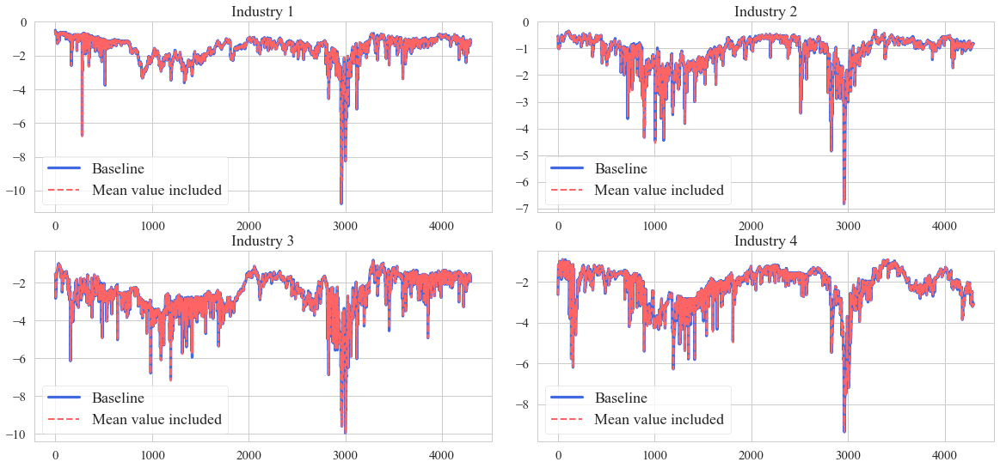

In [162]:
sns.set_style("whitegrid")
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.figure(figsize = (20, 9))
plt.subplots_adjust(wspace=0.1)
for i_ in range(1, 5):
    
    plt.subplot(2, 2, i_)
    
    plt.plot(result_5['VaR_5_{}'.format(i_)],
             color='royalblue', 
             lw=3.2,
             #linestyle='dashed',
             label='Baseline'
            )
    plt.plot(result_5_['VaR_5_{}'.format(i_)],
             color="#FF6464", 
             lw=2,
             linestyle='dashed',
             label='Mean value included')
    plt.legend(fontsize=18)
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.title('Industry {}'.format(i_), fontsize=18)
plt.show()

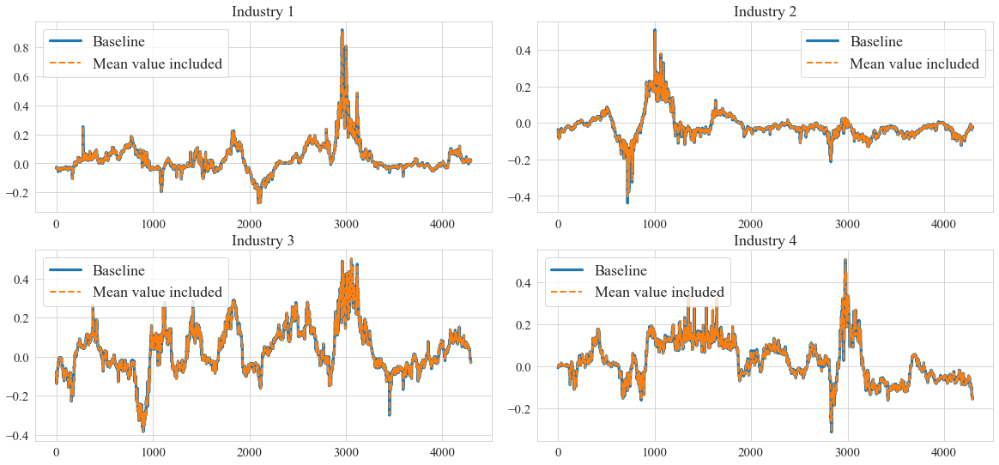

In [78]:
plt.figure(figsize = (20, 9))
plt.subplots_adjust(wspace=0.1)
for i_ in range(1, 5):
    
    plt.subplot(2, 2, i_)
    
    plt.plot(result_50['VaR_50_{}'.format(i_)],
             #color='royalblue', 
             lw=3.2,
             #linestyle='dashed',
             label='Baseline'
            )
    plt.plot(result_50_['VaR_50_{}'.format(i_)],
             #color="#FF6464", 
             lw=2,
             linestyle='dashed',
             label='Mean value included')
    plt.legend(fontsize=18)
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.title('Industry {}'.format(i_), fontsize=18)
plt.show()

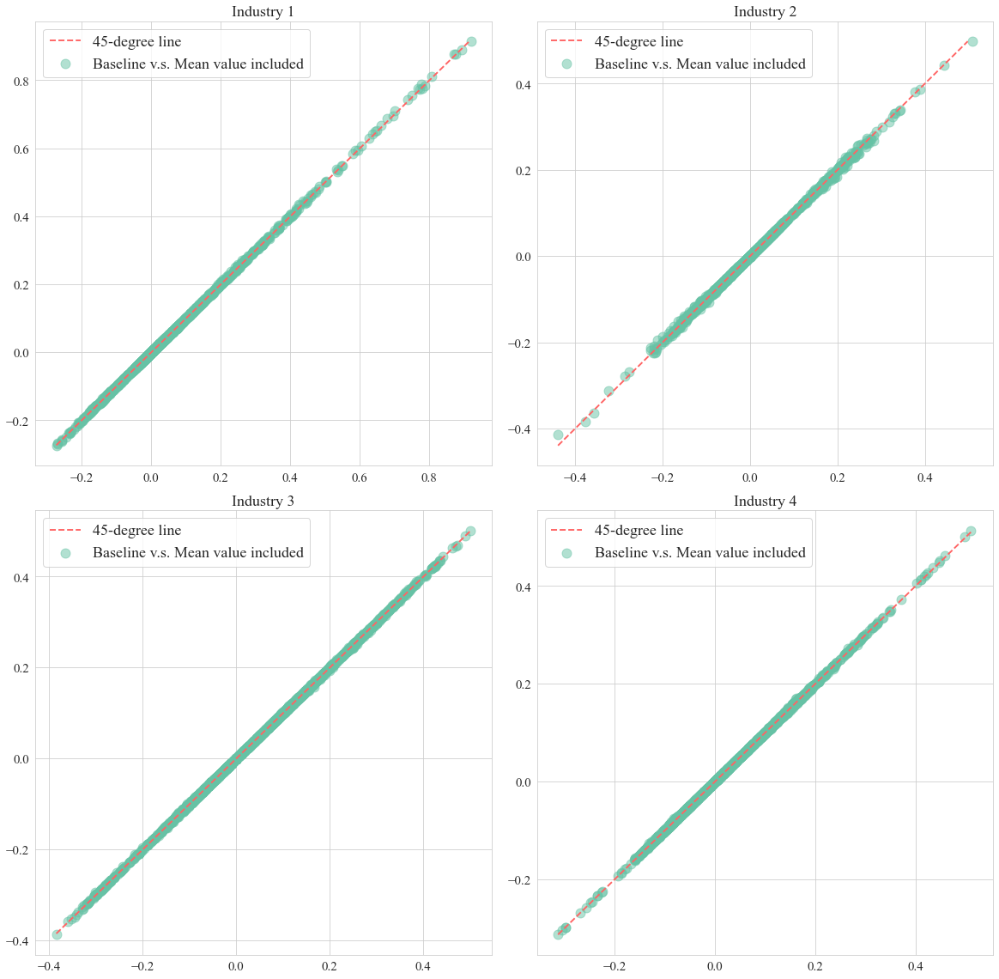

In [86]:
plt.figure(figsize = (20, 20))
plt.subplots_adjust(wspace=0.1, hspace=0.1)
for i_ in range(1, 5):
    
    plt.subplot(2, 2, i_)
    
    plt.scatter(result_50['VaR_50_{}'.format(i_)], 
                result_50_['VaR_50_{}'.format(i_)],
                color='#66C2A5', 
                alpha=0.5, 
                s=120)
    plt.plot([result_50['VaR_50_{}'.format(i_)].min(), result_50_['VaR_50_{}'.format(i_)].max()],
             [result_50['VaR_50_{}'.format(i_)].min(), result_50_['VaR_50_{}'.format(i_)].max()], 
             color="#FF6464", 
             linestyle='--',
             lw=1.9)

    plt.legend(["45-degree line", "Baseline v.s. Mean value included"], fontsize=18)
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.title('Industry {}'.format(i_), fontsize=18)
plt.show()

In [ ]:
%%time
j = 1
for winsize in [125, 150, 175, 200, 225, 250]:
    len_of_s = 2 * winsize - 1
    print('OKOKOK')
    df = df_total[['date', 'R_1']]  # df is just a temp DataFrame
    df['VaR_5_' + str(j)] = np.nan
    df['VaR_50_' + str(j)] = np.nan
    print('OKOKOK')
    for k in range(df.shape[0] - len_of_s + 1):  # the 2rd loop --> time series level
        s = df['R_1'][k:k + len_of_s]
        VaR_5, VaR_50 = GARCH_HS(s, winsize)
        df.loc[k + len_of_s - 1, 'VaR_5_' + str(j)] = VaR_5
        df.loc[k + len_of_s - 1, 'VaR_50_' + str(j)] = VaR_50

    df = df.dropna()
    if j == 1:
        result_5__ = df[['date', 'VaR_5_' + str(j)]]
        result_50__ = df[['date', 'VaR_50_' + str(j)]]
    else:
        result_5__ = pd.merge(result_5__, df[['date', 'VaR_5_' + str(j)]], how='outer', 
                              on='date')
        result_50__ = pd.merge(result_50__, df[['date', 'VaR_50_' + str(j)]], how='outer',
                               on='date')
    j += 1

In [101]:
result_5__['date'] = pd.to_datetime(result_5__['date'], format="%Y-%m")

In [103]:
result_5__.set_index(keys='date')

,VaR_5_1,VaR_5_2,VaR_5_3,VaR_5_4,VaR_5_5,VaR_5_6
date,,,,,,
2002-04-17,-0.491675,NaN,NaN,NaN,NaN,NaN
2002-04-18,-0.538144,NaN,NaN,NaN,NaN,NaN
2002-04-19,-0.517019,NaN,NaN,NaN,NaN,NaN
2002-04-22,-0.526471,NaN,NaN,NaN,NaN,NaN
2002-04-23,-0.487594,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
2020-12-25,-1.257283,-1.204958,-1.224693,-1.155384,-1.140152,-1.088117
2020-12-28,-1.248357,-1.183221,-1.191501,-1.121358,-1.102104,-1.053999
2020-12-29,-1.245238,-1.160147,-1.163204,-1.090740,-1.073687,-1.036799


In [106]:
winsize_ls = [125, 150, 175, 200, 225, 250]

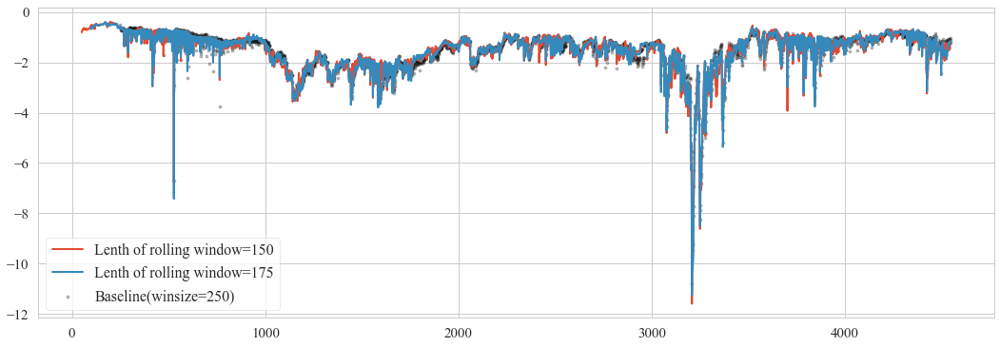

In [172]:
plt.figure(figsize = (18, 6))
for i_ in range(2, 4):
    plt.plot(result_5__['VaR_5_{}'.format(i_)],
             #color='royalblue', 
             lw=2,
             #linestyle='dashed',
             label='Lenth of rolling window={}'.format(winsize_ls[i_ - 1])
            )
plt.scatter(y=result_5__['VaR_5_{}'.format(6)], 
           x=np.arange(result_5__.shape[0]), 
           color='k',
           s=10, 
           marker='o', 
           alpha=0.3, 
           label='Baseline(winsize=250)')
plt.legend(fontsize=16)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.savefig('Rolling VaR at different winsizes.png', dpi=500)
plt.show()

In [166]:
plt.style.use('ggplot')
#sns.set()
sns.set_style("whitegrid")
plt.rcParams['font.sans-serif'] = 'Times New Roman'

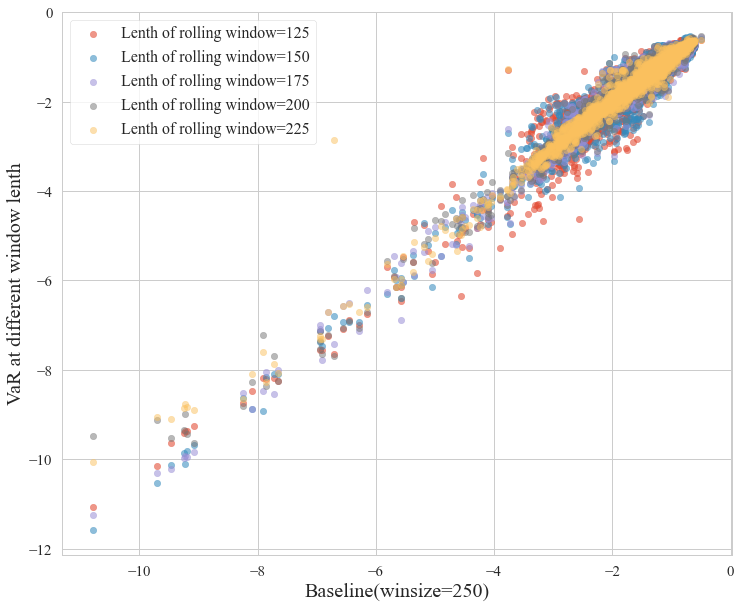

In [177]:
plt.figure(figsize = (12, 10))
for i_ in range(1, 6):

    plt.scatter(y=result_5__['VaR_5_{}'.format(i_)], 
               x=result_5__['VaR_5_{}'.format(6)], 
               #color='k',
               s=41, 
               #marker='x', 
               label='Lenth of rolling window={}'.format(winsize_ls[i_ - 1]), 
               alpha=(0.6 - 0.02 * i_))
'''plt.scatter(y=result_50__['VaR_50_{}'.format(6)], 
           x=result_5__['VaR_5_{}'.format(6)], 
           #color='k',
           s=41, 
           #marker='x', 
           label='Quantile=50%', 
           alpha=0.45)'''

plt.legend(fontsize=16, facecolor='white')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('Baseline(winsize=250)', fontsize=20)
plt.ylabel('VaR at different window lenth', fontsize=20)
plt.show()

In [ ]:
%%time
for j in range(1, 2):  # the 1st loop --> Panel level

    df = df_total[['date', 'R_' + str(j)]]  # df is just a temp DataFrame
    df['VaR_5' + str(j)] = np.nan
    df['VaR_1' + str(j)] = np.nan

    for k in range(df.shape[0] - len_of_s + 1):  # the 2rd loop --> time series level
        s = df['R_' + str(j)][k:k + len_of_s]
        VaR_5, VaR_1 = GARCH_HS(s, winsize)
        df.loc[k + len_of_s - 1, 'VaR_5' + str(j)] = VaR_5
        df.loc[k + len_of_s - 1, 'VaR_1' + str(j)] = VaR_1

    df = df.dropna()
    if j == 1:
        res_5 = df[['date', 'VaR_5' + str(j)]]
        res_1 = df[['date', 'VaR_1' + str(j)]]
    else:
        res_5 = pd.merge(res_5, df[['date', 'VaR_5' + str(j)]], how='outer')
        res_1 = pd.merge(res_1, df[['date', 'VaR_1' + str(j)]], how='outer')

    print("》》》》》》{}!!".format(j))

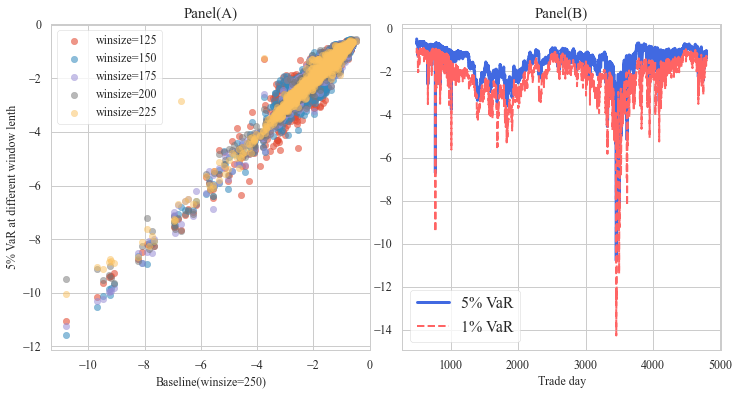

In [198]:
plt.figure(figsize = (12, 6))
plt.subplots_adjust(wspace=0.1)
plt.subplot(1, 2, 1)
for i_ in range(1, 6):

    plt.scatter(y=result_5__['VaR_5_{}'.format(i_)], 
               x=result_5__['VaR_5_{}'.format(6)], 
               #color='k',
               s=41, 
               #marker='x', 
               label='winsize={}'.format(winsize_ls[i_ - 1]), 
               alpha=(0.6 - 0.02 * i_))

plt.legend(fontsize=12, facecolor='white')
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.xlabel('Baseline(winsize=250)', fontsize=12)
plt.ylabel('5% VaR at different window lenth', fontsize=12)
plt.title('Panel(A)', fontsize=15)
plt.subplot(1, 2, 2)
plt.plot(res_5['VaR_51'],
         color='royalblue', 
         lw=3,
         #linestyle='dashed',
         label='5% VaR'
        )
plt.plot(res_1['VaR_11'],
         color="#FF6464", 
         lw=2,
         linestyle='dashed',
         label='1% VaR')
plt.legend(fontsize=16, facecolor='white')
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.title('Panel(B)', fontsize=15)
plt.xlabel('Trade day', fontsize=12)
plt.savefig('Function of Main code.png', dpi=600)
plt.show()